In [1902]:
from Modules.stock_data_functions import TickerData, TickerComparison, calc_log_rets
import Modules.stock_data_functions as s
importlib.reload(s)
import pandas as pd
import numpy as np
import datetime as dt
import importlib
from fredapi import Fred
import matplotlib.pyplot as plt
fred_api = Fred('e48d0413b1cd0a3b30b58d42225373de')

### Core Idea

Find a set of regressors and check how it maps to actual factors of tech and AI stocks. Tasks
1. Define Stock universe related to AI and Semis
2. Define regressor universe related to AI and Semis
3. Find a set of regressors that explain a large part of these tech stock

Business models by value chain

Upstream:
1. Memory providers (MU)
2. Connectivity (ALAB, CRDO)
Midstream
1. Packaging & Testing (TER,AMKR)
2. Compute platforms (AMD, NVIDIA)
Integration
1. SMCI
Cloud compute providers
1. ORCL

End Goal
1. Find a way to identify indicators of a regime shift -> factor changes
2. See if there are similarities in how similar stocks have their sensitivities change

#### Regressors

##### Semis
- XSD : equal weighted (representative of general semis and ai)
- SOXX : medium concentrated
- SMH : heavily concentrated 
- DGRN : china AI

In [313]:
ETFs     = ['QQQ', 'SPY', 'SOXX', 'SMH', 'DTCR','ALAI', 'IBIT', 'CLOU', 'QMOM', 'QUAL', 'VLUE', 'SPHB', 'VUG', 'USMV', 'RSP', 'XSD']

ETFs = [
    # Style factors
    "SPMO", "PDP", "QVAL", "QUAL", "SPHQ", "USMV", "SPLV", "SIZE", "SPHB", "LRGF", "QMOM", "VIG",
    # Thematic (AI/datacenter-adjacent)
    "ALAI", "AIQ", "WCLD", "DTCR", "SRVR", "SMH", "XSD", 'QQQ', 'SPY'
]

end_date = (dt.datetime.today() - dt.timedelta(days=1)).strftime('%Y-%m-%d')

ETF_object_day = TickerComparison(ETFs, '2023-09-11', period='day',
                                  date_updated=True, fetch_in_chunks=True,
                                  waiting_time=30, end_date=end_date, chunksize=700)

ETF_close_prices = ETF_object_day.tickers_stocks_prices.loc[:, (slice(None), 'close')].copy()
ETF_close_prices = ETF_close_prices.droplevel(1, axis=1)

[1/28] SPMO: start
[1/28] SPMO: done
[2/28] PDP: start
[2/28] PDP: done
[3/28] QVAL: start
[3/28] QVAL: done
[4/28] QUAL: start
[4/28] QUAL: done
[5/28] SPHQ: start
[5/28] SPHQ: done
[6/28] USMV: start
[6/28] USMV: done
[7/28] SPLV: start
[7/28] SPLV: done
[8/28] SIZE: start
[8/28] SIZE: done
[9/28] SPHB: start
[9/28] SPHB: done
[10/28] LRGF: start
[10/28] LRGF: done
[11/28] QMOM: start
[11/28] QMOM: done
[12/28] VIG: start
[12/28] VIG: done
[13/28] ALAI: start
[13/28] ALAI: done
[14/28] AIQ: start
[14/28] AIQ: done
[15/28] CLOU: start
[15/28] CLOU: done
[16/28] WCLD: start
[16/28] WCLD: done
[17/28] DTCR: start
[17/28] DTCR: done
[18/28] SRVR: start
[18/28] SRVR: done
[19/28] SOXX: start
[19/28] SOXX: done
[20/28] SMH: start
[20/28] SMH: done
[21/28] XSD: start
[21/28] XSD: done
[22/28] BOTZ: start
[22/28] BOTZ: done
[23/28] IRBO: start
Request URL: https://api.polygon.io/v2/aggs/ticker/IRBO/range/1/day/2024-08-09/2025-11-03?limit=500000
Request Headers: {'Authorization': 'Bearer REDA

In [ ]:
ETF_object_min = TickerComparison(ETFs, '2023-09-11', period='minute',
                                  date_updated=True, fetch_in_chunks=True,
                                  waiting_time=30, end_date=end_date, chunksize=200)

In [179]:
stocks = ['META', 'MU', 'CRDO', 'AMD', 'INTC', 'TER', 'AMKR', 'NVDA']

stock_object = TickerComparison(stocks, '2023-09-11', period='day',
                                date_updated=False, fetch_in_chunks=True,
                                waiting_time=30, end_date=end_date, chunksize=700)
stock_rets = stock_object.tickers_stocks_prices.loc[:, (slice(None), 'close')].copy(deep=True).dropna().apply(calc_log_rets)
stock_rets = stock_rets.droplevel(axis=1, level=1)

[1/8] META: start
[1/8] META: done
[2/8] MU: start
[2/8] MU: done
[3/8] CRDO: start
[3/8] CRDO: done
[4/8] AMD: start
[4/8] AMD: done
[5/8] INTC: start
[5/8] INTC: done
[6/8] TER: start
[6/8] TER: done
[7/8] AMKR: start
[7/8] AMKR: done
[8/8] NVDA: start
[8/8] NVDA: done


In [324]:
partial_missing_data = []
for i in ETF_close_prices.columns:
    years = ETF_close_prices[i].first_valid_index().year
    if years > 2023:
        partial_missing_data.append(i)

ETF_close_prices2 = ETF_close_prices.loc['2024-09-01':].copy()
ETF_rets2         = ETF_close_prices2.apply(calc_log_rets)  

ETF_close_prices  = ETF_close_prices.drop(columns=partial_missing_data)
ETF_close_prices  = ETF_close_prices.loc['2023-11-06':].copy()
ETF_rets          = ETF_close_prices.apply(calc_log_rets)

In [ ]:
from Modules.read_in_data_functions import get_sub_sectors_tickers, SUB_SECTOR_DICT


cut_off_cap           = 10_000 
tech_stocks_marketcap = get_sub_sectors_tickers(sector='Technology', n = 60) 
tech_sectors          = list(tech_stocks_marketcap.columns.get_level_values(0).unique())

/Users/phillip/Desktop/Moon2/Modules/read_in_data_functions.py:318: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbols['Market Cap'] = (
/Users/phillip/Desktop/Moon2/Modules/read_in_data_functions.py:318: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbols['Market Cap'] = (
/Users/phillip/Desktop/Moon2/Modules/read_in_data_functions.py:318: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

In [1704]:
mask = (tech_stocks_marketcap[tech_stocks_marketcap.loc[:,(slice(None), 'Market Cap')] > cut_off_cap] > 0)
tech_stocks_marketcap = tech_stocks_marketcap.loc[mask.any(axis=1), :]

long = (
    tech_stocks_marketcap
    .stack(level=0, future_stack=True)                       # index: (row, sector); columns: ['Symbol','Market Cap']
    .dropna(subset=['Market Cap'])        # keep rows with a market cap
)

result = (
    long
    .groupby(level=1)                     # group by sector (the stacked level)
    .agg(avg_market_cap=('Market Cap', lambda x : x.mean().round(2)),  # average market cap per sector
         n_stocks=('Symbol', 'count'))    # counts non-null symbols
    .sort_index()
)

semi_tickers           = tech_stocks_marketcap['semiconductors']['Symbol']
software_tickers       = tech_stocks_marketcap['software-application']


In [71]:
l = semi_tickers.to_list()
l += (['AAPL', 'TER', 'NVDA', 'MSFT', 'TSLA', 'TSM', 'AVGO', 'AMKR'])

In [1996]:
all_stocks = all_tickers_ + semi_tickers.to_list()

In [ ]:
# --- Core & Factors (broad beta + factor/ESG + active thematic rotation) ---
core_and_factors = {
    "SPY":  "SPDR S&P 500 (US large-cap core)",
    "QQQ":  "Invesco QQQ (Nasdaq-100 growth)",
    "ESGU": "iShares ESG Aware MSCI USA (ESG-screened core)",
    "IMTM": "iShares MSCI Intl Momentum Factor (developed ex-US momentum)",
    "DYNF": "BlackRock U.S. Equity Factor Rotation (active multi-factor)",
    "THRO": "iShares U.S. Thematic Rotation Active (active multi-theme)",
}

# --- Semiconductors (note: XSD is equal-weighted; SOXX/SMH are cap-weighted) ---
semiconductors = {
    "XSD": "SPDR S&P Semiconductor (equal-weight)",
    "SOXX": "iShares Semiconductor (PHLX Semiconductor Index)",
    "SMH": "VanEck Semiconductor (MVIS US Listed Semiconductor 25)",
}

# --- Software, Cloud & AI (software/application + cloud infra + AI strategies) ---
software_cloud_ai = {
    "IGV":  "iShares Expanded Tech–Software",
    "SKYY": "First Trust Cloud Computing",
    "CLOU": "Global X Cloud Computing",
    "IGPT": "Invesco AI & Next Gen Software UCITS",
}

# --- Innovation: Robotics / Exponential Tech / China Tech / Biotech ---
innovation_and_china = {
    "XT":   "iShares Exponential Technologies (broad innovation)",
    "ROBO": "ROBO Global Robotics & Automation",
    "KTEC": "KraneShares Hang Seng TECH (China internet/tech leaders)",
    "TCHI": "iShares China Multisector Tech UCITS",
    "IBB":  "iShares Biotechnology (biotech industry)",
}

# --- Clean Energy, EV & Storage Materials ---
clean_energy_ev_storage = {
    "ICLN": "iShares Global Clean Energy",
    "IBAT": "iShares Energy Storage & Materials UCITS",
    "ETEC": "iShares Breakthrough Environmental Solutions UCITS",
    "IDRV": "iShares Self-Driving EV & Tech",
}

# --- Infrastructure, Manufacturing & Defense (onshoring/reshoring themes) ---
infrastructure_mfg_defense = {
    "IFRA": "iShares U.S. Infrastructure",
    "EMIF": "iShares Emerging Markets Infrastructure",
    "MADE": "iShares U.S. Manufacturing Renaissance (active)",
    "ITA":  "iShares U.S. Aerospace & Defense",
    "IETC": "iShares U.S. Tech Independence Focused",
}

# --- Emerging Markets Focus ---
emerging_markets = {
    "EMGF": "iShares MSCI Emerging Markets Multifactor",
    "EMXC": "iShares MSCI Emerging Markets ex-China",
    "EWY":  "iShares MSCI South Korea",
}

# --- Communications & Market Structure (telecoms, comm services, brokers/exchanges) ---
communications_market_structure = {
    "XLC": "Communication Services Select Sector SPDR",
    "IYZ": "iShares U.S. Telecommunications",
    "IAI": "iShares U.S. Broker-Dealers & Securities Exchanges",
}

# Convenience containers
all_groups = {
    "core_and_factors": core_and_factors,
    "semiconductors": semiconductors,
    "software_cloud_ai": software_cloud_ai,
    "innovation_and_china": innovation_and_china,
    "clean_energy_ev_storage": clean_energy_ev_storage,
    "infrastructure_mfg_defense": infrastructure_mfg_defense,
    "emerging_markets": emerging_markets,
    "communications_market_structure": communications_market_structure,
}

# Optional: reverse map from ticker -> group name
ticker_to_group = {
    tkr: group for group, bucket in all_groups.items() for tkr in bucket.keys()
}


In [ ]:
semi_tickers           = tech_stocks_marketcap['semiconductors']['Symbol']
semi_equipment_tickers = tech_stocks_marketcap['semiconductor-equipment-and-materials']['Symbol']
software_tickers       = tech_stocks_marketcap['software-application']['Symbol']
computer_hardware_tickers = tech_stocks_marketcap['computer-hardware']['Symbol']
comm_equipment_tickers = tech_stocks_marketcap['communication-equipment']['Symbol']
software_infrastructure_tickers = tech_stocks_marketcap['software-infrastructure']['Symbol']
electronic_components_tickers = tech_stocks_marketcap['electronic-components']['Symbol']
scientific_technical_instruments_tickers = tech_stocks_marketcap['scientific-and-technical-instruments']['Symbol']

all_tickers = {'semi' : semi_tickers,
               'semi_equipment' : semi_equipment_tickers,
               'software' : software_tickers, 'computer_hardware' : computer_hardware_tickers,
               'comm_equipment' : comm_equipment_tickers,
               'software_infrastructure' : software_infrastructure_tickers,
               'electronic_components' : electronic_components_tickers,
               'scientific_technical_instruments' : scientific_technical_instruments_tickers
              }

In [ ]:
STOCK_TICKERS =[]
for key, val in all_tickers.items():
    for i in val:
        STOCK_TICKERS.append(i)

temp = pd.Series(STOCK_TICKERS, index=None)
STOCK_TICKERS = temp.dropna().tolist()

In [1990]:
not_present

['CRWV', 'XYZ', 'CPAY', 'RBRK', 'KSPI', 'SAIL', 'RAL', 'ODYS']

In [ ]:
all_reg = list(ticker_to_group.keys())

In [ ]:
software_tickers       = tech_stocks_marketcap['software-application']
l                      = list(software_tickers['Symbol'])

In [1997]:
daily_semis = TickerComparison(all_stocks, '2023-09-11', period='day', date_updated=False, fetch_in_chunks=False, waiting_time=1, end_date='2025-11-05')

[1/222] ASML: start
[1/222] ASML: done
[2/222] LRCX: start
[2/222] LRCX: done
[3/222] AMAT: start
[3/222] AMAT: done
[4/222] KLAC: start
[4/222] KLAC: done
[5/222] TER: start
[5/222] TER: done
[6/222] ENTG: start
[6/222] ENTG: done
[7/222] NVMI: start
[7/222] NVMI: done
[8/222] AMKR: start
[8/222] AMKR: done
[9/222] ONTO: start
[9/222] ONTO: done
[10/222] CAMT: start
[10/222] CAMT: done
[11/222] FORM: start
[11/222] FORM: done
[12/222] IPGP: start
[12/222] IPGP: done
[13/222] AMBA: start
[13/222] AMBA: done
[14/222] ACLS: start
[14/222] ACLS: done
[15/222] DQ: start
[15/222] DQ: done
[16/222] KLIC: start
[16/222] KLIC: done
[17/222] ACMR: start
[17/222] ACMR: done
[18/222] VECO: start
[18/222] VECO: done
[19/222] PLAB: start
[19/222] PLAB: done
[20/222] UCTT: start
[20/222] UCTT: done
[21/222] COHU: start
[21/222] COHU: done
[22/222] INDI: start
[22/222] INDI: done
[23/222] AEHR: start
[23/222] AEHR: done
[24/222] ICHR: start
[24/222] ICHR: done
[25/222] AXTI: start
[25/222] AXTI: done

In [ ]:
daily_reg = TickerComparison(all_reg, '2023-09-11', date_updated=False, period='day', waiting_time=60, chunksize=900, end_date='2025-11-06')

In [1998]:
prices = daily_semis.tickers_stocks_prices.loc[:, (slice(None), 'vwap')].copy()
prices = prices.droplevel(1, axis=1)
rets   = prices.apply(calc_log_rets)

reg_p  = daily_reg.tickers_stocks_prices.loc[:, (slice(None), 'vwap')].copy().apply(calc_log_rets)
reg_rets  = reg_p.droplevel(1, axis=1)

In [1868]:
reg_rets = reg_rets.drop(columns=not_present)

In [ ]:
not_present_reg = []
for i in all_reg:
    if daily_reg.tickers_stocks_prices.loc[:, (i, 'close')].first_valid_index() > dt.datetime(2023, 11, 15):
        print(i)
        print(daily_reg.tickers_stocks_prices.loc[:, (i, 'close')].first_valid_index())
        not_present_reg.append(i)

not_present = []
for i in rets:
    if daily_semis.tickers_stocks_prices.loc[:, (i, 'close')].first_valid_index() > dt.datetime(2023, 11, 15):
        print(i)
        print(daily_semis.tickers_stocks_prices.loc[:, (i, 'close')].first_valid_index())
        not_present.append(i)

In [2191]:
import Modules.stock_data_functions

In [2001]:
rets = rets.drop(columns=not_present)
reg_rets = reg_rets.drop(columns=not_present_reg)   

##### Adding in features
- T10Y3M (correlation with R2)
- VIX
- Bond Vol
- DXY/Dollar

In [2186]:
importlib.reload(Modules.stock_data_functions)
import Modules.stock_data_functions

In [2007]:
yield_spread = fred_api.get_series('T10Y3M', observation_start='2023-09-11').dropna().rename('T10Y3m')
vix          = fred_api.get_series('VIXCLS', observation_start='2023-09-11').dropna().rename('VIX')
move         = fred_api.get_series('BAMLC0A0CM', observation_start='2023-09-11').dropna().rename('MOVE')
dollar       = fred_api.get_series('DTWEXBGS', observation_start='2023-09-11').dropna().rename('DXY')
btc          = fred_api.get_series('CBBTCUSD', observation_start='2023-09-11').dropna().rename('BTC')

In [2008]:
btc_rets         = calc_log_rets(btc)
dollar_r         = calc_log_rets(dollar)

In [2009]:
reg_rets = pd.concat([reg_rets, vix, move, yield_spread, btc_rets,dollar_r], axis=1)
print(reg_rets.columns)

Index(['SPY', 'QQQ', 'ESGU', 'IMTM', 'DYNF', 'XSD', 'SOXX', 'SMH', 'IGV',
       'SKYY', 'CLOU', 'IGPT', 'XT', 'ROBO', 'KTEC', 'TCHI', 'IBB', 'ICLN',
       'ETEC', 'IDRV', 'IFRA', 'EMIF', 'ITA', 'IETC', 'EMGF', 'EMXC', 'EWY',
       'XLC', 'IYZ', 'IAI', 'VIX', 'MOVE', 'T10Y3m', 'BTC', 'DXY'],
      dtype='object')


#### Big boy search time

In [2287]:
def calc_zscore(
    series: pd.Series,
    winsor: Optional[Union[float, Tuple[float, float]]] = None,
    ddof: int = 1,
) -> pd.Series:
    """
    Convert returns to z-scores after optional two-sided winsorization.

    winsor:
      - None: no winsorization
      - float a in [0, 0.5): symmetric winsor at (a, 1-a)
      - tuple (low_q, high_q): explicit quantiles, e.g. (0.01, 0.99)
    ddof:
      - degrees of freedom for std (pandas std defaults to 1)
    """
    s = pd.to_numeric(series, errors="coerce").astype(float)

    if winsor is not None:
        if isinstance(winsor, (int, float)):
            a = float(winsor)
            if not (0 <= a < 0.5):
                raise ValueError("winsor float must be in [0, 0.5).")
            low_q, high_q = a, 1 - a
        else:
            if len(winsor) != 2:
                raise ValueError("winsor tuple must be (low_q, high_q).")
            low_q, high_q = winsor

        if not (0 <= low_q < high_q <= 1):
            raise ValueError("quantiles must satisfy 0 ≤ low < high ≤ 1.")

        q_low, q_high = s.quantile([low_q, high_q])
        s = s.clip(lower=q_low, upper=q_high)

    mu = s.mean()
    sigma = s.std(ddof=ddof)

    # Safe for constant/NA windows: return zeros where data exist, keep NaNs as NaNs.
    z = (s - mu) / sigma if (np.isfinite(sigma) and sigma != 0) else s * 0.0
    z.name = series.name
    return z

In [2289]:
reg_rets_z = reg_rets.apply(calc_zscore)

In [2164]:
from typing import List, Optional

In [2167]:
def choose_etf_representatives(
    X: pd.DataFrame,
    k_max: Optional[int] = None,
    corr_cap: float = 0.90,
    min_var: float = 1e-12,
) -> List[str]:
    """
    Unsupervised ETF de-duplication via QR-like column pivoting + correlation cap.
    - Input X: DataFrame of (already winsorized/z-scored) ETF returns, aligned in time.
    - k_max: max number of ETFs to keep (default: automatic from effective rank).
    - corr_cap: don't admit a candidate if |corr| with any chosen ETF exceeds this.
    - min_var: skip columns with near-zero variance.

    Returns: list of selected ETF column names in importance order.
    """
    # 0) Clean: drop all-NaN cols, keep numeric, filter near-constant
    X = X.copy()
    X = X.select_dtypes(include=[np.number])
    variances = X.var(skipna=True)
    cols = [c for c in X.columns if np.isfinite(variances.get(c, np.nan)) and variances[c] > min_var]
    X = X[cols]
    if X.empty:
        return []

    # Precompute correlation matrix for corr_cap screening (pairwise complete obs)
    corr = X.corr().abs()

    # 1) Center (columns already standardized is fine; centering helps numerics)
    Xc = X.subtract(X.mean(axis=0), axis=1).to_numpy()
    n, p = Xc.shape

    # 2) Gram–Schmidt with pivoting by residual column norms
    selected = []
    residual = Xc.copy()
    remaining = list(range(p))

    # Auto k_max: limit by p and a loose n/10 rule to keep models parsimonious later
    if k_max is None:
        k_max = min(p, max(1, n // 10))

    # Track an orthonormal basis of chosen columns to orthogonalize candidates
    Q = []

    while remaining and len(selected) < k_max:
        # Correlation-cap mask against *original* features
        mask = []
        for j in remaining:
            ok = True
            for s in selected:
                # if any selected is too correlated with candidate, drop candidate
                if corr.iloc[s, j] > corr_cap:
                    ok = False
                    break
            mask.append(ok)
        cand_idx = [r for r, ok in zip(remaining, mask) if ok]
        if not cand_idx:
            break

        # Compute residual norms for current candidates
        norms = []
        for j in cand_idx:
            col = residual[:, j]
            # handle NaNs by zeroing them out for norm computation
            norms.append(np.nan_to_num(col).dot(np.nan_to_num(col)))
        # choose pivot with maximum residual norm
        jstar = cand_idx[int(np.argmax(norms))]
        selected.append(jstar)

        # Update orthonormal basis with the newly selected column (Modified GS)
        v = residual[:, jstar].copy()
        for q in Q:
            v -= np.nansum(v * q) * q
        denom = np.sqrt(np.nansum(v * v))
        if denom == 0 or not np.isfinite(denom):
            # if degenerate, remove and continue
            selected.pop()
            remaining.remove(jstar)
            continue
        q_new = v / denom
        Q.append(q_new)

        # Orthogonalize all columns against q_new (one MGS step)
        for j in remaining:
            residual[:, j] -= np.nansum(residual[:, j] * q_new) * q_new

        remaining.remove(jstar)

    # Map indices back to column names
    return [X.columns[i] for i in selected]


In [2310]:
regressor_chosen = choose_etf_representatives(reg_rets_z,20, corr_cap=1)

X_reduced = reg_rets_z[regressor_chosen].copy()
X_full    = reg_rets_z.copy()

In [ ]:
import numpy as np
import pandas as pd
from typing import Dict, Tuple

# --- shared: align to identical rows (no NaNs in either matrix) ---
def _aligned_rows(X_full: pd.DataFrame, X_reduced: pd.DataFrame) -> pd.Index:
    idx = X_full.index.intersection(X_reduced.index)
    m1 = X_full.loc[idx].notna().all(axis=1)
    m2 = X_reduced.loc[idx].notna().all(axis=1)
    return idx[m1 & m2]

# 1) Spanning / reconstruction (leave-one-out), aligned
def spanning_r2_scores(X_full: pd.DataFrame, X_reduced: pd.DataFrame) -> Tuple[pd.Series, Dict[str, float]]:
    rows = _aligned_rows(X_full, X_reduced)
    Xf, Xr = X_full.loc[rows], X_reduced.loc[rows]
    r2 = {}
    for col in Xf.columns:
        Xr_loo = Xr.drop(columns=[col], errors="ignore")
        if Xr_loo.shape[1] == 0:
            r2[col] = np.nan; continue
        df = pd.concat([Xf[[col]], Xr_loo], axis=1).dropna()
        if df.shape[0] < Xr_loo.shape[1] + 2:
            r2[col] = np.nan; continue
        yv = df.iloc[:, 0].values
        Xv = np.c_[np.ones(len(df)), df.iloc[:, 1:].values]
        beta, _, _, _ = np.linalg.lstsq(Xv, yv, rcond=None)
        yhat = Xv @ beta
        ss_res = np.sum((yv - yhat)**2)
        ss_tot = np.sum((yv - yv.mean())**2)
        r2[col] = 1 - ss_res/ss_tot if ss_tot > 0 else np.nan
    r2s = pd.Series(r2).sort_values(ascending=False)
    summary = {
        "median_R2": float(r2s.median(skipna=True)),
        "p5_R2": float(r2s.quantile(0.05)),
        "min_R2": float(r2s.min(skipna=True)),
        "coverage": int(r2s.notna().sum()),
        "total": int(len(r2s)),
    }
    return r2s, summary

# 2) Principal angles between subspaces (top-k PC subspace of full vs column space of reduced), aligned



In [ ]:
rows = _aligned_rows(X_full, X_reduced)
r2s, r2_summary = spanning_r2_scores(X_full, X_reduced)
angles = principal_angles_summary(X_full, X_reduced, var_thresh=0.95)
er = effective_rank_compare(X_full, X_reduced)
vifs = vif_series(X_reduced, rows=rows)          # or X_full, same rows
cis  = condition_indices(X_reduced, rows=rows)

print(r2_summary)
print(angles)
print(er)
print(vifs)
print(cis)

In [2457]:
import numpy as np
import pandas as pd

# ---------------------------
# Core small, safe utilities
# ---------------------------

def _oos_r2(y_true, y_pred, y_bench):
    """Campbell–Thompson OOS R^2 vs a mean benchmark; NA-safe."""
    v = np.isfinite(y_true) & np.isfinite(y_pred) & np.isfinite(y_bench)
    if v.sum() == 0:
        return np.nan
    e  = y_true[v] - y_pred[v]
    eb = y_true[v] - y_bench[v]
    den = np.sum(eb**2)
    return 1 - (np.sum(e**2) / den if den > 0 else np.nan)

def _is_expanding(win):
    """True if window means expanding (None/NaN/'expanding')."""
    return (win is None) or (isinstance(win, float) and np.isnan(win)) or pd.isna(win) \
           or (isinstance(win, str) and win.lower() == "expanding")

def _normalize_windows(windows):
    """
    Turn a windows spec into a list of labels:
      - None or 'expanding' -> 'expanding'
      - numeric-like -> int(window)
    """
    norm = []
    for w in windows:
        if _is_expanding(w):
            norm.append("expanding")
        else:
            # accept ints/floats/str-digits
            if isinstance(w, (int, np.integer)):
                norm.append(int(w))
            elif isinstance(w, float) and np.isfinite(w):
                norm.append(int(round(w)))
            elif isinstance(w, str) and w.isdigit():
                norm.append(int(w))
            else:
                # unknown token -> skip
                continue
    # de-duplicate while preserving order
    seen, out = set(), []
    for w in norm:
        if w not in seen:
            seen.add(w); out.append(w)
    return out

def _window_to_int_or_none(window_label):
    """'expanding' -> None; numeric label -> int."""
    return None if _is_expanding(window_label) else int(window_label)

# ---------------------------
# Feature selection (y-aware)
# ---------------------------

def _forward_path_safe(X, y, k_max=8, min_rows=5):
    """
    Greedy forward selection on residuals (OMP-style) with NA/constant guards.
    Returns a list of column NAMES in import order.
    """
    df = pd.concat([y.rename("__y__"), X], axis=1).dropna()
    if df.shape[0] < min_rows:
        return []
    # drop constants (std==0)
    cols = [c for c in X.columns if df[c].std(ddof=1) > 0]
    if not cols:
        return []
    chosen, r = [], df["__y__"].to_numpy()

    for _ in range(min(k_max, len(cols))):
        remaining = [c for c in cols if c not in chosen]
        if not remaining:
            break
        # correlation with residuals (auto-aligned; NA-safe)
        corrs = df[remaining].corrwith(pd.Series(r, index=df.index)).abs()
        corrs = corrs.replace([np.inf, -np.inf], np.nan).dropna()
        if corrs.empty:
            break
        jname = corrs.idxmax()
        chosen.append(jname)
        # update residual on same rows
        Xsel = df[chosen].to_numpy()
        beta, *_ = np.linalg.lstsq(Xsel, df["__y__"].to_numpy(), rcond=None)
        r = df["__y__"].to_numpy() - Xsel @ beta
    return chosen

# ---------------------------
# Single-ticker quick model
# ---------------------------

def quick_pick_model_single(
    y_series: pd.Series,
    X: pd.DataFrame,
    n_folds=3,
    k_max=8,
    windows=(None, 120, 252),
    test_frac=0.15,
    min_clean_obs=100,
):
    """
    Per ticker:
      1) dropna on y, align X by index, dropna jointly,
      2) build y-aware path on first training slice,
      3) score a tiny grid across k and windows,
      4) refit winner and report test OOS R^2.
    Returns (winner_dict, grid_df)
    """
    # 1) Per-ticker clean
    y_t = y_series.dropna()
    if y_t.empty:
        raise ValueError("Ticker has no non-NaN observations.")

    X_t = X.reindex(y_t.index)
    df_all = pd.concat([y_t.rename("__y__"), X_t], axis=1).dropna()
    if df_all.shape[0] < min_clean_obs:
        raise ValueError("Not enough clean observations after alignment and dropna().")

    y_all = df_all["__y__"]
    X_all = df_all.drop(columns="__y__")

    # 2) Walk-forward split bounds
    T = len(y_all)
    test_n = int(np.floor(T * test_frac))
    trainval_end = T - test_n
    if trainval_end <= 0:
        raise ValueError("Test fraction too large for series length.")
    # start folds after ~50% of history
    fold_edges = np.linspace(int(T * 0.5), trainval_end, n_folds + 1, dtype=int)

    # 3) Fix the feature order on the first training slice
    path_cols = _forward_path_safe(X_all.iloc[:fold_edges[0]], y_all.iloc[:fold_edges[0]], k_max=k_max)
    if not path_cols:
        raise ValueError("No usable predictors after cleaning (all NaN/constant?).")

    # 4) Evaluate grid
    win_specs = _normalize_windows(windows)
    results = []

    for k in range(1, min(k_max, len(path_cols)) + 1):
        cols = path_cols[:k]
        for Wlab in win_specs:
            preds, bench, truth = [], [], []
            for i in range(n_folds):
                tr_end, va_end = fold_edges[i], fold_edges[i+1]
                y_tr, X_tr = y_all.iloc[:tr_end], X_all.iloc[:tr_end][cols]
                y_va, X_va = y_all.iloc[tr_end:va_end], X_all.iloc[tr_end:va_end][cols]

                if _is_expanding(Wlab):
                    # expanding OLS
                    df_tr = pd.concat([y_tr.rename("__y__"), X_tr], axis=1).dropna()
                    if df_tr.shape[0] >= len(cols) + 2:
                        beta, *_ = np.linalg.lstsq(df_tr[cols].to_numpy(), df_tr["__y__"].to_numpy(), rcond=None)
                        y_hat = (X_va @ beta).to_numpy()
                    else:
                        y_hat = np.full(len(y_va), np.nan)
                else:
                    # rolling OLS with fixed window
                    Wint = _window_to_int_or_none(Wlab)
                    y_hat = np.full(len(y_va), np.nan)
                    for t in range(len(y_va)):
                        end_idx = tr_end + t
                        start_idx = max(0, end_idx - Wint)
                        y_win = y_all.iloc[start_idx:end_idx]
                        X_win = X_all.iloc[start_idx:end_idx][cols]
                        df_win = pd.concat([y_win.rename("__y__"), X_win], axis=1).dropna()
                        if df_win.shape[0] >= len(cols) + 2:
                            beta_t, *_ = np.linalg.lstsq(df_win[cols].to_numpy(), df_win["__y__"].to_numpy(), rcond=None)
                            y_hat[t] = float(X_va.iloc[t].to_numpy() @ beta_t)

                # expanding-mean benchmark up to tr_end-1
                m = y_all.iloc[:tr_end].expanding().mean().reindex(y_va.index, method="pad").to_numpy()
                preds.append(y_hat); bench.append(m); truth.append(y_va.to_numpy())

            y_pred  = np.concatenate(preds)
            y_bench = np.concatenate(bench)
            y_true  = np.concatenate(truth)
            score = _oos_r2(y_true, y_pred, y_bench)

            results.append({"k": int(k), "window": Wlab, "oos_r2": score, "cols": cols})

    df_res = pd.DataFrame(results).sort_values(["oos_r2", "k"], ascending=[False, True]).reset_index(drop=True)
    winner = df_res.iloc[0].to_dict()

    # 5) Final test read-out
    cols = winner["cols"]
    y_tv, X_tv = y_all.iloc[:trainval_end], X_all.iloc[:trainval_end][cols]
    y_te, X_te = y_all.iloc[trainval_end:], X_all.iloc[trainval_end:][cols]

    if _is_expanding(winner["window"]):
        df_tv = pd.concat([y_tv.rename("__y__"), X_tv], axis=1).dropna()
        if df_tv.shape[0] >= len(cols) + 2:
            beta, *_ = np.linalg.lstsq(df_tv[cols].to_numpy(), df_tv["__y__"].to_numpy(), rcond=None)
            y_hat_te = (X_te @ beta).to_numpy()
        else:
            y_hat_te = np.full(len(y_te), np.nan)
    else:
        Wint = _window_to_int_or_none(winner["window"])  # guaranteed int here
        y_hat_te = np.full(len(y_te), np.nan)
        for t in range(len(y_te)):
            end_idx = trainval_end + t
            start_idx = max(0, end_idx - Wint)
            y_win = y_all.iloc[start_idx:end_idx]
            X_win = X_all.iloc[start_idx:end_idx][cols]
            df_win = pd.concat([y_win.rename("__y__"), X_win], axis=1).dropna()
            if df_win.shape[0] >= len(cols) + 2:
                beta_t, *_ = np.linalg.lstsq(df_win[cols].to_numpy(), df_win["__y__"].to_numpy(), rcond=None)
                y_hat_te[t] = float(X_te.iloc[t].to_numpy() @ beta_t)

    bench_te = y_all.iloc[:trainval_end].expanding().mean().reindex(y_te.index, method="pad").to_numpy()
    winner.update({"test_oos_r2": float(_oos_r2(y_te.to_numpy(), y_hat_te, bench_te))})
    return winner, df_res

# ---------------------------
# Panel wrapper (per ticker)
# ---------------------------

def panel_quick_pick_per_ticker(
    Y: pd.DataFrame,
    X: pd.DataFrame,
    n_folds=3,
    k_max=8,
    windows=(None, 120, 252),
    test_frac=0.15,
    store_grids=False,
    quiet=False,
    min_clean_obs=100,
):
    summaries, details = [], {}
    for ticker in Y.columns:
        try:
            winner, grid = quick_pick_model_single(
                Y[ticker], X,
                n_folds=n_folds, k_max=k_max,
                windows=windows, test_frac=test_frac,
                min_clean_obs=min_clean_obs,
            )
            best_oos = float(grid.iloc[0]["oos_r2"])
            win_label = winner.get("window")  # already 'expanding' or int

            summaries.append({
                "ticker": ticker,
                "oos_r2_best_cv": best_oos,
                "k": int(winner["k"]),
                "window": win_label,  # <-- never cast blindly
                "test_oos_r2": float(winner.get("test_oos_r2", float("nan"))),
                "features": ",".join(winner["cols"]),
            })

            details[ticker] = {"winner": winner, "grid": grid if store_grids else None}
            if not quiet:
                print(f"{ticker}: CV OOS R\u00b2={best_oos:.4f} | test OOS R\u00b2={winner['test_oos_r2']:.4f} "
                      f"| k={winner['k']} | window={win_label}")
        except Exception as e:
            summaries.append({
                "ticker": ticker, "oos_r2_best_cv": np.nan,
                "k": None, "window": None, "test_oos_r2": np.nan,
                "features": "", "error": str(e)
            })
            details[ticker] = {"error": str(e)}
            if not quiet:
                print(f"{ticker}: ERROR -> {e}")

    summary_df = pd.DataFrame(summaries).set_index("ticker").sort_values("oos_r2_best_cv", ascending=False)
    return summary_df, details


In [2468]:
import numpy as np
import pandas as pd

# ---------- metrics & utils ----------
def _insample_r2(y, y_hat):
    v = np.isfinite(y) & np.isfinite(y_hat)
    if v.sum() == 0: return np.nan
    yv, yh = y[v], y_hat[v]
    sse = np.sum((yv - yh)**2)
    sst = np.sum((yv - np.mean(yv))**2)
    return 1 - (sse / sst if sst > 0 else np.nan)

def _svd_orthogonalize(X_train, tol=1e-10):
    """
    X_train = U S V^T; use rank-r part (S>tol).
    Returns U_r (n x r), S_r (r,), V_r (p x r)
    """
    U, S, Vt = np.linalg.svd(X_train, full_matrices=False)
    r = int(np.sum(S > tol))
    if r == 0:
        return np.empty((X_train.shape[0], 0)), np.array([]), np.empty((X_train.shape[1], 0))
    return U[:, :r], S[:r], Vt.T[:, :r]

# ---------- optional: y-aware feature path (same as before) ----------
def _forward_path_safe(X, y, k_max=8, min_rows=5):
    df = pd.concat([y.rename("__y__"), X], axis=1).dropna()
    if df.shape[0] < min_rows: return []
    cols = [c for c in X.columns if df[c].std(ddof=1) > 0]
    if not cols: return []
    chosen, r = [], df["__y__"].to_numpy()
    for _ in range(min(k_max, len(cols))):
        remaining = [c for c in cols if c not in chosen]
        if not remaining: break
        corrs = df[remaining].corrwith(pd.Series(r, index=df.index)).abs().replace([np.inf,-np.inf], np.nan).dropna()
        if corrs.empty: break
        j = corrs.idxmax()
        chosen.append(j)
        Xsel = df[chosen].to_numpy()
        beta, *_ = np.linalg.lstsq(Xsel, df["__y__"].to_numpy(), rcond=None)
        r = df["__y__"].to_numpy() - Xsel @ beta
    return chosen

# ---------- single-ticker: orthogonalized OLS with 80/20 split ----------
def orthogonal_ols_holdout_single(y_series: pd.Series,
                                  X: pd.DataFrame,
                                  k: int = None,        # if given, use top-k from y-aware path; else use all columns
                                  train_frac: float = 0.8,
                                  min_clean_obs: int = 100,
                                  tol: float = 1e-10,
                                  verbose: bool = False):
    """
    Per ticker:
      1) dropna on y, align X, dropna jointly
      2) split chronologically: first ~80% train, last ~20% test
      3) optionally restrict to top-k features via y-aware path on TRAIN only
      4) orthogonalize TRAIN factors via SVD, fit OLS with intercept on [1, U_r]
      5) map back to original feature space: beta = V_r @ (b / S_r)
      6) report in-sample R^2 and OOS R^2 (vs training-mean benchmark)
    """
    # 1) clean & align
    y_t = y_series.dropna()
    X_t = X.reindex(y_t.index)
    df_all = pd.concat([y_t.rename("__y__"), X_t], axis=1).dropna()
    if df_all.shape[0] < min_clean_obs:
        raise ValueError("Not enough clean observations after alignment and dropna().")

    y_all = df_all["__y__"]; X_all = df_all.drop(columns="__y__")
    T = len(y_all)
    tr_n = max(int(np.floor(T * train_frac)), 5)
    if tr_n <= 5 or T - tr_n < 5:
        raise ValueError("Too little data for the requested train/test split.")

    y_tr, y_te = y_all.iloc[:tr_n], y_all.iloc[tr_n:]
    X_tr, X_te = X_all.iloc[:tr_n], X_all.iloc[tr_n:]

    # 3) restrict columns via y-aware path (on TRAIN only), if k is specified
    cols = list(X_tr.columns)
    if k is not None:
        path = _forward_path_safe(X_tr, y_tr, k_max=k)
        if not path:
            raise ValueError("No usable predictors after training-slice cleaning.")
        cols = path[:min(k, len(path))]
        X_tr, X_te = X_tr[cols], X_te[cols]

    # 4) orthogonalize TRAIN via SVD
    U_r, S_r, V_r = _svd_orthogonalize(X_tr.to_numpy(), tol=tol)  # shapes: (n x r), (r,), (p x r)
    r = len(S_r)
    # Add intercept: design Z = [1, U_r]
    Z_tr = np.column_stack([np.ones(len(y_tr)), U_r])  # (n x (1+r))
    # Solve OLS for [alpha, b] on Z_tr
    theta, *_ = np.linalg.lstsq(Z_tr, y_tr.to_numpy(), rcond=None)
    alpha = float(theta[0]); b = theta[1:]

    # 5) map back to original feature space (beta on original X)
    # If r==0 (degenerate), beta is zero vector
    if r == 0:
        beta_orig = np.zeros(X_tr.shape[1])
    else:
        beta_orig = V_r @ (b / S_r)  # (p,) since V_r (p x r), b/S_r (r,)

    # Predictions
    y_hat_tr = alpha + (X_tr.to_numpy() @ beta_orig)
    y_hat_te = alpha + (X_te.to_numpy() @ beta_orig)

    # 6) metrics
    r2_in  = _insample_r2(y_tr.to_numpy(), y_hat_tr)
    # OOS R^2 vs training-mean benchmark (historical average as of forecast origin)
    bench_te = np.full(len(y_te), y_tr.mean())  # constant forecast = train mean
    r2_oos = _oos_r2(y_te.to_numpy(), y_hat_te, bench_te)

    if verbose:
        print(f"[ortho-OLS] cols={len(cols)} (rank={r}) | IS R^2={r2_in:.4f} | OOS R^2={r2_oos:.4f}")

    return {
        "family": "ols_orthogonal_holdout",
        "train_frac": train_frac,
        "k_used": len(cols),
        "rank_used": int(r),
        "features": cols,
        "alpha": alpha,
        "beta": pd.Series(beta_orig, index=cols),
        "r2_in_sample": float(r2_in),
        "r2_oos": float(r2_oos),
    }

# ---------- panel wrapper ----------
def panel_orthogonal_holdout(Y: pd.DataFrame,
                             X: pd.DataFrame,
                             k: int = None,
                             train_frac: float = 0.8,
                             min_clean_obs: int = 100,
                             tol: float = 1e-10,
                             verbose: bool = True):
    rows, models = [], {}
    for ticker in Y.columns:
        try:
            res = orthogonal_ols_holdout_single(Y[ticker], X, k=k, train_frac=train_frac,
                                                min_clean_obs=min_clean_obs, tol=tol, verbose=verbose)
            rows.append({
                "ticker": ticker,
                "family": res["family"],
                "k_used": res["k_used"],
                "rank_used": res["rank_used"],
                "r2_in_sample": res["r2_in_sample"],
                "r2_oos": res["r2_oos"],
                "features": ",".join(res["features"]),
            })
            models[ticker] = res
        except Exception as e:
            if verbose: print(f"[ortho-OLS] {ticker}: ERROR -> {e}")
            rows.append({"ticker": ticker, "family": "ols_orthogonal_holdout",
                         "k_used": np.nan, "rank_used": np.nan,
                         "r2_in_sample": np.nan, "r2_oos": np.nan,
                         "features": "", "error": str(e)})
            models[ticker] = {"error": str(e)}
    return pd.DataFrame(rows).set_index("ticker"), models


In [2458]:
summary2, details2 = panel_quick_pick_per_ticker(y, X_reduced, n_folds=3, k_max=8, windows=(None, 120, 252), store_grids=True)


ASML: CV OOS R²=0.4761 | test OOS R²=0.4905 | k=6 | window=252
LRCX: CV OOS R²=0.7184 | test OOS R²=0.4618 | k=7 | window=expanding
AMAT: CV OOS R²=0.5714 | test OOS R²=0.4159 | k=5 | window=120
KLAC: CV OOS R²=0.6460 | test OOS R²=0.4346 | k=1 | window=expanding
TER: CV OOS R²=0.5372 | test OOS R²=0.1920 | k=6 | window=252
ENTG: CV OOS R²=0.6329 | test OOS R²=0.4476 | k=8 | window=252
NVMI: CV OOS R²=0.4730 | test OOS R²=0.4718 | k=3 | window=expanding
AMKR: CV OOS R²=0.7020 | test OOS R²=0.3572 | k=2 | window=252
ONTO: CV OOS R²=0.3600 | test OOS R²=0.4669 | k=2 | window=expanding
CAMT: CV OOS R²=0.4535 | test OOS R²=0.3505 | k=6 | window=expanding
FORM: CV OOS R²=0.6026 | test OOS R²=0.1905 | k=2 | window=expanding
IPGP: CV OOS R²=0.5089 | test OOS R²=0.5668 | k=3 | window=120
AMBA: CV OOS R²=0.5684 | test OOS R²=0.4298 | k=1 | window=252
ACLS: CV OOS R²=0.5135 | test OOS R²=0.2743 | k=2 | window=252
DQ: CV OOS R²=0.3118 | test OOS R²=0.1440 | k=4 | window=expanding
KLIC: CV OOS R²=

In [2447]:
def select_winner_from_grid(grid_df: pd.DataFrame,
                            similarity_tol: float = 0.005,
                            prefer_longer_window: bool = True,
                            verbose: bool = False) -> dict:
    """
    Fast, deterministic chooser:
      - Find best by oos_r2.
      - Keep configs within `similarity_tol` of best (e.g., 0.5 pp).
      - Among those, pick smallest k; tie-break by window:
          * if prefer_longer_window: expanding < 120 < 252 < 504 (longer is 'simpler' to operate)
          * else: expanding is preferred, then shorter numeric window.
    Returns dict(row) for the chosen config.
    """
    if grid_df is None or grid_df.empty:
        raise ValueError("Empty grid for this ticker.")

    # Ensure correct types
    g = grid_df.copy()
    if "oos_r2" not in g.columns or "k" not in g.columns or "window" not in g.columns or "cols" not in g.columns:
        raise ValueError("Grid missing required columns: ['oos_r2','k','window','cols'].")

    # Clean window labels
    g["window"] = g["window"].apply(lambda w: "expanding" if _is_expanding(w) else int(w))

    # Best score and candidate set
    g = g.sort_values(["oos_r2", "k"], ascending=[False, True]).reset_index(drop=True)
    best = g.iloc[0]
    cutoff = best["oos_r2"] - similarity_tol
    candidates = g[g["oos_r2"] >= cutoff].copy()

    # Simplest k
    min_k = candidates["k"].min()
    candidates = candidates[candidates["k"] == min_k]

    # Window preference ordering
    def win_rank(w):
        if w == "expanding": return 0
        # numeric
        return (w if prefer_longer_window else -w)

    candidates["__wrank"] = candidates["window"].apply(win_rank)
    chosen = candidates.sort_values(["__wrank"]).iloc[0].drop(labels="__wrank")

    if verbose:
        print(f"[select] best={best['oos_r2']:.4f}, tol={similarity_tol:.4f}, "
              f"picked k={int(chosen['k'])}, window={chosen['window']}, "
              f"score={chosen['oos_r2']:.4f}")

    return chosen.to_dict()

# ----------------------------------------------------
# 2) Refit & test (train+val) for a chosen config
# ----------------------------------------------------
def refit_and_test_ticker(y_series: pd.Series,
                          X: pd.DataFrame,
                          config: dict,
                          n_folds: int = 3,
                          test_frac: float = 0.15,
                          verbose: bool = False) -> dict:
    """
    Re-aligns per ticker, uses the SAME split logic, refits winner on train+val,
    and computes test OOS R^2 + returns final coefficients.
    """
    # Per-ticker clean & align
    y_t = y_series.dropna()
    X_t = X.reindex(y_t.index)
    df_all = pd.concat([y_t.rename("__y__"), X_t], axis=1).dropna()
    if df_all.shape[0] < 100:
        raise ValueError("Not enough clean observations after alignment and dropna().")

    y_all = df_all["__y__"]; X_all = df_all.drop(columns="__y__")

    T = len(y_all)
    test_n = int(np.floor(T * test_frac))
    trainval_end = T - test_n
    if trainval_end <= 0:
        raise ValueError("Test fraction too large for series length.")
    fold_edges = np.linspace(int(T * 0.5), trainval_end, n_folds + 1, dtype=int)

    cols = config["cols"]
    win  = config["window"]
    win_label = "expanding" if _is_expanding(win) else int(win)

    # Final coefficients (at deploy time)
    if _is_expanding(win_label):
        df_tv = pd.concat([y_all.iloc[:trainval_end].rename("__y__"),
                           X_all.iloc[:trainval_end][cols]], axis=1).dropna()
        if df_tv.shape[0] < len(cols) + 2:
            raise ValueError("Too few rows to fit expanding OLS.")
        beta, *_ = np.linalg.lstsq(df_tv[cols].to_numpy(), df_tv["__y__"].to_numpy(), rcond=None)
        coefs = pd.Series(beta, index=cols)
        # Predict test with frozen coefs
        y_hat_te = (X_all.iloc[trainval_end:][cols] @ coefs).to_numpy()
    else:
        Wint = _window_to_int_or_none(win_label)
        # Take the last rolling-window fit ending at trainval_end
        start_idx = max(0, trainval_end - Wint)
        df_win = pd.concat([y_all.iloc[start_idx:trainval_end].rename("__y__"),
                            X_all.iloc[start_idx:trainval_end][cols]], axis=1).dropna()
        if df_win.shape[0] < len(cols) + 2:
            raise ValueError("Too few rows to fit rolling OLS.")
        beta_tv, *_ = np.linalg.lstsq(df_win[cols].to_numpy(), df_win["__y__"].to_numpy(), rcond=None)
        coefs = pd.Series(beta_tv, index=cols)

        # Rolling refit during test (as in your CV scoring)
        y_hat_te = np.full(test_n, np.nan)
        for t in range(test_n):
            end_idx = trainval_end + t
            s_idx   = max(0, end_idx - Wint)
            df_win = pd.concat([y_all.iloc[s_idx:end_idx].rename("__y__"),
                                X_all.iloc[s_idx:end_idx][cols]], axis=1).dropna()
            if df_win.shape[0] >= len(cols) + 2:
                beta_t, *_ = np.linalg.lstsq(df_win[cols].to_numpy(), df_win["__y__"].to_numpy(), rcond=None)
                y_hat_te[t] = float(X_all.iloc[trainval_end + t][cols].to_numpy() @ beta_t)

    # Benchmark & test OOS R^2
    bench_te = y_all.iloc[:trainval_end].expanding().mean().reindex(y_all.iloc[trainval_end:].index, method="pad").to_numpy()
    test_r2 = _oos_r2(y_all.iloc[trainval_end:].to_numpy(), y_hat_te, bench_te)

    if verbose:
        print(f"[refit] window={win_label}, k={len(cols)}, test OOS R^2={test_r2:.4f}")

    return {
        "window": win_label,
        "k": int(len(cols)),
        "cols": list(cols),
        "coefs": coefs,           # pandas Series indexed by factor names
        "test_oos_r2": float(test_r2),
    }

# ----------------------------------------------------
# 3) Panel: choose winner, refit, summarize
# ----------------------------------------------------
def finalize_models_panel(Y: pd.DataFrame,
                          X: pd.DataFrame,
                          details: dict,
                          similarity_tol: float = 0.005,
                          prefer_longer_window: bool = True,
                          n_folds: int = 3,
                          test_frac: float = 0.15,
                          verbose: bool = True):
    """
    For each ticker in `details`, pick the winner using a tolerance rule,
    refit, and collect final coefficients + test OOS R^2.
    """
    final_summary = []
    final_models  = {}
    for ticker, obj in details.items():
        try:
            grid = obj.get("grid")
            if grid is None or grid.empty:
                raise ValueError("Missing/empty grid for ticker.")
            chosen = select_winner_from_grid(grid,
                                             similarity_tol=similarity_tol,
                                             prefer_longer_window=prefer_longer_window,
                                             verbose=verbose)
            # Refit & test
            result = refit_and_test_ticker(Y[ticker], X, chosen, n_folds=n_folds, test_frac=test_frac, verbose=verbose)
            final_models[ticker] = result
            final_summary.append({
                "ticker": ticker,
                "chosen_oos_r2_cv": float(chosen["oos_r2"]),
                "k": int(result["k"]),
                "window": result["window"],
                "test_oos_r2": float(result["test_oos_r2"]),
                "features": ",".join(result["cols"]),
            })
            if verbose:
                print(f"[done] {ticker}: chosen CV={chosen['oos_r2']:.4f}, "
                      f"test={result['test_oos_r2']:.4f}, k={result['k']}, window={result['window']}")
        except Exception as e:
            if verbose:
                print(f"[error] {ticker}: {e}")
            final_summary.append({
                "ticker": ticker, "chosen_oos_r2_cv": np.nan, "k": None,
                "window": None, "test_oos_r2": np.nan, "features": "", "error": str(e)
            })
            final_models[ticker] = {"error": str(e)}

    summary_df = pd.DataFrame(final_summary).set_index("ticker").sort_values("chosen_oos_r2_cv", ascending=False)
    return summary_df, final_models

# ----------------------------------------------------
# 4) Consistency tests (sanity checks)
# ----------------------------------------------------
def run_consistency_checks(summary_df: pd.DataFrame,
                           final_models: dict,
                           X: pd.DataFrame,
                           tol_k_match: bool = True,
                           verbose: bool = True) -> pd.DataFrame:
    """
    Basic assertions to flag misconfigurations:
      - k equals number of features
      - window label valid
      - all selected features exist in X
      - test_oos_r2 is finite if CV score was finite
    """
    rows = []
    for ticker, row in summary_df.iterrows():
        checks = {"ticker": ticker, "ok": True, "messages": []}
        fm = final_models.get(ticker, {})
        cols = fm.get("cols", [])
        k = fm.get("k", None)
        win = fm.get("window", None)
        test_r2 = fm.get("test_oos_r2", np.nan)
        cv_r2 = row.get("chosen_oos_r2_cv", np.nan)

        # k vs features
        if k is not None and (k != len(cols)):
            checks["ok"] = False; checks["messages"].append(f"k={k} != len(cols)={len(cols)}")

        # window valid
        if not (_is_expanding(win) or isinstance(win, int)):
            checks["ok"] = False; checks["messages"].append(f"invalid window label: {win}")

        # features existence
        missing = [c for c in cols if c not in X.columns]
        if missing:
            checks["ok"] = False; checks["messages"].append(f"missing factors in X: {missing}")

        # test R^2 finite if CV finite
        if np.isfinite(cv_r2) and not np.isfinite(test_r2):
            checks["ok"] = False; checks["messages"].append("finite CV but NaN test_oos_r2")

        rows.append(checks)
        if verbose and (not checks["ok"]):
            print(f"[check] {ticker} FAILED: {' | '.join(checks['messages'])}")

    return pd.DataFrame(rows).set_index("ticker")

In [ ]:
# You already have: summary, details = panel_quick_pick_per_ticker(...)
final_summary, final_models = finalize_models_panel(y, X_reduced, details2,
                                                    similarity_tol=0.005,  # treat within 0.5pp as "similar"
                                                    prefer_longer_window=True,
                                                    n_folds=3, test_frac=0.15,
                                                    verbose=True)

checks = run_consistency_checks(final_summary, final_models, X_reduced, verbose=True)


In [2639]:
from Modules.regression_functions import fit_returns_ols, orthogonalize_factors, rolling_ols

In [ ]:

def collect_model_comps(rets, reg_rets, final_models, stocks, winsor_grid, window):
    
    def run_simple_ols(s, regressors, winsor):
        s_regressors = reg_rets[regressors].copy()
        y_s = rets[s].copy()
        temp = pd.concat([y_s, s_regressors], axis=1, join='inner').dropna()
        y_s = temp[s].copy()
        s_regressors = temp[regressors].copy()
        res, coef_table, diagnostics, summary_text = fit_returns_ols(y_s, s_regressors, winsorize_quantiles=winsor)

        return res, coef_table, diagnostics, summary_text, y_s, s_regressors

    def run_ortho_ols(y_s, s_regressors, winsor):
        s_regressors_orth                          = orthogonalize_factors(s_regressors, normalize='match_original_std')
        res, coef_table, diagnostics, summary_text = fit_returns_ols(y_s, s_regressors_orth, winsorize_quantiles=winsor)

        return res, coef_table, diagnostics, summary_text, s_regressors_orth

    def run_rolling_ols(y_s :pd.Series, s_regressors_orth : pd.DataFrame, winsor, window):
        out       = rolling_ols(y_s, s_regressors_orth, window=window, winsorize_quantiles=winsor, oos_predict_next=True)
        beta_ts   = out['betas'] 
        r2_adj_ts = out['r2_adj']
        yhat_next = out['yhat_next']

        rolling_errs = pd.merge(y_s.rename(s), yhat_next.rename('pred'), left_index=True, right_index=True)
        rolling_errs['error'] = rolling_errs[s] - rolling_errs['pred']
        rolling_oos_r2 = _oos_r2(rolling_errs[s].to_numpy(), rolling_errs['pred'].to_numpy(),
                                np.full(len(rolling_errs), y_s.mean()))

        return beta_ts, r2_adj_ts, yhat_next, rolling_errs, rolling_oos_r2, out

    ticker_models = {}
    for s in stocks:
        model_comp = {}
        regressors = final_models[s].get('cols')
        oos_r2     = final_models[s].get('test_oos_r2')

    for winsor in winsor_grid:
        simple_res, simple_coef_table, simple_diagnostics, simple_summary_text, y_s, s_regressors = run_simple_ols(s, regressors, winsor=winsor)
        ortho_res, ortho_coef_table, ortho_diagnostics, ortho_summary_text, s_regressors_orth = run_ortho_ols(y_s, s_regressors, winsor=winsor)
        beta_ts, r2_adj_ts, yhat_next, rolling_errs, rolling_oos_r2, out = run_rolling_ols(y_s, s_regressors_orth, window=window, winsor=winsor)
        simple_results = {'results' : simple_res, 'coef_table' : simple_coef_table, 'diag' : simple_diagnostics, 'summary' : simple_summary_text}
        ortho_results  = {'results' : ortho_res, 'coef_table' : ortho_coef_table, 'diag' : ortho_diagnostics, 'summary' : ortho_summary_text}
        rolling_results = {'beta': beta_ts, 'r2_adj': r2_adj_ts, 'yhat_next': yhat_next, 'errors': rolling_errs, 'oos_r2': rolling_oos_r2, 'full_output': out}
        model_comp[winsor[1]] = {'stock': s,'simple_ols': simple_results,'ortho_ols': ortho_results,'rolling_ols': rolling_results, 'regressors': regressors, 'test_oos_r2': oos_r2}
    ticker_models[s] = model_comp

    return ticker_models


In [ ]:
from Modules.ticker_config import ETF_TICKERS, STOCK_TICKERS

In [2789]:
all_regressor_tickers = ETF_TICKERS.keys()
all_stock_tickers     = STOCK_TICKERS

In [ ]:
from Modules.stock_data_functions import TickerComparison, calc_log_rets
stock_obj = TickerComparison(all_stock_tickers, '2023-09-11', period='day',
                                date_updated=False, fetch_in_chunks=True,
                                waiting_time=1, end_date='2025-11-06')


In [ ]:
stock_prices = stock_obj.tickers_stocks_prices.loc[:, (slice(None), 'vwap')].copy()
stock_prices = stock_prices.droplevel(1, axis=1)
stock_rets   = stock_prices.apply(calc_log_rets)

In [ ]:
not_present = []
for i in stock_rets.columns:
    if stock_rets[i].first_valid_index() > dt.datetime(2023, 11, 15):
        not_present.append(i)
    
stock_rets_ = stock_rets.drop(columns=not_present)
null        = stock_rets_.isnull().sum()
good_stocks = list(null[null < 25].index)
stock_rets_ = stock_rets_[good_stocks]

In [ ]:
reg_to_drop = ['IB01', 'CEMG', 'LOCK', 'CTCE', 'AIAA', 'WENS', 'INRG', 'ECAR', 'AINF']
regressor_test_set = list(all_regressor_tickers - reg_to_drop)

len(regressor_test_set)

reg_obj   = TickerComparison(regressor_test_set, '2023-09-11', period='day',
                                date_updated=False, fetch_in_chunks=False,
                                waiting_time=15, end_date='2025-11-06')



In [ ]:
reg_p        = reg_obj.tickers_stocks_prices.loc[:, (slice(None), 'vwap')].copy().apply(calc_log_rets)
reg_rets     = reg_p.droplevel(1, axis=1)

not_present_reg = []
for i in reg_rets.columns:
    if reg_rets[i].first_valid_index() > dt.datetime(2023, 11, 15):
        not_present_reg.append(i)

reg_rets_ = reg_rets.drop(columns=not_present_reg)

In [ ]:
#### ETF Selection

normalized_winsorized_ETF_rets = reg_rets_.apply(calc_zscore)
regressors_chosen              = choose_etf_representatives(normalized_winsorized_ETF_rets,18, corr_cap=0.9)

reg_rets_reduced               =reg_rets_[regressors_chosen].copy()

summary, details = panel_quick_pick_per_ticker(stock_rets_, reg_rets_reduced,
                                                 n_folds=3, k_max=8, windows=(120, 252)
                                                 ,store_grids=True)


In [ ]:
final_summary, final_models = finalize_models_panel(stock_rets_, reg_rets_reduced, details,
                                                    similarity_tol=0.005,  # treat within 0.5pp as "similar"
                                                    prefer_longer_window=True,
                                                    n_folds=3, test_frac=0.15,
                                                    verbose=True)



In [2866]:
def _wlab(w):  # winsor label
        return f"{w[0]:.4f}-{w[1]:.4f}" if isinstance(w, (list, tuple)) and len(w)==2 else str(w)

_wlab((0,1))

'0.0000-1.0000'

In [2868]:
import pandas as pd
import numpy as np
from pathlib import Path

# expects: fit_returns_ols, rolling_ols, orthogonalize_factors, _oos_r2 already imported

def collect_model_comps(rets, reg_rets, final_models, stocks, winsor_grid, window,
                        out_dir="results_model_test", verbose=True):
    Path(out_dir).mkdir(parents=True, exist_ok=True)

    def _wlab(w):
        return f"{w[0]:.4f}-{w[1]:.4f}" if isinstance(w, (list, tuple)) and len(w) == 2 else str(w)

    def _safe_parquet(df: pd.DataFrame, path: Path, note: str):
        try:
            df.to_parquet(path)
            if verbose: print(f"[save] {note} → {path.name}")
        except Exception as e:
            print(f"[warn] parquet save skipped ({note}): {e}")

    def _save_diag_dict(diag: dict, base_path: Path, tag: str):
        """Split a diagnostics dict: save any DataFrame/Series under their own files; pack scalars to one row."""
        scalars = {}
        skipped = []
        for k, v in diag.items():
            try:
                if isinstance(v, pd.DataFrame):
                    _safe_parquet(v, base_path.with_name(f"{base_path.stem}__{tag}_{k}.parquet"), f"{tag}.{k}")
                elif isinstance(v, pd.Series):
                    _safe_parquet(v.to_frame("value"), base_path.with_name(f"{base_path.stem}__{tag}_{k}.parquet"), f"{tag}.{k}")
                elif np.isscalar(v) or isinstance(v, (str, bytes, bool)):
                    scalars[k] = v
                elif isinstance(v, (list, tuple, np.ndarray)) and (len(v) == 0 or np.isscalar(v[0]) or isinstance(v[0], (str, bytes, bool))):
                    _safe_parquet(pd.DataFrame({k: list(v)}), base_path.with_name(f"{base_path.stem}__{tag}_{k}.parquet"), f"{tag}.{k}")
                else:
                    skipped.append(f"{k}<{type(v).__name__}>")
            except Exception as e:
                skipped.append(f"{k}<{type(v).__name__}>: {e}")
        if scalars:
            _safe_parquet(pd.DataFrame([scalars]), base_path.with_name(f"{base_path.stem}__{tag}_scalars.parquet"), f"{tag}.scalars")
        if skipped and verbose:
            print(f"[info] skipped (not parquet-serializable) in {tag}: {skipped}")

    for s in stocks:
        # get regressors for this ticker
        try:
            fm = final_models.get(s, {})
            regressors = fm.get("cols") or fm.get("features")
            if regressors is None:
                raise ValueError("no regressors in final_models")
            if isinstance(regressors, str):
                regressors = [r.strip() for r in regressors.split(",") if r.strip()]

            y_s = rets[s].copy()
            X_s = reg_rets[regressors].copy()
            tmp = pd.concat([y_s.rename("y"), X_s], axis=1, join="inner").dropna()
            if tmp.shape[0] < max(20, len(regressors) + 5):
                raise ValueError("not enough overlapping rows after alignment")
            y_s = tmp["y"]; X_s = tmp[regressors]
            if verbose: print(f"[{s}] rows={len(y_s)} k={len(regressors)}")
        except Exception as e:
            if verbose: print(f"[skip] {s}: {e}")
            continue

        for winsor in winsor_grid:
            wlab = _wlab(winsor)

            # ----- SIMPLE OLS -----
            try:
                res, coef_tbl, diag, summ_txt = fit_returns_ols(y_s, X_s, winsorize_quantiles=winsor)
                if isinstance(coef_tbl, pd.Series): coef_tbl = coef_tbl.to_frame("value")
                if isinstance(coef_tbl, pd.DataFrame):
                    _safe_parquet(coef_tbl, Path(out_dir, f"{s}__winsor_{wlab}__simple_coef.parquet"), f"{s} simple_ols coef")
                else:
                    if verbose: print(f"[info] {s} simple_ols: coef_table not DataFrame/Series; skipped")

                # diagnostics may contain nested DataFrames (e.g., VIF) → save separately
                if isinstance(diag, dict):
                    _save_diag_dict(diag, Path(out_dir, f"{s}__winsor_{wlab}__simple_diag.parquet"), "simple_diag")
                elif isinstance(diag, pd.DataFrame):
                    _safe_parquet(diag, Path(out_dir, f"{s}__winsor_{wlab}__simple_diag.parquet"), f"{s} simple_ols diagnostics")
                elif isinstance(diag, pd.Series):
                    _safe_parquet(diag.to_frame("value"), Path(out_dir, f"{s}__winsor_{wlab}__simple_diag.parquet"), f"{s} simple_ols diagnostics")
                else:
                    if verbose: print(f"[info] {s} simple_ols: diagnostics not parquet-serializable; skipped")

                _safe_parquet(pd.DataFrame({"summary_text": [str(summ_txt)]}),
                              Path(out_dir, f"{s}__winsor_{wlab}__simple_summary.parquet"), f"{s} simple_ols summary")
            except Exception as e:
                print(f"[error] {s} simple_ols winsor={wlab}: {e}")

            # ----- ORTHO OLS -----
            try:
                ortho_out = orthogonalize_factors(X_s, normalize="match_original_std")
                X_ortho = ortho_out[0] if isinstance(ortho_out, (list, tuple)) else ortho_out
                res_o, coef_tbl_o, diag_o, summ_txt_o = fit_returns_ols(y_s, X_ortho, winsorize_quantiles=winsor)

                if isinstance(coef_tbl_o, pd.Series): coef_tbl_o = coef_tbl_o.to_frame("value")
                if isinstance(coef_tbl_o, pd.DataFrame):
                    _safe_parquet(coef_tbl_o, Path(out_dir, f"{s}__winsor_{wlab}__ortho_coef.parquet"), f"{s} ortho_ols coef")
                else:
                    if verbose: print(f"[info] {s} ortho_ols: coef_table not DataFrame/Series; skipped")

                if isinstance(diag_o, dict):
                    _save_diag_dict(diag_o, Path(out_dir, f"{s}__winsor_{wlab}__ortho_diag.parquet"), "ortho_diag")
                elif isinstance(diag_o, pd.DataFrame):
                    _safe_parquet(diag_o, Path(out_dir, f"{s}__winsor_{wlab}__ortho_diag.parquet"), f"{s} ortho_ols diagnostics")
                elif isinstance(diag_o, pd.Series):
                    _safe_parquet(diag_o.to_frame("value"), Path(out_dir, f"{s}__winsor_{wlab}__ortho_diag.parquet"), f"{s} ortho_ols diagnostics")
                else:
                    if verbose: print(f"[info] {s} ortho_ols: diagnostics not parquet-serializable; skipped")

                _safe_parquet(pd.DataFrame({"summary_text": [str(summ_txt_o)]}),
                              Path(out_dir, f"{s}__winsor_{wlab}__ortho_summary.parquet"), f"{s} ortho_ols summary")
            except Exception as e:
                print(f"[error] {s} ortho_ols winsor={wlab}: {e}")

            # ----- ROLLING OLS -----
            try:
                # use orthogonalized X for rolling (as in your prior code)
                ortho_out = orthogonalize_factors(X_s, normalize="match_original_std")
                X_ortho = ortho_out[0] if isinstance(ortho_out, (list, tuple)) else ortho_out

                out = rolling_ols(y_s, X_ortho, window=window, winsorize_quantiles=winsor, oos_predict_next=True)

                if isinstance(out.get("betas"), pd.DataFrame):
                    _safe_parquet(out["betas"], Path(out_dir, f"{s}__winsor_{wlab}__rolling_betas.parquet"), f"{s} rolling betas")
                if isinstance(out.get("r2_adj"), pd.DataFrame):
                    _safe_parquet(out["r2_adj"], Path(out_dir, f"{s}__winsor_{wlab}__rolling_r2adj.parquet"), f"{s} rolling r2_adj")
                elif isinstance(out.get("r2_adj"), pd.Series):
                    _safe_parquet(out["r2_adj"].to_frame("r2_adj"), Path(out_dir, f"{s}__winsor_{wlab}__rolling_r2adj.parquet"), f"{s} rolling r2_adj")
                if isinstance(out.get("yhat_next"), (pd.Series, pd.DataFrame)):
                    yhat = out["yhat_next"] if isinstance(out["yhat_next"], pd.Series) else out["yhat_next"].iloc[:, 0]
                    err = pd.concat([y_s.rename("y"), yhat.rename("pred")], axis=1, join="inner").dropna()
                    err["error"] = err["y"] - err["pred"]
                    _safe_parquet(err, Path(out_dir, f"{s}__winsor_{wlab}__rolling_errors.parquet"), f"{s} rolling errors")
                    oos_val = _oos_r2(err["y"].to_numpy(), err["pred"].to_numpy(), np.full(len(err), y_s.mean()))
                    _safe_parquet(pd.DataFrame([{"ticker": s, "winsor": _wlab(winsor), "window": int(window), "oos_r2": oos_val}]),
                                  Path(out_dir, f"{s}__winsor_{wlab}__rolling_metrics.parquet"), f"{s} rolling metrics")
            except Exception as e:
                print(f"[error] {s} rolling_ols winsor={wlab}: {e}")

    if verbose:
        print(f"[done] wrote artifacts to: {Path(out_dir).resolve()}")


In [ ]:
stocks = stock_rets_.columns.tolist()
winsor_grid = [(0,1), (0.01, 0.99), (0.05, 0.95)]
window = 200
all_outputs = collect_model_comps(stock_rets_, reg_rets_, final_models, stocks, winsor_grid, window,
                        out_dir="results_model_test", verbose=True)

In [ ]:
stocks = stock_rets_.columns.tolist()
winsor_grid = [(0,1), (0.01, 0.99), (0.05, 0.95)]
window = 100
all_outputs = collect_model_comps(stock_rets_, reg_rets_, final_models, stocks, winsor_grid, window,
                        out_dir="results_model_test_100", verbose=True)

In [ ]:
stocks = stock_rets_.columns.tolist()
winsor_grid = [(0,1), (0.01, 0.99), (0.05, 0.95)]
window = 60
all_outputs = collect_model_comps(stock_rets_, reg_rets_, final_models, stocks, winsor_grid, window,
                        out_dir="results_model_test_60", verbose=True)

In [2502]:
import numpy as np
import pandas as pd

# ------------------ small utilities ------------------

def _insample_r2(y, y_hat):
    v = np.isfinite(y) & np.isfinite(y_hat)
    if v.sum() == 0: return np.nan
    yv, yh = y[v], y_hat[v]
    sse = np.sum((yv - yh)**2)
    sst = np.sum((yv - np.mean(yv))**2)
    return 1 - (sse / sst if sst > 0 else np.nan)

def _svd_fit_with_intercept(X_train: np.ndarray, y_train: np.ndarray, tol=1e-10):
    """
    Orthogonalized OLS fit (train only): regress y on [1, U_r] then map back to original X:
      beta = V_r @ (b / S_r),  y_hat = alpha + X @ beta
    """
    U, S, Vt = np.linalg.svd(X_train, full_matrices=False)
    r = int(np.sum(S > tol))
    if r == 0:
        alpha = float(np.mean(y_train))
        beta = np.zeros(X_train.shape[1])
        return alpha, beta
    U_r, S_r, V_r = U[:, :r], S[:r], Vt.T[:, :r]
    Z = np.column_stack([np.ones(len(y_train)), U_r])
    theta, *_ = np.linalg.lstsq(Z, y_train, rcond=None)
    alpha = float(theta[0]); b = theta[1:]
    beta = V_r @ (b / S_r)
    return alpha, beta

def _align_and_subset(y_series: pd.Series, X: pd.DataFrame, features):
    """Align y to X[features], drop joint NaNs."""
    y = y_series.dropna()
    Xs = X.reindex(y.index)
    Xs = Xs[features]
    df = pd.concat([y.rename("__y__"), Xs], axis=1).dropna()
    y_all = df["__y__"].copy()
    X_all = df.drop(columns="__y__").copy()
    return y_all, X_all

# ------------------ core estimators ------------------

def _simple_ols_insample(y_all: pd.Series, X_all: pd.DataFrame):
    X1 = np.column_stack([np.ones(len(X_all)), X_all.to_numpy()])
    beta, *_ = np.linalg.lstsq(X1, y_all.to_numpy(), rcond=None)
    alpha = float(beta[0]); b = beta[1:]
    y_hat = alpha + X_all.to_numpy() @ b
    return alpha, b, y_hat

def _pseudo_oos_mse_expanding_ols(y_all: pd.Series, X_all: pd.DataFrame, min_obs=None):
    """One-step-ahead MSE by re-fitting OLS on 0..t-1 and predicting t."""
    p = X_all.shape[1]
    start = max(min_obs or (p + 2), 5)
    preds = np.full(len(y_all), np.nan)
    for t in range(start, len(y_all)):
        X_tr = X_all.iloc[:t].to_numpy()
        y_tr = y_all.iloc[:t].to_numpy()
        X1 = np.column_stack([np.ones(len(X_tr)), X_tr])
        beta, *_ = np.linalg.lstsq(X1, y_tr, rcond=None)
        alpha = float(beta[0]); b = beta[1:]
        preds[t] = float(alpha + X_all.iloc[t].to_numpy() @ b)
    mse = np.nanmean((y_all.to_numpy() - preds)**2)
    return mse, pd.Series(preds, index=y_all.index, name="pred_expanding_ols")

def _pseudo_oos_mse_expanding_ortho(y_all: pd.Series, X_all: pd.DataFrame, min_obs=None, tol=1e-10):
    """One-step-ahead MSE using SVD-orthogonalized OLS refit at each t (train only)."""
    p = X_all.shape[1]
    start = max(min_obs or (p + 2), 5)
    preds = np.full(len(y_all), np.nan)
    X_np = X_all.to_numpy()
    y_np = y_all.to_numpy()
    for t in range(start, len(y_all)):
        alpha, b = _svd_fit_with_intercept(X_np[:t, :], y_np[:t], tol=tol)
        preds[t] = float(alpha + X_np[t, :] @ b)
    mse = np.nanmean((y_np - preds)**2)
    return mse, pd.Series(preds, index=y_all.index, name="pred_expanding_ortho")

def _pseudo_oos_mse_rolling_ols(y_all: pd.Series, X_all: pd.DataFrame, window: int, min_obs=None):
    """One-step-ahead MSE using window-length rolling OLS (refit each step on last W)."""
    if not isinstance(window, (int, np.integer)) or window <= 5:
        raise ValueError("window must be a positive integer > 5")
    p = X_all.shape[1]
    start = max(window, min_obs or (p + 2))
    preds = np.full(len(y_all), np.nan)
    for t in range(start, len(y_all)):
        s = t - window
        X_tr = X_all.iloc[s:t].to_numpy()
        y_tr = y_all.iloc[s:t].to_numpy()
        X1 = np.column_stack([np.ones(len(X_tr)), X_tr])
        beta, *_ = np.linalg.lstsq(X1, y_tr, rcond=None)
        alpha = float(beta[0]); b = beta[1:]
        preds[t] = float(alpha + X_all.iloc[t].to_numpy() @ b)
    mse = np.nanmean((y_all.to_numpy() - preds)**2)
    return mse, pd.Series(preds, index=y_all.index, name=f"pred_rolling_ols_{window}")

# ------------------ user-facing wrapper ------------------

def compare_regression_families(
    y_series: pd.Series,
    X: pd.DataFrame,
    features,                  # list of factor names (from your final summary for that ticker)
    rolling_window: int = 252, # if None, rolling is skipped
    verbose: bool = True,
):
    """
    For one ticker:
      * Align to X[features]
      * Simple OLS (expanding): in-sample R^2 (fit once) + pseudo-OOS MSE (1-step ahead, re-fitting up to t-1)
      * Ortho OLS (expanding via SVD): same metrics
      * Rolling OLS(window): pseudo-OOS MSE using rolling re-fits
    Returns (metrics_df, preds_df)
    """
    # 1) clean & align
    y_all, X_all = _align_and_subset(y_series, X, features)
    if verbose:
        print(f"[align] {y_series.name}: n={len(y_all)}, k={X_all.shape[1]} features={features}")

    # 2) simple OLS — in-sample R2
    alpha, b, y_hat_is = _simple_ols_insample(y_all, X_all)
    r2_is_simple = _insample_r2(y_all.to_numpy(), y_hat_is)

    # 3) pseudo-OOS MSEs
    mse_poos_simple, pred_simple = _pseudo_oos_mse_expanding_ols(y_all, X_all)
    mse_poos_ortho,  pred_ortho  = _pseudo_oos_mse_expanding_ortho(y_all, X_all)
    if rolling_window is not None:
        mse_poos_roll,  pred_roll  = _pseudo_oos_mse_rolling_ols(y_all, X_all, rolling_window)
    else:
        mse_poos_roll, pred_roll = np.nan, pd.Series(index=y_all.index, dtype=float)

    if verbose:
        print(f"[simple OLS] IS R^2={r2_is_simple:.4f} | pseudo-OOS MSE={mse_poos_simple:.6f}")
        print(f"[ortho  OLS] IS R^2= n/a (reported for simple only) | pseudo-OOS MSE={mse_poos_ortho:.6f}")
        if rolling_window is not None:
            print(f"[rollingOLS] window={rolling_window} | pseudo-OOS MSE={mse_poos_roll:.6f}")

    metrics = pd.DataFrame.from_records([
        {"family": "ols_simple_expanding", "window": "expanding", "is_r2": r2_is_simple, "pseudo_oos_mse": mse_poos_simple},
        {"family": "ols_ortho_expanding",  "window": "expanding", "is_r2": np.nan,      "pseudo_oos_mse": mse_poos_ortho},
        {"family": "ols_rolling",          "window": rolling_window, "is_r2": np.nan,  "pseudo_oos_mse": mse_poos_roll},
    ]).set_index("family")

    preds = pd.concat([pred_simple, pred_ortho, pred_roll], axis=1)
    return metrics, preds


In [2522]:
def _features_for_ticker(features_source, ticker):
    """
    Accepts either:
      - a DataFrame with an index including `ticker` and a 'features' column (comma-separated string), or
      - a dict mapping ticker -> list[str] or comma-separated str.
    Returns a clean list of feature names or None.
    """
    if isinstance(features_source, pd.DataFrame):
        if ticker not in features_source.index: return None
        raw = features_source.loc[ticker, "features"]
    else:
        raw = features_source.get(ticker, None)
    if raw is None or (isinstance(raw, float) and pd.isna(raw)): return None
    if isinstance(raw, (list, tuple, np.ndarray)):
        feats = [str(x).strip() for x in raw if str(x).strip()]
    else:
        feats = [s.strip() for s in str(raw).split(",") if s.strip()]
    return feats if feats else None

def panel_compare_regression_families(
    Y: pd.DataFrame,
    X: pd.DataFrame,
    features_source,            # final summary DataFrame with 'features' col (index=ticker) OR dict{ticker: list|str}
    rolling_window: int = 252,  # rolling-OLS window; set None to skip rolling family
    verbose: bool = True,
):
    """
    Runs compare_regression_families for every ticker in Y using that ticker's feature list.
    Returns (metrics_df, preds_df, errors_df):
      - metrics_df: index = (ticker, family), cols = ['window','is_r2','pseudo_oos_mse']
      - preds_df:   columns = MultiIndex (ticker, pred_series_name), index = dates
      - errors_df:  table of tickers that failed and why
    """
    all_metrics = []
    pred_frames = []
    errors = []

    for t in Y.columns:
        try:
            feats = _features_for_ticker(features_source, t)
            if feats is None:
                raise ValueError("No features provided for ticker (empty or missing).")

            # keep only features present in X
            feats_in_X = [f for f in feats if f in X.columns]
            missing = [f for f in feats if f not in X.columns]
            if verbose and missing:
                print(f"[warn] {t}: dropping {len(missing)} missing features not in X: {missing}")
            if not feats_in_X:
                raise ValueError("After filtering, no valid features remain in X.")

            if verbose:
                print(f"[run] {t}: using {len(feats_in_X)} features {feats_in_X}, rolling_window={rolling_window}")

            # call your per-ticker comparator (assumed already defined)
            metrics, preds = compare_regression_families(
                y_series=Y[t],
                X=X,
                features=feats_in_X,
                rolling_window=rolling_window,
                verbose=verbose,
            )

            # tidy metrics: add ticker, move to MultiIndex (ticker, family)
            m = metrics.reset_index().assign(ticker=t).set_index(["ticker", "family"]).sort_index()
            all_metrics.append(m)

            # label prediction columns with ticker
            preds = preds.copy()
            preds.columns = pd.MultiIndex.from_product([[t], preds.columns])
            pred_frames.append(preds)

        except Exception as e:
            msg = str(e)
            if verbose:
                print(f"[error] {t}: {msg}")
            errors.append({"ticker": t, "error": msg})

    metrics_df = pd.concat(all_metrics, axis=0) if all_metrics else pd.DataFrame(
        columns=["window", "is_r2", "pseudo_oos_mse"]
    )
    preds_df = pd.concat(pred_frames, axis=1).sort_index(axis=1) if pred_frames else pd.DataFrame(index=X.index)
    errors_df = pd.DataFrame(errors).set_index("ticker") if errors else pd.DataFrame(columns=["error"])

    return metrics_df, preds_df, errors_df


In [ ]:
metrics_df, preds_df, errors_df = panel_compare_regression_families(
    y, X_reduced, final_summary, rolling_window=252, verbose=True
)

In [ ]:
metrics_df_126, preds_df_126, errors_df_126 = panel_compare_regression_families(
    y, X_reduced, final_summary, rolling_window=126, verbose=True
)

In [2548]:
metrics_df.loc['AMD']

,window,is_r2,pseudo_oos_mse
family,,,
ols_ortho_expanding,expanding,NaN,0.582004
ols_rolling,252,NaN,0.718125
ols_simple_expanding,expanding,0.444668,0.582004


In [2554]:
final_models['AMD']

{'window': 'expanding',
 'k': 2,
 'cols': ['QQQ', 'XSD'],
 'coefs': QQQ    0.396354
 XSD    0.285357
 dtype: float64,
 'test_oos_r2': 0.2227270349794399}

#### Regression Testing

In [2036]:
import Modules.regression_functions as rf
importlib.reload(rf)
from Modules.regression_functions import fit_returns_ols, clean_and_align_returns, orthogonalize_factors, rolling_ols, rolling_vif
from Modules.regression_functions import fit_returns_ols, r2_from_betas_or_fit_v2

In [2037]:
print(rets.columns.to_list())
print(list(reg_rets.columns))

['ASML', 'LRCX', 'AMAT', 'KLAC', 'TER', 'ENTG', 'NVMI', 'AMKR', 'ONTO', 'CAMT', 'FORM', 'IPGP', 'AMBA', 'ACLS', 'DQ', 'KLIC', 'ACMR', 'VECO', 'PLAB', 'UCTT', 'COHU', 'INDI', 'AEHR', 'ICHR', 'AXTI', 'ASYS', 'INTT', 'ATOM', 'TRT', 'SMTK', 'CSCO', 'MSI', 'UI', 'NOK', 'ERIC', 'HPE', 'CIEN', 'ASTS', 'LITE', 'ZBRA', 'VSAT', 'BDC', 'VIAV', 'COMM', 'EXTR', 'ONDS', 'AAOI', 'TSAT', 'DGII', 'HLIT', 'GILT', 'NTGR', 'ADTN', 'CLFD', 'FEIM', 'AVNW', 'AUDC', 'BKTI', 'CRNT', 'INSG', 'LTRX', 'SILC', 'CMTL', 'CMBM', 'OCC', 'AMPG', 'FKWL', 'MSFT', 'ORCL', 'PLTR', 'PANW', 'CRWD', 'NET', 'SNPS', 'FTNT', 'ZS', 'MDB', 'CYBR', 'AFRM', 'NTAP', 'TOST', 'VRSN', 'IOT', 'CHKP', 'TWLO', 'NTNX', 'GDDY', 'GEN', 'OKTA', 'FFIV', 'AKAM', 'DOX', 'KVYO', 'CFLT', 'DBX', 'WIX', 'PATH', 'GTLB', 'APH', 'GLW', 'TEL', 'CLS', 'FLEX', 'JBL', 'FN', 'SANM', 'TTMI', 'OLED', 'LFUS', 'OSIS', 'VICR', 'PLXS', 'KN', 'BELFB', 'BELFA', 'BHE', 'ROG', 'OUST', 'CTS', 'DAKT', 'ALNT', 'LYTS', 'KOPN', 'LPTH', 'MEI', 'RELL', 'MPTI', 'KULR', 'OPTX'

In [1877]:
stock = 'PCOR'
regressor = reg_rets.columns
intercept = True
robust    = 'hac'
winsorize_quantiles = (0.025, 0.975)

y, X = clean_and_align_returns(rets[stock], reg_rets[regressor])

In [1878]:
res, coef_table, diagnostics, summary_text = fit_returns_ols(y, X,
                                                             add_intercept=intercept,
                                                             robust=robust,
                                                             winsorize_quantiles=winsorize_quantiles)
print(diagnostics['r2'])
print(summary_text)


0.5942070881473231
         OLS Returns Regression [HAC (Newey–West), lags=5]
Model:              OLS              Adj. R-squared:     0.563     
Dependent Variable: y                AIC:                -2851.6844
Date:               2025-11-07 00:29 BIC:                -2700.5392
No. Observations:   492              Log-Likelihood:     1461.8    
Df Model:           35               F-statistic:        42.83     
Df Residuals:       456              Prob (F-statistic): 1.59e-121 
R-squared:          0.594            Scale:              0.00016586
---------------------------------------------------------------------
             Coef.    Std.Err.      t      P>|t|     [0.025    0.975]
---------------------------------------------------------------------
const        0.0093     0.0049    1.8877   0.0597   -0.0004    0.0190
x1          -0.1580     0.6051   -0.2612   0.7941   -1.3472    1.0311
x2          -0.2791     0.3868   -0.7215   0.4710   -1.0393    0.4811
x3           0.1094     0.

In [1776]:
X_orth = orthogonalize_factors(X, order=regressor, demean=True, normalize='match_original_std')

res_orth, coef_table_orth, diagnostics_orth, summary_text_orth = fit_returns_ols(y, X_orth,
                                                             add_intercept=intercept,
                                                             robust=robust,
                                                             winsorize_quantiles=winsorize_quantiles)
print(regressor)
print(summary_text_orth)

['QQQ', 'DXY', 'SKYY', 'IGV']
         OLS Returns Regression [HAC (Newey–West), lags=5]
Model:              OLS              Adj. R-squared:     0.535     
Dependent Variable: y                AIC:                -2710.1843
Date:               2025-11-06 23:31 BIC:                -2689.1818
No. Observations:   493              Log-Likelihood:     1360.1    
Df Model:           4                F-statistic:        200.0     
Df Residuals:       488              Prob (F-statistic): 2.17e-101 
R-squared:          0.539            Scale:              0.00023751
----------------------------------------------------------------------
          Coef.     Std.Err.       t       P>|t|      [0.025    0.975]
----------------------------------------------------------------------
const     0.0009      0.0008     1.1122    0.2666    -0.0007    0.0024
x1        1.4692      0.0760    19.3345    0.0000     1.3199    1.6185
x2        0.5852      0.2688     2.1772    0.0299     0.0571    1.1133
x3       

In [1783]:
window = 20 * 10

mean    0.56
std     0.09
min     0.41
25%     0.45
50%     0.60
75%     0.64
max     0.66
Name: r2_adj, dtype: float64


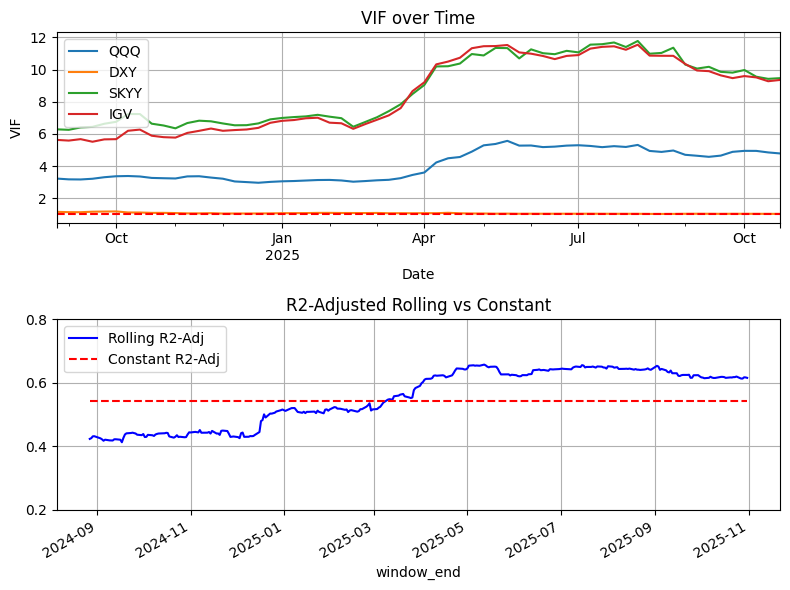

In [1784]:
ols_out = rolling_ols(y[stock], X_orth,
                      window=window, step=1,
                      add_intercept=True,
                      winsorize_quantiles=winsorize_quantiles,
                      robust="hac", oos_predict_next=False)

betas_ts = ols_out["betas"]     # time series of betas per factor
r2_ts    = ols_out["r2"]

# 2) Rolling VIFs every 10 rows
vif_rows = rolling_vif(X, window=window, sample_by="rows", sample_freq=10)

#    Rolling VIFs every 5 business days
vif_days = rolling_vif(X, window=window, sample_by="days", sample_freq="5B")

fig, ax = plt.subplots(2, 1, figsize=(8, 6))
vif_days.plot(label='VIF every 20 days', ax=ax[0])
ax[0].axhline(y=1, xmin=0, xmax=len(vif_days), color='red', ls='--')
ax[0].set_title('VIF over Time')
ax[0].set_xlabel('Date')
ax[0].set_ylabel('VIF')
ax[0].grid()
ax[1].set_ylim([0.2,0.8])
ax[1].set_title('R2-Adjusted Rolling vs Constant')
ols_out['r2_adj'].plot(ax=ax[1], color='blue', label='Rolling R2-Adj')
ax[1].hlines(y=diagnostics['r2_adj'], xmin=ols_out['r2_adj'].index[0], xmax=ols_out['r2_adj'].index[-1], color='red', linestyle='--', label='Constant R2-Adj')
plt.legend()
ax[1].grid()
plt.tight_layout()
print(ols_out['r2_adj'].describe()[1:].round(2))


In [1781]:
print('Avg Rolling vs OLS : ',r2_ts.mean() - diagnostics['r2_adj'])
print('Median Rolling vs OLS :', r2_ts.median() - diagnostics['r2_adj'])

Avg Rolling vs OLS :  0.02286442130527966
Median Rolling vs OLS : 0.06878350584146686


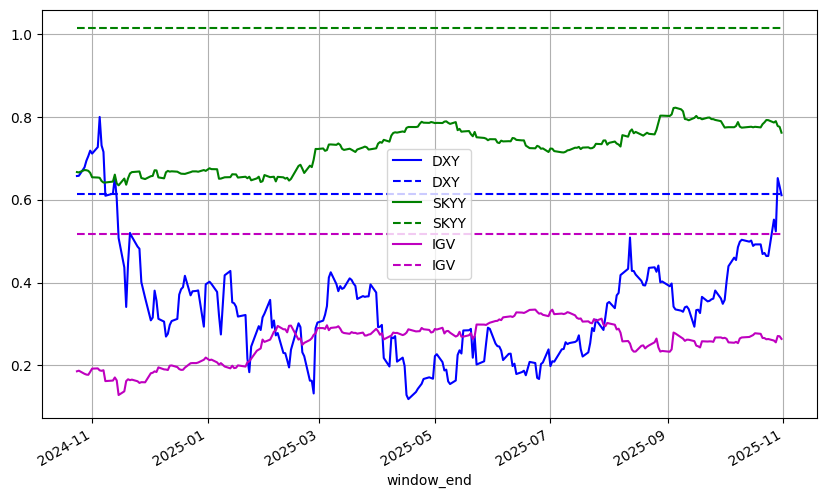

In [1782]:
plt.figure(figsize=(10, 6))

colors = ['r', 'b', 'g', 'm', 'c', 'y']
for c, i in enumerate(regressor):
    if coef_table.loc[i,'coef'] > 0.10:
        betas_ts[i].plot( color=colors[c])
        plt.hlines(coef_table.loc[i, 'coef'], xmin=betas_ts.index[0], xmax=betas_ts.index[-1], linestyles='dashed', label=i, color=colors[c])
    else:
        continue
plt.legend()
plt.grid()
plt.show();

##### Regime Stuff

In [1034]:
importlib.reload(rf)
from Modules.regression_functions import transform_r2_logit, fit_hac_ols, fit_fractional_logit_hac, lag_regimes

In [1210]:
residuals = pd.Series(res.resid, index=X.index)
residuals_orth = pd.Series(res_orth.resid, index=X_orth.index)

In [1239]:
state_var = ['MOVE', 'DXY']
state_var_df = reg_rets[state_var].copy()
state_var_df = state_var_df.apply(calc_log_rets)
state_var_df, residuals_ = clean_and_align_returns(state_var_df, residuals)

df = pd.concat([state_var_df, residuals_], axis=1).corr()
corr_ = df.corr()
print('OLS Normal : ')
print(corr_[corr_.abs() > 0.2].round(2)[0])
state_var_df = reg_rets[state_var]
state_var_df = state_var_df.apply(calc_log_rets)

state_var_df, residuals_orth_ = clean_and_align_returns(state_var_df, residuals_orth)
print('OLS Orthogonalized : ')
df = pd.concat([state_var_df, residuals_orth_], axis=1).corr()
corr_ = df.corr()
print(corr_[corr_.abs() > 0.2].round(2)[0])

OLS Normal : 
MOVE   -0.48
DXY    -0.52
0       1.00
Name: 0, dtype: float64
OLS Orthogonalized : 
MOVE   -0.48
DXY    -0.52
0       1.00
Name: 0, dtype: float64


In [1170]:
import numpy as np
import pandas as pd

def ljung_cov_stationary_test(x, lags=12, alpha=0.05, demean=True, use_statsmodels=True):
    """
    Quick Ljung-Box-based proxy test for covariance stationarity.

    Parameters
    ----------
    x : array-like
        Time series (e.g., returns). NaNs are dropped.
    lags : int
        Max lag m to test. The test uses all lags 1..m.
    alpha : float
        Significance level.
    demean : bool
        Demean the series before testing (recommended).
    use_statsmodels : bool
        If True, use statsmodels.acorr_ljungbox; else use a numpy/scipy fallback.

    Returns
    -------
    result : dict
        {
          'cov_stationary' : bool,   # True if we fail to reject at all lags
          'alpha'          : float,
          'n'              : int,
          'lags'           : int,
          'decision'       : str,    # 'fail_to_reject' or 'reject'
          'table'          : pd.DataFrame  # lag-wise lb_stat and p-values
        }

    Notes
    -----
    - H0 (Ljung-Box): no autocorrelation up to lag m.
    - We label as 'cov_stationary' when *all* p-values >= alpha across lags 1..m.
    - For a fuller stationarity assessment, combine with ADF/KPSS.
    """
    x = pd.Series(x).dropna().astype(float).values
    n = len(x)
    if n < 10:
        raise ValueError("Series too short for Ljung-Box test (need ~10+ observations).")

    m = int(min(lags, max(1, n // 4)))  # keep m sensible for small samples
    if demean:
        x = x - x.mean()

    try:
        if use_statsmodels:
            from statsmodels.stats.diagnostic import acorr_ljungbox
            lb = acorr_ljungbox(x, lags=list(range(1, m + 1)), return_df=True, boxpierce=False)
            lb = lb.rename(columns={'lb_stat': 'Q', 'lb_pvalue': 'pvalue'})
        else:
            raise ImportError
    except ImportError:
        # Numpy/Scipy fallback
        from scipy.stats import chi2

        def _acorr_at_k(y, k):
            y0 = y - y.mean()
            denom = np.dot(y0, y0) / len(y0)
            if k == 0:
                return 1.0
            num = np.dot(y0[k:], y0[:-k]) / len(y0)
            return num / denom if denom != 0 else 0.0

        acfs = np.array([_acorr_at_k(x, k) for k in range(1, m + 1)])
        Q_vals = n * (n + 2) * np.cumsum((acfs ** 2) / (n - np.arange(1, m + 1)))
        pvals = chi2.sf(Q_vals, df=np.arange(1, m + 1))
        lb = pd.DataFrame({'lag': np.arange(1, m + 1), 'Q': Q_vals, 'pvalue': pvals}).set_index('lag')

    reject_any = (lb['pvalue'] < alpha).any()
    result = {
        'cov_stationary': not reject_any,
        'alpha': alpha,
        'n': n,
        'lags': m,
        'decision': 'fail_to_reject' if not reject_any else 'reject',
        'table': lb.copy()
    }
    return result


In [1240]:
# assume r2_ts is a 1-col DataFrame of rolling R^2 and regimes has "T10Y3m"
W = window # make sure this equals your R^2 rolling window length

X_ = lag_regimes(state_var_df, lags=1, add_const=True)

# (A) OLS on logit(R^2) with HAC
r2_logit = transform_r2_logit(r2_ts)               # logit transform
r2_logit_aligned, X_aligned = clean_and_align_returns(r2_logit, X_)
res, table = fit_hac_ols(r2_logit_aligned, X_aligned, window=window)  # HAC variance on OLS. 

# (B) Fractional logit GLM on raw R^2 with HAC
r2_raw_aligned, X_aligned = clean_and_align_returns(r2_ts, X_)    # pass RAW R^2, not logit
res_logit, table_logit = fit_fractional_logit_hac(r2_raw_aligned, X_aligned, window=W)  # GLM+HAC. :contentReference[oaicite:4]{index=4}



/Users/phillip/.pyenv/versions/3.10.13/lib/python3.10/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning: The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.
  warnings.warn(


In [1245]:
res_logit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  291
Model:                            GLM   Df Residuals:                      288
Model Family:                Binomial   Df Model:                            2
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -129.08
Date:                Thu, 06 Nov 2025   Deviance:                       11.387
Time:                        16:54:33   Pearson chi2:                     11.4
No. Iterations:                     3   Pseudo R-squ. (CS):          0.0006896
Covariance Type:                  HAC                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5049      0.174      2.903      0.004       0.164       0.846
x1            -2.2250      1.082     -2.055      0.040      -4.347      -0.103
x2            12.9524      8.346      1.552      0.121      -3.405      29.309
==============================================================================
"""

In [1241]:
print('Raw R2')
print(table)
print('\nLogit R2')
print(table_logit)

Raw R2
            coef   std_err         t      pval
const   0.524497  0.177858  2.948969  0.003450
MOVE   -2.189579  1.107608 -1.976853  0.049012
DXY    13.214556  8.330260  1.586332  0.113761

Logit R2
            coef   std_err         z      pval
const   0.504926  0.173959  2.902558  0.003701
MOVE   -2.225000  1.082491 -2.055446  0.039836
DXY    12.952436  8.345533  1.552020  0.120657


#### Random

In [1251]:
import statsmodels.api as sm
def variance_driver_test(residuals: pd.Series, drivers: pd.DataFrame, hac_lags: int):
    z = pd.concat([residuals.rename('e'), drivers], axis=1).dropna()
    y = np.log(z['e']**2 + 1e-12)
    X = sm.add_constant(z.drop(columns=['e']).values)
    model = sm.OLS(y.values, X).fit(cov_type='HAC', cov_kwds={'maxlags': hac_lags, 'use_correction': True})
    return pd.DataFrame({'coef': model.params, 'se': model.bse, 't': model.tvalues, 'p': model.pvalues},
                        index=['const'] + list(z.drop(columns=['e']).columns))


In [1258]:
variance_driver_test(residuals_[0], state_var_df, hac_lags=window)

,coef,se,t,p
const,-10.124601,0.151544,-66.809851,0.000000
MOVE,9.455891,4.501939,2.100404,0.035693
DXY,-66.440258,28.711079,-2.314098,0.020662


In [856]:
ols_start = "2024-01-01"
ols_end   = "2025-03-03"
static_betas = pd.Series(coef_table['coef'])

out = r2_from_betas_or_fit_v2(
    y.loc[ols_start:ols_end], X.loc[ols_start:ols_end],
    betas=static_betas,
    add_intercept=True,
    ols_start=ols_start, ols_end=ols_end,
    winsorize_quantiles=winsorize_quantiles,
)
r2 = out["r2_eval"]
adjusted_r2 = 1-((1-r2)*(len(X)-1))/(len(X)-X.shape[1]-1)
print(adjusted_r2)

0.4258770524960973


In [857]:
ols_start = "2025-03-10"
ols_end   = "2025-11-05"
static_betas = pd.Series(coef_table['coef'])

out = r2_from_betas_or_fit_v2(
    y.loc[ols_start:ols_end], X.loc[ols_start:ols_end],
    betas=static_betas,
    add_intercept=True,
    ols_start=ols_start, ols_end=ols_end,
    winsorize_quantiles=winsorize_quantiles,
)
r2 = out["r2_eval"]
adjusted_r2 = 1-((1-r2)*(len(X)-1))/(len(X)-X.shape[1]-1)
print(adjusted_r2)

0.4594709116145502


In [1313]:
importlib.reload(Modules.pipeline_regression)
import Modules.pipeline_regression as pr
from Modules.pipeline_regression import run_grid_pipeline, fetch_results


In [1314]:

index_df = run_grid_pipeline(
    rets=rets,
    reg_rets=reg_rets,
    tickers=rets.columns.to_list(),
    regressor_sets=[["QQQ"], ["QQQ","SMH"], ['SPY'], ['SPY', 'SMH'], ['SPY', 'XSD'], ['QQQ', 'XSD']], 
    windows=[20, 60, 120, 200],
    intercept_opts=[True],
    winsorize_opts=[(0.025,0.975), (0.01, 0.99), (0.05, 0.95)],
    robust="hac",
    save_dir='results', 
    verbose=True,
)

[grid] save_dir=results
[grid] RUN -> NVDA | regs=['QQQ'] | window=20 | intercept=True | winsor=(0.025, 0.975)

=== RUN: ticker=NVDA regs=['QQQ'] window=20 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/NVDA.parquet
[input] X_raw shape=(787, 1) y_raw len=521 X_raw NA=286 y_raw NA=1
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=NVDA    0
dtype: int64
[align] y stats: mean=NVDA    0.002946
dtype: float64 std=NVDA    0.026494
dtype: float64
[align] X first rows:
                 QQQ
2023-11-07  0.009848
2023-11-08  0.001120
2023-11-09 -0.001353
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000781  0.000739   1.056688  2.911652e-01 -0.000671  0.002234
QQQ    2.007024  0.096976  20.696053  3.723210e-69  1.816492  2.197556
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'a

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5549
std        0.2001
min        0.0053
25%        0.3880
50%        0.5962
75%        0.7021
max        0.8862
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.001132  1.400801
2023-12-06 -0.000838  1.427910
2023-12-07 -0.001795  1.399430
2023-12-08 -0.002328  1.576412
2023-12-11 -0.003381  1.383507
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3656454657328474, Timestamp('2023-12-06 00:00:00'): 0.3555250047118914, Timestamp('2023-12-07 00:00:00'): 0.36673337049981836}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33040354716245, Timestamp('2023-12-06 00:00:00'): 0.3197208383069965, Timestamp('2023-12-07 00:00:00'): 0.33155189108314154}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5426
std        0.1997
min        0.0133
25%        0.3901
50%        0.5575
75%        0.6971
max        0.9119
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.001015  1.605162
2023-12-06 -0.000619  1.679686
2023-12-07 -0.001632  1.612773
2023-12-08 -0.002226  1.796226
2023-12-11 -0.003261  1.531352
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39583147664300955, Timestamp('2023-12-06 00:00:00'): 0.3891411944138288, Timestamp('2023-12-07 00:00:00'): 0.3940567150793636}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36226655867873225, Timestamp('2023-12-06 00:00:00'): 0.3552045941034859, Timestamp('2023-12-07 00:00:00'): 0.36039319925043933}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5718
std        0.1367
min        0.2065
25%        0.4780
50%        0.5683
75%        0.6988
max        0.8020
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.003497  1.646642
2024-02-05  0.004420  1.694565
2024-02-06  0.004086  1.717181
2024-02-07  0.003687  1.754727
2024-02-08  0.003854  1.775242
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44452399356809336, Timestamp('2024-02-05 00:00:00'): 0.40692715628870446, Timestamp('2024-02-06 00:00:00'): 0.41409704680110215}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4349468210434053, Timestamp('2024-02-05 00:00:00'): 0.39670176243161326, Timestamp('2024-02-06 00:00:00'): 0.40399527174594874}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5751
std        0.1356
min        0.2177
25%        0.4680
50%        0.5770
75%        0.6953
max        0.8091
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.003753  1.637953
2024-02-05  0.004592  1.648546
2024-02-06  0.004260  1.669276
2024-02-07  0.003877  1.703440
2024-02-08  0.004043  1.721995
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4542119539783559, Timestamp('2024-02-05 00:00:00'): 0.4139815689790046, Timestamp('2024-02-06 00:00:00'): 0.4204046046552541}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4448018152538449, Timestamp('2024-02-05 00:00:00'): 0.40387780292691855, Timestamp('2024-02-06 00:00:00'): 0.4104115805975861}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5709
std        0.1378
min        0.1992
25%        0.4731
50%        0.5737
75%        0.6944
max        0.7978
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.003600  1.580543
2024-02-05  0.004390  1.638386
2024-02-06  0.004049  1.664716
2024-02-07  0.003650  1.709274
2024-02-08  0.003811  1.732040
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40911466560515, Timestamp('2024-02-05 00:00:00'): 0.3867505548552438, Timestamp('2024-02-06 00:00:00'): 0.3951417354430403}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39892698742592847, Timestamp('2024-02-05 00:00:00'): 0.3761772885596446, Timestamp('2024-02-06 00:00:00'): 0.3847131446748169}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6014
std        0.0803
min        0.4479
25%        0.5438
50%        0.6125
75%        0.6650
max        0.7334
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.004762  1.894789
2024-05-01  0.004663  1.952554
2024-05-02  0.004685  1.954302
2024-05-03  0.004405  1.937179
2024-05-06  0.004588  1.960844
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5063212887108558, Timestamp('2024-05-01 00:00:00'): 0.5193400123910544, Timestamp('2024-05-02 00:00:00'): 0.5194040452669082}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5021375708185749, Timestamp('2024-05-01 00:00:00'): 0.5152666226655549, Timestamp('2024-05-02 00:00:00'): 0.515331198192899}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6024
std        0.0786
min        0.4528
25%        0.5380
50%        0.6183
75%        0.6550
max        0.7393
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.004626  1.951380
2024-05-01  0.004536  2.005078
2024-05-02  0.004557  2.006736
2024-05-03  0.004287  1.992838
2024-05-06  0.004471  2.015301
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5115199970748059, Timestamp('2024-05-01 00:00:00'): 0.5237875101973315, Timestamp('2024-05-02 00:00:00'): 0.5238584734177572}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.507380336033067, Timestamp('2024-05-01 00:00:00'): 0.5197518111312072, Timestamp('2024-05-02 00:00:00'): 0.5198233757348568}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5916
std        0.0800
min        0.4361
25%        0.5253
50%        0.5935
75%        0.6569
max        0.7254
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.004914  1.834325
2024-05-01  0.004843  1.889814
2024-05-02  0.004865  1.891779
2024-05-03  0.004635  1.892881
2024-05-06  0.004817  1.920205
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4985619771547486, Timestamp('2024-05-01 00:00:00'): 0.5134116368514309, Timestamp('2024-05-02 00:00:00'): 0.5134562193167473}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49431250238487356, Timestamp('2024-05-01 00:00:00'): 0.5092880066552565, Timestamp('2024-05-02 00:00:00'): 0.5093329669380757}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6008
std        0.0278
min        0.5244
25%        0.5830
50%        0.6014
75%        0.6207
max        0.6582
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003722  2.307625
2024-08-26  0.003838  2.312513
2024-08-27  0.003799  2.312623
2024-08-28  0.003665  2.319013
2024-08-29  0.003483  2.310444
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.593090314088896, Timestamp('2024-08-26 00:00:00'): 0.5949620335436203, Timestamp('2024-08-27 00:00:00'): 0.5953116600730075}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5910352146651026, Timestamp('2024-08-26 00:00:00'): 0.5929163872483861, Timestamp('2024-08-27 00:00:00'): 0.5932677795683258}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6063
std        0.0313
min        0.5230
25%        0.5886
50%        0.6115
75%        0.6219
max        0.6736
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.004377  2.247356
2024-08-26  0.004488  2.252427
2024-08-27  0.004448  2.252499
2024-08-28  0.004313  2.258675
2024-08-29  0.004129  2.250943
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5893969853927832, Timestamp('2024-08-26 00:00:00'): 0.5912964661895422, Timestamp('2024-08-27 00:00:00'): 0.5915618550770079}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5873232327937569, Timestamp('2024-08-26 00:00:00'): 0.5892323069278733, Timestamp('2024-08-27 00:00:00'): 0.5894990361632555}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5887
std        0.0311
min        0.5043
25%        0.5661
50%        0.5878
75%        0.6160
max        0.6535
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003900  2.216677
2024-08-26  0.004007  2.222393
2024-08-27  0.003968  2.222558
2024-08-28  0.003830  2.230922
2024-08-29  0.003646  2.220977
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5911012106706249, Timestamp('2024-08-26 00:00:00'): 0.5933913067999554, Timestamp('2024-08-27 00:00:00'): 0.5938155348380838}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5890360652699715, Timestamp('2024-08-26 00:00:00'): 0.5913377275413694, Timestamp('2024-08-27 00:00:00'): 0.5917640981453469}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6821
std        0.1788
min        0.1565
25%        0.5843
50%        0.7195
75%        0.8274
max        0.9193
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000131  1.658144  0.551532
2023-12-06  0.000006  1.632106  0.562164
2023-12-07 -0.000749  1.600487  0.542791
2023-12-08 -0.001208  1.695993  0.468771
2023-12-11 -0.002955  1.466919  0.188659
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5481871593411921, Timestamp('2023-12-06 00:00:00'): 0.5405117824783718, Timestamp('2023-12-07 00:00:00'): 0.5429538791616197}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49503270749897943, Timestamp('2023-12-06 00:00:00'): 0.4864543451228862, Timestamp('2023-12-07 00:00:00'): 0.48918374

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6875
std        0.1807
min        0.1587
25%        0.5939
50%        0.7235
75%        0.8365
max        0.9209
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000098  1.585607  0.577400
2023-12-06 -0.000070  1.551539  0.594649
2023-12-07 -0.000787  1.530352  0.576110
2023-12-08 -0.001106  1.612895  0.508855
2023-12-11 -0.002891  1.401095  0.222654
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5575348180431888, Timestamp('2023-12-06 00:00:00'): 0.5537286746357545, Timestamp('2023-12-07 00:00:00'): 0.5580768113793648}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5054800907541522, Timestamp('2023-12-06 00:00:00'): 0.5012261657693726, Timestamp('2023-12-07 00:00:00'): 0.506085848

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6584
std        0.1767
min        0.1326
25%        0.5553
50%        0.6979
75%        0.7987
max        0.9200
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000209  1.732902  0.489458
2023-12-06  0.000152  1.722319  0.484463
2023-12-07 -0.000667  1.669943  0.463992
2023-12-08 -0.001304  1.786460  0.387216
2023-12-11 -0.002995  1.529901  0.121281
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5174695670689313, Timestamp('2023-12-06 00:00:00'): 0.503011738447556, Timestamp('2023-12-07 00:00:00'): 0.5015841259592875}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4607012808417468, Timestamp('2023-12-06 00:00:00'): 0.444542531206092, Timestamp('2023-12-07 00:00:00'): 0.44294696430

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.6866
std        0.1234
min        0.4008
25%        0.5919
50%        0.7132
75%        0.7924
max        0.8588
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.003515  1.663689  0.238033
2024-02-05  0.004196  1.706823  0.316750
2024-02-06  0.003953  1.722175  0.321505
2024-02-07  0.003703  1.749363  0.288972
2024-02-08  0.003747  1.777080  0.292472
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4824470760418488, Timestamp('2024-02-05 00:00:00'): 0.47105791530622676, Timestamp('2024-02-06 00:00:00'): 0.47977990726675823}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46428732432401887, Timestamp('2024-02-05 00:00:00'): 0.4524985439134628, Timestamp('2024-02-06 00:00:00'): 0.461526

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.7024
std        0.1212
min        0.4153
25%        0.6259
50%        0.7274
75%        0.7969
max        0.8652
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.003790  1.652794  0.228866
2024-02-05  0.004393  1.660581  0.310815
2024-02-06  0.004148  1.674941  0.315643
2024-02-07  0.003907  1.699732  0.285611
2024-02-08  0.003963  1.723983  0.284594
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.48976847151557223, Timestamp('2024-02-05 00:00:00'): 0.4790233937635753, Timestamp('2024-02-06 00:00:00'): 0.48705036423904724}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.47186561086699574, Timestamp('2024-02-05 00:00:00'): 0.46074351284299897, Timestamp('2024-02-06 00:00:00'): 0.46905

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.6760
std        0.1270
min        0.3881
25%        0.5693
50%        0.7072
75%        0.7863
max        0.8565
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.003525  1.598905  0.258481
2024-02-05  0.004082  1.647046  0.319908
2024-02-06  0.003831  1.664749  0.326023
2024-02-07  0.003595  1.698553  0.286583
2024-02-08  0.003625  1.726323  0.293138
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45247559683015726, Timestamp('2024-02-05 00:00:00'): 0.4499943384689402, Timestamp('2024-02-06 00:00:00'): 0.4604778665161783}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43326421426279427, Timestamp('2024-02-05 00:00:00'): 0.43069589420469245, Timestamp('2024-02-06 00:00:00'): 0.441547

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.7155
std        0.0723
min        0.5260
25%        0.6669
50%        0.7350
75%        0.7684
max        0.8159
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.003806  1.789055  0.457863
2024-05-01  0.003708  1.814059  0.466117
2024-05-02  0.003747  1.816268  0.465093
2024-05-03  0.003663  1.822088  0.450081
2024-05-06  0.003860  1.846965  0.455739
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6325328421628089, Timestamp('2024-05-01 00:00:00'): 0.6452786638248298, Timestamp('2024-05-02 00:00:00'): 0.6445420875194865}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6262513522852502, Timestamp('2024-05-01 00:00:00'): 0.6392150512406389, Timestamp('2024-05-02 00:00:00'): 0.638465883

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 37,314. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
37309  vif_rolling   NVDA  rolling    QQQ,SMH   120.0      None        NaN   
37310  vif_rolling   NVDA  rolling    QQQ,SMH   120.0      None        NaN   
37311  vif_rolling   NVDA  rolling    QQQ,SMH   120.0      None        NaN   
37312  vif_rolling   NVDA  rolling    QQQ,SMH   120.0      None        NaN   
37313  vif_rolling   NVDA  rolling    QQQ,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
37309        NaN   None       NaN 2025-10-21    SMH    vif  4.320705   
37310        NaN   None       NaN 2025-10-28    QQQ    vif  4.490300   
37311        NaN   None       NaN 2025-10-28    SMH    vif  4.490300   
37312        NaN   None       NaN 2025-11-04    QQQ    vif  3.902642   
37313        NaN   None       NaN 2025-11-04    SMH    vif  3.902642   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6987
std        0.0733
min        0.5280
25%        0.6394
50%        0.7212
75%        0.7518
max        0.8051
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.004023  1.735632  0.422911
2024-05-01  0.003955  1.761378  0.425668
2024-05-02  0.003993  1.763843  0.424520
2024-05-03  0.003949  1.787389  0.405462
2024-05-06  0.004141  1.815882  0.411623
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6144698387779973, Timestamp('2024-05-01 00:00:00'): 0.6263826108556549, Timestamp('2024-05-02 00:00:00'): 0.6255588250905988}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6078795796118093, Timestamp('2024-05-01 00:00:00'): 0.6199959888189994, Timestamp('2024-05-02 00:00:00'): 0.619158121

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000617  0.000445  1.386266  1.662862e-01 -0.000257  0.001490
QQQ    0.310085  0.147859  2.097168  3.648238e-02  0.019581  0.600589
SMH    1.030653  0.106570  9.671156  2.171548e-20  0.821271  1.240035
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6952221486259405  R2_adj=0.6939981411907032  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.7273
std        0.0190
min        0.6831
25%        0.7151
50%        0.7260
75%        0.7438
max        0.7589
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.004011  2.051680  0.561033
2024-08-26  0.004092  2.049674  0.557927
2024-08-27  0.004078  2.049813  0.557313
2024-08-28  0.003972  2.062823  0.549458
2024-08-29  0.003865  2.055035  0.566839
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.72096258363389, Timestamp('2024-08-26 00:00:00'): 0.7205234594821772, Timestamp('2024-08-27 00:00:00'): 0.7205941972224377}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7181297164626604, Timestamp('2024-08-26 00:00:00'): 0.7176861341977323, Timestamp('2024-08-27 00:00:00'): 0.71775759008

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.7011
std        0.0223
min        0.6490
25%        0.6852
50%        0.6968
75%        0.7184
max        0.7430
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.003537  2.046236  0.497352
2024-08-26  0.003621  2.043958  0.493063
2024-08-27  0.003605  2.044203  0.492186
2024-08-28  0.003495  2.061043  0.481189
2024-08-29  0.003373  2.049986  0.504100
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6983364366567318, Timestamp('2024-08-26 00:00:00'): 0.6978472297445428, Timestamp('2024-08-27 00:00:00'): 0.6980030856338713}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.695273862409592, Timestamp('2024-08-26 00:00:00'): 0.6947796889297666, Timestamp('2024-08-27 00:00:00'): 0.6949371271

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4163
std        0.2132
min        0.0006
25%        0.2497
50%        0.4145
75%        0.5902
max        0.8383
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.002162  2.005226
2023-11-10  0.002772  1.941582
2023-11-13  0.004060  2.072741
2023-11-14  0.005261  1.721792
2023-11-15  0.005910  1.474956
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4211261177821999, Timestamp('2023-11-10 00:00:00'): 0.412345369856854, Timestamp('2023-11-13 00:00:00'): 0.4531863920315329}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.38896645765898874, Timestamp('2023-11-10 00:00:00'): 0.379697890404457, Timestamp('2023-11-13 00:00:00'): 0.42280785825550693}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4155
std        0.2120
min        0.0000
25%        0.2449
50%        0.4153
75%        0.5943
max        0.8322
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001975  1.966047
2023-11-10  0.002610  1.905765
2023-11-13  0.003882  2.028470
2023-11-14  0.005167  1.730874
2023-11-15  0.005612  1.517549
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4208204810554328, Timestamp('2023-11-10 00:00:00'): 0.41235415587783086, Timestamp('2023-11-13 00:00:00'): 0.45116126410489144}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3886438411140679, Timestamp('2023-11-10 00:00:00'): 0.37970716453771036, Timestamp('2023-11-13 00:00:00'): 0.4206702232218298}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4040
std        0.2147
min        0.0005
25%        0.2415
50%        0.3877
75%        0.5699
max        0.8714
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.002475  2.059850
2023-11-10  0.003047  1.990329
2023-11-13  0.004365  2.135841
2023-11-14  0.005417  1.705232
2023-11-15  0.006410  1.400743
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4183828075683803, Timestamp('2023-11-10 00:00:00'): 0.4090531494292291, Timestamp('2023-11-13 00:00:00'): 0.45314679527702084}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3860707413221792, Timestamp('2023-11-10 00:00:00'): 0.37622276884196404, Timestamp('2023-11-13 00:00:00'): 0.4227660616812997}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4351
std        0.1423
min        0.1423
25%        0.3149
50%        0.4176
75%        0.5610
max        0.7010
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001054  1.793265
2024-01-10  0.001504  1.765951
2024-01-11  0.001921  1.808944
2024-01-12  0.002644  1.725418
2024-01-16  0.003689  1.528786
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.30859654577993456, Timestamp('2024-01-10 00:00:00'): 0.29968372040507607, Timestamp('2024-01-11 00:00:00'): 0.3096281574379087}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.2966757965692438, Timestamp('2024-01-10 00:00:00'): 0.28760930179137056, Timestamp('2024-01-11 00:00:00'): 0.29772519463511415}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4389
std        0.1423
min        0.1520
25%        0.3117
50%        0.4392
75%        0.5478
max        0.7102
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000960  1.751920
2024-01-10  0.001416  1.726769
2024-01-11  0.001829  1.764171
2024-01-12  0.002566  1.697626
2024-01-16  0.003622  1.514685
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.31147540676707974, Timestamp('2024-01-10 00:00:00'): 0.30309626010629276, Timestamp('2024-01-11 00:00:00'): 0.3120463040836666}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.2996042930906502, Timestamp('2024-01-10 00:00:00'): 0.29108067838398755, Timestamp('2024-01-11 00:00:00'): 0.3001850334644196}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4307
std        0.1408
min        0.1486
25%        0.3295
50%        0.4096
75%        0.5661
max        0.7069
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001329  1.826595
2024-01-10  0.001776  1.791573
2024-01-11  0.002192  1.851515
2024-01-12  0.002721  1.784846
2024-01-16  0.003719  1.555114
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.27456808849698633, Timestamp('2024-01-10 00:00:00'): 0.2642218324680752, Timestamp('2024-01-11 00:00:00'): 0.27629397189404614}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.26206064174693444, Timestamp('2024-01-10 00:00:00'): 0.2515360019933869, Timestamp('2024-01-11 00:00:00'): 0.2638162817542884}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=NVDA regs=['SPY'] window=120 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/NVDA.parquet
[input] X_raw shape=(787, 1) y_raw len=521 X_raw NA=269 y_raw NA=1
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(518, 1) y_aligned len=518 NA: X=0 y=NVDA    0
dtype: int64
[align] y stats: mean=NVDA    0.002784
dtype: float64 std=NVDA    0.026495
dtype: float64
[align] X first rows:
                 SPY
2023-10-13 -0.004927
2023-10-16  0.007609
2023-10-17 -0.000589
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000531  0.000620   0.856776  3.919663e-01 -0.000687  0.001749
SPY    2.476958  0.150289  16.481312  2.437580e-49  2.181704  2.772211
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalu

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000714  0.000593   1.204274  2.290358e-01 -0.000451  0.001878
SPY    2.337916  0.160645  14.553286  1.888995e-40  2.022316  2.653515
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4533809470864004  R2_adj=0.45232160783656783  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval   

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4596
std        0.0757
min        0.3185
25%        0.3934
50%        0.4548
75%        0.5159
max        0.6195
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.003962  2.196991
2024-04-08  0.004021  2.166135
2024-04-09  0.003920  2.245820
2024-04-10  0.004512  2.143689
2024-04-11  0.004895  2.100772
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3668572978204261, Timestamp('2024-04-08 00:00:00'): 0.35872705928900606, Timestamp('2024-04-09 00:00:00'): 0.3705493366150674}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.36149168170026025, Timestamp('2024-04-08 00:00:00'): 0.3532925428423027, Timestamp('2024-04-09 00:00:00'): 0.36521500895926284}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4786
std        0.0386
min        0.3804
25%        0.4579
50%        0.4742
75%        0.5101
max        0.5480
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.002925  2.635018
2024-08-01  0.002946  2.635114
2024-08-02  0.002896  2.715888
2024-08-05  0.003034  2.742934
2024-08-06  0.003387  2.793118
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3804444704623603, Timestamp('2024-08-01 00:00:00'): 0.38305844478464124, Timestamp('2024-08-02 00:00:00'): 0.40061896206101666}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37731540213136217, Timestamp('2024-08-01 00:00:00'): 0.3799425783441597, Timestamp('2024-08-02 00:00:00'): 0.3975917851017289}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000714  0.000418   1.708681  8.811143e-02 -0.000107  0.001534
SPY    2.337916  0.164485  14.213547  6.284716e-39  2.014773  2.661058
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4533809470864004  R2_adj=0.45232160783656783  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval   

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4646
std        0.0406
min        0.3611
25%        0.4428
50%        0.4615
75%        0.4955
max        0.5471
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.003177  2.520087
2024-08-01  0.003263  2.504292
2024-08-02  0.003239  2.573099
2024-08-05  0.003291  2.611171
2024-08-06  0.003545  2.631812
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37682844786353975, Timestamp('2024-08-01 00:00:00'): 0.381350622461073, Timestamp('2024-08-02 00:00:00'): 0.39621220724336226}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37368111679214355, Timestamp('2024-08-01 00:00:00'): 0.37822613065532085, Timestamp('2024-08-02 00:00:00'): 0.3931627739466116}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.6747
std        0.1929
min        0.0805
25%        0.5741
50%        0.7245
75%        0.8288
max        0.9143
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.001302  1.662612  0.800928
2023-12-05  0.001006  1.649897  0.807702
2023-12-06  0.000797  1.670510  0.797653
2023-12-07 -0.000065  1.667199  0.761454
2023-12-08 -0.000646  1.909999  0.717790
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.553253420917339, Timestamp('2023-12-05 00:00:00'): 0.5833151131328926, Timestamp('2023-12-06 00:00:00'): 0.5745902788490748}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.5006949998487906, Timestamp('2023-12-05 00:00:00'): 0.5342933617367623, Timestamp('2023-12-06 00:00:00'): 0.5245420763

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 70,153. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
70148  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
70149  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
70150  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
70151  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
70152  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
70148        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
70149        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
70150        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
70151        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
70152        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 72,650. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
72645  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
72646  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
72647  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
72648  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   
72649  vif_rolling   NVDA  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
72645        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
72646        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
72647        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
72648        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
72649        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

      sample_start sample_end  
72645      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002759  0.000500   5.521063  5.427122e-08  0.001777  0.003741
SPY    2.445476  0.143162  17.081897  7.539775e-52  2.164201  2.726750
SMH    0.652733  0.046061  14.171149  1.490732e-38  0.562237  0.743230
[ortho] R2=0.6746931100390314  R2_adj=0.6733892748087269  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.6752
std        0.1270
min        0.3943
25%        0.5646
50%        0.7129
75%        0.7852
max        0.8545
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002853  0.000499   5.716986  1.868558e-08  0.001873  0.003834
SPY    2.316826  0.093518  24.774118  6.030895e-89  2.133089  2.500564
SMH    0.657753  0.048447  13.576746  5.901580e-36  0.562568  0.752938
[ortho] R2=0.6869196865167123  R2_adj=0.6856648556009477  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.6971
std        0.1251
min        0.4001
25%        0.6221
50%        0.7310
75%        0.7941
max        0.8678
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001019  0.000556   1.834394  6.719069e-02 -0.000072  0.002111
SPY    0.100465  0.161794   0.620942  5.349215e-01 -0.217417  0.418346
SMH    1.105666  0.085502  12.931418  3.415918e-33  0.937677  1.273655
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6740358813278229  R2_adj=0.6727294119143071  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.7043
std        0.0731
min        0.4849
25%        0.6574
50%        0.7274
75%        0.7511
max        0.8137
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.003751  2.152937  0.619641
2024-04-30  0.003652  2.139730  0.623860
2024-05-01  0.003553  2.166428  0.633881
2024-05-02  0.003590  2.168723  0.633580
2024-05-03  0.003523  2.197847  0.625449
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.6342245184425416, Timestamp('2024-04-30 00:00:00'): 0.6377582460102139, Timestamp('2024-05-01 00:00:00'): 0.6504904626956051}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.627971946108226, Timestamp('2024-04-30 00:00:00'): 0.6315660792753458, Timestamp('2024-05-01 00:00:00'): 0.6445159406

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002853  0.000458   6.230834  9.872870e-10  0.001954  0.003753
SPY    2.316826  0.088246  26.254313  4.501331e-96  2.143448  2.490205
SMH    0.657753  0.046879  14.030762  6.183121e-38  0.565648  0.749858
[ortho] R2=0.6869196865167123  R2_adj=0.6856648556009477  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.7152
std        0.0652
min        0.4886
25%        0.6724
50%        0.7291
75%        0.7632
max        0.8045
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002795  0.000496   5.634783  2.933701e-08  0.001820  0.003769
SPY    2.474692  0.158081  15.654564  3.171076e-45  2.164105  2.785278
SMH    0.612249  0.043041  14.224852  8.637498e-39  0.527685  0.696812
[ortho] R2=0.6504521052428438  R2_adj=0.6490511116766828  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.6903
std        0.0726
min        0.4874
25%        0.6367
50%        0.7109
75%        0.7359
max        0.8053
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.7089
std        0.0187
min        0.6595
25%        0.6978
50%        0.7091
75%        0.7196
max        0.7436
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.003270  2.435530  0.743514
2024-08-23  0.003211  2.439204  0.743461
2024-08-26  0.003288  2.443080  0.737957
2024-08-27  0.003274  2.443216  0.737448
2024-08-28  0.003152  2.466027  0.732342
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6914613214972193, Timestamp('2024-08-23 00:00:00'): 0.693246246236616, Timestamp('2024-08-26 00:00:00'): 0.6925084426472736}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6883289491266327, Timestamp('2024-08-23 00:00:00'): 0.6901319949293736, Timestamp('2024-08-26 00:00:00'): 0.6893867009

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 90,096. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90091  vif_rolling   NVDA  rolling    SPY,SMH   200.0      None        NaN   
90092  vif_rolling   NVDA  rolling    SPY,SMH   200.0      None        NaN   
90093  vif_rolling   NVDA  rolling    SPY,SMH   200.0      None        NaN   
90094  vif_rolling   NVDA  rolling    SPY,SMH   200.0      None        NaN   
90095  vif_rolling   NVDA  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90091        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
90092        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
90093        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
90094        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
90095        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.6913
std        0.0194
min        0.6400
25%        0.6798
50%        0.6900
75%        0.7041
max        0.7270
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.003577  2.296665  0.701742
2024-08-23  0.003520  2.300619  0.701709
2024-08-26  0.003588  2.304283  0.696452
2024-08-27  0.003573  2.304520  0.695917
2024-08-28  0.003444  2.330617  0.690312
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6854682440361427, Timestamp('2024-08-23 00:00:00'): 0.6875571096222864, Timestamp('2024-08-26 00:00:00'): 0.6870029396594692}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6822750282395553, Timestamp('2024-08-23 00:00:00'): 0.6843851005829188, Timestamp('2024-08-26 00:00:00'): 0.683825304

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4591
std        0.2171
min        0.0021
25%        0.2926
50%        0.4754
75%        0.6357
max        0.8608
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.000983  1.240477  0.110873
2023-12-06 -0.001103  1.168969  0.124967
2023-12-07 -0.002054  1.196729  0.174309
2023-12-08 -0.003248  1.813329  0.105440
2023-12-11 -0.004294  1.759156  0.025266
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.13759976105545335, Timestamp('2023-12-06 00:00:00'): 0.13281317948589988, Timestamp('2023-12-07 00:00:00'): 0.165751952599407}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.03614090941491843, Timestamp('2023-12-06 00:00:00'): 0.030791200601888113, Timestamp('2023-12-07 00:00:00'): 0.06760

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95979      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 98,476. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
98471  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
98472  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
98473  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
98474  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   
98475  vif_rolling   NVDA  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
98471        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
98472        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
98473        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
98474        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
98475        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
98471      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=NVDA regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/NVDA.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=1
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=NVDA    0
dtype: int64
[align] y stats: mean=NVDA    0.002946
dtype: float64 std=NVDA    0.026494
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000734  0.000727   1.008920  3.135031e-01 -0.000695  0.002163
SPY    1.976496  0.176374  11.206266  3.798383e-26  1.629966  2.323025
XSD    0.232499  0.063906   3.638127  3.032766e-04  0.106940  0.358059
[normal] diagnostics keys=['nobs', 'r2', 'r2_a

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 105,736. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
105731  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
105732  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
105733  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
105734  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   
105735  vif_rolling   NVDA  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
105731        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
105732        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
105733        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
105734        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
105735        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=NVDA    0
dtype: int64
[align] y stats: mean=NVDA    0.002946
dtype: float64 std=NVDA    0.026494
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000734  0.000650   1.128481  2.596602e-01 -0.000544  0.002011
SPY    1.976496  0.158889  12.439510  4.003851e-31  1.664321  2.288670
XSD    0.232499  0.061242   3.796377  1.649269e-04  0.112174  0.352825
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002892  0.000611   4.732266  2.897110e-06  0.001691  0.004092
SPY    2.337470  0.154928  15.087446  1.244027e-42  2.033077  2.641864
XSD    0.145009  0.035717   4.059905  5.700321e-05  0.074834  0.215185
[ortho] R2=0.46724547033707575  R2_adj=0.4651058939127266  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4946
std        0.0862
min        0.3077
25%        0.4190
50%        0.4833
75%        0.5586
max        0.6443
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 112,332 -> 112,172
[append] Saved -> results/NVDA.parquet
[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling   NVDA  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling   NVDA  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling   NVDA  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling   NVDA  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling   NVDA  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000734  0.000492   1.491268  1.365242e-01 -0.000233  0.001701
SPY    1.976496  0.150611  13.123172  5.346382e-34  1.680584  2.272407
XSD    0.232499  0.048206   4.822998  1.882217e-06  0.137786  0.327212
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4653199913249447  R2_adj=0.4631726820531573  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000969  0.000461  2.102525  3.600871e-02  0.000063  0.001874
SPY    1.785574  0.198849  8.979551  5.593454e-18  1.394888  2.176260
XSD    0.256460  0.056432  4.544564  6.917029e-06  0.145586  0.367335
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.46909667556207757  R2_adj=0.46696453369686497  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002941  0.000549   5.358068  1.288114e-07  0.001863  0.004020
SPY    2.534141  0.113749  22.278313  8.489030e-77  2.310653  2.757628
XSD    0.121064  0.027378   4.421916  1.202033e-05  0.067273  0.174855
[ortho] R2=0.44981932827956206  R2_adj=0.44760976734895785  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4847
std        0.0444
min        0.3699
25%        0.4567
50%        0.4855
75%        0.5212
max        0.5683
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5798
std        0.1882
min        0.0078
25%        0.4385
50%        0.6182
75%        0.7199
max        0.8975
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05 -0.000844  1.536504 -0.153017
2023-12-06 -0.000205  1.636445 -0.178813
2023-12-07 -0.001338  1.545438 -0.115621
2023-12-08 -0.001952  1.727946 -0.094833
2023-12-11 -0.002738  1.558438 -0.130675
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41271414512353954, Timestamp('2023-12-06 00:00:00'): 0.41224908239012237, Timestamp('2023-12-07 00:00:00'): 0.39862002927749274}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.34362169160866185, Timestamp('2023-12-06 00:00:00'): 0.3431019156124897, Timestamp('2023-12-07 00:00:00'): 0.32786

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   NVDA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   NVDA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NVDA.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Existing rows: 137,948  Incoming rows: 2,152
[append] Deduped rows: 140,100 -> 139,940
[append] Saved -> results/NVDA.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   NVDA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 141,658 -> 141,658
[append] Saved -> results/NVDA.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   NVDA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5742
std        0.1796
min        0.0960
25%        0.4269
50%        0.6077
75%        0.7273
max        0.8949
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.000216  1.650599
2023-12-06 -0.000771  1.587210
2023-12-07 -0.001327  1.625401
2023-12-08 -0.001624  1.732875
2023-12-11  0.000216  2.018646
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4746302571027632, Timestamp('2023-12-06 00:00:00'): 0.43758468109464366, Timestamp('2023-12-07 00:00:00'): 0.4773802905291249}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.44544304916402777, Timestamp('2023-12-06 00:00:00'): 0.40633938559990157, Timestamp('2023-12-07 00:00:00'): 0.44834586222518735}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5769
std        0.1696
min        0.1303
25%        0.4615
50%        0.6151
75%        0.7194
max        0.8995
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.000087  1.758908
2023-12-06 -0.000586  1.683985
2023-12-07 -0.001156  1.720212
2023-12-08 -0.001472  1.858704
2023-12-11 -0.001227  1.883364
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.46345804636883037, Timestamp('2023-12-06 00:00:00'): 0.4113613038272277, Timestamp('2023-12-07 00:00:00'): 0.4555298626373371}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.43365016005598755, Timestamp('2023-12-06 00:00:00'): 0.3786591540398514, Timestamp('2023-12-07 00:00:00'): 0.4252815216727447}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5793
std        0.1028
min        0.3356
25%        0.4985
50%        0.5968
75%        0.6583
max        0.7416
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001704  2.152254
2024-02-05  0.001883  2.146733
2024-02-06  0.001651  2.156539
2024-02-07  0.001354  2.170862
2024-02-08  0.001453  2.139251
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6350412124301856, Timestamp('2024-02-05 00:00:00'): 0.6254601294500355, Timestamp('2024-02-06 00:00:00'): 0.6328542430053988}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6287488195410509, Timestamp('2024-02-05 00:00:00'): 0.6190025454750361, Timestamp('2024-02-06 00:00:00'): 0.6265241437468713}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5610
std        0.1159
min        0.3177
25%        0.4618
50%        0.5895
75%        0.6505
max        0.7448
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.002217  2.087692
2024-02-05  0.002384  2.082928
2024-02-06  0.002149  2.092534
2024-02-07  0.001869  2.104543
2024-02-08  0.001956  2.075509
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5940632401886177, Timestamp('2024-02-05 00:00:00'): 0.5855203754751725, Timestamp('2024-02-06 00:00:00'): 0.5919680098747133}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5870643305366974, Timestamp('2024-02-05 00:00:00'): 0.5783741750523308, Timestamp('2024-02-06 00:00:00'): 0.5849329755622084}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5966
std        0.0993
min        0.3649
25%        0.5221
50%        0.6075
75%        0.6698
max        0.7694
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001195  2.173966
2024-02-05  0.001379  2.166359
2024-02-06  0.001147  2.176669
2024-02-07  0.000841  2.195009
2024-02-08  0.000950  2.157676
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6668282858894458, Timestamp('2024-02-05 00:00:00'): 0.6549583358724076, Timestamp('2024-02-06 00:00:00'): 0.6639708981172578}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.661083945990988, Timestamp('2024-02-05 00:00:00'): 0.6490093416633111, Timestamp('2024-02-06 00:00:00'): 0.658177292912383}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5804
std        0.0863
min        0.4336
25%        0.4933
50%        0.5887
75%        0.6706
max        0.6982
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002769  2.133365
2024-05-01  0.002559  2.181320
2024-05-02  0.002287  2.176934
2024-05-03  0.001970  2.125881
2024-05-06  0.001886  2.115653
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6329225104121647, Timestamp('2024-05-01 00:00:00'): 0.6399580350301672, Timestamp('2024-05-02 00:00:00'): 0.6340766106355245}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.629811684229217, Timestamp('2024-05-01 00:00:00'): 0.6369068319372025, Timestamp('2024-05-02 00:00:00'): 0.6309755649629442}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5650
std        0.0753
min        0.3755
25%        0.5100
50%        0.5584
75%        0.6362
max        0.6911
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002963  2.137048
2024-05-01  0.002816  2.167068
2024-05-02  0.002544  2.162912
2024-05-03  0.002252  2.117087
2024-05-06  0.002168  2.107350
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.61446730668274, Timestamp('2024-05-01 00:00:00'): 0.6195678646758725, Timestamp('2024-05-02 00:00:00'): 0.6140535573836376}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.611200080468187, Timestamp('2024-05-01 00:00:00'): 0.6163438635290579, Timestamp('2024-05-02 00:00:00'): 0.6107828248190923}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape=(

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5843
std        0.0864
min        0.4511
25%        0.4987
50%        0.5757
75%        0.6727
max        0.7011
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002134  1.973448
2024-05-01  0.002023  1.992835
2024-05-02  0.001753  1.988260
2024-05-03  0.001515  1.961542
2024-05-06  0.001432  1.949967
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6590929015619083, Timestamp('2024-05-01 00:00:00'): 0.6640291338227624, Timestamp('2024-05-02 00:00:00'): 0.6564604766543101}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6562038583548058, Timestamp('2024-05-01 00:00:00'): 0.6611819230924468, Timestamp('2024-05-02 00:00:00'): 0.6535491247615499}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5756
std        0.0773
min        0.4477
25%        0.5064
50%        0.5679
75%        0.6529
max        0.6851
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002110  2.186651
2024-08-26  0.002026  2.196968
2024-08-27  0.001947  2.197447
2024-08-28  0.001936  2.191023
2024-08-29  0.001819  2.180095
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.651052109527587, Timestamp('2024-08-26 00:00:00'): 0.6513931208564393, Timestamp('2024-08-27 00:00:00'): 0.6520002125769861}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.649289746444393, Timestamp('2024-08-26 00:00:00'): 0.649632480052684, Timestamp('2024-08-27 00:00:00'): 0.6502426378930315}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape=(

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5626
std        0.0611
min        0.4575
25%        0.5219
50%        0.5484
75%        0.6204
max        0.6712
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002589  2.125111
2024-08-26  0.002500  2.134471
2024-08-27  0.002422  2.134808
2024-08-28  0.002407  2.129878
2024-08-29  0.002288  2.120130
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6201703198873776, Timestamp('2024-08-26 00:00:00'): 0.6205030373729626, Timestamp('2024-08-27 00:00:00'): 0.6209207485218542}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6182519881696371, Timestamp('2024-08-26 00:00:00'): 0.6185863860465635, Timestamp('2024-08-27 00:00:00'): 0.6190062068477222}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5787
std        0.0731
min        0.4586
25%        0.5131
50%        0.5635
75%        0.6599
max        0.6868
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001801  2.178075
2024-08-26  0.001715  2.189520
2024-08-27  0.001636  2.190107
2024-08-28  0.001625  2.182614
2024-08-29  0.001509  2.170062
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6621501189024064, Timestamp('2024-08-26 00:00:00'): 0.6624363730709162, Timestamp('2024-08-27 00:00:00'): 0.6632372503366954}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6604438063716105, Timestamp('2024-08-26 00:00:00'): 0.6607315062682441, Timestamp('2024-08-27 00:00:00'): 0.661536428368699}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6852
std        0.1739
min        0.1299
25%        0.5975
50%        0.7285
75%        0.8132
max        0.9457
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000814  1.849858  0.448322
2023-12-06 -0.000041  1.733138  0.486918
2023-12-07 -0.000456  1.774716  0.448680
2023-12-08 -0.000587  1.823990  0.427514
2023-12-11  0.001181  2.056937  0.708565
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5842723492432478, Timestamp('2023-12-06 00:00:00'): 0.5659062777381169, Timestamp('2023-12-07 00:00:00'): 0.5880130719160324}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5353632138601004, Timestamp('2023-12-06 00:00:00'): 0.5148364280602482, Timestamp('2023-12-07 00:00:00'): 0.539544021

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6839
std        0.1838
min        0.1106
25%        0.5828
50%        0.7432
75%        0.8245
max        0.9434
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000780  1.800330  0.467816
2023-12-06 -0.000114  1.692793  0.507852
2023-12-07 -0.000501  1.732793  0.472569
2023-12-08 -0.000514  1.766031  0.462454
2023-12-11  0.002183  2.089228  0.893529
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5923940059701857, Timestamp('2023-12-06 00:00:00'): 0.5815942011961363, Timestamp('2023-12-07 00:00:00'): 0.601610497728386}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5444403596137368, Timestamp('2023-12-06 00:00:00'): 0.5323699895721523, Timestamp('2023-12-07 00:00:00'): 0.5547411445

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6681
std        0.1605
min        0.1514
25%        0.5848
50%        0.7025
75%        0.7820
max        0.9489
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000890  1.860802  0.390423
2023-12-06  0.000093  1.721487  0.426158
2023-12-07 -0.000363  1.767223  0.381548
2023-12-08 -0.000621  1.849689  0.357460
2023-12-11 -0.000365  1.878650  0.393968
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5389255492591283, Timestamp('2023-12-06 00:00:00'): 0.5040285763594656, Timestamp('2023-12-07 00:00:00'): 0.5294116756476485}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4846814962307904, Timestamp('2023-12-06 00:00:00'): 0.44567899710763803, Timestamp('2023-12-07 00:00:00'): 0.47404834

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.6620
std        0.1063
min        0.3935
25%        0.5758
50%        0.6902
75%        0.7387
max        0.8263
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001737  2.181567  0.409315
2024-02-05  0.001595  2.162539  0.408402
2024-02-06  0.001483  2.162803  0.403311
2024-02-07  0.001375  2.163553  0.393759
2024-02-08  0.001309  2.141726  0.393724
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.728810654372974, Timestamp('2024-02-05 00:00:00'): 0.7275666632900095, Timestamp('2024-02-06 00:00:00'): 0.733010005329315}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.719295238736938, Timestamp('2024-02-05 00:00:00'): 0.7180075988440449, Timestamp('2024-02-06 00:00:00'): 0.723641935340

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.6544
std        0.1251
min        0.3708
25%        0.5526
50%        0.6889
75%        0.7560
max        0.8272
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.002285  2.115147  0.423394
2024-02-05  0.002116  2.099173  0.419547
2024-02-06  0.002002  2.099992  0.415486
2024-02-07  0.001912  2.099238  0.408581
2024-02-08  0.001841  2.078362  0.408200
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6920325450796343, Timestamp('2024-02-05 00:00:00'): 0.6905141455732476, Timestamp('2024-02-06 00:00:00'): 0.6954426631883635}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6812266694683934, Timestamp('2024-02-05 00:00:00'): 0.679654992786344, Timestamp('2024-02-06 00:00:00'): 0.6847564408

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.6711
std        0.0891
min        0.4607
25%        0.6062
50%        0.6814
75%        0.7427
max        0.8420
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001079  2.202219  0.397728
2024-02-05  0.000985  2.177429  0.408919
2024-02-06  0.000878  2.176710  0.401881
2024-02-07  0.000766  2.180477  0.388451
2024-02-08  0.000705  2.150130  0.386909
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.7552763697489435, Timestamp('2024-02-05 00:00:00'): 0.7550500549818489, Timestamp('2024-02-06 00:00:00'): 0.7615467382553296}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.7466895757050468, Timestamp('2024-02-05 00:00:00'): 0.7464553200689312, Timestamp('2024-02-06 00:00:00'): 0.753179957

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6638
std        0.0773
min        0.4677
25%        0.6047
50%        0.6412
75%        0.7359
max        0.7933
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001857  2.032461  0.436943
2024-05-01  0.001638  2.047672  0.449805
2024-05-02  0.001379  2.043272  0.450363
2024-05-03  0.001229  2.010823  0.449949
2024-05-06  0.001171  2.003954  0.447013
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.7462655669997449, Timestamp('2024-05-01 00:00:00'): 0.7557517804484919, Timestamp('2024-05-02 00:00:00'): 0.7495186679636427}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.7419282262646978, Timestamp('2024-05-01 00:00:00'): 0.7515765972082952, Timestamp('2024-05-02 00:00:00'): 0.745236935

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6540
std        0.0759
min        0.4179
25%        0.6084
50%        0.6632
75%        0.7163
max        0.7943
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.002047  2.026249  0.444019
2024-05-01  0.001895  2.025411  0.454291
2024-05-02  0.001637  2.021236  0.454814
2024-05-03  0.001516  1.992215  0.453311
2024-05-06  0.001458  1.985696  0.450741
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.7335403713941668, Timestamp('2024-05-01 00:00:00'): 0.741323673232881, Timestamp('2024-05-02 00:00:00'): 0.7354330049566307}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.7289855059479133, Timestamp('2024-05-01 00:00:00'): 0.7369018556813063, Timestamp('2024-05-02 00:00:00'): 0.7309104922

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6612
std        0.0733
min        0.4847
25%        0.6036
50%        0.6311
75%        0.7312
max        0.7789
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001395  1.891567  0.350868
2024-05-01  0.001277  1.884927  0.357636
2024-05-02  0.001018  1.880307  0.358211
2024-05-03  0.000919  1.869764  0.352753
2024-05-06  0.000859  1.861568  0.348793
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.7502168927587691, Timestamp('2024-05-01 00:00:00'): 0.7567811715599656, Timestamp('2024-05-02 00:00:00'): 0.7488443513463514}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.7459470960537908, Timestamp('2024-05-01 00:00:00'): 0.7526235847490248, Timestamp('2024-05-02 00:00:00'): 0.744551092

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6590
std        0.0641
min        0.5395
25%        0.6045
50%        0.6613
75%        0.7278
max        0.7496
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001901  2.033137  0.402673
2024-08-26  0.001791  2.034884  0.407469
2024-08-27  0.001731  2.035323  0.407178
2024-08-28  0.001736  2.032519  0.406868
2024-08-29  0.001682  2.027109  0.405308
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7349109446710862, Timestamp('2024-08-26 00:00:00'): 0.7359532228369634, Timestamp('2024-08-27 00:00:00'): 0.7365047278209913}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7322196852261226, Timestamp('2024-08-26 00:00:00'): 0.7332725448962218, Timestamp('2024-08-27 00:00:00'): 0.733829648

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6495
std        0.0546
min        0.5460
25%        0.6101
50%        0.6318
75%        0.7144
max        0.7430
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002304  1.972645  0.437142
2024-08-26  0.002186  1.973861  0.441961
2024-08-27  0.002128  1.974140  0.441781
2024-08-28  0.002132  1.972451  0.441658
2024-08-29  0.002083  1.968045  0.440042
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7141632515239791, Timestamp('2024-08-26 00:00:00'): 0.7152632617481138, Timestamp('2024-08-27 00:00:00'): 0.715666604359506}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7112613556003646, Timestamp('2024-08-26 00:00:00'): 0.712372533440988, Timestamp('2024-08-27 00:00:00'): 0.71277997090

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6567
std        0.0589
min        0.5513
25%        0.6060
50%        0.6524
75%        0.7185
max        0.7452
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001524  2.048256  0.378815
2024-08-26  0.001414  2.050320  0.384646
2024-08-27  0.001353  2.050855  0.384279
2024-08-28  0.001358  2.047185  0.383608
2024-08-29  0.001302  2.040608  0.381644
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7343301450182722, Timestamp('2024-08-26 00:00:00'): 0.735549858206686, Timestamp('2024-08-27 00:00:00'): 0.7362911667714601}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7316329891301327, Timestamp('2024-08-26 00:00:00'): 0.7328650851935559, Timestamp('2024-08-27 00:00:00'): 0.7336139197

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4324
std        0.1702
min        0.0138
25%        0.3125
50%        0.4435
75%        0.5687
max        0.8637
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001888  1.292501
2023-11-10  0.003418  1.400508
2023-11-13  0.003065  1.384447
2023-11-14  0.004082  1.304570
2023-11-15  0.003097  1.379712
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4731410072422326, Timestamp('2023-11-10 00:00:00'): 0.4674827904945349, Timestamp('2023-11-13 00:00:00'): 0.44718542740601797}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4438710632001345, Timestamp('2023-11-10 00:00:00'): 0.43789850107756456, Timestamp('2023-11-13 00:00:00'): 0.4164735067063523}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4277
std        0.1765
min        0.0071
25%        0.2822
50%        0.4417
75%        0.5704
max        0.8651
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001801  1.309335
2023-11-10  0.003303  1.398043
2023-11-13  0.002952  1.382759
2023-11-14  0.004048  1.319576
2023-11-15  0.003054  1.394752
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4849623242566693, Timestamp('2023-11-10 00:00:00'): 0.4669394128852101, Timestamp('2023-11-13 00:00:00'): 0.44774952999095297}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4563491200487064, Timestamp('2023-11-10 00:00:00'): 0.43732493582327736, Timestamp('2023-11-13 00:00:00'): 0.4170689483237837}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 50,532 -> 50,428
[append] Saved -> results/AVGO.parquet
[verify] file rows now: 50,428. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
50423  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
50424  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
50425  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
50426  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
50427  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
50423        NaN   None       NaN 2025-10-02    SPY    vif    1.0   
50424        NaN   None       NaN 2025-10-09    SPY    vif    1.0   
50425        NaN   None       NaN 2025-10-16    SPY    vif    1.0   
50426        NaN   None       NaN 2025-10-23    SPY    vif    1.0   
50427        NaN   None       NaN 2025-10-30    SPY 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 52,490. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
52485  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
52486  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
52487  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
52488  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   
52489  vif_rolling   AVGO  rolling        SPY    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
52485        NaN   None       NaN 2025-10-02    SPY    vif    1.0   
52486        NaN   None       NaN 2025-10-09    SPY    vif    1.0   
52487        NaN   None       NaN 2025-10-16    SPY    vif    1.0   
52488        NaN   None       NaN 2025-10-23    SPY    vif    1.0   
52489        NaN   None       NaN 2025-10-30    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002611  0.000481   5.431215  8.635201e-08  0.001666  0.003555
SPY    2.228460  0.168830  13.199418  1.761899e-34  1.896781  2.560139
[ortho] R2=0.4029477383738146  R2_adj=0.4017906603474073  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4179
std        0.1121
min        0.1661
25%        0.3210
50%        0.4353
75%        0.5135
max        0.6027
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001648  1.720335
2024-01-10  0.001515  1.703634
2024-01-11  0.001849  1.698126
2024-01-12  0.00

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4471
std        0.0880
min        0.2311
25%        0.3925
50%        0.4457
75%        0.4899
max        0.6490
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000935  1.913032
2024-01-10  0.000769  1.895899
2024-01-11  0.001130  1.890382
2024-01-12  0.001652  1.869306
2024-01-16  0.001462  1.953984
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.43471022764771206, Timestamp('2024-01-10 00:00:00'): 0.4224561533912935, Timestamp('2024-01-11 00:00:00'): 0.40733909553059944}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.4249638522623278, Timestamp('2024-01-10 00:00:00'): 0.4124985008635572, Timestamp('2024-01-11 00:00:00'): 0.39712080407423056}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4514
std        0.0674
min        0.2720
25%        0.4028
50%        0.4424
75%        0.5199
max        0.5678
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001911  2.318434
2024-04-08  0.001804  2.318956
2024-04-09  0.001901  2.328875
2024-04-10  0.002186  2.295417
2024-04-11  0.002158  2.372377
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.435441105969113, Timestamp('2024-04-08 00:00:00'): 0.43192463781338764, Timestamp('2024-04-09 00:00:00'): 0.4329029784862982}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.4306567085620716, Timestamp('2024-04-08 00:00:00'): 0.4271104398287553, Timestamp('2024-04-09 00:00:00'): 0.42809707152431775}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4371
std        0.0639
min        0.2389
25%        0.4035
50%        0.4493
75%        0.4802
max        0.5548
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001864  2.251886
2024-04-08  0.001761  2.252064
2024-04-09  0.001853  2.259864
2024-04-10  0.002134  2.231331
2024-04-11  0.002114  2.296862
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.4201877320298443, Timestamp('2024-04-08 00:00:00'): 0.4170826354966516, Timestamp('2024-04-09 00:00:00'): 0.4178299000803787}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.4152740687419616, Timestamp('2024-04-08 00:00:00'): 0.41214265783136894, Timestamp('2024-04-09 00:00:00'): 0.41289625516580564}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4565
std        0.0581
min        0.2862
25%        0.4139
50%        0.4500
75%        0.5093
max        0.5650
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001352  2.155113
2024-04-08  0.001255  2.154866
2024-04-09  0.001341  2.163282
2024-04-10  0.001614  2.128000
2024-04-11  0.001675  2.231862
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.4620191149933809, Timestamp('2024-04-08 00:00:00'): 0.45775279584458606, Timestamp('2024-04-09 00:00:00'): 0.4580733026618805}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.45745995495095193, Timestamp('2024-04-08 00:00:00'): 0.4531574805551334, Timestamp('2024-04-09 00:00:00'): 0.4534807035318965}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4570
std        0.0498
min        0.3673
25%        0.4119
50%        0.4575
75%        0.4985
max        0.5337
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001657  2.602398
2024-08-01  0.001535  2.635864
2024-08-02  0.001490  2.674981
2024-08-05  0.001770  2.609719
2024-08-06  0.001681  2.657852
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.44573975753815365, Timestamp('2024-08-01 00:00:00'): 0.4529880552239903, Timestamp('2024-08-02 00:00:00'): 0.4644382285648655}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.4429404633843059, Timestamp('2024-08-01 00:00:00'): 0.4502253686342126, Timestamp('2024-08-02 00:00:00'): 0.461733371133375}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4373
std        0.0463
min        0.3542
25%        0.4058
50%        0.4244
75%        0.4720
max        0.5257
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001998  2.544212
2024-08-01  0.001738  2.615305
2024-08-02  0.001778  2.629150
2024-08-05  0.002131  2.519421
2024-08-06  0.002052  2.559883
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.42294444290634536, Timestamp('2024-08-01 00:00:00'): 0.43290289847132113, Timestamp('2024-08-02 00:00:00'): 0.44612350999218287}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.42003002090082187, Timestamp('2024-08-01 00:00:00'): 0.43003877169592386, Timestamp('2024-08-02 00:00:00'): 0.44332615398204245}
[rolling_to_records] rows built: 1,276
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4572
std        0.0417
min        0.3788
25%        0.4203
50%        0.4654
75%        0.4950
max        0.5234
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001531  2.508673
2024-08-01  0.001362  2.551126
2024-08-02  0.001345  2.582411
2024-08-05  0.001480  2.568278
2024-08-06  0.001392  2.624222
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.45268944944927914, Timestamp('2024-08-01 00:00:00'): 0.46140485999349057, Timestamp('2024-08-02 00:00:00'): 0.4702022326051276}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.44992525474952805, Timestamp('2024-08-01 00:00:00'): 0.4586846825187103, Timestamp('2024-08-02 00:00:00'): 0.4675264863051536}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.6642
std        0.1821
min        0.1172
25%        0.5640
50%        0.6923
75%        0.8080
max        0.9361
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.000701  2.588617  0.585396
2023-12-05  0.000203  2.651119  0.569872
2023-12-06 -0.000894  2.625812  0.514724
2023-12-07 -0.001412  2.700842  0.497723
2023-12-08 -0.002564  3.043665  0.419692
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6131938504729957, Timestamp('2023-12-05 00:00:00'): 0.6004102411858758, Timestamp('2023-12-06 00:00:00'): 0.5947076210949309}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.5676872446462893, Timestamp('2023-12-05 00:00:00'): 0.5533996813253906, Timestamp('2023-12-06 00:00:00'): 0.547026164

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.002668  0.000671   3.974774   8.084866e-05  0.001349  0.003987
SPY    2.246843  0.083002  27.069742  5.671883e-100  2.083767  2.409920
SMH    0.646354  0.040767  15.854681   3.829793e-46  0.566257  0.726450
[ortho] R2=0.6186776702705123  R2_adj=0.6171493242595725  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.6678
std        0.1904
min        0.1018
25%        0.5541
50%        0.7151
75%        0.8199
max        0.9391
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.6348
std        0.1680
min        0.1470
25%        0.5412
50%        0.6503
75%        0.7704
max        0.9305
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.000617  2.862376  0.519057
2023-12-05  0.000139  2.943463  0.501858
2023-12-06 -0.000873  2.887510  0.445614
2023-12-07 -0.001446  2.988167  0.424292
2023-12-08 -0.003426  3.740126  0.322013
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.5405466840878028, Timestamp('2023-12-05 00:00:00'): 0.5317729492368972, Timestamp('2023-12-06 00:00:00'): 0.5180142051745136}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.48649335280401496, Timestamp('2023-12-05 00:00:00'): 0.47668741385300273, Timestamp('2023-12-06 00:00:00'): 0.4613099

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.002449  0.000516   4.749385   2.670717e-06  0.001436  0.003462
SPY    2.316140  0.073654  31.446162  1.831130e-120  2.171430  2.460851
SMH    0.608855  0.035785  17.014415   1.563742e-51  0.538548  0.679162
[ortho] R2=0.6318376495008071  R2_adj=0.6303620488976039  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.6393
std        0.1216
min        0.3883
25%        0.5332
50%        0.6742
75%        0.7374
max        0.8170
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.002668  0.000537   4.970759   9.183465e-07  0.001613  0.003723
SPY    2.246843  0.061541  36.509706  5.012152e-143  2.125932  2.367755
SMH    0.646354  0.038938  16.599662   1.361319e-49  0.569851  0.722856
[ortho] R2=0.6186776702705123  R2_adj=0.6171493242595725  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.6390
std        0.1354
min        0.3490
25%        0.5066
50%        0.6751
75%        0.7499
max        0.8175


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.6440
std        0.1062
min        0.3692
25%        0.5744
50%        0.6501
75%        0.7396
max        0.8182
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.001355  2.733945  0.645741
2024-02-02  0.001365  2.706854  0.644046
2024-02-05  0.000908  2.725097  0.605973
2024-02-06  0.000785  2.731311  0.600030
2024-02-07  0.000651  2.737078  0.590178
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.7163737467463238, Timestamp('2024-02-02 00:00:00'): 0.7276038574296039, Timestamp('2024-02-05 00:00:00'): 0.7358242529353797}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.7064219483865457, Timestamp('2024-02-02 00:00:00'): 0.7180460980411689, Timestamp('2024-02-05 00:00:00'): 0.726554928

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.6528
std        0.0798
min        0.4354
25%        0.6006
50%        0.6390
75%        0.7259
max        0.7949
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.001642  2.390689  0.652820
2024-04-30  0.001576  2.424360  0.645407
2024-05-01  0.001357  2.447647  0.654036
2024-05-02  0.001103  2.446741  0.652515
2024-05-03  0.001020  2.422290  0.651096
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.7436197174669087, Timestamp('2024-04-30 00:00:00'): 0.7433058739791578, Timestamp('2024-05-01 00:00:00'): 0.7543035164770682}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.7392371485347191, Timestamp('2024-04-30 00:00:00'): 0.7389179402010237, Timestamp('2024-05-01 00:00:00'): 0.750103576

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.002668  0.000504   5.290529   1.829159e-07  0.001677  0.003659
SPY    2.246843  0.051083  43.983741  8.138599e-174  2.146478  2.347208
SMH    0.646354  0.031661  20.414736   8.589701e-68  0.584148  0.708559
[ortho] R2=0.6186776702705123  R2_adj=0.6171493242595725  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.6434
std        0.0821
min        0.4001
25%        0.5919
50%        0.6558
75%        0.7111
max        0.7934


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=AVGO    0
dtype: int64
[align] y stats: mean=AVGO    0.002806
dtype: float64 std=AVGO    0.027659
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000258  0.000488   0.529242  5.968732e-01 -0.000701  0.001217
SPY    0.235522  0.175850   1.339336  1.810709e-01 -0.109975  0.581020
SMH    1.035080  0.058931  17.564355  4.012042e-54  0.919297  1.150863
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000473  0.000445   1.062807  2.883836e-01 -0.000402  0.001349
SPY    0.156647  0.135853   1.153068  2.494346e-01 -0.110266  0.423561
SMH    1.052924  0.041102  25.617289  5.172160e-93  0.972170  1.133679
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6381964204900326  R2_adj=0.6367463059428984  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.6386
std        0.0559
min        0.5340
25%        0.6030
50%        0.6172
75%        0.7022
max        0.7360
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.002216  2.336269  0.659452
2024-08-23  0.002211  2.332517  0.660076
2024-08-26  0.002090  2.326399  0.666198
2024-08-27  0.002035  2.328197  0.665584
2024-08-28  0.002039  2.327466  0.665348
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.7150342562258722, Timestamp('2024-08-23 00:00:00'): 0.7148077176755867, Timestamp('2024-08-26 00:00:00'): 0.7161851845057174}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.7121412029895866, Timestamp('2024-08-23 00:00:00'): 0.7119123645555419, Timestamp('2024-08-26 00:00:00'): 0.713303815

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.6453
std        0.0507
min        0.5574
25%        0.6054
50%        0.6370
75%        0.6892
max        0.7385
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.001364  2.432983  0.590240
2024-08-23  0.001358  2.428169  0.590985
2024-08-26  0.001227  2.420663  0.598625
2024-08-27  0.001169  2.423102  0.597836
2024-08-28  0.001165  2.423876  0.596184
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.7247313288503865, Timestamp('2024-08-23 00:00:00'): 0.7243851632095073, Timestamp('2024-08-26 00:00:00'): 0.7257979003663365}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.7219367230519133, Timestamp('2024-08-23 00:00:00'): 0.7215870430390454, Timestamp('2024-08-26 00:00:00'): 0.723014122

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5180
std        0.1769
min        0.0686
25%        0.3960
50%        0.5399
75%        0.6654
max        0.8841
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.001018  2.167979  0.252353
2023-12-06 -0.002128  2.146312  0.239839
2023-12-07 -0.002862  2.222666  0.300168
2023-12-08 -0.004045  2.747476  0.226880
2023-12-11 -0.002843  2.342410  0.463007
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4448815576006355, Timestamp('2023-12-06 00:00:00'): 0.46439085352975096, Timestamp('2023-12-07 00:00:00'): 0.5394499168015778}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37957350555365144, Timestamp('2023-12-06 00:00:00'): 0.4013780127685451, Timestamp('2023-12-07 00:00:00'): 0.4852675

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95979      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=AVGO    0
dtype: int64
[align] y stats: mean=AVGO    0.002819
dtype: float64 std=AVGO    0.027685
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000385  0.000588  0.653864  5.135009e-01 -0.000771  0.001541
SPY    1.349946  0.185379  7.282080  1.292288e-12  0.985725  1.714168
XSD    0.496189  0.053070  9.349758  2.966768e-19  0.391921  0.600458
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling   AVGO  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 105,736. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
105731  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
105732  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
105733  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
105734  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
105735  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
105731        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
105732        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
105733        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
105734        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
105735        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 108,212 -> 108,028
[append] Saved -> results/AVGO.parquet
[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling   AVGO  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling   AVGO  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 115,882. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
115877  vif_rolling   AVGO  rolling    SPY,XSD   200.0      None        NaN   
115878  vif_rolling   AVGO  rolling    SPY,XSD   200.0      None        NaN   
115879  vif_rolling   AVGO  rolling    SPY,XSD   200.0      None        NaN   
115880  vif_rolling   AVGO  rolling    SPY,XSD   200.0      None        NaN   
115881  vif_rolling   AVGO  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
115877        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
115878        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
115879        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
115880        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
115881        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000385  0.000363   1.060757  2.893145e-01 -0.000328  0.001098
SPY    1.349946  0.167885   8.040915  6.546689e-15  1.020097  1.679796
XSD    0.496189  0.026143  18.979544  7.657516e-61  0.444824  0.547554
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4949768467988007  R2_adj=0.49294864136425776  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.829
XSD  0.829  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002612  0.000538   4.853548  1.625305e-06  0.001555  0.003669
QQQ    1.911672  0.095817  19.951251  1.611787e-65  1.723417  2.099928
XSD    0.124807  0.037059   3.367816  8.163365e-04  0.051996  0.197618
[ortho] R2=0.5616834877036105  R2_adj=0.5599231804253118  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6126
std        0.1654
min        0.1187
25%        0.5024
50%        0.6501
75%        0.7397
max        0.9114
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   AVGO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 129,220 -> 129,220
[append] Saved -> results/AVGO.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   AVGO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 135,956 -> 135,956
[append] Saved -> results/AVGO.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 138,108 -> 137,948
[append] Saved -> results/AVGO.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   AVGO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AVGO.parquet
[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   AVGO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5149
std        0.1948
min        0.0754
25%        0.3768
50%        0.5197
75%        0.6654
max        0.8673
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000112  1.619854
2023-12-06  0.001270  1.723189
2023-12-07  0.001406  1.722229
2023-12-08  0.001293  1.744910
2023-12-11  0.000145  1.432349
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5963018597914356, Timestamp('2023-12-06 00:00:00'): 0.6015780038725975, Timestamp('2023-12-07 00:00:00'): 0.6105891739248042}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5738741853354041, Timestamp('2023-12-06 00:00:00'): 0.5794434485321862, Timestamp('2023-12-07 00:00:00'): 0.5889552391428488}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5114
std        0.1862
min        0.0775
25%        0.3672
50%        0.5318
75%        0.6507
max        0.8493
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.000037  1.637888
2023-12-06  0.001161  1.792483
2023-12-07  0.001278  1.790118
2023-12-08  0.001147  1.820566
2023-12-11  0.000196  1.471315
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6385388686007036, Timestamp('2023-12-06 00:00:00'): 0.6425293199252395, Timestamp('2023-12-07 00:00:00'): 0.6554950622178861}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6184576946340761, Timestamp('2023-12-06 00:00:00'): 0.622669837698864, Timestamp('2023-12-07 00:00:00'): 0.6363558990077687}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5210
std        0.1496
min        0.2043
25%        0.4208
50%        0.5202
75%        0.6413
max        0.7849
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000606  1.453252
2024-02-05  0.001154  1.471882
2024-02-06  0.001396  1.451713
2024-02-07  0.001705  1.540982
2024-02-08  0.002189  1.532725
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5907076890416497, Timestamp('2024-02-05 00:00:00'): 0.5638140337154892, Timestamp('2024-02-06 00:00:00'): 0.5529200980357836}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5836509250596092, Timestamp('2024-02-05 00:00:00'): 0.5562935860209287, Timestamp('2024-02-06 00:00:00'): 0.5452118238639867}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5202
std        0.1559
min        0.1789
25%        0.4324
50%        0.5128
75%        0.6507
max        0.7975
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001103  1.536974
2024-02-05  0.001661  1.558399
2024-02-06  0.001904  1.540378
2024-02-07  0.002122  1.595630
2024-02-08  0.002774  1.591302
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5407323753339512, Timestamp('2024-02-05 00:00:00'): 0.525417992205149, Timestamp('2024-02-06 00:00:00'): 0.5173643704980235}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5328139680121229, Timestamp('2024-02-05 00:00:00'): 0.517235543794893, Timestamp('2024-02-06 00:00:00'): 0.509043066541093}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape=(

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5157
std        0.1421
min        0.2284
25%        0.4121
50%        0.5245
75%        0.6231
max        0.7753
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000729  1.358812
2024-02-05  0.001280  1.384296
2024-02-06  0.001519  1.361876
2024-02-07  0.001725  1.440644
2024-02-08  0.001909  1.406247
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5897935573144646, Timestamp('2024-02-05 00:00:00'): 0.5538183492285971, Timestamp('2024-02-06 00:00:00'): 0.5410201038313049}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.582721032440576, Timestamp('2024-02-05 00:00:00'): 0.5461255621463316, Timestamp('2024-02-06 00:00:00'): 0.5331066573456378}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5282
std        0.0966
min        0.3145
25%        0.4765
50%        0.5338
75%        0.6144
max        0.6696
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.003195  1.705208
2024-05-01  0.003309  1.725751
2024-05-02  0.003281  1.724376
2024-05-03  0.003234  1.716285
2024-05-06  0.002924  1.676979
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5119400733121511, Timestamp('2024-05-01 00:00:00'): 0.5231518298623872, Timestamp('2024-05-02 00:00:00'): 0.5223030760324665}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5078039722385252, Timestamp('2024-05-01 00:00:00'): 0.5191107436747803, Timestamp('2024-05-02 00:00:00'): 0.5182547970157925}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5323
std        0.1017
min        0.3073
25%        0.4837
50%        0.5392
75%        0.6222
max        0.6827
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.003121  1.732881
2024-05-01  0.003239  1.751830
2024-05-02  0.003211  1.750539
2024-05-03  0.003177  1.748146
2024-05-06  0.002866  1.710735
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49723991376122045, Timestamp('2024-05-01 00:00:00'): 0.5074561168393315, Timestamp('2024-05-02 00:00:00'): 0.5067030676233735}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49297923506428165, Timestamp('2024-05-01 00:00:00'): 0.50328201613458, Timestamp('2024-05-02 00:00:00'): 0.5025225851456054}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5162
std        0.0879
min        0.3193
25%        0.4706
50%        0.5202
75%        0.5933
max        0.6499
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.003101  1.733002
2024-05-01  0.003219  1.755880
2024-05-02  0.003191  1.754341
2024-05-03  0.003173  1.754601
2024-05-06  0.002709  1.682387
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.505698889237672, Timestamp('2024-05-01 00:00:00'): 0.5182753760264249, Timestamp('2024-05-02 00:00:00'): 0.5173442289742648}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5015098967735845, Timestamp('2024-05-01 00:00:00'): 0.5141929639588523, Timestamp('2024-05-02 00:00:00'): 0.5132539258299789}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5115
std        0.0408
min        0.4485
25%        0.4765
50%        0.5039
75%        0.5443
max        0.5975
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002349  1.878610
2024-08-26  0.002440  1.886335
2024-08-27  0.002433  1.886574
2024-08-28  0.002519  1.871760
2024-08-29  0.002390  1.857203
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5828812822129821, Timestamp('2024-08-26 00:00:00'): 0.5864872371030045, Timestamp('2024-08-27 00:00:00'): 0.58647688382652}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5807746220221386, Timestamp('2024-08-26 00:00:00'): 0.5843987888055451, Timestamp('2024-08-27 00:00:00'): 0.5843883832397853}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5192
std        0.0395
min        0.4468
25%        0.4859
50%        0.5102
75%        0.5535
max        0.5967
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002440  1.906896
2024-08-26  0.002535  1.913864
2024-08-27  0.002528  1.914066
2024-08-28  0.002613  1.901098
2024-08-29  0.002482  1.888327
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5849904641337145, Timestamp('2024-08-26 00:00:00'): 0.5881392866558453, Timestamp('2024-08-27 00:00:00'): 0.5881270526967552}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5828944563768141, Timestamp('2024-08-26 00:00:00'): 0.586059182042996, Timestamp('2024-08-27 00:00:00'): 0.5860468862962338}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5027
std        0.0380
min        0.4424
25%        0.4700
50%        0.4983
75%        0.5321
max        0.5817
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002597  1.859245
2024-08-26  0.002686  1.868372
2024-08-27  0.002679  1.868664
2024-08-28  0.002765  1.851986
2024-08-29  0.002636  1.835405
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5663818416099251, Timestamp('2024-08-26 00:00:00'): 0.5706322654981677, Timestamp('2024-08-27 00:00:00'): 0.5706248178415612}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5641918509109853, Timestamp('2024-08-26 00:00:00'): 0.5684637415865423, Timestamp('2024-08-27 00:00:00'): 0.5684562563155084}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.7159
std        0.1236
min        0.2199
25%        0.6398
50%        0.7408
75%        0.8144
max        0.9261
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000958  1.779312  0.412582
2023-12-06  0.001774  1.849823  0.405583
2023-12-07  0.002103  1.859150  0.416114
2023-12-08  0.002255  1.821777  0.443019
2023-12-11  0.000675  1.461809  0.235435
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.753928904295683, Timestamp('2023-12-06 00:00:00'): 0.746161870715157, Timestamp('2023-12-07 00:00:00'): 0.758240627324726}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7249793636245869, Timestamp('2023-12-06 00:00:00'): 0.7162985613875285, Timestamp('2023-12-07 00:00:00'): 0.729798348186

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.7129
std        0.1285
min        0.2037
25%        0.6298
50%        0.7243
75%        0.8188
max        0.9269
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001045  1.760173  0.438408
2023-12-06  0.001831  1.813457  0.434186
2023-12-07  0.002182  1.823044  0.443626
2023-12-08  0.002490  1.780668  0.498752
2023-12-11  0.000662  1.450901  0.234854
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7312170239491848, Timestamp('2023-12-06 00:00:00'): 0.7243500152353546, Timestamp('2023-12-07 00:00:00'): 0.7353146578497975}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6995954973549712, Timestamp('2023-12-06 00:00:00'): 0.6919206052630433, Timestamp('2023-12-07 00:00:00'): 0.704175205

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.7051
std        0.1242
min        0.2544
25%        0.6411
50%        0.7192
75%        0.7963
max        0.9329
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000822  1.727518  0.343433
2023-12-06  0.001688  1.821588  0.330742
2023-12-07  0.001989  1.832263  0.342058
2023-12-08  0.001947  1.812082  0.336418
2023-12-11  0.000709  1.468511  0.234279
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7313220462235654, Timestamp('2023-12-06 00:00:00'): 0.7194780559214262, Timestamp('2023-12-07 00:00:00'): 0.7343975003958629}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6997128751910437, Timestamp('2023-12-06 00:00:00'): 0.6864754742651233, Timestamp('2023-12-07 00:00:00'): 0.703150147

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.7089
std        0.0755
min        0.4823
25%        0.6700
50%        0.7097
75%        0.7487
max        0.8435
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000630  1.475361  0.308721
2024-02-05  0.000918  1.484874  0.335702
2024-02-06  0.001262  1.456716  0.322075
2024-02-07  0.001723  1.534551  0.346437
2024-02-08  0.002031  1.535441  0.432028
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6995389803836258, Timestamp('2024-02-05 00:00:00'): 0.69610510631372, Timestamp('2024-02-06 00:00:00'): 0.6760665377423914}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6889964884672618, Timestamp('2024-02-05 00:00:00'): 0.6854421275878856, Timestamp('2024-02-06 00:00:00'): 0.66470045134

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.7132
std        0.0779
min        0.4919
25%        0.6664
50%        0.7095
75%        0.7670
max        0.8440
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001163  1.561045  0.371189
2024-02-05  0.001411  1.573548  0.391265
2024-02-06  0.001769  1.547171  0.378425
2024-02-07  0.002163  1.590547  0.391499
2024-02-08  0.002633  1.594811  0.502182
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6671885747814552, Timestamp('2024-02-05 00:00:00'): 0.6718038780909354, Timestamp('2024-02-06 00:00:00'): 0.6558066989874494}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6555109809141378, Timestamp('2024-02-05 00:00:00'): 0.6602882246906174, Timestamp('2024-02-06 00:00:00'): 0.643729741

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.6981
std        0.0724
min        0.4711
25%        0.6574
50%        0.7039
75%        0.7395
max        0.8273
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000646  1.379070  0.285175
2024-02-05  0.000970  1.392992  0.321245
2024-02-06  0.001315  1.361907  0.304920
2024-02-07  0.001661  1.428290  0.330250
2024-02-08  0.001687  1.399433  0.349399
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6927398000681992, Timestamp('2024-02-05 00:00:00'): 0.6817424738774283, Timestamp('2024-02-06 00:00:00'): 0.6579412030727431}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6819587404214693, Timestamp('2024-02-05 00:00:00'): 0.6705755431362854, Timestamp('2024-02-06 00:00:00'): 0.645939140

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.7125
std        0.0351
min        0.5994
25%        0.6911
50%        0.7244
75%        0.7396
max        0.7648
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.002169  1.591680  0.491610
2024-05-01  0.002326  1.583267  0.479541
2024-05-02  0.002312  1.581830  0.480299
2024-05-03  0.002447  1.594130  0.477703
2024-05-06  0.002174  1.559693  0.469373
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.693587782728835, Timestamp('2024-05-01 00:00:00'): 0.6950404837403301, Timestamp('2024-05-02 00:00:00'): 0.6946762856386601}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6883499670489861, Timestamp('2024-05-01 00:00:00'): 0.6898275005564041, Timestamp('2024-05-02 00:00:00'): 0.6894570768

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.7192
std        0.0399
min        0.6104
25%        0.6873
50%        0.7312
75%        0.7490
max        0.7858
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.002075  1.606416  0.506800
2024-05-01  0.002235  1.597272  0.495664
2024-05-02  0.002221  1.595927  0.496344
2024-05-03  0.002377  1.612416  0.492729
2024-05-06  0.002101  1.579712  0.485451
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6881561710081516, Timestamp('2024-05-01 00:00:00'): 0.689119315732935, Timestamp('2024-05-02 00:00:00'): 0.6888089064774563}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6828255072647013, Timestamp('2024-05-01 00:00:00'): 0.6838051160018741, Timestamp('2024-05-02 00:00:00'): 0.6834894006

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6996
std        0.0375
min        0.5912
25%        0.6766
50%        0.7123
75%        0.7284
max        0.7550
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.002084  1.620308  0.482906
2024-05-01  0.002235  1.613577  0.471624
2024-05-02  0.002221  1.611954  0.472469
2024-05-03  0.002381  1.632692  0.468561
2024-05-06  0.001986  1.570868  0.440018
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6774372546172291, Timestamp('2024-05-01 00:00:00'): 0.680441702964732, Timestamp('2024-05-02 00:00:00'): 0.6800319887727024}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.671923361533763, Timestamp('2024-05-01 00:00:00'): 0.6749791679726762, Timestamp('2024-05-02 00:00:00'): 0.67456245011

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.7100
std        0.0153
min        0.6760
25%        0.6996
50%        0.7141
75%        0.7214
max        0.7356
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002114  1.705934  0.452936
2024-08-26  0.002181  1.707521  0.449526
2024-08-27  0.002194  1.707342  0.450145
2024-08-28  0.002294  1.693305  0.458079
2024-08-29  0.002238  1.687232  0.450308
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7115778847559833, Timestamp('2024-08-26 00:00:00'): 0.7121803892791679, Timestamp('2024-08-27 00:00:00'): 0.7125170065587295}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7086497414540136, Timestamp('2024-08-26 00:00:00'): 0.7092583627743879, Timestamp('2024-08-27 00:00:00'): 0.709598397

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.7199
std        0.0192
min        0.6816
25%        0.7016
50%        0.7268
75%        0.7358
max        0.7495
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002112  1.731516  0.502840
2024-08-26  0.002180  1.732245  0.499773
2024-08-27  0.002195  1.732105  0.500326
2024-08-28  0.002297  1.720047  0.507934
2024-08-29  0.002249  1.715336  0.500533
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7306892738583035, Timestamp('2024-08-26 00:00:00'): 0.7309950391091863, Timestamp('2024-08-27 00:00:00'): 0.7313101962101689}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7279551548111797, Timestamp('2024-08-26 00:00:00'): 0.7282640242778075, Timestamp('2024-08-27 00:00:00'): 0.728582380

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6975
std        0.0166
min        0.6618
25%        0.6870
50%        0.7011
75%        0.7110
max        0.7239
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002249  1.695609  0.477493
2024-08-26  0.002316  1.697028  0.473468
2024-08-27  0.002330  1.696817  0.474227
2024-08-28  0.002428  1.681169  0.483846
2024-08-29  0.002379  1.674535  0.474259
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.7010058257408551, Timestamp('2024-08-26 00:00:00'): 0.7016835128949016, Timestamp('2024-08-27 00:00:00'): 0.702109128024212}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6979703518905085, Timestamp('2024-08-26 00:00:00'): 0.6986549191171849, Timestamp('2024-08-27 00:00:00'): 0.6990848552

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4211
std        0.2095
min        0.0390
25%        0.2711
50%        0.4174
75%        0.5773
max        0.8617
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001086  1.189864
2023-11-10  0.003822  1.237757
2023-11-13  0.003874  1.261603
2023-11-14  0.004332  1.233098
2023-11-15  0.004243  1.190426
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3467458936988116, Timestamp('2023-11-10 00:00:00'): 0.291543687371593, Timestamp('2023-11-13 00:00:00'): 0.29480345372259786}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.31045399890430114, Timestamp('2023-11-10 00:00:00'): 0.2521850033366815, Timestamp('2023-11-13 00:00:00'): 0.25562586781829777}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4170
std        0.2118
min        0.0223
25%        0.2629
50%        0.4141
75%        0.5721
max        0.8675
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.000880  1.202874
2023-11-10  0.003449  1.269541
2023-11-13  0.003503  1.292206
2023-11-14  0.004009  1.269087
2023-11-15  0.003891  1.231179
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.33911445409792074, Timestamp('2023-11-10 00:00:00'): 0.30283365836606624, Timestamp('2023-11-13 00:00:00'): 0.30590426680110083}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.30239859043669415, Timestamp('2023-11-10 00:00:00'): 0.26410219494195875, Timestamp('2023-11-13 00:00:00'): 0.26734339273449526}
[rolling_to_records] rows built: 1,996
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4178
std        0.2042
min        0.0398
25%        0.2716
50%        0.4081
75%        0.5643
max        0.8460
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001412  1.154780
2023-11-10  0.004429  1.167940
2023-11-13  0.004474  1.193247
2023-11-14  0.004873  1.170540
2023-11-15  0.004831  1.119557
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3495585486507138, Timestamp('2023-11-10 00:00:00'): 0.26173243166473925, Timestamp('2023-11-13 00:00:00'): 0.2651123190020026}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.31342291246464227, Timestamp('2023-11-10 00:00:00'): 0.22071756675722476, Timestamp('2023-11-13 00:00:00'): 0.22428522561322495}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4261
std        0.1621
min        0.1051
25%        0.3209
50%        0.3928
75%        0.5532
max        0.7456
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000731  1.528053
2024-01-10  0.000765  1.480319
2024-01-11  0.000935  1.501377
2024-01-12  0.001088  1.493002
2024-01-16  0.001183  1.480880
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.41385431325055766, Timestamp('2024-01-10 00:00:00'): 0.3949639448247779, Timestamp('2024-01-11 00:00:00'): 0.39979476593499175}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.403748353134188, Timestamp('2024-01-10 00:00:00'): 0.38453228870106726, Timestamp('2024-01-11 00:00:00'): 0.38944639983042273}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4202
std        0.1696
min        0.0784
25%        0.3213
50%        0.3826
75%        0.5604
max        0.7651
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000716  1.485184
2024-01-10  0.000755  1.441584
2024-01-11  0.000921  1.459722
2024-01-12  0.001076  1.452045
2024-01-16  0.001175  1.440055
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.39621771277416695, Timestamp('2024-01-10 00:00:00'): 0.37904459942227997, Timestamp('2024-01-11 00:00:00'): 0.38312564169439867}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3858076733392388, Timestamp('2024-01-10 00:00:00'): 0.36833847182611246, Timestamp('2024-01-11 00:00:00'): 0.3724898768960263}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4220
std        0.1576
min        0.1122
25%        0.3019
50%        0.3980
75%        0.5414
max        0.7335
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000516  1.585800
2024-01-10  0.000652  1.498926
2024-01-11  0.000823  1.526955
2024-01-12  0.000975  1.516813
2024-01-16  0.001059  1.505062
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.4616724841922082, Timestamp('2024-01-10 00:00:00'): 0.43331087816594793, Timestamp('2024-01-11 00:00:00'): 0.4399365059850724}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.45239097529897043, Timestamp('2024-01-10 00:00:00'): 0.4235403760653609, Timestamp('2024-01-11 00:00:00'): 0.43028023884688404}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002252  0.000343   6.559185  1.316807e-10  0.001577  0.002926
SPY    2.028824  0.131257  15.456899  1.442972e-44  1.770960  2.286687
[ortho] R2=0.4098656799928755  R2_adj=0.4087220088300709  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4318
std        0.0985
min        0.2155
25%        0.3748
50%        0.4286
75%        0.5185
max        0.5851
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.002342  1.990586
2024-04-08  0.002569  1.979514
2024-04-09  0.002778  1.988913
2024-04-10  0.00

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4359
std        0.1066
min        0.2027
25%        0.3703
50%        0.4368
75%        0.5307
max        0.6034
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.002398  1.899341
2024-04-08  0.002631  1.888509
2024-04-09  0.002833  1.895725
2024-04-10  0.003121  1.849665
2024-04-11  0.002990  1.843530
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.35888491347221685, Timestamp('2024-04-08 00:00:00'): 0.3524787836114811, Timestamp('2024-04-09 00:00:00'): 0.3530823450259857}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3534517347728289, Timestamp('2024-04-08 00:00:00'): 0.3469913156759852, Timestamp('2024-04-09 00:00:00'): 0.3475999920177313}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4203
std        0.0895
min        0.2247
25%        0.3650
50%        0.4141
75%        0.4945
max        0.5808
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.002493  2.010103
2024-04-08  0.002718  1.998103
2024-04-09  0.002928  2.010202
2024-04-10  0.003220  1.949150
2024-04-11  0.003079  1.941794
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.35762476077158367, Timestamp('2024-04-08 00:00:00'): 0.35030608151409703, Timestamp('2024-04-09 00:00:00'): 0.35146508068795446}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.35218090281202086, Timestamp('2024-04-08 00:00:00'): 0.34480020084896223, Timestamp('2024-04-09 00:00:00'): 0.3459690220497168}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4203
std        0.0393
min        0.3559
25%        0.3841
50%        0.4119
75%        0.4523
max        0.4970
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.002250  2.299260
2024-08-01  0.002288  2.292007
2024-08-02  0.002298  2.325933
2024-08-05  0.002118  2.386976
2024-08-06  0.002205  2.432215
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.42786722465181215, Timestamp('2024-08-01 00:00:00'): 0.4290555536287365, Timestamp('2024-08-02 00:00:00'): 0.44208333869665095}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.42497766518035673, Timestamp('2024-08-01 00:00:00'): 0.4261719958187806, Timestamp('2024-08-02 00:00:00'): 0.4392655777809775}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4240
std        0.0405
min        0.3558
25%        0.3883
50%        0.4145
75%        0.4638
max        0.4995
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.002195  2.287915
2024-08-01  0.002234  2.281507
2024-08-02  0.001949  2.407812
2024-08-05  0.002079  2.384772
2024-08-06  0.002219  2.436796
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.4202721114255741, Timestamp('2024-08-01 00:00:00'): 0.4213294463074896, Timestamp('2024-08-02 00:00:00'): 0.43917310937516774}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.41734419279641033, Timestamp('2024-08-01 00:00:00'): 0.418406867753487, Timestamp('2024-08-02 00:00:00'): 0.43634065033160807}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4132
std        0.0374
min        0.3428
25%        0.3824
50%        0.4085
75%        0.4449
max        0.4843
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.002323  2.283608
2024-08-01  0.002423  2.260893
2024-08-02  0.002351  2.318517
2024-08-05  0.002327  2.337541
2024-08-06  0.002508  2.406615
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.42115426635832043, Timestamp('2024-08-01 00:00:00'): 0.42427312481768664, Timestamp('2024-08-02 00:00:00'): 0.4372353712371083}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.4182308030570999, Timestamp('2024-08-01 00:00:00'): 0.42136541332686694, Timestamp('2024-08-02 00:00:00'): 0.4343931256372958}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 67,521 -> 67,454
[append] Saved -> results/TSM.parquet
[verify] file rows now: 67,454. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
67449  vif_rolling    TSM  rolling        SPY   200.0      None        NaN   
67450  vif_rolling    TSM  rolling        SPY   200.0      None        NaN   
67451  vif_rolling    TSM  rolling        SPY   200.0      None        NaN   
67452  vif_rolling    TSM  rolling        SPY   200.0      None        NaN   
67453  vif_rolling    TSM  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
67449        NaN   None       NaN 2025-10-08    SPY    vif    1.0   
67450        NaN   None       NaN 2025-10-15    SPY    vif    1.0   
67451        NaN   None       NaN 2025-10-22    SPY    vif    1.0   
67452        NaN   None       NaN 2025-10-29    SPY    vif    1.0   
67453        NaN   None       NaN 2025-11-05    SPY  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 70,153. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
70148  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
70149  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
70150  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
70151  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
70152  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
70148        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
70149        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
70150        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
70151        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
70152        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

      sample_start sample_end  
70148      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.7067
std        0.1272
min        0.2321
25%        0.6541
50%        0.7242
75%        0.8044
max        0.9150
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.000072  2.750921  0.427530
2023-12-05  0.000061  2.741639  0.430456
2023-12-06  0.001243  2.665272  0.493793
2023-12-07  0.001592  2.667394  0.509794
2023-12-08  0.001140  2.693401  0.502703
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.701623870874287, Timestamp('2023-12-05 00:00:00'): 0.7025570914007468, Timestamp('2023-12-06 00:00:00'): 0.6699117397289176}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6665207968594973, Timestamp('2023-12-05 00:00:00'): 0.6675638080361288, Timestamp('2023-12-06 00:00:00'): 0.6310778267

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 75,147. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
75142  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
75143  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
75144  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
75145  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   
75146  vif_rolling    TSM  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
75142        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
75143        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
75144        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
75145        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
75146        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

      sample_start sample_end  
75142      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 77,628. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
77623  vif_rolling    TSM  rolling    SPY,SMH    60.0      None        NaN   
77624  vif_rolling    TSM  rolling    SPY,SMH    60.0      None        NaN   
77625  vif_rolling    TSM  rolling    SPY,SMH    60.0      None        NaN   
77626  vif_rolling    TSM  rolling    SPY,SMH    60.0      None        NaN   
77627  vif_rolling    TSM  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
77623        NaN   None       NaN 2025-10-16    SMH    vif  2.108222   
77624        NaN   None       NaN 2025-10-23    SPY    vif  2.255852   
77625        NaN   None       NaN 2025-10-23    SMH    vif  2.255852   
77626        NaN   None       NaN 2025-10-30    SPY    vif  2.429930   
77627        NaN   None       NaN 2025-10-30    SMH    vif  2.429930   

      sample_start sample_end  
77623      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002012  0.000262   7.683630  8.257308e-14  0.001498  0.002527
SPY    2.107072  0.130550  16.139998  1.852923e-47  1.850577  2.363566
SMH    0.595743  0.053570  11.120810  8.101128e-26  0.490492  0.700994
[ortho] R2=0.6694466377800212  R2_adj=0.6681217746047908  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.6939
std        0.0736
min        0.4353
25%        0.6684
50%        0.7062
75%        0.7376
max        0.8234
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=TSM regs=['SPY', 'SMH'] window=120 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/TSM.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=1
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=TSM    0
dtype: int64
[align] y stats: mean=TSM    0.002326
dtype: float64 std=TSM    0.023286
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000535  0.000253   2.111413  3.523339e-02  0.000037  0.001033
SPY   -0.183543  0.220552  -0.832201  4.056934e-01 -0.616868  0.249781
SMH    1.077212  0.070753  15.224908  2.876368e-43  0.938201  1.216223
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 84,379 -> 84,379
[append] Saved -> results/TSM.parquet
[verify] file rows now: 84,379. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
84374  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
84375  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
84376  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
84377  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
84378  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
84374        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
84375        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
84376        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
84377        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
84378        NaN   None       NaN 2025

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 86,376. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
86371  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
86372  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
86373  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
86374  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   
86375  vif_rolling    TSM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
86371        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
86372        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
86373        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
86374        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
86375        NaN   None       NaN 2025-11-03    SMH    vif  2.199965   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.7054
std        0.0163
min        0.6689
25%        0.6918
50%        0.7104
75%        0.7197
max        0.7341
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.001809  2.178186  0.560059
2024-08-23  0.001828  2.182128  0.559331
2024-08-26  0.001884  2.185233  0.557073
2024-08-27  0.001898  2.184918  0.557454
2024-08-28  0.002006  2.164750  0.561200
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.7005691036929012, Timestamp('2024-08-23 00:00:00'): 0.7005803471952514, Timestamp('2024-08-26 00:00:00'): 0.7012791250292147}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6975291961161794, Timestamp('2024-08-23 00:00:00'): 0.6975405537657615, Timestamp('2024-08-26 00:00:00'): 0.698246425

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.002299  0.000257   8.950992   6.953845e-18  0.001795  0.002804
SPY    1.957952  0.061895  31.633223  2.546344e-121  1.836344  2.079559
SMH    0.644478  0.036121  17.842160   1.937856e-55  0.573510  0.715446
[ortho] R2=0.6982126939194457  R2_adj=0.6970031255584015  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.7184
std        0.0171
min        0.6818
25%        0.7049
50%        0.7214
75%        0.7328
max        0.7514


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000544  0.000212   2.572429  1.038683e-02  0.000129  0.000960
SPY   -0.147040  0.180947  -0.812612  4.168280e-01 -0.502551  0.208472
SMH    1.050595  0.059597  17.628439  1.996152e-54  0.933504  1.167686
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6848612148934455  R2_adj=0.6835981335904133  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5564
std        0.1965
min        0.1344
25%        0.3771
50%        0.5883
75%        0.7291
max        0.8710
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.000900  2.221237  0.169901
2023-12-06  0.000011  2.052435  0.221848
2023-12-07  0.000143  2.086205  0.230232
2023-12-08 -0.000369  2.220227  0.194789
2023-12-11 -0.001198  1.590475  0.240487
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.562294746797313, Timestamp('2023-12-06 00:00:00'): 0.5213204403256069, Timestamp('2023-12-07 00:00:00'): 0.5224492204399138}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5108000111264086, Timestamp('2023-12-06 00:00:00'): 0.4650051980109724, Timestamp('2023-12-07 00:00:00'): 0.4662667757

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 98,476. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
98471  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
98472  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
98473  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
98474  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
98475  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
98471        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
98472        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
98473        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
98474        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
98475        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
98471      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling    TSM  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.374

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 105,736. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
105731  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
105732  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
105733  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
105734  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
105735  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
105731        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
105732        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
105733        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
105734        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
105735        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling    TSM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002203  0.000314   7.013739  7.604046e-12  0.001586  0.002820
SPY    2.122972  0.099456  21.345767  2.855738e-72  1.927566  2.318377
XSD    0.326502  0.029435  11.092368  1.057838e-25  0.268671  0.384334
[ortho] R2=0.5089405546854056  R2_adj=0.5069684283990015  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5182
std        0.0665
min        0.3646
25%        0.4678
50%        0.5367
75%        0.5740
max        0.6240
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling    TSM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 115,882. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
115877  vif_rolling    TSM  rolling    SPY,XSD   200.0      None        NaN   
115878  vif_rolling    TSM  rolling    SPY,XSD   200.0      None        NaN   
115879  vif_rolling    TSM  rolling    SPY,XSD   200.0      None        NaN   
115880  vif_rolling    TSM  rolling    SPY,XSD   200.0      None        NaN   
115881  vif_rolling    TSM  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
115877        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
115878        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
115879        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
115880        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
115881        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=1
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TSM    0
dtype: int64
[align] y stats: mean=TSM    0.002325
dtype: float64 std=TSM    0.023309
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000690  0.000235   2.935238  3.486906e-03  0.000228  0.001152
SPY    0.882823  0.082297  10.727301  2.703416e-24  0.721131  1.044515
XSD    0.545593  0.044221  12.337829  1.055237e-30  0.458710  0.632477
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.829
XSD  0.829  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002399  0.000445   5.387217  1.105550e-07  0.001524  0.003274
QQQ    1.640936  0.070451  23.291985  1.020560e-81  1.502519  1.779353
XSD    0.218716  0.031230   7.003327  8.136822e-12  0.157356  0.280075
[ortho] R2=0.5523362098824265  R2_adj=0.5505383633357696  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5881
std        0.1932
min        0.1123
25%        0.4457
50%        0.6284
75%        0.7478
max        0.8779
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling    TSM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 129,220 -> 129,220
[append] Saved -> results/TSM.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling    TSM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling    TSM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSM.parquet
[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling    TSM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4612
std        0.2122
min        0.0000
25%        0.3074
50%        0.4556
75%        0.6234
max        0.8852
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000205  1.987730
2023-12-06  0.000823  1.988133
2023-12-07  0.002247  2.239860
2023-12-08  0.002664  2.319591
2023-12-11  0.002891  2.336190
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5415350095507911, Timestamp('2023-12-06 00:00:00'): 0.5111929022455683, Timestamp('2023-12-07 00:00:00'): 0.4840326974629233}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5160647323036129, Timestamp('2023-12-06 00:00:00'): 0.4840369523703222, Timestamp('2023-12-07 00:00:00'): 0.45536784732197455}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4738
std        0.2018
min        0.0016
25%        0.3324
50%        0.4861
75%        0.6162
max        0.8588
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000993  2.122890
2023-12-06  0.001679  2.165836
2023-12-07  0.002391  2.344888
2023-12-08  0.002777  2.455905
2023-12-11  0.003022  2.490424
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5108231499015148, Timestamp('2023-12-06 00:00:00'): 0.4810787606720659, Timestamp('2023-12-07 00:00:00'): 0.5060463469528569}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4836466582293767, Timestamp('2023-12-06 00:00:00'): 0.4522498029316251, Timestamp('2023-12-07 00:00:00'): 0.4786044773391267}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4707
std        0.1278
min        0.2166
25%        0.3895
50%        0.4535
75%        0.5358
max        0.7902
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.004739  2.172750
2024-02-05  0.004527  2.202658
2024-02-06  0.003790  2.288471
2024-02-07  0.003534  2.272120
2024-02-08  0.003246  2.246005
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45394795490561557, Timestamp('2024-02-05 00:00:00'): 0.45141865496033173, Timestamp('2024-02-06 00:00:00'): 0.45320281570099363}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4445332644729538, Timestamp('2024-02-05 00:00:00'): 0.4419603559079237, Timestamp('2024-02-06 00:00:00'): 0.44377527804066597}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4669
std        0.1371
min        0.1967
25%        0.3796
50%        0.4525
75%        0.5362
max        0.8027
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.004749  2.178334
2024-02-05  0.004544  2.205633
2024-02-06  0.003862  2.272807
2024-02-07  0.003607  2.257410
2024-02-08  0.003313  2.232875
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46341350736636977, Timestamp('2024-02-05 00:00:00'): 0.46081262109347576, Timestamp('2024-02-06 00:00:00'): 0.4584182132191127}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4541620161140658, Timestamp('2024-02-05 00:00:00'): 0.45151628697439783, Timestamp('2024-02-06 00:00:00'): 0.4490805962056491}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4750
std        0.1210
min        0.2155
25%        0.3968
50%        0.4591
75%        0.5377
max        0.7743
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.004716  2.189590
2024-02-05  0.004501  2.224563
2024-02-06  0.003652  2.349808
2024-02-07  0.003390  2.329974
2024-02-08  0.003110  2.300455
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4471545948663559, Timestamp('2024-02-05 00:00:00'): 0.4444730180238201, Timestamp('2024-02-06 00:00:00'): 0.45442331099654376}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4376227775364655, Timestamp('2024-02-05 00:00:00'): 0.4348949666104377, Timestamp('2024-02-06 00:00:00'): 0.44501681635855317}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4935
std        0.0722
min        0.3434
25%        0.4456
50%        0.4854
75%        0.5418
max        0.6568
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002392  2.297069
2024-05-01  0.002036  2.393381
2024-05-02  0.001909  2.390787
2024-05-03  0.001631  2.336066
2024-05-06  0.001673  2.342230
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.490287067007787, Timestamp('2024-05-01 00:00:00'): 0.5011478404562679, Timestamp('2024-05-02 00:00:00'): 0.49952009028150934}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48596746588073436, Timestamp('2024-05-01 00:00:00'): 0.49692027978216846, Timestamp('2024-05-02 00:00:00'): 0.49527873511440346}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4827
std        0.0848
min        0.3340
25%        0.4222
50%        0.4560
75%        0.5513
max        0.6731
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002443  2.274292
2024-05-01  0.002085  2.360394
2024-05-02  0.001959  2.357956
2024-05-03  0.001711  2.313480
2024-05-06  0.001753  2.319358
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48132788046009467, Timestamp('2024-05-01 00:00:00'): 0.48919311362939977, Timestamp('2024-05-02 00:00:00'): 0.48767117797494175}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4769323540233158, Timestamp('2024-05-01 00:00:00'): 0.48486424171100484, Timestamp('2024-05-02 00:00:00'): 0.4833294082967633}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4895
std        0.0669
min        0.3401
25%        0.4460
50%        0.4841
75%        0.5291
max        0.6463
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002394  2.218877
2024-05-01  0.002306  2.257658
2024-05-02  0.002180  2.254804
2024-05-03  0.001975  2.225736
2024-05-06  0.002017  2.232948
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4920382158276959, Timestamp('2024-05-01 00:00:00'): 0.5016861628724587, Timestamp('2024-05-02 00:00:00'): 0.49960901633523813}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48773345494487974, Timestamp('2024-05-01 00:00:00'): 0.49746316425273385, Timestamp('2024-05-02 00:00:00'): 0.49536841477875715}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4936
std        0.0375
min        0.4256
25%        0.4703
50%        0.4857
75%        0.5179
max        0.5766
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000742  2.075037
2024-08-26  0.000751  2.077364
2024-08-27  0.000692  2.077943
2024-08-28  0.000640  2.080318
2024-08-29  0.000536  2.070412
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4699222249775433, Timestamp('2024-08-26 00:00:00'): 0.47047357580609095, Timestamp('2024-08-27 00:00:00'): 0.4703491343641074}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4672450644976319, Timestamp('2024-08-26 00:00:00'): 0.4677991999263238, Timestamp('2024-08-27 00:00:00'): 0.46767412999220903}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4844
std        0.0523
min        0.3994
25%        0.4428
50%        0.4665
75%        0.5255
max        0.5928
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001043  1.956853
2024-08-26  0.001041  1.959140
2024-08-27  0.000983  1.959583
2024-08-28  0.000926  1.962579
2024-08-29  0.000819  1.953550
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4420697974624658, Timestamp('2024-08-26 00:00:00'): 0.4425620518253718, Timestamp('2024-08-27 00:00:00'): 0.4424179660683709}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43925196815672074, Timestamp('2024-08-26 00:00:00'): 0.43974670865277266, Timestamp('2024-08-27 00:00:00'): 0.4396018951899284}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4970
std        0.0361
min        0.4348
25%        0.4739
50%        0.4852
75%        0.5201
max        0.5779
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001035  1.996566
2024-08-26  0.001037  1.999590
2024-08-27  0.000978  2.000311
2024-08-28  0.000922  2.003989
2024-08-29  0.000817  1.992532
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4688632370096867, Timestamp('2024-08-26 00:00:00'): 0.4696180979414982, Timestamp('2024-08-27 00:00:00'): 0.4694393134665231}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4661807281056952, Timestamp('2024-08-26 00:00:00'): 0.4669394014664553, Timestamp('2024-08-27 00:00:00'): 0.4667597140395864}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5733
std        0.2073
min        0.0167
25%        0.4733
50%        0.6025
75%        0.7319
max        0.8952
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001711  2.231363  0.551711
2023-12-06  0.001959  2.185651  0.602253
2023-12-07  0.003282  2.423806  0.547865
2023-12-08  0.004277  2.436207  0.680116
2023-12-11  0.004423  2.467290  0.700459
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6616574427490769, Timestamp('2023-12-06 00:00:00'): 0.6521165786151257, Timestamp('2023-12-07 00:00:00'): 0.5957069020392571}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6218524360136741, Timestamp('2023-12-06 00:00:00'): 0.6111891172757287, Timestamp('2023-12-07 00:00:00'): 0.548143008

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5678
std        0.2117
min        0.0139
25%        0.4710
50%        0.5929
75%        0.7331
max        0.9025
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001322  2.155698  0.524795
2023-12-06  0.001562  2.107072  0.572091
2023-12-07  0.003142  2.356219  0.512029
2023-12-08  0.004249  2.366897  0.659825
2023-12-11  0.004390  2.389957  0.680661
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6581303841059887, Timestamp('2023-12-06 00:00:00'): 0.6472577441876666, Timestamp('2023-12-07 00:00:00'): 0.5619038124810602}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6179104292949285, Timestamp('2023-12-06 00:00:00'): 0.6057586552685685, Timestamp('2023-12-07 00:00:00'): 0.510363084

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5709
std        0.1991
min        0.0279
25%        0.4803
50%        0.5919
75%        0.7207
max        0.8767
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002452  2.275082  0.583149
2023-12-06  0.002699  2.222184  0.640317
2023-12-07  0.003635  2.418616  0.598383
2023-12-08  0.004464  2.438028  0.708845
2023-12-11  0.004616  2.481714  0.727882
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6382148420985403, Timestamp('2023-12-06 00:00:00'): 0.6289875652038324, Timestamp('2023-12-07 00:00:00'): 0.6146866032093364}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5956518823454273, Timestamp('2023-12-06 00:00:00'): 0.5853390434631067, Timestamp('2023-12-07 00:00:00'): 0.569355615

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5514
std        0.1346
min        0.2639
25%        0.4450
50%        0.5736
75%        0.6429
max        0.8198
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.004785  2.214815  0.587369
2024-02-05  0.004175  2.222009  0.500019
2024-02-06  0.003570  2.296701  0.529807
2024-02-07  0.003563  2.262033  0.543435
2024-02-08  0.003077  2.248898  0.460182
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5893861696723444, Timestamp('2024-02-05 00:00:00'): 0.5563467816921976, Timestamp('2024-02-06 00:00:00'): 0.5631148970501524}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5749786668538301, Timestamp('2024-02-05 00:00:00'): 0.5407800021024501, Timestamp('2024-02-06 00:00:00'): 0.547785595

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5544
std        0.1395
min        0.2522
25%        0.4474
50%        0.5712
75%        0.6488
max        0.8310
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.004846  2.217292  0.600764
2024-02-05  0.004220  2.225235  0.506261
2024-02-06  0.003672  2.282429  0.536033
2024-02-07  0.003665  2.250279  0.549286
2024-02-08  0.003181  2.236148  0.468459
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6047413584296042, Timestamp('2024-02-05 00:00:00'): 0.5681168823767424, Timestamp('2024-02-06 00:00:00'): 0.5714725538668204}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5908726341639763, Timestamp('2024-02-05 00:00:00'): 0.5529630887759263, Timestamp('2024-02-06 00:00:00'): 0.556436503

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5451
std        0.1256
min        0.2612
25%        0.4487
50%        0.5707
75%        0.6237
max        0.8046
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.004542  2.232118  0.598667
2024-02-05  0.004009  2.238384  0.510576
2024-02-06  0.003289  2.349863  0.542418
2024-02-07  0.003281  2.309055  0.559210
2024-02-08  0.002814  2.291335  0.467653
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5796225399284596, Timestamp('2024-02-05 00:00:00'): 0.5448990163454234, Timestamp('2024-02-06 00:00:00'): 0.5588106854660337}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5648724536101599, Timestamp('2024-02-05 00:00:00'): 0.5289305607785961, Timestamp('2024-02-06 00:00:00'): 0.543330358

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5631
std        0.0720
min        0.4005
25%        0.5089
50%        0.5472
75%        0.6344
max        0.6989
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001159  2.160682  0.590596
2024-05-01  0.000768  2.209589  0.618565
2024-05-02  0.000660  2.207001  0.619251
2024-05-03  0.000605  2.176873  0.622542
2024-05-06  0.000677  2.186636  0.622679
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6286459885496752, Timestamp('2024-05-01 00:00:00'): 0.6435892317155774, Timestamp('2024-05-02 00:00:00'): 0.6420783387145217}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6222980567300116, Timestamp('2024-05-01 00:00:00'): 0.6374967399500318, Timestamp('2024-05-02 00:00:00'): 0.635960019

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5590
std        0.0790
min        0.4021
25%        0.4957
50%        0.5408
75%        0.6402
max        0.7107
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001235  2.128192  0.585484
2024-05-01  0.000839  2.168601  0.615079
2024-05-02  0.000731  2.166164  0.615699
2024-05-03  0.000710  2.143584  0.616757
2024-05-06  0.000782  2.152886  0.616797
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6245202178179325, Timestamp('2024-05-01 00:00:00'): 0.6377354018393155, Timestamp('2024-05-02 00:00:00'): 0.6363131389539403}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6181017600028544, Timestamp('2024-05-01 00:00:00'): 0.6315428446057996, Timestamp('2024-05-02 00:00:00'): 0.630096269

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5507
std        0.0688
min        0.3980
25%        0.4988
50%        0.5394
75%        0.6201
max        0.6898
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001289  2.096492  0.524431
2024-05-01  0.001198  2.097454  0.530956
2024-05-02  0.001089  2.094547  0.531768
2024-05-03  0.001076  2.087366  0.531829
2024-05-06  0.001144  2.098224  0.531580
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6122533117687647, Timestamp('2024-05-01 00:00:00'): 0.6220319643160022, Timestamp('2024-05-02 00:00:00'): 0.620088721424665}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6056251632519916, Timestamp('2024-05-01 00:00:00'): 0.6155709722530278, Timestamp('2024-05-02 00:00:00'): 0.6135945115

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5581
std        0.0417
min        0.4853
25%        0.5297
50%        0.5532
75%        0.5915
max        0.6403
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000533  1.920962  0.404143
2024-08-26  0.000517  1.915914  0.405876
2024-08-27  0.000476  1.916087  0.406505
2024-08-28  0.000441  1.922786  0.404373
2024-08-29  0.000400  1.918600  0.402200
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5376289737334587, Timestamp('2024-08-26 00:00:00'): 0.538249906671126, Timestamp('2024-08-27 00:00:00'): 0.5382982899711133}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5329348516393821, Timestamp('2024-08-26 00:00:00'): 0.5335620884647415, Timestamp('2024-08-27 00:00:00'): 0.5336109629

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5540
std        0.0498
min        0.4699
25%        0.5176
50%        0.5422
75%        0.5966
max        0.6515
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000752  1.801624  0.445063
2024-08-26  0.000724  1.796604  0.447260
2024-08-27  0.000685  1.796693  0.447890
2024-08-28  0.000648  1.803578  0.446074
2024-08-29  0.000612  1.800247  0.443566
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5239766437249599, Timestamp('2024-08-26 00:00:00'): 0.5247213581668551, Timestamp('2024-08-27 00:00:00'): 0.5247705099211557}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5191439192957716, Timestamp('2024-08-26 00:00:00'): 0.5198961942903764, Timestamp('2024-08-27 00:00:00'): 0.519945845

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5543
std        0.0417
min        0.4880
25%        0.5246
50%        0.5432
75%        0.5925
max        0.6358
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000773  1.873300  0.359693
2024-08-26  0.000754  1.868696  0.361697
2024-08-27  0.000711  1.868927  0.362566
2024-08-28  0.000672  1.877041  0.359584
2024-08-29  0.000624  1.871360  0.357228
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5237029970250304, Timestamp('2024-08-26 00:00:00'): 0.5245698448914121, Timestamp('2024-08-27 00:00:00'): 0.5246179795060111}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5188674944567566, Timestamp('2024-08-26 00:00:00'): 0.5197431428090914, Timestamp('2024-08-27 00:00:00'): 0.519791766

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3728
std        0.2062
min        0.0024
25%        0.2097
50%        0.3432
75%        0.5155
max        0.8704
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.002595  1.924224
2023-11-10  0.004733  1.892719
2023-11-13  0.004337  1.893802
2023-11-14  0.004926  1.752360
2023-11-15  0.003892  1.663030
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4985162087988205, Timestamp('2023-11-10 00:00:00'): 0.5051589679103683, Timestamp('2023-11-13 00:00:00'): 0.48469701103670326}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4706559981765328, Timestamp('2023-11-10 00:00:00'): 0.4776677994609443, Timestamp('2023-11-13 00:00:00'): 0.45606906720540896}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3647
std        0.2087
min        0.0009
25%        0.1935
50%        0.3310
75%        0.5124
max        0.8779
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.003210  1.968409
2023-11-10  0.005306  1.935022
2023-11-13  0.004917  1.938707
2023-11-14  0.005574  1.813180
2023-11-15  0.004505  1.722529
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.45946480072152984, Timestamp('2023-11-10 00:00:00'): 0.46358246138228565, Timestamp('2023-11-13 00:00:00'): 0.44709132842062327}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4294350674282815, Timestamp('2023-11-10 00:00:00'): 0.4337814870146348, Timestamp('2023-11-13 00:00:00'): 0.41637417999954673}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3766
std        0.2033
min        0.0009
25%        0.2074
50%        0.3575
75%        0.5146
max        0.8621
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001527  1.819450
2023-11-10  0.003752  1.792132
2023-11-13  0.003339  1.787396
2023-11-14  0.003847  1.646651
2023-11-15  0.002875  1.559439
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5351753698789705, Timestamp('2023-11-10 00:00:00'): 0.544483169518178, Timestamp('2023-11-13 00:00:00'): 0.5174958989259162}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5093517793166911, Timestamp('2023-11-10 00:00:00'): 0.5191766789358545, Timestamp('2023-11-13 00:00:00'): 0.49069011553291153}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3872
std        0.1428
min        0.1479
25%        0.2927
50%        0.3666
75%        0.4403
max        0.7795
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.003746  2.130422
2024-01-10  0.004026  2.040560
2024-01-11  0.004042  2.093239
2024-01-12  0.004222  2.066466
2024-01-16  0.005749  1.941371
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3813147987870238, Timestamp('2024-01-10 00:00:00'): 0.36464833198888447, Timestamp('2024-01-11 00:00:00'): 0.3738687649762301}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.37064781255921386, Timestamp('2024-01-10 00:00:00'): 0.3536939928852446, Timestamp('2024-01-11 00:00:00'): 0.3630733988551307}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3810
std        0.1505
min        0.1121
25%        0.2864
50%        0.3610
75%        0.4308
max        0.7912
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.003854  2.113329
2024-01-10  0.004131  2.031819
2024-01-11  0.004147  2.079552
2024-01-12  0.004326  2.055101
2024-01-16  0.005806  1.902562
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.36379261993485024, Timestamp('2024-01-10 00:00:00'): 0.3484185958634335, Timestamp('2024-01-11 00:00:00'): 0.356642199899314}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.35282352717510634, Timestamp('2024-01-10 00:00:00'): 0.3371844337231479, Timestamp('2024-01-11 00:00:00'): 0.34554982403550916}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3916
std        0.1374
min        0.1495
25%        0.2977
50%        0.3826
75%        0.4482
max        0.7575
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.003234  2.275436
2024-01-10  0.003581  2.142905
2024-01-11  0.003608  2.212043
2024-01-12  0.003782  2.178655
2024-01-16  0.005085  2.118389
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.38008531093678055, Timestamp('2024-01-10 00:00:00'): 0.35754956907598456, Timestamp('2024-01-11 00:00:00'): 0.3687710861396405}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.36939712664258717, Timestamp('2024-01-10 00:00:00'): 0.34647283750832913, Timestamp('2024-01-11 00:00:00'): 0.3578878290041171}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4235
std        0.0907
min        0.2311
25%        0.3558
50%        0.4099
75%        0.4818
max        0.6129
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.002081  2.614599
2024-04-08  0.002171  2.580081
2024-04-09  0.002324  2.600641
2024-04-10  0.002479  2.590228
2024-04-11  0.002484  2.602952
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3158624791129435, Timestamp('2024-04-08 00:00:00'): 0.308847576909986, Timestamp('2024-04-09 00:00:00'): 0.3116317425026277}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3100647035122057, Timestamp('2024-04-08 00:00:00'): 0.30299035298549437, Timestamp('2024-04-09 00:00:00'): 0.3057981132018025}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4120
std        0.1002
min        0.2345
25%        0.3447
50%        0.3779
75%        0.4944
max        0.6286
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.002047  2.520496
2024-04-08  0.002143  2.489828
2024-04-09  0.002289  2.506563
2024-04-10  0.002439  2.498540
2024-04-11  0.002453  2.508221
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.31911681134534386, Timestamp('2024-04-08 00:00:00'): 0.31279963414923395, Timestamp('2024-04-09 00:00:00'): 0.31522345481099523}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3133466148313214, Timestamp('2024-04-08 00:00:00'): 0.3069759022352444, Timestamp('2024-04-09 00:00:00'): 0.3094202637500715}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4236
std        0.0849
min        0.2232
25%        0.3667
50%        0.4207
75%        0.4677
max        0.6073
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.002553  2.516223
2024-04-08  0.002650  2.475004
2024-04-09  0.002794  2.499487
2024-04-10  0.002943  2.490850
2024-04-11  0.002959  2.501781
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3173343279209687, Timestamp('2024-04-08 00:00:00'): 0.30908767419937466, Timestamp('2024-04-09 00:00:00'): 0.3125636749166457}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.31154902561521425, Timestamp('2024-04-08 00:00:00'): 0.3032324849976744, Timestamp('2024-04-09 00:00:00'): 0.30673794334814275}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4309
std        0.0422
min        0.3622
25%        0.3986
50%        0.4256
75%        0.4618
max        0.5204
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000395  2.761246
2024-08-01  0.000169  2.831944
2024-08-02  0.000388  2.798463
2024-08-05  0.000754  2.682450
2024-08-06  0.000535  2.634884
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3762033244560756, Timestamp('2024-08-01 00:00:00'): 0.3827780123280847, Timestamp('2024-08-02 00:00:00'): 0.383896256406942}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3730528361957528, Timestamp('2024-08-01 00:00:00'): 0.379660729562065, Timestamp('2024-08-02 00:00:00'): 0.3807846213382903}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4203
std        0.0562
min        0.3378
25%        0.3731
50%        0.3966
75%        0.4657
max        0.5351
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000463  2.700887
2024-08-01  0.000280  2.756766
2024-08-02  0.000544  2.690956
2024-08-05  0.000976  2.509450
2024-08-06  0.000770  2.468481
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3667040612500724, Timestamp('2024-08-01 00:00:00'): 0.37257242534386736, Timestamp('2024-08-02 00:00:00'): 0.36994537820304874}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3635055969129516, Timestamp('2024-08-01 00:00:00'): 0.3694035992092405, Timestamp('2024-08-02 00:00:00'): 0.3667632841535692}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4353
std        0.0433
min        0.3612
25%        0.4018
50%        0.4246
75%        0.4661
max        0.5284
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000675  2.630018
2024-08-01  0.000649  2.643446
2024-08-02  0.000783  2.638272
2024-08-05  0.000992  2.592561
2024-08-06  0.000784  2.537936
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3781648989489692, Timestamp('2024-08-01 00:00:00'): 0.3844357587794227, Timestamp('2024-08-02 00:00:00'): 0.38727298636636753}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3750243176305297, Timestamp('2024-08-01 00:00:00'): 0.3813268484702279, Timestamp('2024-08-02 00:00:00'): 0.38417840548943005}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5758
std        0.1990
min        0.0231
25%        0.4751
50%        0.6000
75%        0.7279
max        0.9049
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.002386  2.645731  0.830536
2023-12-05  0.002006  2.682073  0.823514
2023-12-06  0.002161  2.614591  0.830041
2023-12-07  0.003855  2.789893  0.909250
2023-12-08  0.005186  2.688780  1.040571
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6354439044115244, Timestamp('2023-12-05 00:00:00'): 0.6338379958101101, Timestamp('2023-12-06 00:00:00'): 0.6228471918144092}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.5925549519893508, Timestamp('2023-12-05 00:00:00'): 0.5907601129642408, Timestamp('2023-12-06 00:00:00'): 0.578476273

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5722
std        0.2037
min        0.0273
25%        0.4686
50%        0.5991
75%        0.7334
max        0.9060
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.002262  2.409002  0.830304
2023-12-05  0.001872  2.440182  0.823730
2023-12-06  0.001969  2.385220  0.827640
2023-12-07  0.004033  2.539889  0.918435
2023-12-08  0.005792  2.395754  1.079952
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6532510427116307, Timestamp('2023-12-05 00:00:00'): 0.6515908152353987, Timestamp('2023-12-06 00:00:00'): 0.6427704175523621}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6124570477365284, Timestamp('2023-12-05 00:00:00'): 0.6106014993807398, Timestamp('2023-12-06 00:00:00'): 0.600743407

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 72,852 -> 72,650
[append] Saved -> results/AMD.parquet
[verify] file rows now: 72,650. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
72645  vif_rolling    AMD  rolling    SPY,SMH    20.0      None        NaN   
72646  vif_rolling    AMD  rolling    SPY,SMH    20.0      None        NaN   
72647  vif_rolling    AMD  rolling    SPY,SMH    20.0      None        NaN   
72648  vif_rolling    AMD  rolling    SPY,SMH    20.0      None        NaN   
72649  vif_rolling    AMD  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
72645        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
72646        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
72647        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
72648        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
72649        NaN   None       NaN 2025

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=AMD regs=['SPY', 'SMH'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/AMD.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=AMD    0
dtype: int64
[align] y stats: mean=AMD    0.001632
dtype: float64 std=AMD    0.028923
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000961  0.000809 -1.187811  2.354730e-01 -0.002551  0.000629
SPY    0.513943  0.253946  2.023828  4.352028e-02  0.015008  1.012878
SMH    0.941586  0.128914  7.303996  1.112711e-12  0.688305  1.194866
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000821  0.000870 -0.943814  3.457214e-01 -0.002530  0.000888
SPY    0.402420  0.241792  1.664325  9.667534e-02 -0.072635  0.877475
SMH    0.955928  0.120933  7.904615  1.735419e-14  0.718328  1.193528
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5328889723234944  R2_adj=0.5310167838358131  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5463
std        0.1232
min        0.2492
25%        0.4659
50%        0.5627
75%        0.6190
max        0.8117
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.004746  2.203279  0.922660
2024-02-02  0.005243  2.396399  0.922649
2024-02-05  0.004221  2.488325  0.776161
2024-02-06  0.003521  2.622776  0.819363
2024-02-07  0.003632  2.536619  0.837351
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6175549584987066, Timestamp('2024-02-02 00:00:00'): 0.5929993584217508, Timestamp('2024-02-05 00:00:00'): 0.5322821295025107}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6041358342355032, Timestamp('2024-02-02 00:00:00'): 0.5787186341558472, Timestamp('2024-02-05 00:00:00'): 0.515870976

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000961  0.000776 -1.237909  2.163321e-01 -0.002487  0.000564
SPY    0.513943  0.214752  2.393192  1.707109e-02  0.092013  0.935873
SMH    0.941586  0.120014  7.845627  2.640259e-14  0.705790  1.177381
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5293234142367351  R2_adj=0.5274369349350787  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5614
std        0.0779
min        0.3969
25%        0.5015
50%        0.5409
75%        0.6429
max        0.7059
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.001093  2.414138  0.810475
2024-04-30  0.001087  2.409555  0.811670
2024-05-01  0.000719  2.465700  0.837358
2024-05-02  0.000614  2.464563  0.836967
2024-05-03  0.000643  2.440035  0.841648
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.629486156753198, Timestamp('2024-04-30 00:00:00'): 0.6296366277763705, Timestamp('2024-05-01 00:00:00'): 0.6433119015198718}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.6231525867831672, Timestamp('2024-04-30 00:00:00'): 0.623305629960582, Timestamp('2024-05-01 00:00:00'): 0.63721466906

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5526
std        0.0669
min        0.3849
25%        0.5071
50%        0.5427
75%        0.6180
max        0.6799
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.001473  2.401906  0.712749
2024-04-30  0.001484  2.392484  0.714772
2024-05-01  0.001401  2.395519  0.717184
2024-05-02  0.001295  2.393561  0.716784
2024-05-03  0.001273  2.377848  0.719119
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.6088332305424364, Timestamp('2024-04-30 00:00:00'): 0.6088936315174642, Timestamp('2024-05-01 00:00:00'): 0.6191946402529904}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.6021466190987175, Timestamp('2024-04-30 00:00:00'): 0.6022080525690449, Timestamp('2024-05-01 00:00:00'): 0.612685146

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001136  0.000780   1.456123  1.459874e-01 -0.000397  0.002669
SPY    2.444436  0.136007  17.972870  4.640516e-56  2.177219  2.711653
SMH    0.551927  0.065594   8.414287  4.196615e-16  0.423053  0.680802
[ortho] R2=0.5288382102870774  R2_adj=0.526949786280212  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5572
std        0.0360
min        0.4868
25%        0.5318
50%        0.5562
75%        0.5845
max        0.6264
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5572
std        0.0439
min        0.4855
25%        0.5291
50%        0.5467
75%        0.5925
max        0.6482
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000737  2.162044  0.627885
2024-08-23  0.000691  2.157733  0.628895
2024-08-26  0.000660  2.155927  0.628039
2024-08-27  0.000623  2.157511  0.627995
2024-08-28  0.000585  2.163642  0.628846
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.528321479430879, Timestamp('2024-08-23 00:00:00'): 0.5280404976369645, Timestamp('2024-08-26 00:00:00'): 0.5288758293945115}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5235328650088575, Timestamp('2024-08-23 00:00:00'): 0.5232490306078981, Timestamp('2024-08-26 00:00:00'): 0.5240928428

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 91,693. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
91688  vif_rolling    AMD  rolling    SPY,SMH   200.0      None        NaN   
91689  vif_rolling    AMD  rolling    SPY,SMH   200.0      None        NaN   
91690  vif_rolling    AMD  rolling    SPY,SMH   200.0      None        NaN   
91691  vif_rolling    AMD  rolling    SPY,SMH   200.0      None        NaN   
91692  vif_rolling    AMD  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
91688        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
91689        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
91690        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
91691        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
91692        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001229  0.000943   1.303102  1.931421e-01 -0.000624  0.003081
SPY    2.446140  0.133676  18.299068  1.373702e-57  2.183502  2.708778
XSD    0.345460  0.050394   6.855217  2.113909e-11  0.246450  0.444471
[ortho] R2=0.4588788406956569  R2_adj=0.45670566334905305  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4889
std        0.2009
min        0.0270
25%        0.3483
50%        0.4875
75%        0.6520
max        0.8934
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=AMD    0
dtype: int64
[align] y stats: mean=AMD    0.00163
dtype: float64 std=AMD    0.028952
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000486  0.000983 -0.494654  6.210626e-01 -0.002417  0.001445
SPY    1.034729  0.234567  4.411238  1.260516e-05  0.573867  1.495591
XSD    0.595849  0.087324  6.823412  2.589481e-11  0.424280  0.767418
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalu

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 98,476. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
98471  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
98472  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
98473  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
98474  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
98475  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
98471        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
98472        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
98473        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
98474        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
98475        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
98471      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling    AMD  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 105,736. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
105731  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
105732  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
105733  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
105734  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
105735  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
105731        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
105732        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
105733        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
105734        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
105735        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling    AMD  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000791  0.000774 -1.022316  3.071276e-01 -0.002311  0.000729
SPY    1.256963  0.139932  8.982669  5.458647e-18  0.982033  1.531892
XSD    0.547375  0.060028  9.118612  1.874002e-18  0.429435  0.665315
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4717594922369508  R2_adj=0.4696380444146092  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling    AMD  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.001225  0.000928   1.320969   1.871184e-01 -0.000597  0.003048
SPY    2.315552  0.080689  28.697108  1.311297e-107  2.157019  2.474086
XSD    0.354782  0.032974  10.759444   2.037636e-24  0.289997  0.419568
[ortho] R2=0.454148265845292  R2_adj=0.4519560902061165  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5008
std        0.0445
min        0.4313
25%        0.4608
50%        0.4906
75%        0.5361
max        0.5966
N

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 117,474. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
117469  vif_rolling    AMD  rolling    SPY,XSD   200.0      None        NaN   
117470  vif_rolling    AMD  rolling    SPY,XSD   200.0      None        NaN   
117471  vif_rolling    AMD  rolling    SPY,XSD   200.0      None        NaN   
117472  vif_rolling    AMD  rolling    SPY,XSD   200.0      None        NaN   
117473  vif_rolling    AMD  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
117469        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
117470        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
117471        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
117472        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
117473        NaN   None       NaN 2025-10-31    XSD    vif  2.991

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.829
XSD  0.829  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001282  0.000949   1.350791  1.773759e-01 -0.000583  0.003148
QQQ    1.939437  0.094324  20.561404  1.808940e-68  1.754115  2.124759
XSD    0.224422  0.043386   5.172693  3.349943e-07  0.139180  0.309664
[ortho] R2=0.4949496262418833  R2_adj=0.4929213114878347  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5272
std        0.2015
min        0.0258
25%        0.3850
50%        0.5430
75%        0.6967
max        0.8835
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 121,760 -> 121,760
[append] Saved -> results/AMD.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling    AMD  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling    AMD  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMD.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling    AMD  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling    AMD  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4727
std        0.1761
min        0.0945
25%        0.3401
50%        0.4784
75%        0.6044
max        0.8228
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.001450  1.640093
2023-12-06 -0.000768  1.792958
2023-12-07 -0.000846  1.724609
2023-12-08 -0.002364  1.916615
2023-12-11 -0.001023  2.197664
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3854195554809462, Timestamp('2023-12-06 00:00:00'): 0.42461201662212156, Timestamp('2023-12-07 00:00:00'): 0.4108658395615451}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3512761974521098, Timestamp('2023-12-06 00:00:00'): 0.3926460175455727, Timestamp('2023-12-07 00:00:00'): 0.37813616398163097}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4543
std        0.1710
min        0.0734
25%        0.3276
50%        0.4600
75%        0.5731
max        0.8200
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.000719  1.646728
2023-12-06  0.000003  1.873456
2023-12-07 -0.000094  1.768477
2023-12-08 -0.001704  1.966122
2023-12-11 -0.000345  2.382247
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33286602578175584, Timestamp('2023-12-06 00:00:00'): 0.38051609088847804, Timestamp('2023-12-07 00:00:00'): 0.36207319298311313}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2958030272140756, Timestamp('2023-12-06 00:00:00'): 0.34610031816006015, Timestamp('2023-12-07 00:00:00'): 0.3266328148155083}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4487
std        0.1040
min        0.2319
25%        0.3561
50%        0.4548
75%        0.5343
max        0.6587
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000536  1.358730
2024-02-05  0.000800  1.394428
2024-02-06  0.000574  1.424098
2024-02-07 -0.000247  1.430497
2024-02-08 -0.000127  1.438658
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29476498324660894, Timestamp('2024-02-05 00:00:00'): 0.30412893958554743, Timestamp('2024-02-06 00:00:00'): 0.30947293654668906}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2826057588198264, Timestamp('2024-02-05 00:00:00'): 0.29213116268185, Timestamp('2024-02-06 00:00:00'): 0.297567297521632}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4548
std        0.1049
min        0.2549
25%        0.3582
50%        0.4561
75%        0.5409
max        0.6679
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000775  1.328899
2024-02-05  0.001041  1.362091
2024-02-06  0.000818  1.389470
2024-02-07  0.000007  1.393850
2024-02-08  0.000125  1.401379
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28298861247432183, Timestamp('2024-02-05 00:00:00'): 0.2916405814984421, Timestamp('2024-02-06 00:00:00'): 0.296539967210121}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27062634717215506, Timestamp('2024-02-05 00:00:00'): 0.2794274880760015, Timestamp('2024-02-06 00:00:00'): 0.2844113459551232}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4415
std        0.1118
min        0.2137
25%        0.3460
50%        0.4377
75%        0.5377
max        0.6438
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000462  1.409567
2024-02-05  0.000725  1.452385
2024-02-06  0.000498  1.486106
2024-02-07 -0.000333  1.491891
2024-02-08 -0.000211  1.502590
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2957658030414918, Timestamp('2024-02-05 00:00:00'): 0.3065503321967229, Timestamp('2024-02-06 00:00:00'): 0.3127362002977615}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2836238341284141, Timestamp('2024-02-05 00:00:00'): 0.29459430344149407, Timestamp('2024-02-06 00:00:00'): 0.3008868244408264}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4687
std        0.0552
min        0.3472
25%        0.4180
50%        0.4758
75%        0.5138
max        0.5743
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.003121  1.698898
2024-05-01  0.003145  1.748775
2024-05-02  0.003240  1.749236
2024-05-03  0.002843  1.726151
2024-05-06  0.003144  1.765308
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34723109212643666, Timestamp('2024-05-01 00:00:00'): 0.36331471893109346, Timestamp('2024-05-02 00:00:00'): 0.36404836681221364}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3416991522292031, Timestamp('2024-05-01 00:00:00'): 0.3579190809559333, Timestamp('2024-05-02 00:00:00'): 0.35865894619197813}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4733
std        0.0533
min        0.3513
25%        0.4179
50%        0.4927
75%        0.5134
max        0.5613
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.003127  1.728754
2024-05-01  0.003155  1.775611
2024-05-02  0.003251  1.776030
2024-05-03  0.002867  1.754126
2024-05-06  0.003168  1.791342
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3512626741328633, Timestamp('2024-05-01 00:00:00'): 0.36635879264528826, Timestamp('2024-05-02 00:00:00'): 0.36704070031784}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34576490018483674, Timestamp('2024-05-01 00:00:00'): 0.36098895190499414, Timestamp('2024-05-02 00:00:00'): 0.36167663845612674}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4612
std        0.0566
min        0.3364
25%        0.4115
50%        0.4650
75%        0.5051
max        0.5841
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.003205  1.703224
2024-05-01  0.003240  1.757542
2024-05-02  0.003336  1.757942
2024-05-03  0.002973  1.744101
2024-05-06  0.003271  1.789230
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.33639156747578003, Timestamp('2024-05-01 00:00:00'): 0.35420408539490034, Timestamp('2024-05-02 00:00:00'): 0.3549822770376192}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3307677672001511, Timestamp('2024-05-01 00:00:00'): 0.3487312386609588, Timestamp('2024-05-02 00:00:00'): 0.34951602514810753}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4707
std        0.0177
min        0.4305
25%        0.4563
50%        0.4701
75%        0.4824
max        0.5116
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000983  1.976093
2024-08-26  0.000989  1.997906
2024-08-27  0.000936  1.998871
2024-08-28  0.000704  2.014523
2024-08-29  0.000797  2.022420
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.46602927130390015, Timestamp('2024-08-26 00:00:00'): 0.4718377925969145, Timestamp('2024-08-27 00:00:00'): 0.47099169349063696}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.46333244944179863, Timestamp('2024-08-26 00:00:00'): 0.4691703067009394, Timestamp('2024-08-27 00:00:00'): 0.4683199343668524}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 17,876 -> 17,876
[append] Saved -> results/MU.parquet
[verify] file rows now: 17,876. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
17871  vif_rolling     MU  rolling        QQQ   200.0      None        NaN   
17872  vif_rolling     MU  rolling        QQQ   200.0      None        NaN   
17873  vif_rolling     MU  rolling        QQQ   200.0      None        NaN   
17874  vif_rolling     MU  rolling        QQQ   200.0      None        NaN   
17875  vif_rolling     MU  rolling        QQQ   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
17871        NaN   None       NaN 2025-10-03    QQQ    vif    1.0   
17872        NaN   None       NaN 2025-10-10    QQQ    vif    1.0   
17873        NaN   None       NaN 2025-10-17    QQQ    vif    1.0   
17874        NaN   None       NaN 2025-10-24    QQQ    vif    1.0   
17875        NaN   None       NaN 2025-10-31    QQQ   

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4615
std        0.0131
min        0.4351
25%        0.4519
50%        0.4602
75%        0.4701
max        0.4953
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001078  1.985349
2024-08-26  0.001082  2.010483
2024-08-27  0.001029  2.011630
2024-08-28  0.000796  2.029650
2024-08-29  0.000888  2.038708
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4526557654920923, Timestamp('2024-08-26 00:00:00'): 0.45931965070639325, Timestamp('2024-08-27 00:00:00'): 0.4584317113914189}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44989140067134537, Timestamp('2024-08-26 00:00:00'): 0.45658894187157706, Timestamp('2024-08-27 00:00:00'): 0.455696518014608}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6332
std        0.1369
min        0.2560
25%        0.5343
50%        0.6341
75%        0.7447
max        0.9128
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000803  1.932126  0.883880
2023-12-06  0.000690  1.991666  0.846002
2023-12-07  0.001073  1.938437  0.888297
2023-12-08 -0.000541  1.981723  0.669820
2023-12-11  0.001190  2.345255  0.914850
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7044384463213049, Timestamp('2023-12-06 00:00:00'): 0.7055379499929839, Timestamp('2023-12-07 00:00:00'): 0.7199906974768455}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6696664988296938, Timestamp('2023-12-06 00:00:00'): 0.6708953558745114, Timestamp('2023-12-07 00:00:00'): 0.687048426

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6381
std        0.1388
min        0.2775
25%        0.5214
50%        0.6406
75%        0.7511
max        0.9159
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000436  1.923533  0.885572
2023-12-06  0.000333  1.970210  0.852578
2023-12-07  0.000708  1.926672  0.889161
2023-12-08 -0.000730  1.965402  0.680470
2023-12-11  0.001056  2.272232  0.943995
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7325031956136836, Timestamp('2023-12-06 00:00:00'): 0.7332455340070232, Timestamp('2023-12-07 00:00:00'): 0.7470934488749456}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7010329833329405, Timestamp('2023-12-06 00:00:00'): 0.7018626556549082, Timestamp('2023-12-07 00:00:00'): 0.717339736

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    SMH
QQQ  1.000  0.885
SMH  0.885  1.000
[ortho] corr after:
     QQQ  SMH
QQQ  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002517  0.000892   2.821841  4.965720e-03  0.000765  0.004270
QQQ    2.012448  0.093596  21.501432  5.016426e-73  1.828556  2.196339
SMH    0.583766  0.045668  12.782808  1.474345e-32  0.494041  0.673492
[ortho] R2=0.5749151107788486  R2_adj=0.5732079425490448  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6089
std        0.1413
min        0.2116
25%        0.5145
50%        0.6086
75%        0.7221
max        0.8918
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5887
std        0.0962
min        0.4015
25%        0.5018
50%        0.5957
75%        0.6740
max        0.7588
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000586  1.403235  0.621435
2024-02-05  0.000394  1.416733  0.576352
2024-02-06  0.000329  1.433278  0.590965
2024-02-07 -0.000217  1.420295  0.549657
2024-02-08 -0.000318  1.441932  0.520808
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5464938516454214, Timestamp('2024-02-05 00:00:00'): 0.5384846539626131, Timestamp('2024-02-06 00:00:00'): 0.5506152241242969}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5305813552119274, Timestamp('2024-02-05 00:00:00'): 0.5222911330490205, Timestamp('2024-02-06 00:00:00'): 0.534847337

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5996
std        0.1006
min        0.4172
25%        0.5098
50%        0.6037
75%        0.6862
max        0.7699
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000875  1.368959  0.617753
2024-02-05  0.000675  1.384209  0.571231
2024-02-06  0.000610  1.399978  0.585391
2024-02-07  0.000064  1.386747  0.547151
2024-02-08 -0.000022  1.405015  0.520289
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5281860444554063, Timestamp('2024-02-05 00:00:00'): 0.5183494050073979, Timestamp('2024-02-06 00:00:00'): 0.5299101333201002}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5116311688222626, Timestamp('2024-02-05 00:00:00'): 0.5014493841304644, Timestamp('2024-02-06 00:00:00'): 0.513415752

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5749
std        0.0990
min        0.3987
25%        0.4826
50%        0.5805
75%        0.6636
max        0.7722
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000271  1.456332  0.658322
2024-02-05  0.000129  1.469140  0.618957
2024-02-06  0.000072  1.486170  0.635552
2024-02-07 -0.000448  1.469897  0.587912
2024-02-08 -0.000560  1.491834  0.551558
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5514247781834893, Timestamp('2024-02-05 00:00:00'): 0.545347238569308, Timestamp('2024-02-06 00:00:00'): 0.559320464423641}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5356852967162433, Timestamp('2024-02-05 00:00:00'): 0.5293945100980556, Timestamp('2024-02-06 00:00:00'): 0.54385802457

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6032
std        0.0512
min        0.5025
25%        0.5598
50%        0.6086
75%        0.6447
max        0.6880
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001903  1.564202  0.583276
2024-05-01  0.001957  1.576526  0.579718
2024-05-02  0.002070  1.576995  0.580354
2024-05-03  0.001916  1.582233  0.562809
2024-05-06  0.002232  1.622863  0.570058
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5219565840734313, Timestamp('2024-05-01 00:00:00'): 0.5332065493499688, Timestamp('2024-05-02 00:00:00'): 0.5345133247681368}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5137849017499002, Timestamp('2024-05-01 00:00:00'): 0.5252271741251819, Timestamp('2024-05-02 00:00:00'): 0.526556287

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6114
std        0.0492
min        0.5192
25%        0.5672
50%        0.6206
75%        0.6529
max        0.7093
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001963  1.587961  0.564220
2024-05-01  0.002019  1.600733  0.560830
2024-05-02  0.002131  1.601149  0.561411
2024-05-03  0.001983  1.604092  0.544655
2024-05-06  0.002300  1.642633  0.550983
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5192219472574722, Timestamp('2024-05-01 00:00:00'): 0.5297955290631498, Timestamp('2024-05-02 00:00:00'): 0.5309954680078333}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5110035190054631, Timestamp('2024-05-01 00:00:00'): 0.521757845799272, Timestamp('2024-05-02 00:00:00'): 0.5229782965

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5877
std        0.0482
min        0.4903
25%        0.5445
50%        0.5860
75%        0.6303
max        0.6732
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001966  1.566065  0.587739
2024-05-01  0.002025  1.581633  0.583003
2024-05-02  0.002137  1.582030  0.583712
2024-05-03  0.002021  1.597606  0.563058
2024-05-06  0.002333  1.644469  0.571184
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5115859597417944, Timestamp('2024-05-01 00:00:00'): 0.5232410746419676, Timestamp('2024-05-02 00:00:00'): 0.5246705268130617}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5032370017886627, Timestamp('2024-05-01 00:00:00'): 0.5150913494221722, Timestamp('2024-05-02 00:00:00'): 0.516545236

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6042
std        0.0140
min        0.5747
25%        0.5955
50%        0.6039
75%        0.6120
max        0.6440
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000708  1.773386  0.531710
2024-08-26  0.000683  1.787009  0.530182
2024-08-27  0.000653  1.786871  0.532443
2024-08-28  0.000450  1.813643  0.515646
2024-08-29  0.000625  1.830363  0.508822
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5941841036943795, Timestamp('2024-08-26 00:00:00'): 0.5972308150492659, Timestamp('2024-08-27 00:00:00'): 0.5971425147349319}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5900641453562514, Timestamp('2024-08-26 00:00:00'): 0.5931417877908828, Timestamp('2024-08-27 00:00:00'): 0.593052591

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6155
std        0.0185
min        0.5778
25%        0.6018
50%        0.6186
75%        0.6274
max        0.6641
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000658  1.719004  0.537577
2024-08-26  0.000631  1.730529  0.536547
2024-08-27  0.000600  1.730390  0.538647
2024-08-28  0.000399  1.753647  0.523318
2024-08-29  0.000577  1.768387  0.516793
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6081356729413093, Timestamp('2024-08-26 00:00:00'): 0.610715137636071, Timestamp('2024-08-27 00:00:00'): 0.6105894868835011}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6041573549001042, Timestamp('2024-08-26 00:00:00'): 0.606763007053696, Timestamp('2024-08-27 00:00:00'): 0.60663608065

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5888
std        0.0137
min        0.5592
25%        0.5790
50%        0.5898
75%        0.5994
max        0.6236
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000669  1.793311  0.560373
2024-08-26  0.000645  1.808274  0.558757
2024-08-27  0.000615  1.808155  0.561507
2024-08-28  0.000419  1.838332  0.541918
2024-08-29  0.000599  1.857719  0.533574
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5826131913274479, Timestamp('2024-08-26 00:00:00'): 0.5861984429846756, Timestamp('2024-08-27 00:00:00'): 0.5862232230649147}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5783757617977774, Timestamp('2024-08-26 00:00:00'): 0.581997411948987, Timestamp('2024-08-27 00:00:00'): 0.5820224436

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3958
std        0.1890
min        0.0123
25%        0.2543
50%        0.4017
75%        0.5211
max        0.8241
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.004262  1.262115
2023-11-10  0.004455  1.233515
2023-11-13  0.004346  1.259724
2023-11-14  0.005140  1.309446
2023-11-15  0.004154  1.348457
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4283355516692168, Timestamp('2023-11-10 00:00:00'): 0.41964777165869416, Timestamp('2023-11-13 00:00:00'): 0.41657238830157706}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3965764156508399, Timestamp('2023-11-10 00:00:00'): 0.38740598119528824, Timestamp('2023-11-13 00:00:00'): 0.38415974320722024}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3990
std        0.1896
min        0.0193
25%        0.2591
50%        0.4014
75%        0.5379
max        0.8317
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.004083  1.284474
2023-11-10  0.004267  1.258507
2023-11-13  0.004159  1.283828
2023-11-14  0.004956  1.343559
2023-11-15  0.003946  1.385131
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4260435166144537, Timestamp('2023-11-10 00:00:00'): 0.417839921934437, Timestamp('2023-11-13 00:00:00'): 0.41540423626174106}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.39415704531525664, Timestamp('2023-11-10 00:00:00'): 0.38549769537523904, Timestamp('2023-11-13 00:00:00'): 0.38292669383183775}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3774
std        0.1918
min        0.0022
25%        0.2254
50%        0.3846
75%        0.5076
max        0.8036
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.004539  1.208669
2023-11-10  0.004755  1.175544
2023-11-13  0.004641  1.202665
2023-11-14  0.005448  1.250054
2023-11-15  0.004504  1.284505
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4182331457122057, Timestamp('2023-11-10 00:00:00'): 0.40875532635358325, Timestamp('2023-11-13 00:00:00'): 0.40455395418507956}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3859127649184394, Timestamp('2023-11-10 00:00:00'): 0.37590840003989345, Timestamp('2023-11-13 00:00:00'): 0.37147361830647285}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3667
std        0.1288
min        0.1138
25%        0.2604
50%        0.3651
75%        0.4635
max        0.6224
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001714  1.720850
2024-01-10  0.001375  1.687904
2024-01-11  0.001740  1.727138
2024-01-12  0.001656  1.714215
2024-01-16  0.001868  1.713946
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3400559492855726, Timestamp('2024-01-10 00:00:00'): 0.31932817560852456, Timestamp('2024-01-11 00:00:00'): 0.329196749403458}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.32867760358359976, Timestamp('2024-01-10 00:00:00'): 0.30759245449832673, Timestamp('2024-01-11 00:00:00'): 0.31763117611731073}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3756
std        0.1323
min        0.1348
25%        0.2649
50%        0.3771
75%        0.4578
max        0.6611
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001815  1.632379
2024-01-10  0.001489  1.601402
2024-01-11  0.001844  1.635411
2024-01-12  0.001765  1.623637
2024-01-16  0.001984  1.620730
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.32329273140907233, Timestamp('2024-01-10 00:00:00'): 0.30416353813728725, Timestamp('2024-01-11 00:00:00'): 0.31292148560411237}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.31162536470922886, Timestamp('2024-01-10 00:00:00'): 0.29216635776034394, Timestamp('2024-01-11 00:00:00'): 0.3010753043214247}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3560
std        0.1298
min        0.1047
25%        0.2488
50%        0.3462
75%        0.4610
max        0.6322
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001961  1.809052
2024-01-10  0.001612  1.764938
2024-01-11  0.001983  1.820897
2024-01-12  0.001896  1.803190
2024-01-16  0.002086  1.810231
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.33465557868972073, Timestamp('2024-01-10 00:00:00'): 0.3093870777759268, Timestamp('2024-01-11 00:00:00'): 0.3224130851561906}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3231841231498884, Timestamp('2024-01-10 00:00:00'): 0.29747995842723596, Timestamp('2024-01-11 00:00:00'): 0.31073055214164225}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3799
std        0.0743
min        0.2069
25%        0.3125
50%        0.4076
75%        0.4346
max        0.4884
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.003397  1.740736
2024-04-08  0.003472  1.739519
2024-04-09  0.003499  1.781418
2024-04-10  0.003563  1.777573
2024-04-11  0.003563  1.827048
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.20907060310410508, Timestamp('2024-04-08 00:00:00'): 0.20693317688709267, Timestamp('2024-04-09 00:00:00'): 0.21443942528089033}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2023678116049873, Timestamp('2024-04-08 00:00:00'): 0.2002122716064748, Timestamp('2024-04-09 00:00:00'): 0.20778213227479625}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3924
std        0.0785
min        0.2156
25%        0.3369
50%        0.4158
75%        0.4557
max        0.5099
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.003317  1.719937
2024-04-08  0.003393  1.718710
2024-04-09  0.003419  1.754436
2024-04-10  0.003482  1.751257
2024-04-11  0.003486  1.793708
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2176239959062738, Timestamp('2024-04-08 00:00:00'): 0.2156272355970965, Timestamp('2024-04-09 00:00:00'): 0.22237202692779823}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2109936907868355, Timestamp('2024-04-08 00:00:00'): 0.2089800087801228, Timestamp('2024-04-09 00:00:00'): 0.2157819593593897}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3719
std        0.0739
min        0.1950
25%        0.3030
50%        0.3939
75%        0.4294
max        0.4968
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.003644  1.729234
2024-04-08  0.003720  1.727423
2024-04-09  0.003747  1.776064
2024-04-10  0.003810  1.772462
2024-04-11  0.003813  1.828030
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.19730206459881305, Timestamp('2024-04-08 00:00:00'): 0.19498630219110857, Timestamp('2024-04-09 00:00:00'): 0.20326018529268475}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.19049953972253186, Timestamp('2024-04-08 00:00:00'): 0.1881641522096773, Timestamp('2024-04-09 00:00:00'): 0.19650815296465662}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3923
std        0.0275
min        0.3192
25%        0.3746
50%        0.3962
75%        0.4101
max        0.4529
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001387  2.288684
2024-08-01  0.001125  2.359997
2024-08-02  0.001004  2.445467
2024-08-05  0.001025  2.453280
2024-08-06  0.000797  2.449814
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3191514935301708, Timestamp('2024-08-01 00:00:00'): 0.3297975214986836, Timestamp('2024-08-02 00:00:00'): 0.3471241828602415}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3157128647096161, Timestamp('2024-08-01 00:00:00'): 0.3264126604961517, Timestamp('2024-08-02 00:00:00'): 0.34382683024842453}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4015
std        0.0302
min        0.3251
25%        0.3758
50%        0.4147
75%        0.4240
max        0.4541
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001207  2.235374
2024-08-01  0.000880  2.316448
2024-08-02  0.000857  2.381598
2024-08-05  0.000944  2.358379
2024-08-06  0.000724  2.355593
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3250712341248835, Timestamp('2024-08-01 00:00:00'): 0.33401442350267596, Timestamp('2024-08-02 00:00:00'): 0.35508392971265945}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.32166250298410015, Timestamp('2024-08-01 00:00:00'): 0.33065085998501276, Timestamp('2024-08-02 00:00:00'): 0.35182677784252137}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3771
std        0.0272
min        0.3130
25%        0.3580
50%        0.3845
75%        0.3967
max        0.4299
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001467  2.274486
2024-08-01  0.001389  2.288039
2024-08-02  0.001056  2.409009
2024-08-05  0.000984  2.437023
2024-08-06  0.000757  2.433311
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3294838820739916, Timestamp('2024-08-01 00:00:00'): 0.33570121207794235, Timestamp('2024-08-02 00:00:00'): 0.3502361437724423}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3260974370339613, Timestamp('2024-08-01 00:00:00'): 0.33234616769449765, Timestamp('2024-08-02 00:00:00'): 0.34695450813492945}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002599  0.000948   2.741725  6.331202e-03  0.000737  0.004461
SPY    2.448664  0.134694  18.179474  4.824714e-57  2.184027  2.713301
SMH    0.718158  0.047572  15.096296  1.099244e-42  0.624692  0.811624
[ortho] R2=0.5780386006258553  R2_adj=0.5763473725722515  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.6379
std        0.1336
min        0.2435
25%        0.5396
50%        0.6369
75%        0.7427
max        0.9230
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 70,153. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
70148  vif_rolling     MU  rolling    SPY,SMH    20.0      None        NaN   
70149  vif_rolling     MU  rolling    SPY,SMH    20.0      None        NaN   
70150  vif_rolling     MU  rolling    SPY,SMH    20.0      None        NaN   
70151  vif_rolling     MU  rolling    SPY,SMH    20.0      None        NaN   
70152  vif_rolling     MU  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
70148        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
70149        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
70150        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
70151        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
70152        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.6094
std        0.1428
min        0.1911
25%        0.5123
50%        0.6095
75%        0.7263
max        0.9218
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.001991  2.074033  0.870088
2023-12-05  0.001242  2.164664  0.854019
2023-12-06  0.001469  2.320517  0.869024
2023-12-07  0.001714  2.178253  0.873456
2023-12-08 -0.001069  2.811925  0.696248
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.5418076664137961, Timestamp('2023-12-05 00:00:00'): 0.531384956583715, Timestamp('2023-12-06 00:00:00'): 0.5522422784382214}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.4879026859918897, Timestamp('2023-12-05 00:00:00'): 0.4762537750053285, Timestamp('2023-12-06 00:00:00'): 0.4995648994

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002599  0.000988   2.630322  8.793970e-03  0.000658  0.004540
SPY    2.448664  0.154414  15.857770  3.706592e-46  2.145282  2.752046
SMH    0.718158  0.046759  15.358561  7.110667e-44  0.626289  0.810028
[ortho] R2=0.5780386006258553  R2_adj=0.5763473725722515  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5817
std        0.0986
min        0.3912
25%        0.4875
50%        0.5965
75%        0.6673
max        0.7695
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 77,628. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
77623  vif_rolling     MU  rolling    SPY,SMH    60.0      None        NaN   
77624  vif_rolling     MU  rolling    SPY,SMH    60.0      None        NaN   
77625  vif_rolling     MU  rolling    SPY,SMH    60.0      None        NaN   
77626  vif_rolling     MU  rolling    SPY,SMH    60.0      None        NaN   
77627  vif_rolling     MU  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
77623        NaN   None       NaN 2025-10-16    SMH    vif  2.108222   
77624        NaN   None       NaN 2025-10-23    SPY    vif  2.255852   
77625        NaN   None       NaN 2025-10-23    SMH    vif  2.255852   
77626        NaN   None       NaN 2025-10-30    SPY    vif  2.429930   
77627        NaN   None       NaN 2025-10-30    SMH    vif  2.429930   

      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5725
std        0.1037
min        0.4026
25%        0.4750
50%        0.5733
75%        0.6611
max        0.7844
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.000634  1.904975  0.661625
2024-02-02  0.000447  1.860143  0.669157
2024-02-05  0.000158  1.913585  0.608353
2024-02-06  0.000086  1.926077  0.626025
2024-02-07 -0.000548  1.923996  0.583162
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5185401524990253, Timestamp('2024-02-02 00:00:00'): 0.5273033697457844, Timestamp('2024-02-05 00:00:00'): 0.5198313470367962}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5016468245165349, Timestamp('2024-02-02 00:00:00'): 0.5107175230701979, Timestamp('2024-02-05 00:00:00'): 0.502983324

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002599  0.000995   2.612591  9.256838e-03  0.000644  0.004554
SPY    2.448664  0.159980  15.306109  1.231183e-43  2.134348  2.762981
SMH    0.718158  0.045993  15.614496  4.836779e-45  0.627794  0.808522
[ortho] R2=0.5780386006258553  R2_adj=0.5763473725722515  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5910
std        0.0518
min        0.4718
25%        0.5521
50%        0.5910
75%        0.6379
max        0.6734
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002335  0.000980   2.381550  1.761391e-02  0.000409  0.004261
SPY    2.481608  0.162065  15.312410  1.152655e-43  2.163194  2.800022
SMH    0.742609  0.047437  15.654568  3.170951e-45  0.649407  0.835810
[ortho] R2=0.5917383889435346  R2_adj=0.5901020698611439  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.6012
std        0.0459
min        0.5131
25%        0.5592
50%        0.6049
75%        0.6407
max        0.6794
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5830
std        0.0558
min        0.4650
25%        0.5360
50%        0.5790
75%        0.6372
max        0.6799
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.002380  1.795529  0.661254
2024-04-30  0.002402  1.784019  0.663637
2024-05-01  0.002468  1.795172  0.665627
2024-05-02  0.002580  1.793620  0.666876
2024-05-03  0.002391  1.813378  0.652876
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5002972476735302, Timestamp('2024-04-30 00:00:00'): 0.5000545701459485, Timestamp('2024-05-01 00:00:00'): 0.5128886459025874}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.49175532028333424, Timestamp('2024-04-30 00:00:00'): 0.49150849442194755, Timestamp('2024-05-01 00:00:00'): 0.5045619

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002599  0.001059   2.453238  1.449867e-02  0.000518  0.004680
SPY    2.448664  0.179604  13.633700  3.343419e-36  2.095792  2.801537
SMH    0.718158  0.047519  15.113048  9.233225e-43  0.624796  0.811520
[ortho] R2=0.5780386006258553  R2_adj=0.5763473725722515  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5967
std        0.0182
min        0.5643
25%        0.5814
50%        0.5964
75%        0.6127
max        0.6402
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 90,096. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90091  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
90092  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
90093  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
90094  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
90095  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90091        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
90092        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
90093        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
90094        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
90095        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

      sample_start sample_end  
90091      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 91,693. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
91688  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
91689  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
91690  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
91691  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
91692  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
91688        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
91689        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
91690        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
91691        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
91692        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 93,290. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
93285  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
93286  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
93287  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
93288  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   
93289  vif_rolling     MU  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
93285        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
93286        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
93287        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
93288        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
93289        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 98,678 -> 98,476
[append] Saved -> results/MU.parquet
[verify] file rows now: 98,476. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
98471  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
98472  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
98473  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
98474  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
98475  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
98471        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
98472        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
98473        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
98474        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
98475        NaN   None       NaN 2025-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling     MU  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.3745

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.2821

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 105,736. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
105731  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
105732  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
105733  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
105734  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
105735  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
105731        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
105732        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
105733        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
105734        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
105735        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling     MU  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   None       NaN 2025-11-04    XSD    vif  2.2883

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling     MU  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5250
std        0.0488
min        0.4253
25%        0.4825
50%        0.5321
75%        0.5673
max        0.6089
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  0.000798  2.502025  0.399534
2024-08-26  0.000718  2.505758  0.405297
2024-08-27  0.000642  2.510452  0.404722
2024-08-28  0.000339  2.557726  0.393214
2024-08-29  0.000383  2.560864  0.395060
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45094557759566245, Timestamp('2024-08-26 00:00:00'): 0.4513936420394762, Timestamp('2024-08-27 00:00:00'): 0.4507963525188873}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4453714210230295, Timestamp('2024-08-26 00:00:00'): 0.4458240343444455, Timestamp('2024-08-27 00:00:00'): 0.44522068

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 115,882. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
115877  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
115878  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
115879  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
115880  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
115881  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
115877        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
115878        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
115879        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
115880        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
115881        NaN   None       NaN 2025-10-31    XSD    vif  2.9918

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 117,474. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
117469  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
117470  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
117471  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
117472  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
117473  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
117469        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
117470        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
117471        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
117472        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
117473        NaN   None       NaN 2025-10-31    XSD    vif  2.9918

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 119,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
119061  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
119062  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
119063  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
119064  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   
119065  vif_rolling     MU  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
119061        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
119062        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
119063        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
119064        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
119065        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 121,760 -> 121,760
[append] Saved -> results/MU.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 124,454 -> 124,252
[append] Saved -> results/MU.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling     MU  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.7173

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 129,220 -> 129,220
[append] Saved -> results/MU.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.6210

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 133,988 -> 133,804
[append] Saved -> results/MU.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling     MU  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 135,956 -> 135,956
[append] Saved -> results/MU.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.7875

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 140,100 -> 139,940
[append] Saved -> results/MU.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling     MU  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.5999

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.5999

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MU.parquet
[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling     MU  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.5999

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval   ci_low   ci_high
const  0.000594  0.000593   1.002474  3.166008e-01 -0.00057  0.001759
QQQ    1.220866  0.105687  11.551727  1.616985e-27  1.01322  1.428513
[ortho] R2=0.3915356876135584  R2_adj=0.3903163202540666  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4278
std        0.2058
min        0.0014
25%        0.2690
50%        0.4536
75%        0.5869
max        0.8541
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002834  1.146223
2023-12-06  0.003064  1.225486
2023-12-07  0.003520  1.246537
2023-12-08  0.003105  1.271570
2023-12-11  0.003046  1.223517
[rolling_to_records] betas shape: 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4351
std        0.1974
min        0.0000
25%        0.2970
50%        0.4553
75%        0.5922
max        0.8570
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003361  1.139176
2023-12-06  0.003611  1.256711
2023-12-07  0.004061  1.282814
2023-12-08  0.003648  1.306025
2023-12-11  0.003481  1.210712
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39734259852010834, Timestamp('2023-12-06 00:00:00'): 0.425856501370962, Timestamp('2023-12-07 00:00:00'): 0.455374530881958}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36386163177122544, Timestamp('2023-12-06 00:00:00'): 0.3939596403360154, Timestamp('2023-12-07 00:00:00'): 0.42511756037540005}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4248
std        0.1156
min        0.1476
25%        0.3548
50%        0.4193
75%        0.5037
max        0.6740
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000857  1.300845
2024-02-05  0.001199  1.311835
2024-02-06  0.001341  1.302520
2024-02-07  0.001181  1.311133
2024-02-08  0.001277  1.288039
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4056617508145941, Timestamp('2024-02-05 00:00:00'): 0.39789052388109725, Timestamp('2024-02-06 00:00:00'): 0.39615730486360756}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39541453962174233, Timestamp('2024-02-05 00:00:00'): 0.3875093260169783, Timestamp('2024-02-06 00:00:00'): 0.3857462239129802}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4134
std        0.1171
min        0.1338
25%        0.3551
50%        0.4107
75%        0.4890
max        0.6759
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000993  1.303072
2024-02-05  0.001336  1.314145
2024-02-06  0.001476  1.305954
2024-02-07  0.001318  1.313050
2024-02-08  0.001410  1.292295
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3886827362208394, Timestamp('2024-02-05 00:00:00'): 0.3825339303148938, Timestamp('2024-02-06 00:00:00'): 0.38113063936560765}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37814278339706076, Timestamp('2024-02-05 00:00:00'): 0.37188796359618514, Timestamp('2024-02-06 00:00:00'): 0.3704604779753595}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4356
std        0.1263
min        0.1222
25%        0.3722
50%        0.4353
75%        0.5057
max        0.6781
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000803  1.301032
2024-02-05  0.001143  1.313806
2024-02-06  0.001287  1.303006
2024-02-07  0.001125  1.313111
2024-02-08  0.001226  1.286310
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4161126424029845, Timestamp('2024-02-05 00:00:00'): 0.40661206245119697, Timestamp('2024-02-06 00:00:00'): 0.4045271724627011}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40604561899613945, Timestamp('2024-02-05 00:00:00'): 0.3963812359417349, Timestamp('2024-02-06 00:00:00'): 0.39426039957412706}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4367
std        0.0941
min        0.2172
25%        0.3880
50%        0.4344
75%        0.5151
max        0.5915
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002563  1.349548
2024-05-01  0.002691  1.347941
2024-05-02  0.003209  1.391957
2024-05-03  0.002892  1.313834
2024-05-06  0.002792  1.301164
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5147228381943483, Timestamp('2024-05-01 00:00:00'): 0.5168998142853863, Timestamp('2024-05-02 00:00:00'): 0.49571872846821874}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5106103198739613, Timestamp('2024-05-01 00:00:00'): 0.5128057449149235, Timestamp('2024-05-02 00:00:00'): 0.49144515837049174}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=QCOM regs=['QQQ'] window=120 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/QCOM.parquet
[input] X_raw shape=(787, 1) y_raw len=521 X_raw NA=286 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=QCOM    0
dtype: int64
[align] y stats: mean=QCOM    0.000806
dtype: float64 std=QCOM    0.02035
dtype: float64
[align] X first rows:
                 QQQ
2023-11-07  0.009848
2023-11-08  0.001120
2023-11-09 -0.001353
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000685  0.000639 -1.072603  2.839679e-01 -0.001939  0.000570
QQQ    1.220866  0.146509  8.333048  7.682785e-16  0.933016  1.508717
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', '

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4518
std        0.0870
min        0.2294
25%        0.3938
50%        0.4497
75%        0.5185
max        0.6055
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002357  1.401199
2024-05-01  0.002493  1.397973
2024-05-02  0.002759  1.408248
2024-05-03  0.002469  1.340481
2024-05-06  0.002369  1.325871
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5258025916452562, Timestamp('2024-05-01 00:00:00'): 0.5277419579064221, Timestamp('2024-05-02 00:00:00'): 0.5179564756230308}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5217839695405551, Timestamp('2024-05-01 00:00:00'): 0.5237397711090188, Timestamp('2024-05-02 00:00:00'): 0.5138713610096667}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4452
std        0.0600
min        0.3018
25%        0.3874
50%        0.4694
75%        0.4930
max        0.5284
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001477  1.573845
2024-08-26  0.001480  1.584343
2024-08-27  0.001580  1.583311
2024-08-28  0.001598  1.575800
2024-08-29  0.001495  1.567109
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5242537610003206, Timestamp('2024-08-26 00:00:00'): 0.5276935670587333, Timestamp('2024-08-27 00:00:00'): 0.5253684639693186}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.521851002217494, Timestamp('2024-08-26 00:00:00'): 0.5253081810337774, Timestamp('2024-08-27 00:00:00'): 0.5229713349994667}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4283
std        0.0716
min        0.2966
25%        0.3616
50%        0.4579
75%        0.4936
max        0.5234
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001398  1.543881
2024-08-26  0.001399  1.552935
2024-08-27  0.001500  1.552162
2024-08-28  0.001515  1.545804
2024-08-29  0.001410  1.537990
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5192152748722259, Timestamp('2024-08-26 00:00:00'): 0.5221272132211543, Timestamp('2024-08-27 00:00:00'): 0.5200799993144305}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5167870691897624, Timestamp('2024-08-26 00:00:00'): 0.5197137142980288, Timestamp('2024-08-27 00:00:00'): 0.5176561609271297}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4539
std        0.0567
min        0.3322
25%        0.3992
50%        0.4751
75%        0.4967
max        0.5376
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001643  1.538856
2024-08-26  0.001641  1.551097
2024-08-27  0.001742  1.549855
2024-08-28  0.001759  1.541670
2024-08-29  0.001656  1.531716
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5335723513823074, Timestamp('2024-08-26 00:00:00'): 0.5376038759097761, Timestamp('2024-08-27 00:00:00'): 0.5347943390117078}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5312166561872687, Timestamp('2024-08-26 00:00:00'): 0.5352685419497245, Timestamp('2024-08-27 00:00:00'): 0.5324448154713629}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000654  0.000453   1.445335  1.489927e-01 -0.000235  0.001544
QQQ    1.232243  0.061322  20.094624  3.272705e-66  1.111761  1.352725
SMH    0.356767  0.040839   8.735994  3.690672e-17  0.276530  0.437005
[ortho] R2=0.5363948232050311  R2_adj=0.5345329550251317  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5671
std        0.2013
min        0.0655
25%        0.4186
50%        0.5929
75%        0.7409
max        0.9204
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5638
std        0.2049
min        0.0729
25%        0.4076
50%        0.5958
75%        0.7364
max        0.9204
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003694  1.275395  0.403581
2023-12-06  0.003555  1.304467  0.379895
2023-12-07  0.004204  1.335365  0.390880
2023-12-08  0.004004  1.298414  0.374423
2023-12-11  0.003823  1.251384  0.352781
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6111242550832038, Timestamp('2023-12-06 00:00:00'): 0.6083735166441765, Timestamp('2023-12-07 00:00:00'): 0.6319894258655063}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5653741674459336, Timestamp('2023-12-06 00:00:00'): 0.5622998127199619, Timestamp('2023-12-07 00:00:00'): 0.588694064

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5636
std        0.1981
min        0.0501
25%        0.4461
50%        0.5920
75%        0.7270
max        0.9042
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.004419  1.249589  0.423063
2023-12-06  0.004232  1.291039  0.390090
2023-12-07  0.004909  1.333034  0.407585
2023-12-08  0.004474  1.297264  0.347370
2023-12-11  0.004230  1.206619  0.342050
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5784599448149077, Timestamp('2023-12-06 00:00:00'): 0.5701877963206945, Timestamp('2023-12-07 00:00:00'): 0.60692680868346}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5288669971460733, Timestamp('2023-12-06 00:00:00'): 0.5196216547113643, Timestamp('2023-12-07 00:00:00'): 0.56068290382

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5461
std        0.1339
min        0.1773
25%        0.4859
50%        0.5469
75%        0.6273
max        0.7833
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000894  1.334182  0.465483
2024-02-05  0.000873  1.329763  0.463238
2024-02-06  0.001152  1.309588  0.455041
2024-02-07  0.001206  1.302548  0.462498
2024-02-08  0.001111  1.290878  0.451603
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6177187623213785, Timestamp('2024-02-05 00:00:00'): 0.6216835830694197, Timestamp('2024-02-06 00:00:00'): 0.6149374183610058}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.604305385560725, Timestamp('2024-02-05 00:00:00'): 0.6084093228262415, Timestamp('2024-02-06 00:00:00'): 0.6014264505

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5361
std        0.1304
min        0.1920
25%        0.4716
50%        0.5416
75%        0.6078
max        0.7997
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001069  1.333719  0.472603
2024-02-05  0.001036  1.332306  0.469044
2024-02-06  0.001312  1.314239  0.461582
2024-02-07  0.001368  1.306959  0.469198
2024-02-08  0.001280  1.295513  0.460520
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5936821711569371, Timestamp('2024-02-05 00:00:00'): 0.5979209795594371, Timestamp('2024-02-06 00:00:00'): 0.5922286796640375}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5794254052326191, Timestamp('2024-02-05 00:00:00'): 0.583812943754505, Timestamp('2024-02-06 00:00:00'): 0.5779209140

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5516
std        0.1435
min        0.1493
25%        0.4901
50%        0.5534
75%        0.6437
max        0.7891
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000674  1.332622  0.444708
2024-02-05  0.000707  1.326079  0.453363
2024-02-06  0.000990  1.303051  0.442929
2024-02-07  0.001037  1.296247  0.450805
2024-02-08  0.000949  1.277794  0.436644
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6087730936056918, Timestamp('2024-02-05 00:00:00'): 0.6142851414958803, Timestamp('2024-02-06 00:00:00'): 0.6060415491767108}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5950458337322072, Timestamp('2024-02-05 00:00:00'): 0.6007512868115252, Timestamp('2024-02-06 00:00:00'): 0.592218445

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5547
std        0.0985
min        0.3005
25%        0.4798
50%        0.5422
75%        0.6340
max        0.7023
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001832  1.268634  0.350381
2024-05-01  0.002000  1.247793  0.337056
2024-05-02  0.002514  1.289596  0.344896
2024-05-03  0.002302  1.222250  0.358151
2024-05-06  0.002223  1.212259  0.355794
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.662839137773225, Timestamp('2024-05-01 00:00:00'): 0.6544281874292996, Timestamp('2024-05-02 00:00:00'): 0.6251824312684331}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.657075704230887, Timestamp('2024-05-01 00:00:00'): 0.6485209769580056, Timestamp('2024-05-02 00:00:00'): 0.61877529334

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 37,314 -> 37,314
[append] Saved -> results/QCOM.parquet
[verify] file rows now: 37,314. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
37309  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
37310  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
37311  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
37312  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
37313  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
37309        NaN   None       NaN 2025-10-21    SMH    vif  4.320705   
37310        NaN   None       NaN 2025-10-28    QQQ    vif  4.490300   
37311        NaN   None       NaN 2025-10-28    SMH    vif  4.490300   
37312        NaN   None       NaN 2025-11-04    QQQ    vif  3.902642   
37313        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 39,306. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
39301  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
39302  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
39303  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
39304  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   
39305  vif_rolling   QCOM  rolling    QQQ,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
39301        NaN   None       NaN 2025-10-21    SMH    vif  4.320705   
39302        NaN   None       NaN 2025-10-28    QQQ    vif  4.490300   
39303        NaN   None       NaN 2025-10-28    SMH    vif  4.490300   
39304        NaN   None       NaN 2025-11-04    QQQ    vif  3.902642   
39305        NaN   None       NaN 2025-11-04    SMH    vif  3.902642   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000654  0.000348   1.877683  6.100872e-02 -0.000030  0.001339
QQQ    1.232243  0.072502  16.996022  1.996208e-51  1.089796  1.374690
SMH    0.356767  0.026754  13.335182  6.632391e-35  0.304203  0.409332
[ortho] R2=0.5363948232050311  R2_adj=0.5345329550251317  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5636
std        0.0703
min        0.3821
25%        0.4966
50%        0.5907
75%        0.6151
max        0.6701
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 43,016 -> 43,016
[append] Saved -> results/QCOM.parquet
[verify] file rows now: 43,016. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
43011  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
43012  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
43013  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
43014  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
43015  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
43011        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
43012        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
43013        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
43014        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
43015        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5689
std        0.0712
min        0.3933
25%        0.5032
50%        0.5915
75%        0.6224
max        0.6748
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001349  1.400508  0.403704
2024-08-26  0.001325  1.404829  0.404177
2024-08-27  0.001446  1.404119  0.402171
2024-08-28  0.001477  1.398677  0.405032
2024-08-29  0.001436  1.394070  0.405793
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6659080860050979, Timestamp('2024-08-26 00:00:00'): 0.66814762076541, Timestamp('2024-08-27 00:00:00'): 0.6636306421561216}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6625162899239314, Timestamp('2024-08-26 00:00:00'): 0.6647785610777492, Timestamp('2024-08-27 00:00:00'): 0.66021572481

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 46,326 -> 46,200
[append] Saved -> results/QCOM.parquet
[verify] file rows now: 46,200. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
46195  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
46196  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
46197  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
46198  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   
46199  vif_rolling   QCOM  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
46195        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
46196        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
46197        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
46198        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
46199        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000546  0.000592   0.922771  3.565724e-01 -0.000617  0.001709
SPY    1.625408  0.141807  11.462091  3.675698e-27  1.346795  1.904021
[ortho] R2=0.36911665426785867  R2_adj=0.36785235898583035  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4098
std        0.1983
min        0.0056
25%        0.2679
50%        0.4350
75%        0.5331
max        0.8899
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.002032  1.623739
2023-12-06  0.002116  1.612628
2023-12-07  0.002730  1.622436
2023-12-08  0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4109
std        0.1927
min        0.0014
25%        0.2512
50%        0.4427
75%        0.5465
max        0.8831
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.002528  1.905094
2023-12-06  0.002657  1.899712
2023-12-07  0.003215  1.931512
2023-12-08  0.001966  2.285383
2023-12-11  0.002103  2.056127
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.34539350053664786, Timestamp('2023-12-06 00:00:00'): 0.3468470332275697, Timestamp('2023-12-07 00:00:00'): 0.35104340983927185}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3090264727886838, Timestamp('2023-12-06 00:00:00'): 0.31056075729576804, Timestamp('2023-12-07 00:00:00'): 0.31499026594145363}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000657  0.000561   1.172052  2.417356e-01 -0.000444  0.001758
SPY    1.679084  0.152190  11.032782  1.783009e-25  1.380071  1.978097
[ortho] R2=0.3875130129891379  R2_adj=0.38628558415745284  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4065
std        0.1015
min        0.1745
25%        0.3361
50%        0.4003
75%        0.4877
max        0.6418
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000893  1.644214
2024-02-05  0.001195  1.612774
2024-02-06  0.001270  1.607688
2024-02-07  0.001022  1.641019
2024-02-08  0.001115  1.596835
[rolling_to_records] betas sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err        t          pval    ci_low   ci_high
const  0.000546  0.000606  0.90160  3.677046e-01 -0.000644  0.001736
SPY    1.625408  0.167339  9.71329  1.523559e-20  1.296633  1.954183
[ortho] R2=0.36911665426785867  R2_adj=0.36785235898583035  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3960
std        0.1083
min        0.1614
25%        0.3137
50%        0.3675
75%        0.4864
max        0.7120
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000928  1.612080
2024-02-05  0.001226  1.583294
2024-02-06  0.001300  1.578628
2024-02-07  0.001060  1.609531
2024-02-08  0.001148  1.569172
[rolling_to_records] betas shape: (

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4182
std        0.1197
min        0.1569
25%        0.3396
50%        0.4131
75%        0.4987
max        0.6723
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000928  1.609420
2024-02-05  0.001230  1.575204
2024-02-06  0.001304  1.569785
2024-02-07  0.001060  1.606940
2024-02-08  0.001155  1.557547
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2993084761155186, Timestamp('2024-02-05 00:00:00'): 0.28193293893498605, Timestamp('2024-02-06 00:00:00'): 0.28108505656963223}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28722758777268276, Timestamp('2024-02-05 00:00:00'): 0.26955247236489965, Timestamp('2024-02-06 00:00:00'): 0.26868997133807426}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4194
std        0.0652
min        0.2538
25%        0.3651
50%        0.4224
75%        0.4756
max        0.5527
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.002200  1.710325
2024-05-01  0.002234  1.702845
2024-05-02  0.002740  1.751703
2024-05-03  0.002484  1.677958
2024-05-06  0.002359  1.657671
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3988553277629294, Timestamp('2024-05-01 00:00:00'): 0.40008466186743297, Timestamp('2024-05-02 00:00:00'): 0.38065112947896307}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.393760881388039, Timestamp('2024-05-01 00:00:00'): 0.39500063357817394, Timestamp('2024-05-02 00:00:00'): 0.3754024102372594}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4081
std        0.0680
min        0.1815
25%        0.3701
50%        0.4247
75%        0.4577
max        0.5223
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.002229  1.695371
2024-05-01  0.002263  1.688662
2024-05-02  0.002649  1.696452
2024-05-03  0.002401  1.625962
2024-05-06  0.002278  1.607766
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3882120216726531, Timestamp('2024-05-01 00:00:00'): 0.3894634112551304, Timestamp('2024-05-02 00:00:00'): 0.36867380094858937}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.383027377788523, Timestamp('2024-05-01 00:00:00'): 0.3842893723674621, Timestamp('2024-05-02 00:00:00'): 0.36332357892272993}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4341
std        0.0610
min        0.2646
25%        0.3903
50%        0.4315
75%        0.4856
max        0.5510
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.002178  1.761040
2024-05-01  0.002216  1.751974
2024-05-02  0.002482  1.762443
2024-05-03  0.002193  1.687011
2024-05-06  0.002068  1.664653
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41444710803061724, Timestamp('2024-05-01 00:00:00'): 0.41554526440980477, Timestamp('2024-05-02 00:00:00'): 0.4066295796764211}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40948479538680893, Timestamp('2024-05-01 00:00:00'): 0.41059225817598954, Timestamp('2024-05-02 00:00:00'): 0.40160101679232296}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4253
std        0.0205
min        0.3459
25%        0.4146
50%        0.4273
75%        0.4374
max        0.4750
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000861  2.197140
2024-08-26  0.000762  2.199592
2024-08-27  0.000872  2.193719
2024-08-28  0.000841  2.195742
2024-08-29  0.000739  2.184932
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4373528713009377, Timestamp('2024-08-26 00:00:00'): 0.4351849352585365, Timestamp('2024-08-27 00:00:00'): 0.4316772943111872}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43451121913579094, Timestamp('2024-08-26 00:00:00'): 0.4323323339214584, Timestamp('2024-08-27 00:00:00'): 0.42880697761578923}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4126
std        0.0301
min        0.3441
25%        0.3917
50%        0.4207
75%        0.4333
max        0.4794
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000942  2.115277
2024-08-26  0.000843  2.116928
2024-08-27  0.000951  2.112452
2024-08-28  0.000919  2.114254
2024-08-29  0.000815  2.104659
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43477059708020804, Timestamp('2024-08-26 00:00:00'): 0.4326905319425587, Timestamp('2024-08-27 00:00:00'): 0.4297197184863297}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43191590312606776, Timestamp('2024-08-26 00:00:00'): 0.4298253326089353, Timestamp('2024-08-27 00:00:00'): 0.4268395150443416}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4386
std        0.0215
min        0.3827
25%        0.4219
50%        0.4410
75%        0.4545
max        0.4877
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001182  2.134262
2024-08-26  0.001082  2.136941
2024-08-27  0.001191  2.130700
2024-08-28  0.001159  2.133203
2024-08-29  0.001057  2.121169
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4586089414269786, Timestamp('2024-08-26 00:00:00'): 0.45566451390277085, Timestamp('2024-08-27 00:00:00'): 0.4515362117903572}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4558746431513573, Timestamp('2024-08-26 00:00:00'): 0.45291534478106776, Timestamp('2024-08-27 00:00:00'): 0.44876619265798534}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5718
std        0.2068
min        0.0350
25%        0.3968
50%        0.6221
75%        0.7463
max        0.9159
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.003205  1.924490  0.412035
2023-12-06  0.003228  1.963645  0.413852
2023-12-07  0.003904  1.963955  0.442098
2023-12-08  0.003306  1.973358  0.407194
2023-12-11  0.003303  1.868250  0.405479
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6219698989459014, Timestamp('2023-12-06 00:00:00'): 0.626052351291198, Timestamp('2023-12-07 00:00:00'): 0.6485801516495731}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.577495769410125, Timestamp('2023-12-06 00:00:00'): 0.582058510266633, Timestamp('2023-12-07 00:00:00'): 0.607236640078

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 69,318. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
69313  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
69314  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
69315  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
69316  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
69317  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
69313        NaN   None       NaN 2025-10-21    SMH    vif  2.345484   
69314        NaN   None       NaN 2025-10-28    SPY    vif  2.901103   
69315        NaN   None       NaN 2025-10-28    SMH    vif  2.901103   
69316        NaN   None       NaN 2025-11-04    SPY    vif  3.814764   
69317        NaN   None       NaN 2025-11-04    SMH    vif  3.814764   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000564  0.000401  -1.405173  1.605935e-01 -0.001353  0.000225
SPY    0.397880  0.135224   2.942384  3.408795e-03  0.132201  0.663559
SMH    0.613681  0.057104  10.746756  2.278361e-24  0.501487  0.725875
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5480940624306075  R2_adj=0.5462791791471964  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 74,504 -> 74,302
[append] Saved -> results/QCOM.parquet
[verify] file rows now: 74,302. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
74297  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
74298  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
74299  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
74300  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   
74301  vif_rolling   QCOM  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
74297        NaN   None       NaN 2025-10-21    SMH    vif  2.345484   
74298        NaN   None       NaN 2025-10-28    SPY    vif  2.901103   
74299        NaN   None       NaN 2025-10-28    SMH    vif  2.901103   
74300        NaN   None       NaN 2025-11-04    SPY    vif  3.814764   
74301        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000505  0.000469   1.077543  2.817595e-01 -0.000416  0.001427
SPY    1.605649  0.087135  18.427146  3.365674e-58  1.434452  1.776847
SMH    0.395781  0.054223   7.299141  1.152567e-12  0.289247  0.502314
[ortho] R2=0.5134007954692554  R2_adj=0.5114465817964411  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5426
std        0.1227
min        0.2217
25%        0.4723
50%        0.5429
75%        0.6052
max        0.7992
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5631
std        0.1348
min        0.1944
25%        0.5024
50%        0.5722
75%        0.6482
max        0.7957
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000851  1.665885  0.505343
2024-02-05  0.000731  1.683369  0.488251
2024-02-06  0.000990  1.660526  0.477595
2024-02-07  0.000992  1.649805  0.479038
2024-02-08  0.000960  1.630103  0.476782
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5858792208498933, Timestamp('2024-02-05 00:00:00'): 0.5931239520063982, Timestamp('2024-02-06 00:00:00'): 0.585888956042463}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5713486671955035, Timestamp('2024-02-05 00:00:00'): 0.5788475994452191, Timestamp('2024-02-06 00:00:00'): 0.5713587439

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5587
std        0.0955
min        0.3358
25%        0.4798
50%        0.5593
75%        0.6281
max        0.7106
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001768  1.601615  0.426298
2024-05-01  0.001926  1.572574  0.414546
2024-05-02  0.002431  1.616884  0.428162
2024-05-03  0.002274  1.533997  0.430174
2024-05-06  0.002193  1.519907  0.427214
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6591702707930889, Timestamp('2024-05-01 00:00:00'): 0.6508705529099928, Timestamp('2024-05-02 00:00:00'): 0.6211142361759996}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6533441215758767, Timestamp('2024-05-01 00:00:00'): 0.6449025281734115, Timestamp('2024-05-02 00:00:00'): 0.614637556

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5446
std        0.0951
min        0.2731
25%        0.4811
50%        0.5573
75%        0.6144
max        0.6874
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001862  1.568549  0.429271
2024-05-01  0.002017  1.542311  0.418412
2024-05-02  0.002411  1.548860  0.421174
2024-05-03  0.002264  1.470119  0.423365
2024-05-06  0.002183  1.457750  0.420421
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6423847300028676, Timestamp('2024-05-01 00:00:00'): 0.6351048513867404, Timestamp('2024-05-02 00:00:00'): 0.6020567942982078}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.636271648464455, Timestamp('2024-05-01 00:00:00'): 0.6288673274788215, Timestamp('2024-05-02 00:00:00'): 0.5952543463

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5699
std        0.0917
min        0.3326
25%        0.5039
50%        0.5533
75%        0.6396
max        0.7097
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001781  1.667200  0.413690
2024-05-01  0.001939  1.634673  0.401245
2024-05-02  0.002210  1.643853  0.404733
2024-05-03  0.002018  1.557974  0.405134
2024-05-06  0.001934  1.542075  0.401733
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6688786351072902, Timestamp('2024-05-01 00:00:00'): 0.6596769245146049, Timestamp('2024-05-02 00:00:00'): 0.646729598076558}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6632184408356199, Timestamp('2024-05-01 00:00:00'): 0.6538594360447691, Timestamp('2024-05-02 00:00:00'): 0.6406907877

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000603  0.000329   1.835460  6.703375e-02 -0.000042  0.001248
SPY    1.645939  0.066011  24.934319  1.153461e-89  1.516244  1.775633
SMH    0.379938  0.054033   7.031592  6.769192e-12  0.273777  0.486099
[ortho] R2=0.5307458377779588  R2_adj=0.5288612829095971  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5671
std        0.0629
min        0.3945
25%        0.5099
50%        0.5857
75%        0.6127
max        0.6672
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5469
std        0.0785
min        0.3928
25%        0.4691
50%        0.5813
75%        0.6034
max        0.6640
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001094  1.769732  0.502757
2024-08-26  0.001075  1.768896  0.505169
2024-08-27  0.001196  1.763945  0.505518
2024-08-28  0.001231  1.758380  0.506257
2024-08-29  0.001188  1.754871  0.505793
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6549696934397904, Timestamp('2024-08-26 00:00:00'): 0.6566049497826401, Timestamp('2024-08-27 00:00:00'): 0.6531964259845396}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6514668476879101, Timestamp('2024-08-26 00:00:00'): 0.6531187056179968, Timestamp('2024-08-27 00:00:00'): 0.649675577

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 90,808. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90803  vif_rolling   QCOM  rolling    SPY,SMH   200.0      None        NaN   
90804  vif_rolling   QCOM  rolling    SPY,SMH   200.0      None        NaN   
90805  vif_rolling   QCOM  rolling    SPY,SMH   200.0      None        NaN   
90806  vif_rolling   QCOM  rolling    SPY,SMH   200.0      None        NaN   
90807  vif_rolling   QCOM  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90803        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
90804        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
90805        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
90806        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
90807        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6088
std        0.1830
min        0.0718
25%        0.4768
50%        0.6567
75%        0.7452
max        0.9257
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.002526  1.360131  0.375171
2023-12-06  0.002229  1.416451  0.357942
2023-12-07  0.002540  1.453275  0.360384
2023-12-08  0.001893  1.556520  0.309367
2023-12-11  0.001701  1.246980  0.363707
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6655149231833284, Timestamp('2023-12-06 00:00:00'): 0.6569500465209868, Timestamp('2023-12-07 00:00:00'): 0.6401067546981574}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6261637376754847, Timestamp('2023-12-06 00:00:00'): 0.6165912284646322, Timestamp('2023-12-07 00:00:00'): 0.597766372

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling   QCOM  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.37

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=QCOM    0
dtype: int64
[align] y stats: mean=QCOM    0.000806
dtype: float64 std=QCOM    0.02035
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000251  0.000474  -0.530411  5.960634e-01 -0.001183  0.000680
SPY    0.339852  0.117968   2.880883  4.136647e-03  0.108076  0.571629
XSD    0.595149  0.048661  12.230621  2.918472e-30  0.499544  0.690754
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_bo

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling   QCOM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000251  0.000513  -0.489959  6.243789e-01 -0.001260  0.000757
SPY    0.339852  0.094191   3.608132  3.395611e-04  0.154792  0.524912
XSD    0.595149  0.051712  11.508891  2.426636e-27  0.493548  0.696750
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5826886970250027  R2_adj=0.581012748017071  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling   QCOM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 114,992 -> 114,992
[append] Saved -> results/QCOM.parquet
[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 116,584. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
116579  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
116580  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
116581  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
116582  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   
116583  vif_rolling   QCOM  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
116579        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
116580        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
116581        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
116582        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
116583        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.829
XSD  0.829  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000713  0.000498   1.431411  1.529396e-01 -0.000266  0.001692
QQQ    1.233151  0.092357  13.352001  5.616623e-35  1.051694  1.414608
XSD    0.349532  0.024395  14.328147  3.098443e-39  0.301602  0.397461
[ortho] R2=0.5602330771664776  R2_adj=0.5584669449462627  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6180
std        0.1755
min        0.1288
25%        0.4976
50%        0.6622
75%        0.7422
max        0.9282
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 120,870 -> 120,870
[append] Saved -> results/QCOM.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   QCOM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   QCOM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   QCOM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QCOM.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   QCOM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2389
std        0.1889
min        0.0000
25%        0.0693
50%        0.2048
75%        0.3935
max        0.7136
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002735  1.590836
2023-12-06  0.002143  1.611999
2023-12-07  0.003070  1.582384
2023-12-08  0.003563  1.586643
2023-12-11  0.004403  1.705342
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2341022171925229, Timestamp('2023-12-06 00:00:00'): 0.22103606939177767, Timestamp('2023-12-07 00:00:00'): 0.23050550079523902}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.19155234036988522, Timestamp('2023-12-06 00:00:00'): 0.17776029546909866, Timestamp('2023-12-07 00:00:00'): 0.18775580639497447}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2563
std        0.2041
min        0.0000
25%        0.0734
50%        0.2209
75%        0.3980
max        0.7737
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002540  1.858218
2023-12-06  0.002085  1.917432
2023-12-07  0.002922  1.872796
2023-12-08  0.003331  1.888216
2023-12-11  0.004431  2.031662
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.30022850556921543, Timestamp('2023-12-06 00:00:00'): 0.2825172530079816, Timestamp('2023-12-07 00:00:00'): 0.2990190129542226}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2613523114341718, Timestamp('2023-12-06 00:00:00'): 0.24265710039731392, Timestamp('2023-12-07 00:00:00'): 0.2600756247850128}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2183
std        0.1213
min        0.0220
25%        0.1067
50%        0.2326
75%        0.3191
max        0.4700
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000712  1.442532
2024-02-05  0.000811  1.428708
2024-02-06  0.001074  1.423590
2024-02-07  0.000981  1.401467
2024-02-08  0.000693  1.372934
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2735761838404158, Timestamp('2024-02-05 00:00:00'): 0.2650137958966433, Timestamp('2024-02-06 00:00:00'): 0.2690652486005759}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.26105163528594033, Timestamp('2024-02-05 00:00:00'): 0.25234161996382687, Timestamp('2024-02-06 00:00:00'): 0.2564629253005859}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2126
std        0.1245
min        0.0035
25%        0.0965
50%        0.2137
75%        0.3086
max        0.4860
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000224  1.493678
2024-02-05  0.000328  1.480860
2024-02-06  0.000594  1.475691
2024-02-07  0.000486  1.456086
2024-02-08  0.000198  1.429428
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.25807958664412756, Timestamp('2024-02-05 00:00:00'): 0.25052590899971383, Timestamp('2024-02-06 00:00:00'): 0.2533583611143837}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.24528785537937114, Timestamp('2024-02-05 00:00:00'): 0.2376039419135021, Timestamp('2024-02-06 00:00:00'): 0.24048522940945938}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2229
std        0.1172
min        0.0086
25%        0.1345
50%        0.2377
75%        0.3159
max        0.4877
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000979  1.438292
2024-02-05  0.001078  1.423220
2024-02-06  0.001341  1.417905
2024-02-07  0.001256  1.391108
2024-02-08  0.000971  1.358317
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28620518571146514, Timestamp('2024-02-05 00:00:00'): 0.27622084084871235, Timestamp('2024-02-06 00:00:00'): 0.2816659737894279}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27389837856855936, Timestamp('2024-02-05 00:00:00'): 0.2637418898288626, Timestamp('2024-02-06 00:00:00'): 0.26928090437200436}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2104
std        0.0613
min        0.0848
25%        0.1745
50%        0.2032
75%        0.2267
max        0.3549
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001011  1.140884
2024-05-01 -0.001058  1.127242
2024-05-02 -0.000929  1.127513
2024-05-03 -0.001017  1.081186
2024-05-06 -0.001186  1.059713
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20062659733772747, Timestamp('2024-05-01 00:00:00'): 0.19855211337889922, Timestamp('2024-05-02 00:00:00'): 0.19966937802811835}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19385224646770827, Timestamp('2024-05-01 00:00:00'): 0.1917601821363475, Timestamp('2024-05-02 00:00:00'): 0.19288691513005163}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2016
std        0.0749
min        0.0481
25%        0.1503
50%        0.1990
75%        0.2267
max        0.3632
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001806  1.021093
2024-05-01 -0.001873  1.007067
2024-05-02 -0.001743  1.007472
2024-05-03 -0.001799  0.986813
2024-05-06 -0.001968  0.966521
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.13061659541850212, Timestamp('2024-05-01 00:00:00'): 0.12871206564179694, Timestamp('2024-05-02 00:00:00'): 0.1292695591073897}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1232489394474725, Timestamp('2024-05-01 00:00:00'): 0.12132826958791387, Timestamp('2024-05-02 00:00:00'): 0.12189048757440146}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2186
std        0.0581
min        0.0881
25%        0.1834
50%        0.2136
75%        0.2359
max        0.3608
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000881  1.215972
2024-05-01 -0.000914  1.199985
2024-05-02 -0.000786  1.200102
2024-05-03 -0.000864  1.161866
2024-05-06 -0.001032  1.137004
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23238498622805936, Timestamp('2024-05-01 00:00:00'): 0.229941226110288, Timestamp('2024-05-02 00:00:00'): 0.23141245154311985}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22587977424694128, Timestamp('2024-05-01 00:00:00'): 0.22341530429766332, Timestamp('2024-05-02 00:00:00'): 0.22489899774263777}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2170
std        0.0267
min        0.1512
25%        0.2124
50%        0.2234
75%        0.2346
max        0.2662
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.002332  1.175972
2024-08-26 -0.002404  1.173884
2024-08-27 -0.002350  1.173848
2024-08-28 -0.002389  1.178396
2024-08-29 -0.002338  1.177830
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21520893116376671, Timestamp('2024-08-26 00:00:00'): 0.2147045088624473, Timestamp('2024-08-27 00:00:00'): 0.21514248778040024}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2112453399070181, Timestamp('2024-08-26 00:00:00'): 0.2107383700183183, Timestamp('2024-08-27 00:00:00'): 0.2111785609510084}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2098
std        0.0256
min        0.1520
25%        0.2028
50%        0.2132
75%        0.2265
max        0.2623
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.002532  1.184750
2024-08-26 -0.002603  1.182628
2024-08-27 -0.002549  1.182658
2024-08-28 -0.002587  1.186412
2024-08-29 -0.002537  1.185961
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.20906903061293636, Timestamp('2024-08-26 00:00:00'): 0.20852778665737925, Timestamp('2024-08-27 00:00:00'): 0.20888989086965726}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.20507442975744616, Timestamp('2024-08-26 00:00:00'): 0.20453045224655797, Timestamp('2024-08-27 00:00:00'): 0.20489438526798898}
[rolling_to_records] rows built: 1,208
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2249
std        0.0314
min        0.1450
25%        0.2213
50%        0.2354
75%        0.2443
max        0.2722
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001499  1.142912
2024-08-26 -0.001574  1.141714
2024-08-27 -0.001520  1.141678
2024-08-28 -0.001562  1.147787
2024-08-29 -0.001511  1.147232
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.24056921540245468, Timestamp('2024-08-26 00:00:00'): 0.24027349320412172, Timestamp('2024-08-27 00:00:00'): 0.24100753637488237}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23673370638933577, Timestamp('2024-08-26 00:00:00'): 0.23643649064454664, Timestamp('2024-08-27 00:00:00'): 0.2371742411040485}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3200
std        0.2185
min        0.0008
25%        0.1287
50%        0.2777
75%        0.4971
max        0.8369
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003856  1.869216  0.542613
2023-12-06  0.002828  1.830775  0.526444
2023-12-07  0.004078  1.820620  0.587802
2023-12-08  0.005245  1.744951  0.756226
2023-12-11  0.006391  1.889120  0.919574
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3451153102285063, Timestamp('2023-12-06 00:00:00'): 0.3217933556964183, Timestamp('2023-12-07 00:00:00'): 0.35589106155466177}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2680700526083305, Timestamp('2023-12-06 00:00:00'): 0.2420043387195263, Timestamp('2023-12-07 00:00:00'): 0.28011353

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3148
std        0.2146
min        0.0035
25%        0.1291
50%        0.2777
75%        0.5010
max        0.8124
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003889  1.764258  0.541836
2023-12-06  0.002830  1.722519  0.531599
2023-12-07  0.004095  1.715568  0.586062
2023-12-08  0.005474  1.643701  0.795825
2023-12-11  0.006481  1.779868  0.943471
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3179863682699102, Timestamp('2023-12-06 00:00:00'): 0.2983083996493344, Timestamp('2023-12-07 00:00:00'): 0.3278471529295651}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.23774947041931138, Timestamp('2023-12-06 00:00:00'): 0.2157564466669032, Timestamp('2023-12-07 00:00:00'): 0.24877034

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3255
std        0.2208
min        0.0046
25%        0.1429
50%        0.2746
75%        0.4986
max        0.8518
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003844  1.994240  0.521192
2023-12-06  0.002868  1.960707  0.491766
2023-12-07  0.004098  1.942470  0.565485
2023-12-08  0.004932  1.871250  0.672711
2023-12-11  0.006321  2.021331  0.863331
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3782868952408831, Timestamp('2023-12-06 00:00:00'): 0.34788467979883997, Timestamp('2023-12-07 00:00:00'): 0.38889551273045597}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.30514417703392815, Timestamp('2023-12-06 00:00:00'): 0.27116523036340934, Timestamp('2023-12-07 00:00:00'): 0.31700

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2566
std        0.1328
min        0.0243
25%        0.1484
50%        0.2793
75%        0.3582
max        0.5517
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000761  1.486738  0.617262
2024-02-05  0.000391  1.451783  0.596240
2024-02-06  0.000826  1.432862  0.596876
2024-02-07  0.001015  1.389760  0.630677
2024-02-08  0.000495  1.376326  0.539480
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.47807867581872354, Timestamp('2024-02-05 00:00:00'): 0.4732026070404477, Timestamp('2024-02-06 00:00:00'): 0.4830900306581264}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45976564690008226, Timestamp('2024-02-05 00:00:00'): 0.4547184879892353, Timestamp('2024-02-06 00:00:00'): 0.4649528

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2544
std        0.1359
min        0.0075
25%        0.1290
50%        0.2618
75%        0.3703
max        0.5453
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000338  1.539661  0.709092
2024-02-05 -0.000110  1.507323  0.683447
2024-02-06  0.000351  1.487944  0.682572
2024-02-07  0.000562  1.446774  0.717259
2024-02-08  0.000022  1.433815  0.627706
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.491288596834733, Timestamp('2024-02-05 00:00:00'): 0.48638022157701855, Timestamp('2024-02-06 00:00:00'): 0.4936891212292138}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4734390739166534, Timestamp('2024-02-05 00:00:00'): 0.46835847496568583, Timestamp('2024-02-06 00:00:00'): 0.47592382

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2618
std        0.1293
min        0.0212
25%        0.1701
50%        0.2887
75%        0.3622
max        0.5283
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000812  1.478945  0.572272
2024-02-05  0.000529  1.438656  0.570222
2024-02-06  0.000958  1.417963  0.570967
2024-02-07  0.001137  1.368243  0.611196
2024-02-08  0.000650  1.348439  0.506457
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4657595269552631, Timestamp('2024-02-05 00:00:00'): 0.4664032646490973, Timestamp('2024-02-06 00:00:00'): 0.4785664813599739}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4470142471993074, Timestamp('2024-02-05 00:00:00'): 0.4476805721806445, Timestamp('2024-02-06 00:00:00'): 0.460270568

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2371
std        0.0608
min        0.1052
25%        0.2048
50%        0.2304
75%        0.2847
max        0.3887
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001793  1.054450  0.374283
2024-05-01 -0.001827  1.015690  0.375437
2024-05-02 -0.001689  1.015766  0.376522
2024-05-03 -0.001646  0.983541  0.381854
2024-05-06 -0.001790  0.965370  0.377555
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29280543478356524, Timestamp('2024-05-01 00:00:00'): 0.2922731916743745, Timestamp('2024-05-02 00:00:00'): 0.29438828020332064}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2807166387969595, Timestamp('2024-05-01 00:00:00'): 0.2801752975149622, Timestamp('2024-05-02 00:00:00'): 0.2823265

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2298
std        0.0679
min        0.0777
25%        0.1968
50%        0.2217
75%        0.2438
max        0.3987
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.002664  0.917291  0.415981
2024-05-01 -0.002721  0.876541  0.418593
2024-05-02 -0.002579  0.876802  0.419481
2024-05-03 -0.002482  0.870827  0.421055
2024-05-06 -0.002625  0.853951  0.417083
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22792627494877515, Timestamp('2024-05-01 00:00:00'): 0.22815260952125394, Timestamp('2024-05-02 00:00:00'): 0.2294551346071818}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2147284334949081, Timestamp('2024-05-01 00:00:00'): 0.21495863703443785, Timestamp('2024-05-02 00:00:00'): 0.216283

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2470
std        0.0601
min        0.1129
25%        0.2146
50%        0.2363
75%        0.2857
max        0.3942
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001645  1.131373  0.362515
2024-05-01 -0.001677  1.089636  0.365723
2024-05-02 -0.001540  1.089516  0.366948
2024-05-03 -0.001494  1.064977  0.372397
2024-05-06 -0.001636  1.043805  0.367732
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3227210934570305, Timestamp('2024-05-01 00:00:00'): 0.322574759949007, Timestamp('2024-05-02 00:00:00'): 0.3252154249079493}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3111436762511678, Timestamp('2024-05-01 00:00:00'): 0.3109948413156567, Timestamp('2024-05-02 00:00:00'): 0.3136806458

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2410
std        0.0277
min        0.1727
25%        0.2324
50%        0.2453
75%        0.2600
max        0.2966
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.002445  1.092721  0.218370
2024-08-26 -0.002533  1.084775  0.224015
2024-08-27 -0.002470  1.084173  0.225219
2024-08-28 -0.002499  1.091170  0.223903
2024-08-29 -0.002409  1.098979  0.208903
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2433953921068821, Timestamp('2024-08-26 00:00:00'): 0.24421144708571085, Timestamp('2024-08-27 00:00:00'): 0.2450385411994601}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23571412705212957, Timestamp('2024-08-26 00:00:00'): 0.23653846685307844, Timestamp('2024-08-27 00:00:00'): 0.237373

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2342
std        0.0254
min        0.1742
25%        0.2280
50%        0.2383
75%        0.2497
max        0.2905
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.002696  1.097042  0.251470
2024-08-26 -0.002786  1.089287  0.256852
2024-08-27 -0.002721  1.088869  0.257886
2024-08-28 -0.002747  1.094824  0.256946
2024-08-29 -0.002650  1.102057  0.242768
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2428063812709642, Timestamp('2024-08-26 00:00:00'): 0.24356471659543, Timestamp('2024-08-27 00:00:00'): 0.2442800655407662}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23511913641077098, Timestamp('2024-08-26 00:00:00'): 0.2358851705710181, Timestamp('2024-08-27 00:00:00'): 0.2366077819

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 44,608. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
44603  vif_rolling   INTC  rolling    QQQ,SMH   200.0      None        NaN   
44604  vif_rolling   INTC  rolling    QQQ,SMH   200.0      None        NaN   
44605  vif_rolling   INTC  rolling    QQQ,SMH   200.0      None        NaN   
44606  vif_rolling   INTC  rolling    QQQ,SMH   200.0      None        NaN   
44607  vif_rolling   INTC  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
44603        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
44604        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
44605        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
44606        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
44607        NaN   None       NaN 2025-10-31    SMH    vif  4.872251   

      sample_start sample_end  
44603      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.2394
std        0.1878
min        0.0000
25%        0.0843
50%        0.1947
75%        0.3688
max        0.7558
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001112  1.170058
2023-11-10  0.002735  1.156718
2023-11-13  0.001525  1.066074
2023-11-14  0.002536  1.030961
2023-11-15  0.004014  1.057714
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.210420763114455, Timestamp('2023-11-10 00:00:00'): 0.20597790049633813, Timestamp('2023-11-13 00:00:00'): 0.16949904935179338}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.16655524995414694, Timestamp('2023-11-10 00:00:00'): 0.16186556163502352, Timestamp('2023-11-13 00:00:00'): 0.1233601076491152}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.2303
std        0.1820
min        0.0000
25%        0.0821
50%        0.1851
75%        0.3616
max        0.6902
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001728  1.067765
2023-11-10  0.003382  1.050179
2023-11-13  0.002164  0.963710
2023-11-14  0.003324  0.956182
2023-11-15  0.004689  0.989347
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.14408511515831424, Timestamp('2023-11-10 00:00:00'): 0.14077388541478297, Timestamp('2023-11-13 00:00:00'): 0.11472008715701587}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.09653428822266497, Timestamp('2023-11-10 00:00:00'): 0.09303910127115977, Timestamp('2023-11-13 00:00:00'): 0.06553786977685006}
[rolling_to_records] rows built: 1,996
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 50,532 -> 50,428
[append] Saved -> results/INTC.parquet
[verify] file rows now: 50,428. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
50423  vif_rolling   INTC  rolling        SPY    20.0      None        NaN   
50424  vif_rolling   INTC  rolling        SPY    20.0      None        NaN   
50425  vif_rolling   INTC  rolling        SPY    20.0      None        NaN   
50426  vif_rolling   INTC  rolling        SPY    20.0      None        NaN   
50427  vif_rolling   INTC  rolling        SPY    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
50423        NaN   None       NaN 2025-10-02    SPY    vif    1.0   
50424        NaN   None       NaN 2025-10-09    SPY    vif    1.0   
50425        NaN   None       NaN 2025-10-16    SPY    vif    1.0   
50426        NaN   None       NaN 2025-10-23    SPY    vif    1.0   
50427        NaN   None       NaN 2025-10-30    SPY 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2279
std        0.1263
min        0.0340
25%        0.1265
50%        0.2014
75%        0.3146
max        0.5067
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.003140  1.547267
2024-01-10  0.003086  1.462375
2024-01-11  0.003019  1.462118
2024-01-12  0.003196  1.433076
2024-01-16  0.003119  1.451203
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.20871212127920158, Timestamp('2024-01-10 00:00:00'): 0.18625440007478344, Timestamp('2024-01-11 00:00:00'): 0.18370405287368485}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.19506922681849825, Timestamp('2024-01-10 00:00:00'): 0.1722243035243487, Timestamp('2024-01-11 00:00:00'): 0.16962998481978298}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2208
std        0.1395
min        0.0105
25%        0.1076
50%        0.1773
75%        0.3109
max        0.5200
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.003387  1.418778
2024-01-10  0.003352  1.339539
2024-01-11  0.003269  1.338254
2024-01-12  0.003452  1.311498
2024-01-16  0.003386  1.324326
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.17205519615036857, Timestamp('2024-01-10 00:00:00'): 0.15317650074231282, Timestamp('2024-01-11 00:00:00'): 0.1510258106782395}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.15778028573916814, Timestamp('2024-01-10 00:00:00'): 0.13857609558269757, Timestamp('2024-01-11 00:00:00'): 0.1363883246554506}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2336
std        0.1158
min        0.0262
25%        0.1412
50%        0.2163
75%        0.3154
max        0.5382
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.002970  1.793904
2024-01-10  0.002883  1.688429
2024-01-11  0.002845  1.692534
2024-01-12  0.003011  1.655646
2024-01-16  0.002901  1.689751
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.23835953706796453, Timestamp('2024-01-10 00:00:00'): 0.21048106217007612, Timestamp('2024-01-11 00:00:00'): 0.20757556371480856}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.22522780494844674, Timestamp('2024-01-10 00:00:00'): 0.19686866669024994, Timestamp('2024-01-11 00:00:00'): 0.19391307343402941}
[rolling_to_records] rows built: 1,836
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.2245
std        0.0725
min        0.0825
25%        0.1667
50%        0.2159
75%        0.2574
max        0.3776
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.000102  1.538293
2024-04-08 -0.000121  1.511963
2024-04-09 -0.000151  1.505288
2024-04-10 -0.000039  1.505913
2024-04-11 -0.000151  1.520413
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.19297758888921013, Timestamp('2024-04-08 00:00:00'): 0.18558052336916553, Timestamp('2024-04-09 00:00:00'): 0.18332269077123797}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.18613841591369495, Timestamp('2024-04-08 00:00:00'): 0.17867866339771776, Timestamp('2024-04-09 00:00:00'): 0.17640169662523153}
[rolling_to_records] rows built: 1,596
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.2161
std        0.0906
min        0.0432
25%        0.1495
50%        0.2118
75%        0.2603
max        0.3968
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.000296  1.358319
2024-04-08 -0.000304  1.334476
2024-04-09 -0.000347  1.327131
2024-04-10 -0.000246  1.329662
2024-04-11 -0.000338  1.340273
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.15074772881733978, Timestamp('2024-04-08 00:00:00'): 0.1448905882893442, Timestamp('2024-04-09 00:00:00'): 0.1429468487439517}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.14355067567172408, Timestamp('2024-04-08 00:00:00'): 0.1376438983595929, Timestamp('2024-04-09 00:00:00'): 0.1356836864451716}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.2313
std        0.0618
min        0.1095
25%        0.1811
50%        0.2225
75%        0.2585
max        0.3796
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.000234  1.623977
2024-04-08  0.000209  1.593997
2024-04-09  0.000185  1.588065
2024-04-10  0.000301  1.588296
2024-04-11  0.000182  1.604842
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.22309257898010115, Timestamp('2024-04-08 00:00:00'): 0.21398046083995836, Timestamp('2024-04-09 00:00:00'): 0.21143082324581575}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2165086177850173, Timestamp('2024-04-08 00:00:00'): 0.20731927830470376, Timestamp('2024-04-09 00:00:00'): 0.20474803361230576}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.2303
std        0.0307
min        0.1663
25%        0.2091
50%        0.2360
75%        0.2493
max        0.2952
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31 -0.000949  1.358678
2024-08-01 -0.001159  1.403279
2024-08-02 -0.001807  1.483494
2024-08-05 -0.002005  1.564945
2024-08-06 -0.002119  1.559638
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.16677687105649341, Timestamp('2024-08-01 00:00:00'): 0.1709610586576027, Timestamp('2024-08-02 00:00:00'): 0.1674783979690706}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.1625686734355667, Timestamp('2024-08-01 00:00:00'): 0.1667739932972876, Timestamp('2024-08-02 00:00:00'): 0.16327374341335887}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 64,770 -> 64,770
[append] Saved -> results/INTC.parquet
[verify] file rows now: 64,770. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
64765  vif_rolling   INTC  rolling        SPY   200.0      None        NaN   
64766  vif_rolling   INTC  rolling        SPY   200.0      None        NaN   
64767  vif_rolling   INTC  rolling        SPY   200.0      None        NaN   
64768  vif_rolling   INTC  rolling        SPY   200.0      None        NaN   
64769  vif_rolling   INTC  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
64765        NaN   None       NaN 2025-10-08    SPY    vif    1.0   
64766        NaN   None       NaN 2025-10-15    SPY    vif    1.0   
64767        NaN   None       NaN 2025-10-22    SPY    vif    1.0   
64768        NaN   None       NaN 2025-10-29    SPY    vif    1.0   
64769        NaN   None       NaN 2025-11-05    SPY 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.2336
std        0.0314
min        0.1526
25%        0.2233
50%        0.2400
75%        0.2517
max        0.2906
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31 -0.000817  1.420884
2024-08-01 -0.000982  1.450871
2024-08-02 -0.001216  1.496120
2024-08-05 -0.001308  1.538338
2024-08-06 -0.001419  1.530281
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.196050224511766, Timestamp('2024-08-01 00:00:00'): 0.20020895528265714, Timestamp('2024-08-02 00:00:00'): 0.20702075951429322}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.19198987211031038, Timestamp('2024-08-01 00:00:00'): 0.19616960657196358, Timestamp('2024-08-02 00:00:00'): 0.20301581385527456}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000054  0.001093   0.049493  9.605461e-01 -0.002094  0.002202
SPY    1.780695  0.164266  10.840316  9.876188e-25  1.457957  2.103433
SMH    0.266982  0.062213   4.291383  2.133529e-05  0.144749  0.389214
[ortho] R2=0.22863201917324638  R2_adj=0.22554036393947186  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.3422
std        0.2108
min        0.0007
25%        0.1775
50%        0.2938
75%        0.5107
max        0.8386
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000124  0.001157  -0.107102  9.147511e-01 -0.002397  0.002149
SPY    1.753216  0.160464  10.925902  4.623422e-25  1.437947  2.068485
SMH    0.275698  0.063156   4.365378  1.543538e-05  0.151615  0.399782
[ortho] R2=0.2322340370868068  R2_adj=0.22915681879857752  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.3378
std        0.2074
min        0.0032
25%        0.1686
50%        0.3089
75%        0.5093
max        0.8021
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 72,650. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
72645  vif_rolling   INTC  rolling    SPY,SMH    20.0      None        NaN   
72646  vif_rolling   INTC  rolling    SPY,SMH    20.0      None        NaN   
72647  vif_rolling   INTC  rolling    SPY,SMH    20.0      None        NaN   
72648  vif_rolling   INTC  rolling    SPY,SMH    20.0      None        NaN   
72649  vif_rolling   INTC  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
72645        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
72646        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
72647        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
72648        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
72649        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000054  0.001057   0.051207  9.591813e-01 -0.002022  0.002130
SPY    1.780695  0.162074  10.986934  2.685082e-25  1.462264  2.099126
SMH    0.266982  0.060556   4.408848  1.273468e-05  0.148006  0.385958
[ortho] R2=0.22863201917324638  R2_adj=0.22554036393947186  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.2787
std        0.1357
min        0.0364
25%        0.1584
50%        0.2836
75%        0.3989
max        0.5477
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.2753
std        0.1445
min        0.0154
25%        0.1412
50%        0.2723
75%        0.3972
max        0.5599
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.000641  1.975392  0.772094
2024-02-02  0.000428  1.679672  0.795796
2024-02-05  0.000039  1.686232  0.763175
2024-02-06  0.000514  1.655592  0.760261
2024-02-07  0.000793  1.569206  0.787378
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5092021690365122, Timestamp('2024-02-02 00:00:00'): 0.47847864469080326, Timestamp('2024-02-05 00:00:00'): 0.4709828581023874}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.4919811925114774, Timestamp('2024-02-02 00:00:00'): 0.46017964976767345, Timestamp('2024-02-05 00:00:00'): 0.4524208

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000005  0.000867  -0.005243  9.958185e-01 -0.001708  0.001699
SPY    1.797849  0.168366  10.678203  4.117646e-24  1.467055  2.128643
SMH    0.258961  0.059067   4.384170  1.420668e-05  0.142910  0.375012
[ortho] R2=0.23554707421605425  R2_adj=0.23248313463375392  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.2857
std        0.1285
min        0.0264
25%        0.1792
50%        0.3050
75%        0.3880
max        0.5422
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000054  0.001035   0.052290  9.583187e-01 -0.001979  0.002087
SPY    1.780695  0.159760  11.146050  6.456781e-26  1.466810  2.094581
SMH    0.266982  0.058812   4.539605  7.071926e-06  0.151433  0.382531
[ortho] R2=0.22863201917324638  R2_adj=0.22554036393947186  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.2567
std        0.0649
min        0.1150
25%        0.2200
50%        0.2492
75%        0.2828
max        0.4032
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 84,379 -> 84,379
[append] Saved -> results/INTC.parquet
[verify] file rows now: 84,379. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
84374  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
84375  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
84376  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
84377  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
84378  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
84374        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
84375        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
84376        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
84377        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
84378        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000005  0.000828  -0.005491  9.956214e-01 -0.001632  0.001623
SPY    1.797849  0.157533  11.412530  5.778935e-27  1.488339  2.107358
SMH    0.258961  0.057617   4.494491  8.677273e-06  0.145758  0.372164
[ortho] R2=0.23554707421605425  R2_adj=0.23248313463375392  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.2661
std        0.0603
min        0.1339
25%        0.2313
50%        0.2560
75%        0.3163
max        0.4132
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 88,373. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
88368  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
88369  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
88370  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
88371  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   
88372  vif_rolling   INTC  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
88368        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
88369        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
88370        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
88371        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
88372        NaN   None       NaN 2025-11-03    SMH    vif  2.199965   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.2503
std        0.0283
min        0.1837
25%        0.2414
50%        0.2539
75%        0.2658
max        0.3062
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22 -0.002834  1.511434  0.302813
2024-08-23 -0.002830  1.512353  0.302643
2024-08-26 -0.002929  1.507081  0.304491
2024-08-27 -0.002862  1.505260  0.305569
2024-08-28 -0.002897  1.510882  0.306055
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.2510178870199181, Timestamp('2024-08-23 00:00:00'): 0.25120407371928144, Timestamp('2024-08-26 00:00:00'): 0.25201041587610973}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.2434140077003234, Timestamp('2024-08-23 00:00:00'): 0.24360208461998478, Timestamp('2024-08-26 00:00:00'): 0.244416

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001394  0.000712 -1.957668  5.082597e-02 -0.002794  0.000005
SPY    0.587555  0.217388  2.702791  7.110377e-03  0.160446  1.014664
SMH    0.560445  0.081925  6.840979  2.310423e-11  0.399485  0.721405
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2557135152101164  R2_adj=0.25273040304662997  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3637
std        0.2054
min        0.0002
25%        0.2079
50%        0.3214
75%        0.5284
max        0.8898
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.002766  1.313006  0.561341
2023-12-06  0.001181  1.474670  0.500460
2023-12-07  0.002011  1.473325  0.466665
2023-12-08  0.002705  1.193416  0.516294
2023-12-11  0.003277  0.893563  0.629401
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.29893572588045403, Timestamp('2023-12-06 00:00:00'): 0.2786157392964652, Timestamp('2023-12-07 00:00:00'): 0.25825115794683584}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2164575759840368, Timestamp('2023-12-06 00:00:00'): 0.1937470027431082, Timestamp('2023-12-07 00:00:00'): 0.1709865

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3769
std        0.2170
min        0.0032
25%        0.1970
50%        0.3428
75%        0.5344
max        0.9029
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.002512  1.638390  0.625268
2023-12-06  0.000965  1.817438  0.560257
2023-12-07  0.001692  1.819288  0.527304
2023-12-08  0.002375  1.372890  0.575369
2023-12-11  0.003185  0.898283  0.692136
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.364659817845308, Timestamp('2023-12-06 00:00:00'): 0.33713699490515303, Timestamp('2023-12-07 00:00:00'): 0.316315462867944}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2899139140624031, Timestamp('2023-12-06 00:00:00'): 0.2591531119528181, Timestamp('2023-12-07 00:00:00'): 0.2358819879

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling   INTC  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.37

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 105,736. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
105731  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
105732  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
105733  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
105734  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
105735  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
105731        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
105732        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
105733        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
105734        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
105735        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling   INTC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling   INTC  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2884
std        0.0310
min        0.2079
25%        0.2775
50%        0.2955
75%        0.3088
max        0.3547
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23 -0.002323  1.575555  0.386058
2024-08-26 -0.002435  1.570754  0.387833
2024-08-27 -0.002403  1.570603  0.386449
2024-08-28 -0.002459  1.581268  0.385512
2024-08-29 -0.002444  1.572484  0.391741
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3111510483032438, Timestamp('2024-08-26 00:00:00'): 0.3122258781619164, Timestamp('2024-08-27 00:00:00'): 0.3115586173774807}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30415765793068783, Timestamp('2024-08-26 00:00:00'): 0.30524339976762105, Timestamp('2024-08-27 00:00:00'): 0.3045693

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 115,882. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
115877  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
115878  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
115879  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
115880  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
115881  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
115877        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
115878        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
115879        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
115880        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
115881        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 117,600 -> 117,474
[append] Saved -> results/INTC.parquet
[verify] file rows now: 117,474. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
117469  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
117470  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
117471  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
117472  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
117473  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
117469        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
117470        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
117471        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
117472        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
117473        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 119,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
119061  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
119062  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
119063  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
119064  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   
119065  vif_rolling   INTC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
119061        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
119062        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
119063        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
119064        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
119065        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 126,946 -> 126,744
[append] Saved -> results/INTC.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   INTC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 129,220 -> 129,220
[append] Saved -> results/INTC.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   INTC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 140,100 -> 139,940
[append] Saved -> results/INTC.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   INTC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 141,658 -> 141,658
[append] Saved -> results/INTC.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 143,376 -> 143,250
[append] Saved -> results/INTC.parquet
[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/INTC.parquet
[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   INTC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4539
std        0.2096
min        0.0109
25%        0.2908
50%        0.5035
75%        0.6087
max        0.9081
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.004716  2.901922
2023-12-06  0.003930  2.890708
2023-12-07  0.004791  2.678491
2023-12-08  0.009506  2.568646
2023-12-11  0.008367  2.393723
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39577612109197846, Timestamp('2023-12-06 00:00:00'): 0.3715645909293408, Timestamp('2023-12-07 00:00:00'): 0.3633415328439943}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36220812781931055, Timestamp('2023-12-06 00:00:00'): 0.3366515126476375, Timestamp('2023-12-07 00:00:00'): 0.3279716180019939}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4494
std        0.2038
min        0.0199
25%        0.3120
50%        0.4929
75%        0.5857
max        0.8948
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.005157  3.272041
2023-12-06  0.004553  3.315886
2023-12-07  0.005466  2.993742
2023-12-08  0.009623  3.016483
2023-12-11  0.008512  2.783476
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4585831222615909, Timestamp('2023-12-06 00:00:00'): 0.42934545801702795, Timestamp('2023-12-07 00:00:00'): 0.4214490342371441}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.42850440683167934, Timestamp('2023-12-06 00:00:00'): 0.39764242790686277, Timestamp('2023-12-07 00:00:00'): 0.38930731391698536}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4703
std        0.1511
min        0.1260
25%        0.3572
50%        0.4679
75%        0.6111
max        0.7418
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001663  2.354071
2024-02-05  0.001964  2.310047
2024-02-06  0.002685  2.280337
2024-02-07  0.004383  2.348026
2024-02-08  0.006999  2.543288
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30627422817701, Timestamp('2024-02-05 00:00:00'): 0.29076071926058855, Timestamp('2024-02-06 00:00:00'): 0.29361376077614587}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29431343900764817, Timestamp('2024-02-05 00:00:00'): 0.2785324557995643, Timestamp('2024-02-06 00:00:00'): 0.2814346876860795}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4664
std        0.1608
min        0.1101
25%        0.3697
50%        0.4690
75%        0.6021
max        0.7595
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001599  2.369253
2024-02-05  0.001894  2.329459
2024-02-06  0.002609  2.303060
2024-02-07  0.004631  2.484330
2024-02-08  0.008741  2.705009
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31571607347819697, Timestamp('2024-02-05 00:00:00'): 0.30116304992209453, Timestamp('2024-02-06 00:00:00'): 0.30414788041618257}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3039180747450625, Timestamp('2024-02-05 00:00:00'): 0.2891141369897169, Timestamp('2024-02-06 00:00:00'): 0.2921504300785306}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4796
std        0.1357
min        0.2043
25%        0.3727
50%        0.4644
75%        0.5975
max        0.7257
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001872  2.379513
2024-02-05  0.002183  2.330197
2024-02-06  0.002909  2.296434
2024-02-07  0.005081  2.264459
2024-02-08  0.006367  2.336937
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30418542449370467, Timestamp('2024-02-05 00:00:00'): 0.2868170999512444, Timestamp('2024-02-06 00:00:00'): 0.2901161406336952}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29218862146773417, Timestamp('2024-02-05 00:00:00'): 0.27452084305385205, Timestamp('2024-02-06 00:00:00'): 0.27787676374806924}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5172
std        0.0774
min        0.3353
25%        0.4502
50%        0.5470
75%        0.5798
max        0.6285
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002532  3.065310
2024-05-01  0.002340  3.091520
2024-05-02  0.002645  3.092549
2024-05-03  0.002704  2.997391
2024-05-06  0.002870  3.018665
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39948515239601945, Timestamp('2024-05-01 00:00:00'): 0.40506920428270254, Timestamp('2024-05-02 00:00:00'): 0.4079814013921338}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3943960435180196, Timestamp('2024-05-01 00:00:00'): 0.40002741787831864, Timestamp('2024-05-02 00:00:00'): 0.4029642946242705}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5014
std        0.1068
min        0.2777
25%        0.4550
50%        0.5483
75%        0.5790
max        0.6473
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.004519  3.305487
2024-05-01  0.004369  3.333641
2024-05-02  0.004671  3.334198
2024-05-03  0.004716  3.231647
2024-05-06  0.004881  3.251550
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2929238394906084, Timestamp('2024-05-01 00:00:00'): 0.2979927711650895, Timestamp('2024-05-02 00:00:00'): 0.299450823106015}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2869316686388339, Timestamp('2024-05-01 00:00:00'): 0.29204355736140386, Timestamp('2024-05-02 00:00:00'): 0.2935139656747101}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5160
std        0.0794
min        0.3088
25%        0.4499
50%        0.5371
75%        0.5785
max        0.6471
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001981  3.062539
2024-05-01  0.001788  3.091080
2024-05-02  0.002092  3.092026
2024-05-03  0.002216  3.017156
2024-05-06  0.002380  3.041700
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41223579431200363, Timestamp('2024-05-01 00:00:00'): 0.4185878790922549, Timestamp('2024-05-02 00:00:00'): 0.42198872756388883}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4072547417214274, Timestamp('2024-05-01 00:00:00'): 0.4136606577286299, Timestamp('2024-05-02 00:00:00'): 0.41709032695002346}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5288
std        0.0237
min        0.4751
25%        0.5118
50%        0.5301
75%        0.5410
max        0.5809
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001933  3.015749
2024-08-26  0.001836  3.020830
2024-08-27  0.001976  3.020614
2024-08-28  0.002160  3.015041
2024-08-29  0.002376  3.030983
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4808817672388993, Timestamp('2024-08-26 00:00:00'): 0.48139307738804027, Timestamp('2024-08-27 00:00:00'): 0.48333142053731837}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4782599579825302, Timestamp('2024-08-26 00:00:00'): 0.4787738505061617, Timestamp('2024-08-27 00:00:00'): 0.48072198326730486}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5157
std        0.0470
min        0.4068
25%        0.4993
50%        0.5246
75%        0.5490
max        0.5884
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002938  3.024460
2024-08-26  0.002843  3.029843
2024-08-27  0.002983  3.029873
2024-08-28  0.003166  3.025709
2024-08-29  0.003385  3.040141
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4068336879415094, Timestamp('2024-08-26 00:00:00'): 0.4073862304230108, Timestamp('2024-08-27 00:00:00'): 0.4086803281667134}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4038378984866686, Timestamp('2024-08-26 00:00:00'): 0.40439323158676344, Timestamp('2024-08-27 00:00:00'): 0.4056938651776565}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5259
std        0.0248
min        0.4724
25%        0.5080
50%        0.5233
75%        0.5391
max        0.5797
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001828  3.061718
2024-08-26  0.001734  3.067490
2024-08-27  0.001875  3.067139
2024-08-28  0.002061  3.060130
2024-08-29  0.002277  3.078365
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.48089908744141807, Timestamp('2024-08-26 00:00:00'): 0.4815207967233359, Timestamp('2024-08-27 00:00:00'): 0.4836511103258391}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.47827736566081924, Timestamp('2024-08-26 00:00:00'): 0.4789022148886053, Timestamp('2024-08-27 00:00:00'): 0.48104328765071713}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5424
std        0.2076
min        0.0172
25%        0.4083
50%        0.5815
75%        0.6961
max        0.9492
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002632  2.773185 -0.966358
2023-12-06  0.002652  2.899909 -1.035557
2023-12-07  0.003346  2.654126 -0.877322
2023-12-08  0.009064  2.752191 -0.175811
2023-12-11  0.007373  2.540073 -0.450458
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5584063906578902, Timestamp('2023-12-06 00:00:00'): 0.5495772993203805, Timestamp('2023-12-07 00:00:00'): 0.5105366270442047}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5064542013235244, Timestamp('2023-12-06 00:00:00'): 0.4965863933580723, Timestamp('2023-12-07 00:00:00'): 0.452952700

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5450
std        0.2080
min        0.0117
25%        0.4144
50%        0.5932
75%        0.6937
max        0.9510
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002511  2.570345 -1.035972
2023-12-06  0.002517  2.663244 -1.094094
2023-12-07  0.003105  2.459329 -0.964399
2023-12-08  0.009002  2.553584 -0.210074
2023-12-11  0.007301  2.355449 -0.484533
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5515746089711657, Timestamp('2023-12-06 00:00:00'): 0.5426677734903671, Timestamp('2023-12-07 00:00:00'): 0.5083531013068325}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49881868061483225, Timestamp('2023-12-06 00:00:00'): 0.4888639821362927, Timestamp('2023-12-07 00:00:00'): 0.45051228

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5302
std        0.2065
min        0.0323
25%        0.3832
50%        0.5528
75%        0.6821
max        0.9295
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003000  3.046990 -0.862320
2023-12-06  0.003031  3.231768 -0.955889
2023-12-07  0.003911  2.901588 -0.747932
2023-12-08  0.009299  3.019915 -0.136090
2023-12-11  0.007623  2.788336 -0.406130
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5638478515718652, Timestamp('2023-12-06 00:00:00'): 0.5548506829426909, Timestamp('2023-12-07 00:00:00'): 0.5081704091149729}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5125358341097317, Timestamp('2023-12-06 00:00:00'): 0.5024801750535957, Timestamp('2023-12-07 00:00:00'): 0.450308104

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5440
std        0.1462
min        0.2329
25%        0.4415
50%        0.5356
75%        0.6768
max        0.7939
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001693  2.381267  0.379744
2024-02-05  0.001659  2.326804  0.432997
2024-02-06  0.002506  2.287033  0.431043
2024-02-07  0.004412  2.337960  0.542256
2024-02-08  0.006702  2.548362  0.806984
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33881175944921094, Timestamp('2024-02-05 00:00:00'): 0.33683917977713884, Timestamp('2024-02-06 00:00:00'): 0.34108469330661073}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31561217206146386, Timestamp('2024-02-05 00:00:00'): 0.3135703790675647, Timestamp('2024-02-06 00:00:00'): 0.31796

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5455
std        0.1567
min        0.2308
25%        0.4628
50%        0.5400
75%        0.6766
max        0.8182
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001668  2.396760  0.424188
2024-02-05  0.001591  2.347768  0.472884
2024-02-06  0.002442  2.311510  0.470763
2024-02-07  0.004693  2.476726  0.585728
2024-02-08  0.008440  2.712480  1.069193
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3562941750788947, Timestamp('2024-02-05 00:00:00'): 0.3560174013988219, Timestamp('2024-02-06 00:00:00'): 0.3604919018940289}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3337080057834173, Timestamp('2024-02-05 00:00:00'): 0.33342152074614884, Timestamp('2024-02-06 00:00:00'): 0.33805302

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.001390  0.000599   2.320062   2.074086e-02  0.000213  0.002567
QQQ    2.518366  0.075201  33.488619  1.281127e-129  2.370616  2.666115
SMH    0.442723  0.039309  11.262641   2.282710e-26  0.365491  0.519955
[ortho] R2=0.5396386120769201  R2_adj=0.5377897711615663  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5455
std        0.1297
min        0.2704
25%        0.4527
50%        0.5216
75%        0.6760
max        0.7738
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5908
std        0.0761
min        0.3912
25%        0.5380
50%        0.6179
75%        0.6482
max        0.7032
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001274  2.926150  0.602605
2024-05-01  0.001077  2.908300  0.616642
2024-05-02  0.001396  2.908866  0.618904
2024-05-03  0.001612  2.827745  0.663425
2024-05-06  0.001800  2.851421  0.669306
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.46539369090325866, Timestamp('2024-05-01 00:00:00'): 0.47364566702014343, Timestamp('2024-05-02 00:00:00'): 0.47749046550713314}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.45625512151698966, Timestamp('2024-05-01 00:00:00'): 0.4646481570546759, Timestamp('2024-05-02 00:00:00'): 0.46855

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 37,314. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
37309  vif_rolling    ARM  rolling    QQQ,SMH   120.0      None        NaN   
37310  vif_rolling    ARM  rolling    QQQ,SMH   120.0      None        NaN   
37311  vif_rolling    ARM  rolling    QQQ,SMH   120.0      None        NaN   
37312  vif_rolling    ARM  rolling    QQQ,SMH   120.0      None        NaN   
37313  vif_rolling    ARM  rolling    QQQ,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
37309        NaN   None       NaN 2025-10-21    SMH    vif  4.320705   
37310        NaN   None       NaN 2025-10-28    QQQ    vif  4.490300   
37311        NaN   None       NaN 2025-10-28    SMH    vif  4.490300   
37312        NaN   None       NaN 2025-11-04    QQQ    vif  3.902642   
37313        NaN   None       NaN 2025-11-04    SMH    vif  3.902642   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5806
std        0.0760
min        0.3565
25%        0.5260
50%        0.5994
75%        0.6407
max        0.6935
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000824  2.934397  0.549105
2024-05-01  0.000605  2.919926  0.567245
2024-05-02  0.000923  2.920350  0.569657
2024-05-03  0.001175  2.856918  0.615881
2024-05-06  0.001359  2.884000  0.622235
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.47019764298291866, Timestamp('2024-05-01 00:00:00'): 0.47972499022734416, Timestamp('2024-05-02 00:00:00'): 0.4840897356133529}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.46114119243561813, Timestamp('2024-05-01 00:00:00'): 0.47083140031670045, Timestamp('2024-05-02 00:00:00'): 0.47527

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6056
std        0.0272
min        0.5372
25%        0.5878
50%        0.6050
75%        0.6201
max        0.6689
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001658  2.813943  0.529344
2024-08-26  0.001526  2.807320  0.536749
2024-08-27  0.001689  2.805844  0.539401
2024-08-28  0.001884  2.796338  0.561395
2024-08-29  0.002193  2.825530  0.544311
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5371562420363385, Timestamp('2024-08-26 00:00:00'): 0.5387480711398288, Timestamp('2024-08-27 00:00:00'): 0.541512013655149}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5324573206356922, Timestamp('2024-08-26 00:00:00'): 0.5340653104407407, Timestamp('2024-08-27 00:00:00'): 0.5368573132

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5971
std        0.0541
min        0.4672
25%        0.5803
50%        0.6133
75%        0.6310
max        0.6841
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002536  2.809679  0.615808
2024-08-26  0.002400  2.803490  0.622869
2024-08-27  0.002567  2.802438  0.625364
2024-08-28  0.002764  2.795328  0.646329
2024-08-29  0.003091  2.822186  0.630632
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.46724434063967835, Timestamp('2024-08-26 00:00:00'): 0.46871361214147744, Timestamp('2024-08-27 00:00:00'): 0.4707141842621839}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.46183565374261926, Timestamp('2024-08-26 00:00:00'): 0.46331984170636553, Timestamp('2024-08-27 00:00:00'): 0.46534

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5932
std        0.0274
min        0.5286
25%        0.5773
50%        0.5927
75%        0.6107
max        0.6586
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001457  2.887653  0.507926
2024-08-26  0.001330  2.880577  0.516490
2024-08-27  0.001492  2.878886  0.519504
2024-08-28  0.001682  2.867401  0.545912
2024-08-29  0.001992  2.900115  0.525501
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5285945463963508, Timestamp('2024-08-26 00:00:00'): 0.5303413459064692, Timestamp('2024-08-27 00:00:00'): 0.5332938502276825}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5238087042277859, Timestamp('2024-08-26 00:00:00'): 0.5255732377430831, Time

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 46,326 -> 46,200
[append] Saved -> results/ARM.parquet
[verify] file rows now: 46,200. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
46195  vif_rolling    ARM  rolling    QQQ,SMH   200.0      None        NaN   
46196  vif_rolling    ARM  rolling    QQQ,SMH   200.0      None        NaN   
46197  vif_rolling    ARM  rolling    QQQ,SMH   200.0      None        NaN   
46198  vif_rolling    ARM  rolling    QQQ,SMH   200.0      None        NaN   
46199  vif_rolling    ARM  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
46195        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
46196        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
46197        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
46198        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
46199        NaN   None       NaN 2025

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3770
std        0.1920
min        0.0146
25%        0.2268
50%        0.3859
75%        0.5051
max        0.9033
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.002195  4.460056
2023-12-06  0.000944  4.424398
2023-12-07  0.002092  4.229412
2023-12-08  0.006448  3.941087
2023-12-11  0.005319  3.898608
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.42560403827682214, Timestamp('2023-12-06 00:00:00'): 0.4365959317963021, Timestamp('2023-12-07 00:00:00'): 0.4378089191101894}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3936931515144233, Timestamp('2023-12-06 00:00:00'): 0.4052957057849855, Timestamp('2023-12-07 00:00:00'): 0.4065760812829776}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3738
std        0.1944
min        0.0211
25%        0.2220
50%        0.3715
75%        0.5180
max        0.8892
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001576  6.655293
2023-12-06  0.000796  6.538275
2023-12-07  0.001986  6.092254
2023-12-08  0.004199  6.444868
2023-12-11  0.003220  6.455662
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5896754748414452, Timestamp('2023-12-06 00:00:00'): 0.5949823539874178, Timestamp('2023-12-07 00:00:00'): 0.5934680072942721}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5668796678881922, Timestamp('2023-12-06 00:00:00'): 0.5724813736533855, Timestamp('2023-12-07 00:00:00'): 0.5708828965883983}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3980
std        0.1535
min        0.1293
25%        0.2858
50%        0.3503
75%        0.5331
max        0.7216
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001265  3.375062
2024-02-05  0.001457  3.294022
2024-02-06  0.002079  3.254049
2024-02-07  0.003534  3.380038
2024-02-08  0.006105  3.624476
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28526352714938263, Timestamp('2024-02-05 00:00:00'): 0.27398760050811644, Timestamp('2024-02-06 00:00:00'): 0.27530620837106623}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2729404845140272, Timestamp('2024-02-05 00:00:00'): 0.26147014534446333, Timestamp('2024-02-06 00:00:00'): 0.2628114878257398}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3934
std        0.1613
min        0.1042
25%        0.2798
50%        0.3470
75%        0.5198
max        0.7429
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001077  3.270377
2024-02-05  0.001257  3.196237
2024-02-06  0.001876  3.159233
2024-02-07  0.003595  3.463116
2024-02-08  0.007732  3.653926
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27606378645627894, Timestamp('2024-02-05 00:00:00'): 0.26577379595629336, Timestamp('2024-02-06 00:00:00'): 0.26674623028606104}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2635821276020769, Timestamp('2024-02-05 00:00:00'): 0.2531147234727812, Timestamp('2024-02-06 00:00:00'): 0.2541039239116828}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4012
std        0.1417
min        0.1982
25%        0.2862
50%        0.3478
75%        0.5509
max        0.6970
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001561  3.429835
2024-02-05  0.001760  3.340910
2024-02-06  0.002384  3.298100
2024-02-07  0.004325  3.296106
2024-02-08  0.005625  3.355695
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29706674184223547, Timestamp('2024-02-05 00:00:00'): 0.284383126835308, Timestamp('2024-02-06 00:00:00'): 0.2864801383882507}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28494720290848097, Timestamp('2024-02-05 00:00:00'): 0.27204490488419264, Timestamp('2024-02-06 00:00:00'): 0.2741780718087379}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4365
std        0.0900
min        0.2587
25%        0.3936
50%        0.4529
75%        0.5165
max        0.5770
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001731  3.805750
2024-05-01  0.001305  3.849563
2024-05-02  0.001614  3.845880
2024-05-03  0.001798  3.763228
2024-05-06  0.001891  3.784197
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29709383946650836, Timestamp('2024-05-01 00:00:00'): 0.30461035296575456, Timestamp('2024-05-02 00:00:00'): 0.30592911862449734}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29113700759758043, Timestamp('2024-05-01 00:00:00'): 0.29871722036376946, Timestamp('2024-05-02 00:00:00'): 0.3000471620026711}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4290
std        0.1145
min        0.1949
25%        0.3958
50%        0.4497
75%        0.5216
max        0.5938
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.003481  4.064233
2024-05-01  0.003075  4.106688
2024-05-02  0.003381  4.102344
2024-05-03  0.003537  4.002241
2024-05-06  0.003626  4.018716
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.21795938850308894, Timestamp('2024-05-01 00:00:00'): 0.2236748845503057, Timestamp('2024-05-02 00:00:00'): 0.22415810028565308}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2113319256937931, Timestamp('2024-05-01 00:00:00'): 0.21709585814818966, Timestamp('2024-05-02 00:00:00'): 0.2175831689321417}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4401
std        0.0915
min        0.2421
25%        0.3883
50%        0.4531
75%        0.5245
max        0.5985
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001609  3.778926
2024-05-01  0.001184  3.826655
2024-05-02  0.001492  3.823346
2024-05-03  0.001620  3.730303
2024-05-06  0.001714  3.753913
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.31320365051057475, Timestamp('2024-05-01 00:00:00'): 0.3216206643983669, Timestamp('2024-05-02 00:00:00'): 0.3233968049774111}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3073833424640542, Timestamp('2024-05-01 00:00:00'): 0.31587168697801404, Timestamp('2024-05-02 00:00:00'): 0.3176628795958637}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4512
std        0.0408
min        0.3651
25%        0.4171
50%        0.4620
75%        0.4810
max        0.5289
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000853  4.024969
2024-08-26  0.000560  4.021695
2024-08-27  0.000713  4.017859
2024-08-28  0.000810  4.008563
2024-08-29  0.001019  4.021602
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3666674876537205, Timestamp('2024-08-26 00:00:00'): 0.3650662121493119, Timestamp('2024-08-27 00:00:00'): 0.3660240231394558}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3634688386014666, Timestamp('2024-08-26 00:00:00'): 0.3618594758470357, Timestamp('2024-08-27 00:00:00'): 0.3628221242664228}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4388
std        0.0556
min        0.3261
25%        0.4010
50%        0.4593
75%        0.4815
max        0.5241
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.002079  4.062530
2024-08-26  0.001786  4.059171
2024-08-27  0.001937  4.056693
2024-08-28  0.002033  4.049491
2024-08-29  0.002245  4.061705
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3274311251247942, Timestamp('2024-08-26 00:00:00'): 0.3260888567000385, Timestamp('2024-08-27 00:00:00'): 0.3268093472125403}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3240343126254246, Timestamp('2024-08-26 00:00:00'): 0.3226852650672105, Timestamp('2024-08-27 00:00:00'): 0.3234093944206845}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4480
std        0.0412
min        0.3668
25%        0.4137
50%        0.4551
75%        0.4753
max        0.5384
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001031  4.010084
2024-08-26  0.000738  4.006204
2024-08-27  0.000890  4.002212
2024-08-28  0.000988  3.992230
2024-08-29  0.001196  4.006845
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3686209935962219, Timestamp('2024-08-26 00:00:00'): 0.36676744409566786, Timestamp('2024-08-27 00:00:00'): 0.3678819629809602}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36543221073559684, Timestamp('2024-08-26 00:00:00'): 0.36356929987392883, Timestamp('2024-08-27 00:00:00'): 0.36468944764248024}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5440
std        0.2043
min        0.0384
25%        0.3996
50%        0.5772
75%        0.6995
max        0.9464
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000936  5.201005 -0.303072
2023-12-06 -0.000197  5.071319 -0.361918
2023-12-07  0.001063  4.846621 -0.312734
2023-12-08  0.005746  4.829947  0.075890
2023-12-11  0.003932  4.788631 -0.144514
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5135279971596265, Timestamp('2023-12-06 00:00:00'): 0.5313574454973384, Timestamp('2023-12-07 00:00:00'): 0.5291813081600436}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.45629599682546484, Timestamp('2023-12-06 00:00:00'): 0.47622302732055466, Timestamp('2023-12-07 00:00:00'): 0.4737908

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5447
std        0.2033
min        0.0339
25%        0.4061
50%        0.5880
75%        0.6999
max        0.9521
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001327  4.340252 -0.336908
2023-12-06 -0.000001  4.244108 -0.400291
2023-12-07  0.001231  4.086839 -0.357633
2023-12-08  0.006861  3.938707  0.111714
2023-12-11  0.004897  3.887777 -0.127358
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4464777093610518, Timestamp('2023-12-06 00:00:00'): 0.4671624277709192, Timestamp('2023-12-07 00:00:00'): 0.46469979055230726}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.38135743987411674, Timestamp('2023-12-06 00:00:00'): 0.4044756545674979, Timestamp('2023-12-07 00:00:00'): 0.4017232

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001189  0.000784   1.516795  1.299529e-01 -0.000351  0.002730
SPY    3.346564  0.147901  22.627016  1.721176e-78  3.055976  3.637151
SMH    0.629844  0.054968  11.458279  3.855292e-27  0.521845  0.737842
[ortho] R2=0.5272812998987855  R2_adj=0.5253828312236801  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5302
std        0.2058
min        0.0527
25%        0.3628
50%        0.5558
75%        0.6861
max        0.9246
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001312  0.000602  -2.180471  2.968996e-02 -0.002495 -0.000130
SPY    0.697377  0.208953   3.337492  9.086287e-04  0.286840  1.107915
SMH    1.203312  0.100786  11.939242  4.524612e-29  1.005293  1.401331
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5511174299605797  R2_adj=0.5493146887154414  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 76,778. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
76773  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
76774  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
76775  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
76776  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
76777  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
76773        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
76774        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
76775        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
76776        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
76777        NaN   None       NaN 2025-10-31    SMH    vif  2.509408   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001189  0.000600   1.983382  4.787356e-02  0.000011  0.002368
SPY    3.346564  0.131344  25.479290  2.732625e-92  3.088506  3.604621
SMH    0.629844  0.059931  10.509472  1.811722e-23  0.512095  0.747592
[ortho] R2=0.5272812998987855  R2_adj=0.5253828312236801  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5411
std        0.1271
min        0.2980
25%        0.4436
50%        0.5199
75%        0.6652
max        0.7751
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 81,546 -> 81,362
[append] Saved -> results/ARM.parquet
[verify] file rows now: 81,362. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
81357  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
81358  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
81359  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
81360  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   
81361  vif_rolling    ARM  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
81357        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
81358        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
81359        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
81360        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
81361        NaN   None       NaN 2025

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001338  0.000474  -2.818988  5.009367e-03 -0.002270 -0.000405
SPY    0.881165  0.189557   4.648548  4.286734e-06  0.508735  1.253594
SMH    1.147166  0.088174  13.010305  1.613530e-33  0.973927  1.320404
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5425697443888168  R2_adj=0.5407326750891734  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 87,498. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
87493  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
87494  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
87495  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
87496  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   
87497  vif_rolling    ARM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
87493        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
87494        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
87495        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
87496        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
87497        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
87493      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[save] concatenated rows: 1,718
[append] Target path: results/ARM.parquet
[append] Existing rows: 87,498  Incoming rows: 1,718
[append] Deduped rows: 89,216 -> 89,216
[append] Saved -> results/ARM.parquet
[verify] file rows now: 89,216. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
89211  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
89212  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
89213  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
89214  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
89215  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
89211        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
89212        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
89213        NaN   None       NaN 2025-10-24    SMH    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 90,808. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90803  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
90804  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
90805  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
90806  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   
90807  vif_rolling    ARM  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90803        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
90804        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
90805        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
90806        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
90807        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4970
std        0.1881
min        0.0303
25%        0.3687
50%        0.5035
75%        0.6364
max        0.9158
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.001727  5.308699 -0.000420
2023-12-06  0.000664  5.246460 -0.003134
2023-12-07  0.001898  5.060065 -0.093635
2023-12-08  0.005517  4.556680  0.192493
2023-12-11  0.004388  4.753506  0.027319
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49662220309734373, Timestamp('2023-12-06 00:00:00'): 0.5062893987885768, Timestamp('2023-12-07 00:00:00'): 0.5109787499812353}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4374012858146783, Timestamp('2023-12-06 00:00:00'): 0.4482057986460565, Timestamp('2023-12-07 00:00:00'): 0.45344683

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 100,280 -> 100,078
[append] Saved -> results/ARM.parquet
[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling    ARM  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling    ARM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling    ARM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001208  0.000590   2.046440  4.123763e-02  0.000048  0.002368
SPY    3.113841  0.215518  14.448145  9.098437e-40  2.690404  3.537279
XSD    0.533246  0.040410  13.195737  2.621765e-34  0.453850  0.612642
[ortho] R2=0.4958065926558365  R2_adj=0.4937817195339723  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5296
std        0.0607
min        0.4081
25%        0.4859
50%        0.5451
75%        0.5778
max        0.6285
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ARM    0
dtype: int64
[align] y stats: mean=ARM    0.002217
dtype: float64 std=ARM    0.039187
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000999  0.000519  -1.925312  5.475946e-02 -0.002019  0.000020
SPY    1.481314  0.166198   8.912926  9.406039e-18  1.154777  1.807850
XSD    0.815876  0.032489  25.112249  1.599730e-90  0.752043  0.879708
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=ARM regs=['QQQ', 'XSD'] window=20 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/ARM.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=572 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ARM    0
dtype: int64
[align] y stats: mean=ARM    0.002217
dtype: float64 std=ARM    0.039187
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000865  0.000840 -1.029529  3.037309e-01 -0.002516  0.000786
QQQ    1.440382  0.225795  6.379168  4.073088e-10  0.996755  1.884010
XSD    0.630131  0.102197  6.165868  1.450247e-09  0.429341  0.830921
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'ai

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling    ARM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling    ARM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 139,210 -> 139,050
[append] Saved -> results/ARM.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling    ARM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ARM.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling    ARM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2921
std        0.1821
min        0.0000
25%        0.1328
50%        0.2925
75%        0.4341
max        0.7275
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002003  0.860915
2023-12-06  0.002438  1.047605
2023-12-07  0.002793  0.996304
2023-12-08  0.003007  0.941704
2023-12-11  0.003166  0.964692
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2653153744890967, Timestamp('2023-12-06 00:00:00'): 0.371812476794357, Timestamp('2023-12-07 00:00:00'): 0.37539835906701546}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2244995619607132, Timestamp('2023-12-06 00:00:00'): 0.3369131699495991, Timestamp('2023-12-07 00:00:00'): 0.34069826790407187}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2872
std        0.1813
min        0.0000
25%        0.1424
50%        0.2486
75%        0.4211
max        0.7450
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002161  0.703429
2023-12-06  0.002571  0.941481
2023-12-07  0.002946  0.882341
2023-12-08  0.003188  0.810086
2023-12-11  0.003384  0.851951
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.16948859341858447, Timestamp('2023-12-06 00:00:00'): 0.2766566436301813, Timestamp('2023-12-07 00:00:00'): 0.28046684726553117}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.12334907083072799, Timestamp('2023-12-06 00:00:00'): 0.2364709016096358, Timestamp('2023-12-07 00:00:00'): 0.24049278322472734}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2782
std        0.1215
min        0.0049
25%        0.2007
50%        0.3072
75%        0.3613
max        0.4934
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000552  1.078318
2024-02-05 -0.000367  1.122081
2024-02-06 -0.000216  1.117516
2024-02-07 -0.000184  1.096321
2024-02-08 -0.000173  1.082556
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3124252901597234, Timestamp('2024-02-05 00:00:00'): 0.33314051011342294, Timestamp('2024-02-06 00:00:00'): 0.3355055589629472}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.300570553783167, Timestamp('2024-02-05 00:00:00'): 0.3216429327015855, Timestamp('2024-02-06 00:00:00'): 0.3240487582554119}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2787
std        0.1253
min        0.0054
25%        0.2028
50%        0.3140
75%        0.3602
max        0.5092
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000255  1.067933
2024-02-05 -0.000065  1.109045
2024-02-06  0.000084  1.105512
2024-02-07  0.000116  1.085140
2024-02-08  0.000122  1.072917
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2951983447829376, Timestamp('2024-02-05 00:00:00'): 0.3137887577981633, Timestamp('2024-02-06 00:00:00'): 0.31609845884108}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2830465921067814, Timestamp('2024-02-05 00:00:00'): 0.3019575294843385, Timestamp('2024-02-06 00:00:00'): 0.3043070529590297}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2747
std        0.1138
min        0.0018
25%        0.2180
50%        0.2914
75%        0.3522
max        0.5051
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000577  1.087062
2024-02-05 -0.000399  1.138123
2024-02-06 -0.000246  1.132773
2024-02-07 -0.000212  1.108082
2024-02-08 -0.000198  1.092329
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.333390514818089, Timestamp('2024-02-05 00:00:00'): 0.35902044328205573, Timestamp('2024-02-06 00:00:00'): 0.3620924464061944}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3218972478321941, Timestamp('2024-02-05 00:00:00'): 0.34796907161450497, Timestamp('2024-02-06 00:00:00'): 0.35109404030974956}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2843
std        0.0591
min        0.1128
25%        0.2479
50%        0.2919
75%        0.3317
max        0.3858
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000993  0.965271
2024-05-01  0.001132  0.982833
2024-05-02  0.001199  0.982631
2024-05-03  0.001194  0.963966
2024-05-06  0.001182  0.962709
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34585725180966587, Timestamp('2024-05-01 00:00:00'): 0.36082422690587856, Timestamp('2024-05-02 00:00:00'): 0.36256990372794984}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3403136691978834, Timestamp('2024-05-01 00:00:00'): 0.35540748306609793, Timestamp('2024-05-02 00:00:00'): 0.3571679537595427}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2968
std        0.0597
min        0.1219
25%        0.2704
50%        0.3162
75%        0.3390
max        0.3952
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001357  0.992066
2024-05-01  0.001500  1.009404
2024-05-02  0.001567  1.009141
2024-05-03  0.001569  0.986755
2024-05-06  0.001556  0.985517
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.32959028863321116, Timestamp('2024-05-01 00:00:00'): 0.34332069052035474, Timestamp('2024-05-02 00:00:00'): 0.3447894073426463}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.32390885040128925, Timestamp('2024-05-01 00:00:00'): 0.3377556116264595, Timestamp('2024-05-02 00:00:00'): 0.3392367752014823}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2825
std        0.0617
min        0.1105
25%        0.2362
50%        0.2854
75%        0.3349
max        0.3886
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000873  0.999150
2024-05-01  0.001017  1.018420
2024-05-02  0.001084  1.018125
2024-05-03  0.001093  1.004748
2024-05-06  0.001080  1.003261
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3497067607204165, Timestamp('2024-05-01 00:00:00'): 0.36619774007787276, Timestamp('2024-05-02 00:00:00'): 0.3680495463501886}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34419580106550485, Timestamp('2024-05-01 00:00:00'): 0.3608265344853123, Timestamp('2024-05-02 00:00:00'): 0.36269403403112244}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2780
std        0.0436
min        0.1889
25%        0.2482
50%        0.2811
75%        0.3140
max        0.3516
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001338  0.895904
2024-08-26  0.001425  0.903894
2024-08-27  0.001506  0.903370
2024-08-28  0.001537  0.902973
2024-08-29  0.001571  0.903647
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3355655193400229, Timestamp('2024-08-26 00:00:00'): 0.34189711410354107, Timestamp('2024-08-27 00:00:00'): 0.34233042972684014}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.33220978963972003, Timestamp('2024-08-26 00:00:00'): 0.3385733621545691, Timestamp('2024-08-27 00:00:00'): 0.3390088662406121}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 17,876 -> 17,876
[append] Saved -> results/TXN.parquet
[verify] file rows now: 17,876. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
17871  vif_rolling    TXN  rolling        QQQ   200.0      None        NaN   
17872  vif_rolling    TXN  rolling        QQQ   200.0      None        NaN   
17873  vif_rolling    TXN  rolling        QQQ   200.0      None        NaN   
17874  vif_rolling    TXN  rolling        QQQ   200.0      None        NaN   
17875  vif_rolling    TXN  rolling        QQQ   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
17871        NaN   None       NaN 2025-10-03    QQQ    vif    1.0   
17872        NaN   None       NaN 2025-10-10    QQQ    vif    1.0   
17873        NaN   None       NaN 2025-10-17    QQQ    vif    1.0   
17874        NaN   None       NaN 2025-10-24    QQQ    vif    1.0   
17875        NaN   None       NaN 2025-10-31    QQQ  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2763
std        0.0444
min        0.1692
25%        0.2500
50%        0.2743
75%        0.3131
max        0.3477
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001192  0.913648
2024-08-26  0.001279  0.922552
2024-08-27  0.001361  0.921887
2024-08-28  0.001393  0.921139
2024-08-29  0.001427  0.921910
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.336487629825315, Timestamp('2024-08-26 00:00:00'): 0.34346445637112066, Timestamp('2024-08-27 00:00:00'): 0.3438558536002313}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3331365572486752, Timestamp('2024-08-26 00:00:00'): 0.34014862029218695, Timestamp('2024-08-27 00:00:00'): 0.34054199427498}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3917
std        0.1865
min        0.0625
25%        0.2385
50%        0.3923
75%        0.5508
max        0.8075
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002359  0.841918  0.126168
2023-12-06  0.002527  1.014726  0.023275
2023-12-07  0.002980  0.968607  0.065369
2023-12-08  0.003396  0.899890  0.131110
2023-12-11  0.003606  0.935160  0.161098
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2442723397265959, Timestamp('2023-12-06 00:00:00'): 0.33501695061299386, Timestamp('2023-12-07 00:00:00'): 0.34291901163185523}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.15536320322384245, Timestamp('2023-12-06 00:00:00'): 0.2567836506851108, Timestamp('2023-12-07 00:00:00'): 0.265615

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000197  0.000667   0.294977  7.681341e-01 -0.001113  0.001507
QQQ    0.873590  0.076092  11.480747  3.139548e-27  0.724089  1.023090
SMH    0.212619  0.038254   5.558054  4.452205e-08  0.137460  0.287779
[ortho] R2=0.3060661642441208  R2_adj=0.30327928136959914  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3914
std        0.1903
min        0.0585
25%        0.2260
50%        0.3946
75%        0.5469
max        0.8164
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3866
std        0.1843
min        0.0197
25%        0.2338
50%        0.3801
75%        0.5215
max        0.7875
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002542  0.743235  0.152525
2023-12-06  0.002632  0.944857  0.038368
2023-12-07  0.003128  0.893156  0.087775
2023-12-08  0.003504  0.806730  0.133048
2023-12-11  0.003730  0.850059  0.158075
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.19582461749351332, Timestamp('2023-12-06 00:00:00'): 0.27827281038742224, Timestamp('2023-12-07 00:00:00'): 0.2896172696462579}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.1012157489633384, Timestamp('2023-12-06 00:00:00'): 0.19336372925653067, Timestamp('2023-12-07 00:00:00'): 0.206042

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3544
std        0.1269
min        0.0729
25%        0.2521
50%        0.3694
75%        0.4404
max        0.6518
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000531  1.097376  0.266107
2024-02-05 -0.000526  1.130787  0.224950
2024-02-06 -0.000309  1.121009  0.224862
2024-02-07 -0.000170  1.091703  0.248752
2024-02-08 -0.000259  1.084030  0.234399
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39010330983400354, Timestamp('2024-02-05 00:00:00'): 0.3935334732241381, Timestamp('2024-02-06 00:00:00'): 0.39697102173335075}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3687034259685299, Timestamp('2024-02-05 00:00:00'): 0.37225394596884465, Timestamp('2024-02-06 00:00:00'): 0.375812

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3529
std        0.1381
min        0.0788
25%        0.2525
50%        0.3712
75%        0.4362
max        0.6785
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000209  1.086597  0.287809
2024-02-05 -0.000221  1.118498  0.244144
2024-02-06 -0.000003  1.109898  0.244356
2024-02-07  0.000144  1.081656  0.268343
2024-02-08  0.000050  1.074698  0.254919
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3811658151382282, Timestamp('2024-02-05 00:00:00'): 0.38099961265541626, Timestamp('2024-02-06 00:00:00'): 0.38456984470307365}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3594523349676396, Timestamp('2024-02-05 00:00:00'): 0.35928030081876416, Timestamp('2024-02-06 00:00:00'): 0.362975

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3480
std        0.1095
min        0.0762
25%        0.2688
50%        0.3557
75%        0.4230
max        0.5803
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000642  1.102953  0.223690
2024-02-05 -0.000579  1.143193  0.187306
2024-02-06 -0.000372  1.132792  0.187217
2024-02-07 -0.000254  1.100086  0.213752
2024-02-08 -0.000326  1.088406  0.201157
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.38933369709629995, Timestamp('2024-02-05 00:00:00'): 0.4007277314947154, Timestamp('2024-02-06 00:00:00'): 0.40473149477867676}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36790680927511743, Timestamp('2024-02-05 00:00:00'): 0.379700634354179, Timestamp('2024-02-06 00:00:00'): 0.3838448

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3416
std        0.0521
min        0.1941
25%        0.3195
50%        0.3566
75%        0.3780
max        0.4406
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000637  0.925964  0.170213
2024-05-01  0.000808  0.935943  0.157811
2024-05-02  0.000879  0.935554  0.158623
2024-05-03  0.000921  0.921531  0.165947
2024-05-06  0.000918  0.921469  0.165041
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3917674838751687, Timestamp('2024-05-01 00:00:00'): 0.40040984187353845, Timestamp('2024-05-02 00:00:00'): 0.4027608839846274}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3813703468473938, Timestamp('2024-05-01 00:00:00'): 0.3901604374611204, Timestamp('2024-05-02 00:00:00'): 0.39255166

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3571
std        0.0617
min        0.2047
25%        0.3190
50%        0.3728
75%        0.4001
max        0.4683
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001004  0.949370  0.171104
2024-05-01  0.001177  0.959620  0.159658
2024-05-02  0.001247  0.959165  0.160437
2024-05-03  0.001297  0.940671  0.167293
2024-05-06  0.001294  0.940558  0.166577
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37360075503325707, Timestamp('2024-05-01 00:00:00'): 0.3817290999040126, Timestamp('2024-05-02 00:00:00'): 0.38374827641807185}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36289307563211626, Timestamp('2024-05-01 00:00:00'): 0.3711603665690385, Timestamp('2024-05-02 00:00:00'): 0.373214

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3394
std        0.0509
min        0.1883
25%        0.3111
50%        0.3505
75%        0.3756
max        0.4170
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000523  0.960382  0.166123
2024-05-01  0.000697  0.972168  0.153289
2024-05-02  0.000767  0.971660  0.154178
2024-05-03  0.000819  0.962673  0.161715
2024-05-06  0.000816  0.962527  0.160725
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39198831606843376, Timestamp('2024-05-01 00:00:00'): 0.4021795504481226, Timestamp('2024-05-02 00:00:00'): 0.4046432870876493}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38159495394994547, Timestamp('2024-05-01 00:00:00'): 0.39196039746432987, Timestamp('2024-05-02 00:00:00'): 0.394466

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3286
std        0.0362
min        0.2433
25%        0.2972
50%        0.3390
75%        0.3566
max        0.3842
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001269  0.845315  0.132697
2024-08-26  0.001351  0.853239  0.127342
2024-08-27  0.001439  0.852656  0.127368
2024-08-28  0.001472  0.851776  0.131420
2024-08-29  0.001529  0.856857  0.123963
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3635272720554642, Timestamp('2024-08-26 00:00:00'): 0.3675057950688716, Timestamp('2024-08-27 00:00:00'): 0.3680187294140481}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35706561999511355, Timestamp('2024-08-26 00:00:00'): 0.36108453410510377, Timestamp('2024-08-27 00:00:00'): 0.3616026

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3374
std        0.0360
min        0.2645
25%        0.2987
50%        0.3500
75%        0.3664
max        0.3953
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001486  0.830817  0.131569
2024-08-26  0.001568  0.837998  0.126645
2024-08-27  0.001656  0.837614  0.126662
2024-08-28  0.001688  0.837157  0.130390
2024-08-29  0.001746  0.841554  0.123576
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35292805945016525, Timestamp('2024-08-26 00:00:00'): 0.35655812340721627, Timestamp('2024-08-27 00:00:00'): 0.35711990897958557}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34635880117047146, Timestamp('2024-08-26 00:00:00'): 0.3500257185687108, Timestamp('2024-08-27 00:00:00'): 0.35059

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3296
std        0.0387
min        0.2202
25%        0.3035
50%        0.3363
75%        0.3600
max        0.3890
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001083  0.862485  0.149295
2024-08-26  0.001168  0.870851  0.142863
2024-08-27  0.001256  0.870154  0.142763
2024-08-28  0.001290  0.868958  0.147805
2024-08-29  0.001352  0.874901  0.138585
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3688659181847356, Timestamp('2024-08-26 00:00:00'): 0.37292024352352227, Timestamp('2024-08-27 00:00:00'): 0.37335885027859816}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36245846557747396, Timestamp('2024-08-26 00:00:00'): 0.3665539515795986, Timestamp('2024-08-27 00:00:00'): 0.366997

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3183
std        0.1853
min        0.0000
25%        0.1854
50%        0.3034
75%        0.4597
max        0.7764
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000828  1.736827
2023-12-06  0.001273  1.805979
2023-12-07  0.001711  1.745740
2023-12-08  0.001559  1.710979
2023-12-11  0.001836  1.725632
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4139742871160227, Timestamp('2023-12-06 00:00:00'): 0.4677375241048418, Timestamp('2023-12-07 00:00:00'): 0.47372182336065094}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3814173030669128, Timestamp('2023-12-06 00:00:00'): 0.4381673865551108, Timestamp('2023-12-07 00:00:00'): 0.44448414688068705}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3195
std        0.1875
min        0.0000
25%        0.1747
50%        0.3125
75%        0.4563
max        0.7868
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000803  1.645657
2023-12-06  0.001245  1.694566
2023-12-07  0.001691  1.645653
2023-12-08  0.001648  1.586666
2023-12-11  0.001921  1.581544
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4413337349468677, Timestamp('2023-12-06 00:00:00'): 0.48796823029131486, Timestamp('2023-12-07 00:00:00'): 0.49496568713242006}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4102967202216936, Timestamp('2023-12-06 00:00:00'): 0.4595220208630546, Timestamp('2023-12-07 00:00:00'): 0.4669082253064434}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3106
std        0.1866
min        0.0000
25%        0.1728
50%        0.2856
75%        0.4361
max        0.7428
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000973  1.846671
2023-12-06  0.001415  1.965700
2023-12-07  0.001837  1.882762
2023-12-08  0.001483  1.918794
2023-12-11  0.001782  1.961113
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36305936389598725, Timestamp('2023-12-06 00:00:00'): 0.42985589521037637, Timestamp('2023-12-07 00:00:00'): 0.43423528258264055}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.32767377300131983, Timestamp('2023-12-06 00:00:00'): 0.3981812227220639, Timestamp('2023-12-07 00:00:00'): 0.4028039093927872}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2981
std        0.1291
min        0.0018
25%        0.2291
50%        0.2966
75%        0.4107
max        0.5356
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000862  1.656026
2024-02-05 -0.000684  1.664168
2024-02-06 -0.000583  1.658569
2024-02-07 -0.000627  1.614568
2024-02-08 -0.000611  1.590306
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33388628925859276, Timestamp('2024-02-05 00:00:00'): 0.33959194820743777, Timestamp('2024-02-06 00:00:00'): 0.3402899410554018}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32240157010787884, Timestamp('2024-02-05 00:00:00'): 0.32820560248687636, Timestamp('2024-02-06 00:00:00'): 0.3289156296942881}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 54,209 -> 54,209
[append] Saved -> results/TXN.parquet
[verify] file rows now: 54,209. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
54204  vif_rolling    TXN  rolling        SPY    60.0      None        NaN   
54205  vif_rolling    TXN  rolling        SPY    60.0      None        NaN   
54206  vif_rolling    TXN  rolling        SPY    60.0      None        NaN   
54207  vif_rolling    TXN  rolling        SPY    60.0      None        NaN   
54208  vif_rolling    TXN  rolling        SPY    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
54204        NaN   None       NaN 2025-10-03    SPY    vif    1.0   
54205        NaN   None       NaN 2025-10-10    SPY    vif    1.0   
54206        NaN   None       NaN 2025-10-17    SPY    vif    1.0   
54207        NaN   None       NaN 2025-10-24    SPY    vif    1.0   
54208        NaN   None       NaN 2025-10-31    SPY  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2981
std        0.1249
min        0.0000
25%        0.2434
50%        0.2897
75%        0.4049
max        0.5287
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000789  1.630137
2024-02-05 -0.000614  1.639925
2024-02-06 -0.000513  1.634010
2024-02-07 -0.000548  1.584820
2024-02-08 -0.000532  1.557636
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35240162256596674, Timestamp('2024-02-05 00:00:00'): 0.3595364075587486, Timestamp('2024-02-06 00:00:00'): 0.3607002405751746}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3412361332998628, Timestamp('2024-02-05 00:00:00'): 0.34849393182700295, Timestamp('2024-02-06 00:00:00'): 0.349677830929919}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3140
std        0.0636
min        0.1394
25%        0.2806
50%        0.3296
75%        0.3448
max        0.4599
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000692  1.348258
2024-05-01  0.000771  1.356094
2024-05-02  0.000838  1.354696
2024-05-03  0.000852  1.339477
2024-05-06  0.000816  1.336796
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3255406314925039, Timestamp('2024-05-01 00:00:00'): 0.3331596767192806, Timestamp('2024-05-02 00:00:00'): 0.33413052915020036}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3198248741322709, Timestamp('2024-05-01 00:00:00'): 0.3275084875389356, Timestamp('2024-05-02 00:00:00'): 0.32848756753282915}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3253
std        0.0669
min        0.1420
25%        0.3016
50%        0.3373
75%        0.3716
max        0.4618
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000986  1.377829
2024-05-01  0.001067  1.385335
2024-05-02  0.001134  1.383859
2024-05-03  0.001144  1.366232
2024-05-06  0.001108  1.363422
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3129091004557346, Timestamp('2024-05-01 00:00:00'): 0.3198490435210076, Timestamp('2024-05-02 00:00:00'): 0.320613120421095}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30708629622230865, Timestamp('2024-05-01 00:00:00'): 0.314085052364406, Timestamp('2024-05-02 00:00:00'): 0.3148556044924602}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3153
std        0.0638
min        0.1258
25%        0.2744
50%        0.3291
75%        0.3480
max        0.4618
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000715  1.371792
2024-05-01  0.000797  1.380420
2024-05-02  0.000864  1.379020
2024-05-03  0.000853  1.362219
2024-05-06  0.000816  1.359017
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3289480269597632, Timestamp('2024-05-01 00:00:00'): 0.33730600737553373, Timestamp('2024-05-02 00:00:00'): 0.3384382780160978}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3232611458323036, Timestamp('2024-05-01 00:00:00'): 0.33168995659058065, Timestamp('2024-05-02 00:00:00'): 0.33283182274504786}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3111
std        0.0387
min        0.2247
25%        0.2817
50%        0.3188
75%        0.3411
max        0.3746
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000894  1.422202
2024-08-26  0.000924  1.426269
2024-08-27  0.001012  1.422740
2024-08-28  0.001017  1.422830
2024-08-29  0.001053  1.422009
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36197258620313544, Timestamp('2024-08-26 00:00:00'): 0.3642244879538994, Timestamp('2024-08-27 00:00:00'): 0.36343880855612876}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3587502255273938, Timestamp('2024-08-26 00:00:00'): 0.3610135005193231, Timestamp('2024-08-27 00:00:00'): 0.360223853043786}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3184
std        0.0365
min        0.2481
25%        0.2873
50%        0.3314
75%        0.3453
max        0.3774
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001240  1.379883
2024-08-26  0.001271  1.383511
2024-08-27  0.001357  1.380944
2024-08-28  0.001362  1.381235
2024-08-29  0.001397  1.380709
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3608917791027765, Timestamp('2024-08-26 00:00:00'): 0.36292999542842563, Timestamp('2024-08-27 00:00:00'): 0.36250221653396186}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35766395980531585, Timestamp('2024-08-26 00:00:00'): 0.3597124701528117, Timestamp('2024-08-27 00:00:00'): 0.35928253075888095}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3097
std        0.0410
min        0.2032
25%        0.2904
50%        0.3127
75%        0.3407
max        0.3727
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000839  1.420257
2024-08-26  0.000870  1.424735
2024-08-27  0.000957  1.420955
2024-08-28  0.000963  1.421047
2024-08-29  0.000999  1.420160
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36332446559243603, Timestamp('2024-08-26 00:00:00'): 0.3658001372729174, Timestamp('2024-08-27 00:00:00'): 0.36494261072255163}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3601089325903777, Timestamp('2024-08-26 00:00:00'): 0.36259710766318465, Timestamp('2024-08-27 00:00:00'): 0.36173525017064534}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4115
std        0.1905
min        0.0076
25%        0.2583
50%        0.4257
75%        0.5560
max        0.8285
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000901  1.746693  0.027886
2023-12-06  0.001403  1.831866  0.054448
2023-12-07  0.001883  1.774714  0.070991
2023-12-08  0.001887  1.703979  0.089340
2023-12-11  0.002286  1.734652  0.136748
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4150887361980663, Timestamp('2023-12-06 00:00:00'): 0.47215643451654365, Timestamp('2023-12-07 00:00:00'): 0.48188406749670487}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3462756463390153, Timestamp('2023-12-06 00:00:00'): 0.41005719151848996, Timestamp('2023-12-07 00:00:00'): 0.420929

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4120
std        0.1933
min        0.0046
25%        0.2538
50%        0.4310
75%        0.5538
max        0.8441
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000897  1.658553  0.036267
2023-12-06  0.001387  1.721577  0.059971
2023-12-07  0.001875  1.676036  0.076213
2023-12-08  0.002025  1.584494  0.101949
2023-12-11  0.002414  1.594214  0.148968
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.44317604285545764, Timestamp('2023-12-06 00:00:00'): 0.4931955775865102, Timestamp('2023-12-07 00:00:00'): 0.5040849925815333}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37766734201492325, Timestamp('2023-12-06 00:00:00'): 0.43357152789080555, Timestamp('2023-12-07 00:00:00'): 0.445742

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4039
std        0.1909
min        0.0095
25%        0.2519
50%        0.4005
75%        0.5520
max        0.7958
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000988  1.848156  0.005733
2023-12-06  0.001506  1.981512  0.036210
2023-12-07  0.001975  1.900897  0.053783
2023-12-08  0.001712  1.902763  0.061979
2023-12-11  0.002142  1.958200  0.107990
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36310806761004466, Timestamp('2023-12-06 00:00:00'): 0.4318885401091541, Timestamp('2023-12-07 00:00:00'): 0.439147545039991}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2881796049759322, Timestamp('2023-12-06 00:00:00'): 0.36505189776905456, Timestamp('2023-12-07 00:00:00'): 0.37316490

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000939  0.000520 -1.805042  7.167196e-02 -0.001960  0.000083
SPY    0.521408  0.124260  4.196096  3.215811e-05  0.277269  0.765547
SMH    0.362601  0.061872  5.860513  8.401496e-09  0.241039  0.484163
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.33573779767711653  R2_adj=0.33307007798907284  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000159  0.000580   0.273482  7.845962e-01 -0.000981  0.001298
SPY    1.257112  0.090607  13.874283  3.070963e-37  1.079092  1.435131
SMH    0.192022  0.038343   5.008074  7.645342e-07  0.116689  0.267355
[ortho] R2=0.32748997637122423  R2_adj=0.3247891329028355  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3676
std        0.1346
min        0.0814
25%        0.2860
50%        0.3991
75%        0.4536
max        0.6539
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 79,070. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
79065  vif_rolling    TXN  rolling    SPY,SMH    60.0      None        NaN   
79066  vif_rolling    TXN  rolling    SPY,SMH    60.0      None        NaN   
79067  vif_rolling    TXN  rolling    SPY,SMH    60.0      None        NaN   
79068  vif_rolling    TXN  rolling    SPY,SMH    60.0      None        NaN   
79069  vif_rolling    TXN  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
79065        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
79066        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
79067        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
79068        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
79069        NaN   None       NaN 2025-10-31    SMH    vif  2.509408   

      sample_start sample_end  
79065      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3619
std        0.0569
min        0.2064
25%        0.3316
50%        0.3719
75%        0.4039
max        0.4665
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000488  1.296862  0.201544
2024-05-01  0.000623  1.293774  0.198312
2024-05-02  0.000694  1.291961  0.199235
2024-05-03  0.000752  1.270702  0.205506
2024-05-06  0.000737  1.271099  0.203729
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4019615117335943, Timestamp('2024-05-01 00:00:00'): 0.4085175466782741, Timestamp('2024-05-02 00:00:00'): 0.4105474071598303}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3917386315922883, Timestamp('2024-05-01 00:00:00'): 0.3984067355103814, Timestamp('2024-05-02 00:00:00'): 0.400471294

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
83509      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
85501      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 87,498. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
87493  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
87494  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
87495  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
87496  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   
87497  vif_rolling    TXN  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
87493        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
87494        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
87495        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
87496        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
87497        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 89,216. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
89211  vif_rolling    TXN  rolling    SPY,SMH   200.0      None        NaN   
89212  vif_rolling    TXN  rolling    SPY,SMH   200.0      None        NaN   
89213  vif_rolling    TXN  rolling    SPY,SMH   200.0      None        NaN   
89214  vif_rolling    TXN  rolling    SPY,SMH   200.0      None        NaN   
89215  vif_rolling    TXN  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
89211        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
89212        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
89213        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
89214        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
89215        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000159  0.000352   0.452262  6.512769e-01 -0.000532  0.000851
SPY    1.270002  0.053484  23.745672  6.448538e-84  1.164921  1.375083
SMH    0.170304  0.015005  11.349487  1.038774e-26  0.140822  0.199785
[ortho] R2=0.3257785278921833  R2_adj=0.3230708111367302  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3494
std        0.0443
min        0.2319
25%        0.3281
50%        0.3506
75%        0.3907
max        0.4111
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000626  0.000594 -1.054075  2.923595e-01 -0.001793  0.000541
SPY   -0.025223  0.142816 -0.176613  8.598839e-01 -0.305819  0.255373
XSD    0.578943  0.058039  9.975113  1.736049e-21  0.464912  0.692974
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.46291858516420226  R2_adj=0.46076163169096607  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling    TXN  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TXN    0
dtype: int64
[align] y stats: mean=TXN    0.000204
dtype: float64 std=TXN    0.018208
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000626  0.000584  -1.071600  2.844189e-01 -0.001774  0.000522
SPY   -0.025223  0.096390  -0.261677  7.936784e-01 -0.214605  0.164159
XSD    0.578943  0.047403  12.213198  3.441643e-30  0.485808  0.672078
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[align] y stats: mean=TXN    0.000204
dtype: float64 std=TXN    0.018208
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000576  0.000623  -0.923846  3.560139e-01 -0.001800  0.000649
SPY   -0.019510  0.097560  -0.199977  8.415805e-01 -0.211189  0.172170
XSD    0.585402  0.050366  11.622953  8.512735e-28  0.486446  0.684358
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.46324371646626983  R2_adj=0.46108806874123476  n=None
[static_to_records:normal] 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling    TXN  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5018
std        0.0917
min        0.2909
25%        0.4432
50%        0.5189
75%        0.5765
max        0.6349
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-04-30  0.001083  1.310566  0.366646
2024-05-01  0.001286  1.291702  0.356088
2024-05-02  0.001307  1.291095  0.354739
2024-05-03  0.001384  1.267771  0.358885
2024-05-06  0.001370  1.270688  0.357832
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6130014243352345, Timestamp('2024-05-01 00:00:00'): 0.6108021167257423, Timestamp('2024-05-02 00:00:00'): 0.6098845854789208}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6063860640674608, Timestamp('2024-05-01 00:00:00'): 0.6041491614560968, Timestamp('2024-05-02 00:00:00'): 0.603215945

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling    TXN  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4812
std        0.0703
min        0.3849
25%        0.4201
50%        0.4682
75%        0.5449
max        0.6079
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  0.001669  1.289772  0.332363
2024-08-26  0.001728  1.293030  0.332177
2024-08-27  0.001791  1.291132  0.331419
2024-08-28  0.001819  1.289299  0.333700
2024-08-29  0.001818  1.286100  0.335707
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5792107185424432, Timestamp('2024-08-26 00:00:00'): 0.5820208586409394, Timestamp('2024-08-27 00:00:00'): 0.5806945300053747}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5749387461418589, Timestamp('2024-08-26 00:00:00'): 0.5777774155814566, Timestamp('2024-08-27 00:00:00'): 0.576437621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000233  0.000487   0.477521  6.332006e-01 -0.000724  0.001190
SPY    1.233958  0.068857  17.920713  8.658622e-56  1.098673  1.369243
XSD    0.303370  0.019825  15.302514  1.321328e-43  0.264419  0.342320
[ortho] R2=0.44856087294619906  R2_adj=0.44634625797811145  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4679
std        0.0750
min        0.3313
25%        0.4165
50%        0.4438
75%        0.5415
max        0.5950
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5475
std        0.1894
min        0.0786
25%        0.3975
50%        0.5748
75%        0.7045
max        0.8682
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.001420  0.691545  0.364617
2023-12-06  0.001481  0.832360  0.312722
2023-12-07  0.001775  0.822753  0.293771
2023-12-08  0.001978  0.742430  0.277738
2023-12-11  0.001703  0.678159  0.320638
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5871240677583758, Timestamp('2023-12-06 00:00:00'): 0.5824612663235444, Timestamp('2023-12-07 00:00:00'): 0.564891533127475}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5385504286711258, Timestamp('2023-12-06 00:00:00'): 0.5333390623616086, Timestamp('2023-12-07 00:00:00'): 0.5137023017

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling    TXN  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling    TXN  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 139,210 -> 139,050
[append] Saved -> results/TXN.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling    TXN  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TXN.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling    TXN  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3648
std        0.2002
min        0.0000
25%        0.2220
50%        0.3632
75%        0.5205
max        0.7792
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002186  1.267777
2023-12-06  0.002403  1.338430
2023-12-07  0.002381  1.380178
2023-12-08  0.002844  1.347025
2023-12-11  0.003127  1.393094
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.48213032884643026, Timestamp('2023-12-06 00:00:00'): 0.49642151153658054, Timestamp('2023-12-07 00:00:00'): 0.5197342417739721}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.45335979156012085, Timestamp('2023-12-06 00:00:00'): 0.46844492884416833, Timestamp('2023-12-07 00:00:00'): 0.49305281076141494}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3604
std        0.1955
min        0.0000
25%        0.2254
50%        0.3602
75%        0.4894
max        0.8208
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002165  1.082422
2023-12-06  0.002333  1.153583
2023-12-07  0.002361  1.220293
2023-12-08  0.002860  1.181138
2023-12-11  0.003247  1.275156
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36708533287678, Timestamp('2023-12-06 00:00:00'): 0.37085488920291654, Timestamp('2023-12-07 00:00:00'): 0.40732806955212575}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33192340692549005, Timestamp('2023-12-06 00:00:00'): 0.33590238304752296, Timestamp('2023-12-07 00:00:00'): 0.37440185119391045}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3634
std        0.1267
min        0.0442
25%        0.3106
50%        0.3768
75%        0.4523
max        0.5822
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000279  1.297727
2024-02-05  0.000375  1.309454
2024-02-06  0.000090  1.328526
2024-02-07  0.000139  1.313389
2024-02-08  0.000160  1.291301
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4459480162898336, Timestamp('2024-02-05 00:00:00'): 0.44603839106266385, Timestamp('2024-02-06 00:00:00'): 0.45378455830056874}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4363953958810377, Timestamp('2024-02-05 00:00:00'): 0.4364873288396064, Timestamp('2024-02-06 00:00:00'): 0.4443670506850613}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3611
std        0.1350
min        0.0396
25%        0.2933
50%        0.3792
75%        0.4538
max        0.5822
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000499  1.297054
2024-02-05  0.000596  1.308618
2024-02-06  0.000314  1.325979
2024-02-07  0.000362  1.311316
2024-02-08  0.000378  1.291474
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44569085143508846, Timestamp('2024-02-05 00:00:00'): 0.4461005162806162, Timestamp('2024-02-06 00:00:00'): 0.45282851966658877}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43613379714948664, Timestamp('2024-02-05 00:00:00'): 0.4365505251820062, Timestamp('2024-02-06 00:00:00'): 0.44339452862635753}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3574
std        0.1138
min        0.0643
25%        0.3095
50%        0.3667
75%        0.4385
max        0.5803
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000078  1.321653
2024-02-05  0.000175  1.335259
2024-02-06 -0.000111  1.356692
2024-02-07 -0.000065  1.339541
2024-02-08 -0.000037  1.314026
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44460850003126706, Timestamp('2024-02-05 00:00:00'): 0.4445123138794054, Timestamp('2024-02-06 00:00:00'): 0.4535085802248153}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43503278451456484, Timestamp('2024-02-05 00:00:00'): 0.4349349399807745, Timestamp('2024-02-06 00:00:00'): 0.4440863143666225}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3746
std        0.0578
min        0.1905
25%        0.3363
50%        0.3835
75%        0.4250
max        0.4678
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001486  1.109469
2024-05-01  0.001362  1.147064
2024-05-02  0.001304  1.146768
2024-05-03  0.001310  1.128472
2024-05-06  0.001244  1.120310
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40892031150326213, Timestamp('2024-05-01 00:00:00'): 0.4222222381600578, Timestamp('2024-05-02 00:00:00'): 0.4227601575595731}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40391116160074747, Timestamp('2024-05-01 00:00:00'): 0.4173258164495498, Timestamp('2024-05-02 00:00:00'): 0.4178682944880441}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3911
std        0.0612
min        0.1985
25%        0.3492
50%        0.4123
75%        0.4340
max        0.4863
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001564  1.115376
2024-05-01  0.001416  1.157454
2024-05-02  0.001358  1.157168
2024-05-03  0.001375  1.137087
2024-05-06  0.001308  1.129313
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40545707531985553, Timestamp('2024-05-01 00:00:00'): 0.41896285932501565, Timestamp('2024-05-02 00:00:00'): 0.41943662640542156}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40041857595815944, Timestamp('2024-05-01 00:00:00'): 0.41403881575997337, Timestamp('2024-05-02 00:00:00'): 0.414516597815637}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3708
std        0.0548
min        0.1945
25%        0.3357
50%        0.3799
75%        0.4172
max        0.4554
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001320  1.139184
2024-05-01  0.001267  1.163876
2024-05-02  0.001209  1.163616
2024-05-03  0.001235  1.152329
2024-05-06  0.001169  1.142898
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41470787820331545, Timestamp('2024-05-01 00:00:00'): 0.42591499545868894, Timestamp('2024-05-02 00:00:00'): 0.4265821476290106}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4097477754762249, Timestamp('2024-05-01 00:00:00'): 0.4210498683015592, Timestamp('2024-05-02 00:00:00'): 0.4217226743038327}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3785
std        0.0346
min        0.2894
25%        0.3636
50%        0.3886
75%        0.4034
max        0.4394
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001120  1.125903
2024-08-26  0.001150  1.126770
2024-08-27  0.001233  1.125526
2024-08-28  0.001248  1.126867
2024-08-29  0.001261  1.125116
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4126900659605941, Timestamp('2024-08-26 00:00:00'): 0.4131128449950824, Timestamp('2024-08-27 00:00:00'): 0.408099392931478}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40972385417251633, Timestamp('2024-08-26 00:00:00'): 0.41014876845465353, Timestamp('2024-08-27 00:00:00'): 0.40510999592608143}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3908
std        0.0327
min        0.3150
25%        0.3714
50%        0.3988
75%        0.4155
max        0.4567
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001061  1.132305
2024-08-26  0.001092  1.133040
2024-08-27  0.001175  1.132060
2024-08-28  0.001190  1.133173
2024-08-29  0.001203  1.131665
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4293939640001193, Timestamp('2024-08-26 00:00:00'): 0.4297024976333843, Timestamp('2024-08-27 00:00:00'): 0.4250751688084412}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.42651211533345335, Timestamp('2024-08-26 00:00:00'): 0.4268222072173914, Timestamp('2024-08-27 00:00:00'): 0.4221715080448475}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3723
std        0.0332
min        0.2806
25%        0.3536
50%        0.3819
75%        0.3968
max        0.4286
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000948  1.118689
2024-08-26  0.000978  1.119416
2024-08-27  0.001061  1.117926
2024-08-28  0.001075  1.119402
2024-08-29  0.001088  1.117313
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.41369872846951694, Timestamp('2024-08-26 00:00:00'): 0.41407491801323315, Timestamp('2024-08-27 00:00:00'): 0.40815284335598867}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4107376109365347, Timestamp('2024-08-26 00:00:00'): 0.4111157004274415, Timestamp('2024-08-27 00:00:00'): 0.40516371630223114}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4857
std        0.2065
min        0.0270
25%        0.3011
50%        0.4912
75%        0.6649
max        0.8632
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002384  1.224518  0.084525
2023-12-06  0.002462  1.280858  0.051518
2023-12-07  0.002438  1.327624  0.028534
2023-12-08  0.003189  1.291930  0.136810
2023-12-11  0.003587  1.365789  0.188287
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.44408234464661756, Timestamp('2023-12-06 00:00:00'): 0.4505359692832511, Timestamp('2023-12-07 00:00:00'): 0.47676050748223786}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37868026754621964, Timestamp('2023-12-06 00:00:00'): 0.3858931421401042, Timestamp('2023-12-07 00:00:00'): 0.415202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4866
std        0.2132
min        0.0241
25%        0.2930
50%        0.4980
75%        0.6742
max        0.8717
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002343  1.291311  0.073529
2023-12-06  0.002454  1.346762  0.040077
2023-12-07  0.002415  1.384685  0.019835
2023-12-08  0.003157  1.356358  0.130172
2023-12-11  0.003545  1.408079  0.189701
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4871397947049335, Timestamp('2023-12-06 00:00:00'): 0.4978522740540723, Timestamp('2023-12-07 00:00:00'): 0.5200647052470977}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4268032999643374, Timestamp('2023-12-06 00:00:00'): 0.4387760710016102, Timestamp('2023-12-07 00:00:00'): 0.463601729

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4742
std        0.1911
min        0.0201
25%        0.3102
50%        0.4896
75%        0.6245
max        0.8763
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002439  1.111017  0.109568
2023-12-06  0.002459  1.160569  0.079385
2023-12-07  0.002466  1.226517  0.050513
2023-12-08  0.003222  1.177296  0.152350
2023-12-11  0.003656  1.272920  0.186896
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3795163079396171, Timestamp('2023-12-06 00:00:00'): 0.37703250711449365, Timestamp('2023-12-07 00:00:00'): 0.4096290215946382}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.30651822652074856, Timestamp('2023-12-06 00:00:00'): 0.3037422138338458, Timestamp('2023-12-07 00:00:00'): 0.3401736

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4461
std        0.1278
min        0.1664
25%        0.3497
50%        0.4420
75%        0.5381
max        0.7006
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000306  1.321891  0.337408
2024-02-05  0.000155  1.321537  0.312204
2024-02-06 -0.000041  1.333427  0.315525
2024-02-07  0.000157  1.307017  0.343309
2024-02-08  0.000040  1.293356  0.326972
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5690205517205229, Timestamp('2024-02-05 00:00:00'): 0.5604058861556309, Timestamp('2024-02-06 00:00:00'): 0.5696049195581967}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5538984658159798, Timestamp('2024-02-05 00:00:00'): 0.5449815312838986, Timestamp('2024-02-06 00:00:00'): 0.554503337

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4472
std        0.1503
min        0.1629
25%        0.3108
50%        0.4287
75%        0.5623
max        0.7631
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000554  1.319265  0.342520
2024-02-05  0.000393  1.320852  0.315959
2024-02-06  0.000200  1.331711  0.319281
2024-02-07  0.000398  1.306825  0.345922
2024-02-08  0.000284  1.293798  0.332609
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5703113980477369, Timestamp('2024-02-05 00:00:00'): 0.5610425729378168, Timestamp('2024-02-06 00:00:00'): 0.569234279666416}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5552346049967802, Timestamp('2024-02-05 00:00:00'): 0.5456405579531787, Timestamp('2024-02-06 00:00:00'): 0.5541196929

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4385
std        0.1054
min        0.1586
25%        0.3592
50%        0.4379
75%        0.5179
max        0.6630
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000013  1.343877  0.312854
2024-02-05 -0.000111  1.343303  0.297182
2024-02-06 -0.000313  1.356722  0.301145
2024-02-07 -0.000130  1.327074  0.333251
2024-02-08 -0.000236  1.307912  0.313536
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5433351704319217, Timestamp('2024-02-05 00:00:00'): 0.5389546013468138, Timestamp('2024-02-06 00:00:00'): 0.5498381637173071}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5273118430786558, Timestamp('2024-02-05 00:00:00'): 0.522777569815123, Timestamp('2024-02-06 00:00:00'): 0.5340430115

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4399
std        0.0586
min        0.2960
25%        0.3941
50%        0.4490
75%        0.4770
max        0.5543
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001240  1.082305  0.117625
2024-05-01  0.001108  1.110270  0.123835
2024-05-02  0.001055  1.110116  0.123496
2024-05-03  0.001098  1.095563  0.128693
2024-05-06  0.001042  1.088812  0.126056
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4285418664184434, Timestamp('2024-05-01 00:00:00'): 0.44316237912556544, Timestamp('2024-05-02 00:00:00'): 0.4436165460288164}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41877335131448523, Timestamp('2024-05-01 00:00:00'): 0.43364378731574604, Timestamp('2024-05-02 00:00:00'): 0.434105

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> ADI | regs=['QQQ', 'SMH'] | window=120 | intercept=True | winsor=(0.01, 0.99)

=== RUN: ticker=ADI regs=['QQQ', 'SMH'] window=120 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/ADI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=571 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ADI    0
dtype: int64
[align] y stats: mean=ADI    0.00069
dtype: float64 std=ADI    0.018525
dtype: float64
[align] X first rows:
                 QQQ       SMH
2023-11-07  0.009848  0.009159
2023-11-08  0.001120  0.003844
2023-11-09 -0.001353  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000645  0.000295 -2.184418  2.939717e-02 -0.001225 -0.000065
QQQ    0.100624  0.146010  0.689156  4.910460e-01 -0.186248  0.387495
SMH    0.570452  0.093047  6.1307

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4370
std        0.0517
min        0.3022
25%        0.3968
50%        0.4439
75%        0.4644
max        0.5455
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001063  1.110767  0.121767
2024-05-01  0.001006  1.126186  0.124915
2024-05-02  0.000953  1.126087  0.124529
2024-05-03  0.001016  1.118649  0.129452
2024-05-06  0.000961  1.110834  0.126517
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4354314817939491, Timestamp('2024-05-01 00:00:00'): 0.44719333349811297, Timestamp('2024-05-02 00:00:00'): 0.4477649125114622}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.425780737892991, Timestamp('2024-05-01 00:00:00'): 0.4377436468912431, Timestamp('2024-05-02 00:00:00'): 0.438324996

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4402
std        0.0292
min        0.3664
25%        0.4244
50%        0.4475
75%        0.4592
max        0.5012
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001043  1.068959  0.149367
2024-08-26  0.001065  1.067659  0.148600
2024-08-27  0.001156  1.067478  0.145790
2024-08-28  0.001175  1.068887  0.148832
2024-08-29  0.001214  1.072102  0.140452
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44027810441416804, Timestamp('2024-08-26 00:00:00'): 0.44022834937328537, Timestamp('2024-08-27 00:00:00'): 0.43394636488604155}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4345956486214184, Timestamp('2024-08-26 00:00:00'): 0.4345453884532172, Timestamp('2024-08-27 00:00:00'): 0.428199

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4557
std        0.0290
min        0.3941
25%        0.4378
50%        0.4587
75%        0.4708
max        0.5229
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000969  1.082773  0.142014
2024-08-26  0.000992  1.081724  0.141210
2024-08-27  0.001083  1.081670  0.138554
2024-08-28  0.001102  1.082793  0.141338
2024-08-29  0.001141  1.085482  0.133627
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45358715424824614, Timestamp('2024-08-26 00:00:00'): 0.45347637660028894, Timestamp('2024-08-27 00:00:00'): 0.44776299996585645}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44803981571269536, Timestamp('2024-08-26 00:00:00'): 0.44792791341856597, Timestamp('2024-08-27 00:00:00'): 0.4421

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4357
std        0.0287
min        0.3539
25%        0.4263
50%        0.4442
75%        0.4548
max        0.4805
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000828  1.062208  0.164812
2024-08-26  0.000849  1.060054  0.164032
2024-08-27  0.000942  1.059770  0.160487
2024-08-28  0.000961  1.061412  0.164259
2024-08-29  0.001005  1.065145  0.153797
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4460578412735542, Timestamp('2024-08-26 00:00:00'): 0.4458715134691168, Timestamp('2024-08-27 00:00:00'): 0.4382473885585313}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.440434063012372, Timestamp('2024-08-26 00:00:00'): 0.44024584355509766, Timestamp('2024-08-27 00:00:00'): 0.432544316

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3789
std        0.2067
min        0.0000
25%        0.2243
50%        0.3721
75%        0.5387
max        0.8895
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000894  2.145327
2023-12-06  0.001020  2.114960
2023-12-07  0.001063  2.193930
2023-12-08  0.001041  2.220417
2023-12-11  0.001476  2.265670
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5475973565039236, Timestamp('2023-12-06 00:00:00'): 0.542691712848302, Timestamp('2023-12-07 00:00:00'): 0.5508854556232757}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5224638763096972, Timestamp('2023-12-06 00:00:00'): 0.5172856968954298, Timestamp('2023-12-07 00:00:00'): 0.5259346476023465}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 48,295. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
48290  vif_rolling    ADI  rolling        SPY    20.0      None        NaN   
48291  vif_rolling    ADI  rolling        SPY    20.0      None        NaN   
48292  vif_rolling    ADI  rolling        SPY    20.0      None        NaN   
48293  vif_rolling    ADI  rolling        SPY    20.0      None        NaN   
48294  vif_rolling    ADI  rolling        SPY    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
48290        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
48291        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
48292        NaN   None       NaN 2025-10-21    SPY    vif    1.0   
48293        NaN   None       NaN 2025-10-28    SPY    vif    1.0   
48294        NaN   None       NaN 2025-11-04    SPY    vif    1.0   

      sample_start samp

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001074  0.000475  -2.262214  2.411349e-02 -0.002008 -0.000141
SPY    1.537222  0.088283  17.412520  2.092468e-53  1.363770  1.710673
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3648587643774809  R2_adj=0.3635859362499809  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3741
std        0.1355
min        0.0375
25%        0.3126
50%        0.3784
75%        0.4633
max        0.5997
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000128  1.801364
2024-02-05  0.000172  1.790343
2024-02-06 -0.000177  1.816659
2024-02-07 -0.000204  1.787267
2024-02-08 -0.000183  1.749101
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3893429068737382, Timestamp('2024-02-05 00:00:00'): 0.3864094960458486, Timestamp('2024-02-06 00:00:00'): 0.3907023412724102}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37881433630259576, Timestamp('2024-02-05 00:00:00'): 0.3758303494259495, Timestamp('2024-02-06 00:00:00'): 0.3801972092253828}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3719
std        0.1394
min        0.0433
25%        0.2997
50%        0.3651
75%        0.4756
max        0.5967
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000176  1.821417
2024-02-05  0.000220  1.811543
2024-02-06 -0.000127  1.835822
2024-02-07 -0.000160  1.808411
2024-02-08 -0.000141  1.774218
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40334474322580793, Timestamp('2024-02-05 00:00:00'): 0.40072504852285296, Timestamp('2024-02-06 00:00:00'): 0.4045588543586526}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.393057583626253, Timestamp('2024-02-05 00:00:00'): 0.390392721773247, Timestamp('2024-02-06 00:00:00'): 0.3942926277096639}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3711
std        0.1316
min        0.0406
25%        0.3088
50%        0.3848
75%        0.4477
max        0.6015
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000060  1.765692
2024-02-05  0.000102  1.753224
2024-02-06 -0.000247  1.781645
2024-02-07 -0.000267  1.750501
2024-02-08 -0.000245  1.707240
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.373008315600857, Timestamp('2024-02-05 00:00:00'): 0.36964283447519164, Timestamp('2024-02-06 00:00:00'): 0.3744283564197398}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36219811414569947, Timestamp('2024-02-05 00:00:00'): 0.35877460748338463, Timestamp('2024-02-06 00:00:00'): 0.36364263842697675}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3932
std        0.0636
min        0.2156
25%        0.3474
50%        0.3965
75%        0.4503
max        0.5059
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001148  1.523842
2024-05-01  0.000944  1.568608
2024-05-02  0.000886  1.569494
2024-05-03  0.000912  1.562061
2024-05-06  0.000820  1.549655
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37217742864942904, Timestamp('2024-05-01 00:00:00'): 0.38294043953835666, Timestamp('2024-05-02 00:00:00'): 0.38395841474132064}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36685689838374624, Timestamp('2024-05-01 00:00:00'): 0.3777111212293597, Timestamp('2024-05-02 00:00:00'): 0.37873772334082334}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 59,551. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
59546  vif_rolling    ADI  rolling        SPY   120.0      None        NaN   
59547  vif_rolling    ADI  rolling        SPY   120.0      None        NaN   
59548  vif_rolling    ADI  rolling        SPY   120.0      None        NaN   
59549  vif_rolling    ADI  rolling        SPY   120.0      None        NaN   
59550  vif_rolling    ADI  rolling        SPY   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
59546        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
59547        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
59548        NaN   None       NaN 2025-10-21    SPY    vif    1.0   
59549        NaN   None       NaN 2025-10-28    SPY    vif    1.0   
59550        NaN   None       NaN 2025-11-04    SPY    vif    1.0   

      sample_start samp

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001074  0.000250  -4.302614  2.031852e-05 -0.001565 -0.000584
SPY    1.537222  0.097811  15.716246  1.654437e-45  1.345049  1.729394
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3648587643774809  R2_adj=0.3635859362499809  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=ADI    0
dtype: int64
[align] y stats: mean=ADI    0.00069
dtype: float64 std=ADI    0.018525
dtype: float64
[align] X first rows:
                 SPY
2023-11-07  0.003408
2023-11-08  0.000649
2023-11-09 -0.002721
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000742  0.000194  -3.828886  1.451036e-04 -0.001122 -0.000361
SPY    1.493707  0.092427  16.160943  1.482567e-47  1.312113  1.675301
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.36869654042203914  R2_adj=0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4102
std        0.0292
min        0.3417
25%        0.3869
50%        0.4149
75%        0.4301
max        0.4926
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000647  1.743897
2024-08-26  0.000607  1.743702
2024-08-27  0.000696  1.738766
2024-08-28  0.000679  1.741940
2024-08-29  0.000694  1.738700
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45433534588998026, Timestamp('2024-08-26 00:00:00'): 0.45385480567564807, Timestamp('2024-08-27 00:00:00'): 0.44732675368014463}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45157946379851555, Timestamp('2024-08-26 00:00:00'): 0.4510964966134039, Timestamp('2024-08-27 00:00:00'): 0.4445354746583272}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3966
std        0.0299
min        0.3146
25%        0.3756
50%        0.4027
75%        0.4175
max        0.4518
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000527  1.718062
2024-08-26  0.000486  1.717875
2024-08-27  0.000577  1.711051
2024-08-28  0.000559  1.715324
2024-08-29  0.000574  1.710896
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43600627145580817, Timestamp('2024-08-26 00:00:00'): 0.4354664842974535, Timestamp('2024-08-27 00:00:00'): 0.42713598320720203}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4331578182813426, Timestamp('2024-08-26 00:00:00'): 0.4326153049252185, Timestamp('2024-08-27 00:00:00'): 0.42424273059713746}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4956
std        0.2098
min        0.0362
25%        0.3490
50%        0.5194
75%        0.6779
max        0.8896
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001201  2.186883  0.117455
2023-12-06  0.001313  2.173341  0.122791
2023-12-07  0.001379  2.247024  0.130086
2023-12-08  0.001672  2.206936  0.172073
2023-12-11  0.002274  2.281636  0.242059
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5647382587415736, Timestamp('2023-12-06 00:00:00'): 0.5617051949392309, Timestamp('2023-12-07 00:00:00'): 0.5710653543941866}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5135309950641116, Timestamp('2023-12-06 00:00:00'): 0.5101411002261992, Timestamp('2023-12-07 00:00:00'): 0.520602454

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000429  0.000519   0.825894  4.092599e-01 -0.000591  0.001448
SPY    1.438819  0.081299  17.697860  9.856791e-55  1.279088  1.598551
SMH    0.243989  0.042320   5.765360  1.430856e-08  0.160842  0.327137
[ortho] R2=0.44681609193705807  R2_adj=0.44459446981632333  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4971
std        0.2150
min        0.0245
25%        0.3442
50%        0.5134
75%        0.6957
max        0.8859
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4843
std        0.1983
min        0.0385
25%        0.3383
50%        0.5001
75%        0.6445
max        0.8785
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001377  2.164984  0.119384
2023-12-06  0.001483  2.149714  0.124916
2023-12-07  0.001540  2.256527  0.132573
2023-12-08  0.001698  2.242110  0.175798
2023-12-11  0.002327  2.362171  0.234176
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.46280720856948787, Timestamp('2023-12-06 00:00:00'): 0.4576251695428063, Timestamp('2023-12-07 00:00:00'): 0.47769510835930984}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39960805663648646, Timestamp('2023-12-06 00:00:00'): 0.393816365959607, Timestamp('2023-12-07 00:00:00'): 0.4162474

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000548  0.000365   1.499984  1.342522e-01 -0.000170  0.001266
SPY    1.473355  0.074345  19.817731  7.106495e-65  1.327286  1.619424
SMH    0.233287  0.035778   6.520429  1.723346e-10  0.162993  0.303581
[ortho] R2=0.43361913159845444  R2_adj=0.43134450963700244  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4558
std        0.1302
min        0.1321
25%        0.3914
50%        0.4354
75%        0.5570
max        0.7025
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 76,778. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
76773  vif_rolling    ADI  rolling    SPY,SMH    60.0      None        NaN   
76774  vif_rolling    ADI  rolling    SPY,SMH    60.0      None        NaN   
76775  vif_rolling    ADI  rolling    SPY,SMH    60.0      None        NaN   
76776  vif_rolling    ADI  rolling    SPY,SMH    60.0      None        NaN   
76777  vif_rolling    ADI  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
76773        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
76774        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
76775        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
76776        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
76777        NaN   None       NaN 2025-10-31    SMH    vif  2.509408   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=ADI regs=['SPY', 'SMH'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/ADI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ADI    0
dtype: int64
[align] y stats: mean=ADI    0.00069
dtype: float64 std=ADI    0.018525
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000944  0.000297 -3.172049  1.607084e-03 -0.001528 -0.000359
SPY    0.550301  0.152928  3.598421  3.521555e-04  0.249837  0.850766
SMH    0.444144  0.063590  6.984540  9.192492e-12  0.319207  0.569081
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic',

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000727  0.000249 -2.923259  3.621525e-03 -0.001216 -0.000238
SPY    0.556317  0.134034  4.150570  3.900885e-05  0.292976  0.819659
SMH    0.446091  0.057554  7.750784  5.174974e-14  0.333012  0.559170
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4505464363225907  R2_adj=0.4483397955046091  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
83509      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 85,666 -> 85,506
[append] Saved -> results/ADI.parquet
[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling    ADI  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 2025

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000727  0.000213 -3.415420  6.888756e-04 -0.001145 -0.000309
SPY    0.556317  0.131057  4.244848  2.609889e-05  0.298824  0.813810
SMH    0.446091  0.046744  9.543243  6.191211e-20  0.354251  0.537931
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4505464363225907  R2_adj=0.4483397955046091  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4766
std        0.0286
min        0.4102
25%        0.4597
50%        0.4835
75%        0.4968
max        0.5429
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000698  1.628982  0.167197
2024-08-26  0.000684  1.628241  0.167592
2024-08-27  0.000777  1.623581  0.167078
2024-08-28  0.000784  1.622582  0.169795
2024-08-29  0.000816  1.624727  0.164804
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4917781529301056, Timestamp('2024-08-26 00:00:00'): 0.49195441268179896, Timestamp('2024-08-27 00:00:00'): 0.48483512203258894}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4866185402694976, Timestamp('2024-08-26 00:00:00'): 0.48679658946029436, Timestamp('2024-08-27 00:00:00'): 0.479605

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 90,808. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90803  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
90804  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
90805  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
90806  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
90807  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90803        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
90804        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
90805        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
90806        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
90807        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 92,400. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
92395  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
92396  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
92397  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
92398  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   
92399  vif_rolling    ADI  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
92395        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
92396        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
92397        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
92398        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
92399        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 100,280 -> 100,078
[append] Saved -> results/ADI.parquet
[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling    ADI  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling    ADI  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 113,434 -> 113,274
[append] Saved -> results/ADI.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling    ADI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   None       NaN 2025-10-31    XSD    vif  2.991

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 116,710 -> 116,584
[append] Saved -> results/ADI.parquet
[verify] file rows now: 116,584. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
116579  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
116580  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
116581  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
116582  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   
116583  vif_rolling    ADI  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
116579        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
116580        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
116581        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
116582        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
116583        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000295  0.000448  -0.658335  5.106274e-01 -0.001175  0.000585
QQQ   -0.129400  0.085970  -1.505169  1.329145e-01 -0.298309  0.039509
XSD    0.702194  0.044819  15.667283  2.873515e-45  0.614136  0.790251
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5843378932359142  R2_adj=0.582668567505938  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors):

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling    ADI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.829
XSD  0.829  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000488  0.000402   1.215407  2.247866e-01 -0.000301  0.001277
QQQ    1.043144  0.066933  15.584989  6.833862e-45  0.911639  1.174649
XSD    0.388336  0.024640  15.760121  1.079357e-45  0.339924  0.436748
[ortho] R2=0.5808982623478702  R2_adj=0.579215122839227  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5937
std        0.1265
min        0.3364
25%        0.5220
50%        0.6013
75%        0.6954
max        0.8034
Name:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling    ADI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling    ADI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ADI.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 144,078 -> 143,952
[append] Saved -> results/ADI.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling    ADI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4133
std        0.1830
min        0.0002
25%        0.3064
50%        0.4180
75%        0.5333
max        0.8321
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.003734  2.435806
2023-12-06 -0.002778  2.607226
2023-12-07 -0.002783  2.675239
2023-12-08 -0.004772  2.872840
2023-12-11 -0.004352  2.957908
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.31576778735685973, Timestamp('2023-12-06 00:00:00'): 0.3334721330088992, Timestamp('2023-12-07 00:00:00'): 0.35245246704853694}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.277754886654463, Timestamp('2023-12-06 00:00:00'): 0.2964428070649492, Timestamp('2023-12-07 00:00:00'): 0.31647760410678893}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4070
std        0.1992
min        0.0000
25%        0.2681
50%        0.4039
75%        0.5512
max        0.8243
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.003473  2.074071
2023-12-06 -0.002612  2.270289
2023-12-07 -0.002524  2.378385
2023-12-08 -0.004755  2.509048
2023-12-11 -0.004275  2.638895
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.22498366401541747, Timestamp('2023-12-06 00:00:00'): 0.23808171057137828, Timestamp('2023-12-07 00:00:00'): 0.2645664908676524}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.1819272009051629, Timestamp('2023-12-06 00:00:00'): 0.19575291671423256, Timestamp('2023-12-07 00:00:00'): 0.22370907369363302}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 6,083. Sample of last 5 rows:
             kind ticker    model regressors  window intercept  winsor_lo  \
6078  vif_rolling   MRVL  rolling        QQQ    20.0      None        NaN   
6079  vif_rolling   MRVL  rolling        QQQ    20.0      None        NaN   
6080  vif_rolling   MRVL  rolling        QQQ    20.0      None        NaN   
6081  vif_rolling   MRVL  rolling        QQQ    20.0      None        NaN   
6082  vif_rolling   MRVL  rolling        QQQ    20.0      None        NaN   

      winsor_hi robust  hac_lags       date factor metric  value sample_start  \
6078        NaN   None       NaN 2025-10-07    QQQ    vif    1.0          NaT   
6079        NaN   None       NaN 2025-10-14    QQQ    vif    1.0          NaT   
6080        NaN   None       NaN 2025-10-21    QQQ    vif    1.0          NaT   
6081        NaN   None       NaN 2025-10-28    QQQ    vif    1.0          NaT   
6082        NaN   None       NaN 2025-11-04    QQQ    vif    1.0          NaT 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4204
std        0.1122
min        0.2528
25%        0.3344
50%        0.3863
75%        0.4969
max        0.6848
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001464  2.254921
2024-02-05  0.001465  2.312593
2024-02-06  0.001504  2.306106
2024-02-07  0.000856  2.364653
2024-02-08  0.001546  2.381519
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4081286977051318, Timestamp('2024-02-05 00:00:00'): 0.41763830131285795, Timestamp('2024-02-06 00:00:00'): 0.41779977298444804}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39792402007935823, Timestamp('2024-02-05 00:00:00'): 0.40759758236997623, Timestamp('2024-02-06 00:00:00'): 0.40776183803590405}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4133
std        0.1149
min        0.2068
25%        0.3292
50%        0.3872
75%        0.4883
max        0.6930
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001399  2.324894
2024-02-05  0.001385  2.399629
2024-02-06  0.001433  2.390676
2024-02-07  0.000745  2.463448
2024-02-08  0.001436  2.485822
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42649091521507776, Timestamp('2024-02-05 00:00:00'): 0.43904265665867215, Timestamp('2024-02-06 00:00:00'): 0.4391421231221626}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41660282754637223, Timestamp('2024-02-05 00:00:00'): 0.429370978325201, Timestamp('2024-02-06 00:00:00'): 0.42947215972771713}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4410
std        0.0695
min        0.2624
25%        0.3719
50%        0.4652
75%        0.4872
max        0.5633
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002020  2.017568
2024-05-01  0.002073  2.059203
2024-05-02  0.002260  2.063778
2024-05-03  0.001806  2.045680
2024-05-06  0.001781  2.042488
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34509175351743726, Timestamp('2024-05-01 00:00:00'): 0.3573816796361884, Timestamp('2024-05-02 00:00:00'): 0.3559360985731531}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3395416836319918, Timestamp('2024-05-01 00:00:00'): 0.3519357616670036, Timestamp('2024-05-02 00:00:00'): 0.35047792991699345}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4438
std        0.0697
min        0.2827
25%        0.3678
50%        0.4753
75%        0.4925
max        0.5567
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002010  2.036706
2024-05-01  0.002066  2.075826
2024-05-02  0.002253  2.080126
2024-05-03  0.001818  2.059292
2024-05-06  0.001794  2.056243
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3486848701350096, Timestamp('2024-05-01 00:00:00'): 0.3602637430335638, Timestamp('2024-05-02 00:00:00'): 0.35889202130605435}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34316525039039103, Timestamp('2024-05-01 00:00:00'): 0.3548422493304584, Timestamp('2024-05-02 00:00:00'): 0.35345890284254633}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4326
std        0.0657
min        0.2606
25%        0.3692
50%        0.4494
75%        0.4721
max        0.5526
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002044  2.007799
2024-05-01  0.002093  2.055775
2024-05-02  0.002280  2.060818
2024-05-03  0.001869  2.048359
2024-05-06  0.001845  2.044671
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3507096226181782, Timestamp('2024-05-01 00:00:00'): 0.3651288129323208, Timestamp('2024-05-02 00:00:00'): 0.36329661295126114}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34520716179290856, Timestamp('2024-05-01 00:00:00'): 0.35974854863513706, Timestamp('2024-05-02 00:00:00'): 0.3579008215355939}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4489
std        0.0237
min        0.4033
25%        0.4295
50%        0.4480
75%        0.4624
max        0.5200
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000992  2.067746
2024-08-26  0.000990  2.088497
2024-08-27  0.000973  2.088552
2024-08-28  0.000842  2.086793
2024-08-29  0.000942  2.092930
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4338256237692887, Timestamp('2024-08-26 00:00:00'): 0.4388055060430298, Timestamp('2024-08-27 00:00:00'): 0.43886661599361954}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43096615722266896, Timestamp('2024-08-26 00:00:00'): 0.4359711904169845, Timestamp('2024-08-27 00:00:00'): 0.43603260900368834}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4560
std        0.0190
min        0.4184
25%        0.4423
50%        0.4538
75%        0.4655
max        0.5154
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001207  2.091221
2024-08-26  0.001209  2.109557
2024-08-27  0.001192  2.109590
2024-08-28  0.001062  2.107855
2024-08-29  0.001163  2.113443
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45357646815799224, Timestamp('2024-08-26 00:00:00'): 0.45795851972711343, Timestamp('2024-08-27 00:00:00'): 0.4580042876859095}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45081675335070936, Timestamp('2024-08-26 00:00:00'): 0.455220936493412, Timestamp('2024-08-27 00:00:00'): 0.45526693560351517}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4398
std        0.0262
min        0.3903
25%        0.4200
50%        0.4398
75%        0.4536
max        0.5077
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001207  2.042103
2024-08-26  0.001200  2.066172
2024-08-27  0.001183  2.066258
2024-08-28  0.001051  2.064688
2024-08-29  0.001151  2.071631
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.42396802488845253, Timestamp('2024-08-26 00:00:00'): 0.4297571986718578, Timestamp('2024-08-27 00:00:00'): 0.4298278072540822}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.42105877248889934, Timestamp('2024-08-26 00:00:00'): 0.4268771845237359, Timestamp('2024-08-27 00:00:00'): 0.4269481497149614}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5498
std        0.2031
min        0.0041
25%        0.4419
50%        0.5449
75%        0.6900
max        0.8958
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.002407  2.464451  0.531007
2023-12-06 -0.002010  2.571073  0.484861
2023-12-07 -0.001818  2.657738  0.452955
2023-12-08 -0.004477  2.728958  0.101918
2023-12-11 -0.003863  2.840624  0.193826
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3263582351907057, Timestamp('2023-12-06 00:00:00'): 0.33290466008499464, Timestamp('2023-12-07 00:00:00'): 0.3484677040927574}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.24710626286020054, Timestamp('2023-12-06 00:00:00'): 0.2544228553891117, Timestamp('2023-12-07 00:00:00'): 0.2718168

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5488
std        0.2066
min        0.0089
25%        0.4363
50%        0.5422
75%        0.6884
max        0.9280
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.002581  2.609084  0.541385
2023-12-06 -0.002142  2.709568  0.492261
2023-12-07 -0.001972  2.780707  0.464101
2023-12-08 -0.004591  2.878224  0.075107
2023-12-11 -0.003981  2.971249  0.168890
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36394973775280415, Timestamp('2023-12-06 00:00:00'): 0.3716855130586667, Timestamp('2023-12-07 00:00:00'): 0.3851078214294238}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.289120295135487, Timestamp('2023-12-06 00:00:00'): 0.297766161653804, Timestamp('2023-12-07 00:00:00'): 0.3127675651

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5346
std        0.2022
min        0.0002
25%        0.4116
50%        0.5406
75%        0.6933
max        0.8900
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.002202  2.206668  0.508070
2023-12-06 -0.001865  2.311581  0.469231
2023-12-07 -0.001633  2.431185  0.428532
2023-12-08 -0.004374  2.505016  0.159886
2023-12-11 -0.003737  2.635954  0.245788
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.269602278947373, Timestamp('2023-12-06 00:00:00'): 0.2738564066194662, Timestamp('2023-12-07 00:00:00'): 0.29288189016191035}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.18367313529412277, Timestamp('2023-12-06 00:00:00'): 0.18842774857469746, Timestamp('2023-12-07 00:00:00'): 0.2096915

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5278
std        0.1100
min        0.3334
25%        0.4292
50%        0.5098
75%        0.6005
max        0.7849
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001463  2.348429  0.663497
2024-02-05  0.001018  2.386061  0.550583
2024-02-06  0.001226  2.365604  0.538655
2024-02-07  0.000806  2.412193  0.483603
2024-02-08  0.001271  2.442781  0.547590
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5647749040611575, Timestamp('2024-02-05 00:00:00'): 0.5380998855036452, Timestamp('2024-02-06 00:00:00'): 0.5347081938091378}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5495038480633033, Timestamp('2024-02-05 00:00:00'): 0.5218928639423694, Timestamp('2024-02-06 00:00:00'): 0.518382165

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5339
std        0.1158
min        0.3305
25%        0.4326
50%        0.5187
75%        0.6308
max        0.7820
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001566  2.296142  0.635657
2024-02-05  0.001130  2.332846  0.523080
2024-02-06  0.001322  2.315306  0.512516
2024-02-07  0.000904  2.358678  0.460216
2024-02-08  0.001397  2.385220  0.529744
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5381698250493603, Timestamp('2024-02-05 00:00:00'): 0.5120763357251286, Timestamp('2024-02-06 00:00:00'): 0.5092938922940466}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5219652575072325, Timestamp('2024-02-05 00:00:00'): 0.4949562071540804, Timestamp('2024-02-06 00:00:00'): 0.492076134

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5170
std        0.1070
min        0.3384
25%        0.4316
50%        0.4956
75%        0.5912
max        0.7714
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001197  2.374237  0.694604
2024-02-05  0.000819  2.415553  0.588261
2024-02-06  0.001049  2.390734  0.572644
2024-02-07  0.000646  2.444478  0.507069
2024-02-08  0.001076  2.474738  0.568350
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5773548436010485, Timestamp('2024-02-05 00:00:00'): 0.5522121084275236, Timestamp('2024-02-06 00:00:00'): 0.5477639676913004}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5625251889905589, Timestamp('2024-02-05 00:00:00'): 0.5365002525828753, Timestamp('2024-02-06 00:00:00'): 0.531896036

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5372
std        0.0609
min        0.3770
25%        0.4875
50%        0.5568
75%        0.5836
max        0.6529
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000733  1.875241  0.616325
2024-05-01  0.000824  1.878061  0.609648
2024-05-02  0.001034  1.883273  0.608195
2024-05-03  0.000840  1.895701  0.586509
2024-05-06  0.000842  1.895659  0.587605
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4825659558320108, Timestamp('2024-05-01 00:00:00'): 0.49067750621276407, Timestamp('2024-05-02 00:00:00'): 0.48743403289361564}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.47372092943597677, Timestamp('2024-05-01 00:00:00'): 0.4819711387975977, Timestamp('2024-05-02 00:00:00'): 0.478672

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5460
std        0.0646
min        0.3837
25%        0.5012
50%        0.5639
75%        0.5957
max        0.6599
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000727  1.881478  0.622065
2024-05-01  0.000818  1.883765  0.615935
2024-05-02  0.001028  1.888667  0.614632
2024-05-03  0.000854  1.895598  0.594240
2024-05-06  0.000857  1.895586  0.595248
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49469689792972704, Timestamp('2024-05-01 00:00:00'): 0.5020992171341839, Timestamp('2024-05-02 00:00:00'): 0.4989680384762474}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48605923806527795, Timestamp('2024-05-01 00:00:00'): 0.4935880926407512, Timestamp('2024-05-02 00:00:00'): 0.4904033

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5256
std        0.0560
min        0.3830
25%        0.4815
50%        0.5405
75%        0.5659
max        0.6323
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000800  1.870068  0.590193
2024-05-01  0.000874  1.879337  0.584759
2024-05-02  0.001083  1.885097  0.583078
2024-05-03  0.000927  1.903291  0.557575
2024-05-06  0.000928  1.903063  0.558738
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48324864742589824, Timestamp('2024-05-01 00:00:00'): 0.49325739176023387, Timestamp('2024-05-02 00:00:00'): 0.4893900883956649}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.47441529097164015, Timestamp('2024-05-01 00:00:00'): 0.4845951249527165, Timestamp('2024-05-02 00:00:00'): 0.480661

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000704  0.000624 -1.129505  2.592287e-01 -0.001929  0.000521
QQQ    0.106676  0.164042  0.650296  5.158009e-01 -0.215624  0.428976
SMH    1.160450  0.116581  9.954011  2.072291e-21  0.931398  1.389501
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5199251686960064  R2_adj=0.5179971573253075  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5508
std        0.0223
min        0.5104
25%        0.5333
50%        0.5457
75%        0.5647
max        0.6047
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000835  1.892460  0.569877
2024-08-26  0.000805  1.902709  0.569198
2024-08-27  0.000814  1.902716  0.568828
2024-08-28  0.000714  1.908585  0.559048
2024-08-29  0.000909  1.924350  0.547122
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5742230169227573, Timestamp('2024-08-26 00:00:00'): 0.5767169154953757, Timestamp('2024-08-27 00:00:00'): 0.5766534058273278}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5699004079575061, Timestamp('2024-08-26 00:00:00'): 0.5724196252973592, Timestamp('2024-08-27 00:00:00'): 0.572355470

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5293
std        0.0248
min        0.4897
25%        0.5057
50%        0.5310
75%        0.5457
max        0.5906
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000812  1.856441  0.541765
2024-08-26  0.000777  1.870413  0.540936
2024-08-27  0.000785  1.870412  0.540455
2024-08-28  0.000684  1.878532  0.527294
2024-08-29  0.000873  1.898056  0.511715
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5315037225886502, Timestamp('2024-08-26 00:00:00'): 0.5351016864972289, Timestamp('2024-08-27 00:00:00'): 0.5350378606510983}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5267474152037634, Timestamp('2024-08-26 00:00:00'): 0.5303819066647134, Timestamp('2024-08-27 00:00:00'): 0.530317432

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3419
std        0.1863
min        0.0063
25%        0.2072
50%        0.3215
75%        0.4577
max        0.8169
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.000146  1.931454
2023-11-10  0.001904  1.844560
2023-11-13  0.000777  1.779076
2023-11-14  0.001960  1.988983
2023-11-15  0.002507  1.911021
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5473100658448327, Timestamp('2023-11-10 00:00:00'): 0.5656476042227507, Timestamp('2023-11-13 00:00:00'): 0.4946244022368228}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5221606250584345, Timestamp('2023-11-10 00:00:00'): 0.5415169155684592, Timestamp('2023-11-13 00:00:00'): 0.46654798013886845}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3383
std        0.1854
min        0.0069
25%        0.2048
50%        0.3087
75%        0.4498
max        0.8203
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.000025  1.907177
2023-11-10  0.001729  1.831180
2023-11-13  0.000605  1.769101
2023-11-14  0.002184  2.059761
2023-11-15  0.002686  1.984144
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5506572913139185, Timestamp('2023-11-10 00:00:00'): 0.571737919071952, Timestamp('2023-11-13 00:00:00'): 0.5028620945110813}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5256938074980251, Timestamp('2023-11-10 00:00:00'): 0.547945581242616, Timestamp('2023-11-13 00:00:00'): 0.47524332198391916}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3376
std        0.1932
min        0.0004
25%        0.2048
50%        0.3054
75%        0.4784
max        0.8240
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.000425  1.958794
2023-11-10  0.002195  1.852336
2023-11-13  0.001058  1.780694
2023-11-14  0.001587  1.866068
2023-11-15  0.002215  1.783872
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5363641213948839, Timestamp('2023-11-10 00:00:00'): 0.5489078931323058, Timestamp('2023-11-13 00:00:00'): 0.4748173588592206}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.5106065725834885, Timestamp('2023-11-10 00:00:00'): 0.5238472205285449, Timestamp('2023-11-13 00:00:00'): 0.44564054546251064}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3438
std        0.1330
min        0.1438
25%        0.2401
50%        0.3248
75%        0.4146
max        0.6660
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001175  2.487404
2024-01-10  0.001461  2.397149
2024-01-11  0.002050  2.394759
2024-01-12  0.002278  2.393236
2024-01-16  0.002516  2.343378
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3937507304152904, Timestamp('2024-01-10 00:00:00'): 0.3787525445491966, Timestamp('2024-01-11 00:00:00'): 0.3670725354884462}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.38329815680176094, Timestamp('2024-01-10 00:00:00'): 0.36804138152418275, Timestamp('2024-01-11 00:00:00'): 0.35615999299686774}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3406
std        0.1300
min        0.1460
25%        0.2437
50%        0.3029
75%        0.4133
max        0.6561
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001020  2.417119
2024-01-10  0.001305  2.334973
2024-01-11  0.001887  2.330650
2024-01-12  0.002118  2.329301
2024-01-16  0.002359  2.282961
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.37755853150613317, Timestamp('2024-01-10 00:00:00'): 0.36318019150338554, Timestamp('2024-01-11 00:00:00'): 0.35237166113427465}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3668267820493424, Timestamp('2024-01-10 00:00:00'): 0.35220053963275433, Timestamp('2024-01-11 00:00:00'): 0.34120565529176217}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3407
std        0.1372
min        0.1115
25%        0.2376
50%        0.3198
75%        0.4169
max        0.6956
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001149  2.591784
2024-01-10  0.001581  2.467073
2024-01-11  0.002178  2.468585
2024-01-12  0.002402  2.467186
2024-01-16  0.002620  2.408021
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3779402807579666, Timestamp('2024-01-10 00:00:00'): 0.36493666989294393, Timestamp('2024-01-11 00:00:00'): 0.3518745410475508}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.36721511318482813, Timestamp('2024-01-10 00:00:00'): 0.35398730213247753, Timestamp('2024-01-11 00:00:00'): 0.34069996416906034}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3659
std        0.0925
min        0.1715
25%        0.2817
50%        0.3924
75%        0.4195
max        0.5300
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001085  2.432136
2024-04-08  0.001252  2.390114
2024-04-09  0.001487  2.384840
2024-04-10  0.001532  2.382254
2024-04-11  0.001419  2.343697
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.26758846323684904, Timestamp('2024-04-08 00:00:00'): 0.26044266029368324, Timestamp('2024-04-09 00:00:00'): 0.25736853034185725}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2613815858066528, Timestamp('2024-04-08 00:00:00'): 0.2541752252114263, Timestamp('2024-04-09 00:00:00'): 0.25107504331085606}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3669
std        0.0891
min        0.1916
25%        0.2866
50%        0.4039
75%        0.4347
max        0.5195
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.000946  2.395697
2024-04-08  0.001115  2.359068
2024-04-09  0.001348  2.353547
2024-04-10  0.001392  2.351465
2024-04-11  0.001281  2.318387
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.28088483198485137, Timestamp('2024-04-08 00:00:00'): 0.27449405100750945, Timestamp('2024-04-09 00:00:00'): 0.2715263691443226}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2747906356457399, Timestamp('2024-04-08 00:00:00'): 0.26834569550757315, Timestamp('2024-04-09 00:00:00'): 0.2653528637980881}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001299  0.000695   1.868712  6.222919e-02 -0.000067  0.002665
SPY    2.600927  0.126950  20.487888  1.052990e-68  2.351526  2.850329
[ortho] R2=0.3357620347833834  R2_adj=0.3344747519050566  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3610
std        0.0867
min        0.1722
25%        0.2707
50%        0.3878
75%        0.4180
max        0.5198
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001475  2.392601
2024-04-08  0.001644  2.343884
2024-04-09  0.001874  2.339416
2024-04-10  0.001917  2.338174
2024-04-11  0.001808  2.291422
[rolling_to_records] betas shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3819
std        0.0343
min        0.3037
25%        0.3557
50%        0.3741
75%        0.4095
max        0.4734
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000336  2.481133
2024-08-01  0.000353  2.488669
2024-08-02  0.000145  2.551180
2024-08-05  0.000261  2.527740
2024-08-06  0.000278  2.517480
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3037037122187668, Timestamp('2024-08-01 00:00:00'): 0.30750227152336196, Timestamp('2024-08-02 00:00:00'): 0.3159938894342912}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.30018706430067976, Timestamp('2024-08-01 00:00:00'): 0.3040048082482275, Timestamp('2024-08-02 00:00:00'): 0.31253931311830285}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 64,770. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
64765  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
64766  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
64767  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
64768  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
64769  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
64765        NaN   None       NaN 2025-10-08    SPY    vif    1.0   
64766        NaN   None       NaN 2025-10-15    SPY    vif    1.0   
64767        NaN   None       NaN 2025-10-22    SPY    vif    1.0   
64768        NaN   None       NaN 2025-10-29    SPY    vif    1.0   
64769        NaN   None       NaN 2025-11-05    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001299  0.000456   2.845827  4.605815e-03  0.000402  0.002196
SPY    2.600927  0.107353  24.227852  3.646870e-87  2.390025  2.811830
[ortho] R2=0.3357620347833834  R2_adj=0.3344747519050566  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3759
std        0.0388
min        0.3092
25%        0.3427
50%        0.3702
75%        0.4040
max        0.4710
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000732  2.406519
2024-08-01  0.000589  2.414797
2024-08-02  0.000420  2.464517
2024-08-05  0.000399  2.478497
2024-08-06  0.000421  2.466532
[rolling_to_records] betas shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 67,454. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
67449  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
67450  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
67451  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
67452  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   
67453  vif_rolling   MRVL  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
67449        NaN   None       NaN 2025-10-08    SPY    vif    1.0   
67450        NaN   None       NaN 2025-10-15    SPY    vif    1.0   
67451        NaN   None       NaN 2025-10-22    SPY    vif    1.0   
67452        NaN   None       NaN 2025-10-29    SPY    vif    1.0   
67453        NaN   None       NaN 2025-11-05    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 70,153. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
70148  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
70149  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
70150  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
70151  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
70152  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
70148        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
70149        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
70150        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
70151        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
70152        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

      sample_start sample_end  
70148      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 72,852 -> 72,650
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 72,650. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
72645  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
72646  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
72647  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
72648  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   
72649  vif_rolling   MRVL  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
72645        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
72646        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
72647        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
72648        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
72649        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=MRVL    0
dtype: int64
[align] y stats: mean=MRVL    0.001198
dtype: float64 std=MRVL    0.03327
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000715  0.000973  -0.734379  4.630630e-01 -0.002627  0.001197
SPY    0.093966  0.248736   0.377772  7.057604e-01 -0.394733  0.582665
SMH    1.182260  0.116308  10.164878  3.465134e-22  0.953746  1.410774
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 77,628 -> 77,628
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 77,628. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
77623  vif_rolling   MRVL  rolling    SPY,SMH    60.0      None        NaN   
77624  vif_rolling   MRVL  rolling    SPY,SMH    60.0      None        NaN   
77625  vif_rolling   MRVL  rolling    SPY,SMH    60.0      None        NaN   
77626  vif_rolling   MRVL  rolling    SPY,SMH    60.0      None        NaN   
77627  vif_rolling   MRVL  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
77623        NaN   None       NaN 2025-10-16    SMH    vif  2.108222   
77624        NaN   None       NaN 2025-10-23    SPY    vif  2.255852   
77625        NaN   None       NaN 2025-10-23    SMH    vif  2.255852   
77626        NaN   None       NaN 2025-10-30    SPY    vif  2.429930   
77627        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5154
std        0.1058
min        0.3206
25%        0.4306
50%        0.5003
75%        0.5841
max        0.7712
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.001787  2.940572  0.842774
2024-02-02  0.001582  2.888487  0.850296
2024-02-05  0.000860  2.985240  0.720293
2024-02-06  0.001049  2.965656  0.705603
2024-02-07  0.000510  3.089419  0.653903
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5384011847000447, Timestamp('2024-02-02 00:00:00'): 0.5498414597575152, Timestamp('2024-02-05 00:00:00'): 0.5128493439666104}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5222047350403971, Timestamp('2024-02-02 00:00:00'): 0.5340464232577788, Timestamp('2024-02-05 00:00:00'): 0.495756338

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001433  0.000895   1.601117  1.099838e-01 -0.000325  0.003191
SPY    2.519685  0.172990  14.565532  2.656795e-40  2.179808  2.859563
SMH    0.672578  0.055670  12.081578  1.173001e-29  0.563202  0.781954
[ortho] R2=0.5088545441623349  R2_adj=0.5068860253012621  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5322
std        0.0614
min        0.3709
25%        0.4850
50%        0.5529
75%        0.5734
max        0.6512
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 84,379. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
84374  vif_rolling   MRVL  rolling    SPY,SMH   120.0      None        NaN   
84375  vif_rolling   MRVL  rolling    SPY,SMH   120.0      None        NaN   
84376  vif_rolling   MRVL  rolling    SPY,SMH   120.0      None        NaN   
84377  vif_rolling   MRVL  rolling    SPY,SMH   120.0      None        NaN   
84378  vif_rolling   MRVL  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
84374        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
84375        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
84376        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
84377        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
84378        NaN   None       NaN 2025-11-03    SMH    vif  2.199965   

      sample_start sample_end  
84374      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5264
std        0.0549
min        0.3772
25%        0.4858
50%        0.5457
75%        0.5660
max        0.6212
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.001473  2.042181  0.732107
2024-04-30  0.001159  2.144364  0.712186
2024-05-01  0.001232  2.147204  0.711728
2024-05-02  0.001436  2.151017  0.712487
2024-05-03  0.001207  2.179844  0.694993
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.4806506659003619, Timestamp('2024-04-30 00:00:00'): 0.4757872675190944, Timestamp('2024-05-01 00:00:00'): 0.48602960018713637}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.4717728995054963, Timestamp('2024-04-30 00:00:00'): 0.4668263661091644, Timestamp('2024-05-01 00:00:00'): 0.47724378

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001433  0.000587   2.440929  1.499617e-02  0.000280  0.002586
SPY    2.519685  0.160638  15.685485  2.288814e-45  2.204075  2.835296
SMH    0.672578  0.050961  13.197845  2.515569e-34  0.572453  0.772703
[ortho] R2=0.5088545441623349  R2_adj=0.5068860253012621  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5359
std        0.0237
min        0.4985
25%        0.5146
50%        0.5350
75%        0.5509
max        0.5956
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 90,096. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90091  vif_rolling   MRVL  rolling    SPY,SMH   200.0      None        NaN   
90092  vif_rolling   MRVL  rolling    SPY,SMH   200.0      None        NaN   
90093  vif_rolling   MRVL  rolling    SPY,SMH   200.0      None        NaN   
90094  vif_rolling   MRVL  rolling    SPY,SMH   200.0      None        NaN   
90095  vif_rolling   MRVL  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90091        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
90092        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
90093        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
90094        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
90095        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000525  0.000483  -1.086836  2.776338e-01 -0.001475  0.000424
SPY   -0.007342  0.258064  -0.028449  9.773151e-01 -0.514367  0.499684
SMH    1.197305  0.103661  11.550218  1.639534e-27  0.993639  1.400970
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5180202663075093  R2_adj=0.5160884838077398  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001555  0.000913   1.702966  8.919842e-02 -0.000239  0.003348
SPY    2.504800  0.128550  19.485065  2.849952e-63  2.252233  2.757367
XSD    0.545026  0.043860  12.426468  4.534813e-31  0.458853  0.631200
[ortho] R2=0.480101158786154  R2_adj=0.47801321163268473  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5040
std        0.1874
min        0.0187
25%        0.3730
50%        0.4770
75%        0.6478
max        0.9236
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95979      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MRVL    0
dtype: int64
[align] y stats: mean=MRVL    0.001195
dtype: float64 std=MRVL    0.033303
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000082  0.000862  -0.094750  9.245514e-01 -0.001776  0.001613
SPY    0.369707  0.227736   1.623405  1.051357e-01 -0.077734  0.817148
XSD    0.955281  0.074144  12.884086  5.519224e-33  0.809607  1.100955
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_paga

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling   MRVL  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.37

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MRVL regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/MRVL.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MRVL    0
dtype: int64
[align] y stats: mean=MRVL    0.001195
dtype: float64 std=MRVL    0.033303
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000400  0.001010  -0.396213  6.921176e-01 -0.002384  0.001584
SPY    0.466430  0.170069   2.742593  6.315190e-03  0.132289  0.800571
XSD    0.957424  0.070307  13.617712  4.012644e-36  0.819289  1.095560
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MRVL regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/MRVL.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MRVL    0
dtype: int64
[align] y stats: mean=MRVL    0.001195
dtype: float64 std=MRVL    0.033303
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000082  0.000765  -0.106775  9.150101e-01 -0.001585  0.001422
SPY    0.369707  0.248921   1.485239  1.381133e-01 -0.119358  0.858772
XSD    0.955281  0.073097  13.068614  9.124190e-34  0.811664  1.098898
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling   MRVL  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling   MRVL  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling   MRVL  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling   MRVL  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling   MRVL  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 114,324 -> 114,164
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling   MRVL  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 115,882 -> 115,882
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 115,882. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
115877  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
115878  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
115879  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
115880  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
115881  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
115877        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
115878        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
115879        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
115880        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
115881        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 117,600 -> 117,474
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 117,474. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
117469  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
117470  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
117471  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
117472  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   
117473  vif_rolling   MRVL  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
117469        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
117470        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
117471        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
117472        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
117473        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MRVL regs=['QQQ', 'XSD'] window=20 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/MRVL.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=572 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MRVL    0
dtype: int64
[align] y stats: mean=MRVL    0.001195
dtype: float64 std=MRVL    0.033303
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000339  0.000896 -0.378359  7.053248e-01 -0.002100  0.001422
QQQ    0.719920  0.172558  4.172056  3.561852e-05  0.380889  1.058951
XSD    0.782116  0.084655  9.238823  7.214057e-19  0.615790  0.948441
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj',

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   MRVL  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   MRVL  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 135,956 -> 135,956
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MRVL.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Existing rows: 137,948  Incoming rows: 2,152
[append] Deduped rows: 140,100 -> 139,940
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   MRVL  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 141,658 -> 141,658
[append] Saved -> results/MRVL.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   MRVL  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3639
std        0.1772
min        0.0007
25%        0.2293
50%        0.3519
75%        0.4897
max        0.8373
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003228  1.969677
2023-12-06  0.003540  1.949544
2023-12-07  0.005038  1.931948
2023-12-08  0.005904  1.913173
2023-12-11  0.005908  1.903896
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5149788270616247, Timestamp('2023-12-06 00:00:00'): 0.4854476607436343, Timestamp('2023-12-07 00:00:00'): 0.554191400561149}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.488033206342826, Timestamp('2023-12-06 00:00:00'): 0.4568614196738362, Timestamp('2023-12-07 00:00:00'): 0.5294242561478795}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3559
std        0.1762
min        0.0009
25%        0.2233
50%        0.3425
75%        0.4706
max        0.8417
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003463  1.760647
2023-12-06  0.003705  1.711536
2023-12-07  0.005320  1.676972
2023-12-08  0.006244  1.658670
2023-12-11  0.006236  1.637413
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4269095378562451, Timestamp('2023-12-06 00:00:00'): 0.37891648480215834, Timestamp('2023-12-07 00:00:00'): 0.4408642726290195}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3950711788482587, Timestamp('2023-12-06 00:00:00'): 0.34441184506894484, Timestamp('2023-12-07 00:00:00'): 0.409801176663965}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3514
std        0.0888
min        0.1612
25%        0.2808
50%        0.3526
75%        0.4271
max        0.5429
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000011  1.724829
2024-02-05  0.000469  1.692793
2024-02-06  0.001075  1.661531
2024-02-07  0.000870  1.596619
2024-02-08  0.001066  1.575093
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45116746510837735, Timestamp('2024-02-05 00:00:00'): 0.4124947468382095, Timestamp('2024-02-06 00:00:00'): 0.4143391918241254}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44170483519645287, Timestamp('2024-02-05 00:00:00'): 0.402365345921627, Timestamp('2024-02-06 00:00:00'): 0.4042415916831621}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3515
std        0.0928
min        0.1469
25%        0.2775
50%        0.3495
75%        0.4332
max        0.5361
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000149  1.752811
2024-02-05  0.000625  1.725277
2024-02-06  0.001226  1.697481
2024-02-07  0.001004  1.636232
2024-02-08  0.001199  1.617739
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4548835073394454, Timestamp('2024-02-05 00:00:00'): 0.4202676383578914, Timestamp('2024-02-06 00:00:00'): 0.42243983896722503}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44548494712116005, Timestamp('2024-02-05 00:00:00'): 0.4102722528123378, Timestamp('2024-02-06 00:00:00'): 0.4124819051563152}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3528
std        0.0946
min        0.1577
25%        0.2719
50%        0.3528
75%        0.4306
max        0.5459
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000007  1.702157
2024-02-05  0.000516  1.673167
2024-02-06  0.001126  1.637543
2024-02-07  0.000938  1.562693
2024-02-08  0.001136  1.537283
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44025422929544966, Timestamp('2024-02-05 00:00:00'): 0.39696815276441677, Timestamp('2024-02-06 00:00:00'): 0.39883825566182396}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4306034401453712, Timestamp('2024-02-05 00:00:00'): 0.3865710519500102, Timestamp('2024-02-06 00:00:00'): 0.3884733980008209}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3541
std        0.0485
min        0.2339
25%        0.3282
50%        0.3589
75%        0.3828
max        0.4592
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002401  1.571997
2024-05-01  0.002303  1.576589
2024-05-02  0.002527  1.577427
2024-05-03  0.002455  1.542528
2024-05-06  0.002269  1.518623
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.43015840690889895, Timestamp('2024-05-01 00:00:00'): 0.4337522021515394, Timestamp('2024-05-02 00:00:00'): 0.44028886936764056}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4253292408657541, Timestamp('2024-05-01 00:00:00'): 0.4289534920002813, Timestamp('2024-05-02 00:00:00'): 0.43554555470126466}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3544
std        0.0491
min        0.2272
25%        0.3227
50%        0.3601
75%        0.3917
max        0.4489
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002549  1.561512
2024-05-01  0.002449  1.566353
2024-05-02  0.002674  1.567102
2024-05-03  0.002621  1.533186
2024-05-06  0.002435  1.510449
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4257016132907372, Timestamp('2024-05-01 00:00:00'): 0.42921972484917825, Timestamp('2024-05-02 00:00:00'): 0.4354074610049148}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42083467781015027, Timestamp('2024-05-01 00:00:00'): 0.4243826038733238, Timestamp('2024-05-02 00:00:00'): 0.4306227784710581}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3570
std        0.0517
min        0.2302
25%        0.3258
50%        0.3626
75%        0.3848
max        0.4636
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002440  1.620737
2024-05-01  0.002351  1.625744
2024-05-02  0.002575  1.626430
2024-05-03  0.002526  1.599439
2024-05-06  0.002342  1.571803
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4361342449605674, Timestamp('2024-05-01 00:00:00'): 0.4402767444049972, Timestamp('2024-05-02 00:00:00'): 0.4475166405318982}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4313557216127756, Timestamp('2024-05-01 00:00:00'): 0.4355333269847006, Timestamp('2024-05-02 00:00:00'): 0.44283457816352445}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3460
std        0.0364
min        0.2952
25%        0.3220
50%        0.3312
75%        0.3636
max        0.4334
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001234  1.419630
2024-08-26  0.001213  1.413035
2024-08-27  0.001373  1.412140
2024-08-28  0.001363  1.416327
2024-08-29  0.001330  1.411188
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.41750452380378544, Timestamp('2024-08-26 00:00:00'): 0.4155224906722661, Timestamp('2024-08-27 00:00:00'): 0.4180812963585018}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4145626274593601, Timestamp('2024-08-26 00:00:00'): 0.41257058405949976, Timestamp('2024-08-27 00:00:00'): 0.41514231300677706}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3363
std        0.0307
min        0.2630
25%        0.3252
50%        0.3344
75%        0.3510
max        0.4020
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001421  1.332266
2024-08-26  0.001392  1.326633
2024-08-27  0.001552  1.326068
2024-08-28  0.001539  1.330412
2024-08-29  0.001504  1.325695
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3981766753860063, Timestamp('2024-08-26 00:00:00'): 0.39642900085975563, Timestamp('2024-08-27 00:00:00'): 0.3988707784197072}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39513716364553164, Timestamp('2024-08-26 00:00:00'): 0.3933806624802595, Timestamp('2024-08-27 00:00:00'): 0.39583477225010977}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001139  0.000428  -2.659192  8.084567e-03 -0.001981 -0.000298
QQQ    1.273118  0.074796  17.021181  1.453507e-51  1.126164  1.420072
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.345916597465752  R2_adj=0.3446058090839199  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    c

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4902
std        0.1868
min        0.0095
25%        0.3516
50%        0.4891
75%        0.6451
max        0.8967
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003764  1.953232  0.191922
2023-12-06  0.003938  1.906504  0.228100
2023-12-07  0.005675  1.897457  0.276080
2023-12-08  0.007214  1.844399  0.488640
2023-12-11  0.007067  1.834859  0.465367
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49658929782523686, Timestamp('2023-12-06 00:00:00'): 0.4671117645331835, Timestamp('2023-12-07 00:00:00'): 0.5485474904696008}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4373645093340882, Timestamp('2023-12-06 00:00:00'): 0.4044190309488521, Timestamp('2023-12-07 00:00:00'): 0.49543543

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4929
std        0.1886
min        0.0108
25%        0.3484
50%        0.4966
75%        0.6447
max        0.8992
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003603  2.026072  0.176201
2023-12-06  0.003807  1.992548  0.206848
2023-12-07  0.005497  1.991537  0.262217
2023-12-08  0.007082  1.948335  0.490431
2023-12-11  0.006930  1.940578  0.464375
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5277081106111282, Timestamp('2023-12-06 00:00:00'): 0.5030148452051975, Timestamp('2023-12-07 00:00:00'): 0.5856213607972087}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.47214435891831974, Timestamp('2023-12-06 00:00:00'): 0.44454600346463247, Timestamp('2023-12-07 00:00:00'): 0.5368709

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4741
std        0.1800
min        0.0086
25%        0.3396
50%        0.4657
75%        0.6100
max        0.8857
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.004024  1.819166  0.224227
2023-12-06  0.004141  1.735603  0.273491
2023-12-07  0.005955  1.714595  0.305347
2023-12-08  0.007407  1.646341  0.488866
2023-12-11  0.007266  1.631787  0.470079
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4497935544286713, Timestamp('2023-12-06 00:00:00'): 0.4129491232976432, Timestamp('2023-12-07 00:00:00'): 0.4890508432837054}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.38506338436145615, Timestamp('2023-12-06 00:00:00'): 0.3438843142738365, Timestamp('2023-12-07 00:00:00'): 0.42893917

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4459
std        0.1136
min        0.1978
25%        0.3492
50%        0.4462
75%        0.5464
max        0.6737
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000022  1.754100  0.408717
2024-02-05  0.000138  1.711013  0.470793
2024-02-06  0.000884  1.668697  0.461296
2024-02-07  0.000896  1.587418  0.495691
2024-02-08  0.000882  1.578245  0.501404
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5545920497066671, Timestamp('2024-02-05 00:00:00'): 0.5564092629068744, Timestamp('2024-02-06 00:00:00'): 0.5588518302281439}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5389637005735677, Timestamp('2024-02-05 00:00:00'): 0.5408446756404489, Timestamp('2024-02-06 00:00:00'): 0.543372947

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4489
std        0.1273
min        0.1673
25%        0.3525
50%        0.4536
75%        0.5482
max        0.7180
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000214  1.779164  0.406382
2024-02-05  0.000325  1.743405  0.468200
2024-02-06  0.001063  1.705732  0.459657
2024-02-07  0.001056  1.629849  0.491715
2024-02-08  0.001059  1.621226  0.498968
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5529226147515599, Timestamp('2024-02-05 00:00:00'): 0.5570658663310675, Timestamp('2024-02-06 00:00:00'): 0.5597777405899735}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5372356889533689, Timestamp('2024-02-05 00:00:00'): 0.5415243177812803, Time

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001157  0.000385 -3.002893  2.808711e-03 -0.001914 -0.000400
QQQ    0.083219  0.132522  0.627961  5.303173e-01 -0.177153  0.343590
SMH    0.715455  0.089495  7.994351  9.157649e-15  0.539620  0.891289
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.43292770765090727  R2_adj=0.43065030888645306  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001113  0.000432 -2.577849  1.022803e-02 -0.001962 -0.000265
QQQ    0.062092  0.118165  0.525465  5.994942e-01 -0.170072  0.294255
SMH    0.734559  0.083652  8.781087  2.609726e-17  0.570204  0.898914
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.43225585227810137  R2_adj=0.42997575529929855  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4393
std        0.0615
min        0.2956
25%        0.4105
50%        0.4411
75%        0.4745
max        0.5664
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001945  1.488512  0.292545
2024-05-01  0.001843  1.473123  0.298988
2024-05-02  0.002074  1.473510  0.300455
2024-05-03  0.002121  1.448357  0.307947
2024-05-06  0.001955  1.428241  0.304586
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4927736528593377, Timestamp('2024-05-01 00:00:00'): 0.4991529008312837, Timestamp('2024-05-02 00:00:00'): 0.5069573439165634}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48410311701077946, Timestamp('2024-05-01 00:00:00'): 0.49059141195660483, Timestamp('2024-05-02 00:00:00'): 0.4985292

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> NXPI | regs=['QQQ', 'SMH'] | window=120 | intercept=True | winsor=(0.05, 0.95)

=== RUN: ticker=NXPI regs=['QQQ', 'SMH'] window=120 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/NXPI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=571 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000281
dtype: float64 std=NXPI    0.02204
dtype: float64
[align] X first rows:
                 QQQ       SMH
2023-11-07  0.009848  0.009159
2023-11-08  0.001120  0.003844
2023-11-09 -0.001353  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001157  0.000405 -2.854819  4.485729e-03 -0.001954 -0.000361
QQQ    0.083219  0.120589  0.690102  4.904512e-01 -0.153707  0.320144
SMH    0.715455  0.074542  9

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001113  0.000452  -2.463898  1.408038e-02 -0.002001 -0.000226
QQQ    0.062092  0.102565   0.605389  5.451964e-01 -0.139421  0.263604
SMH    0.734559  0.066773  11.000790  2.399545e-25  0.603367  0.865751
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.43225585227810137  R2_adj=0.42997575529929855  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:normal] rows built: 41

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 43,016. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
43011  vif_rolling   NXPI  rolling    QQQ,SMH   200.0      None        NaN   
43012  vif_rolling   NXPI  rolling    QQQ,SMH   200.0      None        NaN   
43013  vif_rolling   NXPI  rolling    QQQ,SMH   200.0      None        NaN   
43014  vif_rolling   NXPI  rolling    QQQ,SMH   200.0      None        NaN   
43015  vif_rolling   NXPI  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
43011        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
43012        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
43013        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
43014        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
43015        NaN   None       NaN 2025-10-31    SMH    vif  4.872251   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4269
std        0.0348
min        0.3595
25%        0.4038
50%        0.4176
75%        0.4455
max        0.5034
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000911  1.377183  0.305975
2024-08-26  0.000876  1.361840  0.311021
2024-08-27  0.001051  1.360372  0.311501
2024-08-28  0.001054  1.366368  0.314546
2024-08-29  0.001075  1.367806  0.306403
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4866552655657225, Timestamp('2024-08-26 00:00:00'): 0.48636471363122624, Timestamp('2024-08-27 00:00:00'): 0.48978810772904635}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.481443643896339, Timestamp('2024-08-26 00:00:00'): 0.48115014219601027, Timestamp('2024-08-27 00:00:00'): 0.4846082

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3692
std        0.1785
min        0.0048
25%        0.2349
50%        0.3639
75%        0.4962
max        0.8837
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.004407  1.373331
2023-11-10 -0.001830  1.356034
2023-11-13 -0.003196  1.232573
2023-11-14 -0.001727  1.546740
2023-11-15  0.000158  1.535732
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.24853045714150968, Timestamp('2023-11-10 00:00:00'): 0.2571607753038039, Timestamp('2023-11-13 00:00:00'): 0.22001918594906578}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.20678214920492688, Timestamp('2023-11-10 00:00:00'): 0.21589192948734848, Timestamp('2023-11-13 00:00:00'): 0.17668691850179163}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3696
std        0.1791
min        0.0061
25%        0.2414
50%        0.3591
75%        0.4964
max        0.8566
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.004566  1.369773
2023-11-10 -0.002046  1.346640
2023-11-13 -0.003403  1.229464
2023-11-14 -0.001715  1.576991
2023-11-15  0.000150  1.567332
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.24704879942424451, Timestamp('2023-11-10 00:00:00'): 0.2498210834479323, Timestamp('2023-11-13 00:00:00'): 0.2153367690615402}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.20521817717003588, Timestamp('2023-11-10 00:00:00'): 0.20814447697281746, Timestamp('2023-11-13 00:00:00'): 0.1717443673427369}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3606
std        0.1807
min        0.0020
25%        0.2344
50%        0.3486
75%        0.4983
max        0.9007
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.004140  1.380569
2023-11-10 -0.001467  1.374629
2023-11-13 -0.002850  1.240656
2023-11-14 -0.001745  1.493835
2023-11-15  0.000175  1.480387
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.2517535824764915, Timestamp('2023-11-10 00:00:00'): 0.27072164005335075, Timestamp('2023-11-13 00:00:00'): 0.22886857879861888}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.2101843370585188, Timestamp('2023-11-10 00:00:00'): 0.23020617561187018, Timestamp('2023-11-13 00:00:00'): 0.18602794428743097}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3536
std        0.0828
min        0.1564
25%        0.2798
50%        0.3683
75%        0.4192
max        0.5207
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.000597  2.021013
2024-01-10 -0.000095  1.928922
2024-01-11 -0.000175  1.901431
2024-01-12 -0.000256  1.888789
2024-01-16  0.000047  1.829867
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.35226284027696964, Timestamp('2024-01-10 00:00:00'): 0.3433553122144001, Timestamp('2024-01-11 00:00:00'): 0.33424913569927417}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.34109495821277946, Timestamp('2024-01-10 00:00:00'): 0.33203385208016567, Timestamp('2024-01-11 00:00:00'): 0.32277067252167546}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3553
std        0.0851
min        0.1796
25%        0.2825
50%        0.3556
75%        0.4197
max        0.5615
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.000490  1.975245
2024-01-10 -0.000048  1.890098
2024-01-11 -0.000134  1.864888
2024-01-12 -0.000213  1.853480
2024-01-16  0.000091  1.799274
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.34670532213310545, Timestamp('2024-01-10 00:00:00'): 0.33393639677090203, Timestamp('2024-01-11 00:00:00'): 0.3257228489566826}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3354416207905728, Timestamp('2024-01-10 00:00:00'): 0.3224525415428142, Timestamp('2024-01-11 00:00:00'): 0.3140973808352461}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3554
std        0.0964
min        0.1453
25%        0.2753
50%        0.3577
75%        0.4391
max        0.5445
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.000634  2.150098
2024-01-10 -0.000262  2.047876
2024-01-11 -0.000325  2.013756
2024-01-12 -0.000411  1.997277
2024-01-16 -0.000128  1.930930
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3450345555320824, Timestamp('2024-01-10 00:00:00'): 0.32836934639925963, Timestamp('2024-01-11 00:00:00'): 0.3170059586025089}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.33374204786884254, Timestamp('2024-01-10 00:00:00'): 0.31678950754407453, Timestamp('2024-01-11 00:00:00'): 0.3052301992680695}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3628
std        0.0480
min        0.2299
25%        0.3410
50%        0.3671
75%        0.3952
max        0.4593
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.000267  2.009180
2024-04-08  0.000613  1.971432
2024-04-09  0.000786  1.934327
2024-04-10  0.000683  1.968202
2024-04-11  0.000759  1.946476
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3802830331225693, Timestamp('2024-04-08 00:00:00'): 0.37325318163170884, Timestamp('2024-04-09 00:00:00'): 0.3573447641563361}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.37503119442021815, Timestamp('2024-04-08 00:00:00'): 0.3679417679167233, Timestamp('2024-04-09 00:00:00'): 0.3518985333441017}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 60,037. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
60032  vif_rolling   NXPI  rolling        SPY   120.0      None        NaN   
60033  vif_rolling   NXPI  rolling        SPY   120.0      None        NaN   
60034  vif_rolling   NXPI  rolling        SPY   120.0      None        NaN   
60035  vif_rolling   NXPI  rolling        SPY   120.0      None        NaN   
60036  vif_rolling   NXPI  rolling        SPY   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
60032        NaN   None       NaN 2025-10-03    SPY    vif    1.0   
60033        NaN   None       NaN 2025-10-10    SPY    vif    1.0   
60034        NaN   None       NaN 2025-10-17    SPY    vif    1.0   
60035        NaN   None       NaN 2025-10-24    SPY    vif    1.0   
60036        NaN   None       NaN 2025-10-31    SPY    vif    1.0   

      sample_start sample_end  
60032          NaT        NaT

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3689
std        0.0512
min        0.2275
25%        0.3528
50%        0.3732
75%        0.4010
max        0.4633
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.000693  2.052964
2024-04-08  0.001009  2.016501
2024-04-09  0.001183  1.976313
2024-04-10  0.001069  2.014044
2024-04-11  0.001140  1.988931
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3811735043445794, Timestamp('2024-04-08 00:00:00'): 0.3732462046381557, Timestamp('2024-04-09 00:00:00'): 0.3560264271058351}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3759292120085166, Timestamp('2024-04-08 00:00:00'): 0.36793473179610625, Timestamp('2024-04-09 00:00:00'): 0.3505690239457151}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3608
std        0.0282
min        0.3013
25%        0.3430
50%        0.3590
75%        0.3752
max        0.4249
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000685  2.020043
2024-08-01  0.000722  2.022526
2024-08-02  0.000581  2.029639
2024-08-05  0.000808  1.947399
2024-08-06  0.000826  1.927643
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3770884223839971, Timestamp('2024-08-01 00:00:00'): 0.381794247107491, Timestamp('2024-08-02 00:00:00'): 0.3830234575527699}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3739424043152294, Timestamp('2024-08-01 00:00:00'): 0.3786719958302561, Timestamp('2024-08-02 00:00:00'): 0.37990741440909703}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 64,770. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
64765  vif_rolling   NXPI  rolling        SPY   200.0      None        NaN   
64766  vif_rolling   NXPI  rolling        SPY   200.0      None        NaN   
64767  vif_rolling   NXPI  rolling        SPY   200.0      None        NaN   
64768  vif_rolling   NXPI  rolling        SPY   200.0      None        NaN   
64769  vif_rolling   NXPI  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
64765        NaN   None       NaN 2025-10-08    SPY    vif    1.0   
64766        NaN   None       NaN 2025-10-15    SPY    vif    1.0   
64767        NaN   None       NaN 2025-10-22    SPY    vif    1.0   
64768        NaN   None       NaN 2025-10-29    SPY    vif    1.0   
64769        NaN   None       NaN 2025-11-05    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3587
std        0.0278
min        0.3031
25%        0.3404
50%        0.3525
75%        0.3723
max        0.4288
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000783  2.083131
2024-08-01  0.000880  2.064226
2024-08-02  0.000778  2.078116
2024-08-05  0.000900  2.047045
2024-08-06  0.000910  2.023901
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37960983879177845, Timestamp('2024-08-01 00:00:00'): 0.3834551330718542, Timestamp('2024-08-02 00:00:00'): 0.38820756597058825}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3764765551493128, Timestamp('2024-08-01 00:00:00'): 0.3803412701075707, Timestamp('2024-08-02 00:00:00'): 0.385117705192662}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000239  0.000583   0.409227  6.825489e-01 -0.000907  0.001385
SPY    1.785341  0.109497  16.304884  3.194814e-48  1.570209  2.000474
SMH    0.330989  0.039064   8.472888  2.705923e-16  0.254238  0.407740
[ortho] R2=0.43766059295481397  R2_adj=0.4354067275959155  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5052
std        0.1730
min        0.0146
25%        0.3838
50%        0.5119
75%        0.6333
max        0.9117
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 70,153. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
70148  vif_rolling   NXPI  rolling    SPY,SMH    20.0      None        NaN   
70149  vif_rolling   NXPI  rolling    SPY,SMH    20.0      None        NaN   
70150  vif_rolling   NXPI  rolling    SPY,SMH    20.0      None        NaN   
70151  vif_rolling   NXPI  rolling    SPY,SMH    20.0      None        NaN   
70152  vif_rolling   NXPI  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
70148        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
70149        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
70150        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
70151        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
70152        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> NXPI | regs=['SPY', 'SMH'] | window=20 | intercept=True | winsor=(0.05, 0.95)

=== RUN: ticker=NXPI regs=['SPY', 'SMH'] window=20 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/NXPI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000288
dtype: float64 std=NXPI    0.022019
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001407  0.000553 -2.545728  1.120467e-02 -0.002493 -0.000321
SPY    0.600403  0.200221  2.998702  2.846653e-03  0.207023  0.993783
SMH    0.583502  0.070062  8.3

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001301  0.000442 -2.941816  3.414639e-03 -0.002170 -0.000432
SPY    0.579489  0.132700  4.366906  1.533184e-05  0.318769  0.840209
SMH    0.587575  0.067979  8.643478  7.449101e-17  0.454015  0.721135
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.44500274327103284  R2_adj=0.44277830536831153  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 77,628. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
77623  vif_rolling   NXPI  rolling    SPY,SMH    60.0      None        NaN   
77624  vif_rolling   NXPI  rolling    SPY,SMH    60.0      None        NaN   
77625  vif_rolling   NXPI  rolling    SPY,SMH    60.0      None        NaN   
77626  vif_rolling   NXPI  rolling    SPY,SMH    60.0      None        NaN   
77627  vif_rolling   NXPI  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
77623        NaN   None       NaN 2025-10-16    SMH    vif  2.108222   
77624        NaN   None       NaN 2025-10-23    SPY    vif  2.255852   
77625        NaN   None       NaN 2025-10-23    SMH    vif  2.255852   
77626        NaN   None       NaN 2025-10-30    SPY    vif  2.429930   
77627        NaN   None       NaN 2025-10-30    SMH    vif  2.429930   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> NXPI | regs=['SPY', 'SMH'] | window=60 | intercept=True | winsor=(0.05, 0.95)

=== RUN: ticker=NXPI regs=['SPY', 'SMH'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/NXPI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000288
dtype: float64 std=NXPI    0.022019
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001407  0.000404 -3.482383  5.406384e-04 -0.002201 -0.000613
SPY    0.600403  0.152605  3.934351  9.524706e-05  0.300575  0.900231
SMH    0.583502  0.066845  8.7

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=NXPI regs=['SPY', 'SMH'] window=120 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/NXPI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000288
dtype: float64 std=NXPI    0.022019
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001301  0.000431  -3.016912  2.683994e-03 -0.002149 -0.000454
SPY    0.579489  0.117979   4.911792  1.225269e-06  0.347692  0.811286
SMH    0.587575  0.056320  10.432740  3.488003e-23  0.476921  0.698229
[normal] diagnostics keys=['nobs', 'r2', 'r2

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 84,379 -> 84,379
[append] Saved -> results/NXPI.parquet
[verify] file rows now: 84,379. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
84374  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
84375  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
84376  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
84377  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
84378  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
84374        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
84375        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
84376        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
84377        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
84378        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000288
dtype: float64 std=NXPI    0.022019
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001407  0.000413  -3.411026  6.997052e-04 -0.002218 -0.000597
SPY    0.600403  0.135874   4.418837  1.218134e-05  0.333448  0.867358
SMH    0.583502  0.054964  10.616076  7.091961e-24  0.475513  0.691491
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 88,373. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
88368  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
88369  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
88370  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
88371  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   
88372  vif_rolling   NXPI  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
88368        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
88369        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
88370        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
88371        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
88372        NaN   None       NaN 2025-11-03    SMH    vif  2.199965   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 90,096. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90091  vif_rolling   NXPI  rolling    SPY,SMH   200.0      None        NaN   
90092  vif_rolling   NXPI  rolling    SPY,SMH   200.0      None        NaN   
90093  vif_rolling   NXPI  rolling    SPY,SMH   200.0      None        NaN   
90094  vif_rolling   NXPI  rolling    SPY,SMH   200.0      None        NaN   
90095  vif_rolling   NXPI  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90091        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
90092        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
90093        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
90094        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
90095        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.4400
std        0.0370
min        0.3807
25%        0.4159
50%        0.4260
75%        0.4607
max        0.5225
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000649  1.924433  0.337511
2024-08-23  0.000699  1.935024  0.335537
2024-08-26  0.000640  1.930565  0.333647
2024-08-27  0.000820  1.922318  0.335604
2024-08-28  0.000813  1.923918  0.339500
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5018187217996928, Timestamp('2024-08-23 00:00:00'): 0.5016663295293035, Timestamp('2024-08-26 00:00:00'): 0.5024743158392115}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.49676104384842057, Timestamp('2024-08-23 00:00:00'): 0.49660710444838263, Timestamp('2024-08-26 00:00:00'): 0.4974232

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:normal] rows built: 41
[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000307  0.000588   0.521898  6.019735e-01 -0.000848  0.001461
SPY    1.745224  0.098264  17.760585  4.974130e-55  1.552161  1.938287
XSD    0.509672  0.032654  15.608249  5.350438e-45  0.445515  0.573829
[ortho] R2=0.60653604166399  R2_adj=0.604955865124488  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6703
std        0.1604
min        0.0181
25%        0.6090
50%        0.6930
7

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000281
dtype: float64 std=NXPI    0.02204
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000860  0.000549  -1.567499  1.176332e-01 -0.001939  0.000218
SPY   -0.187987  0.153515  -1.224545  2.213256e-01 -0.489605  0.113631
XSD    0.872515  0.049972  17.460165  1.309535e-53  0.774334  0.970696
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_bo

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling   NXPI  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000281
dtype: float64 std=NXPI    0.02204
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000856  0.000587  -1.459508  1.450558e-01 -0.002008  0.000296
SPY   -0.223357  0.131328  -1.700758  8.961264e-02 -0.481382  0.034668
XSD    0.894018  0.068297  13.090208  7.385346e-34  0.759833  1.028203
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_bo

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000860  0.000523  -1.646403  1.003116e-01 -0.001887  0.000166
SPY   -0.187987  0.119029  -1.579333  1.148946e-01 -0.421848  0.045875
XSD    0.872515  0.050164  17.393221  2.709363e-53  0.773956  0.971074
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6316237381732399  R2_adj=0.6301443154349798  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000831  0.000628  -1.322556  1.865903e-01 -0.002064  0.000403
SPY   -0.189899  0.086453  -2.196567  2.851152e-02 -0.359756 -0.020042
XSD    0.886562  0.042292  20.962766  2.056423e-70  0.803469  0.969655
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.623196559881918  R2_adj=0.6216832930541345  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 114,324 -> 114,164
[append] Saved -> results/NXPI.parquet
[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling   NXPI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000856  0.000652  -1.312351  1.900062e-01 -0.002138  0.000426
SPY   -0.223357  0.089145  -2.505538  1.254459e-02 -0.398504 -0.048210
XSD    0.894018  0.035687  25.051992  3.122623e-90  0.823903  0.964133
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6101455711677035  R2_adj=0.608579890730626  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.000140  0.000674   0.207512   8.356950e-01 -0.001184  0.001464
SPY    1.799320  0.058983  30.505971  4.808324e-116  1.683435  1.915206
XSD    0.501165  0.028347  17.679783   1.200297e-54  0.445471  0.556859
[ortho] R2=0.6072066822603832  R2_adj=0.6056291990566096  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6089
std        0.0592
min        0.5283
25%        0.5650
50%        0.5767
75%        0.6692
max        0.7189


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6708
std        0.1623
min        0.0093
25%        0.6086
50%        0.6913
75%        0.7848
max        0.9297
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.002409  1.736999  0.513852
2023-12-06  0.001719  1.532981  0.585573
2023-12-07  0.003333  1.618650  0.495492
2023-12-08  0.003964  1.537476  0.523268
2023-12-11  0.003279  1.366525  0.572781
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.754318704651228, Timestamp('2023-12-06 00:00:00'): 0.783977995776916, Timestamp('2023-12-07 00:00:00'): 0.7751746592963897}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7254150228454901, Timestamp('2023-12-06 00:00:00'): 0.758563642338906, Timestamp('2023-12-07 00:00:00'): 0.748724619213

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   NXPI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/NXPI.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   NXPI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 135,956 -> 135,956
[append] Saved -> results/NXPI.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Existing rows: 137,948  Incoming rows: 2,152
[append] Deduped rows: 140,100 -> 139,940
[append] Saved -> results/NXPI.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   NXPI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 141,658 -> 141,658
[append] Saved -> results/NXPI.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=NXPI    0
dtype: int64
[align] y stats: mean=NXPI    0.000281
dtype: float64 std=NXPI    0.02204
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000809  0.000602  -1.343437   1.797425e-01 -0.001992  0.000374
QQQ   -0.303353  0.072683  -4.173666   3.537613e-05 -0.446156 -0.160551
XSD    0.942252  0.023400  40.266798  9.847398e-159  0.896277  0.988227
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljun

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   NXPI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4584
std        0.1914
min        0.0006
25%        0.3275
50%        0.4791
75%        0.5990
max        0.8389
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003200  2.055859
2023-12-06  0.004360  2.239745
2023-12-07  0.004505  2.180982
2023-12-08  0.005005  2.178069
2023-12-11  0.005057  2.182031
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6461883439861608, Timestamp('2023-12-06 00:00:00'): 0.7039147329223352, Timestamp('2023-12-07 00:00:00'): 0.7039140065268703}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6265321408742808, Timestamp('2023-12-06 00:00:00'): 0.6874655514180205, Timestamp('2023-12-07 00:00:00'): 0.6874647846672519}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4551
std        0.1835
min        0.0026
25%        0.3250
50%        0.4671
75%        0.5836
max        0.8357
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003177  1.877356
2023-12-06  0.004313  2.118740
2023-12-07  0.004482  2.049805
2023-12-08  0.005010  2.051667
2023-12-11  0.005056  2.052835
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5631631488654536, Timestamp('2023-12-06 00:00:00'): 0.6276857277753827, Timestamp('2023-12-07 00:00:00'): 0.6310281551787795}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5388944349135343, Timestamp('2023-12-06 00:00:00'): 0.6070016015406817, Timestamp('2023-12-07 00:00:00'): 0.6105297193553784}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4368
std        0.1231
min        0.1420
25%        0.3478
50%        0.4795
75%        0.5341
max        0.6476
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001179  2.037859
2024-02-05  0.001669  2.074367
2024-02-06  0.001537  2.093436
2024-02-07  0.001592  2.104213
2024-02-08  0.002238  2.126101
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5458408922634364, Timestamp('2024-02-05 00:00:00'): 0.5484235307372146, Timestamp('2024-02-06 00:00:00'): 0.5517920825211411}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5380105628197025, Timestamp('2024-02-05 00:00:00'): 0.5406377295430287, Timestamp('2024-02-06 00:00:00'): 0.5440643598059884}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4168
std        0.1371
min        0.0971
25%        0.3077
50%        0.4670
75%        0.5227
max        0.6501
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001264  2.017542
2024-02-05  0.001757  2.051575
2024-02-06  0.001626  2.069121
2024-02-07  0.001688  2.079223
2024-02-08  0.002885  2.113481
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5537323957302165, Timestamp('2024-02-05 00:00:00'): 0.5561408666486143, Timestamp('2024-02-06 00:00:00'): 0.5590070099698645}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5460381266910823, Timestamp('2024-02-05 00:00:00'): 0.5484881229701422, Timestamp('2024-02-06 00:00:00'): 0.5514036825555519}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4498
std        0.1113
min        0.1742
25%        0.3743
50%        0.4798
75%        0.5386
max        0.6182
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001190  1.994328
2024-02-05  0.001668  2.035756
2024-02-06  0.001530  2.058031
2024-02-07  0.001588  2.071386
2024-02-08  0.002382  2.153809
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5313895151247923, Timestamp('2024-02-05 00:00:00'): 0.534027936424999, Timestamp('2024-02-06 00:00:00'): 0.5380531468928343}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5233100240062543, Timestamp('2024-02-05 00:00:00'): 0.5259939353288783, Timestamp('2024-02-06 00:00:00'): 0.5300885459771936}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4490
std        0.0639
min        0.2890
25%        0.3872
50%        0.4506
75%        0.5060
max        0.5586
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001690  2.109418
2024-05-01  0.001847  2.125555
2024-05-02  0.002286  2.137941
2024-05-03  0.001964  2.047464
2024-05-06  0.001958  2.046954
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5471741246752966, Timestamp('2024-05-01 00:00:00'): 0.5558144902591349, Timestamp('2024-05-02 00:00:00'): 0.5403337324958988}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5433366172572907, Timestamp('2024-05-01 00:00:00'): 0.5520502062782802, Timestamp('2024-05-02 00:00:00'): 0.5364382556526437}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4279
std        0.0719
min        0.2737
25%        0.3549
50%        0.4598
75%        0.4922
max        0.5563
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001723  2.072115
2024-05-01  0.001873  2.087747
2024-05-02  0.002461  2.101734
2024-05-03  0.002170  2.009737
2024-05-06  0.002164  2.009274
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5479342059702897, Timestamp('2024-05-01 00:00:00'): 0.5562766056233344, Timestamp('2024-05-02 00:00:00'): 0.5259731354357675}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5441031399191905, Timestamp('2024-05-01 00:00:00'): 0.5525162378743795, Timestamp('2024-05-02 00:00:00'): 0.5219559586174265}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4517
std        0.0540
min        0.3355
25%        0.4000
50%        0.4535
75%        0.4989
max        0.5471
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001692  2.166221
2024-05-01  0.001857  2.183994
2024-05-02  0.002279  2.198590
2024-05-03  0.001991  2.121501
2024-05-06  0.001984  2.120830
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5374841458132009, Timestamp('2024-05-01 00:00:00'): 0.5471422535853054, Timestamp('2024-05-02 00:00:00'): 0.5333242027013723}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5335645199302619, Timestamp('2024-05-01 00:00:00'): 0.5433044760733166, Timestamp('2024-05-02 00:00:00'): 0.5293693230632484}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4427
std        0.0450
min        0.3594
25%        0.4157
50%        0.4345
75%        0.4546
max        0.5368
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002133  1.978760
2024-08-26  0.002186  1.991031
2024-08-27  0.002340  1.989475
2024-08-28  0.002406  1.980111
2024-08-29  0.002344  1.974634
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5237051816411933, Timestamp('2024-08-26 00:00:00'): 0.5279143142565432, Timestamp('2024-08-27 00:00:00'): 0.5247153873691811}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5212996522555428, Timestamp('2024-08-26 00:00:00'): 0.5255300431164248, Timestamp('2024-08-27 00:00:00'): 0.5223149600326619}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4323
std        0.0368
min        0.3615
25%        0.4145
50%        0.4235
75%        0.4395
max        0.5098
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002471  1.955526
2024-08-26  0.002524  1.966640
2024-08-27  0.002678  1.965495
2024-08-28  0.002742  1.957751
2024-08-29  0.002679  1.952905
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5004066325734455, Timestamp('2024-08-26 00:00:00'): 0.5040986408807189, Timestamp('2024-08-27 00:00:00'): 0.5016041161757054}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4978834337480589, Timestamp('2024-08-26 00:00:00'): 0.5015940885619347, Timestamp('2024-08-27 00:00:00'): 0.4990869652472999}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4490
std        0.0394
min        0.3662
25%        0.4267
50%        0.4425
75%        0.4621
max        0.5324
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002121  1.988152
2024-08-26  0.002174  2.002169
2024-08-27  0.002328  2.000279
2024-08-28  0.002395  1.989405
2024-08-29  0.002334  1.983205
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5131451265534874, Timestamp('2024-08-26 00:00:00'): 0.5179280369231076, Timestamp('2024-08-27 00:00:00'): 0.5143890857823697}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5106862635562829, Timestamp('2024-08-26 00:00:00'): 0.5154933300388809, Timestamp('2024-08-27 00:00:00'): 0.5119365054075333}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6089
std        0.1783
min        0.1417
25%        0.5068
50%        0.6274
75%        0.7479
max        0.9192
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003384  2.011921  0.078366
2023-12-06  0.004360  2.195850  0.006024
2023-12-07  0.004587  2.139931  0.042463
2023-12-08  0.005372  2.136188  0.147716
2023-12-11  0.005405  2.141071  0.153462
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6169424171055737, Timestamp('2023-12-06 00:00:00'): 0.6746446039777415, Timestamp('2023-12-07 00:00:00'): 0.6764545126161123}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5718768191179942, Timestamp('2023-12-06 00:00:00'): 0.6363674985633582, Timestamp('2023-12-07 00:00:00'): 0.638390337

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6113
std        0.1799
min        0.1349
25%        0.5002
50%        0.6365
75%        0.7506
max        0.9149
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003342  2.077250  0.066832
2023-12-06  0.004356  2.239112 -0.003045
2023-12-07  0.004558  2.187877  0.030339
2023-12-08  0.005331  2.187779  0.135436
2023-12-11  0.005368  2.193208  0.141495
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.648297616454877, Timestamp('2023-12-06 00:00:00'): 0.7039189141467435, Timestamp('2023-12-07 00:00:00'): 0.7043333554849596}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6069208654495685, Timestamp('2023-12-06 00:00:00'): 0.669085845222831, Timestamp('2023-12-07 00:00:00'): 0.66954904436

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5912
std        0.1762
min        0.1149
25%        0.4963
50%        0.6085
75%        0.7149
max        0.9128
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003439  1.904714  0.104825
2023-12-06  0.004358  2.121234  0.028339
2023-12-07  0.004628  2.058501  0.070582
2023-12-08  0.005420  2.047314  0.172598
2023-12-11  0.005444  2.050711  0.177445
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5689659829862663, Timestamp('2023-12-06 00:00:00'): 0.6280807225107863, Timestamp('2023-12-07 00:00:00'): 0.6334947573382821}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5182560986317094, Timestamp('2023-12-06 00:00:00'): 0.5843255133944082, Timestamp('2023-12-07 00:00:00'): 0.590376493

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5656
std        0.1126
min        0.3006
25%        0.4794
50%        0.5912
75%        0.6603
max        0.7916
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001212  2.067186  0.409500
2024-02-05  0.001381  2.090186  0.408753
2024-02-06  0.001363  2.099934  0.418351
2024-02-07  0.001615  2.096017  0.441516
2024-02-08  0.002051  2.129299  0.508721
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6358232053236693, Timestamp('2024-02-05 00:00:00'): 0.6444740788888017, Timestamp('2024-02-06 00:00:00'): 0.6515035445747173}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6230450721771313, Timestamp('2024-02-05 00:00:00'): 0.6319994851656017, Timestamp('2024-02-06 00:00:00'): 0.639275598

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5548
std        0.1310
min        0.2620
25%        0.4559
50%        0.5912
75%        0.6466
max        0.7977
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001330  2.044173  0.410673
2024-02-05  0.001495  2.067371  0.407976
2024-02-06  0.001478  2.076610  0.417178
2024-02-07  0.001734  2.073522  0.439143
2024-02-08  0.002719  2.117617  0.591896
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6457237913879144, Timestamp('2024-02-05 00:00:00'): 0.6533457075382889, Timestamp('2024-02-06 00:00:00'): 0.6597596696328244}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6332930472260867, Timestamp('2024-02-05 00:00:00'): 0.6411823990308605, Timestamp('2024-02-06 00:00:00'): 0.647821412

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5709
std        0.1000
min        0.3143
25%        0.5020
50%        0.5905
75%        0.6510
max        0.7565
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001088  2.019387  0.352762
2024-02-05  0.001323  2.045460  0.358467
2024-02-06  0.001282  2.058068  0.370803
2024-02-07  0.001511  2.056587  0.395611
2024-02-08  0.002068  2.144170  0.494256
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5972753964198654, Timestamp('2024-02-05 00:00:00'): 0.6050479716641155, Timestamp('2024-02-06 00:00:00'): 0.6133525208744337}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5831447085749484, Timestamp('2024-02-05 00:00:00'): 0.5911900057575932, Timestamp('2024-02-06 00:00:00'): 0.599785942

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5692
std        0.0447
min        0.4526
25%        0.5335
50%        0.5755
75%        0.6072
max        0.6589
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000731  2.003319  0.459444
2024-05-01  0.000938  1.993731  0.443666
2024-05-02  0.001392  2.006510  0.442844
2024-05-03  0.001201  1.928893  0.463686
2024-05-06  0.001217  1.931122  0.463553
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6579869554251219, Timestamp('2024-05-01 00:00:00'): 0.658857947148924, Timestamp('2024-05-02 00:00:00'): 0.6389525530888394}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.652140578594782, Timestamp('2024-05-01 00:00:00'): 0.6530264590659997, Timestamp('2024-05-02 00:00:00'): 0.63278080185

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5568
std        0.0663
min        0.4279
25%        0.4929
50%        0.5701
75%        0.5989
max        0.6824
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000823  1.963201  0.436469
2024-05-01  0.001016  1.955816  0.423104
2024-05-02  0.001607  1.968294  0.428378
2024-05-03  0.001446  1.886755  0.446449
2024-05-06  0.001461  1.888830  0.446256
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6570652814202276, Timestamp('2024-05-01 00:00:00'): 0.6584424207657348, Timestamp('2024-05-02 00:00:00'): 0.6236541545026861}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.651203149478693, Timestamp('2024-05-01 00:00:00'): 0.6526038296677132, Timestamp('2024-05-02 00:00:00'): 0.6172208921

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5635
std        0.0405
min        0.4648
25%        0.5298
50%        0.5690
75%        0.5981
max        0.6462
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000719  2.058576  0.461269
2024-05-01  0.000926  2.049347  0.446251
2024-05-02  0.001361  2.063954  0.446750
2024-05-03  0.001199  1.999591  0.468565
2024-05-06  0.001215  2.002080  0.468548
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6440743795792663, Timestamp('2024-05-01 00:00:00'): 0.6462150351353144, Timestamp('2024-05-02 00:00:00'): 0.628798978552304}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6379901809395956, Timestamp('2024-05-01 00:00:00'): 0.6401674288983112, Timestamp('2024-05-02 00:00:00'): 0.6224536619

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5603
std        0.0332
min        0.4915
25%        0.5372
50%        0.5563
75%        0.5808
max        0.6293
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001930  1.829614  0.391216
2024-08-26  0.001962  1.836533  0.388398
2024-08-27  0.002135  1.835723  0.386153
2024-08-28  0.002213  1.826944  0.393167
2024-08-29  0.002212  1.826761  0.391764
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6014586678300415, Timestamp('2024-08-26 00:00:00'): 0.6037271041951198, Timestamp('2024-08-27 00:00:00'): 0.5993372406625204}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5974125629349151, Timestamp('2024-08-26 00:00:00'): 0.5997040291108062, Timestamp('2024-08-27 00:00:00'): 0.595269598

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5608
std        0.0247
min        0.5197
25%        0.5430
50%        0.5602
75%        0.5817
max        0.6070
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002199  1.809933  0.417437
2024-08-26  0.002229  1.815825  0.415006
2024-08-27  0.002403  1.815337  0.412881
2024-08-28  0.002481  1.808235  0.419467
2024-08-29  0.002484  1.808398  0.418117
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5820799087613187, Timestamp('2024-08-26 00:00:00'): 0.5840579078399648, Timestamp('2024-08-27 00:00:00'): 0.5804713202355412}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5778370651954436, Timestamp('2024-08-26 00:00:00'): 0.5798351454830102, Timestamp('2024-08-27 00:00:00'): 0.576212145

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 44,734 -> 44,608
[append] Saved -> results/MPWR.parquet
[verify] file rows now: 44,608. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
44603  vif_rolling   MPWR  rolling    QQQ,SMH   200.0      None        NaN   
44604  vif_rolling   MPWR  rolling    QQQ,SMH   200.0      None        NaN   
44605  vif_rolling   MPWR  rolling    QQQ,SMH   200.0      None        NaN   
44606  vif_rolling   MPWR  rolling    QQQ,SMH   200.0      None        NaN   
44607  vif_rolling   MPWR  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
44603        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
44604        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
44605        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
44606        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
44607        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4119
std        0.1941
min        0.0000
25%        0.2807
50%        0.4266
75%        0.5360
max        0.7945
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001087  3.531345
2023-12-06  0.002214  3.438098
2023-12-07  0.002527  3.411133
2023-12-08  0.002071  3.632664
2023-12-11  0.002330  3.610584
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7575385769227182, Timestamp('2023-12-06 00:00:00'): 0.7251370884598868, Timestamp('2023-12-07 00:00:00'): 0.7269632722279904}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7440684978628692, Timestamp('2023-12-06 00:00:00'): 0.7098669267076583, Timestamp('2023-12-07 00:00:00'): 0.7117945651295454}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4093
std        0.1954
min        0.0001
25%        0.2704
50%        0.4316
75%        0.5326
max        0.7915
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001165  3.337502
2023-12-06  0.002253  3.257337
2023-12-07  0.002588  3.234945
2023-12-08  0.002377  3.362700
2023-12-11  0.002620  3.337287
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7752868904168726, Timestamp('2023-12-06 00:00:00'): 0.7467817172758658, Timestamp('2023-12-07 00:00:00'): 0.7484088901442315}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7628028287733655, Timestamp('2023-12-06 00:00:00'): 0.7327140349023028, Timestamp('2023-12-07 00:00:00'): 0.7344316062633555}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4075
std        0.1872
min        0.0036
25%        0.2755
50%        0.4189
75%        0.5195
max        0.8134
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001140  3.800858
2023-12-06  0.002305  3.695099
2023-12-07  0.002587  3.657243
2023-12-08  0.001706  4.091925
2023-12-11  0.001974  4.093116
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7174678286930554, Timestamp('2023-12-06 00:00:00'): 0.680470057830146, Timestamp('2023-12-07 00:00:00'): 0.6830560261108252}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7017715969537807, Timestamp('2023-12-06 00:00:00'): 0.6627183943762652, Timestamp('2023-12-07 00:00:00'): 0.6654480275614265}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3911
std        0.1302
min        0.1224
25%        0.2901
50%        0.4167
75%        0.5034
max        0.6359
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000795  2.955689
2024-02-05  0.001250  2.924342
2024-02-06  0.001027  2.944729
2024-02-07  0.000904  2.971416
2024-02-08  0.001567  2.967905
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5202916098751696, Timestamp('2024-02-05 00:00:00'): 0.5051087626352211, Timestamp('2024-02-06 00:00:00'): 0.5027317985796469}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5120207755626727, Timestamp('2024-02-05 00:00:00'): 0.4965761550944491, Timestamp('2024-02-06 00:00:00'): 0.49415820889998563}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001568  0.000761   2.060998  3.982088e-02  0.000073  0.003062
SPY    2.429013  0.125635  19.333953  1.423314e-62  2.182175  2.675851
[ortho] R2=0.3723617634706837  R2_adj=0.3711039714135108  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3699
std        0.1444
min        0.0666
25%        0.2375
50%        0.3891
75%        0.4885
max        0.6378
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000675  2.906422
2024-02-05  0.001126  2.877076
2024-02-06  0.000904  2.895809
2024-02-07  0.000790  2.922239
2024-02-08  0.002022  2.914891
[rolling_to_records] betas shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4044
std        0.1278
min        0.1381
25%        0.3201
50%        0.4052
75%        0.5234
max        0.6251
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000991  2.819129
2024-02-05  0.001439  2.785808
2024-02-06  0.001213  2.808175
2024-02-07  0.001112  2.839428
2024-02-08  0.001886  2.931713
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.49910855558447653, Timestamp('2024-02-05 00:00:00'): 0.4823576206958098, Timestamp('2024-02-06 00:00:00'): 0.4795927869187714}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.49047249619800204, Timestamp('2024-02-05 00:00:00'): 0.4734327520871169, Timestamp('2024-02-06 00:00:00'): 0.47062024876219855}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4063
std        0.0629
min        0.2621
25%        0.3619
50%        0.3941
75%        0.4670
max        0.5199
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001101  2.734341
2024-05-01  0.001112  2.742506
2024-05-02  0.001549  2.753234
2024-05-03  0.001306  2.669307
2024-05-06  0.001253  2.664870
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.44357456718597055, Timestamp('2024-05-01 00:00:00'): 0.44876309954571214, Timestamp('2024-05-02 00:00:00'): 0.43448929958901994}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4388590974163601, Timestamp('2024-05-01 00:00:00'): 0.44409160038931983, Timestamp('2024-05-02 00:00:00'): 0.429696836026215}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3849
std        0.0763
min        0.2474
25%        0.3152
50%        0.3775
75%        0.4375
max        0.5275
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001025  2.674671
2024-05-01  0.001030  2.682778
2024-05-02  0.001616  2.691957
2024-05-03  0.001386  2.604189
2024-05-06  0.001334  2.600572
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.449340950322492, Timestamp('2024-05-01 00:00:00'): 0.4543284187524612, Timestamp('2024-05-02 00:00:00'): 0.4266695304330842}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4446743482065809, Timestamp('2024-05-01 00:00:00'): 0.44970408331816003, Timestamp('2024-05-02 00:00:00'): 0.4218107976401443}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4158
std        0.0589
min        0.3035
25%        0.3722
50%        0.4054
75%        0.4609
max        0.5440
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001406  2.758434
2024-05-01  0.001419  2.768128
2024-05-02  0.001840  2.782951
2024-05-03  0.001545  2.699737
2024-05-06  0.001491  2.694329
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.43490392062286465, Timestamp('2024-05-01 00:00:00'): 0.4406652036756141, Timestamp('2024-05-02 00:00:00'): 0.4282999093697206}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4301149707976347, Timestamp('2024-05-01 00:00:00'): 0.4359250782830346, Timestamp('2024-05-02 00:00:00'): 0.4234549933474301}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4042
std        0.0285
min        0.3487
25%        0.3852
50%        0.4043
75%        0.4176
max        0.4662
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001308  2.853651
2024-08-26  0.001235  2.857488
2024-08-27  0.001401  2.848708
2024-08-28  0.001409  2.845767
2024-08-29  0.001349  2.838131
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4662314235991435, Timestamp('2024-08-26 00:00:00'): 0.465245561234903, Timestamp('2024-08-27 00:00:00'): 0.46047718732425014}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4635356227082301, Timestamp('2024-08-26 00:00:00'): 0.46254478124113996, Timestamp('2024-08-27 00:00:00'): 0.45775232463396864}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3889
std        0.0286
min        0.3296
25%        0.3711
50%        0.3855
75%        0.4051
max        0.4479
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001857  2.770132
2024-08-26  0.001783  2.773217
2024-08-27  0.001947  2.766584
2024-08-28  0.001953  2.764496
2024-08-29  0.001891  2.757874
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4479221523629785, Timestamp('2024-08-26 00:00:00'): 0.44702173063924633, Timestamp('2024-08-27 00:00:00'): 0.4433230526909324}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44513388040521584, Timestamp('2024-08-26 00:00:00'): 0.44422891109702034, Timestamp('2024-08-27 00:00:00'): 0.44051155295704825}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4117
std        0.0269
min        0.3491
25%        0.3921
50%        0.4177
75%        0.4295
max        0.4573
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001499  2.807653
2024-08-26  0.001425  2.811833
2024-08-27  0.001591  2.802437
2024-08-28  0.001598  2.799434
2024-08-29  0.001538  2.790927
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45727500585552117, Timestamp('2024-08-26 00:00:00'): 0.4561659260848432, Timestamp('2024-08-27 00:00:00'): 0.45105084195500644}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4545339705315592, Timestamp('2024-08-26 00:00:00'): 0.453419289347898, Timestamp('2024-08-27 00:00:00'): 0.44827837145982974}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6092
std        0.1816
min        0.1209
25%        0.5033
50%        0.6276
75%        0.7579
max        0.9064
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001558  3.595217  0.180532
2023-12-06  0.002787  3.552691  0.241021
2023-12-07  0.003144  3.514623  0.253562
2023-12-08  0.003069  3.611336  0.272218
2023-12-11  0.003341  3.630813  0.306695
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7782139028268237, Timestamp('2023-12-06 00:00:00'): 0.7621773116059432, Timestamp('2023-12-07 00:00:00'): 0.7688159784031091}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.75212142080645, Timestamp('2023-12-06 00:00:00'): 0.7341981717948776, Timestamp('2023-12-07 00:00:00'): 0.74161785821

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 69,318. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
69313  vif_rolling   MPWR  rolling    SPY,SMH    20.0      None        NaN   
69314  vif_rolling   MPWR  rolling    SPY,SMH    20.0      None        NaN   
69315  vif_rolling   MPWR  rolling    SPY,SMH    20.0      None        NaN   
69316  vif_rolling   MPWR  rolling    SPY,SMH    20.0      None        NaN   
69317  vif_rolling   MPWR  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
69313        NaN   None       NaN 2025-10-21    SMH    vif  2.345484   
69314        NaN   None       NaN 2025-10-28    SPY    vif  2.901103   
69315        NaN   None       NaN 2025-10-28    SMH    vif  2.901103   
69316        NaN   None       NaN 2025-11-04    SPY    vif  3.814764   
69317        NaN   None       NaN 2025-11-04    SMH    vif  3.814764   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5940
std        0.1761
min        0.0782
25%        0.4898
50%        0.6074
75%        0.7318
max        0.8922
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001610  3.845091  0.170743
2023-12-06  0.002905  3.800228  0.240747
2023-12-07  0.003236  3.742579  0.253086
2023-12-08  0.002680  4.023767  0.263519
2023-12-11  0.003002  4.084787  0.308731
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7376193136189202, Timestamp('2023-12-06 00:00:00'): 0.7207226947840817, Timestamp('2023-12-07 00:00:00'): 0.7284022881052522}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7067509975740873, Timestamp('2023-12-06 00:00:00'): 0.6878665412292677, Timestamp('2023-12-07 00:00:00'): 0.696449616

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5659
std        0.1084
min        0.3198
25%        0.4894
50%        0.5888
75%        0.6564
max        0.7784
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000743  3.020413  0.474432
2024-02-05  0.000944  3.020190  0.489484
2024-02-06  0.000895  3.028290  0.500789
2024-02-07  0.001034  3.008414  0.511414
2024-02-08  0.001559  3.041905  0.568402
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6672545000546033, Timestamp('2024-02-05 00:00:00'): 0.6710911277677138, Timestamp('2024-02-06 00:00:00'): 0.6760111996080422}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6555792193547647, Timestamp('2024-02-05 00:00:00'): 0.6595504655841249, Timestamp('2024-02-06 00:00:00'): 0.664643171

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001502  0.000725   2.071905  3.878851e-02  0.000078  0.002927
SPY    2.397114  0.129111  18.566360  7.282062e-59  2.143445  2.650783
SMH    0.638969  0.043207  14.788444  2.756015e-41  0.554078  0.723860
[ortho] R2=0.5422391276969629  R2_adj=0.5404007306194407  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5533
std        0.1278
min        0.2640
25%        0.4505
50%        0.5869
75%        0.6430
max        0.7895
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5712
std        0.0984
min        0.3355
25%        0.5125
50%        0.5930
75%        0.6485
max        0.7577
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000924  2.868313  0.440180
2024-02-05  0.000972  2.887102  0.457236
2024-02-06  0.000904  2.897648  0.470917
2024-02-07  0.001043  2.882577  0.482211
2024-02-08  0.001658  3.016204  0.555206
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6172775405255981, Timestamp('2024-02-05 00:00:00'): 0.6316430008904523, Timestamp('2024-02-06 00:00:00'): 0.6375924226174767}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6038486822984261, Timestamp('2024-02-05 00:00:00'): 0.6187181939041524, Timestamp('2024-02-06 00:00:00'): 0.624876367

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5681
std        0.0463
min        0.4576
25%        0.5278
50%        0.5746
75%        0.6102
max        0.6526
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000516  2.586839  0.578420
2024-05-01  0.000690  2.563912  0.568320
2024-05-02  0.001137  2.573403  0.571111
2024-05-03  0.001025  2.475578  0.578885
2024-05-06  0.001029  2.478430  0.578162
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.652101523487046, Timestamp('2024-05-01 00:00:00'): 0.6525912073927738, Timestamp('2024-05-02 00:00:00'): 0.6321677635394221}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6461545409825511, Timestamp('2024-05-01 00:00:00'): 0.646652595553334, Timestamp('2024-05-02 00:00:00'): 0.62588003300

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001502  0.000455   3.303490  1.023604e-03  0.000609  0.002396
SPY    2.397114  0.120576  19.880605  3.534218e-65  2.160215  2.634013
SMH    0.638969  0.043017  14.853927  1.401147e-41  0.554452  0.723486
[ortho] R2=0.5422391276969629  R2_adj=0.5404007306194407  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5527
std        0.0639
min        0.4250
25%        0.4857
50%        0.5660
75%        0.5991
max        0.6660
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5670
std        0.0448
min        0.4542
25%        0.5307
50%        0.5730
75%        0.6023
max        0.6444
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000859  2.629119  0.570083
2024-05-01  0.001032  2.604501  0.559706
2024-05-02  0.001462  2.617831  0.563532
2024-05-03  0.001299  2.518186  0.570012
2024-05-06  0.001301  2.520606  0.569354
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6415537410074164, Timestamp('2024-05-01 00:00:00'): 0.6424554074195808, Timestamp('2024-05-02 00:00:00'): 0.6249348543974296}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.6354264545289107, Timestamp('2024-05-01 00:00:00'): 0.6363435340421377, Timestamp('2024-05-02 00:00:00'): 0.618523484

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 87,498. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
87493  vif_rolling   MPWR  rolling    SPY,SMH   120.0      None        NaN   
87494  vif_rolling   MPWR  rolling    SPY,SMH   120.0      None        NaN   
87495  vif_rolling   MPWR  rolling    SPY,SMH   120.0      None        NaN   
87496  vif_rolling   MPWR  rolling    SPY,SMH   120.0      None        NaN   
87497  vif_rolling   MPWR  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
87493        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
87494        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
87495        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
87496        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
87497        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
87493      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001502  0.000357   4.213613  2.984106e-05  0.000802  0.002203
SPY    2.397114  0.103057  23.259996  1.458810e-81  2.194633  2.599595
SMH    0.638969  0.045353  14.088750  3.526900e-38  0.549862  0.728076
[ortho] R2=0.5422391276969629  R2_adj=0.5404007306194407  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5575
std        0.0267
min        0.5050
25%        0.5392
50%        0.5531
75%        0.5743
max        0.6132
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5563
std        0.0298
min        0.4947
25%        0.5386
50%        0.5510
75%        0.5684
max        0.6219
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001595  2.472002  0.486292
2024-08-26  0.001598  2.472849  0.489136
2024-08-27  0.001777  2.462752  0.489636
2024-08-28  0.001853  2.447583  0.494164
2024-08-29  0.001851  2.447104  0.492856
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5975488489688584, Timestamp('2024-08-26 00:00:00'): 0.5995478151555093, Timestamp('2024-08-27 00:00:00'): 0.5939472853610254}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5934630504812326, Timestamp('2024-08-26 00:00:00'): 0.5954823107408443, Timestamp('2024-08-27 00:00:00'): 0.589824922

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 92,400. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
92395  vif_rolling   MPWR  rolling    SPY,SMH   200.0      None        NaN   
92396  vif_rolling   MPWR  rolling    SPY,SMH   200.0      None        NaN   
92397  vif_rolling   MPWR  rolling    SPY,SMH   200.0      None        NaN   
92398  vif_rolling   MPWR  rolling    SPY,SMH   200.0      None        NaN   
92399  vif_rolling   MPWR  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
92395        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
92396        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
92397        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
92398        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
92399        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

      sample_start sample_end  
92395      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MPWR    0
dtype: int64
[align] y stats: mean=MPWR    0.001416
dtype: float64 std=MPWR    0.031473
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000063  0.000746   0.083897  9.331721e-01 -0.001404  0.001529
SPY    0.169775  0.231203   0.734314  4.631029e-01 -0.284478  0.624029
XSD    1.028265  0.076272  13.481630  1.554719e-35  0.878411  1.178118
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000143  0.000537   0.267108  7.894969e-01 -0.000911  0.001198
SPY    0.461608  0.202396   2.280713  2.298705e-02  0.063952  0.859264
XSD    0.934232  0.067102  13.922579  1.888692e-37  0.802394  1.066070
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6037580881324779  R2_adj=0.6021667551530903  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MPWR    0
dtype: int64
[align] y stats: mean=MPWR    0.001416
dtype: float64 std=MPWR    0.031473
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000224  0.000595   0.376333  7.068298e-01 -0.000945  0.001392
SPY    0.349721  0.225894   1.548165  1.222177e-01 -0.094101  0.793542
XSD    0.970110  0.068114  14.242348  7.422376e-39  0.836283  1.103937
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling   MPWR  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 109,290 -> 109,290
[append] Saved -> results/MPWR.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000143  0.000297   0.482117  6.299347e-01 -0.000441  0.000727
SPY    0.461608  0.181883   2.537933  1.145461e-02  0.104254  0.818961
XSD    0.934232  0.062903  14.851922  1.430483e-41  0.810644  1.057820
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6037580881324779  R2_adj=0.6021667551530903  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling   MPWR  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 116,584. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
116579  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
116580  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
116581  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
116582  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
116583  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
116579        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
116580        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
116581        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
116582        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
116583        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 118,302 -> 118,176
[append] Saved -> results/MPWR.parquet
[verify] file rows now: 118,176. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
118171  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
118172  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
118173  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
118174  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   
118175  vif_rolling   MPWR  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
118171        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
118172        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
118173        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
118174        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
118175        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   MPWR  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   MPWR  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   MPWR  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MPWR regs=['QQQ', 'XSD'] window=200 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/MPWR.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=572 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MPWR    0
dtype: int64
[align] y stats: mean=MPWR    0.001416
dtype: float64 std=MPWR    0.031473
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000217  0.000264   0.822099  4.114141e-01 -0.000302  0.000737
QQQ    0.381878  0.106478   3.586434  3.683070e-04  0.172676  0.591080
XSD    0.903046  0.037023  24.391365  4.832765e-87  0.830305  0.975787
[normal] diagnostics keys=['nobs', 'r2', 'r2_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MPWR.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   MPWR  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4129
std        0.2052
min        0.0000
25%        0.2604
50%        0.4267
75%        0.5743
max        0.8195
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.001746  1.326811
2023-12-06  0.003023  1.602156
2023-12-07  0.002709  1.534195
2023-12-08  0.003117  1.529575
2023-12-11  0.002603  1.368072
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.43684614637920516, Timestamp('2023-12-06 00:00:00'): 0.6379212924258335, Timestamp('2023-12-07 00:00:00'): 0.6072818546299781}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4055598211780499, Timestamp('2023-12-06 00:00:00'): 0.6178058086717131, Timestamp('2023-12-07 00:00:00'): 0.5854641798871991}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4014
std        0.1960
min        0.0051
25%        0.2636
50%        0.3960
75%        0.5550
max        0.8335
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002273  1.405101
2023-12-06  0.003535  1.735779
2023-12-07  0.003189  1.628080
2023-12-08  0.003571  1.623312
2023-12-11  0.002842  1.336874
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39773232197866926, Timestamp('2023-12-06 00:00:00'): 0.5680068962454398, Timestamp('2023-12-07 00:00:00'): 0.5288799782881819}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36427300653303973, Timestamp('2023-12-06 00:00:00'): 0.5440072793701864, Timestamp('2023-12-07 00:00:00'): 0.5027066437486365}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4027
std        0.1641
min        0.0453
25%        0.3058
50%        0.4210
75%        0.5110
max        0.6843
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000119  1.320064
2024-02-05  0.000528  1.381276
2024-02-06  0.000702  1.364189
2024-02-07  0.000749  1.368218
2024-02-08  0.000719  1.292348
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37935305450656887, Timestamp('2024-02-05 00:00:00'): 0.40368814408406695, Timestamp('2024-02-06 00:00:00'): 0.3965349707996}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36865224510150973, Timestamp('2024-02-05 00:00:00'): 0.3934069051889647, Timestamp('2024-02-06 00:00:00'): 0.3861304013306276}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4012
std        0.1770
min        0.0207
25%        0.3008
50%        0.4194
75%        0.5083
max        0.7010
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000259  1.376035
2024-02-05  0.000404  1.434098
2024-02-06  0.000578  1.418229
2024-02-07  0.000617  1.421465
2024-02-08  0.000650  1.382074
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3942282292720193, Timestamp('2024-02-05 00:00:00'): 0.4168200362508977, Timestamp('2024-02-06 00:00:00'): 0.41017767170938535}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.38378388839739896, Timestamp('2024-02-05 00:00:00'): 0.4067652092897063, Timestamp('2024-02-06 00:00:00'): 0.4000083212216162}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4055
std        0.1502
min        0.0617
25%        0.3149
50%        0.4216
75%        0.5065
max        0.6658
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000173  1.286034
2024-02-05  0.000458  1.356258
2024-02-06  0.000634  1.336638
2024-02-07  0.000684  1.342304
2024-02-08  0.000796  1.304229
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3663704249040167, Timestamp('2024-02-05 00:00:00'): 0.393797628387326, Timestamp('2024-02-06 00:00:00'): 0.38553115571962004}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35544577705753433, Timestamp('2024-02-05 00:00:00'): 0.38334586335952137, Timestamp('2024-02-06 00:00:00'): 0.3749368653009929}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4232
std        0.0889
min        0.1202
25%        0.3715
50%        0.4317
75%        0.4646
max        0.5896
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001594  1.427489
2024-05-01  0.001829  1.458257
2024-05-02  0.001914  1.460049
2024-05-03  0.001939  1.459814
2024-05-06  0.001657  1.423678
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.45786616867836216, Timestamp('2024-05-01 00:00:00'): 0.4816637930279667, Timestamp('2024-05-02 00:00:00'): 0.4809640767842551}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.45327181417563644, Timestamp('2024-05-01 00:00:00'): 0.47727111330786476, Timestamp('2024-05-02 00:00:00'): 0.47656546726547766}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4328
std        0.0940
min        0.1084
25%        0.3868
50%        0.4385
75%        0.4763
max        0.6089
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001613  1.426924
2024-05-01  0.001848  1.456015
2024-05-02  0.001934  1.457696
2024-05-03  0.001973  1.467924
2024-05-06  0.001690  1.433544
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.44753574419246045, Timestamp('2024-05-01 00:00:00'): 0.46953847516529756, Timestamp('2024-05-02 00:00:00'): 0.4689381393674228}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4428538437195152, Timestamp('2024-05-01 00:00:00'): 0.46504303851415607, Timestamp('2024-05-02 00:00:00'): 0.4644376151247739}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4234
std        0.0788
min        0.1580
25%        0.3685
50%        0.4320
75%        0.4636
max        0.5765
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001307  1.419665
2024-05-01  0.001539  1.453889
2024-05-02  0.001624  1.455910
2024-05-03  0.001640  1.445417
2024-05-06  0.001360  1.403782
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4703377737299228, Timestamp('2024-05-01 00:00:00'): 0.49803580600300346, Timestamp('2024-05-02 00:00:00'): 0.4969842363595057}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4658491107954307, Timestamp('2024-05-01 00:00:00'): 0.49378187215557134, Timestamp('2024-05-02 00:00:00'): 0.4927213909049253}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4250
std        0.0369
min        0.3487
25%        0.3943
50%        0.4123
75%        0.4573
max        0.5153
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000363  1.450039
2024-08-26  0.000438  1.471660
2024-08-27  0.000479  1.471140
2024-08-28  0.000554  1.460043
2024-08-29  0.000523  1.453346
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44329859387644255, Timestamp('2024-08-26 00:00:00'): 0.45455891486612543, Timestamp('2024-08-27 00:00:00'): 0.45385160219338994}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4404869706131923, Timestamp('2024-08-26 00:00:00'): 0.4518041619109039, Timestamp('2024-08-27 00:00:00'): 0.45109327695194246}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4386
std        0.0390
min        0.3562
25%        0.4095
50%        0.4229
75%        0.4765
max        0.5305
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000530  1.434628
2024-08-26  0.000606  1.453747
2024-08-27  0.000647  1.453354
2024-08-28  0.000720  1.443976
2024-08-29  0.000688  1.438085
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44760979256022293, Timestamp('2024-08-26 00:00:00'): 0.45765780673029355, Timestamp('2024-08-27 00:00:00'): 0.4570574177361886}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4448199430276989, Timestamp('2024-08-26 00:00:00'): 0.4549187047440829, Timestamp('2024-08-27 00:00:00'): 0.45431528348233097}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4213
std        0.0339
min        0.3345
25%        0.3936
50%        0.4126
75%        0.4539
max        0.5022
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000493  1.455507
2024-08-26  0.000566  1.480422
2024-08-27  0.000607  1.479804
2024-08-28  0.000683  1.467058
2024-08-29  0.000594  1.451020
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44175967008152894, Timestamp('2024-08-26 00:00:00'): 0.45470534989174693, Timestamp('2024-08-27 00:00:00'): 0.45391221961982153}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43894027447588013, Timestamp('2024-08-26 00:00:00'): 0.45195133650736186, Timestamp('2024-08-27 00:00:00'): 0.4511542005269924}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5722
std        0.1858
min        0.0724
25%        0.4381
50%        0.6029
75%        0.7346
max        0.8996
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003009  1.518749  0.481191
2023-12-06  0.003702  1.736081  0.364076
2023-12-07  0.003593  1.667732  0.391146
2023-12-08  0.004496  1.608124  0.519548
2023-12-11  0.003565  1.388544  0.402066
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5963125189320375, Timestamp('2023-12-06 00:00:00'): 0.7200142855043297, Timestamp('2023-12-07 00:00:00'): 0.7000418615598902}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5488198741005126, Timestamp('2023-12-06 00:00:00'): 0.6870747896813096, Timestamp('2023-12-07 00:00:00'): 0.664752668

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5730
std        0.1896
min        0.0612
25%        0.4443
50%        0.6072
75%        0.7340
max        0.9200
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002733  1.475248  0.463774
2023-12-06  0.003479  1.675598  0.353253
2023-12-07  0.003367  1.619701  0.376260
2023-12-08  0.004391  1.567621  0.530670
2023-12-11  0.003491  1.399918  0.403155
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6017051520013723, Timestamp('2023-12-06 00:00:00'): 0.7376109955005004, Timestamp('2023-12-07 00:00:00'): 0.7197317643327396}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5548469345897691, Timestamp('2023-12-06 00:00:00'): 0.7067417008535004, Timestamp('2023-12-07 00:00:00'): 0.686759030

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5592
std        0.1784
min        0.0732
25%        0.4362
50%        0.5804
75%        0.7108
max        0.8751
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003523  1.535495  0.499625
2023-12-06  0.004126  1.768419  0.370912
2023-12-07  0.004033  1.678108  0.406027
2023-12-08  0.004744  1.610876  0.493135
2023-12-11  0.003714  1.332111  0.397978
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5639319328641939, Timestamp('2023-12-06 00:00:00'): 0.6592384972732168, Timestamp('2023-12-07 00:00:00'): 0.6373230518025074}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5126298073188049, Timestamp('2023-12-06 00:00:00'): 0.6191489087171247, Timestamp('2023-12-07 00:00:00'): 0.594655175

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5490
std        0.1387
min        0.1688
25%        0.4904
50%        0.5648
75%        0.6529
max        0.8054
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000087  1.349288  0.408060
2024-02-05  0.000251  1.396498  0.393340
2024-02-06  0.000544  1.370078  0.379131
2024-02-07  0.000770  1.360752  0.402268
2024-02-08  0.000575  1.294807  0.391205
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5273432025189615, Timestamp('2024-02-05 00:00:00'): 0.5513459296209752, Timestamp('2024-02-06 00:00:00'): 0.5351205603450617}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.510758753484539, Timestamp('2024-02-05 00:00:00'): 0.5356036815375005, Timestamp('2024-02-06 00:00:00'): 0.5188090010

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5538
std        0.1449
min        0.1736
25%        0.4780
50%        0.5670
75%        0.6683
max        0.8133
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000191  1.403518  0.423819
2024-02-05  0.000141  1.450014  0.411061
2024-02-06  0.000437  1.425362  0.397369
2024-02-07  0.000661  1.416020  0.419454
2024-02-08  0.000533  1.384978  0.415586
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5441794552336847, Timestamp('2024-02-05 00:00:00'): 0.5681803314583656, Timestamp('2024-02-06 00:00:00'): 0.5529468041466957}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5281857519085508, Timestamp('2024-02-05 00:00:00'): 0.5530287641411151, Timestamp('2024-02-06 00:00:00'): 0.537260727

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5466
std        0.1281
min        0.1968
25%        0.4945
50%        0.5577
75%        0.6349
max        0.7806
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000292  1.315127  0.409548
2024-02-05  0.000074  1.367048  0.398577
2024-02-06  0.000379  1.336677  0.380756
2024-02-07  0.000604  1.327015  0.408671
2024-02-08  0.000540  1.296381  0.402387
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.513612968529167, Timestamp('2024-02-05 00:00:00'): 0.5396729062277681, Timestamp('2024-02-06 00:00:00'): 0.5203991074779724}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4965467568986115, Timestamp('2024-02-05 00:00:00'): 0.5235210783761108, Timestamp('2024-02-06 00:00:00'): 0.5035710059

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5529
std        0.0825
min        0.2948
25%        0.5091
50%        0.5594
75%        0.5821
max        0.7002
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000840  1.344087  0.361156
2024-05-01  0.001133  1.357297  0.339789
2024-05-02  0.001230  1.359335  0.339345
2024-05-03  0.001384  1.373643  0.336983
2024-05-06  0.001129  1.341131  0.330347
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5829802410717793, Timestamp('2024-05-01 00:00:00'): 0.5929442124639377, Timestamp('2024-05-02 00:00:00'): 0.5914858029683189}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5758516981841174, Timestamp('2024-05-01 00:00:00'): 0.5859859938735776, Timestamp('2024-05-02 00:00:00'): 0.584502654

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5663
std        0.0852
min        0.2811
25%        0.5239
50%        0.5657
75%        0.6031
max        0.7170
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000867  1.336581  0.362041
2024-05-01  0.001153  1.349080  0.342940
2024-05-02  0.001250  1.350992  0.342545
2024-05-03  0.001423  1.374587  0.338831
2024-05-06  0.001166  1.343661  0.333022
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5768609626258109, Timestamp('2024-05-01 00:00:00'): 0.5860186673129938, Timestamp('2024-05-02 00:00:00'): 0.5847000177678607}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5696278166877906, Timestamp('2024-05-01 00:00:00'): 0.5789420633354381, Timestamp('2024-05-02 00:00:00'): 0.577600872

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5521
std        0.0746
min        0.3281
25%        0.5120
50%        0.5581
75%        0.5811
max        0.7002
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000636  1.345386  0.318290
2024-05-01  0.000920  1.364326  0.296834
2024-05-02  0.001016  1.366624  0.296269
2024-05-03  0.001138  1.368285  0.296460
2024-05-06  0.000886  1.330577  0.288844
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5737408983872202, Timestamp('2024-05-01 00:00:00'): 0.5880734393028078, Timestamp('2024-05-02 00:00:00'): 0.586212807774088}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5664544180177711, Timestamp('2024-05-01 00:00:00'): 0.5810319596327703, Timestamp('2024-05-02 00:00:00'): 0.5791395224

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5595
std        0.0424
min        0.4816
25%        0.5268
50%        0.5516
75%        0.5922
max        0.6518
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000187  1.320836  0.338904
2024-08-26  0.000246  1.339374  0.332560
2024-08-27  0.000303  1.339161  0.331469
2024-08-28  0.000387  1.328152  0.338555
2024-08-29  0.000413  1.329843  0.327200
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5352751179768753, Timestamp('2024-08-26 00:00:00'): 0.5421572196926892, Timestamp('2024-08-27 00:00:00'): 0.540826185761621}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5305570988700415, Timestamp('2024-08-26 00:00:00'): 0.5375090696388078, Timestamp('2024-08-27 00:00:00'): 0.5361645226

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5726
std        0.0434
min        0.4919
25%        0.5413
50%        0.5653
75%        0.6073
max        0.6643
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000303  1.313247  0.348016
2024-08-26  0.000363  1.329350  0.342312
2024-08-27  0.000421  1.329231  0.341292
2024-08-28  0.000504  1.320005  0.347796
2024-08-29  0.000531  1.321520  0.337270
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5419553995466346, Timestamp('2024-08-26 00:00:00'): 0.5480436895246807, Timestamp('2024-08-27 00:00:00'): 0.5468640313005169}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5373052005572603, Timestamp('2024-08-26 00:00:00'): 0.543455300585845, Timestamp('2024-08-27 00:00:00'): 0.5422636661

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5546
std        0.0380
min        0.4614
25%        0.5250
50%        0.5488
75%        0.5802
max        0.6404
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000234  1.334074  0.354346
2024-08-26  0.000295  1.354917  0.346803
2024-08-27  0.000353  1.354630  0.345430
2024-08-28  0.000437  1.342074  0.354022
2024-08-29  0.000411  1.336614  0.337280
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5361145764533672, Timestamp('2024-08-26 00:00:00'): 0.5439440842268279, Timestamp('2024-08-27 00:00:00'): 0.5424026243842279}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5314050797676146, Timestamp('2024-08-26 00:00:00'): 0.5393140749296383, Timestamp('2024-08-27 00:00:00'): 0.537756965

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000052  0.000659  -0.079277  9.368429e-01 -0.001346  0.001242
SPY    1.734876  0.108553  15.981833  5.326790e-47  1.521616  1.948136
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3338521815858241  R2_adj=0.3325611974416106  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3730
std        0.2122
min        0.0003
25%        0.1839
50%        0.4046
75%        0.5335
max        0.8146
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.000947  1.316335
2023-11-10  0.003216  1.322791
2023-11-13  0.002355  1.235362
2023-11-14  0.003390  1.306317
2023-11-15  0.003326  1.310969
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.47824472120128425, Timestamp('2023-11-10 00:00:00'): 0.4685588531993452, Timestamp('2023-11-13 00:00:00'): 0.45282476052078136}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.44925831682357775, Timestamp('2023-11-10 00:00:00'): 0.43903434504375327, Timestamp('2023-11-13 00:00:00'): 0.42242613610526925}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3700
std        0.2070
min        0.0001
25%        0.1986
50%        0.3827
75%        0.5154
max        0.8390
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.000957  1.280146
2023-11-10  0.003826  1.253062
2023-11-13  0.002932  1.151505
2023-11-14  0.003877  1.231520
2023-11-15  0.003867  1.228792
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.44422738406587314, Timestamp('2023-11-10 00:00:00'): 0.430239613304255, Timestamp('2023-11-13 00:00:00'): 0.40750834188613394}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4133511276250883, Timestamp('2023-11-10 00:00:00'): 0.3985862584878247, Timestamp('2023-11-13 00:00:00'): 0.3745921386575858}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3708
std        0.1711
min        0.0044
25%        0.2478
50%        0.3867
75%        0.5027
max        0.6577
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001082  1.775817
2024-01-10  0.001295  1.718210
2024-01-11  0.001067  1.674656
2024-01-12  0.001282  1.663432
2024-01-16  0.001093  1.701575
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5161798278118974, Timestamp('2024-01-10 00:00:00'): 0.5051528990932408, Timestamp('2024-01-11 00:00:00'): 0.4974486332397401}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.507838100705206, Timestamp('2024-01-10 00:00:00'): 0.49662105252588296, Timestamp('2024-01-11 00:00:00'): 0.48878395450249423}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3650
std        0.1825
min        0.0001
25%        0.2416
50%        0.3815
75%        0.5004
max        0.6809
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000860  1.729770
2024-01-10  0.001078  1.677944
2024-01-11  0.000844  1.637338
2024-01-12  0.001060  1.627354
2024-01-16  0.000875  1.661320
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.49674058688815415, Timestamp('2024-01-10 00:00:00'): 0.4863567756814843, Timestamp('2024-01-11 00:00:00'): 0.47913734500565686}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.4880637004551913, Timestamp('2024-01-10 00:00:00'): 0.4775008580208202, Timestamp('2024-01-11 00:00:00'): 0.4701569544023062}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3694
std        0.1592
min        0.0144
25%        0.2535
50%        0.3836
75%        0.4979
max        0.6321
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001237  1.881691
2024-01-10  0.001567  1.775263
2024-01-11  0.001228  1.680780
2024-01-12  0.001443  1.666546
2024-01-16  0.001237  1.720599
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.511936954786645, Timestamp('2024-01-10 00:00:00'): 0.49571453419331957, Timestamp('2024-01-11 00:00:00'): 0.48295695307294784}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5035220746967597, Timestamp('2024-01-10 00:00:00'): 0.4870199571966527, Timestamp('2024-01-11 00:00:00'): 0.4740424177811021}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3811
std        0.0912
min        0.0513
25%        0.3342
50%        0.3924
75%        0.4243
max        0.5412
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001611  1.924601
2024-04-08  0.001660  1.895621
2024-04-09  0.001678  1.861586
2024-04-10  0.001849  1.839157
2024-04-11  0.001799  1.857312
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.42948564419344226, Timestamp('2024-04-08 00:00:00'): 0.42089560270232473, Timestamp('2024-04-09 00:00:00'): 0.41053161545204886}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.42465077677135277, Timestamp('2024-04-08 00:00:00'): 0.41598793831844616, Timestamp('2024-04-09 00:00:00'): 0.40553612066774425}
[rolling_to_records] rows built: 1,596
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3913
std        0.0975
min        0.0431
25%        0.3505
50%        0.3987
75%        0.4374
max        0.5620
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001554  1.848770
2024-04-08  0.001607  1.823147
2024-04-09  0.001619  1.793162
2024-04-10  0.001787  1.774342
2024-04-11  0.001744  1.789271
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.42411819729114986, Timestamp('2024-04-08 00:00:00'): 0.41650971547392646, Timestamp('2024-04-09 00:00:00'): 0.4074258241386213}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.4192378430309054, Timestamp('2024-04-08 00:00:00'): 0.411564882554214, Timestamp('2024-04-09 00:00:00'): 0.4024040090889486}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3805
std        0.0834
min        0.0726
25%        0.3362
50%        0.3915
75%        0.4181
max        0.5222
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001560  1.902853
2024-04-08  0.001652  1.859871
2024-04-09  0.001667  1.820646
2024-04-10  0.001834  1.796353
2024-04-11  0.001789  1.816162
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.44019467366380904, Timestamp('2024-04-08 00:00:00'): 0.4297580454460549, Timestamp('2024-04-09 00:00:00'): 0.41758061568378535}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.43545056072875654, Timestamp('2024-04-08 00:00:00'): 0.42492548650915707, Timestamp('2024-04-09 00:00:00'): 0.4126448581895802}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3790
std        0.0380
min        0.2853
25%        0.3452
50%        0.3823
75%        0.4112
max        0.4675
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000346  1.911218
2024-08-01  0.000293  1.929616
2024-08-02  0.000107  1.940383
2024-08-05  0.000122  1.943267
2024-08-06  0.000106  1.965268
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3824964240208697, Timestamp('2024-08-01 00:00:00'): 0.3865660283947625, Timestamp('2024-08-02 00:00:00'): 0.389995840104465}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37937771909168216, Timestamp('2024-08-01 00:00:00'): 0.3834678770230189, Timestamp('2024-08-02 00:00:00'): 0.38691501101408354}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3884
std        0.0385
min        0.2922
25%        0.3544
50%        0.3846
75%        0.4233
max        0.4725
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000460  1.871487
2024-08-01  0.000414  1.890765
2024-08-02  0.000134  1.924042
2024-08-05  0.000225  1.917460
2024-08-06  0.000213  1.936084
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37719796610867196, Timestamp('2024-08-01 00:00:00'): 0.3823854837532482, Timestamp('2024-08-02 00:00:00'): 0.387562325691732}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37405250129103906, Timestamp('2024-08-01 00:00:00'): 0.3792662185196788, Timestamp('2024-08-02 00:00:00'): 0.3844692061245185}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001259  0.000436   2.886203  4.062535e-03  0.000402  0.002116
SPY    1.828420  0.113030  16.176460  6.570167e-48  1.606365  2.050475
[ortho] R2=0.3407702940311028  R2_adj=0.3394927170815507  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3783
std        0.0372
min        0.2764
25%        0.3457
50%        0.3809
75%        0.4112
max        0.4564
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000492  1.931889
2024-08-01  0.000517  1.923871
2024-08-02  0.000381  1.926063
2024-08-05  0.000309  1.952766
2024-08-06  0.000291  1.977265
[rolling_to_records] betas shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5800
std        0.1780
min        0.1318
25%        0.4457
50%        0.6064
75%        0.7354
max        0.8889
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.001513  2.618562  0.362174
2023-12-05  0.001272  2.649585  0.354306
2023-12-06  0.002658  2.729012  0.420402
2023-12-07  0.002419  2.673579  0.407025
2023-12-08  0.002847  2.607743  0.462392
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6866607095516943, Timestamp('2023-12-05 00:00:00'): 0.6840891469299806, Timestamp('2023-12-06 00:00:00'): 0.8010058033403471}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6497972636165996, Timestamp('2023-12-05 00:00:00'): 0.6469231642158606, Time

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5776
std        0.1843
min        0.1196
25%        0.4426
50%        0.6081
75%        0.7375
max        0.9073
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.001461  2.329534  0.352242
2023-12-05  0.001210  2.355648  0.344733
2023-12-06  0.002595  2.419560  0.408734
2023-12-07  0.002390  2.381741  0.398142
2023-12-08  0.003126  2.284787  0.472252
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6818369274112588, Timestamp('2023-12-05 00:00:00'): 0.6787215240689466, Timestamp('2023-12-06 00:00:00'): 0.8010538154293374}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6444059776949362, Timestamp('2023-12-05 00:00:00'): 0.640924056312352, Timestamp('2023-12-06 00:00:00'): 0.7776483819

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001110  0.000515   2.155879  3.157048e-02  0.000098  0.002121
SPY    1.815700  0.119449  15.200684  3.703790e-43  1.581016  2.050385
SMH    0.472748  0.043348  10.905839  5.525534e-25  0.387580  0.557915
[ortho] R2=0.5161425907556323  R2_adj=0.5142032825021479  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5732
std        0.1646
min        0.1520
25%        0.4463
50%        0.5987
75%        0.7089
max        0.8872
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001342  0.000513   2.618267  9.106358e-03  0.000335  0.002349
SPY    1.723815  0.133450  12.917275  3.920451e-33  1.461621  1.986008
SMH    0.492121  0.047113  10.445463  3.124693e-23  0.399556  0.584686
[ortho] R2=0.5169387794097067  R2_adj=0.5150026622931123  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5555
std        0.1235
min        0.2217
25%        0.4980
50%        0.5693
75%        0.6540
max        0.7811
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5591
std        0.1362
min        0.2214
25%        0.4853
50%        0.5706
75%        0.6660
max        0.8092
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.000287  2.416258  0.408734
2024-02-02 -0.000629  1.992734  0.443128
2024-02-05 -0.000196  2.003648  0.465848
2024-02-06  0.000074  1.980130  0.450301
2024-02-07  0.000244  1.953933  0.463350
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.678542212577458, Timestamp('2024-02-02 00:00:00'): 0.548839493976974, Timestamp('2024-02-05 00:00:00'): 0.5738522740753542}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6672629919661406, Timestamp('2024-02-02 00:00:00'): 0.5330093007831835, Timestamp('2024-02-05 00:00:00'): 0.55889972228

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5528
std        0.1147
min        0.2330
25%        0.4969
50%        0.5649
75%        0.6399
max        0.7455
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.000038  2.251541  0.347976
2024-02-02 -0.000430  1.923371  0.392262
2024-02-05 -0.000110  1.949882  0.401414
2024-02-06  0.000147  1.924339  0.383921
2024-02-07  0.000288  1.899976  0.396494
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6362438697039361, Timestamp('2024-02-02 00:00:00'): 0.5234403013801197, Timestamp('2024-02-05 00:00:00'): 0.5487738432117565}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6234804967110916, Timestamp('2024-02-02 00:00:00'): 0.5067189084460887, Timestamp('2024-02-05 00:00:00'): 0.532941346

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5524
std        0.0760
min        0.3322
25%        0.5078
50%        0.5580
75%        0.5818
max        0.6920
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000853  1.850190  0.380130
2024-04-30  0.000777  1.877543  0.374346
2024-05-01  0.001025  1.871882  0.368419
2024-05-02  0.001118  1.872880  0.368811
2024-05-03  0.001244  1.891089  0.373199
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5796533456783826, Timestamp('2024-04-30 00:00:00'): 0.5815912950454429, Timestamp('2024-05-01 00:00:00'): 0.5917138619330162}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5724679327839959, Timestamp('2024-04-30 00:00:00'): 0.5744390094906642, Timestamp('2024-05-01 00:00:00'): 0.584734611

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5646
std        0.0788
min        0.3116
25%        0.5284
50%        0.5658
75%        0.6060
max        0.7016
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000835  1.823882  0.395706
2024-04-30  0.000752  1.850879  0.389805
2024-05-01  0.001003  1.844933  0.384088
2024-05-02  0.001096  1.845668  0.384505
2024-05-03  0.001225  1.866918  0.388735
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5845903771269634, Timestamp('2024-04-30 00:00:00'): 0.5860371187654081, Timestamp('2024-05-01 00:00:00'): 0.5951864551553725}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5774893579325525, Timestamp('2024-04-30 00:00:00'): 0.5789608301972955, Timestamp('2024-05-01 00:00:00'): 0.588266565

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5529
std        0.0692
min        0.3592
25%        0.5071
50%        0.5610
75%        0.5900
max        0.6877
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000832  1.859747  0.332501
2024-04-30  0.000766  1.886767  0.327053
2024-05-01  0.001001  1.883449  0.321886
2024-05-02  0.001092  1.884850  0.322298
2024-05-03  0.001150  1.863852  0.326393
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5834938997647928, Timestamp('2024-04-30 00:00:00'): 0.586366844452493, Timestamp('2024-05-01 00:00:00'): 0.5990288678515102}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5763741373676099, Timestamp('2024-04-30 00:00:00'): 0.5792961922209117, Timestamp('2024-05-01 00:00:00'): 0.5921746604

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 88,373. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
88368  vif_rolling    ASX  rolling    SPY,SMH   120.0      None        NaN   
88369  vif_rolling    ASX  rolling    SPY,SMH   120.0      None        NaN   
88370  vif_rolling    ASX  rolling    SPY,SMH   120.0      None        NaN   
88371  vif_rolling    ASX  rolling    SPY,SMH   120.0      None        NaN   
88372  vif_rolling    ASX  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
88368        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
88369        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
88370        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
88371        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
88372        NaN   None       NaN 2025-11-03    SMH    vif  2.199965   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=ASX    0
dtype: int64
[align] y stats: mean=ASX    0.001357
dtype: float64 std=ASX    0.022434
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000240  0.000484  -0.496432  6.198085e-01 -0.001191  0.000711
SPY   -0.009471  0.229947  -0.041189  9.671618e-01 -0.461254  0.442312
SMH    0.858957  0.083468  10.290816  1.182887e-22  0.694965  1.022950
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5553
std        0.0378
min        0.4636
25%        0.5247
50%        0.5496
75%        0.5803
max        0.6334
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22 -0.000018  1.865585  0.355642
2024-08-23  0.000071  1.880106  0.352735
2024-08-26  0.000112  1.884249  0.358833
2024-08-27  0.000170  1.880728  0.358783
2024-08-28  0.000254  1.863768  0.362141
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5405028468294384, Timestamp('2024-08-23 00:00:00'): 0.5387324931097976, Timestamp('2024-08-26 00:00:00'): 0.5454006360556181}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5358379011119707, Timestamp('2024-08-23 00:00:00'): 0.5340495742581204, Timestamp('2024-08-26 00:00:00'): 0.540785414

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000164  0.000622  0.263314  7.924172e-01 -0.001058  0.001386
SPY    0.495400  0.216701  2.286097  2.266769e-02  0.069639  0.921161
XSD    0.562707  0.067611  8.322727  8.328484e-16  0.429869  0.695545
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.439191353393677  R2_adj=0.436939109833009  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho]

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ASX    0
dtype: int64
[align] y stats: mean=ASX    0.001361
dtype: float64 std=ASX    0.022457
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000038  0.000563  0.066601  9.469263e-01 -0.001069  0.001144
SPY    0.569114  0.206964  2.749826  6.179544e-03  0.162484  0.975743
XSD    0.548547  0.061849  8.869187  1.321150e-17  0.427031  0.670064
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pval

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling    ASX  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000109  0.000680  0.159678  8.731999e-01 -0.001227  0.001444
SPY    0.407646  0.236016  1.727197  8.475225e-02 -0.056064  0.871356
XSD    0.604402  0.063808  9.472193  1.103464e-19  0.479036  0.729768
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.44652679878630586  R2_adj=0.4443040148456886  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ASX    0
dtype: int64
[align] y stats: mean=ASX    0.001361
dtype: float64 std=ASX    0.022457
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000038  0.000519  0.072320  9.423767e-01 -0.000982  0.001057
SPY    0.569114  0.214902  2.648242  8.347868e-03  0.146887  0.991341
XSD    0.548547  0.059530  9.214665  8.745749e-19  0.431587  0.665508
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pval

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling    ASX  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling    ASX  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling    ASX  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling    ASX  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling    ASX  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000109  0.000652   0.166476  8.678500e-01 -0.001172  0.001390
SPY    0.407646  0.216256   1.885013  6.001010e-02 -0.017241  0.832533
XSD    0.604402  0.054001  11.192487  4.300837e-26  0.498305  0.710499
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.44652679878630586  R2_adj=0.4443040148456886  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 114,324 -> 114,164
[append] Saved -> results/ASX.parquet
[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling    ASX  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 115,882. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
115877  vif_rolling    ASX  rolling    SPY,XSD   200.0      None        NaN   
115878  vif_rolling    ASX  rolling    SPY,XSD   200.0      None        NaN   
115879  vif_rolling    ASX  rolling    SPY,XSD   200.0      None        NaN   
115880  vif_rolling    ASX  rolling    SPY,XSD   200.0      None        NaN   
115881  vif_rolling    ASX  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
115877        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
115878        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
115879        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
115880        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
115881        NaN   None       NaN 2025-10-31    XSD    vif  2.991

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001277  0.000315   4.050312  5.931301e-05  0.000657  0.001896
SPY    1.814384  0.122171  14.851242  1.440577e-41  1.574351  2.054417
XSD    0.336502  0.018285  18.403663  4.356339e-58  0.300578  0.372427
[ortho] R2=0.4501898299698821  R2_adj=0.44798175699787357  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4825
std        0.0378
min        0.3793
25%        0.4518
50%        0.4803
75%        0.5138
max        0.5625
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001468  0.000592   2.481326  1.341841e-02  0.000306  0.002631
QQQ    1.356514  0.068564  19.784552  1.027294e-64  1.221803  1.491225
XSD    0.276103  0.032953   8.378764  5.493136e-16  0.211360  0.340847
[ortho] R2=0.45647942046221035  R2_adj=0.45429660688976936  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5245
std        0.1990
min        0.0072
25%        0.3872
50%        0.5562
75%        0.6863
max        0.8849
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling    ASX  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling    ASX  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling    ASX  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ASX.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling    ASX  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3113
std        0.2059
min        0.0000
25%        0.1325
50%        0.3201
75%        0.4553
max        0.8730
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002602  2.057535
2023-12-06  0.003343  2.203079
2023-12-07  0.003644  2.219635
2023-12-08  0.004389  2.128960
2023-12-11  0.004280  2.048662
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.502317140733316, Timestamp('2023-12-06 00:00:00'): 0.5311317157803155, Timestamp('2023-12-07 00:00:00'): 0.5437277413060211}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.474668092996278, Timestamp('2023-12-06 00:00:00'): 0.5050834777681108, Timestamp('2023-12-07 00:00:00'): 0.5183792824896889}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3008
std        0.2038
min        0.0000
25%        0.1117
50%        0.2952
75%        0.4531
max        0.8633
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002900  1.777996
2023-12-06  0.003571  1.947901
2023-12-07  0.003938  1.985990
2023-12-08  0.004941  1.837004
2023-12-11  0.004633  1.661449
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3898558454363641, Timestamp('2023-12-06 00:00:00'): 0.4137580672620602, Timestamp('2023-12-07 00:00:00'): 0.43605375835312354}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.35595894796060656, Timestamp('2023-12-06 00:00:00'): 0.38118907099884136, Timestamp('2023-12-07 00:00:00'): 0.4047234115949637}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2878
std        0.1350
min        0.0404
25%        0.1640
50%        0.3120
75%        0.3808
max        0.5419
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000767  1.622528
2024-02-05 -0.000418  1.633303
2024-02-06 -0.000699  1.659130
2024-02-07 -0.000698  1.594165
2024-02-08 -0.000842  1.532400
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42598870263553823, Timestamp('2024-02-05 00:00:00'): 0.41900380776386925, Timestamp('2024-02-06 00:00:00'): 0.42348209155832117}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4160919561292544, Timestamp('2024-02-05 00:00:00'): 0.4089866320356601, Timestamp('2024-02-06 00:00:00'): 0.4135421276196716}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2933
std        0.1412
min        0.0414
25%        0.1680
50%        0.3142
75%        0.4052
max        0.5561
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000566  1.631270
2024-02-05 -0.000215  1.642508
2024-02-06 -0.000492  1.666003
2024-02-07 -0.000502  1.605341
2024-02-08 -0.000647  1.552895
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43685967698511263, Timestamp('2024-02-05 00:00:00'): 0.4307747394707231, Timestamp('2024-02-06 00:00:00'): 0.434475579585892}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42715036107106286, Timestamp('2024-02-05 00:00:00'): 0.420960510840908, Timestamp('2024-02-06 00:00:00'): 0.4247251585442695}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2857
std        0.1271
min        0.0389
25%        0.1799
50%        0.3024
75%        0.3710
max        0.5537
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000832  1.704167
2024-02-05 -0.000477  1.719074
2024-02-06 -0.000757  1.748138
2024-02-07 -0.000756  1.671235
2024-02-08 -0.000970  1.574596
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42780604551596535, Timestamp('2024-02-05 00:00:00'): 0.4209251681846178, Timestamp('2024-02-06 00:00:00'): 0.4262044500755694}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4179406325076199, Timestamp('2024-02-05 00:00:00'): 0.4109411193602147, Timestamp('2024-02-06 00:00:00'): 0.4163114233527344}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2925
std        0.0721
min        0.1572
25%        0.2280
50%        0.2947
75%        0.3612
max        0.4290
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001312  1.437666
2024-05-01  0.001215  1.476614
2024-05-02  0.001174  1.475527
2024-05-03  0.001201  1.446035
2024-05-06  0.001071  1.430238
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4082220762366452, Timestamp('2024-05-01 00:00:00'): 0.42038228180132076, Timestamp('2024-05-02 00:00:00'): 0.4197040848536525}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4032070090861083, Timestamp('2024-05-01 00:00:00'): 0.415470267240315, Timestamp('2024-05-02 00:00:00'): 0.4147863228608869}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3037
std        0.0760
min        0.1364
25%        0.2432
50%        0.3143
75%        0.3668
max        0.4265
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001592  1.486303
2024-05-01  0.001504  1.523180
2024-05-02  0.001463  1.522100
2024-05-03  0.001498  1.487062
2024-05-06  0.001367  1.471982
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41168607162694926, Timestamp('2024-05-01 00:00:00'): 0.42322563580713934, Timestamp('2024-05-02 00:00:00'): 0.42255823421740646}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4067003603695505, Timestamp('2024-05-01 00:00:00'): 0.41833771746652193, Timestamp('2024-05-02 00:00:00'): 0.41766465993111335}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001799  0.000622  -2.891662  3.999311e-03 -0.003021 -0.000577
QQQ    1.218051  0.080769  15.080678  1.293225e-42  1.059362  1.376741
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2850170206872883  R2_adj=0.28358418906541916  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err          t          pval   

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2858
std        0.0576
min        0.1998
25%        0.2438
50%        0.2717
75%        0.3158
max        0.3992
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000149  1.327090
2024-08-26  0.000139  1.333392
2024-08-27  0.000148  1.333283
2024-08-28  0.000227  1.329062
2024-08-29  0.000187  1.320213
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3815784761458958, Timestamp('2024-08-26 00:00:00'): 0.3836924080025643, Timestamp('2024-08-27 00:00:00'): 0.3836444574756871}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37845513511632967, Timestamp('2024-08-26 00:00:00'): 0.3805797433965167, Timestamp('2024-08-27 00:00:00'): 0.38053155069526134}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2945
std        0.0534
min        0.2179
25%        0.2539
50%        0.2788
75%        0.3091
max        0.4052
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000354  1.289491
2024-08-26  0.000342  1.295170
2024-08-27  0.000351  1.295095
2024-08-28  0.000427  1.291886
2024-08-29  0.000386  1.284057
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3850324335900994, Timestamp('2024-08-26 00:00:00'): 0.38690743526929083, Timestamp('2024-08-27 00:00:00'): 0.3868733933984412}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3819265367900495, Timestamp('2024-08-26 00:00:00'): 0.3838110081746914, Timestamp('2024-08-27 00:00:00'): 0.38377679437520107}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2891
std        0.0537
min        0.2010
25%        0.2504
50%        0.2800
75%        0.3173
max        0.3937
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000021  1.358392
2024-08-26  0.000014  1.365463
2024-08-27  0.000023  1.365324
2024-08-28  0.000104  1.360052
2024-08-29  0.000035  1.345418
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3749762884575254, Timestamp('2024-08-26 00:00:00'): 0.3773423414681971, Timestamp('2024-08-27 00:00:00'): 0.37728327015392016}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3718196030456947, Timestamp('2024-08-26 00:00:00'): 0.3741976058190466, Timestamp('2024-08-27 00:00:00'): 0.3741382361647986}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4298
std        0.2299
min        0.0046
25%        0.2271
50%        0.4561
75%        0.6111
max        0.9267
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003337  2.042518  0.269119
2023-12-06  0.003741  2.155865  0.212716
2023-12-07  0.004173  2.185039  0.218645
2023-12-08  0.005559  2.047166  0.398295
2023-12-11  0.005271  1.925855  0.377806
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4875369213531364, Timestamp('2023-12-06 00:00:00'): 0.5041860929633386, Timestamp('2023-12-07 00:00:00'): 0.520259507307721}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.42724714739468184, Timestamp('2023-12-06 00:00:00'): 0.4458550450766725, Timestamp('2023-12-07 00:00:00'): 0.463819449

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4317
std        0.2323
min        0.0043
25%        0.2229
50%        0.4528
75%        0.6165
max        0.9289
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003133  2.137310  0.249246
2023-12-06  0.003594  2.243513  0.194486
2023-12-07  0.003994  2.265088  0.200013
2023-12-08  0.005367  2.158163  0.407308
2023-12-11  0.005118  2.078742  0.380805
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5250853337315976, Timestamp('2023-12-06 00:00:00'): 0.5444374821064971, Timestamp('2023-12-07 00:00:00'): 0.5573198851449965}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.46921302005296206, Timestamp('2023-12-06 00:00:00'): 0.49084189176608495, Timestamp('2023-12-07 00:00:00'): 0.5052398

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4134
std        0.2192
min        0.0054
25%        0.2221
50%        0.4401
75%        0.5748
max        0.9336
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003673  1.858590  0.308811
2023-12-06  0.003973  1.970090  0.252144
2023-12-07  0.004474  2.017748  0.257754
2023-12-08  0.005860  1.827262  0.386285
2023-12-11  0.005462  1.656920  0.378480
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4287241088356095, Timestamp('2023-12-06 00:00:00'): 0.43814463175995255, Timestamp('2023-12-07 00:00:00'): 0.4602686741721077}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3615151804633283, Timestamp('2023-12-06 00:00:00'): 0.3720440002022999, Timestamp('2023-12-07 00:00:00'): 0.39677087

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000491  0.000684  -0.717073  4.736654e-01 -0.001836  0.000854
QQQ    1.256745  0.093845  13.391731  3.791156e-35  1.072365  1.441126
SMH    0.323043  0.042900   7.530185  2.398372e-13  0.238756  0.407330
[ortho] R2=0.35533992736636  R2_adj=0.35275093109072286  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3751
std        0.1581
min        0.0858
25%        0.2357
50%        0.3795
75%        0.5174
max        0.6502
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3850
std        0.1721
min        0.0658
25%        0.2285
50%        0.4007
75%        0.5291
max        0.6864
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000492  1.660812  0.455560
2024-02-05 -0.000506  1.660075  0.453707
2024-02-06 -0.000656  1.674306  0.462521
2024-02-07 -0.000448  1.598696  0.511792
2024-02-08 -0.000781  1.556232  0.477518
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5734693128478696, Timestamp('2024-02-05 00:00:00'): 0.5760514286637193, Timestamp('2024-02-06 00:00:00'): 0.5829475028429456}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5585033238249878, Timestamp('2024-02-05 00:00:00'): 0.5611760401957795, Timestamp('2024-02-06 00:00:00'): 0.568314081

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3691
std        0.1447
min        0.0854
25%        0.2605
50%        0.3719
75%        0.4998
max        0.6174
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000966  1.736957  0.461580
2024-02-05 -0.000930  1.731804  0.470275
2024-02-06 -0.001079  1.748186  0.480749
2024-02-07 -0.000862  1.650822  0.545643
2024-02-08 -0.001278  1.565129  0.485418
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5521788594996437, Timestamp('2024-02-05 00:00:00'): 0.5560355434163686, Timestamp('2024-02-06 00:00:00'): 0.5651634835387684}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.536465837025947, Timestamp('2024-02-05 00:00:00'): 0.5404578431853639, Timestamp('2024-02-06 00:00:00'): 0.5499060619

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3677
std        0.0807
min        0.1941
25%        0.3030
50%        0.3818
75%        0.4289
max        0.5108
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000692  1.369104  0.296899
2024-05-01  0.000591  1.386235  0.304175
2024-05-02  0.000560  1.385129  0.304589
2024-05-03  0.000676  1.364482  0.318922
2024-05-06  0.000570  1.351963  0.313253
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48254482010914546, Timestamp('2024-05-01 00:00:00'): 0.4962892787636529, Timestamp('2024-05-02 00:00:00'): 0.49578327902786656}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4736994324187035, Timestamp('2024-05-01 00:00:00'): 0.48767883908439913, Timestamp('2024-05-02 00:00:00'): 0.487164

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3813
std        0.0889
min        0.1788
25%        0.3037
50%        0.4060
75%        0.4396
max        0.5212
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001021  1.417189  0.276972
2024-05-01  0.000930  1.434785  0.283481
2024-05-02  0.000897  1.433668  0.283889
2024-05-03  0.001016  1.405302  0.296806
2024-05-06  0.000907  1.393219  0.291823
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.47586100032184864, Timestamp('2024-05-01 00:00:00'): 0.4887790637268391, Timestamp('2024-05-02 00:00:00'): 0.48827061800119675}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4669013593017093, Timestamp('2024-05-01 00:00:00'): 0.48004024430336634, Timestamp('2024-05-02 00:00:00'): 0.479523

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3673
std        0.0807
min        0.2086
25%        0.3137
50%        0.3677
75%        0.4345
max        0.5084
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000415  1.411690  0.301456
2024-05-01  0.000293  1.434820  0.307632
2024-05-02  0.000261  1.433639  0.308069
2024-05-03  0.000396  1.418050  0.323232
2024-05-06  0.000272  1.398810  0.316412
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48119621467220763, Timestamp('2024-05-01 00:00:00'): 0.4942515206770689, Timestamp('2024-05-02 00:00:00'): 0.49373753230037476}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.47232777389737357, Timestamp('2024-05-01 00:00:00'): 0.4856062475262496, Timestamp('2024-05-02 00:00:00'): 0.485083

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3556
std        0.0641
min        0.2525
25%        0.3064
50%        0.3423
75%        0.4096
max        0.4769
Name: r2, dtype: float64
[rolling] betas head:
                   const       QQQ       SMH
window_end                                  
2024-08-23  5.168398e-06  1.221586  0.276741
2024-08-26 -2.106586e-05  1.222930  0.277695
2024-08-27  9.200900e-07  1.222826  0.277414
2024-08-28  8.604183e-05  1.217423  0.286569
2024-08-29  9.495187e-05  1.217304  0.272638
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4446039690731859, Timestamp('2024-08-26 00:00:00'): 0.44649616209009735, Timestamp('2024-08-27 00:00:00'): 0.4463408009973737}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4389654306881421, Timestamp('2024-08-26 00:00:00'): 0.4408768337864435, Timestamp('2024-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000582  0.000420  -1.387336  1.659599e-01 -0.001407  0.000242
QQQ    1.262261  0.071689  17.607426  2.639640e-54  1.121411  1.403112
SMH    0.331884  0.028205  11.766746  2.254188e-28  0.276468  0.387300
[ortho] R2=0.35572554913736065  R2_adj=0.35313810154353475  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3651
std        0.0596
min        0.2862
25%        0.3189
50%        0.3522
75%        0.3994
max        0.4843
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3574
std        0.0630
min        0.2485
25%        0.3103
50%        0.3457
75%        0.4125
max        0.4754
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000204  1.252369  0.309379
2024-08-26 -0.000229  1.253041  0.310651
2024-08-27 -0.000205  1.252904  0.310232
2024-08-28 -0.000120  1.246525  0.321571
2024-08-29 -0.000129  1.242452  0.303554
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44507141338571266, Timestamp('2024-08-26 00:00:00'): 0.4471898993962302, Timestamp('2024-08-27 00:00:00'): 0.44697512684712315}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.43943762062820724, Timestamp('2024-08-26 00:00:00'): 0.4415776141109128, Timestamp('2024-08-27 00:00:00'): 0.441360

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 46,326 -> 46,200
[append] Saved -> results/MCHP.parquet
[verify] file rows now: 46,200. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
46195  vif_rolling   MCHP  rolling    QQQ,SMH   200.0      None        NaN   
46196  vif_rolling   MCHP  rolling    QQQ,SMH   200.0      None        NaN   
46197  vif_rolling   MCHP  rolling    QQQ,SMH   200.0      None        NaN   
46198  vif_rolling   MCHP  rolling    QQQ,SMH   200.0      None        NaN   
46199  vif_rolling   MCHP  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
46195        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
46196        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
46197        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
46198        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
46199        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low  ci_high
const -0.000604  0.000842  -0.717053  4.736769e-01 -0.002257  0.00105
SPY    1.770251  0.128674  13.757673  9.670459e-37  1.517442  2.02306
[ortho] R2=0.3005820793334528  R2_adj=0.2991804402138807  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3166
std        0.1999
min        0.0000
25%        0.1418
50%        0.3291
75%        0.4592
max        0.7866
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000266  3.553994
2023-12-06  0.000923  3.490473
2023-12-07  0.001382  3.523843
2023-12-08  0.00156

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3105
std        0.1992
min        0.0000
25%        0.1426
50%        0.3280
75%        0.4706
max        0.7978
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000738  3.831249
2023-12-06  0.001440  3.748085
2023-12-07  0.001840  3.819684
2023-12-08  0.001877  3.743671
2023-12-11  0.002091  3.351818
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5626280848944676, Timestamp('2023-12-06 00:00:00'): 0.5460109319458205, Timestamp('2023-12-07 00:00:00'): 0.548486421758936}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5383296451663824, Timestamp('2023-12-06 00:00:00'): 0.5207893170539216, Timestamp('2023-12-07 00:00:00'): 0.5234023340788769}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2908
std        0.1272
min        0.0363
25%        0.1918
50%        0.3075
75%        0.3752
max        0.5583
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001028  2.314295
2024-02-05 -0.000721  2.278638
2024-02-06 -0.001075  2.307626
2024-02-07 -0.001122  2.176067
2024-02-08 -0.001267  2.091332
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39270141925504976, Timestamp('2024-02-05 00:00:00'): 0.3779363444861856, Timestamp('2024-02-06 00:00:00'): 0.3772201367231708}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.382230754069792, Timestamp('2024-02-05 00:00:00'): 0.3672111090462923, Timestamp('2024-02-06 00:00:00'): 0.36648255287357034}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2956
std        0.1350
min        0.0485
25%        0.1889
50%        0.2983
75%        0.3996
max        0.5694
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000985  2.301926
2024-02-05 -0.000682  2.269365
2024-02-06 -0.001034  2.296087
2024-02-07 -0.001092  2.176934
2024-02-08 -0.001236  2.105246
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39922073285024195, Timestamp('2024-02-05 00:00:00'): 0.38546643099757183, Timestamp('2024-02-06 00:00:00'): 0.38463704577651536}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.388862469623522, Timestamp('2024-02-05 00:00:00'): 0.37487102463546107, Timestamp('2024-02-06 00:00:00'): 0.374027339669214}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2926
std        0.1228
min        0.0329
25%        0.1964
50%        0.3118
75%        0.3547
max        0.5784
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001004  2.410332
2024-02-05 -0.000691  2.371591
2024-02-06 -0.001044  2.402906
2024-02-07 -0.001094  2.253251
2024-02-08 -0.001299  2.114485
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4022734558016855, Timestamp('2024-02-05 00:00:00'): 0.38641104859069786, Timestamp('2024-02-06 00:00:00'): 0.38551662636892614}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3919678257293008, Timestamp('2024-02-05 00:00:00'): 0.37583192873881344, Timestamp('2024-02-06 00:00:00'): 0.37492208544425254}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3048
std        0.0641
min        0.1810
25%        0.2492
50%        0.3141
75%        0.3585
max        0.4247
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000884  1.947462
2024-05-01  0.000683  1.991130
2024-05-02  0.000643  1.990556
2024-05-03  0.000706  1.963386
2024-05-06  0.000544  1.944845
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3613926314917322, Timestamp('2024-05-01 00:00:00'): 0.3707206145615397, Timestamp('2024-05-02 00:00:00'): 0.3703563448344994}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3559807046399672, Timestamp('2024-05-01 00:00:00'): 0.36538773841375616, Timestamp('2024-05-02 00:00:00'): 0.36502038165513073}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3141
std        0.0710
min        0.1545
25%        0.2584
50%        0.3225
75%        0.3637
max        0.4417
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001065  1.988542
2024-05-01  0.000868  2.029475
2024-05-02  0.000827  2.028963
2024-05-03  0.000883  2.003065
2024-05-06  0.000721  1.985725
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36270642279397025, Timestamp('2024-05-01 00:00:00'): 0.37162298424319795, Timestamp('2024-05-02 00:00:00'): 0.37127541069380654}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.35730562976680047, Timestamp('2024-05-01 00:00:00'): 0.3662977552961064, Timestamp('2024-05-02 00:00:00'): 0.36594723620816083}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3140
std        0.0629
min        0.1661
25%        0.2599
50%        0.3280
75%        0.3669
max        0.4215
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000825  2.001590
2024-05-01  0.000607  2.052767
2024-05-02  0.000566  2.052049
2024-05-03  0.000589  2.018305
2024-05-06  0.000407  1.989905
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37087409073275257, Timestamp('2024-05-01 00:00:00'): 0.3805049915242157, Timestamp('2024-05-02 00:00:00'): 0.3800993600697714}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36554251523048775, Timestamp('2024-05-01 00:00:00'): 0.37525503382526837, Timestamp('2024-05-02 00:00:00'): 0.3748459648161254}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3044
std        0.0412
min        0.2315
25%        0.2774
50%        0.2966
75%        0.3301
max        0.3824
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000452  2.000950
2024-08-26 -0.000545  2.001889
2024-08-27 -0.000529  2.000809
2024-08-28 -0.000487  1.995450
2024-08-29 -0.000521  1.982204
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37132529102389156, Timestamp('2024-08-26 00:00:00'): 0.37004404942128954, Timestamp('2024-08-27 00:00:00'): 0.36979505802434964}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.368150166231083, Timestamp('2024-08-26 00:00:00'): 0.3668624537112961, Timestamp('2024-08-27 00:00:00'): 0.3666122047820485}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3107
std        0.0406
min        0.2473
25%        0.2815
50%        0.2989
75%        0.3359
max        0.3971
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000093  1.925592
2024-08-26 -0.000186  1.926109
2024-08-27 -0.000171  1.925330
2024-08-28 -0.000130  1.921279
2024-08-29 -0.000169  1.910002
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.38299648383985596, Timestamp('2024-08-26 00:00:00'): 0.3816020020046166, Timestamp('2024-08-27 00:00:00'): 0.38140952564357977}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37988030446530985, Timestamp('2024-08-26 00:00:00'): 0.37847877979251876, Timestamp('2024-08-27 00:00:00'): 0.3782853313286484}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3060
std        0.0411
min        0.2334
25%        0.2784
50%        0.3044
75%        0.3331
max        0.3831
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000459  2.025559
2024-08-26 -0.000551  2.026498
2024-08-27 -0.000536  2.025320
2024-08-28 -0.000493  2.019401
2024-08-29 -0.000554  1.997357
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37255719371237406, Timestamp('2024-08-26 00:00:00'): 0.3711452093621699, Timestamp('2024-08-27 00:00:00'): 0.3708741859064777}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3693882906503154, Timestamp('2024-08-26 00:00:00'): 0.3679691750660192, Timestamp('2024-08-27 00:00:00'): 0.3676967828049953}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4441
std        0.2287
min        0.0052
25%        0.2499
50%        0.4747
75%        0.6204
max        0.9341
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000926  3.804328  0.226710
2023-12-06  0.001650  3.774556  0.262272
2023-12-07  0.002147  3.812117  0.285317
2023-12-08  0.002853  3.597595  0.356478
2023-12-11  0.003023  3.386089  0.371597
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6742832412131439, Timestamp('2023-12-06 00:00:00'): 0.6679212956621601, Timestamp('2023-12-07 00:00:00'): 0.6690676034783749}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6359636225323373, Timestamp('2023-12-06 00:00:00'): 0.6288532127988848, Timestamp('2023-12-07 00:00:00'): 0.630134380

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000638  0.000800  -0.797741  4.254012e-01 -0.002210  0.000934
SPY    1.753353  0.119327  14.693723  7.317769e-41  1.518907  1.987798
SMH    0.338482  0.051884   6.523867  1.687328e-10  0.236544  0.440420
[ortho] R2=0.3730314869652649  R2_adj=0.37051354112978396  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4459
std        0.2282
min        0.0050
25%        0.2532
50%        0.4629
75%        0.6264
max        0.9373
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4266
std        0.2250
min        0.0064
25%        0.2167
50%        0.4704
75%        0.5906
max        0.9244
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001368  3.890431  0.228450
2023-12-06  0.002108  3.865339  0.268513
2023-12-07  0.002591  3.918474  0.292988
2023-12-08  0.003158  3.654069  0.346425
2023-12-11  0.003340  3.341702  0.374989
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5904703523666329, Timestamp('2023-12-06 00:00:00'): 0.585061549704359, Timestamp('2023-12-07 00:00:00'): 0.5932233022141075}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5422903938215309, Timestamp('2023-12-06 00:00:00'): 0.5362452614342835, Timestamp('2023-12-07 00:00:00'): 0.5453672201

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002073  0.000620 -3.344505  8.864617e-04 -0.003291 -0.000855
SPY    0.534357  0.121777  4.388010  1.397291e-05  0.295098  0.773616
SMH    0.601514  0.071762  8.382084  5.359010e-16  0.460521  0.742508
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3806600685137309  R2_adj=0.37817275955193863  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3939
std        0.1631
min        0.0888
25%        0.2727
50%        0.4109
75%        0.5204
max        0.6898
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001027  2.378041  0.485463
2024-02-05 -0.000976  2.373421  0.492503
2024-02-06 -0.001153  2.388953  0.503076
2024-02-07 -0.000947  2.229258  0.535625
2024-02-08 -0.001231  2.182017  0.509344
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5841472616016059, Timestamp('2024-02-05 00:00:00'): 0.5871279959351543, Timestamp('2024-02-06 00:00:00'): 0.592894937776669}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5695559374472763, Timestamp('2024-02-05 00:00:00'): 0.5726412589504228, Timestamp('2024-02-06 00:00:00'): 0.5786105496

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3814
std        0.1457
min        0.0612
25%        0.2928
50%        0.3962
75%        0.5078
max        0.6394
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001077  2.463789  0.478423
2024-02-05 -0.001173  2.476080  0.471659
2024-02-06 -0.001363  2.494955  0.484478
2024-02-07 -0.001168  2.299903  0.521359
2024-02-08 -0.001499  2.188600  0.487024
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5561848517231203, Timestamp('2024-02-05 00:00:00'): 0.561999129596726, Timestamp('2024-02-06 00:00:00'): 0.5691115111900347}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5406123903800718, Timestamp('2024-02-05 00:00:00'): 0.5466306780036287, Timestamp('2024-02-06 00:00:00'): 0.5539926168

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MCHP    0
dtype: int64
[align] y stats: mean=MCHP   -0.000411
dtype: float64 std=MCHP    0.02566
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002073  0.000550  -3.770434  1.825180e-04 -0.003153 -0.000993
SPY    0.534357  0.089730   5.955159  4.912154e-09  0.358061  0.710653
SMH    0.601514  0.049496  12.152826  6.088045e-30  0.504268  0.698761
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_paga

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Existing rows: 83,514  Incoming rows: 2,152
[append] Deduped rows: 85,666 -> 85,506
[append] Saved -> results/MCHP.parquet
[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling   MCHP  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    v

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3741
std        0.0596
min        0.2789
25%        0.3291
50%        0.3610
75%        0.4246
max        0.4812
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000347  1.785641  0.293260
2024-08-26 -0.000392  1.783366  0.296552
2024-08-27 -0.000370  1.782082  0.296569
2024-08-28 -0.000282  1.765949  0.304333
2024-08-29 -0.000288  1.763808  0.294658
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4525775708493215, Timestamp('2024-08-26 00:00:00'): 0.45394287962218527, Timestamp('2024-08-27 00:00:00'): 0.4536690026736362}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44701998273611665, Timestamp('2024-08-26 00:00:00'): 0.44839915251175055, Timestamp('2024-08-27 00:00:00'): 0.448122

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002148  0.000388  -5.535274  5.033090e-08 -0.002911 -0.001386
SPY    0.555382  0.088552   6.271804  7.752161e-10  0.381400  0.729364
SMH    0.598041  0.050975  11.731942  3.111927e-28  0.497888  0.698195
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.38146211831609855  R2_adj=0.37897803043784994  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3726
std        0.0610
min        0.2656
25%        0.3296
50%        0.3592
75%        0.4265
max        0.4822
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000400  1.818301  0.300276
2024-08-26 -0.000443  1.815983  0.303761
2024-08-27 -0.000420  1.814586  0.303760
2024-08-28 -0.000332  1.797125  0.312181
2024-08-29 -0.000363  1.787193  0.301261
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45627821164302607, Timestamp('2024-08-26 00:00:00'): 0.4577630978211603, Timestamp('2024-08-27 00:00:00'): 0.4574551212765575}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45075819348711765, Timestamp('2024-08-26 00:00:00'): 0.45225815465183195, Timestamp('2024-08-27 00:00:00'): 0.451947

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001580  0.000672  -2.349348  1.919601e-02 -0.002901 -0.000259
SPY   -0.271509  0.177745  -1.527519  1.272669e-01 -0.620732  0.077714
XSD    0.915747  0.068106  13.445906  2.216294e-35  0.781936  1.049557
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5453974756706981  R2_adj=0.5435717627215844  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001512  0.000589  -2.568047  1.051787e-02 -0.002669 -0.000355
SPY   -0.277890  0.184335  -1.507523  1.323108e-01 -0.640060  0.084281
XSD    0.884810  0.064316  13.757340  9.934523e-37  0.758447  1.011174
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5559022099392942  R2_adj=0.5541186846780062  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling   MCHP  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.37

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MCHP regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/MCHP.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MCHP    0
dtype: int64
[align] y stats: mean=MCHP   -0.000411
dtype: float64 std=MCHP    0.02566
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001598  0.000732  -2.181492  2.961397e-02 -0.003037 -0.000159
SPY   -0.234861  0.150654  -1.558945  1.196447e-01 -0.530857  0.061135
XSD    0.912602  0.079149  11.530131  1.997473e-27  0.757094  1.068110
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001512  0.000661  -2.286379  2.265106e-02 -0.002812 -0.000213
SPY   -0.277890  0.145332  -1.912105  5.643621e-02 -0.563429  0.007649
XSD    0.884810  0.062893  14.068420  4.332607e-38  0.761241  1.008380
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5559022099392942  R2_adj=0.5541186846780062  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling   MCHP  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling   MCHP  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling   MCHP  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling   MCHP  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling   MCHP  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling   MCHP  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MCHP regs=['SPY', 'XSD'] window=200 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/MCHP.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MCHP    0
dtype: int64
[align] y stats: mean=MCHP   -0.000411
dtype: float64 std=MCHP    0.02566
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001598  0.000507  -3.149030  1.736490e-03 -0.002595 -0.000601
SPY   -0.234861  0.094723  -2.479451  1.348827e-02 -0.420968 -0.048755
XSD    0.912602  0.040109  22.752900  4.214242e-79  0.833798  0.991407
[normal] diagnostics keys=['nobs', 'r2', 'r2_a

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000576  0.000450  -1.281591   2.005824e-01 -0.001459  0.000307
SPY    1.739312  0.060127  28.927255  1.087901e-108  1.621178  1.857446
XSD    0.498455  0.018877  26.405853   9.787544e-97  0.461367  0.535543
[ortho] R2=0.5242503946986607  R2_adj=0.5223397537135148  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5225
std        0.0786
min        0.3861
25%        0.4654
50%        0.4954
75%        0.6066
max        0.6545
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 118,176. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
118171  vif_rolling   MCHP  rolling    SPY,XSD   200.0      None        NaN   
118172  vif_rolling   MCHP  rolling    SPY,XSD   200.0      None        NaN   
118173  vif_rolling   MCHP  rolling    SPY,XSD   200.0      None        NaN   
118174  vif_rolling   MCHP  rolling    SPY,XSD   200.0      None        NaN   
118175  vif_rolling   MCHP  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
118171        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
118172        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
118173        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
118174        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
118175        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   MCHP  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   MCHP  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 139,210 -> 139,050
[append] Saved -> results/MCHP.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   MCHP  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MCHP.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   MCHP  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 2)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.3366
std        0.1954
min        0.0005
25%        0.1834
50%        0.2789
75%        0.4996
max        0.8409
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-18  0.024547  5.272520
2024-04-19  0.005964  2.775683
2024-04-22  0.009972  2.937292
2024-04-23  0.005560  3.263219
2024-04-24  0.000510  2.951306
[rolling_to_records] betas shape: (390, 2)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.2188692577655471, Timestamp('2024-04-19 00:00:00'): 0.08957374016710817, Timestamp('2024-04-22 00:00:00'): 0.10080661815037828}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.1754731054191886, Timestamp('2024-04-19 00:00:00'): 0.03899450350972522, Timestamp('2024-04-22 00:00:00'): 0.050851430269843734}
[rolling_to_records] rows built: 1,560
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 2)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.3439
std        0.1801
min        0.0000
25%        0.2029
50%        0.3257
75%        0.4709
max        0.8325
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-18  0.017901  3.773384
2024-04-19 -0.000243  1.874402
2024-04-22  0.004272  2.129287
2024-04-23  0.005316  3.086106
2024-04-24 -0.000026  2.673868
[rolling_to_records] betas shape: (390, 2)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.12731880542973428, Timestamp('2024-04-19 00:00:00'): 0.038111589948025104, Timestamp('2024-04-22 00:00:00'): 0.04914775103078051}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.07883651684249726, Timestamp('2024-04-19 00:00:00'): -0.015326655054862304, Timestamp('2024-04-22 00:00:00'): -0.003677373911953996}
[rolling_to_records] rows built: 1,560
[vif] rolli

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 2)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3124
std        0.1294
min        0.0663
25%        0.2199
50%        0.3067
75%        0.3934
max        0.5875
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-06-14 -0.001334  2.713236
2024-06-17 -0.003592  2.304960
2024-06-18 -0.002704  2.290628
2024-06-20 -0.005047  2.315787
2024-06-21 -0.007478  2.457363
[rolling_to_records] betas shape: (350, 2)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.20878268995563143, Timestamp('2024-06-17 00:00:00'): 0.18924387451009095, Timestamp('2024-06-18 00:00:00'): 0.1864265166034761}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.1951410121962458, Timestamp('2024-06-17 00:00:00'): 0.1752653206223339, Timestamp('2024-06-18 00:00:00'): 0.1723993875793981}
[rolling_to_records] rows built: 1,400
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 2)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3084
std        0.1435
min        0.0529
25%        0.1952
50%        0.2939
75%        0.4147
max        0.6114
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-06-14 -0.000468  2.899565
2024-06-17 -0.002954  2.400718
2024-06-18 -0.002078  2.386352
2024-06-20 -0.004948  2.433334
2024-06-21 -0.007330  2.561676
[rolling_to_records] betas shape: (350, 2)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.21170638770162675, Timestamp('2024-06-17 00:00:00'): 0.1891713661606842, Timestamp('2024-06-18 00:00:00'): 0.18659983430625005}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.1981151185240686, Timestamp('2024-06-17 00:00:00'): 0.1751915621289719, Timestamp('2024-06-18 00:00:00'): 0.17257569351842683}
[rolling_to_records] rows built: 1,400
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 2)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3208
std        0.1176
min        0.0749
25%        0.2414
50%        0.3185
75%        0.3931
max        0.5606
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-06-14 -0.003182  2.413383
2024-06-17 -0.004004  2.220091
2024-06-18 -0.003106  2.206455
2024-06-20 -0.004865  2.294408
2024-06-21 -0.007366  2.425361
[rolling_to_records] betas shape: (350, 2)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.20792175997894757, Timestamp('2024-06-17 00:00:00'): 0.185862430669388, Timestamp('2024-06-18 00:00:00'): 0.18299770650558067}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.19426523859927436, Timestamp('2024-06-17 00:00:00'): 0.17182557602575688, Timestamp('2024-06-18 00:00:00'): 0.16891146006602176}
[rolling_to_records] rows built: 1,400
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 2)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3209
std        0.1030
min        0.1481
25%        0.2083
50%        0.3394
75%        0.4050
max        0.4954
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-09-11 -0.003057  2.124123
2024-09-12 -0.004317  1.921899
2024-09-13 -0.003903  1.929802
2024-09-16 -0.004894  1.865997
2024-09-17 -0.005151  1.881572
[rolling_to_records] betas shape: (290, 2)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.19687510446632206, Timestamp('2024-09-12 00:00:00'): 0.1833618714881584, Timestamp('2024-09-13 00:00:00'): 0.18533822902297525}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.19006896128383333, Timestamp('2024-09-12 00:00:00'): 0.17644120938212593, Timestamp('2024-09-13 00:00:00'): 0.17843431570961066}
[rolling_to_records] rows built: 1,160
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 2)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3142
std        0.1199
min        0.1322
25%        0.1835
50%        0.3309
75%        0.4094
max        0.5229
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-09-11 -0.002377  1.893124
2024-09-12 -0.003809  1.729296
2024-09-13 -0.003374  1.737367
2024-09-16 -0.004189  1.728380
2024-09-17 -0.004439  1.741208
[rolling_to_records] betas shape: (290, 2)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.1671133389818723, Timestamp('2024-09-12 00:00:00'): 0.15924295375049136, Timestamp('2024-09-13 00:00:00'): 0.16115376653149305}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.16005497744782038, Timestamp('2024-09-12 00:00:00'): 0.15211789403651244, Timestamp('2024-09-13 00:00:00'): 0.15404490014616679}
[rolling_to_records] rows built: 1,160
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 2)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3249
std        0.0982
min        0.1486
25%        0.2119
50%        0.3574
75%        0.4056
max        0.4831
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-09-11 -0.003649  1.990837
2024-09-12 -0.004376  1.864184
2024-09-13 -0.003956  1.873235
2024-09-16 -0.004461  1.859430
2024-09-17 -0.004801  1.864755
[rolling_to_records] betas shape: (290, 2)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.19174275224922344, Timestamp('2024-09-12 00:00:00'): 0.18092782316854106, Timestamp('2024-09-13 00:00:00'): 0.18316941295686673}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.1848931145564202, Timestamp('2024-09-12 00:00:00'): 0.1739865335343762, Timestamp('2024-09-13 00:00:00'): 0.17624711984633168}
[rolling_to_records] rows built: 1,160
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 2)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3311
std        0.0593
min        0.2172
25%        0.2681
50%        0.3661
75%        0.3818
max        0.4034
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2025-01-06  0.003142  2.171575
2025-01-07  0.002506  2.114777
2025-01-08  0.002511  2.123778
2025-01-10  0.001964  2.121830
2025-01-13  0.001608  2.124814
[rolling_to_records] betas shape: (210, 2)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.22067977255410587, Timestamp('2025-01-07 00:00:00'): 0.21722680985307374, Timestamp('2025-01-08 00:00:00'): 0.21937358640783744}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.2167438118094297, Timestamp('2025-01-07 00:00:00'): 0.21327340990283683, Timestamp('2025-01-08 00:00:00'): 0.21543102876343267}
[rolling_to_records] rows built: 840
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 2)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3343
std        0.0711
min        0.1956
25%        0.2535
50%        0.3686
75%        0.4006
max        0.4222
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2025-01-06  0.003950  2.119883
2025-01-07  0.003098  2.038152
2025-01-08  0.003102  2.046550
2025-01-10  0.002090  2.036566
2025-01-13  0.001731  2.039483
[rolling_to_records] betas shape: (210, 2)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.19856828575048502, Timestamp('2025-01-07 00:00:00'): 0.19562970402584745, Timestamp('2025-01-08 00:00:00'): 0.19748078302396121}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.194520650830033, Timestamp('2025-01-07 00:00:00'): 0.19156722778355384, Timestamp('2025-01-08 00:00:00'): 0.19342765566549647}
[rolling_to_records] rows built: 840
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 2)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3393
std        0.0588
min        0.2252
25%        0.2782
50%        0.3701
75%        0.3886
max        0.4106
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2025-01-06  0.002240  2.141322
2025-01-07  0.001853  2.121413
2025-01-08  0.001857  2.131432
2025-01-10  0.001414  2.124711
2025-01-13  0.000976  2.118138
[rolling_to_records] betas shape: (210, 2)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.22705994619375114, Timestamp('2025-01-07 00:00:00'): 0.22524449197954843, Timestamp('2025-01-08 00:00:00'): 0.22772964275426832}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.22315620854826512, Timestamp('2025-01-07 00:00:00'): 0.2213315853733846, Timestamp('2025-01-08 00:00:00'): 0.22382928741464347}
[rolling_to_records] rows built: 840
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4390
std        0.2038
min        0.0096
25%        0.2810
50%        0.4091
75%        0.6271
max        0.8451
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-18  0.017699  4.009515  0.993611
2024-04-19  0.003325  2.325544  0.500394
2024-04-22  0.007667  2.485707  0.585633
2024-04-23  0.005677  3.183039  0.189333
2024-04-24  0.000349  2.773725  0.351385
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.23313736744593938, Timestamp('2024-04-19 00:00:00'): 0.09040930673009473, Timestamp('2024-04-22 00:00:00'): 0.10782768290679223}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.14291823420428518, Timestamp('2024-04-19 00:00:00'): -0.016601363066364838, Timestamp('2024-04-22 00:00:00'): 0.00

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4348
std        0.2158
min        0.0091
25%        0.2649
50%        0.3891
75%        0.6141
max        0.8643
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-18  0.019717  4.470938  1.073701
2024-04-19  0.005253  2.582782  0.453101
2024-04-22  0.009409  2.714191  0.532169
2024-04-23  0.005589  3.238032  0.089610
2024-04-24  0.000432  2.872871  0.243862
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.27218799200970467, Timestamp('2024-04-19 00:00:00'): 0.10339368566916174, Timestamp('2024-04-22 00:00:00'): 0.11931340657822886}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.18656304989319927, Timestamp('2024-04-19 00:00:00'): -0.0020894101344663962, Timestamp('2024-04-22 00:00:00'): 0.0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4347
std        0.1880
min        0.0098
25%        0.2846
50%        0.4235
75%        0.5784
max        0.8428
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-18  0.014321  3.259540  0.837783
2024-04-19 -0.000775  1.674991  0.577278
2024-04-22  0.003978  1.899111  0.674548
2024-04-23  0.005670  3.013843  0.383639
2024-04-24  0.000077  2.534544  0.556199
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.1685531084846903, Timestamp('2024-04-19 00:00:00'): 0.06403193129706608, Timestamp('2024-04-22 00:00:00'): 0.08294815847652537}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.07073582712994797, Timestamp('2024-04-19 00:00:00'): -0.04608195913857327, Timestamp('2024-04-22 00:00:00'): -0.024

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 3)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3701
std        0.1581
min        0.1003
25%        0.2538
50%        0.3326
75%        0.4993
max        0.7084
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-06-14 -0.002062  2.640114  0.286675
2024-06-17 -0.003732  2.297237  0.074209
2024-06-18 -0.003016  2.271937  0.138935
2024-06-20 -0.005226  2.298277  0.101366
2024-06-21 -0.007846  2.395317  0.265340
[rolling_to_records] betas shape: (350, 3)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.21815547770053278, Timestamp('2024-06-17 00:00:00'): 0.19000837915103164, Timestamp('2024-06-18 00:00:00'): 0.18928081688597842}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.19072233656721804, Timestamp('2024-06-17 00:00:00'): 0.16158762052475195, Timestamp('2024-06-18 00:00:00'): 0.1608

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 3)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3754
std        0.1869
min        0.0859
25%        0.2283
50%        0.3162
75%        0.5220
max        0.7549
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-06-14 -0.001495  2.799040  0.392457
2024-06-17 -0.003150  2.389591  0.100405
2024-06-18 -0.002443  2.364285  0.157484
2024-06-20 -0.005137  2.415037  0.103564
2024-06-21 -0.007711  2.498072  0.269426
[rolling_to_records] betas shape: (350, 3)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.22777654004108217, Timestamp('2024-06-17 00:00:00'): 0.19050489402582838, Timestamp('2024-06-18 00:00:00'): 0.19008051374408097}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.20068098004252355, Timestamp('2024-06-17 00:00:00'): 0.162101556974103, Timestamp('2024-06-18 00:00:00'): 0.161662

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 3)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3773
std        0.1473
min        0.1052
25%        0.2703
50%        0.3490
75%        0.4881
max        0.6903
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-06-14 -0.003566  2.372853  0.153122
2024-06-17 -0.004101  2.213558  0.057718
2024-06-18 -0.003378  2.187518  0.130899
2024-06-20 -0.005009  2.277706  0.090644
2024-06-21 -0.007706  2.369184  0.248485
[rolling_to_records] betas shape: (350, 3)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.21121397482505522, Timestamp('2024-06-17 00:00:00'): 0.18631723552531632, Timestamp('2024-06-18 00:00:00'): 0.1855273273593686}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.18353727218733773, Timestamp('2024-06-17 00:00:00'): 0.15776696308760807, Timestamp('2024-06-18 00:00:00'): 0.15694

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.002129  0.001804  1.180240  2.385960e-01 -0.001417  0.005676
QQQ    2.449264  0.275226  8.899093  1.886715e-17  1.908218  2.990311
SMH    0.437401  0.113354  3.858728  1.325412e-04  0.214567  0.660234
[ortho] R2=0.32564139191867447  R2_adj=0.32231942833206684  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3777
std        0.1289
min        0.1802
25%        0.2465
50%        0.3733
75%        0.5148
max        0.5921
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-09-11 -0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3669
std        0.1483
min        0.1613
25%        0.2142
50%        0.3524
75%        0.5279
max        0.6189
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-09-11 -0.002405  1.681846  0.451452
2024-09-12 -0.003642  1.590290  0.362630
2024-09-13 -0.003166  1.594912  0.369931
2024-09-16 -0.003947  1.601736  0.322284
2024-09-17 -0.004204  1.608762  0.337317
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.19626639521271982, Timestamp('2024-09-12 00:00:00'): 0.18027380964503925, Timestamp('2024-09-13 00:00:00'): 0.18294404028258016}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.1825273592334501, Timestamp('2024-09-12 00:00:00'): 0.16626139613469804, Timestamp('2024-09-13 00:00:00'): 0.16897

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3818
std        0.1244
min        0.1763
25%        0.2560
50%        0.3777
75%        0.5078
max        0.5792
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-09-11 -0.003759  1.806971  0.403223
2024-09-12 -0.004281  1.732367  0.367445
2024-09-13 -0.003820  1.737250  0.376585
2024-09-16 -0.004281  1.737958  0.326811
2024-09-17 -0.004628  1.735243  0.349003
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.2147428720300264, Timestamp('2024-09-12 00:00:00'): 0.20052642784377184, Timestamp('2024-09-13 00:00:00'): 0.20363803822959525}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.20131967326130895, Timestamp('2024-09-12 00:00:00'): 0.18686021293511845, Timestamp('2024-09-13 00:00:00'): 0.19002

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 32,671 -> 32,549
[append] Saved -> results/ALAB.parquet
[verify] file rows now: 32,549. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
32544  vif_rolling   ALAB  rolling    QQQ,SMH   120.0      None        NaN   
32545  vif_rolling   ALAB  rolling    QQQ,SMH   120.0      None        NaN   
32546  vif_rolling   ALAB  rolling    QQQ,SMH   120.0      None        NaN   
32547  vif_rolling   ALAB  rolling    QQQ,SMH   120.0      None        NaN   
32548  vif_rolling   ALAB  rolling    QQQ,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
32544        NaN   None       NaN 2025-10-22    SMH    vif  4.480101   
32545        NaN   None       NaN 2025-10-29    QQQ    vif  4.361767   
32546        NaN   None       NaN 2025-10-29    SMH    vif  4.361767   
32547        NaN   None       NaN 2025-11-05    QQQ    vif  3.873936   
32548        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3877
std        0.0790
min        0.2203
25%        0.3053
50%        0.4106
75%        0.4527
max        0.5014
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2025-01-06  0.004241  2.020488  0.404622
2025-01-07  0.003393  1.962652  0.354187
2025-01-08  0.003444  1.966056  0.363683
2025-01-10  0.002425  1.961231  0.349006
2025-01-13  0.002056  1.963034  0.356174
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.22914004163760393, Timestamp('2025-01-07 00:00:00'): 0.2203047899972057, Timestamp('2025-01-08 00:00:00'): 0.22345472823901447}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.22131405221260492, Timestamp('2025-01-07 00:00:00'): 0.21238910258600985, Timestamp('2025-01-08 00:00:00'): 0.21557

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3949
std        0.0673
min        0.2532
25%        0.3376
50%        0.4233
75%        0.4479
max        0.4870
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2025-01-06  0.002412  2.039610  0.379410
2025-01-07  0.002102  2.039233  0.360768
2025-01-08  0.002154  2.042681  0.371944
2025-01-10  0.001705  2.041818  0.358058
2025-01-13  0.001257  2.033577  0.367983
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.2590843066779901, Timestamp('2025-01-07 00:00:00'): 0.2532273196183831, Timestamp('2025-01-08 00:00:00'): 0.25740777126886694}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.25156231994375644, Timestamp('2025-01-07 00:00:00'): 0.24564587108658997, Timestamp('2025-01-08 00:00:00'): 0.249868

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 2)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.2872
std        0.1682
min        0.0003
25%        0.1382
50%        0.2821
75%        0.4026
max        0.7618
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-18  0.018816  4.028077
2024-04-19 -0.003045  1.160269
2024-04-22  0.002166  1.778350
2024-04-23  0.002509  3.131751
2024-04-24 -0.001425  2.996990
[rolling_to_records] betas shape: (390, 2)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.07571927213670604, Timestamp('2024-04-19 00:00:00'): 0.009179427852536892, Timestamp('2024-04-22 00:00:00'): 0.02380629163698078}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.024370342810967505, Timestamp('2024-04-19 00:00:00'): -0.04586615948898887, Timestamp('2024-04-22 00:00:00'): -0.03042669216096483}
[rolling_to_records] rows built: 1,560
[vif] rollin

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 2)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.2811
std        0.1732
min        0.0008
25%        0.1375
50%        0.2590
75%        0.4161
max        0.7708
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-18  0.021920  4.938361
2024-04-19 -0.002049  1.211452
2024-04-22  0.003087  1.808912
2024-04-23  0.002250  3.227357
2024-04-24 -0.001593  3.123260
[rolling_to_records] betas shape: (390, 2)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.10967574973234573, Timestamp('2024-04-19 00:00:00'): 0.008961781944780589, Timestamp('2024-04-22 00:00:00'): 0.022131230219908815}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.060213291384142664, Timestamp('2024-04-19 00:00:00'): -0.046095896836064965, Timestamp('2024-04-22 00:00:00'): -0.03219481254565193}
[rolling_to_records] rows built: 1,560
[vif] roll

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 39,366. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
39361  vif_rolling   ALAB  rolling        SPY    20.0      None        NaN   
39362  vif_rolling   ALAB  rolling        SPY    20.0      None        NaN   
39363  vif_rolling   ALAB  rolling        SPY    20.0      None        NaN   
39364  vif_rolling   ALAB  rolling        SPY    20.0      None        NaN   
39365  vif_rolling   ALAB  rolling        SPY    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
39361        NaN   None       NaN 2025-10-02    SPY    vif    1.0   
39362        NaN   None       NaN 2025-10-09    SPY    vif    1.0   
39363        NaN   None       NaN 2025-10-16    SPY    vif    1.0   
39364        NaN   None       NaN 2025-10-23    SPY    vif    1.0   
39365        NaN   None       NaN 2025-10-30    SPY    vif    1.0   

      sample_start sample_end  
39361          NaT        NaT

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000026  0.002226   0.011479  9.908469e-01 -0.004351  0.004402
SPY    3.167302  0.211180  14.998140  8.582570e-41  2.752163  3.582441
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.24349653303739072  R2_adj=0.2416378021603327  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval   

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 2)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.2553
std        0.1198
min        0.0350
25%        0.1641
50%        0.2594
75%        0.3313
max        0.5189
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-06-14  0.000763  3.735216
2024-06-17 -0.001927  3.059164
2024-06-18 -0.001089  3.058223
2024-06-20 -0.004151  3.204656
2024-06-21 -0.006473  3.481199
[rolling_to_records] betas shape: (350, 2)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.17298937936792302, Timestamp('2024-06-17 00:00:00'): 0.15100625828374115, Timestamp('2024-06-18 00:00:00'): 0.15166372646161896}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.15873057556392178, Timestamp('2024-06-17 00:00:00'): 0.1363684351507023, Timestamp('2024-06-18 00:00:00'): 0.1370372389868194}
[rolling_to_records] rows built: 1,400
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 2)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.2698
std        0.0908
min        0.0516
25%        0.2166
50%        0.2759
75%        0.3262
max        0.4583
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-06-14 -0.002029  3.130632
2024-06-17 -0.002937  2.867909
2024-06-18 -0.002080  2.873113
2024-06-20 -0.003989  3.036586
2024-06-21 -0.006416  3.310257
[rolling_to_records] betas shape: (350, 2)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.17667087326836617, Timestamp('2024-06-17 00:00:00'): 0.1564105537482522, Timestamp('2024-06-18 00:00:00'): 0.15766052780120043}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.16247554349713111, Timestamp('2024-06-17 00:00:00'): 0.14186590812322208, Timestamp('2024-06-18 00:00:00'): 0.14313743345294538}
[rolling_to_records] rows built: 1,400
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 2)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.2609
std        0.0757
min        0.1371
25%        0.1825
50%        0.2816
75%        0.3241
max        0.3898
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-09-11 -0.003766  2.954818
2024-09-12 -0.004865  2.686567
2024-09-13 -0.004494  2.701771
2024-09-16 -0.005607  2.683524
2024-09-17 -0.005902  2.733642
[rolling_to_records] betas shape: (290, 2)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.1631033875794835, Timestamp('2024-09-12 00:00:00'): 0.15035671728820865, Timestamp('2024-09-13 00:00:00'): 0.15342695576385812}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.15601104340642835, Timestamp('2024-09-12 00:00:00'): 0.1431563504855664, Timestamp('2024-09-13 00:00:00'): 0.14625260793134842}
[rolling_to_records] rows built: 1,160
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 2)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.2553
std        0.0925
min        0.1144
25%        0.1560
50%        0.2702
75%        0.3345
max        0.4159
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-09-11 -0.002905  2.505041
2024-09-12 -0.004312  2.280973
2024-09-13 -0.003903  2.297532
2024-09-16 -0.004831  2.347877
2024-09-17 -0.005107  2.387391
[rolling_to_records] betas shape: (290, 2)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.12927130444333845, Timestamp('2024-09-12 00:00:00'): 0.12335767087717142, Timestamp('2024-09-13 00:00:00'): 0.1261394525449997}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.12189224770133289, Timestamp('2024-09-12 00:00:00'): 0.11592849859646948, Timestamp('2024-09-13 00:00:00'): 0.11873385468521158}
[rolling_to_records] rows built: 1,160
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 2)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.2690
std        0.0770
min        0.1380
25%        0.1891
50%        0.2921
75%        0.3346
max        0.3988
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-09-11 -0.004622  2.892081
2024-09-12 -0.005171  2.732118
2024-09-13 -0.004805  2.749504
2024-09-16 -0.005457  2.811118
2024-09-17 -0.005841  2.854926
[rolling_to_records] betas shape: (290, 2)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.1597709448363519, Timestamp('2024-09-12 00:00:00'): 0.14936755371821941, Timestamp('2024-09-13 00:00:00'): 0.15282697991039618}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.1526503596231007, Timestamp('2024-09-12 00:00:00'): 0.1421588041734586, Timestamp('2024-09-13 00:00:00'): 0.14564754753675546}
[rolling_to_records] rows built: 1,160
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 2)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.2740
std        0.0449
min        0.1863
25%        0.2281
50%        0.2983
75%        0.3136
max        0.3325
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2025-01-06  0.002997  3.063313
2025-01-07  0.002364  2.976483
2025-01-08  0.002353  2.988906
2025-01-10  0.001811  2.997356
2025-01-13  0.001411  3.019050
[rolling_to_records] betas shape: (210, 2)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.19126003651159784, Timestamp('2025-01-07 00:00:00'): 0.18817407154881272, Timestamp('2025-01-08 00:00:00'): 0.18976243520234637}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.1871754912414545, Timestamp('2025-01-07 00:00:00'): 0.18407394059703908, Timestamp('2025-01-08 00:00:00'): 0.18567032628922697}
[rolling_to_records] rows built: 840
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 2)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.2701
std        0.0482
min        0.1709
25%        0.2180
50%        0.2941
75%        0.3146
max        0.3342
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2025-01-06  0.003848  2.990317
2025-01-07  0.002999  2.865996
2025-01-08  0.002987  2.877307
2025-01-10  0.001981  2.870259
2025-01-13  0.001580  2.889200
[rolling_to_records] betas shape: (210, 2)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.1739774439419921, Timestamp('2025-01-07 00:00:00'): 0.17091319492558665, Timestamp('2025-01-08 00:00:00'): 0.17227351092246068}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.1698056128507901, Timestamp('2025-01-07 00:00:00'): 0.16672588782925135, Timestamp('2025-01-08 00:00:00'): 0.1680930741089378}
[rolling_to_records] rows built: 840
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 2)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.2794
std        0.0448
min        0.1891
25%        0.2316
50%        0.3007
75%        0.3188
max        0.3345
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2025-01-06  0.002156  3.021546
2025-01-07  0.001769  2.991481
2025-01-08  0.001757  3.005585
2025-01-10  0.001463  2.945028
2025-01-13  0.000979  2.954322
[rolling_to_records] betas shape: (210, 2)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.1945276066030739, Timestamp('2025-01-07 00:00:00'): 0.1935993931228812, Timestamp('2025-01-08 00:00:00'): 0.19545044488482144}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.19045956421218035, Timestamp('2025-01-07 00:00:00'): 0.1895266627851181, Timestamp('2025-01-08 00:00:00'): 0.19138706329333066}
[rolling_to_records] rows built: 840
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4363
std        0.2026
min        0.0131
25%        0.2967
50%        0.4015
75%        0.6245
max        0.8445
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-18  0.015119  3.877793  1.510614
2024-04-19 -0.000340  1.446681  1.080890
2024-04-22  0.006191  2.243909  1.048249
2024-04-23  0.005302  3.266184  0.864696
2024-04-24  0.000327  3.029057  0.826269
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.22636132968186273, Timestamp('2024-04-19 00:00:00'): 0.1366763220344066, Timestamp('2024-04-22 00:00:00'): 0.1433318053538969}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.1353450155267878, Timestamp('2024-04-19 00:00:00'): 0.03510883050904268, Timestamp('2024-04-22 00:00:00'): 0.0425473

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4327
std        0.2162
min        0.0125
25%        0.2780
50%        0.3796
75%        0.6228
max        0.8752
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-18  0.017584  4.606127  1.618074
2024-04-19  0.000418  1.459874  1.070812
2024-04-22  0.006895  2.240794  1.039436
2024-04-23  0.004656  3.304214  0.805573
2024-04-24 -0.000100  3.117138  0.775937
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.2687372966773407, Timestamp('2024-04-19 00:00:00'): 0.12755545935173385, Timestamp('2024-04-22 00:00:00'): 0.133992725505666}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.18270639040408665, Timestamp('2024-04-19 00:00:00'): 0.024914925157820123, Timestamp('2024-04-22 00:00:00'): 0.032109

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4292
std        0.1890
min        0.0116
25%        0.2942
50%        0.4090
75%        0.6014
max        0.8153
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-18  0.010871  2.666965  1.304254
2024-04-19 -0.001615  1.423616  1.090670
2024-04-22  0.004997  2.246858  1.056292
2024-04-23  0.006186  3.111605  0.972412
2024-04-24  0.000816  2.788382  0.916861
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.15985493301755194, Timestamp('2024-04-19 00:00:00'): 0.1499535428067903, Timestamp('2024-04-22 00:00:00'): 0.15675250243748562}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.06101433690196978, Timestamp('2024-04-19 00:00:00'): 0.049948077254648005, Timestamp('2024-04-22 00:00:00'): 0.0575

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 3)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3669
std        0.1618
min        0.1049
25%        0.2241
50%        0.3393
75%        0.4834
max        0.7145
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-06-14 -0.001907  3.255259  0.617301
2024-06-17 -0.003581  2.863263  0.447512
2024-06-18 -0.002910  2.841654  0.467241
2024-06-20 -0.005065  2.932925  0.422218
2024-06-21 -0.007426  3.150774  0.511770
[rolling_to_records] betas shape: (350, 3)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.22754834214871333, Timestamp('2024-06-17 00:00:00'): 0.19117518137427159, Timestamp('2024-06-18 00:00:00'): 0.19594487134795602}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.2004447752065628, Timestamp('2024-06-17 00:00:00'): 0.16279536317687748, Timestamp('2024-06-18 00:00:00'): 0.16773

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000883  0.002557  0.345488  7.299068e-01 -0.004143  0.005910
SPY    0.384637  0.514379  0.747769  4.550322e-01 -0.626541  1.395815
SMH    1.268197  0.249486  5.083241  5.674720e-07  0.777752  1.758643
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3110769312546646  R2_adj=0.3076832215564117  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 3)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3749
std        0.1486
min        0.1013
25%        0.2645
50%        0.3475
75%        0.4705
max        0.7048
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-06-14 -0.003544  2.946289  0.477504
2024-06-17 -0.003988  2.777902  0.408373
2024-06-18 -0.003307  2.760238  0.430726
2024-06-20 -0.004888  2.916650  0.399043
2024-06-21 -0.007360  3.115213  0.498089
[rolling_to_records] betas shape: (350, 3)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.21587218847263334, Timestamp('2024-06-17 00:00:00'): 0.18552476597835277, Timestamp('2024-06-18 00:00:00'): 0.19080398700839296}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.1883589319278134, Timestamp('2024-06-17 00:00:00'): 0.15694668759162822, Timestamp('2024-06-18 00:00:00'): 0.16241

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 64,010 -> 63,864
[append] Saved -> results/ALAB.parquet
[verify] file rows now: 63,864. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
63859  vif_rolling   ALAB  rolling    SPY,SMH    60.0      None        NaN   
63860  vif_rolling   ALAB  rolling    SPY,SMH    60.0      None        NaN   
63861  vif_rolling   ALAB  rolling    SPY,SMH    60.0      None        NaN   
63862  vif_rolling   ALAB  rolling    SPY,SMH    60.0      None        NaN   
63863  vif_rolling   ALAB  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
63859        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
63860        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
63861        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
63862        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
63863        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3624
std        0.1475
min        0.1669
25%        0.2191
50%        0.3315
75%        0.5250
max        0.6197
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-09-11 -0.002383  1.854628  0.657327
2024-09-12 -0.003614  1.767738  0.577702
2024-09-13 -0.003127  1.789171  0.577885
2024-09-16 -0.003963  1.892388  0.511412
2024-09-17 -0.004241  1.931128  0.511966
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.20126156550711616, Timestamp('2024-09-12 00:00:00'): 0.18493991721849545, Timestamp('2024-09-13 00:00:00'): 0.18769340007078383}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.1876079170542464, Timestamp('2024-09-12 00:00:00'): 0.17100726623077744, Timestamp('2024-09-13 00:00:00'): 0.17380

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3791
std        0.1254
min        0.1886
25%        0.2580
50%        0.3518
75%        0.5150
max        0.5874
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-09-11 -0.004080  2.242316  0.609600
2024-09-12 -0.004427  2.175654  0.582532
2024-09-13 -0.003980  2.199878  0.582836
2024-09-16 -0.004542  2.315653  0.514933
2024-09-17 -0.004929  2.359681  0.514282
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.22739234796029484, Timestamp('2024-09-12 00:00:00'): 0.21176668918542108, Timestamp('2024-09-13 00:00:00'): 0.21520395692238836}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.2141853795493598, Timestamp('2024-09-12 00:00:00'): 0.19829261549628308, Timestamp('2024-09-13 00:00:00'): 0.20178

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3855
std        0.0664
min        0.2495
25%        0.3221
50%        0.4154
75%        0.4374
max        0.4829
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2025-01-06  0.003397  2.698322  0.561672
2025-01-07  0.002801  2.657853  0.533205
2025-01-08  0.002857  2.657213  0.542386
2025-01-10  0.002305  2.683559  0.523702
2025-01-13  0.001922  2.701623  0.525052
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.25760909218953876, Timestamp('2025-01-07 00:00:00'): 0.24953567929437193, Timestamp('2025-01-08 00:00:00'): 0.25328162731581993}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.25007212865846806, Timestamp('2025-01-07 00:00:00'): 0.24191675218060915, Timestamp('2025-01-08 00:00:00'): 0.2457

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3825
std        0.0698
min        0.2280
25%        0.3172
50%        0.3959
75%        0.4386
max        0.4925
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2025-01-06  0.004300  2.625287  0.567428
2025-01-07  0.003475  2.553220  0.523819
2025-01-08  0.003529  2.553021  0.532366
2025-01-10  0.002514  2.561895  0.515489
2025-01-13  0.002129  2.577726  0.516688
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.23745184353411442, Timestamp('2025-01-07 00:00:00'): 0.22799223247677958, Timestamp('2025-01-08 00:00:00'): 0.23125296062246192}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.22971023788471456, Timestamp('2025-01-07 00:00:00'): 0.2201545901668991, Timestamp('2025-01-08 00:00:00'): 0.22344

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.3891
std        0.0638
min        0.2565
25%        0.3320
50%        0.4115
75%        0.4383
max        0.4766
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2025-01-06  0.002434  2.668614  0.542741
2025-01-07  0.002107  2.678710  0.527306
2025-01-08  0.002161  2.678020  0.537337
2025-01-10  0.001849  2.640580  0.522487
2025-01-13  0.001382  2.645634  0.524183
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.261694527067586, Timestamp('2025-01-07 00:00:00'): 0.25650189534955103, Timestamp('2025-01-08 00:00:00'): 0.2608009325639915}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.2541990400327392, Timestamp('2025-01-07 00:00:00'): 0.24895369124142464, Timestamp('2025-01-08 00:00:00'): 0.25329637

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4359
std        0.1784
min        0.0152
25%        0.2946
50%        0.4134
75%        0.5978
max        0.7983
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-04-18  0.017155  3.688727  0.227163
2024-04-19 -0.002083  1.427213 -0.235690
2024-04-22  0.003471  2.137542 -0.456678
2024-04-23  0.003693  3.520183 -0.593911
2024-04-24  0.000792  3.484756 -0.570106
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.07932796399339503, Timestamp('2024-04-19 00:00:00'): 0.015198129729124155, Timestamp('2024-04-22 00:00:00'): 0.046610122278951005}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): -0.028986393183852543, Timestamp('2024-04-19 00:00:00'): -0.10066091383215547, Timestamp('2024-04-22 00:00:00'): -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4291
std        0.1952
min        0.0131
25%        0.2675
50%        0.4023
75%        0.5842
max        0.8141
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-04-18  0.019560  4.438407  0.315483
2024-04-19 -0.001224  1.439413 -0.201641
2024-04-22  0.004271  2.133053 -0.412568
2024-04-23  0.003284  3.567939 -0.560217
2024-04-24  0.000366  3.553586 -0.538394
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.11612079505848671, Timestamp('2024-04-19 00:00:00'): 0.013073568263067714, Timestamp('2024-04-22 00:00:00'): 0.03954859980669434}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.012135006241838053, Timestamp('2024-04-19 00:00:00'): -0.10303542370598318, Timestamp('2024-04-22 00:00:00'): -0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 76,292. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
76287  vif_rolling   ALAB  rolling    SPY,XSD    20.0      None        NaN   
76288  vif_rolling   ALAB  rolling    SPY,XSD    20.0      None        NaN   
76289  vif_rolling   ALAB  rolling    SPY,XSD    20.0      None        NaN   
76290  vif_rolling   ALAB  rolling    SPY,XSD    20.0      None        NaN   
76291  vif_rolling   ALAB  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
76287        NaN   None       NaN 2025-10-16    XSD    vif  1.983306   
76288        NaN   None       NaN 2025-10-23    SPY    vif  1.822963   
76289        NaN   None       NaN 2025-10-23    XSD    vif  1.822963   
76290        NaN   None       NaN 2025-10-30    SPY    vif  2.082541   
76291        NaN   None       NaN 2025-10-30    XSD    vif  2.082541   

      sample_start sample_end  
76287      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 3)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3854
std        0.1231
min        0.1594
25%        0.2748
50%        0.3555
75%        0.4960
max        0.6257
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-06-14 -0.000537  3.432842  0.295133
2024-06-17 -0.002547  2.972721  0.093661
2024-06-18 -0.001708  2.976087  0.069713
2024-06-20 -0.004207  3.069258  0.075046
2024-06-21 -0.006547  3.359824  0.024834
[rolling_to_records] betas shape: (350, 3)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.1889588001120206, Timestamp('2024-06-17 00:00:00'): 0.15935952752670923, Timestamp('2024-06-18 00:00:00'): 0.15950043259331448}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.1605012141510388, Timestamp('2024-06-17 00:00:00'): 0.12986337059782171, Timestamp('2024-06-18 00:00:00'): 0.130009

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALAB.parquet
[verify] file rows now: 80,302. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
80297  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
80298  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
80299  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
80300  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
80301  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
80297        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
80298        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
80299        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
80300        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
80301        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALAB.parquet
[verify] file rows now: 82,134. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
82129  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
82130  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
82131  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
82132  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
82133  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
82129        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
82130        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
82131        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
82132        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
82133        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALAB.parquet
[verify] file rows now: 83,966. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83961  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
83962  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
83963  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
83964  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   
83965  vif_rolling   ALAB  rolling    SPY,XSD    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83961        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
83962        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
83963        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
83964        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
83965        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3885
std        0.1146
min        0.1858
25%        0.2872
50%        0.3878
75%        0.4997
max        0.5712
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-09-11 -0.002202  2.232856  0.685714
2024-09-12 -0.003355  2.122874  0.587736
2024-09-13 -0.003028  2.144624  0.581340
2024-09-16 -0.003879  2.203578  0.538982
2024-09-17 -0.004171  2.241439  0.531116
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.20782537185682504, Timestamp('2024-09-12 00:00:00'): 0.1858208185714143, Timestamp('2024-09-13 00:00:00'): 0.1868573758678842}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.19428392522189897, Timestamp('2024-09-12 00:00:00'): 0.1719032257264813, Timestamp('2024-09-13 00:00:00'): 0.1729575

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.4135
std        0.0913
min        0.2053
25%        0.3409
50%        0.4261
75%        0.4929
max        0.5527
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-09-11 -0.003955  2.622864  0.575736
2024-09-12 -0.004266  2.549811  0.542550
2024-09-13 -0.003976  2.575176  0.535420
2024-09-16 -0.004571  2.647650  0.488203
2024-09-17 -0.004980  2.691352  0.473926
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.22213868046711294, Timestamp('2024-09-12 00:00:00'): 0.20529715926043612, Timestamp('2024-09-13 00:00:00'): 0.20688041296143111}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.2088419057742431, Timestamp('2024-09-12 00:00:00'): 0.19171249531617007, Timestamp('2024-09-13 00:00:00'): 0.19332

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.4219
std        0.0497
min        0.2769
25%        0.3800
50%        0.4283
75%        0.4646
max        0.4917
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2025-01-06  0.003285  2.834323  0.675491
2025-01-07  0.002703  2.805315  0.639339
2025-01-08  0.002760  2.804334  0.640338
2025-01-10  0.002200  2.823755  0.631947
2025-01-13  0.001844  2.843074  0.623800
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.28860948535031494, Timestamp('2025-01-07 00:00:00'): 0.27694571111899713, Timestamp('2025-01-08 00:00:00'): 0.27996754494580944}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.28138724662290693, Timestamp('2025-01-07 00:00:00'): 0.26960505844000215, Timestamp('2025-01-08 00:00:00'): 0.2726

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.4170
std        0.0554
min        0.2481
25%        0.3709
50%        0.4195
75%        0.4674
max        0.4989
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2025-01-06  0.004126  2.776579  0.688289
2025-01-07  0.003322  2.717239  0.626914
2025-01-08  0.003377  2.716962  0.628392
2025-01-10  0.002362  2.716268  0.631544
2025-01-13  0.002006  2.733008  0.623972
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.26291047709868876, Timestamp('2025-01-07 00:00:00'): 0.24806521908302237, Timestamp('2025-01-08 00:00:00'): 0.25077211910686537}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.2554273347342084, Timestamp('2025-01-07 00:00:00'): 0.24043136343919513, Timestamp('2025-01-08 00:00:00'): 0.24316

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.4290
std        0.0500
min        0.2843
25%        0.3875
50%        0.4465
75%        0.4706
max        0.4960
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2025-01-06  0.002461  2.789853  0.649838
2025-01-07  0.002106  2.816363  0.624949
2025-01-08  0.002162  2.815660  0.625938
2025-01-10  0.001839  2.768450  0.615387
2025-01-13  0.001395  2.776232  0.603393
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.29291139039663694, Timestamp('2025-01-07 00:00:00'): 0.28427533075380484, Timestamp('2025-01-08 00:00:00'): 0.2876613435126856}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.2857328258321358, Timestamp('2025-01-07 00:00:00'): 0.27700909045688915, Timestamp('2025-01-08 00:00:00'): 0.280429

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4412
std        0.1819
min        0.1014
25%        0.2868
50%        0.4048
75%        0.6000
max        0.8412
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2024-04-18  0.024706  5.165304 -0.399026
2024-04-19  0.007927  3.124344 -0.965788
2024-04-22  0.013534  3.403301 -1.126397
2024-04-23  0.008911  3.537261 -1.084962
2024-04-24  0.005386  3.382534 -1.054333
[rolling_to_records] betas shape: (390, 3)
[rolling_to_records] r2 len=390  head={Timestamp('2024-04-18 00:00:00'): 0.19558063642649814, Timestamp('2024-04-19 00:00:00'): 0.18616903679377383, Timestamp('2024-04-22 00:00:00'): 0.22935130163511985}
[rolling_to_records] r2_adj len=390  head={Timestamp('2024-04-18 00:00:00'): 0.10094306424138022, Timestamp('2024-04-19 00:00:00'): 0.09042421759304131, Timestamp('2024-04-22 00:00:00'): 0.1386

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002806  0.002184   1.284639  1.996511e-01 -0.001488  0.007099
QQQ    2.416514  0.208831  11.571600  5.859629e-27  2.005988  2.827040
XSD    0.532734  0.090933   5.858558  9.659847e-09  0.353976  0.711491
[ortho] R2=0.33320513084521053  R2_adj=0.32992042705627056  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(390, 3)  r2 len=390  r2_adj len=390
[rolling] r2 describe:
count    390.0000
mean       0.4337
std        0.1965
min        0.0936
25%        0.2544
50%        0.3924
75%        0.5933
max        0.8494
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2024-04-18

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 96,556 -> 96,394
[append] Saved -> results/ALAB.parquet
[verify] file rows now: 96,394. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
96389  vif_rolling   ALAB  rolling    QQQ,XSD    20.0      None        NaN   
96390  vif_rolling   ALAB  rolling    QQQ,XSD    20.0      None        NaN   
96391  vif_rolling   ALAB  rolling    QQQ,XSD    20.0      None        NaN   
96392  vif_rolling   ALAB  rolling    QQQ,XSD    20.0      None        NaN   
96393  vif_rolling   ALAB  rolling    QQQ,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
96389        NaN   None       NaN 2025-10-16    XSD    vif  2.105093   
96390        NaN   None       NaN 2025-10-23    QQQ    vif  2.224284   
96391        NaN   None       NaN 2025-10-23    XSD    vif  2.224284   
96392        NaN   None       NaN 2025-10-30    QQQ    vif  2.234647   
96393        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(350, 3)  r2 len=350  r2_adj len=350
[rolling] r2 describe:
count    350.0000
mean       0.3915
std        0.1340
min        0.1806
25%        0.2714
50%        0.3520
75%        0.5102
max        0.6587
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2024-06-14 -0.001403  2.730749  0.143986
2024-06-17 -0.003614  2.294125 -0.031968
2024-06-18 -0.002716  2.275234 -0.043241
2024-06-20 -0.005065  2.305721 -0.030328
2024-06-21 -0.007507  2.442133 -0.045882
[rolling_to_records] betas shape: (350, 3)
[rolling_to_records] r2 len=350  head={Timestamp('2024-06-14 00:00:00'): 0.21242084248876192, Timestamp('2024-06-17 00:00:00'): 0.18946302336427434, Timestamp('2024-06-18 00:00:00'): 0.18682405680890868}
[rolling_to_records] r2_adj len=350  head={Timestamp('2024-06-14 00:00:00'): 0.1847864860848587, Timestamp('2024-06-17 00:00:00'): 0.1610231294472313, Timestamp('2024-06-18 00:00:00'): 0.158291

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALAB.parquet
[verify] file rows now: 100,404. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100399  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
100400  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
100401  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
100402  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
100403  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100399        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
100400        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
100401        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
100402        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
100403        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,236. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102231  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
102232  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
102233  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
102234  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
102235  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102231        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
102232        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
102233        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
102234        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
102235        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALAB.parquet
[verify] file rows now: 104,068. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104063  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
104064  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
104065  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
104066  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   
104067  vif_rolling   ALAB  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104063        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
104064        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
104065        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
104066        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
104067        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.3958
std        0.1256
min        0.1877
25%        0.2756
50%        0.3944
75%        0.5190
max        0.5988
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2024-09-11 -0.002123  1.956035  0.465534
2024-09-12 -0.003368  1.814694  0.377372
2024-09-13 -0.003014  1.821477  0.374716
2024-09-16 -0.003810  1.808749  0.365520
2024-09-17 -0.004076  1.820775  0.366986
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.20697261395907396, Timestamp('2024-09-12 00:00:00'): 0.18774961640774424, Timestamp('2024-09-13 00:00:00'): 0.1891324716364955}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.19341659026606672, Timestamp('2024-09-12 00:00:00'): 0.17386499446599635, Timestamp('2024-09-13 00:00:00'): 0.17527

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(290, 3)  r2 len=290  r2_adj len=290
[rolling] r2 describe:
count    290.0000
mean       0.4153
std        0.0965
min        0.2121
25%        0.3463
50%        0.4312
75%        0.4988
max        0.5524
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2024-09-11 -0.003394  2.055894  0.401334
2024-09-12 -0.003951  1.957222  0.370680
2024-09-13 -0.003611  1.964955  0.368098
2024-09-16 -0.004101  1.945786  0.355231
2024-09-17 -0.004459  1.949456  0.353879
[rolling_to_records] betas shape: (290, 3)
[rolling_to_records] r2 len=290  head={Timestamp('2024-09-11 00:00:00'): 0.2274736997973894, Timestamp('2024-09-12 00:00:00'): 0.2120712530375296, Timestamp('2024-09-13 00:00:00'): 0.21371566451649138}
[rolling_to_records] r2_adj len=290  head={Timestamp('2024-09-11 00:00:00'): 0.2142681220161482, Timestamp('2024-09-12 00:00:00'): 0.19860238556808574, Timestamp('2024-09-13 00:00:00'): 0.2002749

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 108,786. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108781  vif_rolling   ALAB  rolling    QQQ,XSD   120.0      None        NaN   
108782  vif_rolling   ALAB  rolling    QQQ,XSD   120.0      None        NaN   
108783  vif_rolling   ALAB  rolling    QQQ,XSD   120.0      None        NaN   
108784  vif_rolling   ALAB  rolling    QQQ,XSD   120.0      None        NaN   
108785  vif_rolling   ALAB  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108781        NaN   None       NaN 2025-10-22    XSD    vif  3.259991   
108782        NaN   None       NaN 2025-10-29    QQQ    vif  2.969639   
108783        NaN   None       NaN 2025-10-29    XSD    vif  2.969639   
108784        NaN   None       NaN 2025-11-05    QQQ    vif  2.791172   
108785        NaN   None       NaN 2025-11-05    XSD    vif  2.791172   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.835
XSD  0.835  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002806  0.001192   2.353709  1.906303e-02  0.000462  0.005149
QQQ    2.416514  0.179262  13.480381  1.733906e-34  2.064117  2.768910
XSD    0.532734  0.073077   7.290016  1.632913e-12  0.389077  0.676391
[ortho] R2=0.33320513084521053  R2_adj=0.32992042705627056  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.4243
std        0.0678
min        0.2443
25%        0.3530
50%        0.4382
75%        0.4854
max        0.5174
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(210, 3)  r2 len=210  r2_adj len=210
[rolling] r2 describe:
count    210.0000
mean       0.4324
std        0.0544
min        0.2851
25%        0.3852
50%        0.4485
75%        0.4782
max        0.5045
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2025-01-06  0.002426  2.238135  0.506686
2025-01-07  0.002126  2.235808  0.484209
2025-01-08  0.002194  2.235956  0.483453
2025-01-10  0.001745  2.229287  0.479979
2025-01-13  0.001315  2.220824  0.473276
[rolling_to_records] betas shape: (210, 3)
[rolling_to_records] r2 len=210  head={Timestamp('2025-01-06 00:00:00'): 0.29418271169868526, Timestamp('2025-01-07 00:00:00'): 0.2851451187646792, Timestamp('2025-01-08 00:00:00'): 0.28850694323796433}
[rolling_to_records] r2_adj len=210  head={Timestamp('2025-01-06 00:00:00'): 0.28701705394943333, Timestamp('2025-01-07 00:00:00'): 0.27788770880289926, Timestamp('2025-01-08 00:00:00'): 0.28128

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4557
std        0.1873
min        0.0068
25%        0.3308
50%        0.4957
75%        0.5838
max        0.9223
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.008824  2.930245
2023-12-06  0.006165  3.251574
2023-12-07  0.005381  2.982255
2023-12-08  0.005567  3.038326
2023-12-11  0.003945  2.628182
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5457082765218443, Timestamp('2023-12-06 00:00:00'): 0.46971819639440704, Timestamp('2023-12-07 00:00:00'): 0.4104483499616238}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5204698474397245, Timestamp('2023-12-06 00:00:00'): 0.4402580961940963, Timestamp('2023-12-07 00:00:00'): 0.3776954805150473}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4517
std        0.1898
min        0.0151
25%        0.3365
50%        0.4813
75%        0.5831
max        0.9227
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.007944  2.930374
2023-12-06  0.005571  3.136889
2023-12-07  0.004809  2.909624
2023-12-08  0.005010  2.962308
2023-12-11  0.003388  2.609009
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5391217982904977, Timestamp('2023-12-06 00:00:00'): 0.46744818364137586, Timestamp('2023-12-07 00:00:00'): 0.41505793102528665}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5135174537510809, Timestamp('2023-12-06 00:00:00'): 0.43786197162145224, Timestamp('2023-12-07 00:00:00'): 0.3825611494155804}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4525
std        0.1924
min        0.0000
25%        0.3170
50%        0.4855
75%        0.5845
max        0.9186
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.010411  2.803783
2023-12-06  0.007275  3.329704
2023-12-07  0.006465  2.987901
2023-12-08  0.006660  3.045731
2023-12-11  0.004998  2.541086
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5117962815343242, Timestamp('2023-12-06 00:00:00'): 0.4490631941129559, Timestamp('2023-12-07 00:00:00'): 0.38018050097214706}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.48467385273067554, Timestamp('2023-12-06 00:00:00'): 0.4184555937858979, Timestamp('2023-12-07 00:00:00'): 0.3457460843594885}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4413
std        0.1202
min        0.0727
25%        0.4022
50%        0.4633
75%        0.5156
max        0.6398
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.002279  2.847876
2024-02-05  0.001993  2.853768
2024-02-06  0.001648  2.894661
2024-02-07  0.001271  2.863613
2024-02-08  0.001233  2.810293
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5231281873502296, Timestamp('2024-02-05 00:00:00'): 0.5157612671114369, Timestamp('2024-02-06 00:00:00'): 0.5178598092627885}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5149062595459233, Timestamp('2024-02-05 00:00:00'): 0.5074123234409444, Timestamp('2024-02-06 00:00:00'): 0.5095470473535263}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4214
std        0.1206
min        0.0508
25%        0.3896
50%        0.4431
75%        0.4949
max        0.6488
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.002329  2.815647
2024-02-05  0.002041  2.820014
2024-02-06  0.001701  2.857300
2024-02-07  0.001326  2.828691
2024-02-08  0.001275  2.779147
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5274208567439675, Timestamp('2024-02-05 00:00:00'): 0.5202568895863361, Timestamp('2024-02-06 00:00:00'): 0.5218215737025036}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5192729404809325, Timestamp('2024-02-05 00:00:00'): 0.5119854566481695, Timestamp('2024-02-06 00:00:00'): 0.5135771180766847}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4401
std        0.1252
min        0.0690
25%        0.3957
50%        0.4623
75%        0.5155
max        0.6816
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.002941  2.839466
2024-02-05  0.002651  2.848418
2024-02-06  0.002269  2.901263
2024-02-07  0.001903  2.861956
2024-02-08  0.001872  2.801709
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4998229418278799, Timestamp('2024-02-05 00:00:00'): 0.49165028491729723, Timestamp('2024-02-06 00:00:00'): 0.4948833013642324}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.491199199445602, Timestamp('2024-02-05 00:00:00'): 0.48288563465725065, Timestamp('2024-02-06 00:00:00'): 0.4861743927670641}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4428
std        0.0639
min        0.2649
25%        0.3939
50%        0.4639
75%        0.4930
max        0.5392
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001693  2.681228
2024-05-01  0.001642  2.684257
2024-05-02  0.001618  2.682523
2024-05-03  0.001083  2.556899
2024-05-06  0.000673  2.504364
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5028874190389604, Timestamp('2024-05-01 00:00:00'): 0.5057870000893558, Timestamp('2024-05-02 00:00:00'): 0.5052911105055884}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4986746005562397, Timestamp('2024-05-01 00:00:00'): 0.5015987543274012, Timestamp('2024-05-02 00:00:00'): 0.5010986622895341}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4344
std        0.0685
min        0.2684
25%        0.3680
50%        0.4614
75%        0.4881
max        0.5510
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001263  2.740711
2024-05-01  0.001223  2.741893
2024-05-02  0.001199  2.740314
2024-05-03  0.000681  2.609868
2024-05-06  0.000270  2.559874
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4995884467074121, Timestamp('2024-05-01 00:00:00'): 0.5020464887338685, Timestamp('2024-05-02 00:00:00'): 0.5016114125005231}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4953476708320512, Timestamp('2024-05-01 00:00:00'): 0.4978265437231386, Timestamp('2024-05-02 00:00:00'): 0.49738778040306997}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4438
std        0.0705
min        0.2496
25%        0.4065
50%        0.4574
75%        0.4864
max        0.5797
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001495  2.795605
2024-05-01  0.001464  2.797275
2024-05-02  0.001439  2.795315
2024-05-03  0.000938  2.690922
2024-05-06  0.000531  2.630200
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49351995248582126, Timestamp('2024-05-01 00:00:00'): 0.4966352783688184, Timestamp('2024-05-02 00:00:00'): 0.49610167738363287}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4892277486933282, Timestamp('2024-05-01 00:00:00'): 0.4923694756431304, Timestamp('2024-05-02 00:00:00'): 0.49183135261569755}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4445
std        0.0283
min        0.3841
25%        0.4206
50%        0.4469
75%        0.4678
max        0.4993
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003431  2.255621
2024-08-26  0.003282  2.267708
2024-08-27  0.003331  2.267505
2024-08-28  0.003261  2.274828
2024-08-29  0.003244  2.267286
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39304818247997797, Timestamp('2024-08-26 00:00:00'): 0.39429699948446373, Timestamp('2024-08-27 00:00:00'): 0.394425007101992}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.38998276926017994, Timestamp('2024-08-26 00:00:00'): 0.39123789342125403, Timestamp('2024-08-27 00:00:00'): 0.39136654754190114}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4328
std        0.0424
min        0.3485
25%        0.3940
50%        0.4245
75%        0.4745
max        0.4929
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003538  2.159729
2024-08-26  0.003382  2.170132
2024-08-27  0.003431  2.170024
2024-08-28  0.003357  2.177068
2024-08-29  0.003338  2.170226
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3810769407792698, Timestamp('2024-08-26 00:00:00'): 0.3820592195381398, Timestamp('2024-08-27 00:00:00'): 0.3821899809922378}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37795106674280154, Timestamp('2024-08-26 00:00:00'): 0.3789383065055042, Timestamp('2024-08-27 00:00:00'): 0.3790697283709865}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4505
std        0.0301
min        0.3852
25%        0.4274
50%        0.4559
75%        0.4701
max        0.5131
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003452  2.259243
2024-08-26  0.003303  2.273231
2024-08-27  0.003352  2.272965
2024-08-28  0.003281  2.281359
2024-08-29  0.003265  2.272763
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.38522560100477543, Timestamp('2024-08-26 00:00:00'): 0.3867482673398638, Timestamp('2024-08-27 00:00:00'): 0.38688272015743497}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3821206797977289, Timestamp('2024-08-26 00:00:00'): 0.38365103636683284, Timestamp('2024-08-27 00:00:00'): 0.3837861682390382}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 20,424. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
20419  vif_rolling   CRDO  rolling        QQQ   200.0      None        NaN   
20420  vif_rolling   CRDO  rolling        QQQ   200.0      None        NaN   
20421  vif_rolling   CRDO  rolling        QQQ   200.0      None        NaN   
20422  vif_rolling   CRDO  rolling        QQQ   200.0      None        NaN   
20423  vif_rolling   CRDO  rolling        QQQ   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
20419        NaN   None       NaN 2025-10-03    QQQ    vif    1.0   
20420        NaN   None       NaN 2025-10-10    QQQ    vif    1.0   
20421        NaN   None       NaN 2025-10-17    QQQ    vif    1.0   
20422        NaN   None       NaN 2025-10-24    QQQ    vif    1.0   
20423        NaN   None       NaN 2025-10-31    QQQ    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5282
std        0.1935
min        0.1091
25%        0.3923
50%        0.5302
75%        0.6488
max        0.9236
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.009131  3.108788  0.557431
2023-12-06  0.006112  3.224020  0.419097
2023-12-07  0.005684  3.023388  0.500608
2023-12-08  0.006489  3.006442  0.615565
2023-12-11  0.003847  2.625511  0.208908
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5993794665775826, Timestamp('2023-12-06 00:00:00'): 0.4942699559640188, Timestamp('2023-12-07 00:00:00'): 0.45288345207462455}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5522476391161217, Timestamp('2023-12-06 00:00:00'): 0.4347723037244916, Timestamp('2023-12-07 00:00:00'): 0.38851679

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5208
std        0.1762
min        0.0717
25%        0.3902
50%        0.5357
75%        0.6481
max        0.9216
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.011741  2.942544  0.531686
2023-12-06  0.007874  3.362820  0.376325
2023-12-07  0.007495  3.048927  0.495295
2023-12-08  0.007997  3.031560  0.561897
2023-12-11  0.005368  2.539064  0.168994
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5726215208005467, Timestamp('2023-12-06 00:00:00'): 0.4692404259239502, Timestamp('2023-12-07 00:00:00'): 0.4146212023157929}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5223416997182582, Timestamp('2023-12-06 00:00:00'): 0.4067981230914738, Timestamp('2023-12-07 00:00:00'): 0.345753108

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5022
std        0.1205
min        0.1386
25%        0.4517
50%        0.5241
75%        0.5891
max        0.7467
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.002297  2.864743  0.235514
2024-02-05  0.001868  2.860638  0.177505
2024-02-06  0.001564  2.897810  0.202743
2024-02-07  0.001282  2.860008  0.194164
2024-02-08  0.001162  2.811510  0.193473
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5377342043330282, Timestamp('2024-02-05 00:00:00'): 0.5247617462535745, Timestamp('2024-02-06 00:00:00'): 0.5293550220192604}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5215143518534853, Timestamp('2024-02-05 00:00:00'): 0.5080867198063315, Timestamp('2024-02-06 00:00:00'): 0.512841163

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4884
std        0.1300
min        0.1178
25%        0.4478
50%        0.4972
75%        0.5633
max        0.8005
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.002369  2.831936  0.251191
2024-02-05  0.001919  2.827412  0.191062
2024-02-06  0.001625  2.861153  0.214658
2024-02-07  0.001348  2.825998  0.207431
2024-02-08  0.001216  2.780606  0.208660
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.544251818050113, Timestamp('2024-02-05 00:00:00'): 0.5308122223457236, Timestamp('2024-02-06 00:00:00'): 0.534879422446052}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5282606537711696, Timestamp('2024-02-05 00:00:00'): 0.5143494933052226, Timestamp('2024-02-06 00:00:00'): 0.51855940218

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4968
std        0.1234
min        0.1431
25%        0.4421
50%        0.5217
75%        0.5861
max        0.7262
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.002891  2.851796  0.173577
2024-02-05  0.002535  2.851670  0.120105
2024-02-06  0.002166  2.901279  0.153532
2024-02-07  0.001875  2.856638  0.142165
2024-02-08  0.001784  2.799007  0.138527
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5072246782332843, Timestamp('2024-02-05 00:00:00'): 0.4953995061607409, Timestamp('2024-02-06 00:00:00'): 0.5008578909618715}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4899343160660311, Timestamp('2024-02-05 00:00:00'): 0.47769422567515285, Timestamp('2024-02-06 00:00:00'): 0.48334413

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5062
std        0.0855
min        0.2900
25%        0.4367
50%        0.5386
75%        0.5744
max        0.6413
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001290  2.636692  0.192852
2024-05-01  0.001240  2.625967  0.196177
2024-05-02  0.001221  2.623992  0.197216
2024-05-03  0.000724  2.501233  0.217690
2024-05-06  0.000341  2.452554  0.207339
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5139938735506465, Timestamp('2024-05-01 00:00:00'): 0.5172828314854728, Timestamp('2024-05-02 00:00:00'): 0.5169090221382233}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5056860765173243, Timestamp('2024-05-01 00:00:00'): 0.5090312559553101, Timestamp('2024-05-02 00:00:00'): 0.508651056

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5007
std        0.0887
min        0.2965
25%        0.4124
50%        0.5242
75%        0.5704
max        0.6438
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000824  2.687578  0.212924
2024-05-01  0.000787  2.674844  0.215024
2024-05-02  0.000768  2.673054  0.215920
2024-05-03  0.000301  2.545512  0.233628
2024-05-06 -0.000084  2.499263  0.224570
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5131240289425619, Timestamp('2024-05-01 00:00:00'): 0.5158533615606458, Timestamp('2024-05-02 00:00:00'): 0.5155333985680169}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5048013627706399, Timestamp('2024-05-01 00:00:00'): 0.5075773506471526, Timestamp('2024-05-02 00:00:00'): 0.507251918

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5028
std        0.0904
min        0.2714
25%        0.4398
50%        0.5356
75%        0.5755
max        0.6361
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001117  2.753832  0.179001
2024-05-01  0.001084  2.742337  0.182078
2024-05-02  0.001063  2.740094  0.183237
2024-05-03  0.000594  2.637953  0.203589
2024-05-06  0.000216  2.581491  0.192189
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5023693647847007, Timestamp('2024-05-01 00:00:00'): 0.5057612851851947, Timestamp('2024-05-02 00:00:00'): 0.5053442808855368}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4938628581998239, Timestamp('2024-05-01 00:00:00'): 0.4973127601456254, Timestamp('2024-05-02 00:00:00'): 0.496888627

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5104
std        0.0523
min        0.4169
25%        0.4584
50%        0.5227
75%        0.5616
max        0.5875
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.003283  2.146938  0.285081
2024-08-26  0.003114  2.151543  0.292032
2024-08-27  0.003176  2.151074  0.292418
2024-08-28  0.003119  2.162238  0.289009
2024-08-29  0.003152  2.164309  0.272821
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4168953055577411, Timestamp('2024-08-26 00:00:00'): 0.41897391098167336, Timestamp('2024-08-27 00:00:00'): 0.4191864911733658}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4109754609441141, Timestamp('2024-08-26 00:00:00'): 0.4130751689611827, Timestamp('2024-08-27 00:00:00'): 0.41328990

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4987
std        0.0637
min        0.4044
25%        0.4368
50%        0.4898
75%        0.5648
max        0.5801
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.003335  2.051627  0.309942
2024-08-26  0.003157  2.054938  0.316987
2024-08-27  0.003220  2.054620  0.317320
2024-08-28  0.003162  2.065049  0.314267
2024-08-29  0.003198  2.066937  0.298857
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40918791020885015, Timestamp('2024-08-26 00:00:00'): 0.411095126019313, Timestamp('2024-08-27 00:00:00'): 0.41130870497423255}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4031898179267065, Timestamp('2024-08-26 00:00:00'): 0.4051163963342298, Timestamp('2024-08-27 00:00:00'): 0.40533214

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5111
std        0.0546
min        0.4027
25%        0.4568
50%        0.5279
75%        0.5606
max        0.5982
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.003268  2.172448  0.253273
2024-08-26  0.003098  2.178561  0.261600
2024-08-27  0.003159  2.178020  0.262012
2024-08-28  0.003102  2.190336  0.257828
2024-08-29  0.003136  2.191865  0.238497
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40267255300534444, Timestamp('2024-08-26 00:00:00'): 0.405064883933986, Timestamp('2024-08-27 00:00:00'): 0.40527555881390787}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39660831496478954, Timestamp('2024-08-26 00:00:00'): 0.39902493351707213, Timestamp('2024-08-27 00:00:00'): 0.399237

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 46,200. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
46195  vif_rolling   CRDO  rolling    QQQ,SMH   200.0      None        NaN   
46196  vif_rolling   CRDO  rolling    QQQ,SMH   200.0      None        NaN   
46197  vif_rolling   CRDO  rolling    QQQ,SMH   200.0      None        NaN   
46198  vif_rolling   CRDO  rolling    QQQ,SMH   200.0      None        NaN   
46199  vif_rolling   CRDO  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
46195        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
46196        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
46197        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
46198        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
46199        NaN   None       NaN 2025-10-31    SMH    vif  4.872251   

      sample_start sample_end  
46195      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3610
std        0.1887
min        0.0004
25%        0.2209
50%        0.3801
75%        0.4900
max        0.8936
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.000314  1.208701
2023-11-10  0.001352  1.381239
2023-11-13  0.002123  1.441429
2023-11-14  0.004240  1.614040
2023-11-15  0.006262  1.424399
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.22872239641740222, Timestamp('2023-11-10 00:00:00'): 0.2412326643689522, Timestamp('2023-11-13 00:00:00'): 0.25115190072859084}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.18587364066281342, Timestamp('2023-11-10 00:00:00'): 0.19907892350056067, Timestamp('2023-11-13 00:00:00'): 0.20954922854684588}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3676
std        0.1994
min        0.0000
25%        0.2169
50%        0.3673
75%        0.5126
max        0.8894
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.000525  1.322395
2023-11-10  0.001663  1.474562
2023-11-13  0.002465  1.548042
2023-11-14  0.004739  1.586178
2023-11-15  0.006231  1.444974
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.2667319495006749, Timestamp('2023-11-10 00:00:00'): 0.2872923754743507, Timestamp('2023-11-13 00:00:00'): 0.3004704692697622}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.22599483558404576, Timestamp('2023-11-10 00:00:00'): 0.24769750744514796, Timestamp('2023-11-13 00:00:00'): 0.26160771756252676}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3672
std        0.1120
min        0.0912
25%        0.2954
50%        0.3757
75%        0.4507
max        0.5712
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.002820  2.269516
2024-01-10  0.002521  2.292190
2024-01-11  0.002563  2.339222
2024-01-12  0.002372  2.299129
2024-01-16  0.003103  2.145097
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3013707917024079, Timestamp('2024-01-10 00:00:00'): 0.30278249712991534, Timestamp('2024-01-11 00:00:00'): 0.3087377607696846}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.2893254605248632, Timestamp('2024-01-10 00:00:00'): 0.2907615057011208, Timestamp('2024-01-11 00:00:00'): 0.2968194463001965}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3466
std        0.1076
min        0.0611
25%        0.2853
50%        0.3515
75%        0.4239
max        0.5802
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.002678  2.154987
2024-01-10  0.002398  2.174927
2024-01-11  0.002427  2.214802
2024-01-12  0.002241  2.178967
2024-01-16  0.002925  2.044022
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.2840806359346425, Timestamp('2024-01-10 00:00:00'): 0.28533188287925415, Timestamp('2024-01-11 00:00:00'): 0.29033334353481155}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.2717371986231709, Timestamp('2024-01-10 00:00:00'): 0.27301001879096554, Timestamp('2024-01-11 00:00:00'): 0.2780977115267911}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3667
std        0.1165
min        0.0958
25%        0.2995
50%        0.3679
75%        0.4458
max        0.6196
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.003100  2.570065
2024-01-10  0.002750  2.601792
2024-01-11  0.002829  2.672701
2024-01-12  0.002623  2.619080
2024-01-16  0.003805  2.371081
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3240505555808514, Timestamp('2024-01-10 00:00:00'): 0.32596799997235015, Timestamp('2024-01-11 00:00:00'): 0.3345916145324973}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.312396254815004, Timestamp('2024-01-10 00:00:00'): 0.3143467585925631, Timestamp('2024-01-11 00:00:00'): 0.323119056162368}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3748
std        0.0508
min        0.2176
25%        0.3448
50%        0.3805
75%        0.4022
max        0.4780
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001326  2.847605
2024-04-08  0.001164  2.872558
2024-04-09  0.001316  2.892620
2024-04-10  0.001497  2.876586
2024-04-11  0.002044  2.862144
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3300150408969412, Timestamp('2024-04-08 00:00:00'): 0.33235021046562996, Timestamp('2024-04-09 00:00:00'): 0.33469663308455533}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3243372022604747, Timestamp('2024-04-08 00:00:00'): 0.32669216140177937, Timestamp('2024-04-09 00:00:00'): 0.32905846895815327}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3677
std        0.0504
min        0.2239
25%        0.3272
50%        0.3799
75%        0.4049
max        0.4589
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001337  2.646784
2024-04-08  0.001188  2.666925
2024-04-09  0.001325  2.682556
2024-04-10  0.001494  2.671311
2024-04-11  0.002064  2.654734
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.32024336933684205, Timestamp('2024-04-08 00:00:00'): 0.3221581276520299, Timestamp('2024-04-09 00:00:00'): 0.3241003400690228}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.31448271992444243, Timestamp('2024-04-08 00:00:00'): 0.3164137050050132, Timestamp('2024-04-09 00:00:00'): 0.3183723768492688}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3806
std        0.0596
min        0.2088
25%        0.3503
50%        0.3816
75%        0.4082
max        0.5194
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001823  2.831605
2024-04-08  0.001663  2.858259
2024-04-09  0.001814  2.883113
2024-04-10  0.001993  2.866546
2024-04-11  0.002685  2.898896
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.32478801539668956, Timestamp('2024-04-08 00:00:00'): 0.32717543930258763, Timestamp('2024-04-09 00:00:00'): 0.33008327466520226}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.31906587993394964, Timestamp('2024-04-08 00:00:00'): 0.32147353624582997, Timestamp('2024-04-09 00:00:00'): 0.3244060142810091}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3788
std        0.0204
min        0.3140
25%        0.3673
50%        0.3787
75%        0.3927
max        0.4214
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001717  2.927948
2024-08-01  0.001604  2.952257
2024-08-02  0.001605  2.990194
2024-08-05  0.001847  2.930051
2024-08-06  0.001915  2.892212
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3140458763891978, Timestamp('2024-08-01 00:00:00'): 0.3201545883391148, Timestamp('2024-08-02 00:00:00'): 0.33088976071179266}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.31058146162348677, Timestamp('2024-08-01 00:00:00'): 0.3167210256539589, Timestamp('2024-08-02 00:00:00'): 0.32751041606892295}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.004481  0.001272   3.522704  4.650776e-04  0.001982  0.006980
SPY    3.342201  0.190186  17.573281  1.585862e-54  2.968566  3.715836
[ortho] R2=0.34239112515769976  R2_adj=0.34111668935374184  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3637
std        0.0217
min        0.2994
25%        0.3517
50%        0.3645
75%        0.3765
max        0.4099
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001544  2.827336
2024-08-01  0.001430  2.849817
2024-08-02  0.001473  2.867979
2024-08-05  0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.004514  0.001132   3.988798  7.601104e-05  0.002291  0.006737
SPY    3.700095  0.238198  15.533684  6.385094e-45  3.232138  4.168053
[ortho] R2=0.35405983528256013  R2_adj=0.3528080132579139  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3838
std        0.0241
min        0.3134
25%        0.3644
50%        0.3835
75%        0.3962
max        0.4440
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.002078  2.913443
2024-08-01  0.002047  2.916224
2024-08-02  0.001946  2.983020
2024-08-05  0.002030  2.980811
2024-08-06  0.002096  2.936909
[rolling_to_records] betas sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5181
std        0.2001
min        0.0011
25%        0.3943
50%        0.5183
75%        0.6506
max        0.9053
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.008832  4.773136  0.705396
2023-12-05  0.008199  4.867326  0.679386
2023-12-06  0.004421  5.303585  0.570393
2023-12-07  0.003761  5.107862  0.530840
2023-12-08  0.002754  5.387412  0.481246
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6622002844014878, Timestamp('2023-12-05 00:00:00'): 0.6518959081037635, Timestamp('2023-12-06 00:00:00'): 0.5586579864586521}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6224591413898981, Timestamp('2023-12-05 00:00:00'): 0.6109424855277357, Timestamp('2023-12-06 00:00:00'): 0.506735396

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.004637  0.001407   3.296445  1.048911e-03  0.001873  0.007401
SPY    3.417397  0.215319  15.871286  3.212401e-46  2.994353  3.840442
SMH    0.775915  0.100831   7.695211  7.615456e-14  0.577810  0.974021
[ortho] R2=0.4678887269488341  R2_adj=0.46575601643560294  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5175
std        0.2081
min        0.0010
25%        0.4023
50%        0.5143
75%        0.6517
max        0.9307
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5051
std        0.1918
min        0.0019
25%        0.3829
50%        0.5184
75%        0.6426
max        0.9030
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.009741  5.307961  0.539326
2023-12-05  0.009146  5.437696  0.509318
2023-12-06  0.005037  6.181788  0.428490
2023-12-07  0.004293  5.866186  0.379734
2023-12-08  0.001947  6.641880  0.279126
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6511658879696007, Timestamp('2023-12-05 00:00:00'): 0.6427008500906285, Timestamp('2023-12-06 00:00:00'): 0.5557372562638174}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6101265806719067, Timestamp('2023-12-05 00:00:00'): 0.6006656559836436, Timestamp('2023-12-06 00:00:00'): 0.503471051

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> CRDO | regs=['SPY', 'SMH'] | window=60 | intercept=True | winsor=(0.025, 0.975)

=== RUN: ticker=CRDO regs=['SPY', 'SMH'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/CRDO.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=CRDO    0
dtype: int64
[align] y stats: mean=CRDO    0.004883
dtype: float64 std=CRDO    0.046407
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001554  0.001295  1.199740  2.308098e-01 -0.000991  0.004098
SPY    0.797631  0.428389  1.861933  6.320015e-02 -0.044037  1.639299
SMH    1.360160  0.259865 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.4834
std        0.1342
min        0.1138
25%        0.4335
50%        0.4852
75%        0.5608
max        0.8085
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.001585  3.867206  0.566870
2024-02-02  0.001707  3.936005  0.560960
2024-02-05  0.000998  3.953976  0.496985
2024-02-06  0.000706  3.983441  0.523208
2024-02-07  0.000397  3.908662  0.515434
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5279527549435932, Timestamp('2024-02-02 00:00:00'): 0.5521508704336509, Timestamp('2024-02-05 00:00:00'): 0.5384412715322516}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5113896937135438, Timestamp('2024-02-02 00:00:00'): 0.5364368658874631, Timestamp('2024-02-05 00:00:00'): 0.522246228

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.4865
std        0.1255
min        0.1538
25%        0.4132
50%        0.5036
75%        0.5816
max        0.7374
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.002426  3.787390  0.457785
2024-02-02  0.002702  3.963237  0.450658
2024-02-05  0.001927  3.999050  0.377739
2024-02-06  0.001544  4.044707  0.414564
2024-02-07  0.001197  3.952048  0.402213
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.47596589697684744, Timestamp('2024-02-02 00:00:00'): 0.5036258838569567, Timestamp('2024-02-05 00:00:00'): 0.4959877370296262}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.45757873546726313, Timestamp('2024-02-02 00:00:00'): 0.48620924820281475, Timestamp('2024-02-05 00:00:00'): 0.478303

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const  0.001554  0.001227  1.266414  0.205956 -0.000857  0.003964
SPY    0.797631  0.467668  1.705550  0.088714 -0.121210  1.716472
SMH    1.360160  0.314753  4.321360  0.000019  0.741756  1.978563
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.48548734358398826  R2_adj=0.48342516860837303  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ortho] corr before

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 84,379 -> 84,379
[append] Saved -> results/CRDO.parquet
[verify] file rows now: 84,379. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
84374  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
84375  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
84376  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
84377  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
84378  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
84374        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
84375        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
84376        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
84377        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
84378        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 86,376. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
86371  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
86372  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
86373  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
86374  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
86375  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
86371        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
86372        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
86373        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
86374        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
86375        NaN   None       NaN 2025-11-03    SMH    vif  2.199965   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 88,373. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
88368  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
88369  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
88370  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
88371  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   
88372  vif_rolling   CRDO  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
88368        NaN   None       NaN 2025-10-20    SMH    vif  2.677260   
88369        NaN   None       NaN 2025-10-27    SPY    vif  2.597198   
88370        NaN   None       NaN 2025-10-27    SMH    vif  2.597198   
88371        NaN   None       NaN 2025-11-03    SPY    vif  2.199965   
88372        NaN   None       NaN 2025-11-03    SMH    vif  2.199965   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const  0.001710  0.001215  1.407311  0.159958 -0.000677  0.004097
SPY    0.659783  0.414938  1.590076  0.112451 -0.155458  1.475024
SMH    1.376551  0.326540  4.215566  0.000030  0.734988  2.018114
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4825183012209857  R2_adj=0.4804442262759796  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ortho] corr before:


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5063
std        0.0510
min        0.4088
25%        0.4540
50%        0.5196
75%        0.5555
max        0.5925
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.002703  2.981155  0.394159
2024-08-23  0.002787  2.991354  0.391921
2024-08-26  0.002563  2.978929  0.406728
2024-08-27  0.002633  2.975682  0.407460
2024-08-28  0.002541  2.994397  0.405831
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.4111522251755283, Timestamp('2024-08-23 00:00:00'): 0.41178512944944545, Timestamp('2024-08-26 00:00:00'): 0.41278446216379916}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.4051740751773103, Timestamp('2024-08-23 00:00:00'): 0.40581340487532813, Timestamp('2024-08-26 00:00:00'): 0.406822

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 93,290. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
93285  vif_rolling   CRDO  rolling    SPY,SMH   200.0      None        NaN   
93286  vif_rolling   CRDO  rolling    SPY,SMH   200.0      None        NaN   
93287  vif_rolling   CRDO  rolling    SPY,SMH   200.0      None        NaN   
93288  vif_rolling   CRDO  rolling    SPY,SMH   200.0      None        NaN   
93289  vif_rolling   CRDO  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
93285        NaN   None       NaN 2025-10-16    SMH    vif  3.213902   
93286        NaN   None       NaN 2025-10-23    SPY    vif  3.217979   
93287        NaN   None       NaN 2025-10-23    SMH    vif  3.217979   
93288        NaN   None       NaN 2025-10-30    SPY    vif  3.188498   
93289        NaN   None       NaN 2025-10-30    SMH    vif  3.188498   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=CRDO regs=['SPY', 'XSD'] window=20 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/CRDO.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=CRDO    0
dtype: int64
[align] y stats: mean=CRDO    0.004896
dtype: float64 std=CRDO    0.046452
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002208  0.001212   1.821837  6.907942e-02 -0.000173  0.004589
SPY    1.363656  0.251684   5.418129  9.394252e-08  0.869163  1.858149
XSD    1.052737  0.097827  10.761153  2.007200e-24  0.860531  1.244942
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling   CRDO  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.37

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.002208  0.000984  2.243858  2.528013e-02  0.000275  0.004141
SPY    1.363656  0.233071  5.850820  8.872657e-09  0.905732  1.821579
XSD    1.052737  0.112774  9.334915  3.342712e-19  0.831165  1.274308
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4622240060516737  R2_adj=0.46006426310409  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho]

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling   CRDO  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 110,180 -> 110,180
[append] Saved -> results/CRDO.parquet
[verify] file rows now: 110,180. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
110175  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
110176  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
110177  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
110178  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
110179  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
110175        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
110176        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
110177        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
110178        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
110179        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 112,172. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
112167  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
112168  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
112169  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
112170  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
112171  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
112167        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
112168        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
112169        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
112170        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
112171        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling   CRDO  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.002373  0.000982  2.416887  1.601226e-02  0.000444  0.004301
SPY    0.992352  0.225234  4.405878  1.290887e-05  0.549827  1.434878
XSD    1.121270  0.164860  6.801353  2.979515e-11  0.797363  1.445176
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.460035994919874  R2_adj=0.45786746477899  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho] 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4840
std        0.0318
min        0.4223
25%        0.4596
50%        0.4763
75%        0.5061
max        0.5612
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  0.003237  3.126137  0.406013
2024-08-26  0.002993  3.121222  0.415011
2024-08-27  0.003024  3.119740  0.414743
2024-08-28  0.002898  3.143588  0.410882
2024-08-29  0.002846  3.123792  0.417366
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4234965678663192, Timestamp('2024-08-26 00:00:00'): 0.4226650174835407, Timestamp('2024-08-27 00:00:00'): 0.4222852852453277}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4176437411441498, Timestamp('2024-08-26 00:00:00'): 0.4168037486255055, Timestamp('2024-08-27 00:00:00'): 0.416420161

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 119,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
119061  vif_rolling   CRDO  rolling    SPY,XSD   200.0      None        NaN   
119062  vif_rolling   CRDO  rolling    SPY,XSD   200.0      None        NaN   
119063  vif_rolling   CRDO  rolling    SPY,XSD   200.0      None        NaN   
119064  vif_rolling   CRDO  rolling    SPY,XSD   200.0      None        NaN   
119065  vif_rolling   CRDO  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
119061        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
119062        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
119063        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
119064        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
119065        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   CRDO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   CRDO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 135,956 -> 135,956
[append] Saved -> results/CRDO.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   CRDO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRDO.parquet
[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   CRDO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3062
std        0.1679
min        0.0000
25%        0.1897
50%        0.2819
75%        0.4183
max        0.7374
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.005416  1.700390
2023-12-06  0.006311  1.938740
2023-12-07  0.005442  1.765249
2023-12-08  0.005604  1.728729
2023-12-11  0.005146  1.642577
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.377680356534999, Timestamp('2023-12-06 00:00:00'): 0.4575235490362499, Timestamp('2023-12-07 00:00:00'): 0.3802410839251743}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3431070430091656, Timestamp('2023-12-06 00:00:00'): 0.4273859684271527, Timestamp('2023-12-07 00:00:00'): 0.3458100330321284}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3123
std        0.1598
min        0.0022
25%        0.1963
50%        0.2860
75%        0.4302
max        0.7597
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.006184  1.406753
2023-12-06  0.007013  1.706142
2023-12-07  0.006201  1.469906
2023-12-08  0.006446  1.414146
2023-12-11  0.005977  1.282403
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.254213799425105, Timestamp('2023-12-06 00:00:00'): 0.33473109715104066, Timestamp('2023-12-07 00:00:00'): 0.25183722263232855}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.21278123272649974, Timestamp('2023-12-06 00:00:00'): 0.2977717136594318, Timestamp('2023-12-07 00:00:00'): 0.21027262388968015}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3083
std        0.0910
min        0.1478
25%        0.2284
50%        0.2952
75%        0.3834
max        0.5014
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001023  1.300075
2024-02-05 -0.000519  1.322852
2024-02-06 -0.000665  1.332767
2024-02-07 -0.000854  1.288273
2024-02-08 -0.000555  1.270141
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2801966812678336, Timestamp('2024-02-05 00:00:00'): 0.2777886322629003, Timestamp('2024-02-06 00:00:00'): 0.28219195759261895}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2677862792207273, Timestamp('2024-02-05 00:00:00'): 0.26533671212950205, Timestamp('2024-02-06 00:00:00'): 0.2698159568614572}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2905
std        0.1039
min        0.0879
25%        0.2082
50%        0.2742
75%        0.3790
max        0.5297
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000854  1.313787
2024-02-05 -0.000345  1.336298
2024-02-06 -0.000488  1.345324
2024-02-07 -0.000686  1.303216
2024-02-08 -0.000391  1.287618
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.288617197934251, Timestamp('2024-02-05 00:00:00'): 0.2868403224360728, Timestamp('2024-02-06 00:00:00'): 0.29082786494114543}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2763519772089795, Timestamp('2024-02-05 00:00:00'): 0.27454446592634996, Timestamp('2024-02-06 00:00:00'): 0.27860075916426863}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3110
std        0.0894
min        0.1616
25%        0.2300
50%        0.2884
75%        0.3871
max        0.5136
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000675  1.282310
2024-02-05 -0.000179  1.309882
2024-02-06 -0.000328  1.321882
2024-02-07 -0.000504  1.268947
2024-02-08 -0.000204  1.248585
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.26669004795228046, Timestamp('2024-02-05 00:00:00'): 0.26500882417529026, Timestamp('2024-02-06 00:00:00'): 0.2700382723992951}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.25404677291697497, Timestamp('2024-02-05 00:00:00'): 0.2523365625231402, Timestamp('2024-02-06 00:00:00'): 0.25745272537169683}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3121
std        0.0473
min        0.1866
25%        0.2984
50%        0.3245
75%        0.3431
max        0.3964
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000605  1.287699
2024-05-01 -0.000570  1.313607
2024-05-02 -0.000602  1.313456
2024-05-03 -0.000635  1.296362
2024-05-06 -0.000772  1.278890
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3153817864324102, Timestamp('2024-05-01 00:00:00'): 0.3268330026657912, Timestamp('2024-05-02 00:00:00'): 0.32692996510963557}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3095799371648883, Timestamp('2024-05-01 00:00:00'): 0.32112819760363687, Timestamp('2024-05-02 00:00:00'): 0.321225981763107}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3100
std        0.0535
min        0.1516
25%        0.2936
50%        0.3271
75%        0.3440
max        0.3928
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000403  1.314725
2024-05-01 -0.000362  1.339510
2024-05-02 -0.000395  1.339331
2024-05-03 -0.000421  1.330682
2024-05-06 -0.000558  1.314020
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.31397939215261417, Timestamp('2024-05-01 00:00:00'): 0.3247692840604851, Timestamp('2024-05-02 00:00:00'): 0.32483186627055816}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30816565818780584, Timestamp('2024-05-01 00:00:00'): 0.31904698985760793, Timestamp('2024-05-02 00:00:00'): 0.3191101024253934}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3174
std        0.0432
min        0.2031
25%        0.2936
50%        0.3275
75%        0.3484
max        0.3946
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000590  1.311306
2024-05-01 -0.000552  1.340844
2024-05-02 -0.000585  1.340696
2024-05-03 -0.000596  1.327633
2024-05-06 -0.000732  1.307448
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3116660561307957, Timestamp('2024-05-01 00:00:00'): 0.32463020524587294, Timestamp('2024-05-02 00:00:00'): 0.32473872632765244}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30583271762342956, Timestamp('2024-05-01 00:00:00'): 0.3189067324089736, Timestamp('2024-05-02 00:00:00'): 0.31901617316093767}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3037
std        0.0292
min        0.2616
25%        0.2816
50%        0.2936
75%        0.3241
max        0.3714
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001334  1.358849
2024-08-26 -0.001273  1.365002
2024-08-27 -0.001245  1.364489
2024-08-28 -0.001222  1.361003
2024-08-29 -0.001231  1.357794
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35676214636429704, Timestamp('2024-08-26 00:00:00'): 0.3594395227639994, Timestamp('2024-08-27 00:00:00'): 0.3588903380369507}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3535134703358339, Timestamp('2024-08-26 00:00:00'): 0.3562043688385651, Timestamp('2024-08-27 00:00:00'): 0.3556524104512788}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2994
std        0.0317
min        0.2437
25%        0.2752
50%        0.2969
75%        0.3221
max        0.3696
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001281  1.305195
2024-08-26 -0.001224  1.310662
2024-08-27 -0.001196  1.310254
2024-08-28 -0.001176  1.307647
2024-08-29 -0.001187  1.304703
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3532164482542055, Timestamp('2024-08-26 00:00:00'): 0.3555982019730596, Timestamp('2024-08-27 00:00:00'): 0.35511044304770545}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3499498646595298, Timestamp('2024-08-26 00:00:00'): 0.3523436474375701, Timestamp('2024-08-27 00:00:00'): 0.3518534250833}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3113
std        0.0250
min        0.2713
25%        0.2928
50%        0.3038
75%        0.3273
max        0.3684
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001443  1.381976
2024-08-26 -0.001380  1.388849
2024-08-27 -0.001352  1.388235
2024-08-28 -0.001328  1.383933
2024-08-29 -0.001336  1.380313
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3546662546673657, Timestamp('2024-08-26 00:00:00'): 0.35763178164777654, Timestamp('2024-08-27 00:00:00'): 0.3570098344427822}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35140699332730196, Timestamp('2024-08-26 00:00:00'): 0.35438749771670475, Timestamp('2024-08-27 00:00:00'): 0.35376240936421044}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4103
std        0.2063
min        0.0086
25%        0.2496
50%        0.3960
75%        0.5828
max        0.8331
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.006377  1.698645  0.296353
2023-12-06  0.006832  1.905452  0.180723
2023-12-07  0.006172  1.722909  0.236307
2023-12-08  0.006657  1.645908  0.308956
2023-12-11  0.005869  1.541007  0.186593
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36941282935246766, Timestamp('2023-12-06 00:00:00'): 0.42842267311928395, Timestamp('2023-12-07 00:00:00'): 0.35560913590732246}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2952261033939344, Timestamp('2023-12-06 00:00:00'): 0.36117828172155264, Timestamp('2023-12-07 00:00:00'): 0.27979

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4068
std        0.2113
min        0.0034
25%        0.2451
50%        0.4016
75%        0.5605
max        0.8413
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.006046  1.795172  0.296134
2023-12-06  0.006557  1.978297  0.190266
2023-12-07  0.005862  1.819844  0.240239
2023-12-08  0.006402  1.752567  0.332485
2023-12-11  0.005594  1.658675  0.203791
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4130632482399572, Timestamp('2023-12-06 00:00:00'): 0.4716886626894998, Timestamp('2023-12-07 00:00:00'): 0.40192260867452456}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3440118656799521, Timestamp('2023-12-06 00:00:00'): 0.40953438771179396, Timestamp('2023-12-07 00:00:00'): 0.3315605

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4060
std        0.1943
min        0.0248
25%        0.2458
50%        0.3914
75%        0.5733
max        0.8176
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.006919  1.483518  0.294139
2023-12-06  0.007272  1.720410  0.162140
2023-12-07  0.006678  1.498126  0.229037
2023-12-08  0.007090  1.407319  0.270693
2023-12-11  0.006328  1.280485  0.160252
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2909449829472107, Timestamp('2023-12-06 00:00:00'): 0.34536478217367483, Timestamp('2023-12-07 00:00:00'): 0.2719947947669533}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.20752674564688256, Timestamp('2023-12-06 00:00:00'): 0.26834887419410713, Timestamp('2023-12-07 00:00:00'): 0.186347

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3820
std        0.1299
min        0.1690
25%        0.2687
50%        0.3785
75%        0.4788
max        0.6861
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000988  1.331823  0.443300
2024-02-05 -0.000836  1.340253  0.449649
2024-02-06 -0.000851  1.339732  0.448384
2024-02-07 -0.000828  1.279455  0.475031
2024-02-08 -0.000737  1.273259  0.496024
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41319693031960825, Timestamp('2024-02-05 00:00:00'): 0.4225567441130256, Timestamp('2024-02-06 00:00:00'): 0.426717148018102}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39260734892731375, Timestamp('2024-02-05 00:00:00'): 0.40229557723979836, Timestamp('2024-02-06 00:00:00'): 0.4066019

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3639
std        0.1451
min        0.1432
25%        0.2457
50%        0.3512
75%        0.4633
max        0.7205
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000786  1.340990  0.419497
2024-02-05 -0.000619  1.352854  0.427578
2024-02-06 -0.000640  1.352986  0.426820
2024-02-07 -0.000639  1.297363  0.450836
2024-02-08 -0.000525  1.290942  0.475725
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40660332896240603, Timestamp('2024-02-05 00:00:00'): 0.4166402252758795, Timestamp('2024-02-06 00:00:00'): 0.4206176184594935}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3857823931365255, Timestamp('2024-02-05 00:00:00'): 0.39617146125047176, Timestamp('2024-02-06 00:00:00'): 0.4002884

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3832
std        0.1266
min        0.1800
25%        0.2714
50%        0.3744
75%        0.4833
max        0.6628
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000808  1.314683  0.455722
2024-02-05 -0.000633  1.322618  0.470489
2024-02-06 -0.000642  1.321929  0.469122
2024-02-07 -0.000602  1.250077  0.504404
2024-02-08 -0.000535  1.238414  0.521510
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40017383712091004, Timestamp('2024-02-05 00:00:00'): 0.4116530198555275, Timestamp('2024-02-06 00:00:00'): 0.41665918171469807}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37912730509006476, Timestamp('2024-02-05 00:00:00'): 0.39100926616624765, Timestamp('2024-02-06 00:00:00'): 0.39619

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3710
std        0.0675
min        0.1939
25%        0.3468
50%        0.3864
75%        0.4110
max        0.4942
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001298  1.211061  0.331866
2024-05-01 -0.001241  1.216202  0.327824
2024-05-02 -0.001263  1.216217  0.327639
2024-05-03 -0.001177  1.212314  0.328680
2024-05-06 -0.001293  1.197553  0.325510
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40480670177055467, Timestamp('2024-05-01 00:00:00'): 0.4134495841602258, Timestamp('2024-05-02 00:00:00'): 0.41346732040130174}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3946324573563762, Timestamp('2024-05-01 00:00:00'): 0.40342308132535787, Timestamp('2024-05-02 00:00:00'): 0.403441

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3697
std        0.0754
min        0.1847
25%        0.3452
50%        0.3899
75%        0.4099
max        0.5085
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001011  1.241082  0.295120
2024-05-01 -0.000953  1.248646  0.291401
2024-05-02 -0.000976  1.248604  0.291256
2024-05-03 -0.000893  1.250504  0.291063
2024-05-06 -0.001012  1.236216  0.288272
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3849975236691091, Timestamp('2024-05-01 00:00:00'): 0.3934984631478804, Timestamp('2024-05-02 00:00:00'): 0.3935044161353475}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3744846608258461, Timestamp('2024-05-01 00:00:00'): 0.3831309155093826, Timestamp('2024-05-02 00:00:00'): 0.383136970

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3727
std        0.0625
min        0.2096
25%        0.3501
50%        0.3850
75%        0.4106
max        0.4835
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001329  1.229487  0.350604
2024-05-01 -0.001275  1.236306  0.346464
2024-05-02 -0.001296  1.236344  0.346264
2024-05-03 -0.001182  1.237336  0.347058
2024-05-06 -0.001296  1.220359  0.343627
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4091121118901062, Timestamp('2024-05-01 00:00:00'): 0.4186344658458373, Timestamp('2024-05-02 00:00:00'): 0.41865570169914834}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.399011464230108, Timestamp('2024-05-01 00:00:00'): 0.4086965934671337, Timestamp('2024-05-02 00:00:00'): 0.408718192

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3522
std        0.0353
min        0.2992
25%        0.3232
50%        0.3456
75%        0.3685
max        0.4374
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001474  1.256080  0.269566
2024-08-26 -0.001427  1.258851  0.266858
2024-08-27 -0.001386  1.258784  0.265481
2024-08-28 -0.001354  1.256314  0.268728
2024-08-29 -0.001319  1.259191  0.261231
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.41008997392760715, Timestamp('2024-08-26 00:00:00'): 0.4112837141017771, Timestamp('2024-08-27 00:00:00'): 0.41017500543562746}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40410103965276056, Timestamp('2024-08-26 00:00:00'): 0.40530689901651595, Timestamp('2024-08-27 00:00:00'): 0.40418

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3484
std        0.0416
min        0.2731
25%        0.3180
50%        0.3477
75%        0.3720
max        0.4378
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001455  1.212386  0.266098
2024-08-26 -0.001412  1.214812  0.263754
2024-08-27 -0.001370  1.214799  0.262465
2024-08-28 -0.001341  1.213073  0.265327
2024-08-29 -0.001307  1.215438  0.258279
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40580292561158504, Timestamp('2024-08-26 00:00:00'): 0.40689267908297766, Timestamp('2024-08-27 00:00:00'): 0.40588232396611335}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39977046800358085, Timestamp('2024-08-26 00:00:00'): 0.40087128496199265, Timestamp('2024-08-27 00:00:00'): 0.3998

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3559
std        0.0334
min        0.3057
25%        0.3309
50%        0.3470
75%        0.3694
max        0.4381
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001658  1.280816  0.295188
2024-08-26 -0.001609  1.283194  0.291952
2024-08-27 -0.001565  1.283077  0.290194
2024-08-28 -0.001532  1.280016  0.294348
2024-08-29 -0.001491  1.283627  0.285040
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4129798535920244, Timestamp('2024-08-26 00:00:00'): 0.4141485112105472, Timestamp('2024-08-27 00:00:00'): 0.41282378314500057}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4070202581970195, Timestamp('2024-08-26 00:00:00'): 0.4082007803598928, Timestamp('2024-08-27 00:00:00'): 0.40686260

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3019
std        0.1668
min        0.0000
25%        0.1839
50%        0.2896
75%        0.4151
max        0.7383
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.003875  2.949584
2023-12-06  0.004719  2.967274
2023-12-07  0.003945  2.872521
2023-12-08  0.003442  2.925829
2023-12-11  0.003115  2.853528
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4385950026574934, Timestamp('2023-12-06 00:00:00'): 0.4562693662134579, Timestamp('2023-12-07 00:00:00'): 0.41272609294134566}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40740583613846526, Timestamp('2023-12-06 00:00:00'): 0.42606210878087225, Timestamp('2023-12-07 00:00:00'): 0.3800997647714204}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2976
std        0.1700
min        0.0000
25%        0.1762
50%        0.2908
75%        0.4116
max        0.7399
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.003577  2.871209
2023-12-06  0.004421  2.874347
2023-12-07  0.003630  2.811236
2023-12-08  0.003227  2.843421
2023-12-11  0.002874  2.789168
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49023466774325175, Timestamp('2023-12-06 00:00:00'): 0.5044264706044083, Timestamp('2023-12-07 00:00:00'): 0.46604911392513515}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.46191437150676573, Timestamp('2023-12-06 00:00:00'): 0.47689460786020876, Timestamp('2023-12-07 00:00:00'): 0.4363851758098649}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3013
std        0.1639
min        0.0001
25%        0.1769
50%        0.2876
75%        0.4192
max        0.7593
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.004734  2.771506
2023-12-06  0.005510  2.836633
2023-12-07  0.004801  2.666274
2023-12-08  0.004348  2.684572
2023-12-11  0.004060  2.550697
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.30668568336321334, Timestamp('2023-12-06 00:00:00'): 0.32979346416603295, Timestamp('2023-12-07 00:00:00'): 0.2817576061957856}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.26816822132783624, Timestamp('2023-12-06 00:00:00'): 0.2925597677308125, Timestamp('2023-12-07 00:00:00'): 0.24185525098444038}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2980
std        0.0983
min        0.1275
25%        0.2229
50%        0.2694
75%        0.3701
max        0.5283
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001270  1.886803
2024-02-05 -0.000770  1.850711
2024-02-06 -0.000980  1.866700
2024-02-07 -0.001232  1.786377
2024-02-08 -0.000917  1.741154
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2674181696947595, Timestamp('2024-02-05 00:00:00'): 0.25197256281486036, Timestamp('2024-02-06 00:00:00'): 0.2549029512188147}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.25478744848260027, Timestamp('2024-02-05 00:00:00'): 0.23907553803580628, Timestamp('2024-02-06 00:00:00'): 0.2420564503777598}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2772
std        0.1078
min        0.0890
25%        0.1912
50%        0.2630
75%        0.3556
max        0.5594
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001248  1.901119
2024-02-05 -0.000750  1.867870
2024-02-06 -0.000958  1.882611
2024-02-07 -0.001221  1.809695
2024-02-08 -0.000908  1.768643
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2773517754487864, Timestamp('2024-02-05 00:00:00'): 0.2627055878476343, Timestamp('2024-02-06 00:00:00'): 0.26543860339588876}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2648923233013517, Timestamp('2024-02-05 00:00:00'): 0.24999361522431773, Timestamp('2024-02-06 00:00:00'): 0.2527737517303007}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3025
std        0.1009
min        0.1302
25%        0.2224
50%        0.2734
75%        0.3719
max        0.5329
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000822  1.829661
2024-02-05 -0.000327  1.792113
2024-02-06 -0.000537  1.809650
2024-02-07 -0.000768  1.716507
2024-02-08 -0.000454  1.667507
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.25521555891099723, Timestamp('2024-02-05 00:00:00'): 0.23926599925611125, Timestamp('2024-02-06 00:00:00'): 0.24228804668369996}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.24237444785773865, Timestamp('2024-02-05 00:00:00'): 0.22614989579500977, Timestamp('2024-02-06 00:00:00'): 0.22922404748859138}
[rolling_to_records] rows built: 1,768
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3089
std        0.0538
min        0.1743
25%        0.2697
50%        0.3230
75%        0.3498
max        0.4254
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000971  1.689135
2024-05-01 -0.001028  1.713192
2024-05-02 -0.001060  1.713844
2024-05-03 -0.001066  1.725185
2024-05-06 -0.001226  1.696959
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26181684591919574, Timestamp('2024-05-01 00:00:00'): 0.26961461009962817, Timestamp('2024-05-02 00:00:00'): 0.26989080016276457}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.255561056477833, Timestamp('2024-05-01 00:00:00'): 0.26342490340555724, Timestamp('2024-05-02 00:00:00'): 0.263703434062449}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3058
std        0.0610
min        0.1317
25%        0.2723
50%        0.3294
75%        0.3500
max        0.3974
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000863  1.743286
2024-05-01 -0.000916  1.765230
2024-05-02 -0.000949  1.765856
2024-05-03 -0.000963  1.775178
2024-05-06 -0.001124  1.748827
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2717085140907818, Timestamp('2024-05-01 00:00:00'): 0.27896570215256145, Timestamp('2024-05-02 00:00:00'): 0.27921661162069}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26553655234578843, Timestamp('2024-05-01 00:00:00'): 0.27285524200131195, Timestamp('2024-05-02 00:00:00'): 0.27310827782086533}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3180
std        0.0532
min        0.1920
25%        0.2737
50%        0.3367
75%        0.3613
max        0.4336
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000771  1.701128
2024-05-01 -0.000826  1.728191
2024-05-02 -0.000858  1.728779
2024-05-03 -0.000885  1.719627
2024-05-06 -0.001046  1.688255
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26173591677732966, Timestamp('2024-05-01 00:00:00'): 0.2703679473482973, Timestamp('2024-05-02 00:00:00'): 0.2706363479226861}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2554794414957816, Timestamp('2024-05-01 00:00:00'): 0.26418462486819816, Timestamp('2024-05-02 00:00:00'): 0.26445530002372586}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 62,739. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
62734  vif_rolling    STM  rolling        SPY   120.0      None        NaN   
62735  vif_rolling    STM  rolling        SPY   120.0      None        NaN   
62736  vif_rolling    STM  rolling        SPY   120.0      None        NaN   
62737  vif_rolling    STM  rolling        SPY   120.0      None        NaN   
62738  vif_rolling    STM  rolling        SPY   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
62734        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
62735        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
62736        NaN   None       NaN 2025-10-21    SPY    vif    1.0   
62737        NaN   None       NaN 2025-10-28    SPY    vif    1.0   
62738        NaN   None       NaN 2025-11-04    SPY    vif    1.0   

      sample_start sample_end  
62734          NaT        NaT

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2970
std        0.0270
min        0.2403
25%        0.2740
50%        0.2981
75%        0.3141
max        0.3516
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001721  1.918934
2024-08-26 -0.001747  1.920788
2024-08-27 -0.001713  1.918575
2024-08-28 -0.001731  1.920420
2024-08-29 -0.001740  1.915522
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34057746965128577, Timestamp('2024-08-26 00:00:00'): 0.34059066883792366, Timestamp('2024-08-27 00:00:00'): 0.3396453929508746}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3372470528313428, Timestamp('2024-08-26 00:00:00'): 0.3372603186805395, Timestamp('2024-08-27 00:00:00'): 0.33631026867284874}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3110
std        0.0201
min        0.2778
25%        0.2957
50%        0.3059
75%        0.3266
max        0.3565
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001912  2.023519
2024-08-26 -0.001937  2.026053
2024-08-27 -0.001902  2.022949
2024-08-28 -0.001920  2.025026
2024-08-29 -0.001926  2.018839
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.339768500115617, Timestamp('2024-08-26 00:00:00'): 0.33986250986783495, Timestamp('2024-08-27 00:00:00'): 0.33866258370886904}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3364339975909484, Timestamp('2024-08-26 00:00:00'): 0.3365284821398947, Timestamp('2024-08-27 00:00:00'): 0.3353224957478028}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4122
std        0.1955
min        0.0098
25%        0.2780
50%        0.4011
75%        0.5603
max        0.8224
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.004534  3.038900  0.252450
2023-12-06  0.005428  3.109101  0.298302
2023-12-07  0.004562  2.976194  0.254010
2023-12-08  0.004391  2.905547  0.258882
2023-12-11  0.003680  2.864836  0.171443
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.47214639338101594, Timestamp('2023-12-06 00:00:00'): 0.504198366215292, Timestamp('2023-12-07 00:00:00'): 0.44635213568390364}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41004596907290014, Timestamp('2023-12-06 00:00:00'): 0.44586876224062044, Timestamp('2023-12-07 00:00:00'): 0.381217

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000874  0.000807  -1.083992  2.788927e-01 -0.002459  0.000710
SPY    1.748054  0.100672  17.363836  3.727164e-53  1.550260  1.945849
SMH    0.330219  0.042361   7.795407  3.779364e-14  0.246992  0.413447
[ortho] R2=0.3510945271898007  R2_adj=0.3484884811142577  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4078
std        0.2009
min        0.0050
25%        0.2707
50%        0.4000
75%        0.5366
max        0.8256
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4099
std        0.1861
min        0.0257
25%        0.2679
50%        0.3948
75%        0.5577
max        0.8072
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.005374  2.831653  0.232172
2023-12-06  0.006206  2.958810  0.279786
2023-12-07  0.005398  2.744807  0.232909
2023-12-08  0.005256  2.621043  0.245618
2023-12-11  0.004603  2.546293  0.163249
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33664027816511966, Timestamp('2023-12-06 00:00:00'): 0.37450303454345013, Timestamp('2023-12-07 00:00:00'): 0.31156301070435355}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.25859795794925133, Timestamp('2023-12-06 00:00:00'): 0.3009151562544442, Timestamp('2023-12-07 00:00:00'): 0.23057

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3879
std        0.1212
min        0.1774
25%        0.2893
50%        0.3812
75%        0.4819
max        0.6625
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001315  1.943580  0.416173
2024-02-05 -0.001046  1.937008  0.440706
2024-02-06 -0.001096  1.940180  0.440373
2024-02-07 -0.001118  1.819199  0.453673
2024-02-08 -0.000923  1.803529  0.479108
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4100498560737995, Timestamp('2024-02-05 00:00:00'): 0.41955575384277033, Timestamp('2024-02-06 00:00:00'): 0.4239705293738444}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3893498510237573, Timestamp('2024-02-05 00:00:00'): 0.3991892890653236, Timestamp('2024-02-06 00:00:00'): 0.40375896

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3670
std        0.1360
min        0.1499
25%        0.2577
50%        0.3614
75%        0.4633
max        0.6812
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001283  1.965725  0.412062
2024-02-05 -0.001010  1.959951  0.435823
2024-02-06 -0.001061  1.963022  0.435605
2024-02-07 -0.001100  1.853432  0.447729
2024-02-08 -0.000903  1.839845  0.472401
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4130563584505734, Timestamp('2024-02-05 00:00:00'): 0.4215689098347023, Timestamp('2024-02-06 00:00:00'): 0.42572218889596336}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39246184471199697, Timestamp('2024-02-05 00:00:00'): 0.4012730821096041, Timestamp('2024-02-06 00:00:00'): 0.4055720

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3909
std        0.1200
min        0.1823
25%        0.2892
50%        0.3841
75%        0.4928
max        0.6722
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000885  1.875156  0.407159
2024-02-05 -0.000763  1.886862  0.427690
2024-02-06 -0.000819  1.890996  0.428146
2024-02-07 -0.000831  1.756211  0.443704
2024-02-08 -0.000648  1.739344  0.472058
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37795152301429646, Timestamp('2024-02-05 00:00:00'): 0.39582448142058213, Timestamp('2024-02-06 00:00:00'): 0.40116808083009403}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3561252606639208, Timestamp('2024-02-05 00:00:00'): 0.3746253404177955, Timestamp('2024-02-06 00:00:00'): 0.380156

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002183  0.000663 -3.294090  1.057691e-03 -0.003485 -0.000881
SPY    0.599605  0.084033  7.135314  3.428595e-12  0.434501  0.764709
SMH    0.585190  0.064785  9.032843  3.683663e-18  0.457905  0.712475
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.37258246011951357  R2_adj=0.37006271096336696  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling    STM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
85501      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000628  0.000691  -0.909196  3.636865e-01 -0.001984  0.000729
SPY    1.800957  0.079452  22.667319  1.096898e-78  1.644855  1.957059
SMH    0.324774  0.026726  12.151813  6.146558e-30  0.272264  0.377285
[ortho] R2=0.36451421754902347  R2_adj=0.3619620658122725  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3656
std        0.0334
min        0.3073
25%        0.3366
50%        0.3607
75%        0.3855
max        0.4412
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3608
std        0.0402
min        0.2878
25%        0.3283
50%        0.3597
75%        0.3832
max        0.4447
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001629  1.711359  0.302014
2024-08-26 -0.001608  1.712544  0.302267
2024-08-27 -0.001566  1.710392  0.301974
2024-08-28 -0.001544  1.706875  0.303783
2024-08-29 -0.001519  1.708499  0.299355
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4162127454517357, Timestamp('2024-08-26 00:00:00'): 0.41723806030349975, Timestamp('2024-08-27 00:00:00'): 0.4160561627734417}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.41028597129388533, Timestamp('2024-08-26 00:00:00'): 0.4113216954334845, Timestamp('2024-08-27 00:00:00'): 0.4101277

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 90,808. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90803  vif_rolling    STM  rolling    SPY,SMH   200.0      None        NaN   
90804  vif_rolling    STM  rolling    SPY,SMH   200.0      None        NaN   
90805  vif_rolling    STM  rolling    SPY,SMH   200.0      None        NaN   
90806  vif_rolling    STM  rolling    SPY,SMH   200.0      None        NaN   
90807  vif_rolling    STM  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90803        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
90804        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
90805        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
90806        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
90807        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

      sample_start sample_end  
90803      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5192
std        0.2076
min        0.0230
25%        0.3748
50%        0.5525
75%        0.6809
max        0.8877
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.004429  2.364917  0.524031
2023-12-06  0.004699  2.473958  0.503892
2023-12-07  0.003529  2.396576  0.519387
2023-12-08  0.003573  2.180737  0.513675
2023-12-11  0.002774  2.088440  0.468051
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6469642215535429, Timestamp('2023-12-06 00:00:00'): 0.6639355577441058, Timestamp('2023-12-07 00:00:00'): 0.6172202185690154}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6054306005598421, Timestamp('2023-12-06 00:00:00'): 0.6243985645375301, Timestamp('2023-12-07 00:00:00'): 0.572187303

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling    STM  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001908  0.000557 -3.424359  6.671162e-04 -0.003002 -0.000813
SPY    0.031448  0.167909  0.187294  8.515066e-01 -0.298450  0.361346
XSD    0.788795  0.080436  9.806557  7.091796e-21  0.630761  0.946830
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4530558685491962  R2_adj=0.4508593057722853  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling    STM  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling    STM  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling    STM  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling    STM  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling    STM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001757  0.000573  -3.066851  2.280902e-03 -0.002883 -0.000631
SPY    0.035607  0.134391   0.264947  7.911597e-01 -0.228438  0.299651
XSD    0.793563  0.070231  11.299284  1.638184e-26  0.655577  0.931550
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.47619608626705634  R2_adj=0.47409245609142203  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 109,290 -> 109,290
[append] Saved -> results/STM.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling    STM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000828  0.000518  -1.596739   1.109582e-01 -0.001846  0.000191
SPY    1.727612  0.044057  39.213417  2.262277e-154  1.641052  1.814172
XSD    0.462325  0.032485  14.231992   8.246634e-39  0.398501  0.526149
[ortho] R2=0.44457273683719023  R2_adj=0.44234210525822304  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4411
std        0.0737
min        0.3395
25%        0.3869
50%        0.4102
75%        0.4914
max        0.597

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 116,584. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
116579  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
116580  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
116581  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
116582  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
116583  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
116579        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
116580        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
116581        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
116582        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
116583        NaN   None       NaN 2025-10-31    XSD    vif  2.991

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 118,176. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
118171  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
118172  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
118173  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
118174  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   
118175  vif_rolling    STM  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
118171        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
118172        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
118173        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
118174        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
118175        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling    STM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling    STM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling    STM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 142,486 -> 142,360
[append] Saved -> results/STM.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/STM.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling    STM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3032
std        0.1646
min        0.0001
25%        0.1612
50%        0.3304
75%        0.4270
max        0.6971
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.001342  2.277916
2023-12-06  0.002996  2.398189
2023-12-07  0.003970  2.415842
2023-12-08  0.004851  2.340608
2023-12-11  0.005210  2.388219
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.445405464716497, Timestamp('2023-12-06 00:00:00'): 0.44121530505441076, Timestamp('2023-12-07 00:00:00'): 0.4628653459538745}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41459465720074684, Timestamp('2023-12-06 00:00:00'): 0.41017171089076687, Timestamp('2023-12-07 00:00:00'): 0.43302453184020084}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3088
std        0.1620
min        0.0000
25%        0.1735
50%        0.3286
75%        0.4324
max        0.7327
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.001934  2.306815
2023-12-06  0.003637  2.502114
2023-12-07  0.004582  2.525052
2023-12-08  0.005428  2.431111
2023-12-11  0.005785  2.505098
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3761136787983287, Timestamp('2023-12-06 00:00:00'): 0.37800065567919316, Timestamp('2023-12-07 00:00:00'): 0.4051834152700313}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.341453327620458, Timestamp('2023-12-06 00:00:00'): 0.34344513655025943, Timestamp('2023-12-07 00:00:00'): 0.3721380494516997}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2867
std        0.1007
min        0.0389
25%        0.2305
50%        0.3038
75%        0.3698
max        0.4635
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001914  1.804623
2024-02-05 -0.000596  1.823246
2024-02-06 -0.000551  1.831220
2024-02-07 -0.000414  1.797277
2024-02-08 -0.000067  1.767135
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.34881606145917676, Timestamp('2024-02-05 00:00:00'): 0.2927688654496793, Timestamp('2024-02-06 00:00:00'): 0.2967999040193544}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3375887521739902, Timestamp('2024-02-05 00:00:00'): 0.28057522519881173, Timestamp('2024-02-06 00:00:00'): 0.2846757644334813}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2769
std        0.1043
min        0.0241
25%        0.2208
50%        0.2950
75%        0.3539
max        0.4408
Name: r2, dtype: float64
[rolling] betas head:
                   const       QQQ
window_end                        
2024-02-02 -1.605948e-03  1.758993
2024-02-05 -4.178497e-05  1.755285
2024-02-06 -6.322832e-07  1.763710
2024-02-07  1.435279e-04  1.731848
2024-02-08  4.782821e-04  1.704639
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33954957342420244, Timestamp('2024-02-05 00:00:00'): 0.263503361241601, Timestamp('2024-02-06 00:00:00'): 0.2672063729558275}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3281624971039301, Timestamp('2024-02-05 00:00:00'): 0.25080514333197346, Timestamp('2024-02-06 00:00:00'): 0.25457200007575564}
[rolling_to_records] rows built

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2950
std        0.1052
min        0.0408
25%        0.2325
50%        0.3151
75%        0.3757
max        0.4788
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002324  1.841949
2024-02-05 -0.001053  1.910686
2024-02-06 -0.001003  1.918660
2024-02-07 -0.000875  1.879655
2024-02-08 -0.000516  1.845631
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36521040263582316, Timestamp('2024-02-05 00:00:00'): 0.3205976047570944, Timestamp('2024-02-06 00:00:00'): 0.3251445257896348}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3542657544054064, Timestamp('2024-02-05 00:00:00'): 0.3088837703563547, Timestamp('2024-02-06 00:00:00'): 0.31350908657911136}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3000
std        0.0365
min        0.1866
25%        0.2811
50%        0.3027
75%        0.3262
max        0.3750
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000059  1.846715
2024-05-01  0.000160  1.851631
2024-05-02  0.000234  1.851316
2024-05-03  0.000102  1.781629
2024-05-06 -0.000270  1.733559
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37005501379654315, Timestamp('2024-05-01 00:00:00'): 0.3738773297919915, Timestamp('2024-05-02 00:00:00'): 0.3745582647702699}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3647164969643105, Timestamp('2024-05-01 00:00:00'): 0.3685712054681949, Timestamp('2024-05-02 00:00:00'): 0.36925791108188233}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2977
std        0.0372
min        0.1793
25%        0.2756
50%        0.2993
75%        0.3255
max        0.3726
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000098  1.821299
2024-05-01  0.000195  1.826256
2024-05-02  0.000269  1.825952
2024-05-03  0.000162  1.752906
2024-05-06 -0.000210  1.707208
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3676875156142724, Timestamp('2024-05-01 00:00:00'): 0.37139116568686237, Timestamp('2024-05-02 00:00:00'): 0.3720446013958061}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36232893523812215, Timestamp('2024-05-01 00:00:00'): 0.36606397217573405, Timestamp('2024-05-02 00:00:00'): 0.3667229454754316}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3067
std        0.0398
min        0.1922
25%        0.2856
50%        0.3095
75%        0.3342
max        0.4039
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000817  1.851724
2024-05-01 -0.000715  1.854290
2024-05-02 -0.000641  1.854017
2024-05-03 -0.000734  1.792766
2024-05-06 -0.001102  1.737377
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39942166129536805, Timestamp('2024-05-01 00:00:00'): 0.40312929126456687, Timestamp('2024-05-02 00:00:00'): 0.4039398672351273}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39433201435719323, Timestamp('2024-05-01 00:00:00'): 0.3980710649193514, Timestamp('2024-05-02 00:00:00'): 0.3988885101777979}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3013
std        0.0292
min        0.2387
25%        0.2802
50%        0.3109
75%        0.3236
max        0.3605
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000202  1.671942
2024-08-26 -0.000158  1.674863
2024-08-27 -0.000065  1.674250
2024-08-28  0.000029  1.666997
2024-08-29  0.000057  1.664548
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32200766850841833, Timestamp('2024-08-26 00:00:00'): 0.32285702606532385, Timestamp('2024-08-27 00:00:00'): 0.32288891269438524}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31858346481401645, Timestamp('2024-08-26 00:00:00'): 0.3194371120555528, Timestamp('2024-08-27 00:00:00'): 0.31946915972819534}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3006
std        0.0257
min        0.2543
25%        0.2762
50%        0.3059
75%        0.3194
max        0.3593
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000059  1.548436
2024-08-26  0.000093  1.551241
2024-08-27  0.000185  1.550838
2024-08-28  0.000273  1.545629
2024-08-29  0.000299  1.543258
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30600161885362165, Timestamp('2024-08-26 00:00:00'): 0.3067895751280948, Timestamp('2024-08-27 00:00:00'): 0.30687753512654803}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3024965765245996, Timestamp('2024-08-26 00:00:00'): 0.30328851237621657, Timestamp('2024-08-27 00:00:00'): 0.3033769166170862}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3085
std        0.0294
min        0.2443
25%        0.2875
50%        0.3167
75%        0.3311
max        0.3717
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000701  1.692804
2024-08-26 -0.000655  1.695436
2024-08-27 -0.000562  1.694643
2024-08-28 -0.000467  1.685741
2024-08-29 -0.000438  1.682843
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3288575015596056, Timestamp('2024-08-26 00:00:00'): 0.3296463991222417, Timestamp('2024-08-27 00:00:00'): 0.3296063088161796}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3254678929816238, Timestamp('2024-08-26 00:00:00'): 0.3262607748753844, Timestamp('2024-08-27 00:00:00'): 0.326220482093029}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4096
std        0.1830
min        0.0343
25%        0.2679
50%        0.4340
75%        0.5480
max        0.7449
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002417  2.432573  0.390438
2023-12-06  0.003753  2.531318  0.386169
2023-12-07  0.004959  2.566864  0.424134
2023-12-08  0.006605  2.428946  0.659664
2023-12-11  0.006966  2.495951  0.719741
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4618853671886227, Timestamp('2023-12-06 00:00:00'): 0.4568829663341414, Timestamp('2023-12-07 00:00:00'): 0.4872690130445896}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3985777633284606, Timestamp('2023-12-06 00:00:00'): 0.39298684472639334, Timestamp('2023-12-07 00:00:00'): 0.42694772

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4067
std        0.1876
min        0.0274
25%        0.2746
50%        0.4318
75%        0.5448
max        0.7450
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002109  2.393237  0.360304
2023-12-06  0.003461  2.472875  0.359235
2023-12-07  0.004655  2.504856  0.391699
2023-12-08  0.006459  2.388637  0.669899
2023-12-11  0.006802  2.445346  0.723199
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4798252268838057, Timestamp('2023-12-06 00:00:00'): 0.47303999431302746, Timestamp('2023-12-07 00:00:00'): 0.5003260435118259}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4186281947524887, Timestamp('2023-12-06 00:00:00'): 0.41104469952632483, Timestamp('2023-12-07 00:00:00'): 0.4415408

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4052
std        0.1728
min        0.0285
25%        0.2762
50%        0.4200
75%        0.5348
max        0.7359
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003023  2.420398  0.435214
2023-12-06  0.004315  2.539564  0.425572
2023-12-07  0.005565  2.583319  0.472899
2023-12-08  0.006936  2.415123  0.633952
2023-12-11  0.007330  2.496656  0.705437
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4203588683067905, Timestamp('2023-12-06 00:00:00'): 0.4164655131070518, Timestamp('2023-12-07 00:00:00'): 0.45203596041922556}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3521657939899423, Timestamp('2023-12-06 00:00:00'): 0.3478143970019991, Timestamp('2023-12-07 00:00:00'): 0.38756960

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.002565  0.000627 -4.091852  0.000050 -0.003796 -0.001333
QQQ    0.247925  0.258283  0.959899  0.337572 -0.259533  0.755384
SMH    0.785660  0.168885  4.652029  0.000004  0.453844  1.117476
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3571966601359643  R2_adj=0.35461512061843803  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:normal] rows built: 41
[ortho] corr before:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3570
std        0.1270
min        0.1139
25%        0.2569
50%        0.3713
75%        0.4618
max        0.5995
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001540  1.785702  0.411875
2024-02-05 -0.000424  1.778393  0.596803
2024-02-06 -0.000214  1.774511  0.601720
2024-02-07  0.000213  1.723303  0.658172
2024-02-08  0.000286  1.709424  0.684862
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41419550109070313, Timestamp('2024-02-05 00:00:00'): 0.39813974119745754, Timestamp('2024-02-06 00:00:00'): 0.4051017886044507}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39364095726932424, Timestamp('2024-02-05 00:00:00'): 0.3770218373798244, Timestamp('2024-02-06 00:00:00'): 0.384228

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3667
std        0.1143
min        0.1508
25%        0.2627
50%        0.3657
75%        0.4721
max        0.5678
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002432  1.868346  0.371599
2024-02-05 -0.001530  1.924092  0.495249
2024-02-06 -0.001338  1.918710  0.500111
2024-02-07 -0.000985  1.858586  0.563205
2024-02-08 -0.000891  1.834076  0.592515
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42411433038406643, Timestamp('2024-02-05 00:00:00'): 0.4129818702170275, Timestamp('2024-02-06 00:00:00'): 0.4203796835012851}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40390781566070033, Timestamp('2024-02-05 00:00:00'): 0.3923847428562214, Timestamp('2024-02-06 00:00:00'): 0.4000421

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3560
std        0.0386
min        0.2627
25%        0.3235
50%        0.3623
75%        0.3861
max        0.4370
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000682  1.764813  0.354663
2024-05-01 -0.000544  1.749464  0.343851
2024-05-02 -0.000462  1.748978  0.344821
2024-05-03 -0.000504  1.687577  0.367798
2024-05-06 -0.000846  1.643529  0.360294
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4283218897860034, Timestamp('2024-05-01 00:00:00'): 0.42874105429679343, Timestamp('2024-05-02 00:00:00'): 0.4298337400391259}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41854961439773, Timestamp('2024-05-01 00:00:00'): 0.41897594411383265, Timestamp('2024-05-02 00:00:00'): 0.420087308

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3572
std        0.0418
min        0.2588
25%        0.3233
50%        0.3621
75%        0.3916
max        0.4365
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000584  1.738804  0.330596
2024-05-01 -0.000457  1.726000  0.321518
2024-05-02 -0.000374  1.725524  0.322397
2024-05-03 -0.000394  1.658591  0.342383
2024-05-06 -0.000739  1.616594  0.335735
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42206906821049195, Timestamp('2024-05-01 00:00:00'): 0.4228659298434517, Timestamp('2024-05-02 00:00:00'): 0.423894562077359}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4121899069833209, Timestamp('2024-05-01 00:00:00'): 0.4130003901826561, Timestamp('2024-05-02 00:00:00'): 0.414046605

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3583
std        0.0348
min        0.2679
25%        0.3330
50%        0.3580
75%        0.3832
max        0.4563
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001485  1.777780  0.316858
2024-05-01 -0.001356  1.761532  0.307421
2024-05-02 -0.001275  1.761083  0.308373
2024-05-03 -0.001294  1.706580  0.331260
2024-05-06 -0.001632  1.655609  0.322629
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.45057305596405206, Timestamp('2024-05-01 00:00:00'): 0.4511859826057196, Timestamp('2024-05-02 00:00:00'): 0.45239043524211653}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.441181142390788, Timestamp('2024-05-01 00:00:00'): 0.4418045464109457, Timestamp('2024-05-02 00:00:00'): 0.44302958

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3452
std        0.0286
min        0.2865
25%        0.3262
50%        0.3486
75%        0.3713
max        0.3884
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000370  1.548603  0.323523
2024-08-26 -0.000344  1.546489  0.322724
2024-08-27 -0.000237  1.545795  0.322617
2024-08-28 -0.000135  1.537317  0.332878
2024-08-29 -0.000050  1.544598  0.317787
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3678031236886695, Timestamp('2024-08-26 00:00:00'): 0.36809419009708966, Timestamp('2024-08-27 00:00:00'): 0.36814590252819857}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3613848812895697, Timestamp('2024-08-26 00:00:00'): 0.36167890268690783, Timestamp('2024-08-27 00:00:00'): 0.361731

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3485
std        0.0291
min        0.2844
25%        0.3269
50%        0.3496
75%        0.3742
max        0.4013
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000153  1.435556  0.323644
2024-08-26 -0.000137  1.433753  0.323299
2024-08-27 -0.000030  1.433300  0.323185
2024-08-28  0.000066  1.427154  0.332378
2024-08-29  0.000151  1.433289  0.318185
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35388393823888153, Timestamp('2024-08-26 00:00:00'): 0.3542557701289092, Timestamp('2024-08-27 00:00:00'): 0.3543633889179558}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34732438431237267, Timestamp('2024-08-26 00:00:00'): 0.34769999114544636, Timestamp('2024-08-27 00:00:00'): 0.347808

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000884  0.000262  -3.369135   8.125261e-04 -0.001399 -0.000368
QQQ    1.537023  0.042052  36.550701  4.446124e-143  1.454402  1.619644
SMH    0.332042  0.049287   6.736918   4.479536e-11  0.235206  0.428878
[ortho] R2=0.35710306925932755  R2_adj=0.35452115387482686  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3520
std        0.0309
min        0.2879
25%        0.3310
50%        0.3567
75%        0.3773
max        0.4079
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3135
std        0.1566
min        0.0001
25%        0.1861
50%        0.3185
75%        0.4427
max        0.7664
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001160  4.290144
2023-12-06  0.000601  4.056033
2023-12-07  0.001757  4.057930
2023-12-08  0.001785  4.042889
2023-12-11  0.002424  4.027677
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5695917846503132, Timestamp('2023-12-06 00:00:00'): 0.5010189894811847, Timestamp('2023-12-07 00:00:00'): 0.5003976533440242}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5456802171308861, Timestamp('2023-12-06 00:00:00'): 0.4732978222301394, Timestamp('2023-12-07 00:00:00'): 0.47264196741869224}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3107
std        0.1585
min        0.0000
25%        0.1766
50%        0.3228
75%        0.4407
max        0.7239
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001082  3.818107
2023-12-06  0.000575  3.624630
2023-12-07  0.001798  3.619415
2023-12-08  0.002125  3.554653
2023-12-11  0.002745  3.524158
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5696699328281379, Timestamp('2023-12-06 00:00:00'): 0.5055410801203554, Timestamp('2023-12-07 00:00:00'): 0.5020931958059405}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5457627068741455, Timestamp('2023-12-06 00:00:00'): 0.47807114012704177, Timestamp('2023-12-07 00:00:00'): 0.4744317066840482}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3109
std        0.1531
min        0.0000
25%        0.1948
50%        0.3220
75%        0.4375
max        0.7866
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.000743  4.842946
2023-12-06  0.001111  4.553709
2023-12-07  0.002186  4.570585
2023-12-08  0.001772  4.652727
2023-12-11  0.002397  4.691787
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5152419147930252, Timestamp('2023-12-06 00:00:00'): 0.44625075904054146, Timestamp('2023-12-07 00:00:00'): 0.4514184952459922}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4883109100593044, Timestamp('2023-12-06 00:00:00'): 0.41548691232057156, Timestamp('2023-12-07 00:00:00'): 0.42094174498188064}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2835
std        0.0980
min        0.0285
25%        0.2472
50%        0.3098
75%        0.3537
max        0.4202
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002462  2.796829
2024-02-05 -0.001182  2.767586
2024-02-06 -0.001213  2.773770
2024-02-07 -0.001206  2.698430
2024-02-08 -0.000829  2.633935
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37963546794545433, Timestamp('2024-02-05 00:00:00'): 0.31262248221310596, Timestamp('2024-02-06 00:00:00'): 0.3135548392948093}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3689395277376174, Timestamp('2024-02-05 00:00:00'): 0.3007711456995389, Timestamp('2024-02-06 00:00:00'): 0.3017195779033406}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2733
std        0.1027
min        0.0150
25%        0.2420
50%        0.2969
75%        0.3401
max        0.4382
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002398  2.767359
2024-02-05 -0.000828  2.679003
2024-02-06 -0.000860  2.684844
2024-02-07 -0.000842  2.615606
2024-02-08 -0.000475  2.556793
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.38569673541699445, Timestamp('2024-02-05 00:00:00'): 0.28772643153013455, Timestamp('2024-02-06 00:00:00'): 0.2885967062883057}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3751052998207358, Timestamp('2024-02-05 00:00:00'): 0.2754458527634128, Timestamp('2024-02-06 00:00:00'): 0.2763311322587938}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2948
std        0.1035
min        0.0328
25%        0.2479
50%        0.3202
75%        0.3709
max        0.4460
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002669  2.748776
2024-02-05 -0.001448  2.785510
2024-02-06 -0.001479  2.792186
2024-02-07 -0.001472  2.710464
2024-02-08 -0.001088  2.638826
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3823068461555005, Timestamp('2024-02-05 00:00:00'): 0.3286588170271074, Timestamp('2024-02-06 00:00:00'): 0.32966428134446324}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37165696419266436, Timestamp('2024-02-05 00:00:00'): 0.31708396904481617, Timestamp('2024-02-06 00:00:00'): 0.3181067689538506}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3058
std        0.0429
min        0.1729
25%        0.2842
50%        0.3152
75%        0.3375
max        0.3740
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000497  2.517926
2024-05-01 -0.000511  2.516642
2024-05-02 -0.000437  2.515118
2024-05-03 -0.000517  2.440119
2024-05-06 -0.000910  2.361112
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3319047977092242, Timestamp('2024-05-01 00:00:00'): 0.33496516527760234, Timestamp('2024-05-02 00:00:00'): 0.33519475310934865}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.32624297396099733, Timestamp('2024-05-01 00:00:00'): 0.3293292768477515, Timestamp('2024-05-02 00:00:00'): 0.3295608103390889}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2998
std        0.0432
min        0.1643
25%        0.2747
50%        0.3060
75%        0.3312
max        0.3948
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000558  2.462585
2024-05-01 -0.000577  2.461971
2024-05-02 -0.000502  2.460458
2024-05-03 -0.000574  2.387745
2024-05-06 -0.000965  2.315492
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3308517676209103, Timestamp('2024-05-01 00:00:00'): 0.3338410825021656, Timestamp('2024-05-02 00:00:00'): 0.33403814499318585}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.32518101988888415, Timestamp('2024-05-01 00:00:00'): 0.3281956679470992, Timestamp('2024-05-02 00:00:00'): 0.32839440045922985}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3160
std        0.0427
min        0.1787
25%        0.2959
50%        0.3255
75%        0.3466
max        0.3849
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001088  2.462709
2024-05-01 -0.001107  2.460239
2024-05-02 -0.001032  2.458902
2024-05-03 -0.001144  2.378290
2024-05-06 -0.001537  2.291828
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3525438847614727, Timestamp('2024-05-01 00:00:00'): 0.35578105350547395, Timestamp('2024-05-02 00:00:00'): 0.3561275722393469}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3470569685306377, Timestamp('2024-05-01 00:00:00'): 0.3503215709080627, Timestamp('2024-05-02 00:00:00'): 0.35067102624137525}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3144
std        0.0283
min        0.2555
25%        0.3050
50%        0.3244
75%        0.3333
max        0.3804
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000996  2.589838
2024-08-26 -0.001057  2.590338
2024-08-27 -0.000955  2.586005
2024-08-28 -0.000905  2.578609
2024-08-29 -0.000872  2.572586
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3307258155428039, Timestamp('2024-08-26 00:00:00'): 0.3304231714042598, Timestamp('2024-08-27 00:00:00'): 0.3297136861533}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32734564289403023, Timestamp('2024-08-26 00:00:00'): 0.32704147024973595, Timestamp('2024-08-27 00:00:00'): 0.3263284017399328}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3093
std        0.0247
min        0.2581
25%        0.2971
50%        0.3148
75%        0.3251
max        0.3714
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000493  2.350071
2024-08-26 -0.000557  2.350275
2024-08-27 -0.000457  2.347159
2024-08-28 -0.000411  2.341870
2024-08-29 -0.000382  2.336610
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31441615640465126, Timestamp('2024-08-26 00:00:00'): 0.3140612706436525, Timestamp('2024-08-27 00:00:00'): 0.31356890104821356}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31095361174002834, Timestamp('2024-08-26 00:00:00'): 0.3105969336267014, Timestamp('2024-08-27 00:00:00'): 0.31010207731613393}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3177
std        0.0319
min        0.2484
25%        0.3071
50%        0.3308
75%        0.3388
max        0.3841
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001316  2.556075
2024-08-26 -0.001377  2.556358
2024-08-27 -0.001275  2.551674
2024-08-28 -0.001225  2.543613
2024-08-29 -0.001193  2.536801
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3350356276892308, Timestamp('2024-08-26 00:00:00'): 0.3346609132670616, Timestamp('2024-08-27 00:00:00'): 0.3338357789357095}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.33167722176846937, Timestamp('2024-08-26 00:00:00'): 0.3313006148492186, Timestamp('2024-08-27 00:00:00'): 0.3304713131727586}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4188
std        0.1727
min        0.0464
25%        0.2837
50%        0.4507
75%        0.5569
max        0.7810
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.000263  4.411751  0.343719
2023-12-06  0.001638  4.263215  0.435760
2023-12-07  0.002949  4.257995  0.490181
2023-12-08  0.004034  3.994820  0.613545
2023-12-11  0.004759  4.074421  0.708678
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6077726584428447, Timestamp('2023-12-06 00:00:00'): 0.5611259419162447, Timestamp('2023-12-07 00:00:00'): 0.5764756278757723}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5616282653184734, Timestamp('2023-12-06 00:00:00'): 0.509493699788744, Timestamp('2023-12-07 00:00:00'): 0.5266492311

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002478  0.000812 -3.051303  2.400078e-03 -0.004073 -0.000882
SPY    0.653144  0.275362  2.371948  1.807375e-02  0.112130  1.194157
SMH    0.702394  0.111288  6.311516  6.116274e-10  0.483742  0.921045
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.361563137368629  R2_adj=0.358999133904246  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ortho]

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4133
std        0.1668
min        0.0802
25%        0.2850
50%        0.4432
75%        0.5440
max        0.7893
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000157  4.927511  0.326429
2023-12-06  0.002194  4.743525  0.434681
2023-12-07  0.003445  4.736236  0.491282
2023-12-08  0.003924  4.502201  0.581976
2023-12-11  0.004723  4.672948  0.698325
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5478219521252742, Timestamp('2023-12-06 00:00:00'): 0.5029142450962638, Timestamp('2023-12-07 00:00:00'): 0.5237210557348222}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49462453472824763, Timestamp('2023-12-06 00:00:00'): 0.44443356804876544, Timestamp('2023-12-07 00:00:00'): 0.4676882

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3704
std        0.1112
min        0.1339
25%        0.2807
50%        0.3712
75%        0.4637
max        0.5589
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.002505  2.850120  0.390624
2024-02-05 -0.001498  2.866705  0.506190
2024-02-06 -0.001348  2.859202  0.512001
2024-02-07 -0.001069  2.737728  0.543193
2024-02-08 -0.000836  2.708785  0.574937
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46082208079471176, Timestamp('2024-02-05 00:00:00'): 0.43528208322928563, Timestamp('2024-02-06 00:00:00'): 0.4408776744903976}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44190355731382436, Timestamp('2024-02-05 00:00:00'): 0.41546741948294474, Timestamp('2024-02-06 00:00:00'): 0.42125

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ON    0
dtype: int64
[align] y stats: mean=ON   -0.00056
dtype: float64 std=ON    0.028585
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002478  0.000686 -3.611530  3.352549e-04 -0.003825 -0.001130
SPY    0.653144  0.262258  2.490463  1.308251e-02  0.137875  1.168412
SMH    0.702394  0.129345  5.430401  8.804312e-08  0.448265  0.956522
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue',

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3785
std        0.1102
min        0.1434
25%        0.2837
50%        0.3805
75%        0.4779
max        0.5810
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.002731  2.794164  0.406207
2024-02-05 -0.001954  2.895397  0.496023
2024-02-06 -0.001809  2.887522  0.501780
2024-02-07 -0.001548  2.758354  0.535191
2024-02-08 -0.001323  2.725810  0.571597
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4633853735902106, Timestamp('2024-02-05 00:00:00'): 0.44839038469819603, Timestamp('2024-02-06 00:00:00'): 0.45438912799143627}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4445567902074109, Timestamp('2024-02-05 00:00:00'): 0.42903566135427307, Timestamp('2024-02-06 00:00:00'): 0.435244

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3734
std        0.0375
min        0.2893
25%        0.3450
50%        0.3739
75%        0.4054
max        0.4502
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000937  2.407090  0.434634
2024-05-01 -0.000827  2.383011  0.425237
2024-05-02 -0.000744  2.380880  0.426315
2024-05-03 -0.000731  2.293062  0.439423
2024-05-06 -0.001077  2.222062  0.431203
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4357984544250244, Timestamp('2024-05-01 00:00:00'): 0.43611773807462184, Timestamp('2024-05-02 00:00:00'): 0.4370227637446863}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42615398356049494, Timestamp('2024-05-01 00:00:00'): 0.4264787250502564, Timestamp('2024-05-02 00:00:00'): 0.4273992

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000704  0.000565  -1.245869   2.133982e-01 -0.001815  0.000406
SPY    2.059742  0.074305  27.720147  5.375661e-103  1.913752  2.205731
SMH    0.405666  0.067700   5.992120   3.975755e-09  0.272654  0.538679
[ortho] R2=0.35641060735363506  R2_adj=0.3538259109976255  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3699
std        0.0399
min        0.2766
25%        0.3383
50%        0.3776
75%        0.4024
max        0.4433
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
85501      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 87,658 -> 87,498
[append] Saved -> results/ON.parquet
[verify] file rows now: 87,498. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
87493  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
87494  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
87495  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
87496  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   
87497  vif_rolling     ON  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
87493        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
87494        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
87495        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
87496        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
87497        NaN   None       NaN 2025-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000704  0.000305  -2.312642   2.114909e-02 -0.001303 -0.000106
SPY    2.059742  0.065212  31.585354  5.237920e-121  1.931617  2.187866
SMH    0.405666  0.057594   7.043615   6.258442e-12  0.292510  0.518823
[ortho] R2=0.35641060735363506  R2_adj=0.3538259109976255  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3692
std        0.0268
min        0.3185
25%        0.3486
50%        0.3722
75%        0.3923
max        0.4193

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3721
std        0.0345
min        0.2988
25%        0.3463
50%        0.3788
75%        0.3965
max        0.4339
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001244  2.302961  0.366712
2024-08-26 -0.001247  2.302617  0.366135
2024-08-27 -0.001135  2.297052  0.367023
2024-08-28 -0.001032  2.276513  0.375133
2024-08-29 -0.000961  2.281906  0.365380
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40555119727794264, Timestamp('2024-08-26 00:00:00'): 0.40596829790966094, Timestamp('2024-08-27 00:00:00'): 0.4055143632149758}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.399516184052338, Timestamp('2024-08-26 00:00:00'): 0.39993751920823617, Timestamp('2024-08-27 00:00:00'): 0.3994789

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 92,400. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
92395  vif_rolling     ON  rolling    SPY,SMH   200.0      None        NaN   
92396  vif_rolling     ON  rolling    SPY,SMH   200.0      None        NaN   
92397  vif_rolling     ON  rolling    SPY,SMH   200.0      None        NaN   
92398  vif_rolling     ON  rolling    SPY,SMH   200.0      None        NaN   
92399  vif_rolling     ON  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
92395        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
92396        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
92397        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
92398        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
92399        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling     ON  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling     ON  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling     ON  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling     ON  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling     ON  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ON    0
dtype: int64
[align] y stats: mean=ON   -0.00056
dtype: float64 std=ON    0.028585
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002020  0.000587  -3.440903  6.285233e-04 -0.003173 -0.000866
SPY   -0.306394  0.237712  -1.288930  1.980208e-01 -0.773435  0.160648
XSD    1.075912  0.080606  13.347793  5.855247e-35  0.917543  1.234282
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pval

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=ON regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/ON.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ON    0
dtype: int64
[align] y stats: mean=ON   -0.00056
dtype: float64 std=ON    0.028585
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002200  0.000652  -3.372340  8.033397e-04 -0.003482 -0.000918
SPY   -0.332238  0.230177  -1.443401  1.495363e-01 -0.784476  0.120000
XSD    1.111847  0.100673  11.044193  1.628394e-25  0.914052  1.309643
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling     ON  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling     ON  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling     ON  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling     ON  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling     ON  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002020  0.000602  -3.355098  8.539287e-04 -0.003202 -0.000837
SPY   -0.306394  0.251313  -1.219171  2.233563e-01 -0.800158  0.187371
XSD    1.075912  0.099028  10.864712  8.043482e-25  0.881348  1.270477
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5606102510035615  R2_adj=0.5588456335377123  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002200  0.000579  -3.800878  1.620427e-04 -0.003338 -0.001063
SPY   -0.332238  0.218266  -1.522171  1.286008e-01 -0.761073  0.096597
XSD    1.111847  0.088108  12.619166  7.153999e-32  0.938738  1.284956
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.550808665669254  R2_adj=0.5490046844068814  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.2883

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000851  0.000412  -2.065262  3.941513e-02 -0.001661 -0.000041
SPY    2.141801  0.089741  23.866364  1.678050e-84  1.965483  2.318120
XSD    0.630329  0.060206  10.469486  2.562200e-23  0.512039  0.748618
[ortho] R2=0.5476717555477203  R2_adj=0.5458551762527313  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5640
std        0.0893
min        0.3838
25%        0.5017
50%        0.5541
75%        0.6531
max        0.7129
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 113,434 -> 113,274
[append] Saved -> results/ON.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling     ON  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001789  0.000450  -3.975268  8.070809e-05 -0.002673 -0.000905
SPY   -0.423192  0.135165  -3.130925  1.844954e-03 -0.688756 -0.157628
XSD    1.139294  0.058776  19.383702  8.762860e-63  1.023815  1.254774
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5366585108299852  R2_adj=0.5347977016365313  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=ON regs=['SPY', 'XSD'] window=200 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/ON.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ON    0
dtype: int64
[align] y stats: mean=ON   -0.00056
dtype: float64 std=ON    0.028585
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002020  0.000265  -7.609601  1.386227e-13 -0.002541 -0.001498
SPY   -0.306394  0.158615  -1.931683  5.396569e-02 -0.618030  0.005243
XSD    1.075912  0.057307  18.774682  7.341631e-60  0.963320  1.188505
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6066
std        0.1985
min        0.0514
25%        0.5169
50%        0.6443
75%        0.7370
max        0.9123
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.000301  2.102184  0.688257
2023-12-06  0.000874  2.053214  0.720833
2023-12-07  0.001652  2.174391  0.681980
2023-12-08  0.002313  2.027638  0.682571
2023-12-11  0.001719  1.869888  0.759141
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7132426864482164, Timestamp('2023-12-06 00:00:00'): 0.7020566122120512, Timestamp('2023-12-07 00:00:00'): 0.6850637359452938}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6795065319127125, Timestamp('2023-12-06 00:00:00'): 0.6670044489428808, Timestamp('2023-12-07 00:00:00'): 0.648012410

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.7173

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.7173

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling     ON  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.7173

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.6210

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.6210

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling     ON  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.7875

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 137,218 -> 137,058
[append] Saved -> results/ON.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling     ON  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.7875

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.5999

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ON.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling     ON  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.5999

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3411
std        0.2110
min        0.0001
25%        0.1467
50%        0.3459
75%        0.4911
max        0.8733
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.004966  3.676273
2023-12-06 -0.005847  3.242124
2023-12-07 -0.004774  3.202565
2023-12-08 -0.003359  3.068543
2023-12-11 -0.001145  3.596049
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7489905817367796, Timestamp('2023-12-06 00:00:00'): 0.7468039521671563, Timestamp('2023-12-07 00:00:00'): 0.7879748905959654}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7350456140554895, Timestamp('2023-12-06 00:00:00'): 0.7327375050653318, Timestamp('2023-12-07 00:00:00'): 0.7761957178512968}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3407
std        0.1930
min        0.0007
25%        0.1908
50%        0.3345
75%        0.4696
max        0.8326
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.003876  3.791129
2023-12-06 -0.005594  2.978869
2023-12-07 -0.004467  2.952215
2023-12-08 -0.003416  2.831033
2023-12-11 -0.000588  3.756484
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6958312061305117, Timestamp('2023-12-06 00:00:00'): 0.6925253596850642, Timestamp('2023-12-07 00:00:00'): 0.7563186136345107}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.678932939804429, Timestamp('2023-12-06 00:00:00'): 0.6754434352231233, Timestamp('2023-12-07 00:00:00'): 0.7427807588364279}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3168
std        0.1132
min        0.1104
25%        0.2233
50%        0.3361
75%        0.3885
max        0.5696
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002763  2.493652
2024-02-05 -0.004224  2.395891
2024-02-06 -0.003847  2.387356
2024-02-07 -0.003268  2.318362
2024-02-08 -0.002217  2.394454
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5369270458873335, Timestamp('2024-02-05 00:00:00'): 0.5052982025414489, Timestamp('2024-02-06 00:00:00'): 0.5151518501851816}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5289430294371151, Timestamp('2024-02-05 00:00:00'): 0.49676886120595665, Timestamp('2024-02-06 00:00:00'): 0.5067923993263055}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3044
std        0.1212
min        0.0530
25%        0.2120
50%        0.3151
75%        0.3811
max        0.5939
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002502  2.427904
2024-02-05 -0.003925  2.349685
2024-02-06 -0.003554  2.343019
2024-02-07 -0.003073  2.287559
2024-02-08 -0.002105  2.333568
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5278454214804034, Timestamp('2024-02-05 00:00:00'): 0.4907808407861014, Timestamp('2024-02-06 00:00:00'): 0.4999921434096434}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5197048252990311, Timestamp('2024-02-05 00:00:00'): 0.4820012001099997, Timestamp('2024-02-06 00:00:00'): 0.49137131829601655}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3131
std        0.1058
min        0.1004
25%        0.2176
50%        0.3364
75%        0.3881
max        0.5585
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002929  2.546924
2024-02-05 -0.004275  2.482507
2024-02-06 -0.003891  2.472189
2024-02-07 -0.003211  2.368509
2024-02-08 -0.002176  2.468312
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5567805961154297, Timestamp('2024-02-05 00:00:00'): 0.5392091327241535, Timestamp('2024-02-06 00:00:00'): 0.5512924310170435}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5491388822553509, Timestamp('2024-02-05 00:00:00'): 0.531264462598708, Timestamp('2024-02-06 00:00:00'): 0.5435560936207857}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3098
std        0.0497
min        0.1887
25%        0.2870
50%        0.3145
75%        0.3392
max        0.4322
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000731  1.697769
2024-05-01 -0.001308  1.641047
2024-05-02 -0.001024  1.642868
2024-05-03 -0.000813  1.606935
2024-05-06 -0.000728  1.617506
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3875055280068076, Timestamp('2024-05-01 00:00:00'): 0.3961156501984253, Timestamp('2024-05-02 00:00:00'): 0.40192381515171216}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3823148968882213, Timestamp('2024-05-01 00:00:00'): 0.39099798621705606, Timestamp('2024-05-02 00:00:00'): 0.39685537290723516}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2947
std        0.0526
min        0.1701
25%        0.2612
50%        0.2885
75%        0.3294
max        0.4059
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000778  1.663738
2024-05-01 -0.001224  1.623804
2024-05-02 -0.000939  1.625489
2024-05-03 -0.000707  1.592343
2024-05-06 -0.000623  1.602404
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3805255476938516, Timestamp('2024-05-01 00:00:00'): 0.38379165669718973, Timestamp('2024-05-02 00:00:00'): 0.3890978863850303}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37527576419973174, Timestamp('2024-05-01 00:00:00'): 0.37856955209292864, Timestamp('2024-05-02 00:00:00'): 0.3839207498289713}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 14,945. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
14940  vif_rolling    GFS  rolling        QQQ   120.0      None        NaN   
14941  vif_rolling    GFS  rolling        QQQ   120.0      None        NaN   
14942  vif_rolling    GFS  rolling        QQQ   120.0      None        NaN   
14943  vif_rolling    GFS  rolling        QQQ   120.0      None        NaN   
14944  vif_rolling    GFS  rolling        QQQ   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
14940        NaN   None       NaN 2025-10-07    QQQ    vif    1.0   
14941        NaN   None       NaN 2025-10-14    QQQ    vif    1.0   
14942        NaN   None       NaN 2025-10-21    QQQ    vif    1.0   
14943        NaN   None       NaN 2025-10-28    QQQ    vif    1.0   
14944        NaN   None       NaN 2025-11-04    QQQ    vif    1.0   

      sample_start samp

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2971
std        0.0330
min        0.2184
25%        0.2664
50%        0.3069
75%        0.3245
max        0.3585
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001323  1.489619
2024-08-26 -0.001633  1.451404
2024-08-27 -0.001493  1.450871
2024-08-28 -0.001294  1.440549
2024-08-29 -0.001193  1.448887
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3308841477948963, Timestamp('2024-08-26 00:00:00'): 0.33754303763872306, Timestamp('2024-08-27 00:00:00'): 0.3400272853160713}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32750477480396145, Timestamp('2024-08-26 00:00:00'): 0.3341972954045752, Timestamp('2024-08-27 00:00:00'): 0.3366940897873646}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2844
std        0.0342
min        0.2044
25%        0.2669
50%        0.2822
75%        0.3154
max        0.3450
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001000  1.399424
2024-08-26 -0.001153  1.369022
2024-08-27 -0.001012  1.368758
2024-08-28 -0.000819  1.360833
2024-08-29 -0.000718  1.368129
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30849113002988715, Timestamp('2024-08-26 00:00:00'): 0.30466866762747746, Timestamp('2024-08-27 00:00:00'): 0.30678330665915376}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30499866098963413, Timestamp('2024-08-26 00:00:00'): 0.3011568932215557, Timestamp('2024-08-27 00:00:00'): 0.3032822122483415}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2953
std        0.0396
min        0.1994
25%        0.2626
50%        0.2884
75%        0.3309
max        0.3722
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001607  1.541978
2024-08-26 -0.001835  1.494357
2024-08-27 -0.001694  1.493637
2024-08-28 -0.001426  1.470923
2024-08-29 -0.001325  1.480469
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3582151336610744, Timestamp('2024-08-26 00:00:00'): 0.3553061814451445, Timestamp('2024-08-27 00:00:00'): 0.35820892920472647}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35497379595229195, Timestamp('2024-08-26 00:00:00'): 0.3520501520585039, Timestamp('2024-08-27 00:00:00'): 0.35496756016030595}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4116
std        0.2254
min        0.0012
25%        0.2141
50%        0.3854
75%        0.6064
max        0.9077
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.005711  3.603281 -0.488275
2023-12-06 -0.006140  3.097594 -0.289153
2023-12-07 -0.005064  3.066409 -0.225779
2023-12-08 -0.003316  2.980092  0.018579
2023-12-11  0.000051  3.710707  0.471579
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7756001360418471, Timestamp('2023-12-06 00:00:00'): 0.7467845946650887, Timestamp('2023-12-07 00:00:00'): 0.7880367018608001}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7492001520467703, Timestamp('2023-12-06 00:00:00'): 0.7169945469786285, Timestamp('2023-12-07 00:00:00'): 0.763099843

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4153
std        0.2314
min        0.0019
25%        0.2094
50%        0.3848
75%        0.6109
max        0.9171
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.006018  3.518124 -0.494115
2023-12-06 -0.006265  3.174805 -0.323800
2023-12-07 -0.005240  3.142047 -0.266301
2023-12-08 -0.003322  3.069641  0.015324
2023-12-11 -0.000065  3.634811  0.490709
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7907837895003496, Timestamp('2023-12-06 00:00:00'): 0.7707494154155375, Timestamp('2023-12-07 00:00:00'): 0.8047481335300126}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7661701176768613, Timestamp('2023-12-06 00:00:00'): 0.7437787584056008, Timestamp('2023-12-07 00:00:00'): 0.781777325

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3978
std        0.2118
min        0.0010
25%        0.2236
50%        0.3685
75%        0.5652
max        0.8818
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.005115  3.661875 -0.495258
2023-12-06 -0.005949  2.959256 -0.222875
2023-12-07 -0.004777  2.933849 -0.149060
2023-12-08 -0.003344  2.830266  0.030437
2023-12-11  0.000351  3.751353  0.428751
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7350771823847959, Timestamp('2023-12-06 00:00:00'): 0.7061616293269322, Timestamp('2023-12-07 00:00:00'): 0.7626750768146204}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7039097920771249, Timestamp('2023-12-06 00:00:00'): 0.6715924092477477, Timestamp('2023-12-07 00:00:00'): 0.734754497

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3545
std        0.1327
min        0.1338
25%        0.2493
50%        0.3483
75%        0.4198
max        0.6864
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002741  2.513363  0.275221
2024-02-05 -0.004370  2.403892  0.206727
2024-02-06 -0.003936  2.390671  0.213416
2024-02-07 -0.003253  2.312943  0.291940
2024-02-08 -0.002364  2.396972  0.400510
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5636286654482241, Timestamp('2024-02-05 00:00:00'): 0.5222666709710315, Timestamp('2024-02-06 00:00:00'): 0.5337796868474547}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5483173905516705, Timestamp('2024-02-05 00:00:00'): 0.5055040980226466, Timestamp('2024-02-06 00:00:00'): 0.517421079

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3447
std        0.1447
min        0.1105
25%        0.2339
50%        0.3336
75%        0.4037
max        0.7288
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002457  2.445794  0.275870
2024-02-05 -0.004048  2.357111  0.191792
2024-02-06 -0.003625  2.346588  0.198846
2024-02-07 -0.003045  2.284022  0.272459
2024-02-08 -0.002213  2.336256  0.384569
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5551699582413856, Timestamp('2024-02-05 00:00:00'): 0.5052331496523184, Timestamp('2024-02-06 00:00:00'): 0.5159588202443781}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5395618866007323, Timestamp('2024-02-05 00:00:00'): 0.48787290928924176, Timestamp('2024-02-06 00:00:00'): 0.49897491

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001280  0.000394  -3.250320  1.230744e-03 -0.002054 -0.000506
QQQ    1.309818  0.118944  11.012019  2.170732e-25  1.076124  1.543513
SMH    0.187999  0.059909   3.138056  1.801508e-03  0.070293  0.305705
[ortho] R2=0.31840863801526365  R2_adj=0.31567132330849756  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3519
std        0.1233
min        0.1322
25%        0.2521
50%        0.3584
75%        0.4282
max        0.6105
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3437
std        0.0589
min        0.2134
25%        0.3098
50%        0.3409
75%        0.3795
max        0.4897
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000908  1.678237  0.084580
2024-05-01 -0.001532  1.608590  0.109235
2024-05-02 -0.001247  1.610016  0.110693
2024-05-03 -0.001041  1.571537  0.138431
2024-05-06 -0.000955  1.582058  0.141861
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3916111957960151, Timestamp('2024-05-01 00:00:00'): 0.4035840082963159, Timestamp('2024-05-02 00:00:00'): 0.4096856764496588}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38121138717714365, Timestamp('2024-05-01 00:00:00'): 0.393388863138988, Timestamp('2024-05-02 00:00:00'): 0.399594833

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000834  0.000387  -2.154784  3.165750e-02 -0.001594 -0.000074
QQQ    1.315967  0.100059  13.151954  4.030980e-34  1.119378  1.512556
SMH    0.166821  0.080232   2.079235  3.810688e-02  0.009186  0.324455
[ortho] R2=0.29677075698532496  R2_adj=0.29394654315795676  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3210
std        0.0704
min        0.1882
25%        0.2685
50%        0.3018
75%        0.3786
max        0.4842
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3420
std        0.0520
min        0.2253
25%        0.3135
50%        0.3420
75%        0.3704
max        0.4895
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001230  1.714603  0.091209
2024-05-01 -0.001724  1.654295  0.102718
2024-05-02 -0.001440  1.655657  0.104288
2024-05-03 -0.001057  1.589545  0.139115
2024-05-06 -0.000973  1.601668  0.142987
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42107389157799135, Timestamp('2024-05-01 00:00:00'): 0.42674777945646414, Timestamp('2024-05-02 00:00:00'): 0.43391049223077804}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41117771878445275, Timestamp('2024-05-01 00:00:00'): 0.4169485961993097, Timestamp('2024-05-02 00:00:00'): 0.42423

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3283
std        0.0309
min        0.2607
25%        0.3100
50%        0.3276
75%        0.3451
max        0.3981
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001318  1.493248 -0.009519
2024-08-26 -0.001637  1.448739  0.006700
2024-08-27 -0.001497  1.447574  0.008280
2024-08-28 -0.001308  1.430136  0.026731
2024-08-29 -0.001201  1.440359  0.022594
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3309354716222235, Timestamp('2024-08-26 00:00:00'): 0.33757018352647616, Timestamp('2024-08-27 00:00:00'): 0.34006909330992496}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3241429383392004, Timestamp('2024-08-26 00:00:00'): 0.3308450077247145, Timestamp('2024-08-27 00:00:00'): 0.3333692

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3068
std        0.0447
min        0.2100
25%        0.2748
50%        0.3138
75%        0.3366
max        0.3937
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000979  1.410563 -0.031937
2024-08-26 -0.001140  1.375674 -0.018306
2024-08-27 -0.001001  1.374876 -0.016822
2024-08-28 -0.000819  1.360910 -0.000218
2024-08-29 -0.000716  1.369448 -0.003818
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30906662454583655, Timestamp('2024-08-26 00:00:00'): 0.3048627026749575, Timestamp('2024-08-27 00:00:00'): 0.3069484198814454}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30205207251076893, Timestamp('2024-08-26 00:00:00'): 0.2978054712300332, Timestamp('2024-08-27 00:00:00'): 0.2999123

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3288
std        0.0298
min        0.2422
25%        0.3031
50%        0.3302
75%        0.3513
max        0.3926
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001610  1.540682  0.003780
2024-08-26 -0.001845  1.490123  0.011698
2024-08-27 -0.001704  1.488772  0.013427
2024-08-28 -0.001451  1.458009  0.036579
2024-08-29 -0.001342  1.469776  0.031526
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3582228912405404, Timestamp('2024-08-26 00:00:00'): 0.3553840437229595, Timestamp('2024-08-27 00:00:00'): 0.35831249016826383}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3517073875983123, Timestamp('2024-08-26 00:00:00'): 0.3488397192937509, Timestamp('2024-08-27 00:00:00'): 0.35179789

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002723  0.000706  -3.857051  1.297961e-04 -0.004109 -0.001336
SPY    1.873078  0.139997  13.379431  4.190619e-35  1.598022  2.148134
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.29026290013810196  R2_adj=0.28884058130070345  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3441
std        0.1967
min        0.0005
25%        0.1744
50%        0.3499
75%        0.4883
max        0.8425
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.007505  5.182530
2023-12-06 -0.008885  4.704980
2023-12-07 -0.007465  4.657651
2023-12-08 -0.006589  4.454572
2023-12-11 -0.004199  4.889742
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6776284871249498, Timestamp('2023-12-06 00:00:00'): 0.788875432134234, Timestamp('2023-12-07 00:00:00'): 0.8054529352290243}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6597189586318915, Timestamp('2023-12-06 00:00:00'): 0.7771462894750247, Timestamp('2023-12-07 00:00:00'): 0.7946447649639701}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3367
std        0.1807
min        0.0002
25%        0.1902
50%        0.3383
75%        0.4750
max        0.8112
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.006506  6.199135
2023-12-06 -0.008218  4.950748
2023-12-07 -0.006852  4.905518
2023-12-08 -0.006873  4.812414
2023-12-11 -0.004608  6.171681
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5782655554284053, Timestamp('2023-12-06 00:00:00'): 0.6817803718294244, Timestamp('2023-12-07 00:00:00'): 0.7100740117134496}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5548358640633166, Timestamp('2023-12-06 00:00:00'): 0.6641015035977258, Timestamp('2023-12-07 00:00:00'): 0.6939670123641968}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3154
std        0.1025
min        0.1042
25%        0.2391
50%        0.3056
75%        0.3805
max        0.5836
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.003004  3.419415
2024-02-05 -0.004716  3.384840
2024-02-06 -0.004441  3.370275
2024-02-07 -0.003957  3.219843
2024-02-08 -0.002876  3.262242
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4574660332377636, Timestamp('2024-02-05 00:00:00'): 0.4673838748204243, Timestamp('2024-02-06 00:00:00'): 0.47273915448677994}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4481119993280699, Timestamp('2024-02-05 00:00:00'): 0.45820083817939716, Timestamp('2024-02-06 00:00:00'): 0.4636484502537934}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3105
std        0.1099
min        0.0688
25%        0.2378
50%        0.2962
75%        0.3689
max        0.5840
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.003000  3.320022
2024-02-05 -0.004674  3.317780
2024-02-06 -0.004401  3.304299
2024-02-07 -0.004008  3.173989
2024-02-08 -0.003008  3.178012
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45296598329395954, Timestamp('2024-02-05 00:00:00'): 0.45867573705644527, Timestamp('2024-02-06 00:00:00'): 0.4634798897291328}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4435343623162692, Timestamp('2024-02-05 00:00:00'): 0.44934256010914264, Timestamp('2024-02-06 00:00:00'): 0.4542295430003248}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3095
std        0.0962
min        0.1229
25%        0.2410
50%        0.3058
75%        0.3792
max        0.5256
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.003026  3.458004
2024-02-05 -0.004592  3.432959
2024-02-06 -0.004317  3.417469
2024-02-07 -0.003739  3.233109
2024-02-08 -0.002702  3.323987
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4824457427124076, Timestamp('2024-02-05 00:00:00'): 0.4973564927368317, Timestamp('2024-02-06 00:00:00'): 0.5043483846563235}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4735223934488284, Timestamp('2024-02-05 00:00:00'): 0.48869022537022533, Timestamp('2024-02-06 00:00:00'): 0.4958026671503981}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3155
std        0.0492
min        0.1889
25%        0.2895
50%        0.3257
75%        0.3464
max        0.4133
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001202  2.191619
2024-05-01 -0.001885  2.156665
2024-05-02 -0.001600  2.154282
2024-05-03 -0.001339  2.118662
2024-05-06 -0.001293  2.125076
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3115386863365186, Timestamp('2024-05-01 00:00:00'): 0.3318043414918199, Timestamp('2024-05-02 00:00:00'): 0.33509302432705856}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30570426842411624, Timestamp('2024-05-01 00:00:00'): 0.32614166641971676, Timestamp('2024-05-02 00:00:00'): 0.3294582194484743}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3055
std        0.0501
min        0.1655
25%        0.2804
50%        0.3009
75%        0.3402
max        0.4185
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001335  2.137075
2024-05-01 -0.001890  2.121044
2024-05-02 -0.001603  2.118377
2024-05-03 -0.001339  2.086191
2024-05-06 -0.001293  2.092301
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30902077678028017, Timestamp('2024-05-01 00:00:00'): 0.32388675082523133, Timestamp('2024-05-02 00:00:00'): 0.3267722746433611}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30316502065129947, Timestamp('2024-05-01 00:00:00'): 0.3181569775271401, Timestamp('2024-05-02 00:00:00'): 0.3210669549369489}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001326  0.000391  -3.390831  7.520831e-04 -0.002094 -0.000558
SPY    1.927997  0.149899  12.862000  6.711902e-33  1.633487  2.222507
[ortho] R2=0.2932644054193876  R2_adj=0.29184810162263297  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3096
std        0.0483
min        0.1888
25%        0.2807
50%        0.3170
75%        0.3441
max        0.4113
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001262  2.194766
2024-05-01 -0.001852  2.157088
2024-05-02 -0.001566  2.155123
2024-05-03 -0.001163  2.067678
2024-05-06 -0.001116  2.075103
[rolling_to_records] betas sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=GFS    0
dtype: int64
[align] y stats: mean=GFS   -0.000763
dtype: float64 std=GFS    0.02536
dtype: float64
[align] X first rows:
                 SPY
2023-11-07  0.003408
2023-11-08  0.000649
2023-11-09 -0.002721
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002723  0.000443  -6.139541  1.689930e-09 -0.003594 -0.001851
SPY    1.873078  0.128389  14.589069  2.086253e-40  1.620828  2.125328
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.29026290013810196  R2_adj=0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2986
std        0.0297
min        0.2231
25%        0.2847
50%        0.3016
75%        0.3182
max        0.3535
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001482  2.083942
2024-08-26 -0.001724  2.068260
2024-08-27 -0.001576  2.065084
2024-08-28 -0.001415  2.047586
2024-08-29 -0.001316  2.054667
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30515501254605537, Timestamp('2024-08-26 00:00:00'): 0.3101075980696466, Timestamp('2024-08-27 00:00:00'): 0.3115078030233135}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30164569442760114, Timestamp('2024-08-26 00:00:00'): 0.3066232930093924, Timestamp('2024-08-27 00:00:00'): 0.30803056970524945}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2966
std        0.0258
min        0.2250
25%        0.2759
50%        0.2937
75%        0.3200
max        0.3500
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.002108  2.214880
2024-08-26 -0.002432  2.173805
2024-08-27 -0.002283  2.168918
2024-08-28 -0.002044  2.128603
2024-08-29 -0.001944  2.137461
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3302460355400998, Timestamp('2024-08-26 00:00:00'): 0.3357462244456806, Timestamp('2024-08-27 00:00:00'): 0.3374235938241219}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3268634397599993, Timestamp('2024-08-26 00:00:00'): 0.33239140739742645, Timestamp('2024-08-27 00:00:00'): 0.33407724833838515}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=GFS    0
dtype: int64
[align] y stats: mean=GFS   -0.000763
dtype: float64 std=GFS    0.02536
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002708  0.000658 -4.114053  4.548652e-05 -0.004001 -0.001415
SPY    0.919436  0.220960  4.161096  3.731126e-05  0.485307  1.353565
SMH    0.453825  0.088288  5.140302  3.947430e-07  0.280363  0.627288
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalu

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4288
std        0.2287
min        0.0039
25%        0.2321
50%        0.4201
75%        0.6092
max        0.9308
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.006929  5.261930  0.223286
2023-12-06 -0.008528  4.772985  0.150987
2023-12-07 -0.006957  4.741737  0.210922
2023-12-08 -0.005140  4.446219  0.392161
2023-12-11 -0.001335  4.963311  0.865021
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6884398719784967, Timestamp('2023-12-06 00:00:00'): 0.7958240097347521, Timestamp('2023-12-07 00:00:00'): 0.8196420887129274}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6517857392700845, Timestamp('2023-12-06 00:00:00'): 0.771803304997664, Timestamp('2023-12-07 00:00:00'): 0.7984235109

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4084
std        0.2160
min        0.0003
25%        0.2423
50%        0.3715
75%        0.5724
max        0.9042
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.005894  6.256688  0.222158
2023-12-06 -0.007691  5.043209  0.211738
2023-12-07 -0.006133  5.000130  0.280596
2023-12-08 -0.005456  4.713291  0.383238
2023-12-11 -0.001899  6.149743  0.813197
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5886019716889466, Timestamp('2023-12-06 00:00:00'): 0.6991588853368447, Timestamp('2023-12-07 00:00:00'): 0.7422811643321676}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.540202203652352, Timestamp('2023-12-06 00:00:00'): 0.6637658130235322, Timestamp('2023-12-07 00:00:00'): 0.7119613013

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.002708  0.000558 -4.853903  0.000002 -0.003804 -0.001612
SPY    0.919436  0.242181  3.796477  0.000165  0.443613  1.395260
SMH    0.453825  0.101399  4.475622  0.000009  0.254602  0.653049
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.33267502889541534  R2_adj=0.32999500893113987  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ortho] corr before

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3553
std        0.1373
min        0.0947
25%        0.2551
50%        0.3341
75%        0.4075
max        0.7190
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.003042  3.398287  0.499179
2024-02-05 -0.004900  3.397712  0.378324
2024-02-06 -0.004492  3.375341  0.384850
2024-02-07 -0.003889  3.216948  0.439762
2024-02-08 -0.003003  3.258893  0.536612
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5596140474025729, Timestamp('2024-02-05 00:00:00'): 0.5249226641379618, Timestamp('2024-02-06 00:00:00'): 0.5343912361975746}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5441619087149439, Timestamp('2024-02-05 00:00:00'): 0.5082532839322762, Timestamp('2024-02-06 00:00:00'): 0.518054086

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3590
std        0.1221
min        0.1438
25%        0.2620
50%        0.3527
75%        0.4332
max        0.6252
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.003103  3.514602  0.506525
2024-02-05 -0.004964  3.513529  0.363691
2024-02-06 -0.004561  3.487901  0.370701
2024-02-07 -0.003798  3.270446  0.417262
2024-02-08 -0.002916  3.403196  0.520504
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.582971609625919, Timestamp('2024-02-05 00:00:00'): 0.5614870649815407, Timestamp('2024-02-06 00:00:00'): 0.5738689049679133}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5683390345250741, Timestamp('2024-02-05 00:00:00'): 0.546100646208963, Timestamp('2024-02-06 00:00:00'): 0.55891693672

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 81,362. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
81357  vif_rolling    GFS  rolling    SPY,SMH    60.0      None        NaN   
81358  vif_rolling    GFS  rolling    SPY,SMH    60.0      None        NaN   
81359  vif_rolling    GFS  rolling    SPY,SMH    60.0      None        NaN   
81360  vif_rolling    GFS  rolling    SPY,SMH    60.0      None        NaN   
81361  vif_rolling    GFS  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
81357        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
81358        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
81359        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
81360        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
81361        NaN   None       NaN 2025-10-31    SMH    vif  2.509408   

      sample_start sample_end  
81357      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling    GFS  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling    GFS  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling    GFS  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling    GFS  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling    GFS  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3516
std        0.0547
min        0.2362
25%        0.3158
50%        0.3535
75%        0.3879
max        0.4945
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.001529  2.131900  0.277141
2024-05-01 -0.002038  2.078377  0.269243
2024-05-02 -0.001749  2.075353  0.272244
2024-05-03 -0.001291  1.973568  0.295473
2024-05-06 -0.001217  1.983541  0.300081
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3907548473025998, Timestamp('2024-05-01 00:00:00'): 0.4051441554556434, Timestamp('2024-05-02 00:00:00'): 0.41149189907083283}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38034040024794347, Timestamp('2024-05-01 00:00:00'): 0.39497567948052625, Timestamp('2024-05-02 00:00:00'): 0.401431

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001098  0.000349  -3.147257  1.746847e-03 -0.001784 -0.000413
SPY    1.851784  0.096653  19.159147  1.052130e-61  1.661886  2.041681
SMH    0.244099  0.039555   6.171077  1.406546e-09  0.166383  0.321814
[ortho] R2=0.3258494596891932  R2_adj=0.3231420278003948  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3460
std        0.0287
min        0.2834
25%        0.3284
50%        0.3483
75%        0.3582
max        0.4082
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002474  0.000389 -6.355025  4.710947e-10 -0.003239 -0.001709
SPY    1.017796  0.272137  3.740010  2.054000e-04  0.483118  1.552475
SMH    0.397591  0.110805  3.588210  3.658717e-04  0.179888  0.615293
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3205735934955636  R2_adj=0.31784497338912  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ortho]

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3388
std        0.0262
min        0.2571
25%        0.3177
50%        0.3392
75%        0.3579
max        0.3941
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.002077  2.103458  0.161427
2024-08-26 -0.002377  2.066906  0.154249
2024-08-27 -0.002223  2.060420  0.156393
2024-08-28 -0.001955  2.005487  0.172913
2024-08-29 -0.001836  2.017769  0.171573
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34818434905826545, Timestamp('2024-08-26 00:00:00'): 0.3533055256733886, Timestamp('2024-08-27 00:00:00'): 0.35563085907710346}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34156693128220716, Timestamp('2024-08-26 00:00:00'): 0.34674009953809304, Timestamp('2024-08-27 00:00:00'): 0.34908

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 92,400. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
92395  vif_rolling    GFS  rolling    SPY,SMH   200.0      None        NaN   
92396  vif_rolling    GFS  rolling    SPY,SMH   200.0      None        NaN   
92397  vif_rolling    GFS  rolling    SPY,SMH   200.0      None        NaN   
92398  vif_rolling    GFS  rolling    SPY,SMH   200.0      None        NaN   
92399  vif_rolling    GFS  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
92395        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
92396        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
92397        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
92398        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
92399        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

      sample_start sample_end  
92395      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=GFS    0
dtype: int64
[align] y stats: mean=GFS   -0.000763
dtype: float64 std=GFS    0.02536
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001978  0.000604  -3.273946  1.134323e-03 -0.003165 -0.000791
SPY    0.035976  0.176174   0.204207  8.382753e-01 -0.310160  0.382112
XSD    0.814465  0.060903  13.373241  4.552478e-35  0.694807  0.934123
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002358  0.000519  -4.543009  6.966218e-06 -0.003377 -0.001338
SPY   -0.019520  0.175699  -0.111101  9.115810e-01 -0.364723  0.325682
XSD    0.815282  0.050723  16.073105  3.922768e-47  0.715624  0.914940
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4918850050788043  R2_adj=0.48984438260924124  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling    GFS  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling    GFS  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling    GFS  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling    GFS  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling    GFS  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.374

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling    GFS  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling    GFS  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling    GFS  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling    GFS  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling    GFS  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=GFS regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/GFS.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=GFS    0
dtype: int64
[align] y stats: mean=GFS   -0.000763
dtype: float64 std=GFS    0.02536
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002358  0.000466  -5.057142  5.992320e-07 -0.003274 -0.001442
SPY   -0.019520  0.184999  -0.105516  9.160090e-01 -0.382995  0.343954
XSD    0.815282  0.051152  15.938529  1.635610e-46  0.714782  0.915782
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'a

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> GFS | regs=['SPY', 'XSD'] | window=120 | intercept=True | winsor=(0.025, 0.975)

=== RUN: ticker=GFS regs=['SPY', 'XSD'] window=120 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/GFS.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=GFS    0
dtype: int64
[align] y stats: mean=GFS   -0.000763
dtype: float64 std=GFS    0.02536
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002257  0.000436  -5.176527  3.285313e-07 -0.003113 -0.001400
SPY   -0.007592  0.190718  -0.039808  9.682618e-01 -0.382304  0.367119
XSD    0.832048  0.061697 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 111,442 -> 111,282
[append] Saved -> results/GFS.parquet
[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling    GFS  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:normal] rows built: 41
[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000860  0.000289  -2.972901  3.092876e-03 -0.001428 -0.000292
SPY    1.787894  0.084774  21.090003  4.968830e-71  1.621335  1.954454
XSD    0.470401  0.022865  20.572794  1.593247e-68  0.425477  0.515325
[ortho] R2=0.44412201962740216  R2_adj=0.44188957793915873  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4449
std        0.0564
min        0.3402
25%        0.3937
50%        0.4

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:normal] rows built: 41
[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001286  0.000271  -4.739385  2.801420e-06 -0.001819 -0.000753
SPY    1.839182  0.090183  20.393812  1.170757e-67  1.661995  2.016369
XSD    0.459224  0.019317  23.772514  4.779855e-84  0.421270  0.497178
[ortho] R2=0.4676764085547781  R2_adj=0.46553856280600203  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4780
std        0.0305
min        0.4092
25%        0.4596
50%        0.47

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 118,176. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
118171  vif_rolling    GFS  rolling    SPY,XSD   200.0      None        NaN   
118172  vif_rolling    GFS  rolling    SPY,XSD   200.0      None        NaN   
118173  vif_rolling    GFS  rolling    SPY,XSD   200.0      None        NaN   
118174  vif_rolling    GFS  rolling    SPY,XSD   200.0      None        NaN   
118175  vif_rolling    GFS  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
118171        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
118172        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
118173        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
118174        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
118175        NaN   None       NaN 2025-10-31    XSD    vif  2.991

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling    GFS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling    GFS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Existing rows: 135,066  Incoming rows: 2,152
[append] Deduped rows: 137,218 -> 137,058
[append] Saved -> results/GFS.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling    GFS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/GFS.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling    GFS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2047
std        0.1539
min        0.0000
25%        0.0563
50%        0.1923
75%        0.3247
max        0.6105
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.000744  1.288596
2023-12-06 -0.000264  1.394878
2023-12-07  0.000366  1.339582
2023-12-08  0.000374  1.329936
2023-12-11 -0.000036  1.222120
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3319127075171219, Timestamp('2023-12-06 00:00:00'): 0.35840268263564024, Timestamp('2023-12-07 00:00:00'): 0.3730093420994849}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.29479674682362866, Timestamp('2023-12-06 00:00:00'): 0.32275838722650907, Timestamp('2023-12-07 00:00:00'): 0.3381765277716785}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2182
std        0.1615
min        0.0000
25%        0.0673
50%        0.2114
75%        0.3362
max        0.6186
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.000568  1.404401
2023-12-06 -0.000010  1.572961
2023-12-07  0.000614  1.500336
2023-12-08  0.000583  1.486377
2023-12-11  0.000093  1.343969
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3290935052985403, Timestamp('2023-12-06 00:00:00'): 0.3644746843970855, Timestamp('2023-12-07 00:00:00'): 0.38761546555957094}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.29182092225957035, Timestamp('2023-12-06 00:00:00'): 0.3291677224191458, Timestamp('2023-12-07 00:00:00'): 0.3535941025351026}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2037
std        0.1326
min        0.0012
25%        0.0668
50%        0.2097
75%        0.3258
max        0.4574
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001907  1.324559
2024-02-05 -0.001721  1.347634
2024-02-06 -0.001301  1.324941
2024-02-07 -0.001181  1.352635
2024-02-08 -0.000961  1.321625
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37791455914322236, Timestamp('2024-02-05 00:00:00'): 0.3831058305410102, Timestamp('2024-02-06 00:00:00'): 0.3814365401638191}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3671889480939676, Timestamp('2024-02-05 00:00:00'): 0.37246972417102764, Timestamp('2024-02-06 00:00:00'): 0.37077165292526437}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.1964
std        0.1277
min        0.0000
25%        0.0675
50%        0.1866
75%        0.3195
max        0.4511
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001790  1.300361
2024-02-05 -0.001604  1.321608
2024-02-06 -0.001190  1.301674
2024-02-07 -0.001061  1.327326
2024-02-08 -0.000872  1.299378
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.34537666770327047, Timestamp('2024-02-05 00:00:00'): 0.3498447564510915, Timestamp('2024-02-06 00:00:00'): 0.348265844793742}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3340900585257407, Timestamp('2024-02-05 00:00:00'): 0.33863518328645514, Timestamp('2024-02-06 00:00:00'): 0.33702904901432384}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2065
std        0.1377
min        0.0010
25%        0.0641
50%        0.2020
75%        0.3274
max        0.4894
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001851  1.389730
2024-02-05 -0.001663  1.418777
2024-02-06 -0.001235  1.392353
2024-02-07 -0.001131  1.422541
2024-02-08 -0.000933  1.389246
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39303882379085053, Timestamp('2024-02-05 00:00:00'): 0.39980438332726664, Timestamp('2024-02-06 00:00:00'): 0.398044837369929}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3825739759251756, Timestamp('2024-02-05 00:00:00'): 0.3894561830398058, Timestamp('2024-02-06 00:00:00'): 0.3876663000832037}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.1944
std        0.1051
min        0.0254
25%        0.1021
50%        0.1614
75%        0.2969
max        0.3508
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000104  1.059706
2024-05-01  0.000142  1.076267
2024-05-02  0.000458  1.080496
2024-05-03  0.000666  1.107496
2024-05-06  0.000438  1.078354
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.32954929919936804, Timestamp('2024-05-01 00:00:00'): 0.3393432916357755, Timestamp('2024-05-02 00:00:00'): 0.338601728275603}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3238675135993627, Timestamp('2024-05-01 00:00:00'): 0.33374450597167193, Timestamp('2024-05-02 00:00:00'): 0.3329966581762437}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.1958
std        0.0994
min        0.0248
25%        0.1093
50%        0.1554
75%        0.2936
max        0.3532
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000024  1.078857
2024-05-01  0.000065  1.094108
2024-05-02  0.000381  1.098082
2024-05-03  0.000550  1.134265
2024-05-06  0.000321  1.106528
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3240973731268014, Timestamp('2024-05-01 00:00:00'): 0.33300237938696264, Timestamp('2024-05-02 00:00:00'): 0.3323559810173603}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3183693847634692, Timestamp('2024-05-01 00:00:00'): 0.3273498571783776, Timestamp('2024-05-02 00:00:00'): 0.3266979808564905}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.1938
std        0.1114
min        0.0250
25%        0.0894
50%        0.1413
75%        0.3104
max        0.3634
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000092  1.115671
2024-05-01 -0.000045  1.133418
2024-05-02  0.000270  1.137941
2024-05-03  0.000376  1.143371
2024-05-06  0.000150  1.109745
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34630181080643085, Timestamp('2024-05-01 00:00:00'): 0.3571436302140445, Timestamp('2024-05-02 00:00:00'): 0.35593041695846483}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3407619956437735, Timestamp('2024-05-01 00:00:00'): 0.35169569487687535, Timestamp('2024-05-02 00:00:00'): 0.35047220015302816}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1834
std        0.0922
min        0.0696
25%        0.0998
50%        0.1564
75%        0.2888
max        0.3479
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000197  1.055858
2024-08-26  0.000180  1.067697
2024-08-27  0.000244  1.067663
2024-08-28  0.000318  1.057338
2024-08-29  0.000287  1.051324
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32950835552304536, Timestamp('2024-08-26 00:00:00'): 0.3340688002692733, Timestamp('2024-08-27 00:00:00'): 0.33589834427591536}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32612203408629314, Timestamp('2024-08-26 00:00:00'): 0.3307055113817444, Timestamp('2024-08-27 00:00:00'): 0.33254429550963216}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1818
std        0.0842
min        0.0791
25%        0.1050
50%        0.1579
75%        0.2780
max        0.3317
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000288  1.015734
2024-08-26  0.000269  1.026110
2024-08-27  0.000333  1.026166
2024-08-28  0.000404  1.017587
2024-08-29  0.000372  1.012211
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32552450470676053, Timestamp('2024-08-26 00:00:00'): 0.329512602587687, Timestamp('2024-08-27 00:00:00'): 0.3312403185631586}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32211806281134014, Timestamp('2024-08-26 00:00:00'): 0.32612630260075615, Timestamp('2024-08-27 00:00:00'): 0.3278627444144877}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1817
std        0.0981
min        0.0556
25%        0.0886
50%        0.1596
75%        0.2936
max        0.3492
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000054  1.060696
2024-08-26  0.000036  1.074079
2024-08-27  0.000100  1.073989
2024-08-28  0.000176  1.061961
2024-08-29  0.000145  1.055071
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.33192133970344895, Timestamp('2024-08-26 00:00:00'): 0.3371078583817846, Timestamp('2024-08-27 00:00:00'): 0.3391693968659204}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3285472050554866, Timestamp('2024-08-26 00:00:00'): 0.33375991827260176, Timestamp('2024-08-27 00:00:00'): 0.33583186856726344}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3201
std        0.2071
min        0.0004
25%        0.1459
50%        0.2957
75%        0.4783
max        0.7636
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000369  1.491988  0.474243
2023-12-06  0.000424  1.553970  0.439016
2023-12-07  0.001360  1.513649  0.496764
2023-12-08  0.001772  1.428643  0.565144
2023-12-11  0.000966  1.307712  0.447680
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.46893395158536955, Timestamp('2023-12-06 00:00:00'): 0.47518106496253365, Timestamp('2023-12-07 00:00:00'): 0.5353395972146799}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4064555929483542, Timestamp('2023-12-06 00:00:00'): 0.4134376608404787, Timestamp('2023-12-07 00:00:00'): 0.4806736

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3168
std        0.2070
min        0.0001
25%        0.1477
50%        0.2906
75%        0.4750
max        0.7901
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000225  1.434186  0.454877
2023-12-06  0.000286  1.483253  0.425081
2023-12-07  0.001201  1.448196  0.477947
2023-12-08  0.001761  1.371324  0.577273
2023-12-11  0.000978  1.258491  0.460446
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4596649414224897, Timestamp('2023-12-06 00:00:00'): 0.4653979325666756, Timestamp('2023-12-07 00:00:00'): 0.5191915519944399}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39609611100160613, Timestamp('2023-12-06 00:00:00'): 0.4025035716921669, Timestamp('2023-12-07 00:00:00'): 0.46262585

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3211
std        0.2043
min        0.0023
25%        0.1272
50%        0.3145
75%        0.4890
max        0.7313
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000671  1.533690  0.495392
2023-12-06  0.000706  1.612513  0.449449
2023-12-07  0.001686  1.563890  0.515807
2023-12-08  0.001857  1.472869  0.535601
2023-12-11  0.001010  1.338961  0.418468
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4644254824245201, Timestamp('2023-12-06 00:00:00'): 0.46914698867566107, Timestamp('2023-12-07 00:00:00'): 0.5386525728874781}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4014167156509342, Timestamp('2023-12-06 00:00:00'): 0.4066936932257388, Timestamp('2023-12-07 00:00:00'): 0.48437640

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2888
std        0.1815
min        0.0106
25%        0.1026
50%        0.3089
75%        0.4460
max        0.6460
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001877  1.351016  0.369427
2024-02-05 -0.001959  1.360707  0.337796
2024-02-06 -0.001438  1.330066  0.329977
2024-02-07 -0.001163  1.346196  0.346885
2024-02-08 -0.001095  1.323908  0.363228
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.49793084154840195, Timestamp('2024-02-05 00:00:00'): 0.4916779330548908, Timestamp('2024-02-06 00:00:00'): 0.48849090794101313}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4803143798483458, Timestamp('2024-02-05 00:00:00'): 0.47384207105681675, Timestamp('2024-02-06 00:00:00'): 0.470543

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2830
std        0.1783
min        0.0084
25%        0.1156
50%        0.3071
75%        0.4206
max        0.6451
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001728  1.325435  0.386664
2024-02-05 -0.001831  1.335377  0.355604
2024-02-06 -0.001314  1.307929  0.348491
2024-02-07 -0.001022  1.322578  0.365698
2024-02-08 -0.000980  1.302067  0.384710
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4678192827318074, Timestamp('2024-02-05 00:00:00'): 0.46179193325065004, Timestamp('2024-02-06 00:00:00'): 0.45894289967147506}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.449146275108362, Timestamp('2024-02-05 00:00:00'): 0.4429074396804974, Timestamp('2024-02-06 00:00:00'): 0.43995844

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2855
std        0.1836
min        0.0107
25%        0.0876
50%        0.3106
75%        0.4515
max        0.6468
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001959  1.416234  0.373100
2024-02-05 -0.001999  1.428213  0.348551
2024-02-06 -0.001462  1.392387  0.337887
2024-02-07 -0.001200  1.409143  0.358137
2024-02-08 -0.001164  1.382150  0.363855
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5053010364320207, Timestamp('2024-02-05 00:00:00'): 0.5032999391076454, Timestamp('2024-02-06 00:00:00'): 0.4991005982236947}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.48794317806121434, Timestamp('2024-02-05 00:00:00'): 0.4858718667956329, Timestamp('2024-02-06 00:00:00'): 0.48152518

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2750
std        0.1447
min        0.0582
25%        0.1386
50%        0.2408
75%        0.3966
max        0.5085
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000312  1.013738  0.199056
2024-05-01 -0.000258  1.018265  0.195209
2024-05-02  0.000065  1.022552  0.195238
2024-05-03  0.000344  1.057460  0.195673
2024-05-06  0.000134  1.030900  0.189906
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3791884620815812, Timestamp('2024-05-01 00:00:00'): 0.3868466594747634, Timestamp('2024-05-02 00:00:00'): 0.3856302048012783}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3685762990402407, Timestamp('2024-05-01 00:00:00'): 0.3763654057905713, Timestamp('2024-05-02 00:00:00'): 0.375128157

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2786
std        0.1407
min        0.0608
25%        0.1413
50%        0.2405
75%        0.4035
max        0.5055
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000397  1.028017  0.203736
2024-05-01 -0.000340  1.031735  0.200029
2024-05-02 -0.000018  1.035762  0.200061
2024-05-03  0.000242  1.082119  0.189299
2024-05-06  0.000031  1.056805  0.184231
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37598043807732207, Timestamp('2024-05-01 00:00:00'): 0.3827747509806606, Timestamp('2024-05-02 00:00:00'): 0.38167413266541106}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3653134370188148, Timestamp('2024-05-01 00:00:00'): 0.37222389202306505, Timestamp('2024-05-02 00:00:00'): 0.371104

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2695
std        0.1518
min        0.0540
25%        0.1227
50%        0.2479
75%        0.3960
max        0.5159
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000490  1.071585  0.188913
2024-05-01 -0.000429  1.077849  0.184169
2024-05-02 -0.000108  1.082453  0.184121
2024-05-03  0.000062  1.095015  0.185857
2024-05-06 -0.000145  1.064281  0.179385
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3897282378144269, Timestamp('2024-05-01 00:00:00'): 0.3980408027858794, Timestamp('2024-05-02 00:00:00'): 0.39633131007582845}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37929624187963085, Timestamp('2024-05-01 00:00:00'): 0.38775090197880047, Timestamp('2024-05-02 00:00:00'): 0.386012

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2714
std        0.1197
min        0.0844
25%        0.1559
50%        0.2703
75%        0.4076
max        0.4348
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000070  0.962788  0.244125
2024-08-26  0.000039  0.970625  0.244032
2024-08-27  0.000113  0.969916  0.245493
2024-08-28  0.000194  0.959099  0.252172
2024-08-29  0.000205  0.959482  0.243318
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3964145260699615, Timestamp('2024-08-26 00:00:00'): 0.39992787089416615, Timestamp('2024-08-27 00:00:00'): 0.402935725519453}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39028675476102714, Timestamp('2024-08-26 00:00:00'): 0.3938357680606044, Timestamp('2024-08-27 00:00:00'): 0.39687415

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2714
std        0.1147
min        0.0949
25%        0.1587
50%        0.2664
75%        0.4032
max        0.4309
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000131  0.931607  0.241205
2024-08-26  0.000098  0.938419  0.241302
2024-08-27  0.000172  0.937925  0.242629
2024-08-28  0.000250  0.928970  0.248613
2024-08-29  0.000260  0.929138  0.240365
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3912750172963525, Timestamp('2024-08-26 00:00:00'): 0.39442117709544633, Timestamp('2024-08-27 00:00:00'): 0.39722183636897224}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.38509506823337125, Timestamp('2024-08-26 00:00:00'): 0.3882731687410853, Timestamp('2024-08-27 00:00:00'): 0.391102

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2652
std        0.1250
min        0.0669
25%        0.1425
50%        0.2707
75%        0.4047
max        0.4351
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000127  0.975655  0.248151
2024-08-26 -0.000158  0.984271  0.248164
2024-08-27 -0.000084  0.983462  0.249817
2024-08-28 -0.000004  0.970957  0.257772
2024-08-29  0.000011  0.971327  0.246886
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3973908790483185, Timestamp('2024-08-26 00:00:00'): 0.4014658677782442, Timestamp('2024-08-27 00:00:00'): 0.4048251576506392}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3912730199523623, Timestamp('2024-08-26 00:00:00'): 0.3953893791262467, Timestamp('2024-08-27 00:00:00'): 0.398782773

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.1955
std        0.1585
min        0.0000
25%        0.0626
50%        0.1446
75%        0.3048
max        0.6664
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001996  2.277171
2023-12-06 -0.001558  2.244240
2023-12-07 -0.000775  2.173203
2023-12-08 -0.001347  2.281135
2023-12-11 -0.001577  2.112824
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37574338933673834, Timestamp('2023-12-06 00:00:00'): 0.37063547590243373, Timestamp('2023-12-07 00:00:00'): 0.3810318956096693}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3410624665221127, Timestamp('2023-12-06 00:00:00'): 0.33567078011923557, Timestamp('2023-12-07 00:00:00'): 0.3466447786990954}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.1878
std        0.1526
min        0.0000
25%        0.0654
50%        0.1435
75%        0.2853
max        0.6649
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001855  1.974734
2023-12-06 -0.001477  1.947292
2023-12-07 -0.000674  1.884659
2023-12-08 -0.001041  1.940125
2023-12-11 -0.001306  1.808978
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3548579733199758, Timestamp('2023-12-06 00:00:00'): 0.3503535175870811, Timestamp('2023-12-07 00:00:00'): 0.35680981485085095}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.31901674961553006, Timestamp('2023-12-06 00:00:00'): 0.3142620463419189, Timestamp('2023-12-07 00:00:00'): 0.32107702678700933}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2065
std        0.1691
min        0.0003
25%        0.0525
50%        0.1644
75%        0.3306
max        0.6597
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001909  2.660273
2023-12-06 -0.001406  2.627810
2023-12-07 -0.000647  2.544251
2023-12-08 -0.001542  2.760726
2023-12-11 -0.001718  2.511589
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36701797896537736, Timestamp('2023-12-06 00:00:00'): 0.36256771415994593, Timestamp('2023-12-07 00:00:00'): 0.3790260454428802}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3318523111301205, Timestamp('2023-12-06 00:00:00'): 0.327154809391054, Timestamp('2023-12-07 00:00:00'): 0.34452749241192915}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.1911
std        0.1256
min        0.0084
25%        0.0670
50%        0.1897
75%        0.2985
max        0.4204
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002113  1.883700
2024-02-05 -0.001964  1.873732
2024-02-06 -0.001608  1.849175
2024-02-07 -0.001618  1.906169
2024-02-08 -0.001383  1.848826
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.34632702877900834, Timestamp('2024-02-05 00:00:00'): 0.34322084759685945, Timestamp('2024-02-06 00:00:00'): 0.3421174629651176}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3350568051372671, Timestamp('2024-02-05 00:00:00'): 0.3318970691071502, Timestamp('2024-02-06 00:00:00'): 0.3307746606024472}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.1816
std        0.1168
min        0.0085
25%        0.0656
50%        0.1939
75%        0.2857
max        0.3880
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002069  1.788831
2024-02-05 -0.001927  1.779626
2024-02-06 -0.001572  1.757017
2024-02-07 -0.001562  1.810353
2024-02-08 -0.001359  1.757472
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29994635632921607, Timestamp('2024-02-05 00:00:00'): 0.2973512030051486, Timestamp('2024-02-06 00:00:00'): 0.29574625513645236}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28787646592109917, Timestamp('2024-02-05 00:00:00'): 0.285236568574203, Timestamp('2024-02-06 00:00:00'): 0.2836039491905292}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.1960
std        0.1325
min        0.0094
25%        0.0635
50%        0.1829
75%        0.3063
max        0.4754
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001983  1.958478
2024-02-05 -0.001830  1.948304
2024-02-06 -0.001472  1.921864
2024-02-07 -0.001497  1.981966
2024-02-08 -0.001288  1.921432
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36690769991853234, Timestamp('2024-02-05 00:00:00'): 0.3636525060998336, Timestamp('2024-02-06 00:00:00'): 0.36306249559818415}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35599231543436916, Timestamp('2024-02-05 00:00:00'): 0.3526809975843135, Timestamp('2024-02-06 00:00:00'): 0.35208081448780804}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.1874
std        0.0891
min        0.0265
25%        0.1293
50%        0.1822
75%        0.2603
max        0.3438
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000227  1.481039
2024-05-01 -0.000256  1.494334
2024-05-02  0.000060  1.494862
2024-05-03  0.000267  1.553184
2024-05-06  0.000023  1.508235
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.31055854053170606, Timestamp('2024-05-01 00:00:00'): 0.31727168894909574, Timestamp('2024-05-02 00:00:00'): 0.31424393269257656}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30471581629892397, Timestamp('2024-05-01 00:00:00'): 0.31148585580459653, Timestamp('2024-05-02 00:00:00'): 0.3084324405967509}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.1886
std        0.0842
min        0.0279
25%        0.1379
50%        0.1891
75%        0.2517
max        0.3415
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000372  1.477530
2024-05-01 -0.000401  1.489551
2024-05-02 -0.000085  1.489562
2024-05-03  0.000069  1.555594
2024-05-06 -0.000174  1.514395
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29919545647958734, Timestamp('2024-05-01 00:00:00'): 0.30528337863702626, Timestamp('2024-05-02 00:00:00'): 0.30241196631130185}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2932564349243296, Timestamp('2024-05-01 00:00:00'): 0.2993959496424248, Timestamp('2024-05-02 00:00:00'): 0.29650020331394}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.1813
std        0.0935
min        0.0310
25%        0.1020
50%        0.1570
75%        0.2648
max        0.3414
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000270  1.540419
2024-05-01 -0.000294  1.554110
2024-05-02  0.000022  1.555474
2024-05-03  0.000097  1.566279
2024-05-06 -0.000147  1.516501
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3294336668170589, Timestamp('2024-05-01 00:00:00'): 0.33663960940712434, Timestamp('2024-05-02 00:00:00'): 0.3333379118031342}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3237509012816102, Timestamp('2024-05-01 00:00:00'): 0.33101791118176105, Timestamp('2024-05-02 00:00:00'): 0.3276882330896015}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1714
std        0.0757
min        0.0866
25%        0.1035
50%        0.1396
75%        0.2497
max        0.3241
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000269  1.570283
2024-08-26 -0.000352  1.573429
2024-08-27 -0.000283  1.571962
2024-08-28 -0.000237  1.562972
2024-08-29 -0.000265  1.554002
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.311968386037611, Timestamp('2024-08-26 00:00:00'): 0.31041321668244115, Timestamp('2024-08-27 00:00:00'): 0.31166582146189403}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3084934788963869, Timestamp('2024-08-26 00:00:00'): 0.3069304551505343, Timestamp('2024-08-27 00:00:00'): 0.3081893862167522}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1747
std        0.0663
min        0.0995
25%        0.1172
50%        0.1435
75%        0.2435
max        0.3159
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000053  1.491672
2024-08-26 -0.000136  1.494020
2024-08-27 -0.000068  1.493101
2024-08-28 -0.000024  1.485988
2024-08-29 -0.000055  1.478269
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3131668010784989, Timestamp('2024-08-26 00:00:00'): 0.31152472999141567, Timestamp('2024-08-27 00:00:00'): 0.3128252725721672}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30969794653849136, Timestamp('2024-08-26 00:00:00'): 0.3080475821630896, Timestamp('2024-08-27 00:00:00'): 0.3093546931407135}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1683
std        0.0801
min        0.0700
25%        0.0920
50%        0.1471
75%        0.2505
max        0.3239
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000307  1.553997
2024-08-26 -0.000390  1.557319
2024-08-27 -0.000321  1.555789
2024-08-28 -0.000275  1.546009
2024-08-29 -0.000303  1.536056
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3183487732994966, Timestamp('2024-08-26 00:00:00'): 0.31646612614887715, Timestamp('2024-08-27 00:00:00'): 0.3179522315464477}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31490609033636285, Timestamp('2024-08-26 00:00:00'): 0.31301393486680085, Timestamp('2024-08-27 00:00:00'): 0.31450754584718743}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 66,624. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
66619  vif_rolling    UMC  rolling        SPY   200.0      None        NaN   
66620  vif_rolling    UMC  rolling        SPY   200.0      None        NaN   
66621  vif_rolling    UMC  rolling        SPY   200.0      None        NaN   
66622  vif_rolling    UMC  rolling        SPY   200.0      None        NaN   
66623  vif_rolling    UMC  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
66619        NaN   None       NaN 2025-10-03    SPY    vif    1.0   
66620        NaN   None       NaN 2025-10-10    SPY    vif    1.0   
66621        NaN   None       NaN 2025-10-17    SPY    vif    1.0   
66622        NaN   None       NaN 2025-10-24    SPY    vif    1.0   
66623        NaN   None       NaN 2025-10-31    SPY    vif    1.0   

      sample_start samp

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3292
std        0.2119
min        0.0003
25%        0.1415
50%        0.3101
75%        0.4902
max        0.7859
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.000810  2.118821  0.405195
2023-12-06 -0.000484  2.136782  0.420719
2023-12-07  0.000409  2.064024  0.449920
2023-12-08  0.000793  1.929544  0.496740
2023-12-11  0.000031  1.843329  0.403897
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4832735596327604, Timestamp('2023-12-06 00:00:00'): 0.490232476981192, Timestamp('2023-12-07 00:00:00'): 0.5314915031878618}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.42248221370720285, Timestamp('2023-12-06 00:00:00'): 0.43025982721427336, Timestamp('2023-12-07 00:00:00'): 0.47637285

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3362
std        0.2080
min        0.0008
25%        0.1428
50%        0.3403
75%        0.5096
max        0.7569
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.000835  2.761189  0.389545
2023-12-06 -0.000371  2.809336  0.415697
2023-12-07  0.000486  2.693364  0.442230
2023-12-08  0.000085  2.646966  0.439830
2023-12-11 -0.000499  2.501717  0.365906
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4765477633942333, Timestamp('2023-12-06 00:00:00'): 0.4890029930676618, Timestamp('2023-12-07 00:00:00'): 0.5377714581641193}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41496514732296663, Timestamp('2023-12-06 00:00:00'): 0.42888569813444555, Timestamp('2023-12-07 00:00:00'): 0.4833916

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2945
std        0.1737
min        0.0133
25%        0.1084
50%        0.3210
75%        0.4308
max        0.6268
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.002154  1.935283  0.378104
2024-02-05 -0.002194  1.945765  0.367859
2024-02-06 -0.001702  1.909015  0.358622
2024-02-07 -0.001525  1.932667  0.366270
2024-02-08 -0.001388  1.898831  0.384097
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4993001139199458, Timestamp('2024-02-05 00:00:00'): 0.4983804953666623, Timestamp('2024-02-06 00:00:00'): 0.4954683984178455}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.48173169686450523, Timestamp('2024-02-05 00:00:00'): 0.4807798109935627, Timestamp('2024-02-06 00:00:00'): 0.47776553

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2891
std        0.1719
min        0.0133
25%        0.1180
50%        0.3139
75%        0.4083
max        0.6333
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.002104  1.853294  0.411147
2024-02-05 -0.002165  1.863907  0.398903
2024-02-06 -0.001664  1.828960  0.389730
2024-02-07 -0.001455  1.849328  0.398976
2024-02-08 -0.001355  1.819962  0.414600
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4649740843682424, Timestamp('2024-02-05 00:00:00'): 0.4633003831611475, Timestamp('2024-02-06 00:00:00'): 0.4598642995004174}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44620124522326843, Timestamp('2024-02-05 00:00:00'): 0.4444688176580298, Timestamp('2024-02-06 00:00:00'): 0.44091216

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=UMC regs=['SPY', 'SMH'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/UMC.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=UMC    0
dtype: int64
[align] y stats: mean=UMC    0.000046
dtype: float64 std=UMC    0.018041
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001128  0.000545 -2.070395  3.893015e-02 -0.002198 -0.000058
SPY    0.097063  0.165280  0.587262  5.572937e-01 -0.227669  0.421795
SMH    0.443717  0.086436  5.133445  4.086526e-07  0.273892  0.613542
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2801
std        0.1374
min        0.0599
25%        0.1536
50%        0.2472
75%        0.4116
max        0.4864
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000458  1.422715  0.228712
2024-05-01 -0.000425  1.422642  0.228137
2024-05-02 -0.000106  1.422315  0.230397
2024-05-03  0.000151  1.473308  0.238677
2024-05-06 -0.000066  1.433567  0.231552
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38836224924057183, Timestamp('2024-05-01 00:00:00'): 0.3954854394257802, Timestamp('2024-05-02 00:00:00'): 0.3931744509485249}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3779069030737441, Timestamp('2024-05-01 00:00:00'): 0.38515185719374223, Timestamp('2024-05-02 00:00:00'): 0.3828013

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2835
std        0.1310
min        0.0640
25%        0.1631
50%        0.2459
75%        0.4154
max        0.4799
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000575  1.407116  0.238338
2024-05-01 -0.000541  1.406446  0.237595
2024-05-02 -0.000221  1.405496  0.239892
2024-05-03 -0.000010  1.466701  0.241485
2024-05-06 -0.000227  1.430656  0.234682
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37870041892590134, Timestamp('2024-05-01 00:00:00'): 0.385079004065626, Timestamp('2024-05-02 00:00:00'): 0.3829686511524354}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3680799132665151, Timestamp('2024-05-01 00:00:00'): 0.3745675340496538, Timestamp('2024-05-02 00:00:00'): 0.372421106

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling    UMC  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling    UMC  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling    UMC  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling    UMC  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling    UMC  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

      sample_start sample_end  
85501      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2658
std        0.1214
min        0.0898
25%        0.1404
50%        0.2608
75%        0.4068
max        0.4275
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000176  1.376987  0.263278
2024-08-26 -0.000214  1.375448  0.268675
2024-08-27 -0.000138  1.372801  0.270039
2024-08-28 -0.000053  1.356997  0.273135
2024-08-29 -0.000053  1.355997  0.267148
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40130533201653684, Timestamp('2024-08-26 00:00:00'): 0.4039283526479265, Timestamp('2024-08-27 00:00:00'): 0.4066139227063632}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3952272135598519, Timestamp('2024-08-26 00:00:00'): 0.3978768638423217, Timestamp('2024-08-27 00:00:00'): 0.40058969

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2714
std        0.1124
min        0.1072
25%        0.1572
50%        0.2622
75%        0.4037
max        0.4278
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000028  1.307692  0.267686
2024-08-26 -0.000011  1.306027  0.272872
2024-08-27  0.000065  1.304083  0.274174
2024-08-28  0.000146  1.291087  0.277261
2024-08-29  0.000145  1.290479  0.271544
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.40358451734362966, Timestamp('2024-08-26 00:00:00'): 0.4059617477578521, Timestamp('2024-08-27 00:00:00'): 0.4086161758914796}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3975295378242756, Timestamp('2024-08-26 00:00:00'): 0.39993090255742414, Timestamp('2024-08-27 00:00:00'): 0.4026122

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 90,808. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90803  vif_rolling    UMC  rolling    SPY,SMH   200.0      None        NaN   
90804  vif_rolling    UMC  rolling    SPY,SMH   200.0      None        NaN   
90805  vif_rolling    UMC  rolling    SPY,SMH   200.0      None        NaN   
90806  vif_rolling    UMC  rolling    SPY,SMH   200.0      None        NaN   
90807  vif_rolling    UMC  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90803        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
90804        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
90805        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
90806        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
90807        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000237  0.000668 -0.354510  7.231067e-01 -0.001550  0.001076
SPY    0.984560  0.134580  7.315787  1.030614e-12  0.720145  1.248976
XSD    0.216365  0.051761  4.180047  3.443071e-05  0.114667  0.318063
[ortho] R2=0.22461100355784458  R2_adj=0.2214969915239403  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3346
std        0.2022
min        0.0008
25%        0.1522
50%        0.3537
75%        0.4863
max        0.7808
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling    UMC  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=UMC regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/UMC.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=UMC    0
dtype: int64
[align] y stats: mean=UMC    0.000046
dtype: float64 std=UMC    0.018041
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000944  0.000627 -1.505963  0.132711 -0.002175  0.000287
SPY    0.196174  0.217340  0.902611  0.367169 -0.230843  0.623191
XSD    0.361714  0.093721  3.859489  0.000129  0.177577  0.545850
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_st

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling    UMC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=UMC regs=['SPY', 'XSD'] window=120 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/UMC.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=UMC    0
dtype: int64
[align] y stats: mean=UMC    0.000046
dtype: float64 std=UMC    0.018041
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000797  0.000516 -1.545059  0.122967 -0.001811  0.000217
SPY    0.176359  0.186078  0.947772  0.343705 -0.189235  0.541954
XSD    0.359304  0.104975  3.422766  0.000671  0.153056  0.565551
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_st

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2593
std        0.1315
min        0.0561
25%        0.1251
50%        0.2709
75%        0.3812
max        0.4709
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-04-30 -0.000215  1.469440  0.264490
2024-05-01 -0.000172  1.466903  0.263311
2024-05-02  0.000109  1.469300  0.261159
2024-05-03  0.000236  1.477658  0.264961
2024-05-06  0.000011  1.431900  0.268053
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4638360107027625, Timestamp('2024-05-01 00:00:00'): 0.4709399998985474, Timestamp('2024-05-02 00:00:00'): 0.4634818474149376}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.45467081430451917, Timestamp('2024-05-01 00:00:00'): 0.46189623921305256, Timestamp('2024-05-02 00:00:00'): 0.4543105

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling    UMC  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling    UMC  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling    UMC  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling    UMC  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling    UMC  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   None       NaN 2025-10-31    XSD    vif  2.991

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 116,584. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
116579  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
116580  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
116581  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
116582  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
116583  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
116579        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
116580        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
116581        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
116582        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
116583        NaN   None       NaN 2025-10-31    XSD    vif  2.991

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 118,176. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
118171  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
118172  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
118173  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
118174  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   
118175  vif_rolling    UMC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
118171        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
118172        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
118173        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
118174        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
118175        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling    UMC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling    UMC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 135,066 -> 135,066
[append] Saved -> results/UMC.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling    UMC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/UMC.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling    UMC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4863
std        0.1758
min        0.0649
25%        0.3651
50%        0.5135
75%        0.6203
max        0.8475
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000758  3.718418
2023-12-06  0.002324  3.971679
2023-12-07 -0.000745  3.767120
2023-12-08 -0.000621  3.814036
2023-12-11 -0.000629  3.785925
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7491399656337838, Timestamp('2023-12-06 00:00:00'): 0.7871735216788468, Timestamp('2023-12-07 00:00:00'): 0.7624184962169027}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7352032970578829, Timestamp('2023-12-06 00:00:00'): 0.7753498284387828, Timestamp('2023-12-07 00:00:00'): 0.7492195237845084}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4817
std        0.1641
min        0.0675
25%        0.3643
50%        0.4989
75%        0.5925
max        0.8415
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002607  3.460354
2023-12-06  0.004130  3.825776
2023-12-07  0.001124  3.503359
2023-12-08  0.001333  3.548139
2023-12-11  0.001309  3.505551
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6994520316902657, Timestamp('2023-12-06 00:00:00'): 0.7542649036819841, Timestamp('2023-12-07 00:00:00'): 0.7028237297619929}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6827549223397249, Timestamp('2023-12-06 00:00:00'): 0.7406129538865387, Timestamp('2023-12-07 00:00:00'): 0.6863139369709925}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4781
std        0.0860
min        0.2659
25%        0.4112
50%        0.4909
75%        0.5408
max        0.6665
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000508  2.333802
2024-02-05 -0.000368  2.362991
2024-02-06 -0.002146  2.529635
2024-02-07 -0.003014  2.364134
2024-02-08 -0.002837  2.313630
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42221172811620467, Timestamp('2024-02-05 00:00:00'): 0.424645788006481, Timestamp('2024-02-06 00:00:00'): 0.44097268107005405}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4122498613595875, Timestamp('2024-02-05 00:00:00'): 0.4147258877996962, Timestamp('2024-02-06 00:00:00'): 0.4313342790195378}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4648
std        0.0948
min        0.2657
25%        0.3873
50%        0.4726
75%        0.5334
max        0.6654
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000430  2.347168
2024-02-05 -0.000283  2.374729
2024-02-06 -0.003031  2.598599
2024-02-07 -0.003943  2.447257
2024-02-08 -0.003768  2.400755
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43703574994470773, Timestamp('2024-02-05 00:00:00'): 0.4394321865931313, Timestamp('2024-02-06 00:00:00'): 0.3843713038715939}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4273294697713407, Timestamp('2024-02-05 00:00:00'): 0.42976722429301295, Timestamp('2024-02-06 00:00:00'): 0.37375701600731104}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4852
std        0.0825
min        0.3073
25%        0.4270
50%        0.4994
75%        0.5466
max        0.6746
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000216  2.359933
2024-02-05 -0.000080  2.395793
2024-02-06 -0.001598  2.554997
2024-02-07 -0.002681  2.404396
2024-02-08 -0.002494  2.347735
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40052650244958155, Timestamp('2024-02-05 00:00:00'): 0.4035784167614789, Timestamp('2024-02-06 00:00:00'): 0.4344899079906832}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3901907524918158, Timestamp('2024-02-05 00:00:00'): 0.3932952860159872, Timestamp('2024-02-06 00:00:00'): 0.42473973399052267}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4888
std        0.0487
min        0.3117
25%        0.4610
50%        0.4964
75%        0.5239
max        0.5879
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000144  2.325395
2024-05-01  0.000056  2.374505
2024-05-02 -0.000172  2.374922
2024-05-03 -0.000313  2.342190
2024-05-06 -0.000506  2.317956
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4718852543100237, Timestamp('2024-05-01 00:00:00'): 0.4827665605946905, Timestamp('2024-05-02 00:00:00'): 0.48874745116023255}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.46740970561773576, Timestamp('2024-05-01 00:00:00'): 0.4783832263624421, Timestamp('2024-05-02 00:00:00'): 0.48441480244125146}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000646  0.001062  -0.608390  5.432057e-01 -0.002733  0.001440
QQQ    2.100017  0.152801  13.743502  1.114642e-36  1.799805  2.400229
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4306775244160487  R2_adj=0.4295365976112713  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001099  0.000660   1.665310  9.647851e-02 -0.000198  0.002395
QQQ    2.091707  0.119435  17.513306  6.993461e-54  1.857049  2.326365
[ortho] R2=0.4694420721505761  R2_adj=0.4683788298101965  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4993
std        0.0377
min        0.3889
25%        0.4740
50%        0.4995
75%        0.5284
max        0.5885
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000153  2.363109
2024-05-01  0.000068  2.417894
2024-05-02 -0.000160  2.418618
2024-05-03 -0.00

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4926
std        0.0276
min        0.3978
25%        0.4860
50%        0.4960
75%        0.5108
max        0.5518
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001159  2.301978
2024-08-26 -0.001201  2.317777
2024-08-27 -0.001359  2.318198
2024-08-28 -0.001363  2.317176
2024-08-29 -0.001477  2.304329
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4989040208717068, Timestamp('2024-08-26 00:00:00'): 0.5016446044348388, Timestamp('2024-08-27 00:00:00'): 0.5055032867573925}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4963732330983316, Timestamp('2024-08-26 00:00:00'): 0.4991276579925906, Timestamp('2024-08-27 00:00:00'): 0.5030058286097026}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4757
std        0.0260
min        0.3926
25%        0.4574
50%        0.4831
75%        0.4955
max        0.5325
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001337  2.316389
2024-08-26 -0.001376  2.329932
2024-08-27 -0.001534  2.330089
2024-08-28 -0.001537  2.329015
2024-08-29 -0.001652  2.317653
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4691901882371361, Timestamp('2024-08-26 00:00:00'): 0.4715413114329057, Timestamp('2024-08-27 00:00:00'): 0.474470730363886}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4665093306019702, Timestamp('2024-08-26 00:00:00'): 0.4688723281573143, Timestamp('2024-08-27 00:00:00'): 0.47181654213340063}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5015
std        0.0196
min        0.4303
25%        0.4914
50%        0.5029
75%        0.5144
max        0.5596
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000847  2.278168
2024-08-26 -0.000893  2.296726
2024-08-27 -0.001051  2.297334
2024-08-28 -0.001056  2.296575
2024-08-29 -0.001169  2.281957
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4969886530776939, Timestamp('2024-08-26 00:00:00'): 0.5002287883939761, Timestamp('2024-08-27 00:00:00'): 0.5046635432248128}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4944481917296015, Timestamp('2024-08-26 00:00:00'): 0.49770469136566287, Timestamp('2024-08-27 00:00:00'): 0.5021618439481704}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6157
std        0.1577
min        0.2124
25%        0.4736
50%        0.6415
75%        0.7297
max        0.9266
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002840  3.841810  0.620065
2023-12-06  0.003742  4.045688  0.535460
2023-12-07  0.000912  3.807799  0.518687
2023-12-08  0.001540  3.778340  0.607615
2023-12-11  0.001341  3.750504  0.576937
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.8072661921272408, Timestamp('2023-12-06 00:00:00'): 0.8328842172988735, Timestamp('2023-12-07 00:00:00'): 0.7974107521909654}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7845916264951515, Timestamp('2023-12-06 00:00:00'): 0.813223536981094, Timestamp('2023-12-07 00:00:00'): 0.7735767230

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6153
std        0.1665
min        0.1834
25%        0.4745
50%        0.6418
75%        0.7275
max        0.9346
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002053  3.913020  0.608011
2023-12-06  0.003013  4.082532  0.533202
2023-12-07  0.000157  3.884276  0.515533
2023-12-08  0.000869  3.858516  0.620395
2023-12-11  0.000668  3.832457  0.589070
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.811006918085849, Timestamp('2023-12-06 00:00:00'): 0.8327801743194514, Timestamp('2023-12-07 00:00:00'): 0.8063768771072818}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7887724378606548, Timestamp('2023-12-06 00:00:00'): 0.8131072536511516, Timestamp('2023-12-07 00:00:00'): 0.7835976861

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5999
std        0.1472
min        0.2485
25%        0.4815
50%        0.6254
75%        0.7056
max        0.9029
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.004186  3.625094  0.631229
2023-12-06  0.004973  3.872357  0.529337
2023-12-07  0.002198  3.567022  0.516692
2023-12-08  0.002724  3.533399  0.584449
2023-12-11  0.002523  3.498917  0.554417
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7763750842727145, Timestamp('2023-12-06 00:00:00'): 0.8050561811823238, Timestamp('2023-12-07 00:00:00'): 0.753223323895096}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7500662706577397, Timestamp('2023-12-06 00:00:00'): 0.7821216142625972, Timestamp('2023-12-07 00:00:00'): 0.7241907737

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5802
std        0.0964
min        0.3267
25%        0.5215
50%        0.5781
75%        0.6639
max        0.7530
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000450  2.386573  0.736856
2024-02-05 -0.000848  2.389379  0.681847
2024-02-06 -0.002445  2.540790  0.718167
2024-02-07 -0.002974  2.350190  0.751199
2024-02-08 -0.003111  2.318313  0.744876
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5940419636800642, Timestamp('2024-02-05 00:00:00'): 0.5841271675745967, Timestamp('2024-02-06 00:00:00'): 0.6017979862111772}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5797978220548032, Timestamp('2024-02-05 00:00:00'): 0.5695351383666878, Timestamp('2024-02-06 00:00:00'): 0.587825985

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5730
std        0.1127
min        0.3309
25%        0.4872
50%        0.5517
75%        0.6642
max        0.8011
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000313  2.394075  0.723347
2024-02-05 -0.000708  2.400443  0.664093
2024-02-06 -0.003298  2.612058  0.749789
2024-02-07 -0.003861  2.437136  0.779600
2024-02-08 -0.003985  2.406163  0.773963
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6034624937059487, Timestamp('2024-02-05 00:00:00'): 0.5913227445686564, Timestamp('2024-02-06 00:00:00'): 0.5262503325741352}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5895488969938767, Timestamp('2024-02-05 00:00:00'): 0.576983191746504, Timestamp('2024-02-06 00:00:00'): 0.5096275372

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5819
std        0.0823
min        0.3478
25%        0.5286
50%        0.5806
75%        0.6416
max        0.7823
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000439  2.414421  0.767037
2024-02-05 -0.000770  2.415172  0.715878
2024-02-06 -0.002089  2.555072  0.733580
2024-02-07 -0.002835  2.374861  0.789500
2024-02-08 -0.002985  2.332624  0.774834
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5682033206800845, Timestamp('2024-02-05 00:00:00'): 0.5581311858082306, Timestamp('2024-02-06 00:00:00'): 0.5889008658396515}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5530525600021927, Timestamp('2024-02-05 00:00:00'): 0.5426270168892211, Timestamp('2024-02-06 00:00:00'): 0.574476334

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5793
std        0.0485
min        0.4684
25%        0.5366
50%        0.5875
75%        0.6145
max        0.6738
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000893  2.210658  0.496846
2024-05-01 -0.000976  2.224891  0.503537
2024-05-02 -0.001182  2.226217  0.501049
2024-05-03 -0.001142  2.213458  0.503423
2024-05-06 -0.001302  2.193582  0.497739
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5638479333627405, Timestamp('2024-05-01 00:00:00'): 0.57514657845736, Timestamp('2024-05-02 00:00:00'): 0.5812883674031948}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5563923424800523, Timestamp('2024-05-01 00:00:00'): 0.5678841268070585, Timestamp('2024-05-02 00:00:00'): 0.57413090359

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 37,314. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
37309  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
37310  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
37311  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
37312  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
37313  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
37309        NaN   None       NaN 2025-10-21    SMH    vif  4.320705   
37310        NaN   None       NaN 2025-10-28    QQQ    vif  4.490300   
37311        NaN   None       NaN 2025-10-28    SMH    vif  4.490300   
37312        NaN   None       NaN 2025-11-04    QQQ    vif  3.902642   
37313        NaN   None       NaN 2025-11-04    SMH    vif  3.902642   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 39,466 -> 39,306
[append] Saved -> results/RMBS.parquet
[verify] file rows now: 39,306. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
39301  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
39302  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
39303  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
39304  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   
39305  vif_rolling   RMBS  rolling    QQQ,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
39301        NaN   None       NaN 2025-10-21    SMH    vif  4.320705   
39302        NaN   None       NaN 2025-10-28    QQQ    vif  4.490300   
39303        NaN   None       NaN 2025-10-28    SMH    vif  4.490300   
39304        NaN   None       NaN 2025-11-04    QQQ    vif  3.902642   
39305        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5834
std        0.0173
min        0.5458
25%        0.5707
50%        0.5808
75%        0.5944
max        0.6392
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001396  2.128298  0.455569
2024-08-26 -0.001465  2.135867  0.457311
2024-08-27 -0.001601  2.137160  0.454682
2024-08-28 -0.001588  2.139100  0.457106
2024-08-29 -0.001628  2.134547  0.449807
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5731222796712789, Timestamp('2024-08-26 00:00:00'): 0.5753427006447416, Timestamp('2024-08-27 00:00:00'): 0.5789103196434344}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5687884957085507, Timestamp('2024-08-26 00:00:00'): 0.5710314590269217, Timestamp('2024-08-27 00:00:00'): 0.574635297

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5687
std        0.0209
min        0.5174
25%        0.5545
50%        0.5635
75%        0.5866
max        0.6189
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001672  2.137466  0.512999
2024-08-26 -0.001742  2.142788  0.514975
2024-08-27 -0.001874  2.143682  0.512550
2024-08-28 -0.001858  2.145375  0.515200
2024-08-29 -0.001889  2.142088  0.507980
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5516156273351498, Timestamp('2024-08-26 00:00:00'): 0.5535952194716615, Timestamp('2024-08-27 00:00:00'): 0.556272954157898}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.547063501724339, Timestamp('2024-08-26 00:00:00'): 0.5490631912429473, Timestamp('2024-08-27 00:00:00'): 0.55176811105

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5804
std        0.0158
min        0.5438
25%        0.5687
50%        0.5826
75%        0.5910
max        0.6285
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001183  2.120368  0.460465
2024-08-26 -0.001255  2.129266  0.462736
2024-08-27 -0.001390  2.130741  0.459727
2024-08-28 -0.001378  2.133202  0.462759
2024-08-29 -0.001415  2.127969  0.453973
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5701565988773863, Timestamp('2024-08-26 00:00:00'): 0.5728472538515366, Timestamp('2024-08-27 00:00:00'): 0.5769683105436472}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5657927064802024, Timestamp('2024-08-26 00:00:00'): 0.5685106777485065, Timestamp('2024-08-27 00:00:00'): 0.572673572

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4387
std        0.1706
min        0.0003
25%        0.3468
50%        0.4470
75%        0.5650
max        0.8338
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001060  5.372511
2023-12-06  0.000167  5.224008
2023-12-07 -0.002734  5.289345
2023-12-08 -0.004035  5.704426
2023-12-11 -0.003669  5.584748
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6256653442256992, Timestamp('2023-12-06 00:00:00'): 0.6003943511998893, Timestamp('2023-12-07 00:00:00'): 0.642718817758543}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6048689744604603, Timestamp('2023-12-06 00:00:00'): 0.5781940373776608, Timestamp('2023-12-07 00:00:00'): 0.6228698631895732}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4360
std        0.1749
min        0.0003
25%        0.3393
50%        0.4406
75%        0.5637
max        0.8187
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001526  5.039933
2023-12-06 -0.000364  4.910663
2023-12-07 -0.003253  4.991660
2023-12-08 -0.004232  5.295328
2023-12-11 -0.003910  5.189965
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6265321136788887, Timestamp('2023-12-06 00:00:00'): 0.6035981743720448, Timestamp('2023-12-07 00:00:00'): 0.6469256034265828}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6057838977721604, Timestamp('2023-12-06 00:00:00'): 0.5815758507260472, Timestamp('2023-12-07 00:00:00'): 0.627310359172504}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4308
std        0.1665
min        0.0003
25%        0.3205
50%        0.4535
75%        0.5483
max        0.8327
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000222  5.642300
2023-12-06  0.001473  5.482009
2023-12-07 -0.001381  5.478438
2023-12-08 -0.003122  6.123782
2023-12-11 -0.002716  5.982240
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5779993396421126, Timestamp('2023-12-06 00:00:00'): 0.5519939963940077, Timestamp('2023-12-07 00:00:00'): 0.5844073312036107}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5545548585111189, Timestamp('2023-12-06 00:00:00'): 0.5271047739714525, Timestamp('2023-12-07 00:00:00'): 0.5613188496038113}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4165
std        0.1098
min        0.1989
25%        0.3073
50%        0.4620
75%        0.5047
max        0.6279
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000532  3.025848
2024-02-05 -0.000497  3.015326
2024-02-06 -0.002381  3.210047
2024-02-07 -0.003246  2.916129
2024-02-08 -0.003074  2.824200
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3215940870232241, Timestamp('2024-02-05 00:00:00'): 0.3204459694096161, Timestamp('2024-02-06 00:00:00'): 0.3269704685178262}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3098974333512108, Timestamp('2024-02-05 00:00:00'): 0.30872952060633374, Timestamp('2024-02-06 00:00:00'): 0.31536651107847846}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4085
std        0.1189
min        0.1843
25%        0.2852
50%        0.4353
75%        0.4913
max        0.6581
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000695  3.028559
2024-02-05 -0.000661  3.018566
2024-02-06 -0.003510  3.254820
2024-02-07 -0.004423  2.998288
2024-02-08 -0.004251  2.912564
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33391870973737103, Timestamp('2024-02-05 00:00:00'): 0.33281848532953584, Timestamp('2024-02-06 00:00:00'): 0.28105221873113284}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32243454956042916, Timestamp('2024-02-05 00:00:00'): 0.32131535576625203, Timestamp('2024-02-06 00:00:00'): 0.2686565673299456}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4264
std        0.1121
min        0.1833
25%        0.3166
50%        0.4615
75%        0.5200
max        0.6218
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000102  3.021089
2024-02-05 -0.000068  3.010830
2024-02-06 -0.001705  3.212212
2024-02-07 -0.002782  2.927946
2024-02-08 -0.002604  2.827608
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3085350254044872, Timestamp('2024-02-05 00:00:00'): 0.30743695556273753, Timestamp('2024-02-06 00:00:00'): 0.32878353741868827}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29661321549766806, Timestamp('2024-02-05 00:00:00'): 0.2954962134172675, Timestamp('2024-02-06 00:00:00'): 0.31721083978797604}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4335
std        0.0639
min        0.2708
25%        0.3859
50%        0.4511
75%        0.4792
max        0.5728
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000450  2.846759
2024-05-01 -0.000726  2.905178
2024-05-02 -0.000953  2.910638
2024-05-03 -0.001013  2.920125
2024-05-06 -0.001249  2.884501
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3411971602265943, Timestamp('2024-05-01 00:00:00'): 0.3504879924550266, Timestamp('2024-05-02 00:00:00'): 0.35594603066779307}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3356140853132603, Timestamp('2024-05-01 00:00:00'): 0.3449836534080353, Timestamp('2024-05-02 00:00:00'): 0.3504879461819269}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 59,551. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
59546  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
59547  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
59548  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
59549  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
59550  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
59546        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
59547        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
59548        NaN   None       NaN 2025-10-21    SPY    vif    1.0   
59549        NaN   None       NaN 2025-10-28    SPY    vif    1.0   
59550        NaN   None       NaN 2025-11-04    SPY    vif    1.0   

      sample_start sample_end  
59546          NaT        NaT

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 61,145. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
61140  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
61141  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
61142  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
61143  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   
61144  vif_rolling   RMBS  rolling        SPY   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
61140        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
61141        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
61142        NaN   None       NaN 2025-10-21    SPY    vif    1.0   
61143        NaN   None       NaN 2025-10-28    SPY    vif    1.0   
61144        NaN   None       NaN 2025-11-04    SPY    vif    1.0   

      sample_start sample_end  
61140          NaT        NaT

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4446
std        0.0317
min        0.3540
25%        0.4257
50%        0.4490
75%        0.4648
max        0.5093
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.002075  3.240021
2024-08-26 -0.002264  3.242843
2024-08-27 -0.002414  3.245849
2024-08-28 -0.002492  3.257153
2024-08-29 -0.002601  3.239566
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4230672297686421, Timestamp('2024-08-26 00:00:00'): 0.4201560315148818, Timestamp('2024-08-27 00:00:00'): 0.42417512895795595}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.42015342789878674, Timestamp('2024-08-26 00:00:00'): 0.4172275266235429, Timestamp('2024-08-27 00:00:00'): 0.4212669225385517}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4229
std        0.0326
min        0.3390
25%        0.3900
50%        0.4339
75%        0.4465
max        0.4794
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.002037  3.212357
2024-08-26 -0.002225  3.214000
2024-08-27 -0.002376  3.215959
2024-08-28 -0.002451  3.225234
2024-08-29 -0.002564  3.210018
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4025123831494447, Timestamp('2024-08-26 00:00:00'): 0.40014764520078094, Timestamp('2024-08-27 00:00:00'): 0.40318195114429844}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3994947689229268, Timestamp('2024-08-26 00:00:00'): 0.39711808785331015, Timestamp('2024-08-27 00:00:00'): 0.4001677185743202}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=RMBS regs=['SPY'] window=200 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/RMBS.parquet
[input] X_raw shape=(787, 1) y_raw len=521 X_raw NA=269 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=RMBS    0
dtype: int64
[align] y stats: mean=RMBS    0.001246
dtype: float64 std=RMBS    0.032556
dtype: float64
[align] X first rows:
                 SPY
2023-11-07  0.003408
2023-11-08  0.000649
2023-11-09 -0.002721
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001602  0.000897  -1.786070  7.469493e-02 -0.003364  0.000160
SPY    2.899558  0.132637  21.860933  8.231340e-75  2.638963  3.160152
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6227
std        0.1478
min        0.2889
25%        0.4984
50%        0.6517
75%        0.7192
max        0.9294
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001439  5.711216  0.957343
2023-12-06  0.002579  5.706151  1.014079
2023-12-07 -0.000600  5.647622  0.877817
2023-12-08 -0.000747  5.634139  0.897135
2023-12-11 -0.000684  5.644497  0.905849
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.8331285765289795, Timestamp('2023-12-06 00:00:00'): 0.8355474375870713, Timestamp('2023-12-07 00:00:00'): 0.8271630665998941}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.8134966443559183, Timestamp('2023-12-06 00:00:00'): 0.8162000773031973, Timestamp('2023-12-07 00:00:00'): 0.806829309

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6230
std        0.1546
min        0.2366
25%        0.5006
50%        0.6515
75%        0.7201
max        0.9339
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000987  5.386537  0.974704
2023-12-06  0.002056  5.372172  1.024672
2023-12-07 -0.001089  5.350104  0.899124
2023-12-08 -0.000747  5.275229  0.943579
2023-12-11 -0.000812  5.269543  0.935666
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.8279465304860991, Timestamp('2023-12-06 00:00:00'): 0.8283794017278634, Timestamp('2023-12-07 00:00:00'): 0.8272311432548365}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.8077049458374049, Timestamp('2023-12-06 00:00:00'): 0.808188743107612, Timestamp('2023-12-07 00:00:00'): 0.8069053954

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6035
std        0.1468
min        0.1752
25%        0.5104
50%        0.6368
75%        0.7028
max        0.9201
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.002657  5.871277  0.883871
2023-12-06  0.003836  5.896278  0.948680
2023-12-07  0.000662  5.747242  0.797204
2023-12-08 -0.000179  5.917923  0.795908
2023-12-11  0.000037  5.959947  0.826377
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7754116914344203, Timestamp('2023-12-06 00:00:00'): 0.7823548982027563, Timestamp('2023-12-07 00:00:00'): 0.7559599572791901}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7489895374855287, Timestamp('2023-12-06 00:00:00'): 0.7567495921089629, Timestamp('2023-12-07 00:00:00'): 0.727249364

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5784
std        0.1006
min        0.3007
25%        0.5256
50%        0.5897
75%        0.6599
max        0.7360
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000622  3.139426  0.832530
2024-02-05 -0.000988  3.169018  0.784884
2024-02-06 -0.002603  3.350457  0.841487
2024-02-07 -0.003028  2.978425  0.861097
2024-02-08 -0.003085  2.936079  0.859357
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5884917055660098, Timestamp('2024-02-05 00:00:00'): 0.5751021413890438, Timestamp('2024-02-06 00:00:00'): 0.594746988213241}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5740528180420101, Timestamp('2024-02-05 00:00:00'): 0.5601934445956769, Timestamp('2024-02-06 00:00:00'): 0.5805275842

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5749
std        0.1106
min        0.3283
25%        0.4918
50%        0.5663
75%        0.6649
max        0.7944
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000767  3.160316  0.840354
2024-02-05 -0.001135  3.186449  0.794594
2024-02-06 -0.003723  3.421483  0.902850
2024-02-07 -0.004174  3.088239  0.920798
2024-02-08 -0.004242  3.050949  0.918130
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6016818206260268, Timestamp('2024-02-05 00:00:00'): 0.5889861822144344, Timestamp('2024-02-06 00:00:00'): 0.5249594124966055}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5877057441567646, Timestamp('2024-02-05 00:00:00'): 0.5745646447482742, Timestamp('2024-02-06 00:00:00'): 0.508291321

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5869
std        0.0845
min        0.3644
25%        0.5354
50%        0.5939
75%        0.6474
max        0.7631
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000238  3.120217  0.887155
2024-02-05 -0.000882  3.187198  0.796114
2024-02-06 -0.002254  3.370854  0.834973
2024-02-07 -0.002907  3.006345  0.876139
2024-02-08 -0.002963  2.960555  0.873631
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5669124493334174, Timestamp('2024-02-05 00:00:00'): 0.5543836481615083, Timestamp('2024-02-06 00:00:00'): 0.5890329909599816}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5517163949240635, Timestamp('2024-02-05 00:00:00'): 0.538747986693491, Timestamp('2024-02-06 00:00:00'): 0.5746130959

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5824
std        0.0546
min        0.4664
25%        0.5356
50%        0.5830
75%        0.6294
max        0.6788
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.001142  2.672445  0.683558
2024-05-01 -0.001239  2.688300  0.690145
2024-05-02 -0.001449  2.694228  0.687279
2024-05-03 -0.001350  2.687931  0.693822
2024-05-06 -0.001515  2.663220  0.686207
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5478630208185165, Timestamp('2024-05-01 00:00:00'): 0.5596897850409555, Timestamp('2024-05-02 00:00:00'): 0.5657916479069797}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5401341835675509, Timestamp('2024-05-01 00:00:00'): 0.5521631146997752, Timestamp('2024-05-02 00:00:00'): 0.558369282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5676
std        0.0661
min        0.4469
25%        0.5160
50%        0.5570
75%        0.6193
max        0.6974
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000993  2.737146  0.696111
2024-05-01 -0.001079  2.750738  0.701832
2024-05-02 -0.001290  2.756676  0.699000
2024-05-03 -0.001198  2.746052  0.705406
2024-05-06 -0.001363  2.723215  0.698363
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.545712598375442, Timestamp('2024-05-01 00:00:00'): 0.5564557429785099, Timestamp('2024-05-02 00:00:00'): 0.5617600075627238}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5379470017664751, Timestamp('2024-05-01 00:00:00'): 0.5488737898670315, Timestamp('2024-05-02 00:00:00'): 0.5542687256

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5886
std        0.0429
min        0.5084
25%        0.5532
50%        0.5838
75%        0.6231
max        0.6771
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000769  2.683876  0.682318
2024-05-01 -0.000863  2.702224  0.686412
2024-05-02 -0.001073  2.708074  0.683398
2024-05-03 -0.001015  2.690613  0.689516
2024-05-06 -0.001180  2.662601  0.681515
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5575114167396811, Timestamp('2024-05-01 00:00:00'): 0.5682407010430499, Timestamp('2024-05-02 00:00:00'): 0.5749389298200072}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5499475093335218, Timestamp('2024-05-01 00:00:00'): 0.560860200206179, Timestamp('2024-05-02 00:00:00'): 0.5676729286

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001215  0.000924 -1.314742  1.892017e-01 -0.003031  0.000601
SPY    0.391166  0.304971  1.282632  2.002177e-01 -0.208023  0.990354
SMH    1.126566  0.155213  7.258218  1.516046e-12  0.821614  1.431519
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5616364847212956  R2_adj=0.5598759886759995  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5674
std        0.0184
min        0.5115
25%        0.5560
50%        0.5650
75%        0.5812
max        0.6106
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001835  2.752642  0.668871
2024-08-26 -0.001915  2.748795  0.675245
2024-08-27 -0.002049  2.752118  0.672812
2024-08-28 -0.002034  2.749792  0.676352
2024-08-29 -0.002069  2.746423  0.670355
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5589676567261641, Timestamp('2024-08-26 00:00:00'): 0.5606550743657706, Timestamp('2024-08-27 00:00:00'): 0.5634380819295723}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.554490171007648, Timestamp('2024-08-26 00:00:00'): 0.5561947197908037, Timestamp('2024-08-27 00:00:00'): 0.5590059812

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=RMBS    0
dtype: int64
[align] y stats: mean=RMBS    0.001246
dtype: float64 std=RMBS    0.032556
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001290  0.000798 -1.616796  1.065556e-01 -0.002858  0.000278
SPY    0.548411  0.288662  1.899838  5.803176e-02 -0.018734  1.115556
SMH    1.058087  0.142516  7.424351  4.945710e-13  0.778081  1.338094
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6617
std        0.1424
min        0.2027
25%        0.5813
50%        0.6791
75%        0.7712
max        0.9233
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.000828  5.127472  0.219626
2023-12-06  0.000156  4.956563  0.273180
2023-12-07 -0.003047  4.930963  0.391094
2023-12-08 -0.003950  5.219726  0.334157
2023-12-11 -0.003989  4.866842  0.439186
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6414027206616258, Timestamp('2023-12-06 00:00:00'): 0.6263069271361026, Timestamp('2023-12-07 00:00:00'): 0.6959715323570002}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5992148054453466, Timestamp('2023-12-06 00:00:00'): 0.5823430362109382, Timestamp('2023-12-07 00:00:00'): 0.660203477

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling   RMBS  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling   RMBS  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 109,290 -> 109,290
[append] Saved -> results/RMBS.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling   RMBS  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[save] concatenated rows: 1,718
[append] Target path: results/RMBS.parquet
[append] Existing rows: 113,274  Incoming rows: 1,718
[append] Deduped rows: 114,992 -> 114,992
[append] Saved -> results/RMBS.parquet
[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 116,584. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
116579  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
116580  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
116581  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
116582  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   
116583  vif_rolling   RMBS  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
116579        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
116580        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
116581        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
116582        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
116583        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=RMBS    0
dtype: int64
[align] y stats: mean=RMBS    0.001246
dtype: float64 std=RMBS    0.032556
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000684  0.000798  -0.857499  3.915816e-01 -0.002252  0.000883
QQQ    0.371043  0.171116   2.168364  3.060373e-02  0.034844  0.707242
XSD    1.037301  0.085493  12.133145  7.329841e-30  0.869329  1.205273
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   RMBS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   RMBS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 137,218 -> 137,058
[append] Saved -> results/RMBS.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   RMBS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/RMBS.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   RMBS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4444
std        0.1906
min        0.0079
25%        0.3126
50%        0.5132
75%        0.5951
max        0.7322
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.004430  1.649403
2023-12-06  0.005226  1.850044
2023-12-07  0.005513  1.710423
2023-12-08  0.004472  1.823216
2023-12-11  0.004344  1.790570
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4113510278635285, Timestamp('2023-12-06 00:00:00'): 0.4795212327674995, Timestamp('2023-12-07 00:00:00'): 0.4596343261681426}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3786483071892801, Timestamp('2023-12-06 00:00:00'): 0.4506057456990272, Timestamp('2023-12-07 00:00:00'): 0.42961401095526164}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4285
std        0.1954
min        0.0143
25%        0.3007
50%        0.4820
75%        0.5818
max        0.7517
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.004178  1.261836
2023-12-06  0.004868  1.485758
2023-12-07  0.005228  1.328327
2023-12-08  0.004239  1.447768
2023-12-11  0.004060  1.375115
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.27132340227259966, Timestamp('2023-12-06 00:00:00'): 0.33384898678317254, Timestamp('2023-12-07 00:00:00'): 0.31361571808083877}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.23084136906552188, Timestamp('2023-12-06 00:00:00'): 0.29684059716001543, Timestamp('2023-12-07 00:00:00'): 0.2754832579742187}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4335
std        0.1306
min        0.1224
25%        0.3521
50%        0.4699
75%        0.5340
max        0.6253
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000493  1.380299
2024-02-05 -0.000325  1.409712
2024-02-06 -0.000347  1.427441
2024-02-07 -0.000846  1.467248
2024-02-08 -0.000703  1.447608
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.26807883296193, Timestamp('2024-02-05 00:00:00'): 0.2739835288815389, Timestamp('2024-02-06 00:00:00'): 0.28058272950523055}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.25545950249575644, Timestamp('2024-02-05 00:00:00'): 0.26146600351742755, Timestamp('2024-02-06 00:00:00'): 0.26817898346221736}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4404
std        0.1390
min        0.0946
25%        0.3774
50%        0.4815
75%        0.5432
max        0.6255
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000375  1.415325
2024-02-05 -0.000198  1.443767
2024-02-06 -0.000215  1.459988
2024-02-07 -0.000710  1.494732
2024-02-08 -0.000570  1.477674
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28227492968411994, Timestamp('2024-02-05 00:00:00'): 0.2881754746841275, Timestamp('2024-02-06 00:00:00'): 0.294298315286331}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.26990035950626, Timestamp('2024-02-05 00:00:00'): 0.27590263804075044, Timestamp('2024-02-06 00:00:00'): 0.2821310448602333}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4264
std        0.1147
min        0.1541
25%        0.3573
50%        0.4411
75%        0.5148
max        0.6255
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000940  1.406286
2024-02-05 -0.000773  1.439570
2024-02-06 -0.000795  1.459214
2024-02-07 -0.001309  1.506341
2024-02-08 -0.001159  1.483371
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2679048000810529, Timestamp('2024-02-05 00:00:00'): 0.2741303867860586, Timestamp('2024-02-06 00:00:00'): 0.2814402998955611}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2552824690479677, Timestamp('2024-02-05 00:00:00'): 0.2616153934547838, Timestamp('2024-02-06 00:00:00'): 0.2690513395489329}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4670
std        0.0630
min        0.2607
25%        0.4365
50%        0.4881
75%        0.5106
max        0.5594
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002426  1.615936
2024-05-01  0.002470  1.652230
2024-05-02  0.002447  1.648883
2024-05-03  0.002360  1.691192
2024-05-06  0.002258  1.678027
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.416961752678336, Timestamp('2024-05-01 00:00:00'): 0.4314642203513057, Timestamp('2024-05-02 00:00:00'): 0.42959936876634086}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41202075058238974, Timestamp('2024-05-01 00:00:00'): 0.4266461205237744, Timestamp('2024-05-02 00:00:00'): 0.42476546511181834}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4761
std        0.0653
min        0.2511
25%        0.4420
50%        0.4998
75%        0.5243
max        0.5701
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002585  1.612853
2024-05-01  0.002628  1.647584
2024-05-02  0.002605  1.644400
2024-05-03  0.002462  1.672364
2024-05-06  0.002360  1.659853
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4206841131668536, Timestamp('2024-05-01 00:00:00'): 0.4345973023611307, Timestamp('2024-05-02 00:00:00'): 0.4328009902514156}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4157746564987761, Timestamp('2024-05-01 00:00:00'): 0.4298057540760556, Timestamp('2024-05-02 00:00:00'): 0.4279942189823598}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4517
std        0.0523
min        0.2906
25%        0.4267
50%        0.4603
75%        0.4876
max        0.5422
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002210  1.678587
2024-05-01  0.002262  1.718871
2024-05-02  0.002239  1.715073
2024-05-03  0.002055  1.724829
2024-05-06  0.001954  1.709629
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4258767784249984, Timestamp('2024-05-01 00:00:00'): 0.44211142349409027, Timestamp('2024-05-02 00:00:00'): 0.4400261402499229}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4210113273947018, Timestamp('2024-05-01 00:00:00'): 0.4373835542016673, Timestamp('2024-05-02 00:00:00'): 0.43528059906560024}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000069  0.000269  -0.256212   7.978931e-01 -0.000597  0.000460
QQQ    1.511239  0.042418  35.627105  3.433847e-139  1.427898  1.594579
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.440228988318801  R2_adj=0.4391072027242495  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err          t           pval 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4874
std        0.0370
min        0.4186
25%        0.4565
50%        0.4943
75%        0.5190
max        0.5416
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001485  1.475710
2024-08-26  0.001515  1.486526
2024-08-27  0.001553  1.486776
2024-08-28  0.001558  1.473296
2024-08-29  0.001664  1.477638
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44366681099087424, Timestamp('2024-08-26 00:00:00'): 0.44794530862913917, Timestamp('2024-08-27 00:00:00'): 0.4490531611838019}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4408570474100201, Timestamp('2024-08-26 00:00:00'): 0.44515715362221564, Timestamp('2024-08-27 00:00:00'): 0.44627060139180097}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4553
std        0.0363
min        0.3792
25%        0.4292
50%        0.4628
75%        0.4839
max        0.5189
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001285  1.502962
2024-08-26  0.001315  1.516847
2024-08-27  0.001353  1.517074
2024-08-28  0.001362  1.498962
2024-08-29  0.001483  1.508758
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.42230683250065326, Timestamp('2024-08-26 00:00:00'): 0.4277042115352282, Timestamp('2024-08-27 00:00:00'): 0.4289446875221462}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.41938919024055554, Timestamp('2024-08-26 00:00:00'): 0.4248138287652041, Timestamp('2024-08-27 00:00:00'): 0.42606056978235907}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5521
std        0.2070
min        0.0155
25%        0.4156
50%        0.5985
75%        0.7034
max        0.9031
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.005285  1.616962  0.400751
2023-12-06  0.005580  1.762444  0.322758
2023-12-07  0.006212  1.639212  0.409063
2023-12-08  0.005022  1.681239  0.247799
2023-12-11  0.004741  1.632700  0.206857
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.436964423852223, Timestamp('2023-12-06 00:00:00'): 0.47318836205354986, Timestamp('2023-12-07 00:00:00'): 0.4903884590784172}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3707249443054257, Timestamp('2023-12-06 00:00:00'): 0.411210522295144, Timestamp('2023-12-07 00:00:00'): 0.4304341601

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5564
std        0.2096
min        0.0116
25%        0.4283
50%        0.6018
75%        0.7126
max        0.8808
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.005280  1.777168  0.399186
2023-12-06  0.005638  1.916396  0.319152
2023-12-07  0.006211  1.801099  0.399013
2023-12-08  0.005010  1.839299  0.224330
2023-12-11  0.004747  1.805024  0.182987
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4857726295773246, Timestamp('2023-12-06 00:00:00'): 0.5253945344746269, Timestamp('2023-12-07 00:00:00'): 0.5366419542541156}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.42527529188053925, Timestamp('2023-12-06 00:00:00'): 0.46955859735399474, Timestamp('2023-12-07 00:00:00'): 0.4821292

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5257
std        0.1959
min        0.0247
25%        0.3958
50%        0.5596
75%        0.6780
max        0.8611
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.005199  1.368305  0.407951
2023-12-06  0.005402  1.515295  0.335648
2023-12-07  0.006130  1.381766  0.433709
2023-12-08  0.004952  1.440213  0.299556
2023-12-11  0.004628  1.372010  0.259475
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36505003484819565, Timestamp('2023-12-06 00:00:00'): 0.3937814923932399, Timestamp('2023-12-07 00:00:00'): 0.4238379906179265}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2903500389479834, Timestamp('2023-12-06 00:00:00'): 0.3224616679689152, Timestamp('2023-12-07 00:00:00'): 0.35605422

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5187
std        0.1416
min        0.1418
25%        0.4683
50%        0.5521
75%        0.6180
max        0.7145
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000455  1.414503  0.477596
2024-02-05 -0.000635  1.426780  0.441031
2024-02-06 -0.000535  1.434495  0.454123
2024-02-07 -0.000823  1.459465  0.419288
2024-02-08 -0.000857  1.450240  0.418782
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39910857610924, Timestamp('2024-02-05 00:00:00'): 0.39494184014439093, Timestamp('2024-02-06 00:00:00'): 0.4090814137663259}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3780246664990379, Timestamp('2024-02-05 00:00:00'): 0.37371172927226426, Timestamp('2024-02-06 00:00:00'): 0.388347428

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5351
std        0.1602
min        0.1068
25%        0.4882
50%        0.5686
75%        0.6377
max        0.7620
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000298  1.446336  0.478216
2024-02-05 -0.000478  1.460663  0.436380
2024-02-06 -0.000375  1.468044  0.448800
2024-02-07 -0.000666  1.489329  0.416178
2024-02-08 -0.000687  1.480586  0.416739
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41148853500438975, Timestamp('2024-02-05 00:00:00'): 0.4045351947169038, Timestamp('2024-02-06 00:00:00'): 0.41759812387338524}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3908390099168244, Timestamp('2024-02-05 00:00:00'): 0.383641692777146, Timestamp('2024-02-06 00:00:00'): 0.39716297

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5060
std        0.1243
min        0.1780
25%        0.4453
50%        0.5351
75%        0.5895
max        0.7195
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001074  1.438991  0.460393
2024-02-05 -0.001187  1.451214  0.430174
2024-02-06 -0.001093  1.459259  0.445010
2024-02-07 -0.001387  1.491370  0.400204
2024-02-08 -0.001415  1.475497  0.403764
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3816932804192541, Timestamp('2024-02-05 00:00:00'): 0.3791210736123968, Timestamp('2024-02-06 00:00:00'): 0.39428253858280815}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35999830780238573, Timestamp('2024-02-05 00:00:00'): 0.35733584812511243, Timestamp('2024-02-06 00:00:00'): 0.373029

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5420
std        0.0660
min        0.3219
25%        0.5250
50%        0.5591
75%        0.5837
max        0.6261
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001483  1.511678  0.451469
2024-05-01  0.001555  1.519589  0.446416
2024-05-02  0.001542  1.515730  0.448647
2024-05-03  0.001658  1.582218  0.426158
2024-05-06  0.001579  1.571877  0.424808
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5559022451435278, Timestamp('2024-05-01 00:00:00'): 0.5654957503818121, Timestamp('2024-05-02 00:00:00'): 0.5648941411001114}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5483108305305967, Timestamp('2024-05-01 00:00:00'): 0.5580683273114158, Timestamp('2024-05-02 00:00:00'): 0.557456434

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5601
std        0.0776
min        0.3096
25%        0.5382
50%        0.5689
75%        0.6034
max        0.6719
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001694  1.504961  0.432369
2024-05-01  0.001761  1.514099  0.428086
2024-05-02  0.001748  1.510418  0.430117
2024-05-03  0.001805  1.560824  0.404913
2024-05-06  0.001724  1.550901  0.403679
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.556395828024294, Timestamp('2024-05-01 00:00:00'): 0.5657966394382121, Timestamp('2024-05-02 00:00:00'): 0.565173021422201}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5488128507255641, Timestamp('2024-05-01 00:00:00'): 0.5583743597704893, Timestamp('2024-05-02 00:00:00'): 0.55774008161

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5237
std        0.0575
min        0.3404
25%        0.5041
50%        0.5383
75%        0.5654
max        0.6057
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001259  1.573308  0.451133
2024-05-01  0.001333  1.584420  0.445600
2024-05-02  0.001318  1.580032  0.448095
2024-05-03  0.001334  1.613930  0.426241
2024-05-06  0.001256  1.601986  0.424727
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5604174489470833, Timestamp('2024-05-01 00:00:00'): 0.5709760595149754, Timestamp('2024-05-02 00:00:00'): 0.5702558897324099}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5529032173051531, Timestamp('2024-05-01 00:00:00'): 0.5636423169425819, Timestamp('2024-05-02 00:00:00'): 0.562909836

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5471
std        0.0377
min        0.4736
25%        0.5166
50%        0.5417
75%        0.5805
max        0.6164
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001310  1.354284  0.319718
2024-08-26  0.001321  1.362159  0.317669
2024-08-27  0.001372  1.361549  0.319473
2024-08-28  0.001392  1.349491  0.317755
2024-08-29  0.001552  1.364129  0.301941
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5121527183995963, Timestamp('2024-08-26 00:00:00'): 0.5151540936119648, Timestamp('2024-08-27 00:00:00'): 0.5174291905305373}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5071999541193892, Timestamp('2024-08-26 00:00:00'): 0.5102318001460965, Timestamp('2024-08-27 00:00:00'): 0.512529994

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5684
std        0.0415
min        0.4946
25%        0.5409
50%        0.5603
75%        0.5967
max        0.6506
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001264  1.357482  0.338977
2024-08-26  0.001276  1.363980  0.337218
2024-08-27  0.001328  1.363541  0.338850
2024-08-28  0.001348  1.353070  0.337291
2024-08-29  0.001514  1.366154  0.322567
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.527515490006301, Timestamp('2024-08-26 00:00:00'): 0.5300551916821274, Timestamp('2024-08-27 00:00:00'): 0.5321625716135681}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5227186929505274, Timestamp('2024-08-26 00:00:00'): 0.5252841783997124, Timestamp('2024-08-27 00:00:00'): 0.5274129530

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5246
std        0.0358
min        0.4518
25%        0.4989
50%        0.5179
75%        0.5538
max        0.5915
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001038  1.386852  0.338813
2024-08-26  0.001051  1.395103  0.336411
2024-08-27  0.001103  1.394418  0.338481
2024-08-28  0.001127  1.380182  0.336450
2024-08-29  0.001310  1.400615  0.318818
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.49964691943143436, Timestamp('2024-08-26 00:00:00'): 0.5029410442525851, Timestamp('2024-08-27 00:00:00'): 0.5053406100817364}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4945671927251545, Timestamp('2024-08-26 00:00:00'): 0.4978947604378905, Timestamp('2024-08-27 00:00:00'): 0.50031868

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3919
std        0.1634
min        0.0179
25%        0.2597
50%        0.4297
75%        0.5216
max        0.6729
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.002741  2.688834
2023-12-06  0.003453  2.683360
2023-12-07  0.003934  2.547775
2023-12-08  0.001614  3.177128
2023-12-11  0.001672  3.113197
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.450075537211874, Timestamp('2023-12-06 00:00:00'): 0.45776531203944304, Timestamp('2023-12-07 00:00:00'): 0.45178830489557587}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4195241781680892, Timestamp('2023-12-06 00:00:00'): 0.427641162708301, Timestamp('2023-12-07 00:00:00'): 0.4213320996119967}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3909
std        0.1616
min        0.0166
25%        0.2648
50%        0.4352
75%        0.5183
max        0.7133
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.002692  2.752847
2023-12-06  0.003423  2.742084
2023-12-07  0.003879  2.633894
2023-12-08  0.001773  3.113678
2023-12-11  0.001814  3.074088
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5216395233860549, Timestamp('2023-12-06 00:00:00'): 0.5283852522642503, Timestamp('2023-12-07 00:00:00'): 0.5267345684636042}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49506394135194687, Timestamp('2023-12-06 00:00:00'): 0.5021844329455976, Timestamp('2023-12-07 00:00:00'): 0.50044204448936}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3770
std        0.1657
min        0.0199
25%        0.2444
50%        0.4096
75%        0.5136
max        0.6868
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.002847  2.516611
2023-12-06  0.003511  2.528192
2023-12-07  0.004027  2.341500
2023-12-08  0.001356  3.305398
2023-12-11  0.001416  3.213078
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.335437336807361, Timestamp('2023-12-06 00:00:00'): 0.34454339778927767, Timestamp('2023-12-07 00:00:00'): 0.331360577109703}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.29851718885221434, Timestamp('2023-12-06 00:00:00'): 0.30812914211090414, Timestamp('2023-12-07 00:00:00'): 0.29421394250468647}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3817
std        0.1106
min        0.1500
25%        0.2862
50%        0.4145
75%        0.4645
max        0.5858
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000638  1.902468
2024-02-05 -0.000511  1.898403
2024-02-06 -0.000587  1.909654
2024-02-07 -0.001263  2.023975
2024-02-08 -0.001114  1.982778
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.23076118466769213, Timestamp('2024-02-05 00:00:00'): 0.23026303578694607, Timestamp('2024-02-06 00:00:00'): 0.2312295420134891}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21749844647230754, Timestamp('2024-02-05 00:00:00'): 0.21699170881775554, Timestamp('2024-02-06 00:00:00'): 0.2179748789447562}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3865
std        0.1180
min        0.1450
25%        0.2935
50%        0.4200
75%        0.4678
max        0.6006
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000666  1.936134
2024-02-05 -0.000538  1.932243
2024-02-06 -0.000612  1.942483
2024-02-07 -0.001285  2.046433
2024-02-08 -0.001137  2.009151
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.24242135591183311, Timestamp('2024-02-05 00:00:00'): 0.2419519868835105, Timestamp('2024-02-06 00:00:00'): 0.24280860406716798}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.22935965515169232, Timestamp('2024-02-05 00:00:00'): 0.22888219355391592, Timestamp('2024-02-06 00:00:00'): 0.22975357999936064}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3747
std        0.0978
min        0.1660
25%        0.3002
50%        0.3979
75%        0.4512
max        0.5629
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000991  1.907066
2024-02-05 -0.000863  1.901731
2024-02-06 -0.000939  1.913916
2024-02-07 -0.001629  2.042930
2024-02-08 -0.001474  1.996413
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.23158480606156162, Timestamp('2024-02-05 00:00:00'): 0.230751300799241, Timestamp('2024-02-06 00:00:00'): 0.23179118629346862}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21833626823503693, Timestamp('2024-02-05 00:00:00'): 0.2174883921923314, Timestamp('2024-02-06 00:00:00'): 0.21854620674680436}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4120
std        0.0576
min        0.2376
25%        0.3794
50%        0.4326
75%        0.4557
max        0.4936
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001976  2.093079
2024-05-01  0.001900  2.127367
2024-05-02  0.001879  2.123084
2024-05-03  0.001809  2.223247
2024-05-06  0.001675  2.197818
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.33750516536305597, Timestamp('2024-05-01 00:00:00'): 0.3469168822715857, Timestamp('2024-05-02 00:00:00'): 0.34533507844362155}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3318908023576581, Timestamp('2024-05-01 00:00:00'): 0.34138227957897205, Timestamp('2024-05-02 00:00:00'): 0.33978707063382174}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4192
std        0.0590
min        0.2409
25%        0.3929
50%        0.4365
75%        0.4626
max        0.5203
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.002042  2.081790
2024-05-01  0.001964  2.113964
2024-05-02  0.001943  2.110019
2024-05-03  0.001799  2.190923
2024-05-06  0.001665  2.167786
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3449647595251514, Timestamp('2024-05-01 00:00:00'): 0.3538772966692373, Timestamp('2024-05-02 00:00:00'): 0.3523655969823478}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3394136134194323, Timestamp('2024-05-01 00:00:00'): 0.34840168053931553, Timestamp('2024-05-02 00:00:00'): 0.34687716983813044}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4041
std        0.0482
min        0.2700
25%        0.3659
50%        0.4167
75%        0.4420
max        0.4828
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001986  2.148723
2024-05-01  0.001916  2.185877
2024-05-02  0.001894  2.181052
2024-05-03  0.001682  2.224103
2024-05-06  0.001547  2.196026
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34822886248178686, Timestamp('2024-05-01 00:00:00'): 0.358455818223692, Timestamp('2024-05-02 00:00:00'): 0.3566802189665784}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3427053782655308, Timestamp('2024-05-01 00:00:00'): 0.3530190031238928, Timestamp('2024-05-02 00:00:00'): 0.3512283564154477}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4228
std        0.0330
min        0.3590
25%        0.3916
50%        0.4250
75%        0.4524
max        0.4776
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000884  2.086556
2024-08-26  0.000818  2.090384
2024-08-27  0.000861  2.090152
2024-08-28  0.000821  2.089077
2024-08-29  0.000926  2.091005
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3717702919805951, Timestamp('2024-08-26 00:00:00'): 0.37093860904919596, Timestamp('2024-08-27 00:00:00'): 0.3718966917638584}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36859741466736584, Timestamp('2024-08-26 00:00:00'): 0.3677615313171212, Timestamp('2024-08-27 00:00:00'): 0.36872445283337296}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4263
std        0.0316
min        0.3675
25%        0.3925
50%        0.4317
75%        0.4547
max        0.4839
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001043  2.038869
2024-08-26  0.000977  2.041853
2024-08-27  0.001020  2.041858
2024-08-28  0.000979  2.040967
2024-08-29  0.001084  2.042934
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37778019266567675, Timestamp('2024-08-26 00:00:00'): 0.37689799343837393, Timestamp('2024-08-27 00:00:00'): 0.3778099685162356}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3746376683862105, Timestamp('2024-08-26 00:00:00'): 0.3737510136072547, Timestamp('2024-08-27 00:00:00'): 0.374667594619853}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000448  0.000250  -1.788798   7.425380e-02 -0.000939  0.000044
SPY    2.099473  0.061172  34.320668  1.949937e-133  1.979286  2.219660
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.38158561537765356  R2_adj=0.3803463079936409  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t           pva

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5600
std        0.1965
min        0.0414
25%        0.4402
50%        0.5968
75%        0.7097
max        0.8771
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.003583  2.802865  0.322305
2023-12-06  0.004308  2.854235  0.359396
2023-12-07  0.004839  2.699631  0.372065
2023-12-08  0.002244  3.163654  0.171980
2023-12-11  0.002233  3.124428  0.170265
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5176076751154959, Timestamp('2023-12-06 00:00:00'): 0.5431167385075748, Timestamp('2023-12-07 00:00:00'): 0.5521784553332888}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4608556368937895, Timestamp('2023-12-06 00:00:00'): 0.4893657665672895, Timestamp('2023-12-07 00:00:00'): 0.499493567

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5653
std        0.1994
min        0.0379
25%        0.4477
50%        0.6038
75%        0.7216
max        0.8813
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.003525  2.867844  0.323390
2023-12-06  0.004270  2.903652  0.358724
2023-12-07  0.004771  2.781565  0.370420
2023-12-08  0.002361  3.110282  0.159457
2023-12-11  0.002327  3.087267  0.154956
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5835137377260842, Timestamp('2023-12-06 00:00:00'): 0.6057303866301085, Timestamp('2023-12-07 00:00:00'): 0.6162278185888488}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.534515353929153, Timestamp('2023-12-06 00:00:00'): 0.5593457262336506, Timestamp('2023-12-07 00:00:00'): 0.5710781501

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5285
std        0.1867
min        0.0396
25%        0.4070
50%        0.5586
75%        0.6806
max        0.8524
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.003719  2.598554  0.316309
2023-12-06  0.004394  2.683046  0.354618
2023-12-07  0.004978  2.466588  0.370978
2023-12-08  0.002065  3.255777  0.191846
2023-12-11  0.002071  3.207774  0.196635
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40919091183395306, Timestamp('2023-12-06 00:00:00'): 0.43900575566685873, Timestamp('2023-12-07 00:00:00'): 0.4466703415946426}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33968396028500636, Timestamp('2023-12-06 00:00:00'): 0.37300643280413626, Timestamp('2023-12-07 00:00:00'): 0.38157

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5195
std        0.1344
min        0.1970
25%        0.4705
50%        0.5477
75%        0.6134
max        0.7195
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000689  1.966991  0.472955
2024-02-05 -0.000794  1.986811  0.451488
2024-02-06 -0.000709  1.987386  0.465858
2024-02-07 -0.001154  2.055178  0.431298
2024-02-08 -0.001119  2.039724  0.437407
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3871112611403533, Timestamp('2024-02-05 00:00:00'): 0.3830187395215311, Timestamp('2024-02-06 00:00:00'): 0.3952253794931637}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36560639311019016, Timestamp('2024-02-05 00:00:00'): 0.36137027424158474, Timestamp('2024-02-06 00:00:00'): 0.3740052

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> MTSI | regs=['SPY', 'SMH'] | window=60 | intercept=True | winsor=(0.01, 0.99)

=== RUN: ticker=MTSI regs=['SPY', 'SMH'] window=60 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/MTSI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MTSI    0
dtype: int64
[align] y stats: mean=MTSI    0.001404
dtype: float64 std=MTSI    0.024123
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000342  0.000580 -0.589812  5.555839e-01 -0.001483  0.000798
SPY    0.420162  0.179928  2.335161  1.993129e-02  0.066650  0.773674
SMH    0.758556  0.083810  9.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5067
std        0.1216
min        0.2172
25%        0.4427
50%        0.5330
75%        0.5861
max        0.7224
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001063  1.959463  0.468935
2024-02-05 -0.001316  1.999982  0.443501
2024-02-06 -0.001241  2.001113  0.458939
2024-02-07 -0.001689  2.080412  0.418882
2024-02-08 -0.001649  2.061374  0.426875
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36756715276050556, Timestamp('2024-02-05 00:00:00'): 0.3749310680914131, Timestamp('2024-02-06 00:00:00'): 0.38792726989737536}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3453765265415759, Timestamp('2024-02-05 00:00:00'): 0.3529988248665503, Timestamp('2024-02-06 00:00:00'): 0.3664510

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5414
std        0.0610
min        0.3301
25%        0.5183
50%        0.5581
75%        0.5771
max        0.6240
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001455  1.961932  0.514282
2024-05-01  0.001518  1.965711  0.514422
2024-05-02  0.001507  1.960750  0.515544
2024-05-03  0.001562  2.053301  0.507820
2024-05-06  0.001478  2.034482  0.506515
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5515599275887137, Timestamp('2024-05-01 00:00:00'): 0.5614706470376389, Timestamp('2024-05-02 00:00:00'): 0.560644899688438}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5438942853252731, Timestamp('2024-05-01 00:00:00'): 0.553974418781872, Timestamp('2024-05-02 00:00:00'): 0.55313455609

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001320  0.000515   2.564617  1.062098e-02  0.000309  0.002332
SPY    1.939221  0.085336  22.724495  5.789004e-79  1.771558  2.106885
SMH    0.438274  0.033790  12.970619  2.376747e-33  0.371886  0.504662
[ortho] R2=0.5337005520799538  R2_adj=0.5318278635340902  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5581
std        0.0702
min        0.3227
25%        0.5384
50%        0.5693
75%        0.5977
max        0.6541
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling   MTSI  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling   MTSI  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling   MTSI  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling   MTSI  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling   MTSI  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5475
std        0.0355
min        0.4852
25%        0.5170
50%        0.5376
75%        0.5780
max        0.6182
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001028  1.789381  0.404766
2024-08-26  0.001027  1.789828  0.407877
2024-08-27  0.001082  1.788363  0.409192
2024-08-28  0.001091  1.786119  0.401739
2024-08-29  0.001238  1.798831  0.394198
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5142878478171983, Timestamp('2024-08-26 00:00:00'): 0.5168504089261751, Timestamp('2024-08-27 00:00:00'): 0.5190422777865097}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.509356759977779, Timestamp('2024-08-26 00:00:00'): 0.5119453369355779, Timestamp('2024-08-27 00:00:00'): 0.5141594582

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 89,216. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
89211  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
89212  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
89213  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
89214  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
89215  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
89211        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
89212        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
89213        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
89214        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
89215        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5256
std        0.0340
min        0.4552
25%        0.5013
50%        0.5203
75%        0.5537
max        0.5936
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000910  1.811229  0.407242
2024-08-26  0.000910  1.811899  0.410552
2024-08-27  0.000964  1.810419  0.411949
2024-08-28  0.000976  1.807497  0.403705
2024-08-29  0.001139  1.826437  0.396876
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5073796460723057, Timestamp('2024-08-26 00:00:00'): 0.5101647520899034, Timestamp('2024-08-27 00:00:00'): 0.5124833436271558}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5023784242050194, Timestamp('2024-08-26 00:00:00'): 0.505191805410613, Timestamp('2024-08-27 00:00:00'): 0.5075339359

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 92,400. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
92395  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
92396  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
92397  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
92398  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   
92399  vif_rolling   MTSI  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
92395        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
92396        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
92397        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
92398        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
92399        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

      sample_start sample_end  
92395      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MTSI    0
dtype: int64
[align] y stats: mean=MTSI    0.001404
dtype: float64 std=MTSI    0.024123
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000132  0.000598   0.220892  8.252670e-01 -0.001042  0.001306
SPY    0.199859  0.171217   1.167283  2.436548e-01 -0.136538  0.536256
XSD    0.801608  0.062463  12.833406  9.028580e-33  0.678885  0.924331
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   MTSI  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   MTSI  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   MTSI  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   MTSI  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   MTSI  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MTSI regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/MTSI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MTSI    0
dtype: int64
[align] y stats: mean=MTSI    0.001404
dtype: float64 std=MTSI    0.024123
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000108  0.000511   0.210839  8.330990e-01 -0.000896  0.001111
SPY    0.248061  0.144468   1.717067  8.658866e-02 -0.035781  0.531902
XSD    0.783140  0.051681  15.153420  6.260815e-43  0.681601  0.884679
[normal] diagnostics keys=['nobs', 'r2', 'r2_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MTSI    0
dtype: int64
[align] y stats: mean=MTSI    0.001404
dtype: float64 std=MTSI    0.024123
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000132  0.000556   0.237308  8.125155e-01 -0.000961  0.001225
SPY    0.199859  0.132815   1.504789  1.330122e-01 -0.061088  0.460806
XSD    0.801608  0.049591  16.164226  1.488737e-47  0.704174  0.899042
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MTSI regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/MTSI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MTSI    0
dtype: int64
[align] y stats: mean=MTSI    0.001404
dtype: float64 std=MTSI    0.024123
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000207  0.000450   0.459253  6.462527e-01 -0.000678  0.001092
SPY    0.213122  0.135908   1.568133  1.174852e-01 -0.053902  0.480146
XSD    0.789676  0.046133  17.117377  5.380594e-52  0.699037  0.880316
[normal] diagnostics keys=['nobs', 'r2', 'r2_ad

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000108  0.000435   0.247761  8.044218e-01 -0.000746  0.000962
SPY    0.248061  0.111578   2.223204  2.665007e-02  0.028839  0.467283
XSD    0.783140  0.043322  18.077087  1.565345e-56  0.698023  0.868257
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5871475347245856  R2_adj=0.5854894926953671  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 109,290 -> 109,290
[append] Saved -> results/MTSI.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.001451  0.000449   3.232716   1.307467e-03  0.000569  0.002332
SPY    2.013800  0.068340  29.467213  3.227496e-111  1.879529  2.148071
XSD    0.442981  0.030298  14.620638   1.551985e-40  0.383453  0.502509
[ortho] R2=0.5596686243549813  R2_adj=0.5579002252560052  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5704
std        0.0389
min        0.4526
25%        0.5505
50%        0.5766
75%        0.5966
max        0.6393


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling   MTSI  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.001378  0.000491   2.808326   5.175546e-03  0.000414  0.002343
SPY    1.923603  0.055763  34.496194  4.205645e-134  1.814044  2.033162
XSD    0.469471  0.025014  18.768685   7.843320e-60  0.420326  0.518616
[ortho] R2=0.5887292051421027  R2_adj=0.5870775152029144  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6075
std        0.0366
min        0.5202
25%        0.5971
50%        0.6148
75%        0.6287
max        0.6647


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000207  0.000361   0.572238  5.674190e-01 -0.000503  0.000917
SPY    0.213122  0.078639   2.710143  6.957426e-03  0.058618  0.367627
XSD    0.789676  0.029385  26.873230  5.725323e-99  0.731942  0.847411
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5860564393424486  R2_adj=0.5843940154040648  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:normal] rows built: 41
[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.829
XSD  0.829  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001522  0.000592   2.571060  1.042799e-02  0.000359  0.002685
QQQ    1.519676  0.080908  18.782761  6.715940e-60  1.360713  1.678639
XSD    0.400162  0.043147   9.274338  5.432253e-19  0.315389  0.484935
[ortho] R2=0.579910582847432  R2_adj=0.5782234767544498  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6257
std        0.1709
min        0.1073
25%        0.5276
50%        0.6448

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   MTSI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 128,330 -> 128,330
[append] Saved -> results/MTSI.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   MTSI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   MTSI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MTSI.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   MTSI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2614
std        0.1725
min        0.0001
25%        0.1249
50%        0.2359
75%        0.3941
max        0.7658
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003008  1.290386
2023-12-06  0.004517  1.426065
2023-12-07  0.005584  1.394827
2023-12-08  0.006918  1.323731
2023-12-11  0.006991  1.313224
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3733566033915823, Timestamp('2023-12-06 00:00:00'): 0.3977522474142622, Timestamp('2023-12-07 00:00:00'): 0.45107582367152343}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33854308135778133, Timestamp('2023-12-06 00:00:00'): 0.36429403893727674, Timestamp('2023-12-07 00:00:00'): 0.4205800360977192}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2573
std        0.1619
min        0.0001
25%        0.1356
50%        0.2366
75%        0.3790
max        0.7702
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003087  1.066029
2023-12-06  0.004535  1.236807
2023-12-07  0.005678  1.208698
2023-12-08  0.007076  1.117186
2023-12-11  0.007120  1.090460
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2587256803650678, Timestamp('2023-12-06 00:00:00'): 0.2839622850468251, Timestamp('2023-12-07 00:00:00'): 0.3390025145958787}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.21754377371868272, Timestamp('2023-12-06 00:00:00'): 0.24418241199387092, Timestamp('2023-12-07 00:00:00'): 0.3022804320734275}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2391
std        0.0977
min        0.0475
25%        0.1705
50%        0.2307
75%        0.3030
max        0.4619
Name: r2, dtype: float64
[rolling] betas head:
                   const       QQQ
window_end                        
2024-02-02 -4.232669e-07  1.301746
2024-02-05  1.418944e-04  1.336011
2024-02-06  8.350780e-04  1.289367
2024-02-07  1.039418e-03  1.269630
2024-02-08  9.664526e-04  1.235465
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2995467686936638, Timestamp('2024-02-05 00:00:00'): 0.3091717132545423, Timestamp('2024-02-06 00:00:00'): 0.2919423158903448}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28746998884355457, Timestamp('2024-02-05 00:00:00'): 0.29726088072444823, Timestamp('2024-02-06 00:00:00'): 0.279734424785006}
[rolling_to_records] rows built:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2352
std        0.1094
min        0.0106
25%        0.1620
50%        0.2321
75%        0.3136
max        0.4711
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000099  1.309396
2024-02-05  0.000248  1.341549
2024-02-06  0.000932  1.299840
2024-02-07  0.001131  1.281424
2024-02-08  0.001053  1.250333
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3050420451799002, Timestamp('2024-02-05 00:00:00'): 0.31415986491981385, Timestamp('2024-02-06 00:00:00'): 0.29864699151764496}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2930600114761054, Timestamp('2024-02-05 00:00:00'): 0.3023350350046383, Timestamp('2024-02-06 00:00:00'): 0.2865546982679492}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2322
std        0.0939
min        0.0563
25%        0.1567
50%        0.2274
75%        0.2978
max        0.4462
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000310  1.269291
2024-02-05 -0.000176  1.306982
2024-02-06  0.000524  1.253102
2024-02-07  0.000735  1.232781
2024-02-08  0.000645  1.184412
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2926384595377598, Timestamp('2024-02-05 00:00:00'): 0.30299907924728475, Timestamp('2024-02-06 00:00:00'): 0.2824370471445131}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2804425709091005, Timestamp('2024-02-05 00:00:00'): 0.29098182199292766, Timestamp('2024-02-06 00:00:00'): 0.27006527209528064}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2262
std        0.0542
min        0.0980
25%        0.2057
50%        0.2246
75%        0.2523
max        0.3761
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001257  1.188267
2024-05-01  0.001199  1.235647
2024-05-02  0.001202  1.232766
2024-05-03  0.001291  1.226815
2024-05-06  0.001013  1.191036
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34452075500078916, Timestamp('2024-05-01 00:00:00'): 0.36222239388035216, Timestamp('2024-05-02 00:00:00'): 0.3613637932072228}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3389658461448637, Timestamp('2024-05-01 00:00:00'): 0.35681749891323655, Timestamp('2024-05-02 00:00:00'): 0.35595162196321617}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000119  0.000489 -0.243832  8.074613e-01 -0.001080  0.000842
QQQ    0.971284  0.098080  9.902966  3.152309e-21  0.778583  1.163985
[ortho] R2=0.2277778275189961  R2_adj=0.22623028809518653  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2343
std        0.0650
min        0.0730
25%        0.2130
50%        0.2291
75%        0.2726
max        0.3822
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001341  1.206806
2024-05-01  0.001150  1.282199
2024-05-02  0.001153  1.279476
2024-05-03  0.001246  1.272487
2024-05-06  0.000968  1.238416
[rolling_to_records] betas shape:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000651  0.000430 -1.514779  1.304616e-01 -0.001496  0.000193
QQQ    0.936428  0.095378  9.818036  6.398473e-21  0.749035  1.123820
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2329195849796447  R2_adj=0.23138234967900284  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err         t          pval    ci_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2137
std        0.0401
min        0.1404
25%        0.1838
50%        0.1979
75%        0.2485
max        0.2954
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001149  1.061783
2024-08-26  0.001179  1.070950
2024-08-27  0.001249  1.070881
2024-08-28  0.001328  1.065923
2024-08-29  0.001310  1.060863
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27287556418451153, Timestamp('2024-08-26 00:00:00'): 0.2767636913428321, Timestamp('2024-08-27 00:00:00'): 0.27811810343887}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2692032185490798, Timestamp('2024-08-26 00:00:00'): 0.2731109827132505, Timestamp('2024-08-27 00:00:00'): 0.2744722352744199}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2161
std        0.0340
min        0.1352
25%        0.2022
50%        0.2159
75%        0.2367
max        0.2797
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001196  1.049283
2024-08-26  0.001227  1.057360
2024-08-27  0.001296  1.057390
2024-08-28  0.001375  1.053284
2024-08-29  0.001356  1.048821
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2744322933047174, Timestamp('2024-08-26 00:00:00'): 0.27785973435148126, Timestamp('2024-08-27 00:00:00'): 0.2791184666323333}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27076780993756955, Timestamp('2024-08-26 00:00:00'): 0.27421256129265037, Timestamp('2024-08-27 00:00:00'): 0.2754776508072442}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2169
std        0.0341
min        0.1604
25%        0.1898
50%        0.2019
75%        0.2454
max        0.2873
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001335  1.043199
2024-08-26  0.001364  1.053935
2024-08-27  0.001433  1.053818
2024-08-28  0.001512  1.048377
2024-08-29  0.001494  1.042585
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25497831879124744, Timestamp('2024-08-26 00:00:00'): 0.2593791086584728, Timestamp('2024-08-27 00:00:00'): 0.26079899389320216}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25121558302756697, Timestamp('2024-08-26 00:00:00'): 0.25563859910624287, Timestamp('2024-08-27 00:00:00'): 0.25706565547852145}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3481
std        0.1984
min        0.0003
25%        0.2067
50%        0.3168
75%        0.4909
max        0.8388
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003216  1.231168  0.072694
2023-12-06  0.004601  1.367725  0.046203
2023-12-07  0.005852  1.351696  0.118087
2023-12-08  0.007916  1.265594  0.386641
2023-12-11  0.007911  1.252421  0.389892
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3319271618928682, Timestamp('2023-12-06 00:00:00'): 0.3545492159216078, Timestamp('2023-12-07 00:00:00'): 0.41770757994334695}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.25333035740967624, Timestamp('2023-12-06 00:00:00'): 0.278613829559444, Timestamp('2023-12-07 00:00:00'): 0.34920258

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3507
std        0.2028
min        0.0001
25%        0.2088
50%        0.3286
75%        0.4966
max        0.8268
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003117  1.306817  0.051336
2023-12-06  0.004545  1.430724  0.022410
2023-12-07  0.005728  1.413518  0.082249
2023-12-08  0.007825  1.350795  0.377481
2023-12-11  0.007828  1.343277  0.380463
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37518184441502833, Timestamp('2023-12-06 00:00:00'): 0.39806798731950443, Timestamp('2023-12-07 00:00:00'): 0.4559044180690327}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.301673826110914, Timestamp('2023-12-06 00:00:00'): 0.3272524564159167, Timestamp('2023-12-07 00:00:00'): 0.39189317

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3323
std        0.1853
min        0.0041
25%        0.1963
50%        0.3012
75%        0.4713
max        0.8490
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003385  1.097164  0.119298
2023-12-06  0.004693  1.245556  0.099419
2023-12-07  0.006070  1.231930  0.188554
2023-12-08  0.008043  1.106936  0.406415
2023-12-11  0.008017  1.085556  0.409837
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2694342111038741, Timestamp('2023-12-06 00:00:00'): 0.29041635260967213, Timestamp('2023-12-07 00:00:00'): 0.36619981802694457}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.18348529476315345, Timestamp('2023-12-06 00:00:00'): 0.20693592350492762, Timestamp('2023-12-07 00:00:00'): 0.29163

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2835
std        0.1153
min        0.0610
25%        0.1913
50%        0.2737
75%        0.3742
max        0.5153
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000031  1.330570  0.402470
2024-02-05 -0.000109  1.349773  0.355585
2024-02-06  0.000696  1.294572  0.335076
2024-02-07  0.001060  1.262590  0.379253
2024-02-08  0.000839  1.237655  0.348343
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4164454859418284, Timestamp('2024-02-05 00:00:00'): 0.40795858340545, Timestamp('2024-02-06 00:00:00'): 0.38115730116528135}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3959698889573311, Timestamp('2024-02-05 00:00:00'): 0.3871852003670446, Timestamp('2024-02-06 00:00:00'): 0.3594435222

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2850
std        0.1317
min        0.0235
25%        0.1975
50%        0.2735
75%        0.3840
max        0.5970
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000165  1.335786  0.406963
2024-02-05  0.000018  1.355446  0.358918
2024-02-06  0.000811  1.305944  0.340031
2024-02-07  0.001171  1.276468  0.381729
2024-02-08  0.000953  1.252818  0.355558
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4231904082128589, Timestamp('2024-02-05 00:00:00'): 0.41354865604012303, Timestamp('2024-02-06 00:00:00'): 0.3892586628994351}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.402951475167696, Timestamp('2024-02-05 00:00:00'): 0.3929714159011799, Timestamp('2024-02-06 00:00:00'): 0.367829142

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2732
std        0.1106
min        0.0611
25%        0.1794
50%        0.2812
75%        0.3507
max        0.5100
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000414  1.294824  0.359428
2024-02-05 -0.000487  1.315720  0.322783
2024-02-06  0.000325  1.253132  0.296785
2024-02-07  0.000668  1.219791  0.347235
2024-02-08  0.000448  1.178357  0.310499
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3856292180085109, Timestamp('2024-02-05 00:00:00'): 0.3822662999262244, Timestamp('2024-02-06 00:00:00'): 0.35073647768958005}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36407234846494985, Timestamp('2024-02-05 00:00:00'): 0.3605914332569691, Timestamp('2024-02-06 00:00:00'): 0.3279553

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2627
std        0.0505
min        0.1464
25%        0.2378
50%        0.2535
75%        0.2875
max        0.4085
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000906  1.149483  0.167948
2024-05-01  0.000846  1.184430  0.172375
2024-05-02  0.000850  1.180975  0.174506
2024-05-03  0.000993  1.180504  0.181107
2024-05-06  0.000734  1.147365  0.174767
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37390149879601875, Timestamp('2024-05-01 00:00:00'): 0.3922180760718419, Timestamp('2024-05-02 00:00:00'): 0.39216669976808893}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3631989603138994, Timestamp('2024-05-01 00:00:00'): 0.38182864147477935, Timestamp('2024-05-02 00:00:00'): 0.381776

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2750
std        0.0644
min        0.1154
25%        0.2386
50%        0.2687
75%        0.3037
max        0.4343
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001006  1.166295  0.162346
2024-05-01  0.000806  1.229191  0.169998
2024-05-02  0.000810  1.225923  0.171920
2024-05-03  0.000958  1.223651  0.177284
2024-05-06  0.000697  1.192055  0.171772
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.378116046350077, Timestamp('2024-05-01 00:00:00'): 0.39941877872824316, Timestamp('2024-05-02 00:00:00'): 0.3993233831215095}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36748555141589034, Timestamp('2024-05-01 00:00:00'): 0.3891524330654781, Timestamp('2024-05-02 00:00:00'): 0.38905540

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000280  0.000418   0.670148  5.030739e-01 -0.000541  0.001100
QQQ    0.938287  0.074398  12.611669  7.688954e-32  0.792114  1.084461
SMH    0.178369  0.031078   5.739316  1.653278e-08  0.117308  0.239429
[ortho] R2=0.26472185170970364  R2_adj=0.26176892741938107  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2620
std        0.0502
min        0.1590
25%        0.2269
50%        0.2550
75%        0.2971
max        0.3924
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2524
std        0.0323
min        0.1776
25%        0.2289
50%        0.2488
75%        0.2826
max        0.3102
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001092  1.019987  0.109632
2024-08-26  0.001118  1.028480  0.106767
2024-08-27  0.001191  1.027770  0.108273
2024-08-28  0.001271  1.020664  0.116176
2024-08-29  0.001274  1.020325  0.107396
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28392531149503286, Timestamp('2024-08-26 00:00:00'): 0.2871442823222875, Timestamp('2024-08-27 00:00:00'): 0.2888501694571616}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27665551770310426, Timestamp('2024-08-26 00:00:00'): 0.2799071684372345, Timestamp('2024-08-27 00:00:00'): 0.2816303

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2573
std        0.0312
min        0.1744
25%        0.2492
50%        0.2606
75%        0.2754
max        0.3197
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001136  1.016995  0.092575
2024-08-26  0.001163  1.024687  0.089909
2024-08-27  0.001235  1.024194  0.091278
2024-08-28  0.001313  1.018218  0.098379
2024-08-29  0.001314  1.017595  0.090352
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2820836509137966, Timestamp('2024-08-26 00:00:00'): 0.28501587716001187, Timestamp('2024-08-27 00:00:00'): 0.2865294890621083}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2747951600601296, Timestamp('2024-08-26 00:00:00'): 0.27775715510072263, Timestamp('2024-08-27 00:00:00'): 0.2792861

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2548
std        0.0278
min        0.2018
25%        0.2293
50%        0.2539
75%        0.2778
max        0.3040
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001245  1.000896  0.123440
2024-08-26  0.001270  1.010445  0.120173
2024-08-27  0.001343  1.009625  0.121955
2024-08-28  0.001421  1.001945  0.131519
2024-08-29  0.001429  1.001616  0.120781
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.267844009472179, Timestamp('2024-08-26 00:00:00'): 0.271439247928429, Timestamp('2024-08-27 00:00:00'): 0.2732954719388705}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2604109537307798, Timestamp('2024-08-26 00:00:00'): 0.26404269206983433, Timestamp('2024-08-27 00:00:00'): 0.2659177609

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2969
std        0.1718
min        0.0004
25%        0.1596
50%        0.2757
75%        0.4404
max        0.7400
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001382  2.451454
2023-12-06  0.003026  2.303966
2023-12-07  0.004297  2.209119
2023-12-08  0.005315  2.096610
2023-12-11  0.005574  2.015961
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5276485928560798, Timestamp('2023-12-06 00:00:00'): 0.4441990665354624, Timestamp('2023-12-07 00:00:00'): 0.47350455504152666}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5014068480147509, Timestamp('2023-12-06 00:00:00'): 0.4133212368985436, Timestamp('2023-12-07 00:00:00'): 0.4442548080993892}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2957
std        0.1756
min        0.0001
25%        0.1606
50%        0.2713
75%        0.4405
max        0.7481
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001351  2.364898
2023-12-06  0.002977  2.237634
2023-12-07  0.004230  2.164034
2023-12-08  0.005323  2.042479
2023-12-11  0.005563  1.984002
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5708957785007576, Timestamp('2023-12-06 00:00:00'): 0.4911991822762416, Timestamp('2023-12-07 00:00:00'): 0.5247192151524964}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5470566550841329, Timestamp('2023-12-06 00:00:00'): 0.46293247018047723, Timestamp('2023-12-07 00:00:00'): 0.4983147271054129}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2895
std        0.1683
min        0.0000
25%        0.1415
50%        0.2955
75%        0.4248
max        0.7495
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001603  2.483444
2023-12-06  0.003236  2.311989
2023-12-07  0.004544  2.174140
2023-12-08  0.005469  2.082917
2023-12-11  0.005743  1.962123
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4364235428106591, Timestamp('2023-12-06 00:00:00'): 0.3536699269189483, Timestamp('2023-12-07 00:00:00'): 0.3729642752189689}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4051137396334735, Timestamp('2023-12-06 00:00:00'): 0.31776270063666756, Timestamp('2023-12-07 00:00:00'): 0.3381289571755782}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2705
std        0.0987
min        0.0647
25%        0.1992
50%        0.2765
75%        0.3286
max        0.5383
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000353  1.980303
2024-02-05 -0.000237  1.982469
2024-02-06  0.000388  1.936002
2024-02-07  0.000505  1.886709
2024-02-08  0.000438  1.838530
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31411380663143096, Timestamp('2024-02-05 00:00:00'): 0.3154831695438701, Timestamp('2024-02-06 00:00:00'): 0.30307165870307096}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30228818260783497, Timestamp('2024-02-05 00:00:00'): 0.3036811552256611, Timestamp('2024-02-06 00:00:00'): 0.2910556528186412}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2634
std        0.1145
min        0.0156
25%        0.1942
50%        0.2684
75%        0.3124
max        0.5408
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000397  1.981774
2024-02-05 -0.000280  1.983454
2024-02-06  0.000341  1.940556
2024-02-07  0.000453  1.896044
2024-02-08  0.000382  1.852512
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3206755634245636, Timestamp('2024-02-05 00:00:00'): 0.32190244148429137, Timestamp('2024-02-06 00:00:00'): 0.3102353573719008}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30896307313878024, Timestamp('2024-02-05 00:00:00'): 0.3102111042685033, Timestamp('2024-02-06 00:00:00'): 0.2983428635334854}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2659
std        0.0965
min        0.0746
25%        0.1940
50%        0.2724
75%        0.3380
max        0.4979
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000521  1.870677
2024-02-05 -0.000411  1.872694
2024-02-06  0.000214  1.822562
2024-02-07  0.000350  1.772847
2024-02-08  0.000264  1.705514
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2987803545113824, Timestamp('2024-02-05 00:00:00'): 0.3000474223076548, Timestamp('2024-02-06 00:00:00'): 0.28603329134809174}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2866903606236477, Timestamp('2024-02-05 00:00:00'): 0.28797927441640747, Timestamp('2024-02-06 00:00:00'): 0.27372352050926585}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2625
std        0.0596
min        0.0970
25%        0.2400
50%        0.2737
75%        0.2944
max        0.3847
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000874  1.698065
2024-05-01  0.000735  1.746865
2024-05-02  0.000739  1.742702
2024-05-03  0.000840  1.743039
2024-05-06  0.000547  1.685670
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3394355991677357, Timestamp('2024-05-01 00:00:00'): 0.3511089026482167, Timestamp('2024-05-02 00:00:00'): 0.3501476581963774}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.33383759577085215, Timestamp('2024-05-01 00:00:00'): 0.34560982555201514, Timestamp('2024-05-02 00:00:00'): 0.3446404349607535}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2718
std        0.0726
min        0.0712
25%        0.2419
50%        0.2781
75%        0.3035
max        0.4466
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000875  1.713808
2024-05-01  0.000589  1.795627
2024-05-02  0.000593  1.791801
2024-05-03  0.000685  1.793958
2024-05-06  0.000391  1.740943
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3471276250969345, Timestamp('2024-05-01 00:00:00'): 0.35921364076790774, Timestamp('2024-05-02 00:00:00'): 0.35832553575323733}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34159480836046785, Timestamp('2024-05-01 00:00:00'): 0.3537832478930595, Timestamp('2024-05-02 00:00:00'): 0.35288761656470546}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2699
std        0.0580
min        0.1118
25%        0.2497
50%        0.2819
75%        0.2992
max        0.4040
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000973  1.662993
2024-05-01  0.000819  1.720795
2024-05-02  0.000823  1.716151
2024-05-03  0.000936  1.706433
2024-05-06  0.000643  1.643147
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3374642377355981, Timestamp('2024-05-01 00:00:00'): 0.3514513454738344, Timestamp('2024-05-02 00:00:00'): 0.3503834959312935}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.33184952788589983, Timestamp('2024-05-01 00:00:00'): 0.3459551704354771, Timestamp('2024-05-02 00:00:00'): 0.3448782713205417}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2488
std        0.0350
min        0.1678
25%        0.2319
50%        0.2485
75%        0.2750
max        0.3130
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000616  1.696183
2024-08-26  0.000581  1.699375
2024-08-27  0.000656  1.697647
2024-08-28  0.000710  1.690288
2024-08-29  0.000696  1.682506
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29808364965006473, Timestamp('2024-08-26 00:00:00'): 0.29816395170124776, Timestamp('2024-08-27 00:00:00'): 0.29916293927594373}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29453861757759037, Timestamp('2024-08-26 00:00:00'): 0.2946193251946885, Timestamp('2024-08-27 00:00:00'): 0.2956233581611758}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2520
std        0.0357
min        0.1529
25%        0.2383
50%        0.2628
75%        0.2742
max        0.3141
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000787  1.677862
2024-08-26  0.000753  1.680458
2024-08-27  0.000827  1.679323
2024-08-28  0.000879  1.673441
2024-08-29  0.000864  1.666884
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3130168215666659, Timestamp('2024-08-26 00:00:00'): 0.31298988977132824, Timestamp('2024-08-27 00:00:00'): 0.3140520669854886}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3095472095543764, Timestamp('2024-08-26 00:00:00'): 0.3095201417398704, Timestamp('2024-08-27 00:00:00'): 0.3105876834854153}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2553
std        0.0309
min        0.1903
25%        0.2340
50%        0.2507
75%        0.2842
max        0.3145
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000903  1.679943
2024-08-26  0.000868  1.683538
2024-08-27  0.000943  1.681788
2024-08-28  0.000996  1.673918
2024-08-29  0.000982  1.665430
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29546620243201527, Timestamp('2024-08-26 00:00:00'): 0.2955486196573692, Timestamp('2024-08-27 00:00:00'): 0.2967293524270601}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2919079509291467, Timestamp('2024-08-26 00:00:00'): 0.29199078440311355, Timestamp('2024-08-27 00:00:00'): 0.2931774804696211}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3788
std        0.1913
min        0.0007
25%        0.2324
50%        0.3754
75%        0.5085
max        0.8536
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001461  2.462227  0.030449
2023-12-06  0.003314  2.361479  0.120966
2023-12-07  0.004741  2.283643  0.182593
2023-12-08  0.006570  2.069765  0.342640
2023-12-11  0.006784  2.040177  0.367143
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5284986676782977, Timestamp('2023-12-06 00:00:00'): 0.45692624224329603, Timestamp('2023-12-07 00:00:00'): 0.5072094168896754}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.47302792269927385, Timestamp('2023-12-06 00:00:00'): 0.39303521191897794, Timestamp('2023-12-07 00:00:00'): 0.449234

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.001424  0.000792 -1.797338  0.072888 -0.002981  0.000133
SPY    0.746465  0.176618  4.226435  0.000028  0.399457  1.093474
SMH    0.340163  0.089442  3.803149  0.000161  0.164432  0.515894
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.30038631368792357  R2_adj=0.29757662016859787  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ortho] corr before

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3631
std        0.1893
min        0.0030
25%        0.2081
50%        0.3661
75%        0.4905
max        0.8694
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001714  2.493852  0.040178
2023-12-06  0.003586  2.373350  0.140516
2023-12-07  0.005095  2.246651  0.215049
2023-12-08  0.006780  1.991253  0.354400
2023-12-11  0.007016  1.951817  0.382017
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4380133769158211, Timestamp('2023-12-06 00:00:00'): 0.3718750299403847, Timestamp('2023-12-07 00:00:00'): 0.4235494297687127}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37189730361180007, Timestamp('2023-12-06 00:00:00'): 0.29797797463925346, Timestamp('2023-12-07 00:00:00'): 0.3557317

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3098
std        0.1084
min        0.0705
25%        0.2449
50%        0.3039
75%        0.3920
max        0.5611
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000392  2.029636  0.361613
2024-02-05 -0.000452  2.049696  0.343315
2024-02-06  0.000303  1.989405  0.320047
2024-02-07  0.000592  1.911781  0.346553
2024-02-08  0.000433  1.881625  0.331017
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42894008976582076, Timestamp('2024-02-05 00:00:00'): 0.4264530370855113, Timestamp('2024-02-06 00:00:00'): 0.4017801359107598}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4089028999330425, Timestamp('2024-02-05 00:00:00'): 0.40632858224640633, Timestamp('2024-02-06 00:00:00'): 0.3807899

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 76,778. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
76773  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
76774  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
76775  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
76776  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
76777  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
76773        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
76774        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
76775        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
76776        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
76777        NaN   None       NaN 2025-10-31    SMH    vif  2.509408   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 79,070. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
79065  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
79066  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
79067  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
79068  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   
79069  vif_rolling   SWKS  rolling    SPY,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
79065        NaN   None       NaN 2025-10-17    SMH    vif  2.111607   
79066        NaN   None       NaN 2025-10-24    SPY    vif  2.407004   
79067        NaN   None       NaN 2025-10-24    SMH    vif  2.407004   
79068        NaN   None       NaN 2025-10-31    SPY    vif  2.509408   
79069        NaN   None       NaN 2025-10-31    SMH    vif  2.509408   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2883
std        0.0570
min        0.1413
25%        0.2671
50%        0.2850
75%        0.3295
max        0.4235
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000662  1.644409  0.210409
2024-05-01  0.000571  1.677418  0.220993
2024-05-02  0.000578  1.672744  0.222174
2024-05-03  0.000727  1.665557  0.231525
2024-05-06  0.000460  1.613411  0.224081
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3941862677530582, Timestamp('2024-05-01 00:00:00'): 0.410543226834439, Timestamp('2024-05-02 00:00:00'): 0.41032279166462193}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38383047745823873, Timestamp('2024-05-01 00:00:00'): 0.4004670426777628, Timestamp('2024-05-02 00:00:00'): 0.40024283

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2996
std        0.0684
min        0.1198
25%        0.2744
50%        0.2930
75%        0.3351
max        0.4705
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000701  1.653500  0.204134
2024-05-01  0.000459  1.717915  0.222174
2024-05-02  0.000466  1.713547  0.223308
2024-05-03  0.000609  1.708570  0.231965
2024-05-06  0.000341  1.660680  0.224938
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3974220383806948, Timestamp('2024-05-01 00:00:00'): 0.4157098071960793, Timestamp('2024-05-02 00:00:00'): 0.4154858617676578}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38712156040429646, Timestamp('2024-05-01 00:00:00'): 0.4057219406524226, Timestamp('2024-05-02 00:00:00'): 0.40549416

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2952
std        0.0557
min        0.1502
25%        0.2718
50%        0.2945
75%        0.3296
max        0.4225
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000778  1.616980  0.202846
2024-05-01  0.000673  1.659093  0.211060
2024-05-02  0.000681  1.653946  0.212296
2024-05-03  0.000840  1.635695  0.222094
2024-05-06  0.000572  1.577841  0.214031
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39332049129921065, Timestamp('2024-05-01 00:00:00'): 0.4106703831364352, Timestamp('2024-05-02 00:00:00'): 0.4104185738898095}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38294990140688945, Timestamp('2024-05-01 00:00:00'): 0.40059637259175895, Timestamp('2024-05-02 00:00:00'): 0.400340

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2719
std        0.0341
min        0.1875
25%        0.2567
50%        0.2715
75%        0.2989
max        0.3291
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000655  1.616045  0.109151
2024-08-26  0.000640  1.615772  0.113456
2024-08-27  0.000718  1.612977  0.114803
2024-08-28  0.000790  1.599651  0.120189
2024-08-29  0.000786  1.598190  0.113758
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31065831638472996, Timestamp('2024-08-26 00:00:00'): 0.3118952015659655, Timestamp('2024-08-27 00:00:00'): 0.3132864758034336}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30365992365767136, Timestamp('2024-08-26 00:00:00'): 0.30490936604886865, Timestamp('2024-08-27 00:00:00'): 0.306314

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2767
std        0.0345
min        0.1848
25%        0.2647
50%        0.2846
75%        0.2978
max        0.3260
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000815  1.613851  0.093134
2024-08-26  0.000798  1.613267  0.097527
2024-08-27  0.000875  1.611209  0.098800
2024-08-28  0.000943  1.600503  0.103760
2024-08-29  0.000936  1.599357  0.097644
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3216633913968816, Timestamp('2024-08-26 00:00:00'): 0.32256995277618206, Timestamp('2024-08-27 00:00:00'): 0.3239238837459574}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3147767253196926, Timestamp('2024-08-26 00:00:00'): 0.31569249036781843, Timestamp('2024-08-27 00:00:00'): 0.3170601

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2791
std        0.0316
min        0.2186
25%        0.2544
50%        0.2746
75%        0.3083
max        0.3379
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000927  1.595677  0.122085
2024-08-26  0.000913  1.595685  0.126768
2024-08-27  0.000992  1.592833  0.128223
2024-08-28  0.001065  1.578251  0.134362
2024-08-29  0.001063  1.576533  0.127430
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31142258965652325, Timestamp('2024-08-26 00:00:00'): 0.312954281509355, Timestamp('2024-08-27 00:00:00'): 0.31463016816490863}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3044319560489752, Timestamp('2024-08-26 00:00:00'): 0.30597919807290175, Timestamp('2024-08-27 00:00:00'): 0.3076720

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5210
std        0.2031
min        0.1242
25%        0.3477
50%        0.5534
75%        0.6579
max        0.9683
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.001669  2.148529  0.271508
2023-12-06  0.003013  1.980941  0.329951
2023-12-07  0.004062  1.939752  0.293953
2023-12-08  0.005411  1.548319  0.377998
2023-12-11  0.005257  1.306810  0.433830
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6250671934186613, Timestamp('2023-12-06 00:00:00'): 0.5879827640435367, Timestamp('2023-12-07 00:00:00'): 0.6005636763576765}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5809574514679157, Timestamp('2023-12-06 00:00:00'): 0.5395101480486586, Timestamp('2023-12-07 00:00:00'): 0.553571167

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000986  0.000672  -1.467976  1.427420e-01 -0.002306  0.000334
SPY   -0.139515  0.148669  -0.938426  3.484802e-01 -0.431610  0.152580
XSD    0.717748  0.056940  12.605293  8.175162e-32  0.605876  0.829621
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4601321131227789  R2_adj=0.457963968998774  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000544  0.000586  -0.927206  3.542685e-01 -0.001696  0.000608
SPY   -0.047640  0.142985  -0.333184  7.391353e-01 -0.328569  0.233288
XSD    0.644969  0.051198  12.597557  8.806364e-32  0.544378  0.745559
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4616229417009279  R2_adj=0.45946078484028896  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000999  0.000581  -1.720294  8.600031e-02 -0.002140  0.000142
SPY   -0.111046  0.167411  -0.663311  5.074386e-01 -0.439965  0.217874
XSD    0.686605  0.061424  11.178183  4.892413e-26  0.565923  0.807286
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4596701634036594  R2_adj=0.457500164059899  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000986  0.000594  -1.660016  9.754080e-02 -0.002153  0.000181
SPY   -0.139515  0.167401  -0.833417  4.050093e-01 -0.468413  0.189384
XSD    0.717748  0.061871  11.600808  1.043739e-27  0.596189  0.839308
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4601321131227789  R2_adj=0.457963968998774  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000544  0.000550  -0.988933  3.231761e-01 -0.001624  0.000537
SPY   -0.047640  0.164265  -0.290022  7.719203e-01 -0.370378  0.275097
XSD    0.644969  0.061403  10.503861  1.902108e-23  0.524328  0.765610
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4616229417009279  R2_adj=0.45946078484028896  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000999  0.000528  -1.893269  5.890160e-02 -0.002036  0.000038
SPY   -0.111046  0.194516  -0.570880  5.683382e-01 -0.493220  0.271128
XSD    0.686605  0.067314  10.199992  2.592266e-22  0.554350  0.818860
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4596701634036594  R2_adj=0.457500164059899  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000152  0.000509  -0.299339  7.648065e-01 -0.001152  0.000847
SPY    1.403779  0.100906  13.911748  2.106364e-37  1.205525  1.602033
XSD    0.421881  0.037373  11.288469  1.806836e-26  0.348454  0.495309
[ortho] R2=0.451341246967464  R2_adj=0.44913779816010446  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4716
std        0.0749
min        0.3149
25%        0.4321
50%        0.4664
75%        0.5045
max        0.6845
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000276  0.000467   0.592044  5.540899e-01 -0.000641  0.001194
SPY    1.421316  0.104381  13.616619  4.056651e-36  1.216235  1.626397
XSD    0.370845  0.043385   8.547796  1.546335e-16  0.285605  0.456086
[ortho] R2=0.4453767522368679  R2_adj=0.44314934963540953  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4593
std        0.0833
min        0.3026
25%        0.3872
50%        0.4568
75%        0.5142
max        0.6572
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000087  0.000481  -0.180446  8.568755e-01 -0.001032  0.000858
SPY    1.388194  0.107862  12.870093  6.323121e-33  1.176274  1.600115
XSD    0.390512  0.038993  10.014964  1.241854e-21  0.313902  0.467123
[ortho] R2=0.44387803942794024  R2_adj=0.44164461789953835  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4421
std        0.0586
min        0.3478
25%        0.3913
50%        0.4310
75%        0.4954
max        0.5481
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000152  0.000493  -0.308911  7.575182e-01 -0.001121  0.000816
SPY    1.403779  0.099194  14.151862  1.860596e-38  1.208889  1.598669
XSD    0.421881  0.038492  10.960103  3.448296e-25  0.346254  0.497509
[ortho] R2=0.451341246967464  R2_adj=0.44913779816010446  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4507
std        0.0489
min        0.3683
25%        0.4037
50%        0.4474
75%        0.4889
max        0.5407
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4504
std        0.0668
min        0.3248
25%        0.4073
50%        0.4324
75%        0.5166
max        0.5617
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  0.001473  1.533389  0.438359
2024-08-26  0.001477  1.535659  0.439655
2024-08-27  0.001519  1.535544  0.437529
2024-08-28  0.001606  1.523290  0.442786
2024-08-29  0.001542  1.510810  0.444070
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5295240101223042, Timestamp('2024-08-26 00:00:00'): 0.5312267546512783, Timestamp('2024-08-27 00:00:00'): 0.5309651241933158}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5247476041336981, Timestamp('2024-08-26 00:00:00'): 0.5264676354091593, Timestamp('2024-08-27 00:00:00'): 0.526203348

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5376
std        0.1924
min        0.1145
25%        0.3916
50%        0.5633
75%        0.6628
max        0.9671
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.002365  1.091239  0.383853
2023-12-06  0.003301  1.142417  0.381047
2023-12-07  0.004450  1.183294  0.320558
2023-12-08  0.005558  1.052060  0.360425
2023-12-11  0.005010  0.903931  0.423286
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5838710213986698, Timestamp('2023-12-06 00:00:00'): 0.5680701138055708, Timestamp('2023-12-07 00:00:00'): 0.5761784342184918}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5349146709749839, Timestamp('2023-12-06 00:00:00'): 0.5172548330768144, Timestamp('2023-12-07 00:00:00'): 0.526317073

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[save] concatenated rows: 2,694
[append] Target path: results/SWKS.parquet
[append] Existing rows: 118,176  Incoming rows: 2,694
[append] Deduped rows: 120,870 -> 120,870
[append] Saved -> results/SWKS.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   SWKS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   SWKS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SWKS.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   SWKS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SWKS    0
dtype: int64
[align] y stats: mean=SWKS   -0.000404
dtype: float64 std=SWKS    0.024602
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000828  0.000514  -1.610687  1.078816e-01 -0.001839  0.000182
QQQ   -0.464233  0.136108  -3.410770  7.004554e-04 -0.731650 -0.196816
XSD    0.864746  0.062319  13.876175  3.013097e-37  0.742306  0.987186
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SWKS    0
dtype: int64
[align] y stats: mean=SWKS   -0.000404
dtype: float64 std=SWKS    0.024602
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000382  0.000433  -0.882551  3.779047e-01 -0.001234  0.000469
QQQ   -0.345855  0.100523  -3.440553  6.293174e-04 -0.543357 -0.148353
XSD    0.766416  0.063988  11.977491  3.163683e-29  0.640697  0.892136
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   SWKS  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   SWKS  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   SWKS  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   SWKS  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   SWKS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3215
std        0.1889
min        0.0007
25%        0.1539
50%        0.3033
75%        0.4601
max        0.7688
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002977  2.358794
2023-12-06  0.004823  2.492369
2023-12-07  0.004358  2.417049
2023-12-08  0.003506  2.427461
2023-12-11  0.004117  2.578621
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5512336457117444, Timestamp('2023-12-06 00:00:00'): 0.5418119386691248, Timestamp('2023-12-07 00:00:00'): 0.52762936866163}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.526302181584619, Timestamp('2023-12-06 00:00:00'): 0.516357046372965, Timestamp('2023-12-07 00:00:00'): 0.5013865558094983}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape=(1

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3016
std        0.1777
min        0.0012
25%        0.1510
50%        0.2843
75%        0.4073
max        0.7863
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002632  1.721652
2023-12-06  0.004259  1.832597
2023-12-07  0.003953  1.770482
2023-12-08  0.003278  1.772726
2023-12-11  0.003860  1.958449
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4433803773824244, Timestamp('2023-12-06 00:00:00'): 0.40099629686080396, Timestamp('2023-12-07 00:00:00'): 0.39390245551592484}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4124570650147813, Timestamp('2023-12-06 00:00:00'): 0.3677183133530708, Timestamp('2023-12-07 00:00:00'): 0.360230369711254}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2918
std        0.1111
min        0.1029
25%        0.1949
50%        0.2881
75%        0.3763
max        0.6292
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000915  0.884377
2024-02-05  0.000752  0.889668
2024-02-06  0.000897  0.871394
2024-02-07  0.000900  0.902790
2024-02-08  0.000977  0.904199
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1823607934304301, Timestamp('2024-02-05 00:00:00'): 0.17962538723827726, Timestamp('2024-02-06 00:00:00'): 0.17302123174587947}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1682635657309548, Timestamp('2024-02-05 00:00:00'): 0.1654809973630752, Timestamp('2024-02-06 00:00:00'): 0.15876297712080845}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2944
std        0.1159
min        0.0823
25%        0.1988
50%        0.2714
75%        0.4002
max        0.6211
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001169  0.961065
2024-02-05  0.001015  0.968262
2024-02-06  0.001161  0.951585
2024-02-07  0.001158  0.977929
2024-02-08  0.001241  0.981209
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20063894109286062, Timestamp('2024-02-05 00:00:00'): 0.19851426856814003, Timestamp('2024-02-06 00:00:00'): 0.19249545610180951}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1868568538703238, Timestamp('2024-02-05 00:00:00'): 0.1846955490606942, Timestamp('2024-02-06 00:00:00'): 0.17857296396563382}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2788
std        0.1074
min        0.1076
25%        0.1900
50%        0.2807
75%        0.3492
max        0.5818
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001031  0.937198
2024-02-05  0.000873  0.945247
2024-02-06  0.001024  0.923966
2024-02-07  0.001013  0.958410
2024-02-08  0.001094  0.961637
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18985181248380945, Timestamp('2024-02-05 00:00:00'): 0.1871464497040457, Timestamp('2024-02-06 00:00:00'): 0.1797260695327263}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.17588374028525455, Timestamp('2024-02-05 00:00:00'): 0.17313173331963272, Timestamp('2024-02-06 00:00:00'): 0.16558341555915268}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2950
std        0.0818
min        0.1509
25%        0.2289
50%        0.3035
75%        0.3603
max        0.4494
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001841  0.937613
2024-05-01  0.001815  0.947868
2024-05-02  0.001815  0.948389
2024-05-03  0.001694  0.930942
2024-05-06  0.001775  0.941671
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.18955876215516032, Timestamp('2024-05-01 00:00:00'): 0.194288693623765, Timestamp('2024-05-02 00:00:00'): 0.19449947316426774}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.18269061607172954, Timestamp('2024-05-01 00:00:00'): 0.18746063170532234, Timestamp('2024-05-02 00:00:00'): 0.1876731975131175}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3048
std        0.0854
min        0.1501
25%        0.2514
50%        0.3058
75%        0.3650
max        0.4920
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002337  1.040882
2024-05-01  0.002329  1.051044
2024-05-02  0.002328  1.051428
2024-05-03  0.002198  1.023772
2024-05-06  0.002279  1.033863
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19832421455160454, Timestamp('2024-05-01 00:00:00'): 0.20285000915131812, Timestamp('2024-05-02 00:00:00'): 0.20300884716112155}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1915303519630588, Timestamp('2024-05-01 00:00:00'): 0.19609450075429546, Timestamp('2024-05-02 00:00:00'): 0.19625468484892772}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2890
std        0.0762
min        0.1528
25%        0.2174
50%        0.3029
75%        0.3581
max        0.4436
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001774  0.905576
2024-05-01  0.001742  0.917507
2024-05-02  0.001742  0.918129
2024-05-03  0.001647  0.904263
2024-05-06  0.001728  0.916670
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.18604693727707522, Timestamp('2024-05-01 00:00:00'): 0.19162313361833327, Timestamp('2024-05-02 00:00:00'): 0.19187168093721374}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.17914902996586402, Timestamp('2024-05-01 00:00:00'): 0.1847724822083192, Timestamp('2024-05-02 00:00:00'): 0.18502313586041053}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3023
std        0.0533
min        0.2117
25%        0.2615
50%        0.2974
75%        0.3541
max        0.4135
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001959  0.903866
2024-08-26  0.002031  0.897402
2024-08-27  0.002113  0.896306
2024-08-28  0.002192  0.881543
2024-08-29  0.002236  0.884593
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22250211227371974, Timestamp('2024-08-26 00:00:00'): 0.21936217975080874, Timestamp('2024-08-27 00:00:00'): 0.21741717325652732}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21857535526500127, Timestamp('2024-08-26 00:00:00'): 0.21541956449702504, Timestamp('2024-08-27 00:00:00'): 0.21346473473762095}
[rolling_to_records] rows built: 1,208
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3160
std        0.0605
min        0.2183
25%        0.2542
50%        0.3460
75%        0.3698
max        0.4301
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002171  0.913719
2024-08-26  0.002242  0.908406
2024-08-27  0.002324  0.907563
2024-08-28  0.002402  0.894808
2024-08-29  0.002447  0.897606
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22765827690388396, Timestamp('2024-08-26 00:00:00'): 0.2249961124896025, Timestamp('2024-08-27 00:00:00'): 0.2233287002351274}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22375756113067136, Timestamp('2024-08-26 00:00:00'): 0.22108195144157028, Timestamp('2024-08-27 00:00:00'): 0.21940611791308262}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3010
std        0.0575
min        0.2003
25%        0.2530
50%        0.3120
75%        0.3559
max        0.3978
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002071  0.880689
2024-08-26  0.002141  0.873375
2024-08-27  0.002224  0.872069
2024-08-28  0.002303  0.855419
2024-08-29  0.002347  0.858823
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21222814284427138, Timestamp('2024-08-26 00:00:00'): 0.20877409321466278, Timestamp('2024-08-27 00:00:00'): 0.20662887598216895}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.20824949710106067, Timestamp('2024-08-26 00:00:00'): 0.20477800277635305, Timestamp('2024-08-27 00:00:00'): 0.2026219511133921}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3984
std        0.2070
min        0.0085
25%        0.2218
50%        0.3744
75%        0.5813
max        0.8762
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003127  2.129111  0.091669
2023-12-06  0.004806  2.245617  0.091834
2023-12-07  0.004480  2.178297  0.108603
2023-12-08  0.003416  2.162264 -0.033702
2023-12-11  0.004321  2.333841  0.104391
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.513655947682896, Timestamp('2023-12-06 00:00:00'): 0.4925687505386209, Timestamp('2023-12-07 00:00:00'): 0.48124690731573516}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.456439000351472, Timestamp('2023-12-06 00:00:00'): 0.43287095648434104, Timestamp('2023-12-07 00:00:00'): 0.420217131

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4072
std        0.2193
min        0.0148
25%        0.2252
50%        0.3694
75%        0.6043
max        0.8693
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003164  2.386975  0.088046
2023-12-06  0.004919  2.507791  0.074176
2023-12-07  0.004519  2.438040  0.092369
2023-12-08  0.003356  2.422993 -0.062319
2023-12-11  0.004279  2.584448  0.073773
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5536059113250571, Timestamp('2023-12-06 00:00:00'): 0.5433546150365353, Timestamp('2023-12-07 00:00:00'): 0.5300016559783083}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5010889597162402, Timestamp('2023-12-06 00:00:00'): 0.4896316285702452, Timestamp('2023-12-07 00:00:00'): 0.474707733

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3685
std        0.1856
min        0.0037
25%        0.2141
50%        0.3658
75%        0.5117
max        0.8487
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002929  1.752728  0.119071
2023-12-06  0.004497  1.845759  0.149564
2023-12-07  0.004293  1.790578  0.163103
2023-12-08  0.003364  1.771818  0.036005
2023-12-11  0.004242  1.956360  0.174582
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.45038952874440863, Timestamp('2023-12-06 00:00:00'): 0.4103913848196582, Timestamp('2023-12-07 00:00:00'): 0.40492333270712233}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.38572947330257434, Timestamp('2023-12-06 00:00:00'): 0.3410256653866768, Timestamp('2023-12-07 00:00:00'): 0.334914

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3387
std        0.1330
min        0.1154
25%        0.2200
50%        0.3116
75%        0.4480
max        0.6850
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000917  0.886761  0.033279
2024-02-05  0.000751  0.889742  0.001916
2024-02-06  0.000901  0.871227 -0.010712
2024-02-07  0.000898  0.903237 -0.024090
2024-02-08  0.000982  0.904115 -0.013360
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18341498028568515, Timestamp('2024-02-05 00:00:00'): 0.17962914561546894, Timestamp('2024-02-06 00:00:00'): 0.17313953998487008}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.15476287433079683, Timestamp('2024-02-05 00:00:00'): 0.1508442033563625, Timestamp('2024-02-06 00:00:00'): 0.14412

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3528
std        0.1571
min        0.1236
25%        0.2202
50%        0.3009
75%        0.4745
max        0.7129
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001171  0.962004  0.014481
2024-02-05  0.001026  0.967594 -0.017252
2024-02-06  0.001171  0.951069 -0.028762
2024-02-07  0.001154  0.978473 -0.041925
2024-02-08  0.001249  0.981017 -0.027408
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20082158839470599, Timestamp('2024-02-05 00:00:00'): 0.19879280716280545, Timestamp('2024-02-06 00:00:00'): 0.1932751571464809}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1727802406190816, Timestamp('2024-02-05 00:00:00'): 0.17068027408079856, Timestamp('2024-02-06 00:00:00'): 0.164969

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3243
std        0.1220
min        0.1120
25%        0.2144
50%        0.3094
75%        0.4172
max        0.6243
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001026  0.938444  0.017540
2024-02-05  0.000882  0.944980 -0.009886
2024-02-06  0.001040  0.923964 -0.025235
2024-02-07  0.001021  0.960012 -0.042814
2024-02-08  0.001112  0.962210 -0.029373
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.19011534469802138, Timestamp('2024-02-05 00:00:00'): 0.1872342423285983, Timestamp('2024-02-06 00:00:00'): 0.180304022305403}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.16169833924882904, Timestamp('2024-02-05 00:00:00'): 0.15871614556819813, Timestamp('2024-02-06 00:00:00'): 0.1515427

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 35,162. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
35157  vif_rolling   TSEM  rolling    QQQ,SMH    60.0      None        NaN   
35158  vif_rolling   TSEM  rolling    QQQ,SMH    60.0      None        NaN   
35159  vif_rolling   TSEM  rolling    QQQ,SMH    60.0      None        NaN   
35160  vif_rolling   TSEM  rolling    QQQ,SMH    60.0      None        NaN   
35161  vif_rolling   TSEM  rolling    QQQ,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
35157        NaN   None       NaN 2025-10-17    SMH    vif  3.393685   
35158        NaN   None       NaN 2025-10-24    QQQ    vif  3.887643   
35159        NaN   None       NaN 2025-10-24    SMH    vif  3.887643   
35160        NaN   None       NaN 2025-10-31    QQQ    vif  4.022376   
35161        NaN   None       NaN 2025-10-31    SMH    vif  4.022376   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3510
std        0.1108
min        0.1584
25%        0.2955
50%        0.3446
75%        0.4056
max        0.5763
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.002162  1.019788  0.084533
2024-05-01  0.002157  1.024519  0.085064
2024-05-02  0.002159  1.025015  0.084794
2024-05-03  0.002059  1.000289  0.085251
2024-05-06  0.002143  1.010430  0.086819
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20419594428701004, Timestamp('2024-05-01 00:00:00'): 0.20879162855860112, Timestamp('2024-05-02 00:00:00'): 0.20891136372382701}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19059245615516407, Timestamp('2024-05-01 00:00:00'): 0.19526669913225247, Timestamp('2024-05-02 00:00:00'): 0.1953

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3279
std        0.0858
min        0.1625
25%        0.2771
50%        0.3311
75%        0.3769
max        0.4913
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001603  0.886720  0.080803
2024-05-01  0.001567  0.892221  0.083806
2024-05-02  0.001571  0.893003  0.083373
2024-05-03  0.001509  0.883041  0.081568
2024-05-06  0.001591  0.895576  0.083230
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19252545863236314, Timestamp('2024-05-01 00:00:00'): 0.19855706325046418, Timestamp('2024-05-02 00:00:00'): 0.19873142707679592}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1787224750192412, Timestamp('2024-05-01 00:00:00'): 0.18485718398978845, Timestamp('2024-05-02 00:00:00'): 0.18503

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3306
std        0.0583
min        0.2271
25%        0.2739
50%        0.3484
75%        0.3834
max        0.4379
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001895  0.856619  0.123928
2024-08-26  0.001960  0.848692  0.122453
2024-08-27  0.002049  0.848440  0.120216
2024-08-28  0.002131  0.832740  0.125273
2024-08-29  0.002195  0.838832  0.121234
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2383896089676022, Timestamp('2024-08-26 00:00:00'): 0.2347760209034001, Timestamp('2024-08-27 00:00:00'): 0.23218127119794607}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23065752377945603, Timestamp('2024-08-26 00:00:00'): 0.22700724954201323, Timestamp('2024-08-27 00:00:00'): 0.224386

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3480
std        0.0744
min        0.2294
25%        0.2659
50%        0.3759
75%        0.4185
max        0.4652
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002100  0.876091  0.107885
2024-08-26  0.002167  0.869802  0.106229
2024-08-27  0.002255  0.869684  0.104151
2024-08-28  0.002335  0.856088  0.108630
2024-08-29  0.002398  0.861254  0.105183
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23902614893235763, Timestamp('2024-08-26 00:00:00'): 0.23595572527615272, Timestamp('2024-08-27 00:00:00'): 0.23380842331398277}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23130052607887897, Timestamp('2024-08-26 00:00:00'): 0.2281989306089055, Timestamp('2024-08-27 00:00:00'): 0.22602

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3291
std        0.0621
min        0.2158
25%        0.2688
50%        0.3565
75%        0.3848
max        0.4206
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001978  0.836727  0.128282
2024-08-26  0.002043  0.827613  0.126454
2024-08-27  0.002132  0.827253  0.123673
2024-08-28  0.002213  0.809681  0.129555
2024-08-29  0.002279  0.816558  0.124603
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22845537146889772, Timestamp('2024-08-26 00:00:00'): 0.22442609046254225, Timestamp('2024-08-27 00:00:00'): 0.22149692419809974}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22062243107771895, Timestamp('2024-08-26 00:00:00'): 0.21655224366520764, Timestamp('2024-08-27 00:00:00'): 0.2135

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2825
std        0.1562
min        0.0024
25%        0.1555
50%        0.2644
75%        0.3954
max        0.7964
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000976  3.495822
2023-12-06  0.002760  3.251711
2023-12-07  0.002505  3.257313
2023-12-08  0.000700  3.561840
2023-12-11  0.001410  3.729803
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5527118627028904, Timestamp('2023-12-06 00:00:00'): 0.4563129848720655, Timestamp('2023-12-07 00:00:00'): 0.457490440122612}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5278625217419399, Timestamp('2023-12-06 00:00:00'): 0.42610815069829133, Timestamp('2023-12-07 00:00:00'): 0.4273510201294237}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2844
std        0.1604
min        0.0039
25%        0.1544
50%        0.2586
75%        0.4056
max        0.7712
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000761  3.743766
2023-12-06  0.002582  3.539341
2023-12-07  0.002287  3.545213
2023-12-08  0.000527  3.777682
2023-12-11  0.001304  3.901006
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.632150042648937, Timestamp('2023-12-06 00:00:00'): 0.5480421375418703, Timestamp('2023-12-07 00:00:00'): 0.5485707763898691}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6117139339072113, Timestamp('2023-12-06 00:00:00'): 0.5229333674053075, Timestamp('2023-12-07 00:00:00'): 0.5234913750781951}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2678
std        0.1538
min        0.0005
25%        0.1475
50%        0.2407
75%        0.3822
max        0.8103
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001291  2.960108
2023-12-06  0.002971  2.645330
2023-12-07  0.002795  2.655102
2023-12-08  0.001063  3.051605
2023-12-11  0.001648  3.312467
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40737939460015593, Timestamp('2023-12-06 00:00:00'): 0.2978077872396703, Timestamp('2023-12-07 00:00:00'): 0.30122666203325155}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37445602763349795, Timestamp('2023-12-06 00:00:00'): 0.2587971087529852, Timestamp('2023-12-07 00:00:00'): 0.26240592103509885}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2717
std        0.0849
min        0.1202
25%        0.1985
50%        0.2795
75%        0.3376
max        0.5788
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000776  1.258902
2024-02-05  0.000557  1.267873
2024-02-06  0.000649  1.258445
2024-02-07  0.000538  1.326867
2024-02-08  0.000621  1.320546
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.16743710869916428, Timestamp('2024-02-05 00:00:00'): 0.16906243307534163, Timestamp('2024-02-06 00:00:00'): 0.16616082241725172}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.15308257609052922, Timestamp('2024-02-05 00:00:00'): 0.15473592330077868, Timestamp('2024-02-06 00:00:00'): 0.15178428487272166}
[rolling_to_records] rows built: 1,768
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001410  0.000714   1.974715  4.885132e-02  0.000007  0.002814
SPY    1.632795  0.128247  12.731682  2.373678e-32  1.380825  1.884765
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2628966246297584  R2_adj=0.2614194635568722  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 56,043. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
56038  vif_rolling   TSEM  rolling        SPY    60.0      None        NaN   
56039  vif_rolling   TSEM  rolling        SPY    60.0      None        NaN   
56040  vif_rolling   TSEM  rolling        SPY    60.0      None        NaN   
56041  vif_rolling   TSEM  rolling        SPY    60.0      None        NaN   
56042  vif_rolling   TSEM  rolling        SPY    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
56038        NaN   None       NaN 2025-10-03    SPY    vif    1.0   
56039        NaN   None       NaN 2025-10-10    SPY    vif    1.0   
56040        NaN   None       NaN 2025-10-17    SPY    vif    1.0   
56041        NaN   None       NaN 2025-10-24    SPY    vif    1.0   
56042        NaN   None       NaN 2025-10-31    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2716
std        0.0598
min        0.1649
25%        0.2274
50%        0.2650
75%        0.3196
max        0.4249
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001538  1.342864
2024-05-01  0.001456  1.353685
2024-05-02  0.001455  1.354659
2024-05-03  0.001343  1.344368
2024-05-06  0.001396  1.357724
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.18759520794186313, Timestamp('2024-05-01 00:00:00'): 0.19218701986936648, Timestamp('2024-05-02 00:00:00'): 0.19240997892920642}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.18071042156848915, Timestamp('2024-05-01 00:00:00'): 0.18534114715639505, Timestamp('2024-05-02 00:00:00'): 0.18556599569979293}
[rolling_to_records] rows built: 1,528
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 59,551. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
59546  vif_rolling   TSEM  rolling        SPY   120.0      None        NaN   
59547  vif_rolling   TSEM  rolling        SPY   120.0      None        NaN   
59548  vif_rolling   TSEM  rolling        SPY   120.0      None        NaN   
59549  vif_rolling   TSEM  rolling        SPY   120.0      None        NaN   
59550  vif_rolling   TSEM  rolling        SPY   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
59546        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
59547        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
59548        NaN   None       NaN 2025-10-21    SPY    vif    1.0   
59549        NaN   None       NaN 2025-10-28    SPY    vif    1.0   
59550        NaN   None       NaN 2025-11-04    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
     SPY
SPY  1.0
[ortho] corr after:
     SPY
SPY  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002393  0.000561   4.268703  2.353874e-05  0.001292  0.003495
SPY    1.639118  0.101424  16.161041  1.481027e-47  1.439848  1.838389
[ortho] R2=0.2540453442579479  R2_adj=0.25255044514824443  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2701
std        0.0629
min        0.1670
25%        0.2180
50%        0.2612
75%        0.3321
max        0.4198
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001629  1.250615
2024-05-01  0.001540  1.264125
2024-05-02  0.001540  1.265189
2024-05-03  0.0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2848
std        0.0412
min        0.2124
25%        0.2624
50%        0.2772
75%        0.3235
max        0.3862
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001532  1.396329
2024-08-26  0.001545  1.394528
2024-08-27  0.001634  1.388872
2024-08-28  0.001692  1.376061
2024-08-29  0.001736  1.378584
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2273007116838507, Timestamp('2024-08-26 00:00:00'): 0.22664586622246985, Timestamp('2024-08-27 00:00:00'): 0.22344555632998908}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2233981900256884, Timestamp('2024-08-26 00:00:00'): 0.2227400372639975, Timestamp('2024-08-27 00:00:00'): 0.21952356419024166}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2905
std        0.0354
min        0.2308
25%        0.2575
50%        0.2996
75%        0.3200
max        0.4180
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001829  1.426232
2024-08-26  0.001842  1.424910
2024-08-27  0.001930  1.420538
2024-08-28  0.001986  1.410010
2024-08-29  0.002031  1.412463
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2474253111638054, Timestamp('2024-08-26 00:00:00'): 0.24687961752630838, Timestamp('2024-08-27 00:00:00'): 0.2440690298174253}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.243624428896956, Timestamp('2024-08-26 00:00:00'): 0.24307597923098678, Timestamp('2024-08-27 00:00:00'): 0.24025119663468508}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2805
std        0.0462
min        0.1990
25%        0.2498
50%        0.2740
75%        0.3238
max        0.3793
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001750  1.332076
2024-08-26  0.001763  1.330164
2024-08-27  0.001851  1.324118
2024-08-28  0.001909  1.310403
2024-08-29  0.001952  1.313146
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21695270120609256, Timestamp('2024-08-26 00:00:00'): 0.21625233046389858, Timestamp('2024-08-27 00:00:00'): 0.21280726065147326}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2129979168687497, Timestamp('2024-08-26 00:00:00'): 0.21229400890058503, Timestamp('2024-08-27 00:00:00'): 0.2088315397456727}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 66,624. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
66619  vif_rolling   TSEM  rolling        SPY   200.0      None        NaN   
66620  vif_rolling   TSEM  rolling        SPY   200.0      None        NaN   
66621  vif_rolling   TSEM  rolling        SPY   200.0      None        NaN   
66622  vif_rolling   TSEM  rolling        SPY   200.0      None        NaN   
66623  vif_rolling   TSEM  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
66619        NaN   None       NaN 2025-10-03    SPY    vif    1.0   
66620        NaN   None       NaN 2025-10-10    SPY    vif    1.0   
66621        NaN   None       NaN 2025-10-17    SPY    vif    1.0   
66622        NaN   None       NaN 2025-10-24    SPY    vif    1.0   
66623        NaN   None       NaN 2025-10-31    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002829  0.000762   3.713173  2.278027e-04  0.001332  0.004327
SPY    1.619678  0.149380  10.842667  9.776390e-25  1.326185  1.913171
SMH    0.262756  0.064779   4.056201  5.788472e-05  0.135482  0.390029
[ortho] R2=0.3077810795676179  R2_adj=0.3050010839032308  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4124
std        0.2122
min        0.0146
25%        0.2287
50%        0.3720
75%        0.6117
max        0.8724
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002324  0.000652   3.564772  3.992690e-04  0.001043  0.003605
SPY    1.605734  0.129399  12.409141  5.350151e-31  1.351498  1.859970
SMH    0.251261  0.053022   4.738854  2.808446e-06  0.147088  0.355435
[ortho] R2=0.304127495487036  R2_adj=0.3013328267942128  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3741
std        0.1813
min        0.0009
25%        0.2366
50%        0.3681
75%        0.5048
max        0.8689
Name:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3357
std        0.1217
min        0.1319
25%        0.2290
50%        0.3049
75%        0.4291
max        0.6347
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000764  1.274000  0.110669
2024-02-05  0.000505  1.284372  0.084257
2024-02-06  0.000630  1.270281  0.070932
2024-02-07  0.000553  1.331137  0.059026
2024-02-08  0.000620  1.329314  0.067343
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18162277164898966, Timestamp('2024-02-05 00:00:00'): 0.17781952582312843, Timestamp('2024-02-06 00:00:00'): 0.17245199428044766}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.15290778118053305, Timestamp('2024-02-05 00:00:00'): 0.14897108813271176, Timestamp('2024-02-06 00:00:00'): 0.1434

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:normal] rows built: 41
[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002829  0.000737   3.837515  1.402746e-04  0.001381  0.004278
SPY    1.619678  0.137627  11.768609  2.215585e-28  1.349277  1.890079
SMH    0.262756  0.078587   3.343508  8.895812e-04  0.108353  0.417158
[ortho] R2=0.3077810795676179  R2_adj=0.3050010839032308  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3554
std        0.1454
min        0.1358
25%        0.2334
50%        0.308

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002324  0.000599   3.879640  1.186651e-04  0.001147  0.003501
SPY    1.605734  0.122161  13.144353  4.343229e-34  1.365718  1.845749
SMH    0.251261  0.063547   3.953956  8.800794e-05  0.126408  0.376114
[ortho] R2=0.304127495487036  R2_adj=0.3013328267942128  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3220
std        0.1178
min        0.1269
25%        0.2243
50%        0.2979
75%        0.4069
max        0.5973
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002396  0.000614   3.905464  1.070170e-04  0.001191  0.003602
SPY    1.610505  0.136392  11.807936  1.538021e-28  1.342531  1.878479
SMH    0.257328  0.084728   3.037096  2.513955e-03  0.090859  0.423797
[ortho] R2=0.3180872193424108  R2_adj=0.31534861379760115  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3332
std        0.0848
min        0.1835
25%        0.2866
50%        0.3307
75%        0.3738
max        0.5107
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling   TSEM  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling   TSEM  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling   TSEM  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling   TSEM  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling   TSEM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002324  0.000545   4.263506  2.408184e-05  0.001253  0.003395
SPY    1.605734  0.139186  11.536582  1.882738e-27  1.332269  1.879198
SMH    0.251261  0.076441   3.286993  1.084125e-03  0.101075  0.401448
[ortho] R2=0.304127495487036  R2_adj=0.3013328267942128  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3343
std        0.0877
min        0.1863
25%        0.2729
50%        0.3289
75%        0.3763
max        0.5165
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3363
std        0.0568
min        0.2372
25%        0.2836
50%        0.3501
75%        0.3886
max        0.4287
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001578  1.300710  0.130237
2024-08-26  0.001610  1.301946  0.125640
2024-08-27  0.001701  1.296393  0.125391
2024-08-28  0.001775  1.282344  0.124274
2024-08-29  0.001834  1.287606  0.122747
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.24744441208050294, Timestamp('2024-08-26 00:00:00'): 0.2456534978222864, Timestamp('2024-08-27 00:00:00'): 0.24224761546972873}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23980425382751314, Timestamp('2024-08-26 00:00:00'): 0.23799515769865476, Timestamp('2024-08-27 00:00:00'): 0.23455

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3402
std        0.0573
min        0.2532
25%        0.2796
50%        0.3578
75%        0.3924
max        0.4419
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001864  1.347597  0.114412
2024-08-26  0.001893  1.348868  0.110375
2024-08-27  0.001983  1.344620  0.110121
2024-08-28  0.002053  1.333484  0.108864
2024-08-29  0.002110  1.338067  0.107575
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2617005226460406, Timestamp('2024-08-26 00:00:00'): 0.2603411071773697, Timestamp('2024-08-27 00:00:00'): 0.2573887722636792}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25420509648001055, Timestamp('2024-08-26 00:00:00'): 0.25283187983906885, Timestamp('2024-08-27 00:00:00'): 0.2498495

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 90,808. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
90803  vif_rolling   TSEM  rolling    SPY,SMH   200.0      None        NaN   
90804  vif_rolling   TSEM  rolling    SPY,SMH   200.0      None        NaN   
90805  vif_rolling   TSEM  rolling    SPY,SMH   200.0      None        NaN   
90806  vif_rolling   TSEM  rolling    SPY,SMH   200.0      None        NaN   
90807  vif_rolling   TSEM  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
90803        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
90804        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
90805        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
90806        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
90807        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4257
std        0.1863
min        0.0123
25%        0.2672
50%        0.4238
75%        0.5726
max        0.8438
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.001563  2.875809  0.555711
2023-12-06  0.002736  2.637642  0.627235
2023-12-07  0.001975  2.650037  0.662706
2023-12-08  0.000846  2.738069  0.567918
2023-12-11  0.001002  2.818021  0.557792
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7629329007145431, Timestamp('2023-12-06 00:00:00'): 0.7242817591866626, Timestamp('2023-12-07 00:00:00'): 0.7444808466207146}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7350426537397835, Timestamp('2023-12-06 00:00:00'): 0.6918443190909758, Timestamp('2023-12-07 00:00:00'): 0.714419769

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   TSEM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=TSEM regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/TSEM.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TSEM    0
dtype: int64
[align] y stats: mean=TSEM    0.002547
dtype: float64 std=TSEM    0.024971
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001295  0.000582  2.223502  2.662987e-02  0.000151  0.002440
SPY    0.388186  0.205295  1.890871  5.922180e-02 -0.015165  0.791536
XSD    0.550712  0.086686  6.352954  4.769997e-10  0.380396  0.721027
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling   TSEM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 109,290 -> 109,290
[append] Saved -> results/TSEM.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling   TSEM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001295  0.000485  2.668039  7.878207e-03  0.000341  0.002249
SPY    0.388186  0.123554  3.141820  1.778960e-03  0.145434  0.630938
XSD    0.550712  0.076814  7.169454  2.736164e-12  0.399793  0.701630
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3681390307078648  R2_adj=0.3656014364536795  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=TSEM regs=['SPY', 'XSD'] window=200 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/TSEM.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TSEM    0
dtype: int64
[align] y stats: mean=TSEM    0.002547
dtype: float64 std=TSEM    0.024971
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001787  0.000538  3.320909  9.631136e-04  0.000730  0.002844
SPY    0.316628  0.144343  2.193583  2.872691e-02  0.033032  0.600224
XSD    0.599038  0.095838  6.250519  8.797940e-10  0.410741  0.787334
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 116,710 -> 116,584
[append] Saved -> results/TSEM.parquet
[verify] file rows now: 116,584. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
116579  vif_rolling   TSEM  rolling    SPY,XSD   200.0      None        NaN   
116580  vif_rolling   TSEM  rolling    SPY,XSD   200.0      None        NaN   
116581  vif_rolling   TSEM  rolling    SPY,XSD   200.0      None        NaN   
116582  vif_rolling   TSEM  rolling    SPY,XSD   200.0      None        NaN   
116583  vif_rolling   TSEM  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
116579        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
116580        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
116581        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
116582        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
116583        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001354  0.000655  2.067504  3.920270e-02  0.000067  0.002640
QQQ    0.305516  0.190672  1.602309  1.097214e-01 -0.069105  0.680138
XSD    0.535371  0.086056  6.221198  1.046732e-09  0.366293  0.704448
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.368698329630159  R2_adj=0.3661629815563845  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:normal] rows built: 41
[ortho

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   TSEM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   TSEM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 137,218 -> 137,058
[append] Saved -> results/TSEM.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   TSEM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSEM.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   TSEM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3403
std        0.1791
min        0.0000
25%        0.1968
50%        0.3613
75%        0.4690
max        0.7378
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000720  2.032154
2023-12-06  0.001881  2.399920
2023-12-07  0.001857  2.315549
2023-12-08  0.002448  2.311992
2023-12-11  0.003192  2.464765
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33104269287345733, Timestamp('2023-12-06 00:00:00'): 0.43649015745433994, Timestamp('2023-12-07 00:00:00'): 0.4255905951252966}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2938783980330938, Timestamp('2023-12-06 00:00:00'): 0.4051840550906921, Timestamp('2023-12-07 00:00:00'): 0.39367896152114645}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3509
std        0.1775
min        0.0013
25%        0.2148
50%        0.3589
75%        0.4711
max        0.8320
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.001652  1.810619
2023-12-06  0.002800  2.304297
2023-12-07  0.002801  2.187214
2023-12-08  0.003426  2.180330
2023-12-11  0.004157  2.393576
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2466040141473803, Timestamp('2023-12-06 00:00:00'): 0.36372455114830526, Timestamp('2023-12-07 00:00:00'): 0.3507956776209826}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.20474868160001258, Timestamp('2023-12-06 00:00:00'): 0.32837591510098885, Timestamp('2023-12-07 00:00:00'): 0.31472877082214834}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3447
std        0.1018
min        0.1385
25%        0.2665
50%        0.3396
75%        0.4097
max        0.5777
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001368  1.928735
2024-02-05 -0.000634  2.002679
2024-02-06 -0.000712  2.016706
2024-02-07 -0.000429  2.068809
2024-02-08  0.000554  2.130722
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3701304739777639, Timestamp('2024-02-05 00:00:00'): 0.38919580899528416, Timestamp('2024-02-06 00:00:00'): 0.3935794621106814}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3592706545635874, Timestamp('2024-02-05 00:00:00'): 0.37866470225382365, Timestamp('2024-02-06 00:00:00'): 0.3831239355953484}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3295
std        0.1082
min        0.1273
25%        0.2482
50%        0.3291
75%        0.3871
max        0.5647
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001152  1.904753
2024-02-05 -0.000410  1.973833
2024-02-06 -0.000488  1.987026
2024-02-07 -0.000189  2.035044
2024-02-08  0.000638  2.054673
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35512289806829767, Timestamp('2024-02-05 00:00:00'): 0.3726085411306074, Timestamp('2024-02-06 00:00:00'): 0.3766284397847143}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.34400432734533737, Timestamp('2024-02-05 00:00:00'): 0.3617914470121696, Timestamp('2024-02-06 00:00:00'): 0.36588065426376115}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3480
std        0.1060
min        0.1228
25%        0.2736
50%        0.3464
75%        0.4244
max        0.5683
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001508  1.980449
2024-02-05 -0.000783  2.067719
2024-02-06 -0.000859  2.083249
2024-02-07 -0.000592  2.143907
2024-02-08  0.000116  2.184550
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3792830294770717, Timestamp('2024-02-05 00:00:00'): 0.4015107919060754, Timestamp('2024-02-06 00:00:00'): 0.40643316976299226}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36858101274391786, Timestamp('2024-02-05 00:00:00'): 0.3911920124561802, Timestamp('2024-02-06 00:00:00'): 0.39619925889683705}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3616
std        0.0516
min        0.2424
25%        0.3210
50%        0.3697
75%        0.3979
max        0.4629
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001873  1.782556
2024-05-01  0.001741  1.892065
2024-05-02  0.001961  1.895575
2024-05-03  0.001787  1.830588
2024-05-06  0.001663  1.814232
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34895623234424566, Timestamp('2024-05-01 00:00:00'): 0.3731285536643676, Timestamp('2024-05-02 00:00:00'): 0.3726349479240707}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3434389122793664, Timestamp('2024-05-01 00:00:00'): 0.3678160837801673, Timestamp('2024-05-02 00:00:00'): 0.3673182949403764}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3573
std        0.0636
min        0.2327
25%        0.3135
50%        0.3617
75%        0.4196
max        0.4758
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001777  1.765743
2024-05-01  0.001771  1.850552
2024-05-02  0.001992  1.853851
2024-05-03  0.001845  1.793599
2024-05-06  0.001722  1.778073
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.33844584307170944, Timestamp('2024-05-01 00:00:00'): 0.3618077632118961, Timestamp('2024-05-02 00:00:00'): 0.36136494661093166}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.33283945191130027, Timestamp('2024-05-01 00:00:00'): 0.35639935442555626, Timestamp('2024-05-02 00:00:00'): 0.35595278514153283}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3632
std        0.0476
min        0.2475
25%        0.3285
50%        0.3718
75%        0.3932
max        0.4680
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001835  1.848502
2024-05-01  0.001766  1.955465
2024-05-02  0.001986  1.959226
2024-05-03  0.001840  1.901529
2024-05-06  0.001718  1.882581
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36993670077168495, Timestamp('2024-05-01 00:00:00'): 0.39765114217537334, Timestamp('2024-05-02 00:00:00'): 0.39693095386140165}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36459718128669927, Timestamp('2024-05-01 00:00:00'): 0.3925464908378765, Timestamp('2024-05-02 00:00:00'): 0.3918201992331084}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3651
std        0.0250
min        0.3217
25%        0.3475
50%        0.3612
75%        0.3768
max        0.4350
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000981  1.826911
2024-08-26 -0.000836  1.843260
2024-08-27 -0.000800  1.843075
2024-08-28 -0.000776  1.840537
2024-08-29 -0.000692  1.845590
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35504188482064425, Timestamp('2024-08-26 00:00:00'): 0.3613241789557884, Timestamp('2024-08-27 00:00:00'): 0.3613681904165238}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3517845206025667, Timestamp('2024-08-26 00:00:00'): 0.35809854349596915, Timestamp('2024-08-27 00:00:00'): 0.3581427772368093}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.001392  0.000622  -2.239129   2.558741e-02 -0.002614 -0.000171
QQQ    1.770198  0.042075  42.071975  3.157173e-166  1.687531  1.852865
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.35226988125912895  R2_adj=0.35097182490894696  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err          t           pv

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3679
std        0.0233
min        0.3283
25%        0.3516
50%        0.3646
75%        0.3750
max        0.4323
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000679  1.824388
2024-08-26 -0.000535  1.843449
2024-08-27 -0.000499  1.843228
2024-08-28 -0.000475  1.840512
2024-08-29 -0.000392  1.846327
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35692234147089785, Timestamp('2024-08-26 00:00:00'): 0.36434270646602174, Timestamp('2024-08-27 00:00:00'): 0.3644072335164029}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35367447450862977, Timestamp('2024-08-26 00:00:00'): 0.36113231609463803, Timestamp('2024-08-27 00:00:00'): 0.36119716903921306}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4542
std        0.1869
min        0.0031
25%        0.3325
50%        0.4439
75%        0.6021
max        0.8766
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001912  2.082088  0.373911
2023-12-06  0.002479  2.418608  0.185795
2023-12-07  0.002634  2.334864  0.232027
2023-12-08  0.003689  2.300273  0.372510
2023-12-11  0.004700  2.487574  0.530732
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3357854086049018, Timestamp('2023-12-06 00:00:00'): 0.42112508460455167, Timestamp('2023-12-07 00:00:00'): 0.41390376232747494}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.25764251549959616, Timestamp('2023-12-06 00:00:00'): 0.35302215338155774, Timestamp('2023-12-07 00:00:00'): 0.34495

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4492
std        0.1883
min        0.0043
25%        0.3318
50%        0.4506
75%        0.5927
max        0.8367
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001498  2.149079  0.365317
2023-12-06  0.002130  2.440009  0.192831
2023-12-07  0.002265  2.368600  0.233444
2023-12-08  0.003391  2.340167  0.392973
2023-12-11  0.004388  2.507654  0.542962
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36408728920184175, Timestamp('2023-12-06 00:00:00'): 0.4455486829340276, Timestamp('2023-12-07 00:00:00'): 0.4389075210530612}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.28927402910794076, Timestamp('2023-12-06 00:00:00'): 0.38031911622038383, Timestamp('2023-12-07 00:00:00'): 0.372896

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4564
std        0.1771
min        0.0388
25%        0.3345
50%        0.4405
75%        0.5950
max        0.8667
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002614  1.911037  0.384769
2023-12-06  0.003068  2.319077  0.167964
2023-12-07  0.003268  2.214919  0.224859
2023-12-08  0.004223  2.171886  0.334817
2023-12-11  0.005263  2.387528  0.505353
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2834094365485017, Timestamp('2023-12-06 00:00:00'): 0.3705223739985313, Timestamp('2023-12-07 00:00:00'): 0.3630186477257614}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.19910466437773722, Timestamp('2023-12-06 00:00:00'): 0.29646618270424085, Timestamp('2023-12-07 00:00:00'): 0.2880796

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4271
std        0.1295
min        0.1599
25%        0.3230
50%        0.4305
75%        0.5267
max        0.6831
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001323  1.969102  0.563654
2024-02-05 -0.001015  2.023599  0.540572
2024-02-06 -0.000939  2.025186  0.545930
2024-02-07 -0.000398  2.058069  0.578614
2024-02-08  0.000307  2.134947  0.671979
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4991831119676322, Timestamp('2024-02-05 00:00:00'): 0.5171004844399454, Timestamp('2024-02-06 00:00:00'): 0.5240851403772688}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4816105895805315, Timestamp('2024-02-05 00:00:00'): 0.5001566417887153, Timestamp('2024-02-06 00:00:00'): 0.507386373

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4116
std        0.1399
min        0.1468
25%        0.3044
50%        0.4004
75%        0.5107
max        0.6889
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001053  1.944443  0.612063
2024-02-05 -0.000785  1.996521  0.585976
2024-02-06 -0.000698  1.997634  0.590968
2024-02-07 -0.000123  2.026934  0.624649
2024-02-08  0.000439  2.059606  0.705909
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5021491691663549, Timestamp('2024-02-05 00:00:00'): 0.5177533653908184, Timestamp('2024-02-06 00:00:00'): 0.5243355370705305}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.48468071896166554, Timestamp('2024-02-05 00:00:00'): 0.5008324308431278, Timestamp('2024-02-06 00:00:00'): 0.50764555

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4250
std        0.1280
min        0.1453
25%        0.3159
50%        0.4319
75%        0.5397
max        0.6390
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001661  2.017690  0.524248
2024-02-05 -0.001271  2.081444  0.507016
2024-02-06 -0.001203  2.083301  0.513153
2024-02-07 -0.000698  2.123360  0.549245
2024-02-08 -0.000271  2.172635  0.610945
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4846047197449789, Timestamp('2024-02-05 00:00:00'): 0.5050554927054424, Timestamp('2024-02-06 00:00:00'): 0.5127454848109401}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46652067482375004, Timestamp('2024-02-05 00:00:00'): 0.48768901876528237, Timestamp('2024-02-06 00:00:00'): 0.4956488

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 35,346 -> 35,162
[append] Saved -> results/LSCC.parquet
[verify] file rows now: 35,162. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
35157  vif_rolling   LSCC  rolling    QQQ,SMH    60.0      None        NaN   
35158  vif_rolling   LSCC  rolling    QQQ,SMH    60.0      None        NaN   
35159  vif_rolling   LSCC  rolling    QQQ,SMH    60.0      None        NaN   
35160  vif_rolling   LSCC  rolling    QQQ,SMH    60.0      None        NaN   
35161  vif_rolling   LSCC  rolling    QQQ,SMH    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
35157        NaN   None       NaN 2025-10-17    SMH    vif  3.393685   
35158        NaN   None       NaN 2025-10-24    QQQ    vif  3.887643   
35159        NaN   None       NaN 2025-10-24    SMH    vif  3.887643   
35160        NaN   None       NaN 2025-10-31    QQQ    vif  4.022376   
35161        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    SMH
QQQ  1.000  0.885
SMH  0.885  1.000
[ortho] corr after:
     QQQ  SMH
QQQ  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000422  0.000843   0.501113  6.165127e-01 -0.001233  0.002078
QQQ    1.776169  0.084656  20.981025  1.677277e-70  1.609842  1.942496
SMH    0.409464  0.052495   7.800037  3.657846e-14  0.306325  0.512604
[ortho] R2=0.4192494741777134  R2_adj=0.41691714274870817  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4284
std        0.0629
min        0.2894
25%        0.3882
50%        0.4393
75%        0.4807
max        0.5305
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4301
std        0.0495
min        0.2998
25%        0.4078
50%        0.4392
75%        0.4618
max        0.5205
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000736  1.726821  0.521416
2024-05-01  0.000693  1.800194  0.514607
2024-05-02  0.000930  1.804275  0.514161
2024-05-03  0.000941  1.763161  0.531821
2024-05-06  0.000844  1.747782  0.531874
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49867425751006056, Timestamp('2024-05-01 00:00:00'): 0.517091444137282, Timestamp('2024-05-02 00:00:00'): 0.5154536226991104}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49010458669826673, Timestamp('2024-05-01 00:00:00'): 0.5088365970285176, Timestamp('2024-05-02 00:00:00'): 0.50717077

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4299
std        0.0309
min        0.3670
25%        0.4041
50%        0.4306
75%        0.4514
max        0.4933
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001244  1.634253  0.505348
2024-08-26 -0.001123  1.645323  0.497601
2024-08-27 -0.001064  1.644925  0.497660
2024-08-28 -0.001023  1.644599  0.502956
2024-08-29 -0.000858  1.660032  0.491603
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45822588472366566, Timestamp('2024-08-26 00:00:00'): 0.460696779925718, Timestamp('2024-08-27 00:00:00'): 0.4608238591987408}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4527256398985252, Timestamp('2024-08-26 00:00:00'): 0.4552216203310552, Timestamp('2024-08-27 00:00:00'): 0.455349989

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4286
std        0.0337
min        0.3569
25%        0.4092
50%        0.4326
75%        0.4539
max        0.4920
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001421  1.613450  0.529029
2024-08-26 -0.001301  1.622550  0.522117
2024-08-27 -0.001241  1.622289  0.522110
2024-08-28 -0.001200  1.622273  0.527098
2024-08-29 -0.001029  1.636119  0.516331
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45834028471722854, Timestamp('2024-08-26 00:00:00'): 0.46032606705247336, Timestamp('2024-08-27 00:00:00'): 0.46042600697525937}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4528412013133425, Timestamp('2024-08-26 00:00:00'): 0.4548471438753411, Timestamp('2024-08-27 00:00:00'): 0.454948

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001518  0.000380 -3.994305  7.467614e-05 -0.002265 -0.000772
QQQ    0.257024  0.164190  1.565403  1.181236e-01 -0.065567  0.579616
SMH    0.884045  0.089179  9.913165  2.917287e-21  0.708832  1.059259
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4323787323212278  R2_adj=0.4300991288365741  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3382
std        0.1781
min        0.0000
25%        0.2034
50%        0.3331
75%        0.4857
max        0.7502
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001380  3.772745
2023-12-06 -0.000232  3.856696
2023-12-07 -0.000106  3.812565
2023-12-08 -0.000673  4.097834
2023-12-11  0.000263  4.242635
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4328979608194946, Timestamp('2023-12-06 00:00:00'): 0.47224448701260113, Timestamp('2023-12-07 00:00:00'): 0.46719822036397485}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40139229197613313, Timestamp('2023-12-06 00:00:00'): 0.442924736291079, Timestamp('2023-12-07 00:00:00'): 0.43759812149530675}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3337
std        0.1781
min        0.0001
25%        0.1901
50%        0.3402
75%        0.4785
max        0.7406
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001582  3.506073
2023-12-06 -0.000459  3.558409
2023-12-07 -0.000303  3.527299
2023-12-08 -0.000526  3.679776
2023-12-11  0.000446  3.765310
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.44860089913690093, Timestamp('2023-12-06 00:00:00'): 0.4813248577781535, Timestamp('2023-12-07 00:00:00'): 0.4772637904552627}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4179676157556176, Timestamp('2023-12-06 00:00:00'): 0.452509572099162, Timestamp('2023-12-07 00:00:00'): 0.4482228899249995}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3383
std        0.1755
min        0.0080
25%        0.1965
50%        0.3427
75%        0.4716
max        0.7728
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.000640  3.990462
2023-12-06  0.000498  4.163541
2023-12-07  0.000605  4.085062
2023-12-08 -0.000500  4.662848
2023-12-11  0.000320  4.969967
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37229790663678186, Timestamp('2023-12-06 00:00:00'): 0.4232446115436702, Timestamp('2023-12-07 00:00:00'): 0.41609638603854027}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33742556811660307, Timestamp('2023-12-06 00:00:00'): 0.3912026455183185, Timestamp('2023-12-07 00:00:00'): 0.3836572963740147}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3322
std        0.1138
min        0.1444
25%        0.2389
50%        0.3049
75%        0.4213
max        0.5752
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001577  2.663868
2024-02-05 -0.000840  2.642776
2024-02-06 -0.001009  2.658770
2024-02-07 -0.000903  2.763823
2024-02-08  0.000053  2.833266
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3199240558864085, Timestamp('2024-02-05 00:00:00'): 0.3140869929389376, Timestamp('2024-02-06 00:00:00'): 0.31499133565911963}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3081986085741052, Timestamp('2024-02-05 00:00:00'): 0.3022609066102987, Timestamp('2024-02-06 00:00:00'): 0.30318084144634594}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3191
std        0.1201
min        0.1328
25%        0.2255
50%        0.3076
75%        0.3974
max        0.5641
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001609  2.660303
2024-02-05 -0.000872  2.640119
2024-02-06 -0.001040  2.654804
2024-02-07 -0.000925  2.750137
2024-02-08 -0.000070  2.728819
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31790951948581325, Timestamp('2024-02-05 00:00:00'): 0.3124794778490322, Timestamp('2024-02-06 00:00:00'): 0.3133513920174995}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3061493387872929, Timestamp('2024-02-05 00:00:00'): 0.30062567574298105, Timestamp('2024-02-06 00:00:00'): 0.301512622914353}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3355
std        0.1187
min        0.1288
25%        0.2421
50%        0.3022
75%        0.4340
max        0.6005
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001514  2.626283
2024-02-05 -0.000780  2.604925
2024-02-06 -0.000950  2.622381
2024-02-07 -0.000843  2.742239
2024-02-08 -0.000141  2.763335
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31351924583969426, Timestamp('2024-02-05 00:00:00'): 0.3073679927842512, Timestamp('2024-02-06 00:00:00'): 0.3083194951979511}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3016833707679649, Timestamp('2024-02-05 00:00:00'): 0.295426061625359, Timestamp('2024-02-06 00:00:00'): 0.29639396925308825}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3551
std        0.0688
min        0.2053
25%        0.2959
50%        0.3673
75%        0.4112
max        0.4765
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001375  2.311568
2024-05-01  0.001090  2.426607
2024-05-02  0.001311  2.428047
2024-05-03  0.001202  2.377135
2024-05-06  0.001047  2.342157
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.28311266101128774, Timestamp('2024-05-01 00:00:00'): 0.29766101570104697, Timestamp('2024-05-02 00:00:00'): 0.2964408710767943}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.27703734457918006, Timestamp('2024-05-01 00:00:00'): 0.2917089904103779, Timestamp('2024-05-02 00:00:00'): 0.29047850557744515}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3546
std        0.0815
min        0.1880
25%        0.2894
50%        0.3540
75%        0.4313
max        0.4968
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001174  2.298247
2024-05-01  0.001023  2.380740
2024-05-02  0.001244  2.381731
2024-05-03  0.001142  2.332602
2024-05-06  0.000988  2.300760
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.28220331432108825, Timestamp('2024-05-01 00:00:00'): 0.2961861110009246, Timestamp('2024-05-02 00:00:00'): 0.29493722837036884}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2761202915610975, Timestamp('2024-05-01 00:00:00'): 0.29022158651788166, Timestamp('2024-05-02 00:00:00'): 0.28896212013621947}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[save] concatenated rows: 1,674
[append] Target path: results/LSCC.parquet
[append] Existing rows: 59,551  Incoming rows: 1,674
[append] Deduped rows: 61,225 -> 61,145
[append] Saved -> results/LSCC.parquet
[verify] file rows now: 61,145. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
61140  vif_rolling   LSCC  rolling        SPY   120.0      None        NaN   
61141  vif_rolling   LSCC  rolling        SPY   120.0      None        NaN   
61142  vif_rolling   LSCC  rolling        SPY   120.0      None        NaN   
61143  vif_rolling   LSCC  rolling        SPY   120.0      None        NaN   
61144  vif_rolling   LSCC  rolling        SPY   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
61140        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
61141        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
61142        NaN   None       NaN 2025-10-21    SPY    vif    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3633
std        0.0378
min        0.2924
25%        0.3278
50%        0.3749
75%        0.3930
max        0.4332
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001772  2.688951
2024-08-26 -0.001744  2.696479
2024-08-27 -0.001699  2.694550
2024-08-28 -0.001730  2.699075
2024-08-29 -0.001647  2.702225
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.329238047484267, Timestamp('2024-08-26 00:00:00'): 0.33084449764343604, Timestamp('2024-08-27 00:00:00'): 0.3305991702921961}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32585036085539976, Timestamp('2024-08-26 00:00:00'): 0.32746492439921104, Timestamp('2024-08-27 00:00:00'): 0.32721835802094457}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3625
std        0.0445
min        0.2869
25%        0.3190
50%        0.3858
75%        0.4044
max        0.4303
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001647  2.560297
2024-08-26 -0.001618  2.566670
2024-08-27 -0.001574  2.565272
2024-08-28 -0.001606  2.569304
2024-08-29 -0.001524  2.572031
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3164526651461532, Timestamp('2024-08-26 00:00:00'): 0.317803386175438, Timestamp('2024-08-27 00:00:00'): 0.3176256077477525}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3130004058792146, Timestamp('2024-08-26 00:00:00'): 0.3143579487318797, Timestamp('2024-08-27 00:00:00'): 0.3141792724333473}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3634
std        0.0351
min        0.3002
25%        0.3298
50%        0.3748
75%        0.3893
max        0.4328
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001268  2.611883
2024-08-26 -0.001240  2.620374
2024-08-27 -0.001196  2.618426
2024-08-28 -0.001228  2.623784
2024-08-29 -0.001146  2.627360
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3268859066473815, Timestamp('2024-08-26 00:00:00'): 0.3287380540246235, Timestamp('2024-08-27 00:00:00'): 0.32851305208501136}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.323486340519338, Timestamp('2024-08-26 00:00:00'): 0.3253478421762631, Timestamp('2024-08-27 00:00:00'): 0.3251217038632186}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=LSCC regs=['SPY', 'SMH'] window=20 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/LSCC.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=LSCC    0
dtype: int64
[align] y stats: mean=LSCC    0.000242
dtype: float64 std=LSCC    0.031045
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
2023-11-09 -0.002721  0.009279
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001760  0.001013 -1.737097  8.298831e-02 -0.003752  0.000231
SPY    0.701610  0.230965  3.037730  2.508763e-03  0.247824  1.155396
SMH    0.802445  0.083741  9.582512  4.492831e-20  0.637917  0.966974
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4556
std        0.1917
min        0.0073
25%        0.3218
50%        0.4763
75%        0.5955
max        0.8392
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.000852  3.606775  0.283188
2023-12-06  0.000345  3.711777  0.340517
2023-12-07  0.000526  3.664667  0.344575
2023-12-08  0.000914  3.671471  0.389911
2023-12-11  0.002319  3.813411  0.565574
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4737555858253065, Timestamp('2023-12-06 00:00:00'): 0.5190236855753514, Timestamp('2023-12-07 00:00:00'): 0.5163881457848136}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41184447827534254, Timestamp('2023-12-06 00:00:00'): 0.46243823681951035, Timestamp('2023-12-07 00:00:00'): 0.4594926

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4584
std        0.1803
min        0.0247
25%        0.3280
50%        0.4523
75%        0.6005
max        0.8493
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.000094  4.041774  0.198067
2023-12-06  0.001174  4.282034  0.271351
2023-12-07  0.001303  4.176861  0.272255
2023-12-08  0.000534  4.590504  0.279701
2023-12-11  0.001964  4.956656  0.493432
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3850637395020128, Timestamp('2023-12-06 00:00:00'): 0.4482965934697172, Timestamp('2023-12-07 00:00:00'): 0.44171788415252156}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3127182970904848, Timestamp('2023-12-06 00:00:00'): 0.38339031034850746, Timestamp('2023-12-07 00:00:00'): 0.3760376

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4335
std        0.1277
min        0.1729
25%        0.3283
50%        0.4431
75%        0.5343
max        0.6820
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001639  2.742268  0.574669
2024-02-05 -0.001212  2.759230  0.594718
2024-02-06 -0.001167  2.759112  0.601356
2024-02-07 -0.000746  2.808702  0.620339
2024-02-08  0.000044  2.924050  0.697319
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.48314964862869636, Timestamp('2024-02-05 00:00:00'): 0.5006425323065492, Timestamp('2024-02-06 00:00:00'): 0.5070320260412775}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46501454858058033, Timestamp('2024-02-05 00:00:00'): 0.48312121765063865, Timestamp('2024-02-06 00:00:00'): 0.489734

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000343  0.000991   0.345784  7.296511e-01 -0.001604  0.002290
SPY    2.374506  0.142929  16.613225  1.227953e-49  2.093689  2.655324
SMH    0.467073  0.053787   8.683704  5.507451e-17  0.361395  0.572750
[ortho] R2=0.42976708024396015  R2_adj=0.42747698819674707  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4195
std        0.1347
min        0.1648
25%        0.3191
50%        0.4158
75%        0.5096
max        0.6848
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:normal] rows built: 41
[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000071  0.000793   0.089330  9.288556e-01 -0.001487  0.001629
SPY    2.456199  0.147588  16.642279  8.990616e-50  2.166228  2.746171
SMH    0.425051  0.052122   8.154974  2.859797e-15  0.322646  0.527457
[ortho] R2=0.4287992288002811  R2_adj=0.426505249799479  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4344
std        0.1299
min        0.1549
25%        0.3264
50%        0.4467

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4456
std        0.0553
min        0.3085
25%        0.4136
50%        0.4604
75%        0.4860
max        0.5419
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000759  2.156365  0.608617
2024-05-01  0.000625  2.229689  0.626630
2024-05-02  0.000858  2.230276  0.628083
2024-05-03  0.000891  2.163139  0.639443
2024-05-06  0.000799  2.135502  0.640851
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48929302575554845, Timestamp('2024-05-01 00:00:00'): 0.5076044043655109, Timestamp('2024-05-02 00:00:00'): 0.5061820051005874}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4805629920077801, Timestamp('2024-05-01 00:00:00'): 0.4991873856367163, Timestamp('2024-05-02 00:00:00'): 0.49774067

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 83,514. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
83509  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
83510  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
83511  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
83512  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
83513  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
83509        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
83510        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
83511        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
83512        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
83513        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 85,666 -> 85,506
[append] Saved -> results/LSCC.parquet
[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 87,498. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
87493  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
87494  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
87495  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
87496  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   
87497  vif_rolling   LSCC  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
87493        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
87494        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
87495        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
87496        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
87497        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 89,216. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
89211  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
89212  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
89213  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
89214  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
89215  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
89211        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
89212        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
89213        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
89214        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
89215        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4412
std        0.0267
min        0.3824
25%        0.4239
50%        0.4418
75%        0.4636
max        0.4985
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001164  2.247687  0.527648
2024-08-26 -0.001054  2.255229  0.526883
2024-08-27 -0.000996  2.252498  0.527462
2024-08-28 -0.000954  2.244411  0.532816
2024-08-29 -0.000811  2.258626  0.528565
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4633027968747466, Timestamp('2024-08-26 00:00:00'): 0.46679016796458683, Timestamp('2024-08-27 00:00:00'): 0.4668618836577263}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45785409430494706, Timestamp('2024-08-26 00:00:00'): 0.46137687017742524, Timestamp('2024-08-27 00:00:00'): 0.461449

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 92,400. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
92395  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
92396  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
92397  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
92398  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   
92399  vif_rolling   LSCC  rolling    SPY,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
92395        NaN   None       NaN 2025-10-17    SMH    vif  3.217157   
92396        NaN   None       NaN 2025-10-24    SPY    vif  3.218352   
92397        NaN   None       NaN 2025-10-24    SMH    vif  3.218352   
92398        NaN   None       NaN 2025-10-31    SPY    vif  3.174917   
92399        NaN   None       NaN 2025-10-31    SMH    vif  3.174917   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   LSCC  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=LSCC    0
dtype: int64
[align] y stats: mean=LSCC    0.000242
dtype: float64 std=LSCC    0.031045
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001198  0.000858  -1.396710  1.631229e-01 -0.002883  0.000487
SPY    0.012932  0.222114   0.058221  9.535961e-01 -0.423464  0.449328
XSD    1.050702  0.088589  11.860398  9.441475e-29  0.876647  1.224756
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001189  0.000777  -1.530711  1.264759e-01 -0.002715  0.000337
SPY    0.066866  0.249958   0.267507  7.891898e-01 -0.424237  0.557968
XSD    1.023880  0.096126  10.651450  5.257513e-24  0.835018  1.212743
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5632510943526283  R2_adj=0.5614970826833617  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling   LSCC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 111,442 -> 111,282
[append] Saved -> results/LSCC.parquet
[verify] file rows now: 111,282. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
111277  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
111278  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
111279  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
111280  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
111281  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
111277        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
111278        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
111279        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
111280        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
111281        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 113,434 -> 113,274
[append] Saved -> results/LSCC.parquet
[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling   LSCC  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[align] y stats: mean=LSCC    0.000242
dtype: float64 std=LSCC    0.031045
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001189  0.000420 -2.834105  4.782032e-03 -0.002013 -0.000365
SPY    0.066866  0.255793  0.261405  7.938886e-01 -0.435701  0.569433
XSD    1.023880  0.108106  9.471087  1.113414e-19  0.811480  1.236280
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5632510943526283  R2_adj=0.5614970826833617  n=None
[static_to_records:normal] coef

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 118,176. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
118171  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
118172  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
118173  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
118174  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   
118175  vif_rolling   LSCC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
118171        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
118172        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
118173        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
118174        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
118175        NaN   None       NaN 2025-10-31    XSD    vif  2.99

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   LSCC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   LSCC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 137,218 -> 137,058
[append] Saved -> results/LSCC.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   LSCC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/LSCC.parquet
[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   LSCC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2697
std        0.2027
min        0.0015
25%        0.0928
50%        0.2301
75%        0.4181
max        0.7886
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002849  1.611956
2023-12-06  0.003884  1.806359
2023-12-07  0.003866  1.853675
2023-12-08  0.005767  1.876803
2023-12-11  0.005223  1.740358
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4369197085700476, Timestamp('2023-12-06 00:00:00'): 0.5088008096207794, Timestamp('2023-12-07 00:00:00'): 0.5296709460735728}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4056374701572725, Timestamp('2023-12-06 00:00:00'): 0.4815119657108228, Timestamp('2023-12-07 00:00:00'): 0.5035415541887713}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2765
std        0.1935
min        0.0000
25%        0.1201
50%        0.2185
75%        0.4189
max        0.7603
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.003297  1.443092
2023-12-06  0.004309  1.699737
2023-12-07  0.004327  1.764057
2023-12-08  0.006340  1.846446
2023-12-11  0.005797  1.656043
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3311755820159765, Timestamp('2023-12-06 00:00:00'): 0.4082246893046696, Timestamp('2023-12-07 00:00:00'): 0.4381424591303793}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.294018669905753, Timestamp('2023-12-06 00:00:00'): 0.37534828315492896, Timestamp('2023-12-07 00:00:00'): 0.4069281513042893}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2597
std        0.1029
min        0.0861
25%        0.1576
50%        0.2640
75%        0.3474
max        0.5344
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000441  1.516992
2024-02-05  0.001159  1.546132
2024-02-06  0.001317  1.522162
2024-02-07  0.001516  1.526894
2024-02-08  0.001529  1.480153
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32373424924539573, Timestamp('2024-02-05 00:00:00'): 0.31591639254417514, Timestamp('2024-02-06 00:00:00'): 0.3080587490047272}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31207449492204054, Timestamp('2024-02-05 00:00:00'): 0.3041218475880403, Timestamp('2024-02-06 00:00:00'): 0.2961287274358432}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2402
std        0.1082
min        0.0592
25%        0.1415
50%        0.2514
75%        0.3373
max        0.5181
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000653  1.483252
2024-02-05  0.001370  1.510934
2024-02-06  0.001521  1.489594
2024-02-07  0.001726  1.494066
2024-02-08  0.001728  1.450994
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32481582205426585, Timestamp('2024-02-05 00:00:00'): 0.3175844643391149, Timestamp('2024-02-06 00:00:00'): 0.31032210576085484}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31317471553796017, Timestamp('2024-02-05 00:00:00'): 0.3058186792415135, Timestamp('2024-02-06 00:00:00'): 0.2984311075843179}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2605
std        0.1107
min        0.0899
25%        0.1502
50%        0.2743
75%        0.3600
max        0.5309
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000447  1.558395
2024-02-05  0.001164  1.593932
2024-02-06  0.001329  1.565936
2024-02-07  0.001519  1.570450
2024-02-08  0.001544  1.517281
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3252860452734281, Timestamp('2024-02-05 00:00:00'): 0.317316451279269, Timestamp('2024-02-06 00:00:00'): 0.3084392674243196}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31365304605400446, Timestamp('2024-02-05 00:00:00'): 0.3055460452668427, Timestamp('2024-02-06 00:00:00'): 0.2965158065178424}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2553
std        0.0670
min        0.1118
25%        0.2124
50%        0.2673
75%        0.3037
max        0.4167
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002364  1.393147
2024-05-01  0.002249  1.460588
2024-05-02  0.001805  1.466772
2024-05-03  0.001525  1.366415
2024-05-06  0.001239  1.329958
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39659166496592757, Timestamp('2024-05-01 00:00:00'): 0.41669260356722515, Timestamp('2024-05-02 00:00:00'): 0.40023174449301224}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3914780350080117, Timestamp('2024-05-01 00:00:00'): 0.4117493205466084, Timestamp('2024-05-02 00:00:00'): 0.39514896266668187}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2538
std        0.0612
min        0.1042
25%        0.2206
50%        0.2656
75%        0.2919
max        0.4224
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002337  1.398423
2024-05-01  0.002144  1.486285
2024-05-02  0.001541  1.499439
2024-05-03  0.001272  1.391484
2024-05-06  0.000985  1.356800
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3998096881426151, Timestamp('2024-05-01 00:00:00'): 0.422448013338694, Timestamp('2024-05-02 00:00:00'): 0.39298790489023105}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3947233295675525, Timestamp('2024-05-01 00:00:00'): 0.4175535049771575, Timestamp('2024-05-02 00:00:00'): 0.3878437345926906}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000588  0.000511  1.152372  2.497198e-01 -0.000415  0.001592
QQQ    1.034526  0.105120  9.841351  5.270466e-21  0.827993  1.241058
[ortho] R2=0.2577173998843433  R2_adj=0.2562298596035505  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:ortho] rows built: 33
[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2627
std        0.0677
min        0.1176
25%        0.2166
50%        0.2775
75%        0.3113
max        0.4213
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002173  1.448041
2024-05-01  0.002206  1.492426
2024-05-02  0.001770  1.507679
2024-05-03  0.001517  1.411517
2024-05-06  0.001233  1.369428
[rolling_to_records] betas shape: 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000581  0.000445 -1.304567  1.926418e-01 -0.001456  0.000294
QQQ    1.049817  0.110520  9.498921  8.822245e-20  0.832676  1.266958
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.25639835162965563  R2_adj=0.2549081679655869  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ']
[static_to_records:normal] rows built: 33
[ortho] corr before:
     QQQ
QQQ  1.0
[ortho] corr after:
     QQQ
QQQ  1.0
[ortho] coef_table head:
           coef   std_err         t          pval    ci_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2347
std        0.0482
min        0.1866
25%        0.1994
50%        0.2120
75%        0.2676
max        0.3437
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001494  1.213911
2024-08-26  0.001500  1.226981
2024-08-27  0.001499  1.226696
2024-08-28  0.001529  1.226673
2024-08-29  0.001506  1.220375
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32950851189531893, Timestamp('2024-08-26 00:00:00'): 0.33438192503232333, Timestamp('2024-08-27 00:00:00'): 0.3342977238592044}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32612219124832564, Timestamp('2024-08-26 00:00:00'): 0.3310202175829917, Timestamp('2024-08-27 00:00:00'): 0.3309355911514227}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2506
std        0.0464
min        0.1959
25%        0.2176
50%        0.2293
75%        0.2810
max        0.3497
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001519  1.242594
2024-08-26  0.001524  1.259816
2024-08-27  0.001523  1.259443
2024-08-28  0.001555  1.259053
2024-08-29  0.001534  1.250960
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3202885785369197, Timestamp('2024-08-26 00:00:00'): 0.32661048982620844, Timestamp('2024-08-27 00:00:00'): 0.3265053994718585}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3168556925699345, Timestamp('2024-08-26 00:00:00'): 0.3232095327041187, Timestamp('2024-08-27 00:00:00'): 0.3231039115904033}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3609
std        0.2031
min        0.0019
25%        0.1974
50%        0.3176
75%        0.5251
max        0.7983
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003782  1.665728  0.339205
2023-12-06  0.004410  1.828485  0.262873
2023-12-07  0.004481  1.883163  0.240457
2023-12-08  0.007464  1.912115  0.629137
2023-12-11  0.006463  1.754511  0.474526
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.45860528533189027, Timestamp('2023-12-06 00:00:00'): 0.5083940095676542, Timestamp('2023-12-07 00:00:00'): 0.5251643140476172}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3949117894885832, Timestamp('2023-12-06 00:00:00'): 0.4505580106932606, Timestamp('2023-12-07 00:00:00'): 0.46930129

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3580
std        0.2060
min        0.0015
25%        0.1875
50%        0.3238
75%        0.5356
max        0.7892
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003529  1.714186  0.319403
2023-12-06  0.004204  1.857936  0.248079
2023-12-07  0.004263  1.905296  0.227150
2023-12-08  0.007291  1.922319  0.634846
2023-12-11  0.006276  1.778149  0.478412
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4899057908423776, Timestamp('2023-12-06 00:00:00'): 0.5396499881931518, Timestamp('2023-12-07 00:00:00'): 0.5541570341486091}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.42989470741206914, Timestamp('2023-12-06 00:00:00'): 0.4854911632746991, Timestamp('2023-12-07 00:00:00'): 0.50170492

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3606
std        0.1957
min        0.0025
25%        0.2111
50%        0.3306
75%        0.4942
max        0.8019
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.004229  1.540369  0.372735
2023-12-06  0.004769  1.725138  0.288652
2023-12-07  0.004872  1.796410  0.262586
2023-12-08  0.007803  1.830933  0.615115
2023-12-11  0.006816  1.650475  0.465365
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40419463778229325, Timestamp('2023-12-06 00:00:00'): 0.4496365815823222, Timestamp('2023-12-07 00:00:00'): 0.4701475912297792}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33409988928609247, Timestamp('2023-12-06 00:00:00'): 0.3848879441214189, Timestamp('2023-12-07 00:00:00'): 0.4078120

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3232
std        0.1173
min        0.1024
25%        0.2263
50%        0.3291
75%        0.4263
max        0.5895
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000476  1.548321  0.437446
2024-02-05  0.000834  1.563997  0.461638
2024-02-06  0.001135  1.528974  0.438563
2024-02-07  0.001541  1.518027  0.477696
2024-02-08  0.001358  1.483071  0.464120
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43363572293011454, Timestamp('2024-02-05 00:00:00'): 0.4429491698049618, Timestamp('2024-02-06 00:00:00'): 0.42377225059333345}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4137632921557325, Timestamp('2024-02-05 00:00:00'): 0.4234035266402235, Timestamp('2024-02-06 00:00:00'): 0.4035537

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3034
std        0.1197
min        0.0984
25%        0.1938
50%        0.3178
75%        0.4142
max        0.5625
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000720  1.510576  0.421358
2024-02-05  0.001082  1.528340  0.449561
2024-02-06  0.001369  1.497287  0.428558
2024-02-07  0.001775  1.488026  0.465277
2024-02-08  0.001600  1.454177  0.455531
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4299178600741147, Timestamp('2024-02-05 00:00:00'): 0.4418514829435596, Timestamp('2024-02-06 00:00:00'): 0.4242062683750657}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40991497797145204, Timestamp('2024-02-05 00:00:00'): 0.4222673244503511, Timestamp('2024-02-06 00:00:00'): 0.40400297

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3206
std        0.1252
min        0.1136
25%        0.2128
50%        0.3191
75%        0.4285
max        0.5862
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000314  1.590875  0.457229
2024-02-05  0.000692  1.607203  0.490256
2024-02-06  0.001020  1.565983  0.461178
2024-02-07  0.001420  1.551387  0.509593
2024-02-08  0.001235  1.507771  0.487629
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43625096857117374, Timestamp('2024-02-05 00:00:00'): 0.4460728148274635, Timestamp('2024-02-06 00:00:00'): 0.4237695562062279}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4164703008017412, Timestamp('2024-02-05 00:00:00'): 0.4266367732424622, Timestamp('2024-02-06 00:00:00'): 0.40355094

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3097
std        0.0771
min        0.1512
25%        0.2407
50%        0.3192
75%        0.3652
max        0.5041
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001690  1.318649  0.322600
2024-05-01  0.001585  1.364251  0.324232
2024-05-02  0.001146  1.369807  0.326716
2024-05-03  0.000939  1.275370  0.356044
2024-05-06  0.000681  1.242865  0.348543
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48737410222653454, Timestamp('2024-05-01 00:00:00'): 0.5040691478469503, Timestamp('2024-05-02 00:00:00'): 0.48470412890820835}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4786112663671591, Timestamp('2024-05-01 00:00:00'): 0.4955916973827956, Timestamp('2024-05-02 00:00:00'): 0.4758956

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3087
std        0.0681
min        0.1387
25%        0.2592
50%        0.3303
75%        0.3531
max        0.5002
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001722  1.324064  0.297991
2024-05-01  0.001533  1.392256  0.301551
2024-05-02  0.000943  1.405963  0.300080
2024-05-03  0.000742  1.301564  0.326426
2024-05-06  0.000481  1.270501  0.319743
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.48130323294995137, Timestamp('2024-05-01 00:00:00'): 0.5002100811091925, Timestamp('2024-05-02 00:00:00'): 0.46335078694778176}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4724366215473864, Timestamp('2024-05-01 00:00:00'): 0.49166666369225565, Timestamp('2024-05-02 00:00:00'): 0.454177

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3141
std        0.0786
min        0.1510
25%        0.2407
50%        0.3328
75%        0.3672
max        0.5080
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001477  1.371046  0.329929
2024-05-01  0.001528  1.394327  0.325124
2024-05-02  0.001096  1.408778  0.328174
2024-05-03  0.000908  1.317840  0.360052
2024-05-06  0.000655  1.280279  0.351753
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49376315003124693, Timestamp('2024-05-01 00:00:00'): 0.5080283761270923, Timestamp('2024-05-02 00:00:00'): 0.49419904342501686}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4851095286642597, Timestamp('2024-05-01 00:00:00'): 0.49961860477883746, Timestamp('2024-05-02 00:00:00'): 0.485552

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2963
std        0.0610
min        0.2103
25%        0.2466
50%        0.2713
75%        0.3606
max        0.4127
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001351  1.149011  0.258951
2024-08-26  0.001344  1.160470  0.257061
2024-08-27  0.001355  1.160601  0.255662
2024-08-28  0.001395  1.160455  0.260736
2024-08-29  0.001418  1.161735  0.246962
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.386287315951821, Timestamp('2024-08-26 00:00:00'): 0.3903520785649671, Timestamp('2024-08-27 00:00:00'): 0.38971193865432785}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3800567303269663, Timestamp('2024-08-26 00:00:00'): 0.3841627595656266, Timestamp('2024-08-27 00:00:00'): 0.383516120

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2872
std        0.0552
min        0.2118
25%        0.2454
50%        0.2678
75%        0.3398
max        0.3977
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001331  1.126679  0.250107
2024-08-26  0.001323  1.136671  0.248513
2024-08-27  0.001335  1.136789  0.247213
2024-08-28  0.001372  1.136928  0.251778
2024-08-29  0.001394  1.137780  0.238978
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3796093168513982, Timestamp('2024-08-26 00:00:00'): 0.38324247152316104, Timestamp('2024-08-27 00:00:00'): 0.38267364647456303}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37331093428136164, Timestamp('2024-08-26 00:00:00'): 0.37698097377212714, Timestamp('2024-08-27 00:00:00'): 0.37640

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3018
std        0.0540
min        0.2184
25%        0.2618
50%        0.2809
75%        0.3507
max        0.4100
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001318  1.147900  0.276318
2024-08-26  0.001309  1.160559  0.274273
2024-08-27  0.001323  1.160677  0.272553
2024-08-28  0.001361  1.160612  0.278838
2024-08-29  0.001392  1.162102  0.261964
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.377364614331797, Timestamp('2024-08-26 00:00:00'): 0.381972323706958, Timestamp('2024-08-27 00:00:00'): 0.38121309102382295}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3710434429036934, Timestamp('2024-08-26 00:00:00'): 0.37569793105423677, Timestamp('2024-08-27 00:00:00'): 0.374930990

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2984
std        0.1962
min        0.0027
25%        0.1048
50%        0.2939
75%        0.4513
max        0.8393
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001347  2.776063
2023-12-06  0.002364  2.736587
2023-12-07  0.002454  2.829882
2023-12-08  0.003597  3.055364
2023-12-11  0.003297  2.861237
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4924746541242493, Timestamp('2023-12-06 00:00:00'): 0.4891179316866935, Timestamp('2023-12-07 00:00:00'): 0.4972941529071715}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4642788015755964, Timestamp('2023-12-06 00:00:00'): 0.4607355945581765, Timestamp('2023-12-07 00:00:00'): 0.4693660502909033}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2939
std        0.1988
min        0.0033
25%        0.1007
50%        0.2877
75%        0.4524
max        0.8491
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001230  2.632997
2023-12-06  0.002226  2.592844
2023-12-07  0.002350  2.665637
2023-12-08  0.003721  2.766711
2023-12-11  0.003348  2.618122
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5306927560965673, Timestamp('2023-12-06 00:00:00'): 0.525820665306715, Timestamp('2023-12-07 00:00:00'): 0.5293347801512998}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5046201314352654, Timestamp('2023-12-06 00:00:00'): 0.49947736893486583, Timestamp('2023-12-07 00:00:00'): 0.5031867123819276}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3045
std        0.1879
min        0.0016
25%        0.1354
50%        0.3072
75%        0.4374
max        0.8167
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.001852  2.800912
2023-12-06  0.002848  2.779720
2023-12-07  0.002919  2.912958
2023-12-08  0.003822  3.337937
2023-12-11  0.003636  3.036976
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3877642145656309, Timestamp('2023-12-06 00:00:00'): 0.38914196595913264, Timestamp('2023-12-07 00:00:00'): 0.4062409329795367}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3537511153748326, Timestamp('2023-12-06 00:00:00'): 0.3552054085124178, Timestamp('2023-12-07 00:00:00'): 0.3732543181450665}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2781
std        0.0902
min        0.1138
25%        0.1909
50%        0.2821
75%        0.3577
max        0.4870
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000164  2.192709
2024-02-05  0.000889  2.141976
2024-02-06  0.000956  2.132976
2024-02-07  0.001040  2.138226
2024-02-08  0.001060  2.067026
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3064753719488875, Timestamp('2024-02-05 00:00:00'): 0.28099081761399947, Timestamp('2024-02-06 00:00:00'): 0.2785311730283082}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29451805077559257, Timestamp('2024-02-05 00:00:00'): 0.2685941075728616, Timestamp('2024-02-06 00:00:00'): 0.26609205532189983}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2568
std        0.1047
min        0.0636
25%        0.1657
50%        0.2529
75%        0.3499
max        0.5254
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000231  2.126916
2024-02-05  0.000949  2.080149
2024-02-06  0.001015  2.071992
2024-02-07  0.001110  2.077467
2024-02-08  0.001121  2.012522
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30651245863040366, Timestamp('2024-02-05 00:00:00'): 0.28216298596680867, Timestamp('2024-02-06 00:00:00'): 0.2798423753093585}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.294555776882652, Timestamp('2024-02-05 00:00:00'): 0.2697864857248572, Timestamp('2024-02-06 00:00:00'): 0.2674258645388302}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2830
std        0.0989
min        0.0958
25%        0.1852
50%        0.2935
75%        0.3528
max        0.4907
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000283  2.210445
2024-02-05  0.001010  2.156221
2024-02-06  0.001078  2.146401
2024-02-07  0.001161  2.150865
2024-02-08  0.001187  2.072080
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3076203595549416, Timestamp('2024-02-05 00:00:00'): 0.280087577332916, Timestamp('2024-02-06 00:00:00'): 0.2774252991397357}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2956827795472682, Timestamp('2024-02-05 00:00:00'): 0.26767529418348357, Timestamp('2024-02-06 00:00:00'): 0.26496711464214495}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2823
std        0.0500
min        0.1503
25%        0.2608
50%        0.2942
75%        0.3142
max        0.3817
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001958  1.859518
2024-05-01  0.001732  1.937701
2024-05-02  0.001284  1.951591
2024-05-03  0.001067  1.829090
2024-05-06  0.000763  1.775244
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3408877292075382, Timestamp('2024-05-01 00:00:00'): 0.3556890187236794, Timestamp('2024-05-02 00:00:00'): 0.3435469615031601}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3353020319974326, Timestamp('2024-05-01 00:00:00'): 0.3502287561704903, Timestamp('2024-05-02 00:00:00'): 0.33798380015996654}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2797
std        0.0514
min        0.1289
25%        0.2535
50%        0.2859
75%        0.3217
max        0.3656
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001849  1.848869
2024-05-01  0.001534  1.944154
2024-05-02  0.000925  1.966114
2024-05-03  0.000710  1.846006
2024-05-06  0.000405  1.796649
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3439720505854573, Timestamp('2024-05-01 00:00:00'): 0.3575162738059021, Timestamp('2024-05-02 00:00:00'): 0.33410776212120974}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.33841249169211374, Timestamp('2024-05-01 00:00:00'): 0.35207149646527414, Timestamp('2024-05-02 00:00:00'): 0.32846460756291496}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2919
std        0.0537
min        0.1565
25%        0.2619
50%        0.3089
75%        0.3284
max        0.3909
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001965  1.909914
2024-05-01  0.001896  1.951057
2024-05-02  0.001456  1.977597
2024-05-03  0.001201  1.850026
2024-05-06  0.000896  1.790070
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34932469159751545, Timestamp('2024-05-01 00:00:00'): 0.3609902010600532, Timestamp('2024-05-02 00:00:00'): 0.3535528919584404}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3438104940686808, Timestamp('2024-05-01 00:00:00'): 0.3555748637809011, Timestamp('2024-05-02 00:00:00'): 0.3480745266360543}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2725
std        0.0292
min        0.2251
25%        0.2497
50%        0.2627
75%        0.2969
max        0.3404
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000921  1.881081
2024-08-26  0.000850  1.885752
2024-08-27  0.000855  1.884032
2024-08-28  0.000850  1.885887
2024-08-29  0.000833  1.874709
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3229819922826044, Timestamp('2024-08-26 00:00:00'): 0.32211193719105113, Timestamp('2024-08-27 00:00:00'): 0.3217200209765907}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3195627094153448, Timestamp('2024-08-26 00:00:00'): 0.3186882601061575, Timestamp('2024-08-27 00:00:00'): 0.31829436451687654}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2626
std        0.0271
min        0.2141
25%        0.2447
50%        0.2535
75%        0.2729
max        0.3376
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001071  1.819781
2024-08-26  0.001000  1.823439
2024-08-27  0.001005  1.822054
2024-08-28  0.001000  1.823784
2024-08-29  0.000980  1.814265
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3303214817112803, Timestamp('2024-08-26 00:00:00'): 0.32934014478295615, Timestamp('2024-08-27 00:00:00'): 0.32900123057133346}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32693926697244846, Timestamp('2024-08-26 00:00:00'): 0.3259529737970115, Timestamp('2024-08-27 00:00:00'): 0.3256123478974513}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2839
std        0.0258
min        0.2373
25%        0.2663
50%        0.2764
75%        0.3004
max        0.3403
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001075  1.863394
2024-08-26  0.001003  1.868503
2024-08-27  0.001009  1.866653
2024-08-28  0.001003  1.868794
2024-08-29  0.000986  1.856511
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32184164523583236, Timestamp('2024-08-26 00:00:00'): 0.3208330035673461, Timestamp('2024-08-27 00:00:00'): 0.3204082402909304}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3184166030400538, Timestamp('2024-08-26 00:00:00'): 0.3174028672217267, Timestamp('2024-08-27 00:00:00'): 0.3169759586762382}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3886
std        0.2029
min        0.0097
25%        0.2198
50%        0.3701
75%        0.5502
max        0.8483
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.002154  2.885427  0.309115
2023-12-06  0.003227  2.909190  0.363032
2023-12-07  0.003362  2.982171  0.373125
2023-12-08  0.005784  3.008624  0.596581
2023-12-11  0.004870  2.892734  0.477531
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5562397935992058, Timestamp('2023-12-06 00:00:00'): 0.5785849884034775, Timestamp('2023-12-07 00:00:00'): 0.587373655319624}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5040327104932301, Timestamp('2023-12-06 00:00:00'): 0.5290067517450631, Timestamp('2023-12-07 00:00:00'): 0.5388293794

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000472  0.000798   0.591645  5.543566e-01 -0.001096  0.002041
SPY    1.526711  0.095206  16.035826  5.828093e-47  1.339655  1.713766
SMH    0.247521  0.048533   5.100116  4.833087e-07  0.152168  0.342875
[ortho] R2=0.30887388075496136  R2_adj=0.3060982738503628  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3827
std        0.2053
min        0.0120
25%        0.2142
50%        0.3681
75%        0.5488
max        0.8572
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3957
std        0.1957
min        0.0040
25%        0.2429
50%        0.3767
75%        0.5433
max        0.8255
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.002713  2.881838  0.312382
2023-12-06  0.003773  2.941875  0.371336
2023-12-07  0.003897  3.041649  0.381666
2023-12-08  0.006003  3.185373  0.589852
2023-12-11  0.005246  3.023939  0.483246
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4548949121710749, Timestamp('2023-12-06 00:00:00'): 0.4859148558762375, Timestamp('2023-12-07 00:00:00'): 0.5029212601740002}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3907649018382602, Timestamp('2023-12-06 00:00:00'): 0.42543425068520657, Timestamp('2023-12-07 00:00:00'): 0.44444140

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000435  0.000571   0.761953  4.464489e-01 -0.000687  0.001556
SPY    1.521371  0.095547  15.922687  1.934479e-46  1.333646  1.709097
SMH    0.237743  0.045866   5.183372  3.172908e-07  0.147627  0.327858
[ortho] R2=0.3268607073414026  R2_adj=0.32415733668815516  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3446
std        0.1093
min        0.1438
25%        0.2415
50%        0.3716
75%        0.4376
max        0.5904
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3208
std        0.1139
min        0.1342
25%        0.2095
50%        0.3386
75%        0.4282
max        0.5614
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000194  2.195196  0.435495
2024-02-05  0.000663  2.181401  0.479229
2024-02-06  0.000907  2.156187  0.456102
2024-02-07  0.001239  2.124271  0.479117
2024-02-08  0.001125  2.083610  0.471637
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4403479698620031, Timestamp('2024-02-05 00:00:00'): 0.4485135645853956, Timestamp('2024-02-06 00:00:00'): 0.4327828908619732}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4207110565238277, Timestamp('2024-02-05 00:00:00'): 0.4291631633427778, Timestamp('2024-02-06 00:00:00'): 0.412880536

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3466
std        0.1209
min        0.1197
25%        0.2333
50%        0.3567
75%        0.4565
max        0.6029
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000214  2.260958  0.452078
2024-02-05  0.000516  2.263371  0.483672
2024-02-06  0.000779  2.232935  0.455452
2024-02-07  0.001092  2.193949  0.481476
2024-02-08  0.000993  2.144103  0.473278
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4325775954077058, Timestamp('2024-02-05 00:00:00'): 0.44199961923510034, Timestamp('2024-02-06 00:00:00'): 0.4237618629316764}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41266803735183577, Timestamp('2024-02-05 00:00:00'): 0.42242065850650734, Timestamp('2024-02-06 00:00:00'): 0.403542

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3314
std        0.0697
min        0.1683
25%        0.2861
50%        0.3500
75%        0.3763
max        0.5078
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001573  1.762593  0.380084
2024-05-01  0.001442  1.815265  0.389615
2024-05-02  0.001002  1.828562  0.390720
2024-05-03  0.000872  1.694647  0.401732
2024-05-06  0.000611  1.648709  0.392393
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49050591254247633, Timestamp('2024-05-01 00:00:00'): 0.5077877959196958, Timestamp('2024-05-02 00:00:00'): 0.4891482300826522}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4817966119021768, Timestamp('2024-05-01 00:00:00'): 0.4993739120892633, Timestamp('2024-05-02 00:00:00'): 0.48041572

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3286
std        0.0609
min        0.1731
25%        0.2981
50%        0.3438
75%        0.3650
max        0.5004
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001535  1.740508  0.366785
2024-05-01  0.001309  1.810043  0.383417
2024-05-02  0.000708  1.831931  0.382908
2024-05-03  0.000582  1.701121  0.393595
2024-05-06  0.000319  1.659421  0.384586
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.482220131807125, Timestamp('2024-05-01 00:00:00'): 0.500369076451215, Timestamp('2024-05-02 00:00:00'): 0.46425810501579867}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4733691938892981, Timestamp('2024-05-01 00:00:00'): 0.49182837690337255, Timestamp('2024-05-02 00:00:00'): 0.455100123

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3405
std        0.0731
min        0.1819
25%        0.2940
50%        0.3621
75%        0.3802
max        0.5173
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001599  1.823663  0.380237
2024-05-01  0.001631  1.838896  0.383664
2024-05-02  0.001197  1.864429  0.386229
2024-05-03  0.001030  1.723761  0.396432
2024-05-06  0.000767  1.672134  0.386520
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5033529310128604, Timestamp('2024-05-01 00:00:00'): 0.5173408984001706, Timestamp('2024-05-02 00:00:00'): 0.5045452103520385}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4948632375259008, Timestamp('2024-05-01 00:00:00'): 0.5090903154668402, Timestamp('2024-05-02 00:00:00'): 0.496075897

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000435  0.000378   1.152057  2.498506e-01 -0.000307  0.001177
SPY    1.521371  0.084265  18.054627  2.001629e-56  1.355813  1.686930
SMH    0.237743  0.044495   5.343161  1.392459e-07  0.150322  0.325164
[ortho] R2=0.3268607073414026  R2_adj=0.32415733668815516  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3145
std        0.0511
min        0.2570
25%        0.2746
50%        0.2864
75%        0.3691
max        0.4144
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3041
std        0.0482
min        0.2467
25%        0.2669
50%        0.2820
75%        0.3480
max        0.4103
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001152  1.636593  0.266533
2024-08-26  0.001126  1.635673  0.272542
2024-08-27  0.001137  1.634557  0.271968
2024-08-28  0.001170  1.629343  0.276608
2024-08-29  0.001177  1.629108  0.267736
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39385073143167504, Timestamp('2024-08-26 00:00:00'): 0.39620113675866564, Timestamp('2024-08-27 00:00:00'): 0.3955680732410011}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.38769693175077835, Timestamp('2024-08-26 00:00:00'): 0.390071199060784, Timestamp('2024-08-27 00:00:00'): 0.3894317

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3245
std        0.0479
min        0.2661
25%        0.2885
50%        0.3006
75%        0.3698
max        0.4249
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001129  1.672955  0.275909
2024-08-26  0.001104  1.672604  0.282670
2024-08-27  0.001116  1.671010  0.282008
2024-08-28  0.001151  1.664164  0.287397
2024-08-29  0.001162  1.663089  0.277262
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39399476270523204, Timestamp('2024-08-26 00:00:00'): 0.3971010823358072, Timestamp('2024-08-27 00:00:00'): 0.396304462814277}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3878424252707674, Timestamp('2024-08-26 00:00:00'): 0.39098028114124683, Timestamp('2024-08-27 00:00:00'): 0.39017557

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4942
std        0.2233
min        0.0822
25%        0.3098
50%        0.4678
75%        0.6783
max        0.9401
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.001643  2.463681  0.279985
2023-12-06  0.002352  2.448263  0.294507
2023-12-07  0.002189  2.525386  0.332288
2023-12-08  0.003716  2.381001  0.464914
2023-12-11  0.002937  2.055228  0.493084
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5678748070708376, Timestamp('2023-12-06 00:00:00'): 0.578524419159621, Timestamp('2023-12-07 00:00:00'): 0.6012072156237043}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5170365490791714, Timestamp('2023-12-06 00:00:00'): 0.5289390567078118, Timestamp('2023-12-07 00:00:00'): 0.5542904174

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   QRVO  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   QRVO  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   QRVO  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   QRVO  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   QRVO  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000370  0.000602  -0.615299  5.386385e-01 -0.001553  0.000812
SPY    0.012754  0.137364   0.092850  9.260602e-01 -0.257131  0.282639
XSD    0.667027  0.053083  12.565778  1.195027e-31  0.562733  0.771321
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.46910300753341205  R2_adj=0.4669708910978032  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000496  0.000616  -0.804587  4.214418e-01 -0.001706  0.000715
SPY   -0.077135  0.117651  -0.655627  5.123668e-01 -0.308289  0.154018
XSD    0.716389  0.060744  11.793488  1.758875e-28  0.597042  0.835736
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.47212059407763096  R2_adj=0.4700005964634849  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=QRVO regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/QRVO.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=QRVO    0
dtype: int64
[align] y stats: mean=QRVO    0.000042
dtype: float64 std=QRVO    0.026871
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000397  0.000685  -0.579556  5.624762e-01 -0.001743  0.000949
SPY   -0.098288  0.135265  -0.726632  4.677929e-01 -0.364049  0.167473
XSD    0.745222  0.065564  11.366318  8.914080e-27  0.616406  0.874039
[normal] diagnostics keys=['nobs', 'r2', 'r2_ad

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling   QRVO  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling   QRVO  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling   QRVO  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling   QRVO  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling   QRVO  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000496  0.000527  -0.941511  3.468998e-01 -0.001530  0.000539
SPY   -0.077135  0.130506  -0.591047  5.547569e-01 -0.333546  0.179275
XSD    0.716389  0.064689  11.074425  1.242365e-25  0.589293  0.843485
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.47212059407763096  R2_adj=0.4700005964634849  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   QRVO  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   QRVO  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   QRVO  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   QRVO  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   QRVO  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000370  0.000491  -0.754854  4.506935e-01 -0.001334  0.000593
SPY    0.012754  0.127561   0.099985  9.203963e-01 -0.237871  0.263379
XSD    0.667027  0.064410  10.355882  6.828127e-23  0.540478  0.793577
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.46910300753341205  R2_adj=0.4669708910978032  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000496  0.000467  -1.060493  2.894344e-01 -0.001414  0.000423
SPY   -0.077135  0.130930  -0.589134  5.560386e-01 -0.334378  0.180108
XSD    0.716389  0.067829  10.561756  1.150116e-23  0.583124  0.849655
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.47212059407763096  R2_adj=0.4700005964634849  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000510  0.000450   1.133023  2.577498e-01 -0.000374  0.001394
SPY    1.504111  0.067532  22.272628  9.046091e-77  1.371429  1.636794
XSD    0.437643  0.034925  12.530845  1.670778e-31  0.369024  0.506263
[ortho] R2=0.4375009575219442  R2_adj=0.43524192522283545  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4383
std        0.0727
min        0.3187
25%        0.3735
50%        0.4262
75%        0.4992
max        0.5826
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000533  0.000423   1.260976  2.079078e-01 -0.000298  0.001364
SPY    1.531215  0.076307  20.066466  4.476435e-66  1.381291  1.681138
XSD    0.387336  0.044387   8.726247  3.977095e-17  0.300126  0.474545
[ortho] R2=0.45673343708547465  R2_adj=0.45455164366011513  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4665
std        0.0670
min        0.3499
25%        0.4117
50%        0.4479
75%        0.5319
max        0.5924
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4999
std        0.2156
min        0.1246
25%        0.3149
50%        0.4676
75%        0.6959
max        0.9383
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.002412  1.458797  0.336727
2023-12-06  0.003109  1.618847  0.287581
2023-12-07  0.002901  1.696936  0.306459
2023-12-08  0.004289  1.655626  0.420136
2023-12-11  0.003028  1.345752  0.495337
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5419527559800621, Timestamp('2023-12-06 00:00:00'): 0.5694513557469097, Timestamp('2023-12-07 00:00:00'): 0.5966824130592954}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4880648449188929, Timestamp('2023-12-06 00:00:00'): 0.5187985740700756, Timestamp('2023-12-07 00:00:00'): 0.549233285

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   QRVO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   QRVO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   QRVO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/QRVO.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   QRVO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3813
std        0.1761
min        0.0206
25%        0.2715
50%        0.4080
75%        0.5167
max        0.7601
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.006086  2.476058
2023-12-06 -0.004610  2.864483
2023-12-07 -0.005204  2.889670
2023-12-08 -0.002622  3.245639
2023-12-11 -0.001556  3.512069
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3663111379676345, Timestamp('2023-12-06 00:00:00'): 0.46065736818288516, Timestamp('2023-12-07 00:00:00'): 0.4796238167441673}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33110620118805856, Timestamp('2023-12-06 00:00:00'): 0.4306938886374899, Timestamp('2023-12-07 00:00:00'): 0.4507140287855099}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3817
std        0.1591
min        0.0448
25%        0.2695
50%        0.3802
75%        0.4974
max        0.8118
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.005138  2.157292
2023-12-06 -0.003708  2.671266
2023-12-07 -0.004237  2.698647
2023-12-08 -0.001278  3.417090
2023-12-11 -0.000217  3.800276
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.30640730498614555, Timestamp('2023-12-06 00:00:00'): 0.42615259364884794, Timestamp('2023-12-07 00:00:00'): 0.45121707192694926}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2678743774853758, Timestamp('2023-12-06 00:00:00'): 0.394272182184895, Timestamp('2023-12-07 00:00:00'): 0.4207291314784465}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3776
std        0.1042
min        0.1404
25%        0.2983
50%        0.3643
75%        0.4720
max        0.5909
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.003759  2.094744
2024-02-05 -0.003124  2.185500
2024-02-06 -0.003087  2.169386
2024-02-07 -0.003476  2.169379
2024-02-08 -0.002052  2.239651
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.26688475993198657, Timestamp('2024-02-05 00:00:00'): 0.28624220214920015, Timestamp('2024-02-06 00:00:00'): 0.28466423812994324}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2542448419997795, Timestamp('2024-02-05 00:00:00'): 0.2739360332207381, Timestamp('2024-02-06 00:00:00'): 0.2723308629252872}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3668
std        0.1200
min        0.1295
25%        0.2629
50%        0.3525
75%        0.4852
max        0.6065
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.003352  2.059207
2024-02-05 -0.002708  2.143877
2024-02-06 -0.002677  2.129855
2024-02-07 -0.003057  2.128433
2024-02-08 -0.001704  2.191741
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2610766481722948, Timestamp('2024-02-05 00:00:00'): 0.27914149532539234, Timestamp('2024-02-06 00:00:00'): 0.2777941201439409}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.24833659038216205, Timestamp('2024-02-05 00:00:00'): 0.2667129004172095, Timestamp('2024-02-06 00:00:00'): 0.26534229462918135}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3733
std        0.0937
min        0.1562
25%        0.3033
50%        0.3584
75%        0.4550
max        0.5644
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.005049  1.983408
2024-02-05 -0.004437  2.080835
2024-02-06 -0.004402  2.060911
2024-02-07 -0.004784  2.069590
2024-02-08 -0.002369  2.331879
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2862746019994997, Timestamp('2024-02-05 00:00:00'): 0.30924492933750825, Timestamp('2024-02-06 00:00:00'): 0.30690012587514803}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27396899168914635, Timestamp('2024-02-05 00:00:00'): 0.29733535915367226, Timestamp('2024-02-06 00:00:00'): 0.2949501280454092}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3998
std        0.0699
min        0.2293
25%        0.3819
50%        0.4143
75%        0.4448
max        0.5163
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001922  1.995744
2024-05-01 -0.001584  2.027403
2024-05-02 -0.001483  2.031272
2024-05-03 -0.001724  2.010112
2024-05-06 -0.001449  2.045319
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2546350832404384, Timestamp('2024-05-01 00:00:00'): 0.2652010460633888, Timestamp('2024-05-02 00:00:00'): 0.2651085900894363}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24831843140349297, Timestamp('2024-05-01 00:00:00'): 0.258973936284265, Timestamp('2024-05-02 00:00:00'): 0.2588806967851095}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3929
std        0.0717
min        0.2204
25%        0.3561
50%        0.4101
75%        0.4451
max        0.5009
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001965  1.951147
2024-05-01 -0.001635  1.981275
2024-05-02 -0.001534  1.984938
2024-05-03 -0.001740  1.948189
2024-05-06 -0.001464  1.981735
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2551322948274457, Timestamp('2024-05-01 00:00:00'): 0.26536678929252755, Timestamp('2024-05-02 00:00:00'): 0.26524842782016467}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2488198566480173, Timestamp('2024-05-01 00:00:00'): 0.2591410841170405, Timestamp('2024-05-02 00:00:00'): 0.25902171958135256}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3890
std        0.0609
min        0.2397
25%        0.3685
50%        0.4027
75%        0.4259
max        0.5123
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.002311  2.068745
2024-05-01 -0.001963  2.102680
2024-05-02 -0.001863  2.107067
2024-05-03 -0.002075  2.088192
2024-05-06 -0.001803  2.128729
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26213812765487166, Timestamp('2024-05-01 00:00:00'): 0.27379690390259936, Timestamp('2024-05-02 00:00:00'): 0.27365815691475526}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.25588506094008245, Timestamp('2024-05-01 00:00:00'): 0.2676426403763502, Timestamp('2024-05-02 00:00:00'): 0.2675027175665753}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4069
std        0.0387
min        0.3156
25%        0.3866
50%        0.4223
75%        0.4368
max        0.4784
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000179  2.023523
2024-08-26  0.000471  2.032575
2024-08-27  0.000291  2.034390
2024-08-28  0.000294  2.027234
2024-08-29  0.000543  2.047949
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31909477690451216, Timestamp('2024-08-26 00:00:00'): 0.32255651895287396, Timestamp('2024-08-27 00:00:00'): 0.32158135391071685}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3156558616363532, Timestamp('2024-08-26 00:00:00'): 0.3191350872304137, Timestamp('2024-08-27 00:00:00'): 0.31815499711228623}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4018
std        0.0387
min        0.3101
25%        0.3878
50%        0.4107
75%        0.4279
max        0.4743
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000274  1.954554
2024-08-26  0.000561  1.962880
2024-08-27  0.000380  1.964237
2024-08-28  0.000380  1.958536
2024-08-29  0.000630  1.976768
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3136525555667389, Timestamp('2024-08-26 00:00:00'): 0.316794923389491, Timestamp('2024-08-27 00:00:00'): 0.3158468715920879}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3101861543322275, Timestamp('2024-08-26 00:00:00'): 0.31334439269953895, Timestamp('2024-08-27 00:00:00'): 0.312391552761745}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3993
std        0.0345
min        0.3173
25%        0.3786
50%        0.4104
75%        0.4234
max        0.4709
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000128  2.095139
2024-08-26  0.000425  2.105285
2024-08-27  0.000245  2.107484
2024-08-28  0.000252  2.098575
2024-08-29  0.000500  2.122361
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3231208334976047, Timestamp('2024-08-26 00:00:00'): 0.32695831487007065, Timestamp('2024-08-27 00:00:00'): 0.3259316078835566}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3197022518486027, Timestamp('2024-08-26 00:00:00'): 0.32355911444012153, Timestamp('2024-08-27 00:00:00'): 0.3225272220647867}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4697
std        0.1941
min        0.0362
25%        0.3521
50%        0.4795
75%        0.5889
max        0.8817
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.004403  2.535174  0.576381
2023-12-06 -0.003701  2.865572  0.397239
2023-12-07 -0.004150  2.894340  0.363415
2023-12-08 -0.000411  3.390894  0.744964
2023-12-11  0.000913  3.717575  0.932050
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40859964613616406, Timestamp('2023-12-06 00:00:00'): 0.4774375790568701, Timestamp('2023-12-07 00:00:00'): 0.4930629695559984}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3390231339168892, Timestamp('2023-12-06 00:00:00'): 0.4159596471812078, Timestamp('2023-12-07 00:00:00'): 0.43342331

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4707
std        0.2043
min        0.0212
25%        0.3432
50%        0.4860
75%        0.5966
max        0.9022
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.004844  2.662826  0.583534
2023-12-06 -0.004071  2.951355  0.417851
2023-12-07 -0.004528  2.977507  0.386517
2023-12-08 -0.000643  3.304706  0.823845
2023-12-11  0.000641  3.590871  0.997603
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.429153310141849, Timestamp('2023-12-06 00:00:00'): 0.4921675088556269, Timestamp('2023-12-07 00:00:00'): 0.506041503962924}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36199487604089, Timestamp('2023-12-06 00:00:00'): 0.43242250989746533, Timestamp('2023-12-07 00:00:00'): 0.447928739723

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4566
std        0.1631
min        0.0899
25%        0.3451
50%        0.4446
75%        0.5754
max        0.8445
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.003741  2.303056  0.558519
2023-12-06 -0.003147  2.702318  0.352869
2023-12-07 -0.003584  2.737332  0.313967
2023-12-08  0.000126  3.402211  0.589957
2023-12-11  0.001529  3.790732  0.797551
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3742843276758354, Timestamp('2023-12-06 00:00:00'): 0.45231012583638885, Timestamp('2023-12-07 00:00:00'): 0.47135190968752316}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3006707191671102, Timestamp('2023-12-06 00:00:00'): 0.387876022993611, Timestamp('2023-12-07 00:00:00'): 0.40915801

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4261
std        0.1207
min        0.2204
25%        0.3290
50%        0.3953
75%        0.5266
max        0.6838
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.003706  2.142008  0.659963
2024-02-05 -0.003546  2.208671  0.598733
2024-02-06 -0.003326  2.178345  0.576780
2024-02-07 -0.003446  2.158713  0.574629
2024-02-08 -0.002321  2.244267  0.734298
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37503632059586955, Timestamp('2024-02-05 00:00:00'): 0.383144075289359, Timestamp('2024-02-06 00:00:00'): 0.37571593842354567}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35310777044133856, Timestamp('2024-02-05 00:00:00'): 0.3615000077556523, Timestamp('2024-02-06 00:00:00'): 0.3538112

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4232
std        0.1476
min        0.1705
25%        0.2800
50%        0.3987
75%        0.5497
max        0.7095
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.003243  2.102957  0.674661
2024-02-05 -0.003101  2.167640  0.613737
2024-02-06 -0.002888  2.140513  0.593776
2024-02-07 -0.002994  2.120726  0.593695
2024-02-08 -0.001912  2.196920  0.741228
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.37344385242360456, Timestamp('2024-02-05 00:00:00'): 0.38025260182377174, Timestamp('2024-02-06 00:00:00'): 0.37352156571063}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35145942619285375, Timestamp('2024-02-05 00:00:00'): 0.3585070790807461, Timestamp('2024-02-06 00:00:00'): 0.35153986

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    SMH
QQQ  1.000  0.885
SMH  0.885  1.000
[ortho] corr after:
     QQQ  SMH
QQQ  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002214  0.001360   1.627867  1.041856e-01 -0.000458  0.004885
QQQ    2.154965  0.102784  20.965872  1.986345e-70  1.953021  2.356910
SMH    0.335583  0.059051   5.682897  2.256718e-08  0.219563  0.451604
[ortho] R2=0.3941488695533616  R2_adj=0.3917157324832947  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4166
std        0.1092
min        0.2343
25%        0.3250
50%        0.3959
75%        0.5096
max        0.6708
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4402
std        0.0824
min        0.2585
25%        0.4115
50%        0.4578
75%        0.4894
max        0.5829
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.002826  1.895720  0.433136
2024-05-01 -0.002408  1.907838  0.402404
2024-05-02 -0.002291  1.912378  0.400604
2024-05-03 -0.002373  1.909325  0.394139
2024-05-06 -0.002092  1.944740  0.402514
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30583648299741084, Timestamp('2024-05-01 00:00:00'): 0.3096582793622228, Timestamp('2024-05-02 00:00:00'): 0.3089722568286888}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29397043997172556, Timestamp('2024-05-01 00:00:00'): 0.29785756618892745, Timestamp('2024-05-02 00:00:00'): 0.297159

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4405
std        0.0869
min        0.2507
25%        0.3969
50%        0.4612
75%        0.5099
max        0.5806
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.002820  1.847718  0.414487
2024-05-01 -0.002420  1.860379  0.387710
2024-05-02 -0.002304  1.864673  0.386080
2024-05-03 -0.002356  1.843570  0.379791
2024-05-06 -0.002073  1.877275  0.387032
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30681539332963126, Timestamp('2024-05-01 00:00:00'): 0.3108078267907697, Timestamp('2024-05-02 00:00:00'): 0.3101088497795249}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29496608381389855, Timestamp('2024-05-01 00:00:00'): 0.29902676400086836, Timestamp('2024-05-02 00:00:00'): 0.298315

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4254
std        0.0715
min        0.2682
25%        0.4055
50%        0.4388
75%        0.4687
max        0.5704
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.003198  1.970520  0.420903
2024-05-01 -0.002774  1.985328  0.388930
2024-05-02 -0.002657  1.990490  0.386827
2024-05-03 -0.002715  1.989692  0.378586
2024-05-06 -0.002440  2.030407  0.387948
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3095983805410014, Timestamp('2024-05-01 00:00:00'): 0.31442461942992517, Timestamp('2024-05-02 00:00:00'): 0.3136472828365213}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29779664345623225, Timestamp('2024-05-01 00:00:00'): 0.302705382155223, Timestamp('2024-05-02 00:00:00'): 0.30191475

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4459
std        0.0455
min        0.3485
25%        0.4217
50%        0.4579
75%        0.4759
max        0.5349
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000015  1.903117  0.315828
2024-08-26  0.000297  1.912905  0.300843
2024-08-27  0.000130  1.913660  0.303217
2024-08-28  0.000145  1.908999  0.303500
2024-08-29  0.000445  1.937730  0.292007
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3486199683923362, Timestamp('2024-08-26 00:00:00'): 0.3492234065305636, Timestamp('2024-08-27 00:00:00'): 0.3485480739751302}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3420069731475883, Timestamp('2024-08-26 00:00:00'): 0.3426165375613307, Timestamp('2024-08-27 00:00:00'): 0.341934348

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4471
std        0.0468
min        0.3485
25%        0.4260
50%        0.4532
75%        0.4686
max        0.5469
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000048  1.833879  0.345993
2024-08-26  0.000324  1.842057  0.332477
2024-08-27  0.000158  1.842491  0.334756
2024-08-28  0.000171  1.839104  0.335062
2024-08-29  0.000479  1.864743  0.324135
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34885640812897467, Timestamp('2024-08-26 00:00:00'): 0.34916978522021713, Timestamp('2024-08-27 00:00:00'): 0.3485338641269087}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3422458132876445, Timestamp('2024-08-26 00:00:00'): 0.34256237187219907, Timestamp('2024-08-27 00:00:00'): 0.341919

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4374
std        0.0436
min        0.3464
25%        0.4125
50%        0.4460
75%        0.4615
max        0.5281
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000101  1.987770  0.313305
2024-08-26  0.000194  1.998699  0.294527
2024-08-27  0.000026  1.999662  0.297543
2024-08-28  0.000044  1.993378  0.297975
2024-08-29  0.000346  2.025888  0.284412
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3491599906675036, Timestamp('2024-08-26 00:00:00'): 0.34984326579815805, Timestamp('2024-08-27 00:00:00'): 0.3491755424052292}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34255247788240206, Timestamp('2024-08-26 00:00:00'): 0.3432426898164135, Timestamp('2024-08-27 00:00:00'): 0.3425681

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3509
std        0.1790
min        0.0052
25%        0.2020
50%        0.3488
75%        0.5004
max        0.7741
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.008111  4.100741
2023-12-06 -0.006733  4.144795
2023-12-07 -0.007163  4.275245
2023-12-08 -0.007033  5.853667
2023-12-11 -0.005845  6.211903
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40570926831817655, Timestamp('2023-12-06 00:00:00'): 0.4303346883901369, Timestamp('2023-12-07 00:00:00'): 0.45151238192436294}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37269311655807524, Timestamp('2023-12-06 00:00:00'): 0.3986866155229223, Timestamp('2023-12-07 00:00:00'): 0.4210408475868276}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3462
std        0.1782
min        0.0055
25%        0.2060
50%        0.3446
75%        0.4979
max        0.7361
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.008593  4.058591
2023-12-06 -0.007196  4.075403
2023-12-07 -0.007605  4.183106
2023-12-08 -0.006752  5.139375
2023-12-11 -0.005477  5.370386
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4480499920949724, Timestamp('2023-12-06 00:00:00'): 0.4677049032892818, Timestamp('2023-12-07 00:00:00'): 0.4857264308275465}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41738610276691535, Timestamp('2023-12-06 00:00:00'): 0.43813295347201964, Timestamp('2023-12-07 00:00:00'): 0.45715567698463244}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3457
std        0.1750
min        0.0048
25%        0.2101
50%        0.3374
75%        0.4840
max        0.8011
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.006992  3.882464
2023-12-06 -0.005709  4.006261
2023-12-07 -0.006126  4.176467
2023-12-08 -0.006432  6.551024
2023-12-11 -0.005494  7.227842
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3084567042278664, Timestamp('2023-12-06 00:00:00'): 0.34164843068971373, Timestamp('2023-12-07 00:00:00'): 0.3674822853290064}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2700376322405257, Timestamp('2023-12-06 00:00:00'): 0.30507334350580895, Timestamp('2023-12-07 00:00:00'): 0.332342412291729}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3450
std        0.1175
min        0.0768
25%        0.2592
50%        0.3385
75%        0.4476
max        0.5601
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.003804  2.737000
2024-02-05 -0.003185  2.735767
2024-02-06 -0.003272  2.738561
2024-02-07 -0.003808  2.768932
2024-02-08 -0.002358  2.796986
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20645402416492897, Timestamp('2024-02-05 00:00:00'): 0.20786153254254702, Timestamp('2024-02-06 00:00:00'): 0.2088786287564408}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.19277219699535886, Timestamp('2024-02-05 00:00:00'): 0.19420397275879786, Timestamp('2024-02-06 00:00:00'): 0.19523860511431057}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3376
std        0.1234
min        0.0727
25%        0.2449
50%        0.3264
75%        0.4577
max        0.5826
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.003716  2.766872
2024-02-05 -0.003094  2.765160
2024-02-06 -0.003181  2.767819
2024-02-07 -0.003719  2.794663
2024-02-08 -0.002325  2.803699
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21631470050452883, Timestamp('2024-02-05 00:00:00'): 0.21767464525285896, Timestamp('2024-02-06 00:00:00'): 0.2186549058141266}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2028028849959863, Timestamp('2024-02-05 00:00:00'): 0.20418627706756343, Timestamp('2024-02-06 00:00:00'): 0.20518343867299094}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3411
std        0.1184
min        0.0779
25%        0.2473
50%        0.3306
75%        0.4372
max        0.5630
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.004700  2.310734
2024-02-05 -0.004104  2.307471
2024-02-06 -0.004195  2.310322
2024-02-07 -0.004678  2.363878
2024-02-08 -0.002468  2.799603
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18264340259258316, Timestamp('2024-02-05 00:00:00'): 0.1834231754457435, Timestamp('2024-02-06 00:00:00'): 0.1846403289656363}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.16855104746486915, Timestamp('2024-02-05 00:00:00'): 0.1693442646775667, Timestamp('2024-02-06 00:00:00'): 0.17058240360297494}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3735
std        0.0799
min        0.1968
25%        0.3416
50%        0.3881
75%        0.4353
max        0.4953
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.002469  2.555843
2024-05-01 -0.002273  2.567706
2024-05-02 -0.002172  2.572015
2024-05-03 -0.002353  2.579065
2024-05-06 -0.002136  2.621452
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20148290386019896, Timestamp('2024-05-01 00:00:00'): 0.20631103891246483, Timestamp('2024-05-02 00:00:00'): 0.20608993007827825}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19471580982511594, Timestamp('2024-05-01 00:00:00'): 0.19958486127612984, Timestamp('2024-05-02 00:00:00'): 0.1993618786382637}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3650
std        0.0775
min        0.1937
25%        0.3223
50%        0.3897
75%        0.4229
max        0.4803
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.002602  2.462745
2024-05-01 -0.002414  2.474257
2024-05-02 -0.002312  2.478118
2024-05-03 -0.002484  2.488959
2024-05-06 -0.002266  2.528661
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20005945534015657, Timestamp('2024-05-01 00:00:00'): 0.20469734825270414, Timestamp('2024-05-02 00:00:00'): 0.20443275215864443}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1932802981820223, Timestamp('2024-05-01 00:00:00'): 0.19795749527179485, Timestamp('2024-05-02 00:00:00'): 0.19769065683795495}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3683
std        0.0747
min        0.1982
25%        0.3299
50%        0.3873
75%        0.4220
max        0.4832
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.002561  2.546557
2024-05-01 -0.002366  2.560084
2024-05-02 -0.002265  2.565151
2024-05-03 -0.002485  2.575478
2024-05-06 -0.002267  2.622547
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19821241571534887, Timestamp('2024-05-01 00:00:00'): 0.2034838275256482, Timestamp('2024-05-02 00:00:00'): 0.20328770415995312}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19141760567903832, Timestamp('2024-05-01 00:00:00'): 0.19673369047078082, Timestamp('2024-05-02 00:00:00'): 0.1965359050426646}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3820
std        0.0388
min        0.2984
25%        0.3616
50%        0.3909
75%        0.4122
max        0.4571
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000703  2.990733
2024-08-26 -0.000543  2.998375
2024-08-27 -0.000719  3.006938
2024-08-28 -0.000778  3.012531
2024-08-29 -0.000534  3.033497
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29837176394300946, Timestamp('2024-08-26 00:00:00'): 0.3003242858216518, Timestamp('2024-08-27 00:00:00'): 0.3007025933042963}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29482818699322677, Timestamp('2024-08-26 00:00:00'): 0.2967905700934784, Timestamp('2024-08-27 00:00:00'): 0.29717078821997456}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3676
std        0.0361
min        0.2956
25%        0.3455
50%        0.3642
75%        0.3945
max        0.4486
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000374  2.848946
2024-08-26 -0.000214  2.855983
2024-08-27 -0.000389  2.862576
2024-08-28 -0.000448  2.867490
2024-08-29 -0.000203  2.885801
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29725376577881013, Timestamp('2024-08-26 00:00:00'): 0.2990867081935118, Timestamp('2024-08-27 00:00:00'): 0.2992392432435602}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2937045423736526, Timestamp('2024-08-26 00:00:00'): 0.295546742073277, Timestamp('2024-08-27 00:00:00'): 0.2957000475023661}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3745
std        0.0353
min        0.2974
25%        0.3509
50%        0.3828
75%        0.4004
max        0.4415
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000555  3.012826
2024-08-26 -0.000395  3.021516
2024-08-27 -0.000571  3.030731
2024-08-28 -0.000630  3.036777
2024-08-29 -0.000386  3.060242
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29856388650532006, Timestamp('2024-08-26 00:00:00'): 0.30074328775524717, Timestamp('2024-08-27 00:00:00'): 0.30111758252908416}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2950212798715086, Timestamp('2024-08-26 00:00:00'): 0.29721168819845556, Timestamp('2024-08-27 00:00:00'): 0.2975878733499382}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4723
std        0.1888
min        0.0663
25%        0.3477
50%        0.4645
75%        0.6121
max        0.8586
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.006809  4.277320  0.499098
2023-12-06 -0.005369  4.417414  0.573391
2023-12-07 -0.005799  4.504109  0.560743
2023-12-08 -0.004620  5.802088  0.658351
2023-12-11 -0.002832  6.272236  0.914699
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4684689663596605, Timestamp('2023-12-06 00:00:00'): 0.5159361002684383, Timestamp('2023-12-07 00:00:00'): 0.5324434673152585}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4059359035784441, Timestamp('2023-12-06 00:00:00'): 0.4589874061823722, Timestamp('2023-12-07 00:00:00'): 0.477436816

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001662  0.001384   1.201500  2.301283e-01 -0.001056  0.004381
SPY    2.948836  0.185674  15.881786  2.982890e-46  2.584035  3.313638
SMH    0.522774  0.069208   7.553685  2.040159e-13  0.386799  0.658749
[ortho] R2=0.41441566565894583  R2_adj=0.4120639213443231  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4732
std        0.1970
min        0.0517
25%        0.3437
50%        0.4734
75%        0.6114
max        0.8826
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4538
std        0.1642
min        0.1155
25%        0.3360
50%        0.4263
75%        0.5938
max        0.8495
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.005650  4.008622  0.486979
2023-12-06 -0.004303  4.252835  0.564657
2023-12-07 -0.004713  4.362303  0.551143
2023-12-08 -0.004360  6.406116  0.560253
2023-12-11 -0.002625  7.204614  0.861030
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37599982751039773, Timestamp('2023-12-06 00:00:00'): 0.43622525753181984, Timestamp('2023-12-07 00:00:00'): 0.45619851278866086}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.30258804251162097, Timestamp('2023-12-06 00:00:00'): 0.3698988172414457, Timestamp('2023-12-07 00:00:00'): 0.39222

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000564  0.001247 -0.452352  6.512125e-01 -0.003015  0.001886
SPY    1.094781  0.282987  3.868665  1.239700e-04  0.538786  1.650776
SMH    0.915373  0.125347  7.302733  1.125104e-12  0.669100  1.161647
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.422620886823906  R2_adj=0.42030209520472483  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000882  0.001289 -0.684352  4.940712e-01 -0.003416  0.001651
SPY    1.073245  0.271831  3.948207  9.008151e-05  0.539168  1.607322
SMH    0.936142  0.138667  6.751026  4.098010e-11  0.663698  1.208586
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.42470274410210995  R2_adj=0.42239231335553207  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4196
std        0.1155
min        0.2273
25%        0.3109
50%        0.4080
75%        0.5193
max        0.6619
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.004812  2.392426  0.731109
2024-02-05 -0.004823  2.463391  0.703812
2024-02-06 -0.004640  2.438786  0.676134
2024-02-07 -0.004774  2.423728  0.668845
2024-02-08 -0.002804  2.924013  0.817532
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36020379101651034, Timestamp('2024-02-05 00:00:00'): 0.37947210410459586, Timestamp('2024-02-06 00:00:00'): 0.3699038619299406}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3377548012276159, Timestamp('2024-02-05 00:00:00'): 0.3576991954766868, Timestamp('2024-02-06 00:00:00'): 0.3477952

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4451
std        0.0840
min        0.2703
25%        0.4064
50%        0.4630
75%        0.4970
max        0.5865
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.003044  2.410999  0.567998
2024-05-01 -0.002686  2.392876  0.556339
2024-05-02 -0.002573  2.396898  0.556139
2024-05-03 -0.002622  2.393997  0.553005
2024-05-06 -0.002354  2.439851  0.563159
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3060214243627388, Timestamp('2024-05-01 00:00:00'): 0.30875077174820453, Timestamp('2024-05-02 00:00:00'): 0.30797299253939425}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29415854272791386, Timestamp('2024-05-01 00:00:00'): 0.29693454562424226, Timestamp('2024-05-02 00:00:00'): 0.29614

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4413
std        0.0852
min        0.2584
25%        0.3933
50%        0.4670
75%        0.4952
max        0.5817
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.003068  2.301400  0.546126
2024-05-01 -0.002728  2.286703  0.536208
2024-05-02 -0.002615  2.290269  0.536051
2024-05-03 -0.002657  2.292845  0.532763
2024-05-06 -0.002388  2.335217  0.542130
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3005282776481589, Timestamp('2024-05-01 00:00:00'): 0.3034618466440191, Timestamp('2024-05-02 00:00:00'): 0.3026766771535465}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.28857149606949506, Timestamp('2024-05-01 00:00:00'): 0.29155521154391695, Timestamp('2024-05-02 00:00:00'): 0.2907566

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 85,506. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
85501  vif_rolling   SITM  rolling    SPY,SMH   120.0      None        NaN   
85502  vif_rolling   SITM  rolling    SPY,SMH   120.0      None        NaN   
85503  vif_rolling   SITM  rolling    SPY,SMH   120.0      None        NaN   
85504  vif_rolling   SITM  rolling    SPY,SMH   120.0      None        NaN   
85505  vif_rolling   SITM  rolling    SPY,SMH   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
85501        NaN   None       NaN 2025-10-21    SMH    vif  2.631252   
85502        NaN   None       NaN 2025-10-28    SPY    vif  2.610574   
85503        NaN   None       NaN 2025-10-28    SMH    vif  2.610574   
85504        NaN   None       NaN 2025-11-04    SPY    vif  2.277375   
85505        NaN   None       NaN 2025-11-04    SMH    vif  2.277375   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002007  0.001478   1.357765  1.751531e-01 -0.000897  0.004911
SPY    2.973930  0.178772  16.635364  9.683294e-50  2.622690  3.325169
SMH    0.508533  0.041744  12.182107  4.617577e-30  0.426516  0.590549
[ortho] R2=0.4143643516686484  R2_adj=0.4120124012737433  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4545
std        0.0442
min        0.3603
25%        0.4261
50%        0.4641
75%        0.4924
max        0.5323
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4447
std        0.0427
min        0.3643
25%        0.4126
50%        0.4408
75%        0.4856
max        0.5310
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000237  2.538061  0.452326
2024-08-26 -0.000010  2.549864  0.444331
2024-08-27 -0.000174  2.556573  0.443864
2024-08-28 -0.000176  2.556997  0.441700
2024-08-29  0.000123  2.581272  0.440347
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36443334319914444, Timestamp('2024-08-26 00:00:00'): 0.3648742196542901, Timestamp('2024-08-27 00:00:00'): 0.36457507502403663}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35798088983060783, Timestamp('2024-08-26 00:00:00'): 0.35842624218885144, Timestamp('2024-08-27 00:00:00'): 0.35812

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4442
std        0.0408
min        0.3608
25%        0.4134
50%        0.4555
75%        0.4734
max        0.5260
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000470  2.712234  0.435499
2024-08-26 -0.000244  2.726048  0.426344
2024-08-27 -0.000409  2.735309  0.425833
2024-08-28 -0.000412  2.735783  0.422736
2024-08-29 -0.000119  2.766424  0.421174
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3623540516957462, Timestamp('2024-08-26 00:00:00'): 0.3629386000292316, Timestamp('2024-08-27 00:00:00'): 0.36281131045951553}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3558804887687994, Timestamp('2024-08-26 00:00:00'): 0.35647097160313246, Timestamp('2024-08-27 00:00:00'): 0.3563423

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5756
std        0.1888
min        0.1153
25%        0.4334
50%        0.6091
75%        0.7317
max        0.9101
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.007113  3.046987  0.944468
2023-12-06 -0.006769  3.261876  0.901851
2023-12-07 -0.007956  3.366433  0.991765
2023-12-08 -0.006740  4.196309  1.142602
2023-12-11 -0.006628  4.459890  1.071812
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7296332471857019, Timestamp('2023-12-06 00:00:00'): 0.7518883864738152, Timestamp('2023-12-07 00:00:00'): 0.8197499240434205}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6978253939134316, Timestamp('2023-12-06 00:00:00'): 0.7226987848824993, Timestamp('2023-12-07 00:00:00'): 0.798544032

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   SITM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000126  0.000981   0.128559  8.977587e-01 -0.001802  0.002054
SPY    0.112576  0.231536   0.486213  6.270298e-01 -0.342332  0.567484
XSD    1.285551  0.087385  14.711423  6.098326e-41  1.113863  1.457239
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5440018898977101  R2_adj=0.5421705721864559  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000075  0.001030  -0.072934  9.418878e-01 -0.002099  0.001949
SPY    0.025326  0.223120   0.113508  9.096736e-01 -0.413046  0.463698
XSD    1.342479  0.100377  13.374409  4.500154e-35  1.145265  1.539693
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5507587047602748  R2_adj=0.5489545228516814  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SITM    0
dtype: int64
[align] y stats: mean=SITM    0.0019
dtype: float64 std=SITM    0.040022
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000508  0.001064   0.477903  6.329292e-01 -0.001582  0.002599
SPY    0.075548  0.248923   0.303502  7.616343e-01 -0.413520  0.564617
XSD    1.235660  0.085378  14.472794  7.070224e-40  1.067914  1.403406
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000126  0.001083   0.116508  9.072972e-01 -0.002001  0.002254
SPY    0.112576  0.207105   0.543570  5.869808e-01 -0.294331  0.519483
XSD    1.285551  0.072180  17.810383  2.889024e-55  1.143736  1.427365
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5440018898977101  R2_adj=0.5421705721864559  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000075  0.001132  -0.066346  9.471287e-01 -0.002300  0.002149
SPY    0.025326  0.189700   0.133505  8.938482e-01 -0.347385  0.398037
XSD    1.342479  0.087498  15.342887  8.662782e-44  1.170567  1.514390
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5507587047602748  R2_adj=0.5489545228516814  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000508  0.001193   0.426321  6.700584e-01 -0.001835  0.002852
SPY    0.075548  0.229975   0.328507  7.426665e-01 -0.376293  0.527390
XSD    1.235660  0.071964  17.170631  3.024459e-52  1.094270  1.377050
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5326145109515834  R2_adj=0.5307374607947624  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000126  0.001014   0.124426  9.010280e-01 -0.001866  0.002118
SPY    0.112576  0.180713   0.622954  5.336000e-01 -0.242478  0.467630
XSD    1.285551  0.051788  24.823516  3.950347e-89  1.183802  1.387300
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5440018898977101  R2_adj=0.5421705721864559  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000075  0.001038  -0.072392  9.423194e-01 -0.002114  0.001964
SPY    0.025326  0.166890   0.151751  8.794444e-01 -0.302570  0.353222
XSD    1.342479  0.066433  20.208099  9.258509e-67  1.211956  1.473002
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5507587047602748  R2_adj=0.5489545228516814  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002228  0.001311   1.699176  8.991056e-02 -0.000348  0.004803
SPY    2.890026  0.156844  18.426169  3.402003e-58  2.581869  3.198183
XSD    0.709528  0.032640  21.737848  3.572007e-74  0.645399  0.773658
[ortho] R2=0.5145955250390806  R2_adj=0.5126461094769885  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5557
std        0.0245
min        0.5139
25%        0.5347
50%        0.5541
75%        0.5758
max        0.6176
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002180  0.001067   2.043387  4.153986e-02  0.000084  0.004277
QQQ    2.245808  0.105804  21.226075  1.087292e-71  2.037930  2.453685
XSD    0.714045  0.058484  12.209291  3.571202e-30  0.599139  0.828950
[ortho] R2=0.5452197771714449  R2_adj=0.5433933505737398  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5785
std        0.1869
min        0.1332
25%        0.4473
50%        0.6141
75%        0.7283
max        0.9207
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   SITM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   SITM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SITM.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   SITM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   SITM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3127
std        0.1980
min        0.0022
25%        0.1403
50%        0.2948
75%        0.4759
max        0.7330
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.001402  1.675192
2023-12-06  0.002090  1.726078
2023-12-07  0.002439  1.623456
2023-12-08  0.003753  1.477423
2023-12-11  0.003438  1.332950
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4570634719897838, Timestamp('2023-12-06 00:00:00'): 0.4484129665956291, Timestamp('2023-12-07 00:00:00'): 0.4405939768791539}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4269003315447718, Timestamp('2023-12-06 00:00:00'): 0.4177692425176085, Timestamp('2023-12-07 00:00:00'): 0.4095158644835514}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3254
std        0.1849
min        0.0083
25%        0.1848
50%        0.3134
75%        0.4717
max        0.7892
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002077  1.737121
2023-12-06  0.002813  1.832196
2023-12-07  0.003128  1.686056
2023-12-08  0.004491  1.436076
2023-12-11  0.003958  1.175001
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41199806020437546, Timestamp('2023-12-06 00:00:00'): 0.4057994868246485, Timestamp('2023-12-07 00:00:00'): 0.39182920357567785}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37933128577128516, Timestamp('2023-12-06 00:00:00'): 0.3727883472037956, Timestamp('2023-12-07 00:00:00'): 0.35804193710765997}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3234
std        0.1385
min        0.0778
25%        0.1904
50%        0.3376
75%        0.4328
max        0.5906
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001184  1.400856
2024-02-05 -0.000767  1.392710
2024-02-06 -0.000318  1.366046
2024-02-07  0.000582  1.419167
2024-02-08  0.000857  1.371129
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3839888938944509, Timestamp('2024-02-05 00:00:00'): 0.36149879948021146, Timestamp('2024-02-06 00:00:00'): 0.3560749833210185}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3733680127547001, Timestamp('2024-02-05 00:00:00'): 0.3504901580919393, Timestamp('2024-02-06 00:00:00'): 0.3449728278610361}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3028
std        0.1394
min        0.0624
25%        0.1736
50%        0.3205
75%        0.3996
max        0.5853
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001004  1.357202
2024-02-05 -0.000595  1.349873
2024-02-06 -0.000154  1.326492
2024-02-07  0.001299  1.476668
2024-02-08  0.001536  1.431616
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3764015578669714, Timestamp('2024-02-05 00:00:00'): 0.3555348844985492, Timestamp('2024-02-06 00:00:00'): 0.35100530732060886}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.36564986058881577, Timestamp('2024-02-05 00:00:00'): 0.34442341698990353, Timestamp('2024-02-06 00:00:00'): 0.3398157436537228}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3252
std        0.1322
min        0.0833
25%        0.2063
50%        0.3400
75%        0.4315
max        0.5887
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001431  1.456896
2024-02-05 -0.001006  1.448434
2024-02-06 -0.000548  1.417082
2024-02-07  0.000493  1.462343
2024-02-08  0.000713  1.406880
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3943189848299141, Timestamp('2024-02-05 00:00:00'): 0.3688286790711077, Timestamp('2024-02-06 00:00:00'): 0.36216979091690404}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.383876208706292, Timestamp('2024-02-05 00:00:00'): 0.3579464149171614, Timestamp('2024-02-06 00:00:00'): 0.3511727183465059}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3199
std        0.0863
min        0.1616
25%        0.2538
50%        0.3128
75%        0.3919
max        0.5274
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000765  1.304735
2024-05-01  0.000613  1.341571
2024-05-02  0.000795  1.343065
2024-05-03  0.000942  1.321684
2024-05-06  0.000694  1.293051
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40678474095054273, Timestamp('2024-05-01 00:00:00'): 0.41779371000473065, Timestamp('2024-05-02 00:00:00'): 0.42079664169028164}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4017574929924965, Timestamp('2024-05-01 00:00:00'): 0.4128597583946012, Timestamp('2024-05-02 00:00:00'): 0.4158881386537586}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3068
std        0.0761
min        0.1441
25%        0.2611
50%        0.3162
75%        0.3569
max        0.5093
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000787  1.313559
2024-05-01  0.000602  1.356243
2024-05-02  0.000784  1.357636
2024-05-03  0.000942  1.336945
2024-05-06  0.000738  1.312861
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40773782157370764, Timestamp('2024-05-01 00:00:00'): 0.4189004540202189, Timestamp('2024-05-02 00:00:00'): 0.4216835836793409}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40271865057009504, Timestamp('2024-05-01 00:00:00'): 0.41397588159666143, Timestamp('2024-05-02 00:00:00'): 0.41678259710035226}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3272
std        0.0893
min        0.1712
25%        0.2503
50%        0.3250
75%        0.4006
max        0.5312
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000665  1.321992
2024-05-01  0.000525  1.355085
2024-05-02  0.000707  1.356608
2024-05-03  0.000948  1.323053
2024-05-06  0.000746  1.293178
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4133609716003137, Timestamp('2024-05-01 00:00:00'): 0.4230299552301251, Timestamp('2024-05-02 00:00:00'): 0.4263614238449902}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4083894544104859, Timestamp('2024-05-01 00:00:00'): 0.4181403785795329, Timestamp('2024-05-02 00:00:00'): 0.42150007997926975}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3092
std        0.0622
min        0.2175
25%        0.2538
50%        0.2958
75%        0.3533
max        0.4504
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002372  1.384236
2024-08-26  0.002353  1.391308
2024-08-27  0.002458  1.390785
2024-08-28  0.002605  1.382881
2024-08-29  0.002573  1.374995
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.42702670827353406, Timestamp('2024-08-26 00:00:00'): 0.4292250312386423, Timestamp('2024-08-27 00:00:00'): 0.43083991002724376}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4241329037698651, Timestamp('2024-08-26 00:00:00'): 0.4263423293762113, Timestamp('2024-08-27 00:00:00'): 0.42796536411829045}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2972
std        0.0411
min        0.2256
25%        0.2695
50%        0.2835
75%        0.3129
max        0.4039
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002823  1.341232
2024-08-26  0.002801  1.347829
2024-08-27  0.002907  1.347526
2024-08-28  0.003051  1.341355
2024-08-29  0.003017  1.334417
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.38420339412998883, Timestamp('2024-08-26 00:00:00'): 0.38618797954334283, Timestamp('2024-08-27 00:00:00'): 0.3875320365687438}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3810933102619585, Timestamp('2024-08-26 00:00:00'): 0.38308791883396587, Timestamp('2024-08-27 00:00:00'): 0.38443876402616173}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3144
std        0.0663
min        0.2153
25%        0.2513
50%        0.3035
75%        0.3549
max        0.4652
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002285  1.337770
2024-08-26  0.002261  1.345737
2024-08-27  0.002367  1.345063
2024-08-28  0.002585  1.321436
2024-08-29  0.002555  1.313489
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.435128174650085, Timestamp('2024-08-26 00:00:00'): 0.4376320296163022, Timestamp('2024-08-27 00:00:00'): 0.43964549667063446}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4322752866432673, Timestamp('2024-08-26 00:00:00'): 0.43479178734163715, Timestamp('2024-08-27 00:00:00'): 0.43681542342149626}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4025
std        0.1887
min        0.0231
25%        0.2512
50%        0.3999
75%        0.5680
max        0.8068
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001462  1.699912 -0.071290
2023-12-06  0.002213  1.776694 -0.086521
2023-12-07  0.002636  1.669115 -0.016999
2023-12-08  0.004523  1.500380  0.219941
2023-12-11  0.004010  1.298611  0.174454
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.45070995396874414, Timestamp('2023-12-06 00:00:00'): 0.44482495389889243, Timestamp('2023-12-07 00:00:00'): 0.4313056890443634}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3860875956121258, Timestamp('2023-12-06 00:00:00'): 0.3795102425928798, Timestamp('2023-12-07 00:00:00'): 0.3644004

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3961
std        0.1943
min        0.0151
25%        0.2324
50%        0.4084
75%        0.5618
max        0.8065
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001189  1.643273 -0.099729
2023-12-06  0.001948  1.703135 -0.110355
2023-12-07  0.002353  1.612265 -0.049245
2023-12-08  0.004314  1.494182  0.233750
2023-12-11  0.003832  1.347093  0.179043
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4620670345741573, Timestamp('2023-12-06 00:00:00'): 0.45430497230316325, Timestamp('2023-12-07 00:00:00'): 0.4418420466480423}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3987808033475876, Timestamp('2023-12-06 00:00:00'): 0.39010555728000595, Timestamp('2023-12-07 00:00:00'): 0.3761764

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4062
std        0.1804
min        0.0436
25%        0.2615
50%        0.4035
75%        0.5616
max        0.8116
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001998  1.728827 -0.031779
2023-12-06  0.002725  1.827364 -0.054918
2023-12-07  0.003193  1.689876  0.031002
2023-12-08  0.004950  1.431215  0.192769
2023-12-11  0.004324  1.172997  0.167445
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41245376523685917, Timestamp('2023-12-06 00:00:00'): 0.40708192838892654, Timestamp('2023-12-07 00:00:00'): 0.3922659328800454}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3433306787941367, Timestamp('2023-12-06 00:00:00'): 0.337326861140565, Timestamp('2023-12-07 00:00:00'): 0.32076780

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3791
std        0.1289
min        0.1364
25%        0.2702
50%        0.3961
75%        0.4792
max        0.6172
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001161  1.421832  0.292901
2024-02-05 -0.001001  1.405534  0.331370
2024-02-06 -0.000451  1.371029  0.320788
2024-02-07  0.000603  1.411868  0.393190
2024-02-08  0.000699  1.373840  0.431300
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45252281829226004, Timestamp('2024-02-05 00:00:00'): 0.45380821272018046, Timestamp('2024-02-06 00:00:00'): 0.44492444791025554}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4333130926183042, Timestamp('2024-02-05 00:00:00'): 0.434643588605099, Timestamp('2024-02-06 00:00:00'): 0.4254481

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3599
std        0.1300
min        0.1143
25%        0.2623
50%        0.3731
75%        0.4496
max        0.6780
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000955  1.376912  0.303938
2024-02-05 -0.000814  1.363113  0.341936
2024-02-06 -0.000272  1.332459  0.332435
2024-02-07  0.001341  1.471471  0.400307
2024-02-08  0.001414  1.434662  0.435802
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4520906748195789, Timestamp('2024-02-05 00:00:00'): 0.45636623576627733, Timestamp('2024-02-06 00:00:00'): 0.44874828967824765}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.432865786216757, Timestamp('2024-02-05 00:00:00'): 0.4372913668457957, Timestamp('2024-02-06 00:00:00'): 0.42940612

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3761
std        0.1221
min        0.1441
25%        0.2613
50%        0.3869
75%        0.4747
max        0.5967
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001511  1.476245  0.272382
2024-02-05 -0.001316  1.457151  0.322046
2024-02-06 -0.000755  1.417113  0.307872
2024-02-07  0.000418  1.447987  0.383776
2024-02-08  0.000452  1.398871  0.410695
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.448939316721232, Timestamp('2024-02-05 00:00:00'): 0.4470336758168676, Timestamp('2024-02-06 00:00:00'): 0.43586640638654095}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4296038541500471, Timestamp('2024-02-05 00:00:00'): 0.42763134865254715, Timestamp('2024-02-06 00:00:00'): 0.41607224

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3583
std        0.0792
min        0.1772
25%        0.3211
50%        0.3616
75%        0.4216
max        0.5326
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000328  1.256456  0.209066
2024-05-01  0.000168  1.276985  0.217367
2024-05-02  0.000355  1.278344  0.218072
2024-05-03  0.000552  1.261185  0.236587
2024-05-06  0.000333  1.236509  0.226280
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4513718351362016, Timestamp('2024-05-01 00:00:00'): 0.4644647573727029, Timestamp('2024-05-02 00:00:00'): 0.46798854894957387}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.44199357590776067, Timestamp('2024-05-01 00:00:00'): 0.45531030878078327, Timestamp('2024-05-02 00:00:00'): 0.458894

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3477
std        0.0771
min        0.1573
25%        0.3146
50%        0.3598
75%        0.4080
max        0.5175
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000379  1.264162  0.197958
2024-05-01  0.000176  1.290773  0.209961
2024-05-02  0.000364  1.292032  0.210605
2024-05-03  0.000574  1.274554  0.226491
2024-05-06  0.000392  1.253489  0.219980
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.44930661959418405, Timestamp('2024-05-01 00:00:00'): 0.4637946887282455, Timestamp('2024-05-02 00:00:00'): 0.46704695222100256}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.43989305753596497, Timestamp('2024-05-01 00:00:00'): 0.4546287859714634, Timestamp('2024-05-02 00:00:00'): 0.457936

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3607
std        0.0819
min        0.1822
25%        0.3160
50%        0.3572
75%        0.4292
max        0.5359
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000233  1.274200  0.204794
2024-05-01  0.000090  1.292037  0.208954
2024-05-02  0.000277  1.293410  0.209704
2024-05-03  0.000562  1.263683  0.228192
2024-05-06  0.000385  1.237481  0.219764
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.45674739647623996, Timestamp('2024-05-01 00:00:00'): 0.46665519255830923, Timestamp('2024-05-02 00:00:00'): 0.470532548439485}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4474610271852355, Timestamp('2024-05-01 00:00:00'): 0.45753818730289575, Timestamp('2024-05-02 00:00:00'): 0.4614818

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3420
std        0.0555
min        0.2677
25%        0.3032
50%        0.3224
75%        0.3707
max        0.4734
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002291  1.324921  0.155584
2024-08-26  0.002263  1.329234  0.156049
2024-08-27  0.002375  1.328393  0.156698
2024-08-28  0.002521  1.316140  0.171319
2024-08-29  0.002520  1.315104  0.158670
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4475172697987426, Timestamp('2024-08-26 00:00:00'): 0.44960216790900176, Timestamp('2024-08-27 00:00:00'): 0.4514854088249296}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.44190830807081105, Timestamp('2024-08-26 00:00:00'): 0.44401437265934696, Timestamp('2024-08-27 00:00:00'): 0.445916

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3317
std        0.0366
min        0.2760
25%        0.3020
50%        0.3296
75%        0.3457
max        0.4240
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002724  1.288241  0.151933
2024-08-26  0.002693  1.292426  0.152454
2024-08-27  0.002805  1.291857  0.153072
2024-08-28  0.002947  1.282038  0.166413
2024-08-29  0.002945  1.280901  0.154844
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4018620150571002, Timestamp('2024-08-26 00:00:00'): 0.40378749641257117, Timestamp('2024-08-27 00:00:00'): 0.40534970936450576}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.395789548204888, Timestamp('2024-08-26 00:00:00'): 0.39773457759442465, Timestamp('2024-08-27 00:00:00'): 0.3993126

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3426
std        0.0615
min        0.2612
25%        0.2971
50%        0.3285
75%        0.3704
max        0.4882
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002173  1.285381  0.152871
2024-08-26  0.002141  1.290099  0.153745
2024-08-27  0.002253  1.289113  0.154398
2024-08-28  0.002466  1.261400  0.170053
2024-08-29  0.002470  1.260733  0.155530
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4556047910271409, Timestamp('2024-08-26 00:00:00'): 0.4580596226672534, Timestamp('2024-08-27 00:00:00'): 0.4603714932564007}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45007793611371083, Timestamp('2024-08-26 00:00:00'): 0.45255768990245393, Timestamp('2024-08-27 00:00:00'): 0.4548930

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3332
std        0.1893
min        0.0049
25%        0.1782
50%        0.3354
75%        0.5001
max        0.7039
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000118  2.794762
2023-12-06  0.000740  2.664966
2023-12-07  0.001254  2.559354
2023-12-08  0.002381  2.252708
2023-12-11  0.002443  1.857720
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.46190229131466887, Timestamp('2023-12-06 00:00:00'): 0.4277285672675333, Timestamp('2023-12-07 00:00:00'): 0.4242196805049506}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.43200797416548375, Timestamp('2023-12-06 00:00:00'): 0.39593570989350735, Timestamp('2023-12-07 00:00:00'): 0.3922318849774479}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3261
std        0.1944
min        0.0027
25%        0.1579
50%        0.3268
75%        0.5096
max        0.6852
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000065  2.489979
2023-12-06  0.000618  2.384666
2023-12-07  0.001155  2.302196
2023-12-08  0.002416  2.014187
2023-12-11  0.002369  1.772719
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4597120180605646, Timestamp('2023-12-06 00:00:00'): 0.42929734993926194, Timestamp('2023-12-07 00:00:00'): 0.428185553614583}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4296960190639293, Timestamp('2023-12-06 00:00:00'): 0.3975916471581098, Timestamp('2023-12-07 00:00:00'): 0.3964180843709487}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3379
std        0.1815
min        0.0134
25%        0.1962
50%        0.3342
75%        0.4973
max        0.7814
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000645  3.065964
2023-12-06  0.001315  2.901938
2023-12-07  0.001819  2.745912
2023-12-08  0.002795  2.397345
2023-12-11  0.002840  1.816656
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39890303642811376, Timestamp('2023-12-06 00:00:00'): 0.36283862528008315, Timestamp('2023-12-07 00:00:00'): 0.3533875240790205}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3655087606741201, Timestamp('2023-12-06 00:00:00'): 0.3274407711289766, Timestamp('2023-12-07 00:00:00'): 0.3174646087500772}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3298
std        0.1348
min        0.0897
25%        0.1990
50%        0.3532
75%        0.4341
max        0.5772
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001400  1.990100
2024-02-05 -0.001019  1.936401
2024-02-06 -0.000637  1.909338
2024-02-07  0.000108  2.012417
2024-02-08  0.000398  1.935947
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.351150579763053, Timestamp('2024-02-05 00:00:00'): 0.32386194540345326, Timestamp('2024-02-06 00:00:00'): 0.32030700919116584}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3399635207934505, Timestamp('2024-02-05 00:00:00'): 0.3122043927379956, Timestamp('2024-02-06 00:00:00'): 0.30858816452204807}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3101
std        0.1405
min        0.0754
25%        0.1870
50%        0.3360
75%        0.3952
max        0.6031
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001366  1.926635
2024-02-05 -0.000992  1.877580
2024-02-06 -0.000613  1.852638
2024-02-07  0.000591  2.128381
2024-02-08  0.000856  2.050915
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3480976892248733, Timestamp('2024-02-05 00:00:00'): 0.32243020785428045, Timestamp('2024-02-06 00:00:00'): 0.31911432978358023}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3368579942115091, Timestamp('2024-02-05 00:00:00'): 0.3107479700586646, Timestamp('2024-02-06 00:00:00'): 0.3073749216764007}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3319
std        0.1279
min        0.0891
25%        0.2213
50%        0.3470
75%        0.4412
max        0.5868
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001529  2.016356
2024-02-05 -0.001143  1.957061
2024-02-06 -0.000760  1.927822
2024-02-07  0.000137  2.020104
2024-02-08  0.000371  1.930601
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35503425208882045, Timestamp('2024-02-05 00:00:00'): 0.3247810629351304, Timestamp('2024-02-06 00:00:00'): 0.3208920360514853}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.34391415298690364, Timestamp('2024-02-05 00:00:00'): 0.31313935712366725, Timestamp('2024-02-06 00:00:00'): 0.309183278052373}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3266
std        0.0773
min        0.1557
25%        0.2708
50%        0.3298
75%        0.3797
max        0.5312
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000355  1.830877
2024-05-01  0.000114  1.877039
2024-05-02  0.000296  1.876068
2024-05-03  0.000466  1.852480
2024-05-06  0.000196  1.811881
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38645551524225197, Timestamp('2024-05-01 00:00:00'): 0.39665943353744504, Timestamp('2024-05-02 00:00:00'): 0.3981049082813597}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38125598571040664, Timestamp('2024-05-01 00:00:00'): 0.39154637788945734, Timestamp('2024-05-02 00:00:00'): 0.39300410241933736}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3160
std        0.0789
min        0.1355
25%        0.2741
50%        0.3186
75%        0.3773
max        0.5128
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000294  1.831299
2024-05-01  0.000013  1.882664
2024-05-02  0.000195  1.881494
2024-05-03  0.000364  1.859866
2024-05-06  0.000135  1.829381
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3900629626755845, Timestamp('2024-05-01 00:00:00'): 0.3992518018790129, Timestamp('2024-05-02 00:00:00'): 0.40047326371170044}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3848940047321573, Timestamp('2024-05-01 00:00:00'): 0.3941607154542588, Timestamp('2024-05-02 00:00:00'): 0.3953925286584098}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3354
std        0.0791
min        0.1824
25%        0.2727
50%        0.3426
75%        0.3882
max        0.5146
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000452  1.830983
2024-05-01  0.000226  1.871252
2024-05-02  0.000408  1.870583
2024-05-03  0.000624  1.815292
2024-05-06  0.000398  1.773862
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39568397080829465, Timestamp('2024-05-01 00:00:00'): 0.40442880587389185, Timestamp('2024-05-02 00:00:00'): 0.40630945656289474}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39056264852700906, Timestamp('2024-05-01 00:00:00'): 0.39938159236434856, Timestamp('2024-05-02 00:00:00'): 0.4012781807710549}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3156
std        0.0493
min        0.2386
25%        0.2761
50%        0.2986
75%        0.3518
max        0.4351
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001750  2.077953
2024-08-26  0.001645  2.078931
2024-08-27  0.001758  2.074897
2024-08-28  0.001872  2.059859
2024-08-29  0.001844  2.047734
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4119127344592025, Timestamp('2024-08-26 00:00:00'): 0.41003870827312516, Timestamp('2024-08-27 00:00:00'): 0.4104450153610033}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4089425967544511, Timestamp('2024-08-26 00:00:00'): 0.4070591057896561, Timestamp('2024-08-27 00:00:00'): 0.4074674649335337}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3037
std        0.0334
min        0.2445
25%        0.2874
50%        0.2972
75%        0.3119
max        0.3979
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.002357  2.007716
2024-08-26  0.002251  2.008315
2024-08-27  0.002363  2.005466
2024-08-28  0.002472  1.993613
2024-08-29  0.002442  1.983401
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3840287001350402, Timestamp('2024-08-26 00:00:00'): 0.38237414048564433, Timestamp('2024-08-27 00:00:00'): 0.38289444836732445}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3809177339741061, Timestamp('2024-08-26 00:00:00'): 0.37925481796284466, Timestamp('2024-08-27 00:00:00'): 0.379777753662109}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3230
std        0.0518
min        0.2388
25%        0.2792
50%        0.3136
75%        0.3581
max        0.4431
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.001821  1.977199
2024-08-26  0.001714  1.978088
2024-08-27  0.001827  1.973841
2024-08-28  0.002017  1.938229
2024-08-29  0.001991  1.924579
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4247221865208116, Timestamp('2024-08-26 00:00:00'): 0.422236079765296, Timestamp('2024-08-27 00:00:00'): 0.42294620839793995}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.42181674301839156, Timestamp('2024-08-26 00:00:00'): 0.4193180801681511, Timestamp('2024-08-27 00:00:00'): 0.42003179530904067}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4193
std        0.1905
min        0.0217
25%        0.2616
50%        0.4394
75%        0.5765
max        0.8185
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000462  2.841435  0.131922
2023-12-06  0.001128  2.742630  0.163347
2023-12-07  0.001692  2.632878  0.180142
2023-12-08  0.003609  2.226454  0.335101
2023-12-11  0.003440  1.877679  0.302589
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.47264993693187884, Timestamp('2023-12-06 00:00:00'): 0.44443127366579727, Timestamp('2023-12-07 00:00:00'): 0.4461175666964504}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4106087530415117, Timestamp('2023-12-06 00:00:00'): 0.379070247038244, Timestamp('2023-12-07 00:00:00'): 0.38095492

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000744  0.000759   0.980860  3.271378e-01 -0.000747  0.002236
SPY    1.519621  0.089625  16.955250  3.099349e-51  1.343531  1.695712
SMH    0.252225  0.044895   5.618108  3.215873e-08  0.164018  0.340432
[ortho] R2=0.34293547300644345  R2_adj=0.34029665964502354  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4114
std        0.1964
min        0.0142
25%        0.2429
50%        0.4253
75%        0.5772
max        0.8118
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4245
std        0.1826
min        0.0432
25%        0.2798
50%        0.4305
75%        0.5772
max        0.8296
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000957  3.095227  0.112958
2023-12-06  0.001691  2.967867  0.150978
2023-12-07  0.002251  2.802782  0.168662
2023-12-08  0.003783  2.328258  0.267110
2023-12-11  0.003701  1.809682  0.258504
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4064391459892479, Timestamp('2023-12-06 00:00:00'): 0.3765247714556679, Timestamp('2023-12-07 00:00:00'): 0.3718704482070835}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33660845728210054, Timestamp('2023-12-06 00:00:00'): 0.30317474456809934, Timestamp('2023-12-07 00:00:00'): 0.2979728

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3930
std        0.1285
min        0.1386
25%        0.2682
50%        0.4275
75%        0.4885
max        0.6270
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001436  2.035695  0.334209
2024-02-05 -0.001248  2.008292  0.367136
2024-02-06 -0.000730  1.968561  0.354929
2024-02-07  0.000209  2.041333  0.399700
2024-02-08  0.000392  1.991567  0.427227
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4597205426307681, Timestamp('2024-02-05 00:00:00'): 0.4604082422294088, Timestamp('2024-02-06 00:00:00'): 0.45221648616010035}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44076336868798804, Timestamp('2024-02-05 00:00:00'): 0.44147519809710734, Timestamp('2024-02-06 00:00:00'): 0.432996

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000744  0.000801   0.929251  3.532095e-01 -0.000830  0.002318
SPY    1.519621  0.086823  17.502582  8.258529e-54  1.349037  1.690205
SMH    0.252225  0.039740   6.346891  4.947106e-10  0.174146  0.330303
[ortho] R2=0.34293547300644345  R2_adj=0.34029665964502354  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3705
std        0.1309
min        0.1248
25%        0.2493
50%        0.3932
75%        0.4587
max        0.6732
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3934
std        0.1220
min        0.1670
25%        0.2668
50%        0.4217
75%        0.4931
max        0.6136
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001582  2.055025  0.346067
2024-02-05 -0.001522  2.039326  0.371337
2024-02-06 -0.000995  1.995469  0.356045
2024-02-07  0.000081  2.055307  0.393404
2024-02-08  0.000199  1.994176  0.417766
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4565970023451922, Timestamp('2024-02-05 00:00:00'): 0.45911542697896857, Timestamp('2024-02-06 00:00:00'): 0.4491189611554257}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43753023049765505, Timestamp('2024-02-05 00:00:00'): 0.4401370209080552, Timestamp('2024-02-06 00:00:00'): 0.4297898

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000875  0.000544   1.609448  1.081520e-01 -0.000193  0.001943
SPY    1.547434  0.110361  14.021522  6.961065e-38  1.330603  1.764265
SMH    0.234455  0.033855   6.925254  1.348612e-11  0.167939  0.300972
[ortho] R2=0.3590879601106629  R2_adj=0.3565140161753644  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3737
std        0.0790
min        0.1974
25%        0.3388
50%        0.3687
75%        0.4378
max        0.5603
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000744  0.000622   1.196341  2.321328e-01 -0.000478  0.001967
SPY    1.519621  0.089667  16.947470  3.370646e-51  1.343450  1.695792
SMH    0.252225  0.033634   7.499016  2.970562e-13  0.186142  0.318308
[ortho] R2=0.34293547300644345  R2_adj=0.34029665964502354  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3612
std        0.0774
min        0.1747
25%        0.3285
50%        0.3685
75%        0.4162
max        0.5442
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3797
std        0.0823
min        0.2168
25%        0.3380
50%        0.3726
75%        0.4518
max        0.5416
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000205  1.772541  0.257640
2024-05-01  0.000045  1.794771  0.261613
2024-05-02  0.000231  1.793401  0.263414
2024-05-03  0.000504  1.726509  0.278751
2024-05-06  0.000308  1.691709  0.269247
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.482839953865836, Timestamp('2024-05-01 00:00:00'): 0.49296870589266273, Timestamp('2024-05-02 00:00:00'): 0.49652211447998895}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.47399961119687595, Timestamp('2024-05-01 00:00:00'): 0.4843015042839903, Timestamp('2024-05-02 00:00:00'): 0.4879156

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3563
std        0.0549
min        0.2782
25%        0.3139
50%        0.3358
75%        0.3891
max        0.4879
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001827  1.919016  0.216478
2024-08-26  0.001758  1.915562  0.221704
2024-08-27  0.001878  1.910400  0.223039
2024-08-28  0.002030  1.882435  0.235275
2024-08-29  0.002023  1.880291  0.225913
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45745440734358, Timestamp('2024-08-26 00:00:00'): 0.45821936105961336, Timestamp('2024-08-27 00:00:00'): 0.45940607480160967}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4519463302607737, Timestamp('2024-08-26 00:00:00'): 0.45271905000438095, Timestamp('2024-08-27 00:00:00'): 0.45391781

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3455
std        0.0367
min        0.2873
25%        0.3197
50%        0.3430
75%        0.3550
max        0.4437
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.002422  1.859209  0.216074
2024-08-26  0.002352  1.855821  0.221345
2024-08-27  0.002471  1.851981  0.222633
2024-08-28  0.002617  1.828796  0.234465
2024-08-29  0.002609  1.827325  0.225686
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4239070151118235, Timestamp('2024-08-26 00:00:00'): 0.4245835219292431, Timestamp('2024-08-27 00:00:00'): 0.4257470641954366}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.41805835536676583, Timestamp('2024-08-26 00:00:00'): 0.41874173027370243, Timestamp('2024-08-27 00:00:00'): 0.4199170

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3606
std        0.0604
min        0.2767
25%        0.3130
50%        0.3427
75%        0.3948
max        0.5034
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.001863  1.829689  0.213714
2024-08-26  0.001792  1.825955  0.219519
2024-08-27  0.001911  1.820587  0.220906
2024-08-28  0.002136  1.774011  0.230640
2024-08-29  0.002132  1.769841  0.221810
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4754632100642363, Timestamp('2024-08-26 00:00:00'): 0.47624926456307937, Timestamp('2024-08-27 00:00:00'): 0.4779252822183876}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.47013796346590364, Timestamp('2024-08-26 00:00:00'): 0.470931998213466, Timestamp('2024-08-27 00:00:00'): 0.47262503

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5234
std        0.1884
min        0.1117
25%        0.3681
50%        0.5286
75%        0.6733
max        0.8945
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.000371  2.527591  0.239463
2023-12-06  0.000729  2.396351  0.274375
2023-12-07  0.001063  2.340808  0.238494
2023-12-08  0.002458  1.816805  0.300517
2023-12-11  0.002147  1.194986  0.405435
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.512942685086133, Timestamp('2023-12-06 00:00:00'): 0.4992863611945836, Timestamp('2023-12-07 00:00:00'): 0.4800471133673946}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.45564182450803103, Timestamp('2023-12-06 00:00:00'): 0.4403788742762993, Timestamp('2023-12-07 00:00:00'): 0.418876185

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=CRUS    0
dtype: int64
[align] y stats: mean=CRUS    0.001012
dtype: float64 std=CRUS    0.021527
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000178  0.000695  -0.255429  7.984975e-01 -0.001544  0.001189
SPY    0.101959  0.182648   0.558227  5.769400e-01 -0.256897  0.460815
XSD    0.650963  0.057214  11.377617  8.043464e-27  0.538551  0.763374
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   CRUS  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   CRUS  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   CRUS  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   CRUS  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   CRUS  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=CRUS    0
dtype: int64
[align] y stats: mean=CRUS    0.001012
dtype: float64 std=CRUS    0.021527
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000131  0.000711  -0.184574  8.536382e-01 -0.001529  0.001266
SPY    0.160316  0.159867   1.002811  3.164392e-01 -0.153781  0.474414
XSD    0.622739  0.049141  12.672570  4.277353e-32  0.526191  0.719288
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=CRUS regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/CRUS.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=CRUS    0
dtype: int64
[align] y stats: mean=CRUS    0.001012
dtype: float64 std=CRUS    0.021527
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000178  0.000762  -0.233125  8.157599e-01 -0.001675  0.001319
SPY    0.101959  0.164336   0.620431  5.352579e-01 -0.220918  0.424837
XSD    0.650963  0.053002  12.281896  1.795157e-30  0.546828  0.755097
[normal] diagnostics keys=['nobs', 'r2', 'r2_ad

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000243  0.000673  -0.361417  7.179412e-01 -0.001566  0.001080
SPY    0.226558  0.154816   1.463407  1.439868e-01 -0.077614  0.530731
XSD    0.602808  0.045915  13.128913  5.053626e-34  0.512598  0.693018
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4684449796563357  R2_adj=0.4663102205384896  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000131  0.000581  -0.225981  8.213088e-01 -0.001273  0.001010
SPY    0.160316  0.149198   1.074519  2.831105e-01 -0.132819  0.453452
XSD    0.622739  0.033539  18.567362  7.202262e-59  0.556843  0.688635
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4656311965539809  R2_adj=0.4634851371023905  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=CRUS    0
dtype: int64
[align] y stats: mean=CRUS    0.001012
dtype: float64 std=CRUS    0.021527
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000178  0.000631  -0.281360  7.785513e-01 -0.001418  0.001063
SPY    0.101959  0.140545   0.725454  4.685142e-01 -0.174176  0.378094
XSD    0.650963  0.037104  17.544039  5.261520e-54  0.578062  0.723863
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=CRUS    0
dtype: int64
[align] y stats: mean=CRUS    0.001012
dtype: float64 std=CRUS    0.021527
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000243  0.000559  -0.435613  6.633060e-01 -0.001341  0.000854
SPY    0.226558  0.149615   1.514277  1.305900e-01 -0.067396  0.520513
XSD    0.602808  0.033234  18.138451  7.993669e-57  0.537513  0.668104
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000928  0.000443   2.096290  3.656046e-02  0.000058  0.001798
SPY    1.518022  0.130730  11.611917  9.423191e-28  1.261172  1.774871
XSD    0.369608  0.014559  25.387764  7.533762e-92  0.341004  0.398212
[ortho] R2=0.46566111477319927  R2_adj=0.4635151754750997  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4647
std        0.0508
min        0.4051
25%        0.4271
50%        0.4422
75%        0.4853
max        0.5953
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.000781  0.000536   1.457468   1.456175e-01 -0.000272  0.001834
SPY    1.501022  0.112521  13.339938   6.327935e-35  1.279947  1.722096
XSD    0.390510  0.014209  27.482695  7.195014e-102  0.362592  0.418427
[ortho] R2=0.4447477766324123  R2_adj=0.44251784802451033  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4506
std        0.0336
min        0.3737
25%        0.4322
50%        0.4464
75%        0.4618
max        0.5393
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000243  0.000394  -0.617273  5.373369e-01 -0.001018  0.000531
SPY    0.226558  0.144934   1.563180  1.186456e-01 -0.058200  0.511317
XSD    0.602808  0.024147  24.964205  8.276467e-90  0.555366  0.650250
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4684449796563357  R2_adj=0.4663102205384896  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000045  0.000646  -0.069516  9.446066e-01 -0.001314  0.001224
QQQ   -0.006284  0.129777  -0.048418  9.614028e-01 -0.261262  0.248695
XSD    0.668796  0.056063  11.929371  4.961789e-29  0.558647  0.778945
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4643878284680598  R2_adj=0.46223677557034115  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:normal] rows built: 41


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   CRUS  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   CRUS  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   CRUS  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/CRUS.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=572 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=CRUS    0
dtype: int64
[align] y stats: mean=CRUS    0.001012
dtype: float64 std=CRUS    0.021527
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000125  0.000412  -0.302662  7.622741e-01 -0.000934  0.000684
QQQ    0.037978  0.139261   0.272712  7.851877e-01 -0.235634  0.311590
XSD    0.645161  0.029968  21.528247  3.717597e-73  0.586281  0.704040
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pag

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   CRUS  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3093
std        0.1988
min        0.0000
25%        0.1589
50%        0.2912
75%        0.4433
max        0.8918
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002994  2.647202
2023-12-06  0.004578  2.623215
2023-12-07  0.010716  3.514480
2023-12-08  0.013501  3.201059
2023-12-11  0.013295  3.160524
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3482193148219127, Timestamp('2023-12-06 00:00:00'): 0.3095812213072415, Timestamp('2023-12-07 00:00:00'): 0.29444758948643945}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3120092767564634, Timestamp('2023-12-06 00:00:00'): 0.2712246224909771, Timestamp('2023-12-07 00:00:00'): 0.2552502333467972}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3086
std        0.1951
min        0.0001
25%        0.1466
50%        0.2971
75%        0.4339
max        0.8942
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002805  2.106528
2023-12-06  0.004186  2.013742
2023-12-07  0.009995  3.285221
2023-12-08  0.013991  2.707949
2023-12-11  0.013766  2.633080
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.22732515211422577, Timestamp('2023-12-06 00:00:00'): 0.17883543905799826, Timestamp('2023-12-07 00:00:00'): 0.2729438217116915}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.18439877167612717, Timestamp('2023-12-06 00:00:00'): 0.13321518567233148, Timestamp('2023-12-07 00:00:00'): 0.23255181180678552}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2891
std        0.1203
min        0.0412
25%        0.1978
50%        0.2854
75%        0.3781
max        0.5697
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000457  2.335276
2024-02-05  0.000232  2.331639
2024-02-06  0.000844  2.296086
2024-02-07  0.001711  2.232283
2024-02-08  0.001773  2.187110
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.26376428423439136, Timestamp('2024-02-05 00:00:00'): 0.2587092607552577, Timestamp('2024-02-06 00:00:00'): 0.2551036503496492}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2510705649970534, Timestamp('2024-02-05 00:00:00'): 0.24592838594069322, Timestamp('2024-02-06 00:00:00'): 0.24226060983843634}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2815
std        0.1293
min        0.0359
25%        0.1840
50%        0.2641
75%        0.3588
max        0.5941
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001105  2.306407
2024-02-05  0.000874  2.304022
2024-02-06  0.001476  2.273203
2024-02-07  0.002328  2.216365
2024-02-08  0.002379  2.175931
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2515895316191159, Timestamp('2024-02-05 00:00:00'): 0.24711293656677136, Timestamp('2024-02-06 00:00:00'): 0.24426146236835722}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.23868590285392832, Timestamp('2024-02-05 00:00:00'): 0.23413212512826742, Timestamp('2024-02-06 00:00:00'): 0.23123148758160483}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2919
std        0.1081
min        0.0380
25%        0.2306
50%        0.2799
75%        0.3847
max        0.5292
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000088  2.377749
2024-02-05 -0.000305  2.372544
2024-02-06  0.000316  2.330649
2024-02-07  0.001411  2.226563
2024-02-08  0.001482  2.173357
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2663277344813626, Timestamp('2024-02-05 00:00:00'): 0.2603423407807187, Timestamp('2024-02-06 00:00:00'): 0.25589485118143085}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2536782126620758, Timestamp('2024-02-05 00:00:00'): 0.2475896225183174, Timestamp('2024-02-06 00:00:00'): 0.24306545206386931}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2962
std        0.0750
min        0.1016
25%        0.2436
50%        0.3102
75%        0.3564
max        0.4190
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.007693  1.924014
2024-05-01  0.007750  1.914736
2024-05-02  0.007988  1.915472
2024-05-03  0.008236  1.847972
2024-05-06  0.008039  1.823076
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20560676829881774, Timestamp('2024-05-01 00:00:00'): 0.20551793364239002, Timestamp('2024-05-02 00:00:00'): 0.2068274563100424}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19887462226745178, Timestamp('2024-05-01 00:00:00'): 0.19878503477495268, Timestamp('2024-05-02 00:00:00'): 0.20010565509233091}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2865
std        0.0833
min        0.1055
25%        0.2167
50%        0.2916
75%        0.3394
max        0.4623
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.007709  1.921039
2024-05-01  0.007766  1.912343
2024-05-02  0.008004  1.913015
2024-05-03  0.008255  1.842823
2024-05-06  0.008058  1.819147
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20798330220584882, Timestamp('2024-05-01 00:00:00'): 0.20791255316404889, Timestamp('2024-05-02 00:00:00'): 0.20917537933427865}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20127129629233909, Timestamp('2024-05-01 00:00:00'): 0.20119994768238825, Timestamp('2024-05-02 00:00:00'): 0.20247347576931496}
[rolling_to_records] rows built: 1,528
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2963
std        0.0674
min        0.1066
25%        0.2319
50%        0.3144
75%        0.3532
max        0.4039
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.006900  1.996956
2024-05-01  0.006970  1.982818
2024-05-02  0.007208  1.983529
2024-05-03  0.007488  1.913162
2024-05-06  0.007293  1.884433
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2240637937634915, Timestamp('2024-05-01 00:00:00'): 0.22343889570214526, Timestamp('2024-05-02 00:00:00'): 0.22496804552292748}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.21748806320216518, Timestamp('2024-05-01 00:00:00'): 0.21685786939453633, Timestamp('2024-05-02 00:00:00'): 0.21839997811210488}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3116
std        0.0483
min        0.2226
25%        0.2591
50%        0.3270
75%        0.3569
max        0.3808
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.004862  1.868845
2024-08-26  0.004976  1.852518
2024-08-27  0.005217  1.850705
2024-08-28  0.005897  1.774208
2024-08-29  0.005988  1.774983
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25323600671582513, Timestamp('2024-08-26 00:00:00'): 0.2491402065098386, Timestamp('2024-08-27 00:00:00'): 0.24876246165413363}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2494644713962082, Timestamp('2024-08-26 00:00:00'): 0.24534798533059543, Timestamp('2024-08-27 00:00:00'): 0.24496833267258888}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2956
std        0.0562
min        0.2027
25%        0.2410
50%        0.3165
75%        0.3517
max        0.3693
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.004975  1.841644
2024-08-26  0.005085  1.827656
2024-08-27  0.005325  1.826388
2024-08-28  0.005996  1.760701
2024-08-29  0.006086  1.761479
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25105858861857644, Timestamp('2024-08-26 00:00:00'): 0.24748201250330615, Timestamp('2024-08-27 00:00:00'): 0.24722469227142563}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2472760562378622, Timestamp('2024-08-26 00:00:00'): 0.24368141660685827, Timestamp('2024-08-27 00:00:00'): 0.24342279677784706}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3051
std        0.0493
min        0.2218
25%        0.2506
50%        0.3156
75%        0.3493
max        0.3833
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.004304  1.815039
2024-08-26  0.004415  1.795434
2024-08-27  0.004656  1.793164
2024-08-28  0.005578  1.717644
2024-08-29  0.005668  1.718185
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2543014684781466, Timestamp('2024-08-26 00:00:00'): 0.2492621958757898, Timestamp('2024-08-27 00:00:00'): 0.24869097046274824}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25053531427854137, Timestamp('2024-08-26 00:00:00'): 0.24547059080445544, Timestamp('2024-08-27 00:00:00'): 0.24489648041458034}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3762
std        0.2182
min        0.0012
25%        0.2030
50%        0.3750
75%        0.5501
max        0.9100
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002301  2.347398 -0.296829
2023-12-06  0.004172  2.355264 -0.219832
2023-12-07  0.009691  3.437531 -0.369777
2023-12-08  0.013761  3.108326  0.061398
2023-12-11  0.013411  3.056456  0.002605
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3130885935557315, Timestamp('2023-12-06 00:00:00'): 0.2631690001332011, Timestamp('2023-12-07 00:00:00'): 0.30917965965987626}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.23227548691522926, Timestamp('2023-12-06 00:00:00'): 0.17648300014887175, Timestamp('2023-12-07 00:00:00'): 0.227906

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3753
std        0.2218
min        0.0007
25%        0.2080
50%        0.3680
75%        0.5464
max        0.9046
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002273  2.538807 -0.338665
2023-12-06  0.004215  2.564782 -0.281062
2023-12-07  0.010001  3.421493 -0.409179
2023-12-08  0.013714  3.207407  0.088535
2023-12-11  0.013365  3.163040  0.031852
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3658232267257613, Timestamp('2023-12-06 00:00:00'): 0.32100561247476656, Timestamp('2023-12-07 00:00:00'): 0.306735149566575}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.29121419457585085, Timestamp('2023-12-06 00:00:00'): 0.24112391982473902, Timestamp('2023-12-07 00:00:00'): 0.2251745

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3684
std        0.2078
min        0.0052
25%        0.1902
50%        0.3717
75%        0.5210
max        0.9164
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002318  2.055800 -0.194375
2023-12-06  0.004068  2.007230 -0.074008
2023-12-07  0.009384  3.249044 -0.293623
2023-12-08  0.014038  2.707453  0.019689
2023-12-11  0.013670  2.633609 -0.044158
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2337218821760244, Timestamp('2023-12-06 00:00:00'): 0.17968508838146835, Timestamp('2023-12-07 00:00:00'): 0.2801318593286808}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.14357151537320378, Timestamp('2023-12-06 00:00:00'): 0.08317745172046465, Timestamp('2023-12-07 00:00:00'): 0.195441

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3257
std        0.1374
min        0.0527
25%        0.2153
50%        0.3216
75%        0.4173
max        0.6270
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000490  2.364994  0.414963
2024-02-05 -0.000018  2.345367  0.354727
2024-02-06  0.000701  2.301401  0.342189
2024-02-07  0.001735  2.223917  0.450715
2024-02-08  0.001613  2.189852  0.436127
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2977651294561471, Timestamp('2024-02-05 00:00:00'): 0.2857184994385835, Timestamp('2024-02-06 00:00:00'): 0.2807413722990155}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2731253094370645, Timestamp('2024-02-05 00:00:00'): 0.26065599064695477, Timestamp('2024-02-06 00:00:00'): 0.25550422

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3226
std        0.1532
min        0.0426
25%        0.2143
50%        0.3098
75%        0.4126
max        0.6670
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001168  2.331368  0.384917
2024-02-05  0.000667  2.316565  0.323932
2024-02-06  0.001365  2.278832  0.313595
2024-02-07  0.002373  2.210934  0.418337
2024-02-08  0.002263  2.178834  0.415326
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2796862510748175, Timestamp('2024-02-05 00:00:00'): 0.26870233972477164, Timestamp('2024-02-06 00:00:00'): 0.26487176354618946}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2544120844458636, Timestamp('2024-02-05 00:00:00'): 0.24304277269757057, Timestamp('2024-02-06 00:00:00'): 0.239077

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> SMTC | regs=['QQQ', 'SMH'] | window=60 | intercept=True | winsor=(0.05, 0.95)

=== RUN: ticker=SMTC regs=['QQQ', 'SMH'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/SMTC.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=571 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SMTC    0
dtype: int64
[align] y stats: mean=SMTC    0.003065
dtype: float64 std=SMTC    0.043205
dtype: float64
[align] X first rows:
                 QQQ       SMH
2023-11-07  0.009848  0.009159
2023-11-08  0.001120  0.003844
2023-11-09 -0.001353  0.009279
[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const  0.001933  0.000907  2.130662  0.033606  0.000151  0.003716
QQQ    0.701079  0.308586  2.271904  0.023518  0.094787  1.307370
SMH    0.721482  0.189371  3.809889  0.00

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3271
std        0.0902
min        0.1213
25%        0.2486
50%        0.3299
75%        0.3970
max        0.5085
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.007011  1.848581  0.326648
2024-05-01  0.007096  1.819869  0.319283
2024-05-02  0.007340  1.820176  0.321094
2024-05-03  0.007629  1.753831  0.368150
2024-05-06  0.007459  1.732386  0.362935
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2309058500516029, Timestamp('2024-05-01 00:00:00'): 0.22983483239696534, Timestamp('2024-05-02 00:00:00'): 0.231550828148409}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.21775894150547648, Timestamp('2024-05-01 00:00:00'): 0.2166696158567426, Timestamp('2024-05-02 00:00:00'): 0.21841494

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    SMH
QQQ  1.000  0.885
SMH  0.885  1.000
[ortho] corr after:
     QQQ  SMH
QQQ  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.003759  0.000987   3.806480  1.585195e-04  0.001819  0.005699
QQQ    2.054150  0.183631  11.186312  4.546936e-26  1.693363  2.414936
SMH    0.292327  0.093902   3.113106  1.957769e-03  0.107834  0.476820
[ortho] R2=0.31246077706468556  R2_adj=0.3096995753661501  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3203
std        0.1026
min        0.1204
25%        0.2341
50%        0.3188
75%        0.3954
max        0.5513
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3281
std        0.0785
min        0.1353
25%        0.2588
50%        0.3340
75%        0.3904
max        0.4683
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.006155  1.914399  0.353763
2024-05-01  0.006244  1.877653  0.348540
2024-05-02  0.006489  1.877919  0.350436
2024-05-03  0.006813  1.809344  0.399025
2024-05-06  0.006647  1.784774  0.393223
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.25481834472370635, Timestamp('2024-05-01 00:00:00'): 0.2533820094568904, Timestamp('2024-05-02 00:00:00'): 0.2554132669383211}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2420801967702655, Timestamp('2024-05-01 00:00:00'): 0.24061930876384585, Timestamp('2024-05-02 00:00:00'): 0.2426852

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3366
std        0.0595
min        0.2405
25%        0.2776
50%        0.3474
75%        0.3949
max        0.4195
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.004757  1.792049  0.201439
2024-08-26  0.004860  1.772788  0.200438
2024-08-27  0.005110  1.771270  0.199502
2024-08-28  0.005773  1.676128  0.251763
2024-08-29  0.005910  1.688076  0.230244
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.26441111740810186, Timestamp('2024-08-26 00:00:00'): 0.2601469625796171, Timestamp('2024-08-27 00:00:00'): 0.25967451118479135}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2569432099706206, Timestamp('2024-08-26 00:00:00'): 0.25263576423017153, Timestamp('2024-08-27 00:00:00'): 0.252158

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3213
std        0.0713
min        0.2098
25%        0.2497
50%        0.3314
75%        0.3907
max        0.4138
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.004859  1.779284  0.178796
2024-08-26  0.004959  1.763116  0.177598
2024-08-27  0.005208  1.762151  0.176631
2024-08-28  0.005856  1.680932  0.223792
2024-08-29  0.005991  1.690939  0.204100
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2595343706649288, Timestamp('2024-08-26 00:00:00'): 0.2558058481907731, Timestamp('2024-08-27 00:00:00'): 0.25546353633221575}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2520169531082276, Timestamp('2024-08-26 00:00:00'): 0.2482505776140297, Timestamp('2024-08-27 00:00:00'): 0.24790479

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3302
std        0.0570
min        0.2372
25%        0.2712
50%        0.3492
75%        0.3867
max        0.4086
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.004128  1.732640  0.240443
2024-08-26  0.004227  1.708709  0.239644
2024-08-27  0.004480  1.706875  0.238121
2024-08-28  0.005373  1.613446  0.295148
2024-08-29  0.005522  1.627214  0.268194
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27038398695400323, Timestamp('2024-08-26 00:00:00'): 0.2651432610306338, Timestamp('2024-08-27 00:00:00'): 0.26438116261830125}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2629767177860235, Timestamp('2024-08-26 00:00:00'): 0.25768278652333054, Timestamp('2024-08-27 00:00:00'): 0.256912

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3025
std        0.1845
min        0.0000
25%        0.1700
50%        0.2886
75%        0.4164
max        0.8662
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000035  4.601425
2023-12-06  0.001651  4.219236
2023-12-07  0.007419  5.369782
2023-12-08  0.010388  4.600687
2023-12-11  0.010423  4.524064
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4164427258324287, Timestamp('2023-12-06 00:00:00'): 0.3484012278692209, Timestamp('2023-12-07 00:00:00'): 0.29355989553080064}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.38402287726756357, Timestamp('2023-12-06 00:00:00'): 0.31220129608417757, Timestamp('2023-12-07 00:00:00'): 0.2543132230602896}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 48,295. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
48290  vif_rolling   SMTC  rolling        SPY    20.0      None        NaN   
48291  vif_rolling   SMTC  rolling        SPY    20.0      None        NaN   
48292  vif_rolling   SMTC  rolling        SPY    20.0      None        NaN   
48293  vif_rolling   SMTC  rolling        SPY    20.0      None        NaN   
48294  vif_rolling   SMTC  rolling        SPY    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
48290        NaN   None       NaN 2025-10-07    SPY    vif    1.0   
48291        NaN   None       NaN 2025-10-14    SPY    vif    1.0   
48292        NaN   None       NaN 2025-10-21    SPY    vif    1.0   
48293        NaN   None       NaN 2025-10-28    SPY    vif    1.0   
48294        NaN   None       NaN 2025-11-04    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2994
std        0.1801
min        0.0000
25%        0.1596
50%        0.2828
75%        0.4015
max        0.8606
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000294  4.488112
2023-12-06  0.001909  3.965074
2023-12-07  0.007264  5.539445
2023-12-08  0.010954  4.398514
2023-12-11  0.011021  4.266933
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.32072930465599303, Timestamp('2023-12-06 00:00:00'): 0.247125913467227, Timestamp('2023-12-07 00:00:00'): 0.26387694544434337}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.28299204380354814, Timestamp('2023-12-06 00:00:00'): 0.20529957532651733, Timestamp('2023-12-07 00:00:00'): 0.22298122019125133}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2855
std        0.1200
min        0.0347
25%        0.2022
50%        0.2881
75%        0.3680
max        0.5477
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000263  3.627806
2024-02-05 -0.000607  3.620564
2024-02-06 -0.000104  3.585073
2024-02-07  0.000639  3.420433
2024-02-08  0.000724  3.347611
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2884292864996373, Timestamp('2024-02-05 00:00:00'): 0.28908491630834776, Timestamp('2024-02-06 00:00:00'): 0.2863690191363002}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27616082592204483, Timestamp('2024-02-05 00:00:00'): 0.27682775969297446, Timestamp('2024-02-06 00:00:00'): 0.27406503670761573}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2761
std        0.1301
min        0.0299
25%        0.1821
50%        0.2682
75%        0.3594
max        0.5748
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000137  3.569591
2024-02-05 -0.000212  3.564525
2024-02-06  0.000288  3.531933
2024-02-07  0.001022  3.380968
2024-02-08  0.001098  3.315578
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2765651708209973, Timestamp('2024-02-05 00:00:00'): 0.27724772050550506, Timestamp('2024-02-06 00:00:00'): 0.2748298772597252}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.26409215652480766, Timestamp('2024-02-05 00:00:00'): 0.26478647430732416, Timestamp('2024-02-06 00:00:00'): 0.2623269441090309}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2887
std        0.1100
min        0.0319
25%        0.2263
50%        0.2898
75%        0.3773
max        0.5234
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000619  3.625830
2024-02-05 -0.000960  3.615614
2024-02-06 -0.000456  3.577217
2024-02-07  0.000534  3.349098
2024-02-08  0.000622  3.266715
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2911015781814368, Timestamp('2024-02-05 00:00:00'): 0.2916316589066891, Timestamp('2024-02-06 00:00:00'): 0.28860333307959485}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27887919159835817, Timestamp('2024-02-05 00:00:00'): 0.27941841164645964, Timestamp('2024-02-06 00:00:00'): 0.2763378733051052}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2917
std        0.0862
min        0.0824
25%        0.2161
50%        0.3226
75%        0.3603
max        0.4134
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.007114  2.624382
2024-05-01  0.007054  2.612240
2024-05-02  0.007293  2.609157
2024-05-03  0.007604  2.504043
2024-05-06  0.007373  2.464772
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.18455937902371933, Timestamp('2024-05-01 00:00:00'): 0.185521680629251, Timestamp('2024-05-02 00:00:00'): 0.186071115117597}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.17764886528663226, Timestamp('2024-05-01 00:00:00'): 0.1786193219905159, Timestamp('2024-05-02 00:00:00'): 0.1791734127033393}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2806
std        0.0892
min        0.0837
25%        0.2126
50%        0.2886
75%        0.3416
max        0.4510
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.007010  2.619357
2024-05-01  0.006949  2.608012
2024-05-02  0.007189  2.604795
2024-05-03  0.007481  2.509133
2024-05-06  0.007251  2.473113
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.190318028082881, Timestamp('2024-05-01 00:00:00'): 0.19126422594345904, Timestamp('2024-05-02 00:00:00'): 0.19176478574131517}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.18345631645646476, Timestamp('2024-05-01 00:00:00'): 0.18441053294297993, Timestamp('2024-05-02 00:00:00'): 0.18491533477302124}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2991
std        0.0828
min        0.0914
25%        0.2222
50%        0.3293
75%        0.3670
max        0.4168
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.006598  2.695554
2024-05-01  0.006543  2.679225
2024-05-02  0.006781  2.676522
2024-05-03  0.007041  2.562536
2024-05-06  0.006809  2.518927
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20372224570401665, Timestamp('2024-05-01 00:00:00'): 0.20452701335219448, Timestamp('2024-05-02 00:00:00'): 0.2053141779729738}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19697412914218626, Timestamp('2024-05-01 00:00:00'): 0.1977857168551792, Timestamp('2024-05-02 00:00:00'): 0.1985795523625753}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3116
std        0.0585
min        0.2056
25%        0.2411
50%        0.3312
75%        0.3640
max        0.3889
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.004062  2.734652
2024-08-26  0.004053  2.728991
2024-08-27  0.004307  2.718024
2024-08-28  0.004974  2.607732
2024-08-29  0.005067  2.603811
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2321037235052752, Timestamp('2024-08-26 00:00:00'): 0.2313282977294091, Timestamp('2024-08-27 00:00:00'): 0.2296586312021589}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22822545948257467, Timestamp('2024-08-26 00:00:00'): 0.22744611741491128, Timestamp('2024-08-27 00:00:00'): 0.2257680182284325}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2889
std        0.0582
min        0.2022
25%        0.2260
50%        0.3172
75%        0.3437
max        0.3673
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.004371  2.669915
2024-08-26  0.004361  2.665208
2024-08-27  0.004612  2.657036
2024-08-28  0.005255  2.567275
2024-08-29  0.005347  2.564348
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2353770828590115, Timestamp('2024-08-26 00:00:00'): 0.23469942319370285, Timestamp('2024-08-27 00:00:00'): 0.23340801670664757}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23151535095425912, Timestamp('2024-08-26 00:00:00'): 0.23083426876538826, Timestamp('2024-08-27 00:00:00'): 0.22953634002334788}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3097
std        0.0597
min        0.2061
25%        0.2407
50%        0.3295
75%        0.3643
max        0.3874
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.003700  2.633024
2024-08-26  0.003691  2.626515
2024-08-27  0.003944  2.614743
2024-08-28  0.004843  2.513149
2024-08-29  0.004935  2.508642
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2391311139823883, Timestamp('2024-08-26 00:00:00'): 0.2382063053784349, Timestamp('2024-08-27 00:00:00'): 0.23622253156593642}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2352883418307843, Timestamp('2024-08-26 00:00:00'): 0.23435886247630588, Timestamp('2024-08-27 00:00:00'): 0.23236506960414827}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3896
std        0.2065
min        0.0013
25%        0.2347
50%        0.3882
75%        0.5445
max        0.8930
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.000293  4.557082 -0.125335
2023-12-06  0.001557  4.200397 -0.039624
2023-12-07  0.007944  5.457800  0.215654
2023-12-08  0.012278  4.560301  0.515485
2023-12-11  0.012014  4.555907  0.482777
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.41966923098051556, Timestamp('2023-12-06 00:00:00'): 0.3487206060618804, Timestamp('2023-12-07 00:00:00'): 0.29849321067152634}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3513950228605762, Timestamp('2023-12-06 00:00:00'): 0.27209950089268986, Timestamp('2023-12-07 00:00:00'): 0.215963

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const  0.001227  0.001572  0.780725  0.435335 -0.001861  0.004316
SPY    1.435073  0.323387  4.437629  0.000011  0.799701  2.070445
SMH    0.683832  0.143612  4.761657  0.000003  0.401671  0.965992
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.33485725318882076  R2_adj=0.33218599717753083  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ortho] corr before

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.003702  0.001166   3.174379  1.594491e-03  0.001411  0.005994
SPY    2.791847  0.176240  15.841144  4.585290e-46  2.445581  3.138113
SMH    0.336303  0.063849   5.267178  2.065338e-07  0.210857  0.461749
[ortho] R2=0.3298271245936365  R2_adj=0.32713566726268717  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3809
std        0.1961
min        0.0038
25%        0.2379
50%        0.3873
75%        0.5150
max        0.8923
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3352
std        0.1360
min        0.0638
25%        0.2252
50%        0.3381
75%        0.4261
max        0.6372
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000304  3.679329  0.377669
2024-02-05 -0.000816  3.686139  0.334882
2024-02-06 -0.000188  3.638801  0.321994
2024-02-07  0.000738  3.448766  0.391635
2024-02-08  0.000719  3.399092  0.395428
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3226984920941476, Timestamp('2024-02-05 00:00:00'): 0.31809267607215064, Timestamp('2024-02-06 00:00:00'): 0.31389982076914746}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2989335269044685, Timestamp('2024-02-05 00:00:00'): 0.2941661033027524, Timestamp('2024-02-06 00:00:00'): 0.2898261

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3303
std        0.1522
min        0.0469
25%        0.2126
50%        0.3279
75%        0.4191
max        0.6623
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000103  3.633145  0.405346
2024-02-05 -0.000428  3.640943  0.361690
2024-02-06  0.000206  3.596458  0.349544
2024-02-07  0.001136  3.422101  0.421059
2024-02-08  0.001102  3.379349  0.423092
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31370755343687773, Timestamp('2024-02-05 00:00:00'): 0.3089554034295967, Timestamp('2024-02-06 00:00:00'): 0.30518995354929623}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28962711671536456, Timestamp('2024-02-05 00:00:00'): 0.28470822460256495, Timestamp('2024-02-06 00:00:00'): 0.28081

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3407
std        0.1245
min        0.0577
25%        0.2675
50%        0.3329
75%        0.4311
max        0.6105
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.000682  3.671621  0.409805
2024-02-05 -0.001311  3.691577  0.342890
2024-02-06 -0.000671  3.639201  0.326238
2024-02-07  0.000477  3.385020  0.401445
2024-02-08  0.000456  3.328394  0.405313
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32721456353936507, Timestamp('2024-02-05 00:00:00'): 0.3217651263932526, Timestamp('2024-02-06 00:00:00'): 0.3167238478823837}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30360805699688653, Timestamp('2024-02-05 00:00:00'): 0.29796741152985784, Timestamp('2024-02-06 00:00:00'): 0.292749

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.004001  0.000744   5.376353  1.170448e-07  0.002539  0.005463
SPY    2.808017  0.194386  14.445597  9.338664e-40  2.426100  3.189934
SMH    0.348269  0.065832   5.290272  1.833033e-07  0.218927  0.477612
[ortho] R2=0.3347422701316388  R2_adj=0.3320705523410028  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3339
std        0.0933
min        0.1236
25%        0.2434
50%        0.3428
75%        0.4045
max        0.5132
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3218
std        0.1005
min        0.1153
25%        0.2417
50%        0.3236
75%        0.3839
max        0.5468
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.006667  2.501033  0.400505
2024-05-01  0.006720  2.471553  0.390132
2024-05-02  0.006966  2.467141  0.392814
2024-05-03  0.007342  2.350804  0.430115
2024-05-06  0.007156  2.322020  0.423442
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23575750407619278, Timestamp('2024-05-01 00:00:00'): 0.23523344197293938, Timestamp('2024-05-02 00:00:00'): 0.23655483739356076}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22269352978689694, Timestamp('2024-05-01 00:00:00'): 0.2221605093570922, Timestamp('2024-05-02 00:00:00'): 0.22350

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3449
std        0.0861
min        0.1409
25%        0.2644
50%        0.3606
75%        0.4154
max        0.4927
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.006180  2.597011  0.434423
2024-05-01  0.006252  2.556133  0.421053
2024-05-02  0.006497  2.552320  0.423886
2024-05-03  0.006843  2.416577  0.458262
2024-05-06  0.006658  2.381352  0.450888
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26258753603800067, Timestamp('2024-05-01 00:00:00'): 0.26110512280162246, Timestamp('2024-05-02 00:00:00'): 0.2629725102219892}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.249982194773693, Timestamp('2024-05-01 00:00:00'): 0.24847444114011175, Timestamp('2024-05-02 00:00:00'): 0.2503737

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.004001  0.000661   6.050593  2.838983e-09  0.002702  0.005300
SPY    2.808017  0.177319  15.836004  4.841442e-46  2.459632  3.156402
SMH    0.348269  0.059657   5.837897  9.541087e-09  0.231060  0.465479
[ortho] R2=0.3347422701316388  R2_adj=0.3320705523410028  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3468
std        0.0644
min        0.2382
25%        0.2780
50%        0.3586
75%        0.4094
max        0.4329
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3222
std        0.0672
min        0.2136
25%        0.2550
50%        0.3401
75%        0.3878
max        0.4067
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.004461  2.466003  0.296685
2024-08-26  0.004493  2.466993  0.287709
2024-08-27  0.004752  2.457468  0.289477
2024-08-28  0.005449  2.346235  0.314446
2024-08-29  0.005570  2.355058  0.302633
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2614346913006447, Timestamp('2024-08-26 00:00:00'): 0.2595535900768583, Timestamp('2024-08-27 00:00:00'): 0.25856727816441727}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2539365663392299, Timestamp('2024-08-26 00:00:00'): 0.2520363676410904, Timestamp('2024-08-27 00:00:00'): 0.25104004

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3454
std        0.0619
min        0.2462
25%        0.2755
50%        0.3613
75%        0.4067
max        0.4292
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.003763  2.411857  0.320427
2024-08-26  0.003800  2.412125  0.309354
2024-08-27  0.004062  2.398820  0.311240
2024-08-28  0.005017  2.272623  0.337812
2024-08-29  0.005141  2.282682  0.323903
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27534500946365636, Timestamp('2024-08-26 00:00:00'): 0.27253010779295084, Timestamp('2024-08-27 00:00:00'): 0.2709582167206399}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.26798810600643463, Timestamp('2024-08-26 00:00:00'): 0.2651446266537929, Timestamp('2024-08-27 00:00:00'): 0.263556

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5020
std        0.2054
min        0.0439
25%        0.3418
50%        0.5265
75%        0.6630
max        0.8818
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.000543  4.064667  0.481091
2023-12-06  0.001627  3.638451  0.593237
2023-12-07  0.006946  4.826712  0.592639
2023-12-08  0.010569  3.577872  0.705141
2023-12-11  0.009905  3.364394  0.709440
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.48496051729175393, Timestamp('2023-12-06 00:00:00'): 0.4571070546022191, Timestamp('2023-12-07 00:00:00'): 0.3477508759628537}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.42436763697313673, Timestamp('2023-12-06 00:00:00'): 0.39323729632012727, Timestamp('2023-12-07 00:00:00'): 0.271015

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   SMTC  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   SMTC  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   SMTC  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   SMTC  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   SMTC  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.002226  0.000978  2.276679  2.322887e-02  0.000305  0.004146
SPY    0.119222  0.362370  0.329006  7.422894e-01 -0.592740  0.831184
XSD    1.137537  0.135286  8.408368  4.405342e-16  0.871735  1.403339
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4747507169433127  R2_adj=0.47264128207159906  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.002192  0.000994  2.205301  2.788913e-02  0.000239  0.004145
SPY    0.195030  0.326356  0.597598  5.503795e-01 -0.446175  0.836234
XSD    1.169483  0.126350  9.255909  6.294317e-19  0.921238  1.417727
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.46633949086574233  R2_adj=0.46419627596962076  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   SMTC  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   SMTC  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   SMTC  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   SMTC  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   SMTC  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.002226  0.000890  2.500575  1.271945e-02  0.000477  0.003974
SPY    0.119222  0.345364  0.345206  7.300852e-01 -0.559329  0.797772
XSD    1.137537  0.116941  9.727428  1.365611e-20  0.907778  1.367296
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4747507169433127  R2_adj=0.47264128207159906  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.002192  0.000927   2.364879  1.841845e-02  0.000371  0.004013
SPY    0.195030  0.326188   0.597906  5.501744e-01 -0.445845  0.835904
XSD    1.169483  0.114587  10.206100  2.460855e-22  0.944350  1.394615
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.46633949086574233  R2_adj=0.46419627596962076  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   SMTC  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   SMTC  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   SMTC  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   SMTC  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   SMTC  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.003851  0.000823   4.676183  3.769118e-06  0.002233  0.005469
SPY    2.713224  0.185223  14.648382  1.166853e-40  2.349309  3.077140
XSD    0.637566  0.064179   9.934214  2.446183e-21  0.511471  0.763660
[ortho] R2=0.45128601539603674  R2_adj=0.4490823447751373  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4628
std        0.0656
min        0.3345
25%        0.4125
50%        0.4558
75%        0.5182
max        0.6198
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.004086  0.000839   4.871236  1.492376e-06  0.002438  0.005734
SPY    2.750023  0.162508  16.922355  4.419079e-51  2.430737  3.069309
XSD    0.655051  0.055792  11.740922  2.863636e-28  0.545434  0.764668
[ortho] R2=0.4483840692820591  R2_adj=0.4461687442590955  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4493
std        0.0502
min        0.3509
25%        0.4053
50%        0.4503
75%        0.4936
max        0.5313
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling   SMTC  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling   SMTC  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling   SMTC  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling   SMTC  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling   SMTC  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.003851  0.000865   4.453296  1.044813e-05  0.002152  0.005550
SPY    2.713224  0.178078  15.236189  2.641504e-43  2.363348  3.063100
XSD    0.637566  0.056743  11.236043  2.903148e-26  0.526081  0.749051
[ortho] R2=0.45128601539603674  R2_adj=0.4490823447751373  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4547
std        0.0445
min        0.3624
25%        0.4135
50%        0.4625
75%        0.4921
max        0.5222
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4973
std        0.2228
min        0.0128
25%        0.3281
50%        0.5235
75%        0.6647
max        0.9252
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.001889  2.252365  0.605735
2023-12-06  0.002157  1.984436  0.717261
2023-12-07  0.008555  3.286187  0.496131
2023-12-08  0.011653  2.836054  0.493088
2023-12-11  0.010881  2.651002  0.522714
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.44162800932466917, Timestamp('2023-12-06 00:00:00'): 0.4340148218568368, Timestamp('2023-12-07 00:00:00'): 0.34105060344687044}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3759371868922773, Timestamp('2023-12-06 00:00:00'): 0.3674283303105823, Timestamp('2023-12-07 00:00:00'): 0.2635271

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   SMTC  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   SMTC  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   SMTC  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SMTC.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   SMTC  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2246
std        0.1896
min        0.0000
25%        0.0637
50%        0.1748
75%        0.3381
max        0.7873
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.006238  2.561934
2023-12-06  0.006737  2.711544
2023-12-07  0.006988  2.588557
2023-12-08  0.005828  2.599228
2023-12-11  0.005035  2.437362
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4866333982022305, Timestamp('2023-12-06 00:00:00'): 0.5033618309685589, Timestamp('2023-12-07 00:00:00'): 0.4929213420352967}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4581130314356877, Timestamp('2023-12-06 00:00:00'): 0.4757708215779233, Timestamp('2023-12-07 00:00:00'): 0.46475030548170204}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2576
std        0.1795
min        0.0002
25%        0.1154
50%        0.2376
75%        0.3706
max        0.7513
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.006540  1.934001
2023-12-06  0.006832  2.063259
2023-12-07  0.007234  1.938967
2023-12-08  0.006262  1.931478
2023-12-11  0.005425  1.671457
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4475902868912568, Timestamp('2023-12-06 00:00:00'): 0.4540280767382696, Timestamp('2023-12-07 00:00:00'): 0.45388095999097944}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4169008583852155, Timestamp('2023-12-06 00:00:00'): 0.423696303223729, Timestamp('2023-12-07 00:00:00'): 0.42354101332381167}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2261
std        0.1343
min        0.0109
25%        0.1083
50%        0.2306
75%        0.3218
max        0.6058
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.003038  1.926093
2024-02-05  0.003338  1.931913
2024-02-06  0.004084  1.877247
2024-02-07  0.003836  1.871394
2024-02-08  0.003644  1.838265
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2571929243699198, Timestamp('2024-02-05 00:00:00'): 0.2532478279105219, Timestamp('2024-02-06 00:00:00'): 0.24063152393421672}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.24438590582457365, Timestamp('2024-02-05 00:00:00'): 0.24037279046070337, Timestamp('2024-02-06 00:00:00'): 0.2275389640020481}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.1949
std        0.1320
min        0.0018
25%        0.0815
50%        0.1854
75%        0.2817
max        0.5901
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.003849  1.890482
2024-02-05  0.004141  1.897903
2024-02-06  0.004873  1.849957
2024-02-07  0.004633  1.841674
2024-02-08  0.004432  1.812036
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.23020053137915564, Timestamp('2024-02-05 00:00:00'): 0.22741721909999635, Timestamp('2024-02-06 00:00:00'): 0.21751369858456637}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21692812674776185, Timestamp('2024-02-05 00:00:00'): 0.21409682632585836, Timestamp('2024-02-06 00:00:00'): 0.2040225554567141}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2390
std        0.1237
min        0.0147
25%        0.1343
50%        0.2459
75%        0.3190
max        0.6023
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.002228  2.005986
2024-02-05  0.002539  2.012188
2024-02-06  0.003301  1.947564
2024-02-07  0.003038  1.942794
2024-02-08  0.002861  1.903851
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2865074269902568, Timestamp('2024-02-05 00:00:00'): 0.2811131701256344, Timestamp('2024-02-06 00:00:00'): 0.26483221214087327}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27420583090388195, Timestamp('2024-02-05 00:00:00'): 0.2687185696105592, Timestamp('2024-02-06 00:00:00'): 0.252156905453647}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2028
std        0.0736
min        0.0461
25%        0.1614
50%        0.2011
75%        0.2475
max        0.4211
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.005940  1.525670
2024-05-01  0.005907  1.542586
2024-05-02  0.006228  1.546994
2024-05-03  0.005877  1.462156
2024-05-06  0.005652  1.433264
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1861599856611318, Timestamp('2024-05-01 00:00:00'): 0.19089345996442353, Timestamp('2024-05-02 00:00:00'): 0.19129558522099133}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.17926303638707364, Timestamp('2024-05-01 00:00:00'): 0.18403662487937633, Timestamp('2024-05-02 00:00:00'): 0.1844421579771014}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.1829
std        0.0810
min        0.0375
25%        0.1134
50%        0.1811
75%        0.2403
max        0.4029
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.006240  1.435505
2024-05-01  0.006192  1.453074
2024-05-02  0.006514  1.457181
2024-05-03  0.006199  1.369085
2024-05-06  0.005973  1.341673
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.15807833862860488, Timestamp('2024-05-01 00:00:00'): 0.16244975145790208, Timestamp('2024-05-02 00:00:00'): 0.16287783658195587}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.15094340929494898, Timestamp('2024-05-01 00:00:00'): 0.1553518679956809, Timestamp('2024-05-02 00:00:00'): 0.15578358095976907}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2113
std        0.0650
min        0.0653
25%        0.1702
50%        0.2086
75%        0.2462
max        0.4153
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.004765  1.656740
2024-05-01  0.004754  1.670923
2024-05-02  0.005073  1.675819
2024-05-03  0.004733  1.595115
2024-05-06  0.004509  1.561729
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26069730383263423, Timestamp('2024-05-01 00:00:00'): 0.26615826745949844, Timestamp('2024-05-02 00:00:00'): 0.2660403097457851}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.25443202674647014, Timestamp('2024-05-01 00:00:00'): 0.25993926972610437, Timestamp('2024-05-02 00:00:00'): 0.2598203123707493}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1881
std        0.0291
min        0.1277
25%        0.1715
50%        0.1921
75%        0.2103
max        0.2439
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003124  1.342666
2024-08-26  0.003163  1.336970
2024-08-27  0.003245  1.336582
2024-08-28  0.003257  1.329947
2024-08-29  0.003225  1.323504
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21172250377271185, Timestamp('2024-08-26 00:00:00'): 0.21015777902928057, Timestamp('2024-08-27 00:00:00'): 0.21036593336337528}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.20774130429681648, Timestamp('2024-08-26 00:00:00'): 0.20616867690316587, Timestamp('2024-08-27 00:00:00'): 0.20637788252177625}
[rolling_to_records] rows built: 1,208
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1707
std        0.0265
min        0.1129
25%        0.1478
50%        0.1732
75%        0.1913
max        0.2297
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003720  1.301572
2024-08-26  0.003756  1.297266
2024-08-27  0.003837  1.297056
2024-08-28  0.003847  1.291871
2024-08-29  0.003814  1.286233
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.17255920369195743, Timestamp('2024-08-26 00:00:00'): 0.171505282401748, Timestamp('2024-08-27 00:00:00'): 0.17166828980165072}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.16838020977120982, Timestamp('2024-08-26 00:00:00'): 0.16732096564620136, Timestamp('2024-08-27 00:00:00'): 0.1674847963158005}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1945
std        0.0253
min        0.1434
25%        0.1778
50%        0.1899
75%        0.2150
max        0.2492
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.003133  1.383965
2024-08-26  0.003177  1.377449
2024-08-27  0.003259  1.376948
2024-08-28  0.003273  1.368976
2024-08-29  0.003243  1.361758
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21777472313527335, Timestamp('2024-08-26 00:00:00'): 0.21600746940294946, Timestamp('2024-08-27 00:00:00'): 0.21623329866851926}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21382409042383543, Timestamp('2024-08-26 00:00:00'): 0.2120479111676109, Timestamp('2024-08-27 00:00:00'): 0.212274880985027}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2956
std        0.1934
min        0.0018
25%        0.1487
50%        0.2643
75%        0.4181
max        0.8242
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.007470  2.441154  0.458878
2023-12-06  0.007413  2.516236  0.406202
2023-12-07  0.008061  2.415496  0.482756
2023-12-08  0.006878  2.338087  0.335298
2023-12-11  0.005564  2.132662  0.133032
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5274488690351482, Timestamp('2023-12-06 00:00:00'): 0.525859622982221, Timestamp('2023-12-07 00:00:00'): 0.5386223504838908}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4718546183334009, Timestamp('2023-12-06 00:00:00'): 0.4700784021565999, Timestamp('2023-12-07 00:00:00'): 0.4843426270

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2902
std        0.1977
min        0.0007
25%        0.1320
50%        0.2700
75%        0.4174
max        0.8058
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.007217  2.709106  0.459821
2023-12-06  0.007256  2.795143  0.402108
2023-12-07  0.007815  2.696141  0.473416
2023-12-08  0.006629  2.623137  0.333482
2023-12-11  0.005318  2.447529  0.128708
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.535054280514422, Timestamp('2023-12-06 00:00:00'): 0.5389458908126183, Timestamp('2023-12-07 00:00:00'): 0.5436791369244225}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.48035478410435406, Timestamp('2023-12-06 00:00:00'): 0.48470423090822046, Timestamp('2023-12-07 00:00:00'): 0.48999432

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3058
std        0.1888
min        0.0043
25%        0.1657
50%        0.2698
75%        0.4157
max        0.8511
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.007720  2.057078  0.471587
2023-12-06  0.007518  2.101155  0.430644
2023-12-07  0.008308  2.002608  0.516518
2023-12-08  0.007105  1.922541  0.354363
2023-12-11  0.005771  1.669567  0.157930
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5355446095064957, Timestamp('2023-12-06 00:00:00'): 0.5236026006814382, Timestamp('2023-12-07 00:00:00'): 0.5600647786673759}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.48090279886020115, Timestamp('2023-12-06 00:00:00'): 0.4675558478204309, Timestamp('2023-12-07 00:00:00'): 0.50830769

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2549
std        0.1420
min        0.0281
25%        0.1414
50%        0.2380
75%        0.3681
max        0.6314
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.003068  1.953192  0.378401
2024-02-05  0.003067  1.946778  0.384127
2024-02-06  0.003935  1.882797  0.357269
2024-02-07  0.003855  1.864752  0.357809
2024-02-08  0.003530  1.840227  0.312034
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29771968302480045, Timestamp('2024-02-05 00:00:00'): 0.29840784673286036, Timestamp('2024-02-06 00:00:00'): 0.28006891441119564}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27307826839409166, Timestamp('2024-02-05 00:00:00'): 0.2737905781971711, Timestamp('2024-02-06 00:00:00'): 0.25480

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2317
std        0.1449
min        0.0269
25%        0.1252
50%        0.2046
75%        0.3204
max        0.6230
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.003906  1.913729  0.358485
2024-02-05  0.003909  1.911909  0.361736
2024-02-06  0.004753  1.856027  0.338164
2024-02-07  0.004669  1.837267  0.339484
2024-02-08  0.004349  1.814107  0.296358
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2633902009913279, Timestamp('2024-02-05 00:00:00'): 0.2639318774784335, Timestamp('2024-02-06 00:00:00'): 0.24973814980414}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.23754424313137446, Timestamp('2024-02-05 00:00:00'): 0.23810492581101006, Timestamp('2024-02-06 00:00:00'): 0.223413172

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2642
std        0.1294
min        0.0306
25%        0.1582
50%        0.2631
75%        0.3519
max        0.6197
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.002110  2.034906  0.407112
2024-02-05  0.002131  2.023641  0.423096
2024-02-06  0.003041  1.947603  0.387105
2024-02-07  0.002963  1.928310  0.387187
2024-02-08  0.002646  1.897259  0.337997
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33327197897074023, Timestamp('2024-02-05 00:00:00'): 0.3344210653148951, Timestamp('2024-02-06 00:00:00'): 0.3099377784727765}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30987801332059073, Timestamp('2024-02-05 00:00:00'): 0.3110674184838388, Timestamp('2024-02-06 00:00:00'): 0.2857250

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2297
std        0.0731
min        0.0750
25%        0.1842
50%        0.2278
75%        0.2886
max        0.4227
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.005457  1.472280  0.231193
2024-05-01  0.005429  1.473251  0.233353
2024-05-02  0.005757  1.477753  0.233300
2024-05-03  0.005468  1.398667  0.248282
2024-05-06  0.005264  1.372560  0.242935
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.20440904637370305, Timestamp('2024-05-01 00:00:00'): 0.2094819160337278, Timestamp('2024-05-02 00:00:00'): 0.2098030135602349}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.19080920101256982, Timestamp('2024-05-01 00:00:00'): 0.19596878639327875, Timestamp('2024-05-02 00:00:00'): 0.196295

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2130
std        0.0827
min        0.0637
25%        0.1327
50%        0.2217
75%        0.2819
max        0.4048
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.005747  1.375789  0.239311
2024-05-01  0.005700  1.377447  0.242535
2024-05-02  0.006030  1.381633  0.242527
2024-05-03  0.005783  1.298621  0.255797
2024-05-06  0.005578  1.273916  0.251046
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.17779935637493116, Timestamp('2024-05-01 00:00:00'): 0.18268782599074418, Timestamp('2024-05-02 00:00:00'): 0.1830478011876947}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.16374464451809245, Timestamp('2024-05-01 00:00:00'): 0.16871667771708176, Timestamp('2024-05-02 00:00:00'): 0.16908

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2349
std        0.0649
min        0.0978
25%        0.1930
50%        0.2274
75%        0.2791
max        0.4157
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.004289  1.604032  0.225858
2024-05-01  0.004282  1.602675  0.226189
2024-05-02  0.004609  1.607735  0.225918
2024-05-03  0.004326  1.532516  0.240602
2024-05-06  0.004124  1.502276  0.234583
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.28188816486544754, Timestamp('2024-05-01 00:00:00'): 0.28731107718149695, Timestamp('2024-05-02 00:00:00'): 0.2870031585419309}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26961274888024156, Timestamp('2024-05-01 00:00:00'): 0.27512836055212087, Timestamp('2024-05-02 00:00:00'): 0.27481

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2168
std        0.0248
min        0.1533
25%        0.2067
50%        0.2231
75%        0.2335
max        0.2710
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.003032  1.275402  0.176434
2024-08-26  0.003061  1.266647  0.176787
2024-08-27  0.003150  1.265975  0.177333
2024-08-28  0.003170  1.260638  0.177911
2024-08-29  0.003168  1.259850  0.168641
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22560872631635964, Timestamp('2024-08-26 00:00:00'): 0.22402483206626334, Timestamp('2024-08-27 00:00:00'): 0.22434456861666174}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21774688597439373, Timestamp('2024-08-26 00:00:00'): 0.2161469115796264, Timestamp('2024-08-27 00:00:00'): 0.21646

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2019
std        0.0280
min        0.1381
25%        0.1831
50%        0.1993
75%        0.2248
max        0.2668
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.003581  1.227073  0.213599
2024-08-26  0.003604  1.219468  0.214082
2024-08-27  0.003694  1.219000  0.214625
2024-08-28  0.003713  1.215104  0.215369
2024-08-29  0.003717  1.214782  0.206737
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.1892049342670581, Timestamp('2024-08-26 00:00:00'): 0.18814223851263323, Timestamp('2024-08-27 00:00:00'): 0.18841616767100666}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.18097351227992164, Timestamp('2024-08-26 00:00:00'): 0.1799000277361117, Timestamp('2024-08-27 00:00:00'): 0.180176

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2201
std        0.0217
min        0.1670
25%        0.2035
50%        0.2205
75%        0.2363
max        0.2646
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002998  1.320411  0.185452
2024-08-26  0.003032  1.310293  0.185569
2024-08-27  0.003121  1.309499  0.186131
2024-08-28  0.003143  1.302975  0.186950
2024-08-29  0.003147  1.302133  0.175781
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23186674319095668, Timestamp('2024-08-26 00:00:00'): 0.23002778576913407, Timestamp('2024-08-27 00:00:00'): 0.2303696926801504}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2240684360152303, Timestamp('2024-08-26 00:00:00'): 0.22221080897491208, Timestamp('2024-08-27 00:00:00'): 0.222556

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2590
std        0.1961
min        0.0000
25%        0.0833
50%        0.2265
75%        0.3989
max        0.8110
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.003767  4.254984
2023-12-06  0.004073  4.194128
2023-12-07  0.004541  4.097799
2023-12-08  0.002055  4.486603
2023-12-11  0.001504  4.316427
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6260751000507905, Timestamp('2023-12-06 00:00:00'): 0.6201824397318244, Timestamp('2023-12-07 00:00:00'): 0.6205871094939828}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6053014944980566, Timestamp('2023-12-06 00:00:00'): 0.5990814641613702, Timestamp('2023-12-07 00:00:00'): 0.5995086155769818}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2466
std        0.2014
min        0.0000
25%        0.0699
50%        0.2205
75%        0.3794
max        0.8236
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.003311  4.437523
2023-12-06  0.003653  4.383367
2023-12-07  0.004082  4.307496
2023-12-08  0.001702  4.605164
2023-12-11  0.001105  4.492174
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6646521256394944, Timestamp('2023-12-06 00:00:00'): 0.6597936075186853, Timestamp('2023-12-07 00:00:00'): 0.6596321621518519}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6460216881750218, Timestamp('2023-12-06 00:00:00'): 0.6408932523808345, Timestamp('2023-12-07 00:00:00'): 0.6407228378269548}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2844
std        0.1897
min        0.0001
25%        0.1193
50%        0.2722
75%        0.4155
max        0.7883
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.004503  3.854115
2023-12-06  0.004726  3.783223
2023-12-07  0.005260  3.650679
2023-12-08  0.002737  4.166149
2023-12-11  0.002267  3.859977
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.552477510549513, Timestamp('2023-12-06 00:00:00'): 0.5440880328839797, Timestamp('2023-12-07 00:00:00'): 0.5471082964215681}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5276151500244859, Timestamp('2023-12-06 00:00:00'): 0.518759590266423, Timestamp('2023-12-07 00:00:00'): 0.5219476462227663}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2511
std        0.1433
min        0.0151
25%        0.1245
50%        0.2504
75%        0.3693
max        0.6393
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.002420  3.013919
2024-02-05  0.002671  2.975056
2024-02-06  0.003315  2.925657
2024-02-07  0.002861  2.927313
2024-02-08  0.002677  2.884239
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2853510997647022, Timestamp('2024-02-05 00:00:00'): 0.2783203382050501, Timestamp('2024-02-06 00:00:00'): 0.2691202465512793}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27302956700202474, Timestamp('2024-02-05 00:00:00'): 0.265877585415482, Timestamp('2024-02-06 00:00:00'): 0.2565188714918186}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2157
std        0.1414
min        0.0018
25%        0.0814
50%        0.2116
75%        0.3116
max        0.6205
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.003064  2.918513
2024-02-05  0.003305  2.884640
2024-02-06  0.003945  2.839396
2024-02-07  0.003511  2.838147
2024-02-08  0.003316  2.800213
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.25178187024148446, Timestamp('2024-02-05 00:00:00'): 0.24626403760657944, Timestamp('2024-02-06 00:00:00'): 0.2388229586758991}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2388815576594412, Timestamp('2024-02-05 00:00:00'): 0.2332685899791067, Timestamp('2024-02-06 00:00:00'): 0.2256992165841043}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2660
std        0.1301
min        0.0193
25%        0.1638
50%        0.2481
75%        0.3506
max        0.6261
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001661  3.166115
2024-02-05  0.001925  3.121172
2024-02-06  0.002574  3.067310
2024-02-07  0.002089  3.071587
2024-02-08  0.001919  3.022467
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3354893954022605, Timestamp('2024-02-05 00:00:00'): 0.3262373555694331, Timestamp('2024-02-06 00:00:00'): 0.3144891384652022}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3240323160126444, Timestamp('2024-02-05 00:00:00'): 0.3146207582516648, Timestamp('2024-02-06 00:00:00'): 0.3026699856801195}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2317
std        0.0816
min        0.0699
25%        0.1654
50%        0.2307
75%        0.3037
max        0.4398
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.005485  2.068402
2024-05-01  0.005350  2.087414
2024-05-02  0.005671  2.088214
2024-05-03  0.005369  2.003503
2024-05-06  0.005121  1.957068
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.16508077199009197, Timestamp('2024-05-01 00:00:00'): 0.169529850360013, Timestamp('2024-05-02 00:00:00'): 0.16900520992741208}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.15800518531204188, Timestamp('2024-05-01 00:00:00'): 0.16249196773594532, Timestamp('2024-05-02 00:00:00'): 0.1619628811979834}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2083
std        0.0925
min        0.0511
25%        0.1165
50%        0.2115
75%        0.2960
max        0.4227
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.005723  1.943845
2024-05-01  0.005577  1.963872
2024-05-02  0.005898  1.964040
2024-05-03  0.005617  1.879246
2024-05-06  0.005372  1.837296
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.14266599173839156, Timestamp('2024-05-01 00:00:00'): 0.14676927474470491, Timestamp('2024-05-02 00:00:00'): 0.14631315331418726}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.13540044929549655, Timestamp('2024-05-01 00:00:00'): 0.1395385058866092, Timestamp('2024-05-02 00:00:00'): 0.1390785190202397}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2471
std        0.0731
min        0.1016
25%        0.1880
50%        0.2398
75%        0.3057
max        0.4355
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.004502  2.281529
2024-05-01  0.004387  2.296091
2024-05-02  0.004706  2.298027
2024-05-03  0.004340  2.196988
2024-05-06  0.004087  2.144683
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24671034248823231, Timestamp('2024-05-01 00:00:00'): 0.251967338168506, Timestamp('2024-05-02 00:00:00'): 0.250747974826669}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.240326531831353, Timestamp('2024-05-01 00:00:00'): 0.24562807832247646, Timestamp('2024-05-02 00:00:00'): 0.24439838139299674}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2246
std        0.0234
min        0.1675
25%        0.2091
50%        0.2313
75%        0.2401
max        0.2713
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.002490  2.072047
2024-08-26  0.002444  2.069459
2024-08-27  0.002533  2.066269
2024-08-28  0.002507  2.067470
2024-08-29  0.002480  2.057867
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21583882873710947, Timestamp('2024-08-26 00:00:00'): 0.2154375789123394, Timestamp('2024-08-27 00:00:00'): 0.21519057231273453}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21187841878123637, Timestamp('2024-08-26 00:00:00'): 0.21147514244219978, Timestamp('2024-08-27 00:00:00'): 0.21122688833451608}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.1997
std        0.0294
min        0.1426
25%        0.1750
50%        0.1919
75%        0.2271
max        0.2561
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.003252  1.987910
2024-08-26  0.003204  1.985797
2024-08-27  0.003292  1.983587
2024-08-28  0.003265  1.984898
2024-08-29  0.003235  1.976819
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.17955651458607846, Timestamp('2024-08-26 00:00:00'): 0.1792191692419446, Timestamp('2024-08-27 00:00:00'): 0.1790979360547721}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.17541286061934158, Timestamp('2024-08-26 00:00:00'): 0.17507381151084334, Timestamp('2024-08-27 00:00:00'): 0.17495196603484675}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2354
std        0.0154
min        0.1940
25%        0.2259
50%        0.2374
75%        0.2462
max        0.2699
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.002621  2.108728
2024-08-26  0.002576  2.105928
2024-08-27  0.002665  2.102542
2024-08-28  0.002639  2.103755
2024-08-29  0.002612  2.093324
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2259165797663245, Timestamp('2024-08-26 00:00:00'): 0.22546575004397618, Timestamp('2024-08-27 00:00:00'): 0.22522698262922514}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2220070675429222, Timestamp('2024-08-26 00:00:00'): 0.22155396090278423, Timestamp('2024-08-27 00:00:00'): 0.22131398759199905}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3103
std        0.2055
min        0.0011
25%        0.1442
50%        0.2697
75%        0.4667
max        0.8392
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.004712  4.383108  0.362141
2023-12-06  0.004964  4.372187  0.374507
2023-12-07  0.005488  4.256688  0.389295
2023-12-08  0.002742  4.471931  0.187274
2023-12-11  0.001657  4.319494  0.046486
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6734342977986446, Timestamp('2023-12-06 00:00:00'): 0.6715790943705261, Timestamp('2023-12-07 00:00:00'): 0.678945105018562}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6350148034220146, Timestamp('2023-12-06 00:00:00'): 0.6329413407670585, Timestamp('2023-12-07 00:00:00'): 0.6411739409

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001623  0.001461  1.110787  2.671960e-01 -0.001248  0.004494
SPY    1.994898  0.207202  9.627808  3.100382e-20  1.587801  2.401995
SMH    0.234597  0.058546  4.007069  7.087422e-05  0.119570  0.349624
[ortho] R2=0.22717565918289606  R2_adj=0.22407194697077915  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2995
std        0.2103
min        0.0022
25%        0.1159
50%        0.2667
75%        0.4532
max        0.8426
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001028  0.001152   0.892792  3.724000e-01 -0.001234  0.003291
SPY    2.181069  0.187321  11.643496  7.044784e-28  1.813032  2.549105
SMH    0.194617  0.046779   4.160334  3.743172e-05  0.102708  0.286525
[ortho] R2=0.2611536093709138  R2_adj=0.258186354790074  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3328
std        0.1998
min        0.0003
25%        0.1764
50%        0.3037
75%        0.4797
max        0.8380
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2774
std        0.1503
min        0.0310
25%        0.1601
50%        0.2630
75%        0.3957
max        0.6743
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.002378  3.066720  0.387035
2024-02-05  0.002421  3.053288  0.399518
2024-02-06  0.003218  2.987340  0.369669
2024-02-07  0.002951  2.953210  0.357960
2024-02-08  0.002672  2.926870  0.327450
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33693885321978656, Timestamp('2024-02-05 00:00:00'): 0.3371890637325854, Timestamp('2024-02-06 00:00:00'): 0.3203257973527833}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31367354982398954, Timestamp('2024-02-05 00:00:00'): 0.3139325396530269, Timestamp('2024-02-06 00:00:00'): 0.2964775

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2451
std        0.1505
min        0.0279
25%        0.1180
50%        0.2330
75%        0.3525
max        0.6594
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.003032  2.978090  0.379985
2024-02-05  0.003071  2.967235  0.390925
2024-02-06  0.003860  2.906494  0.363484
2024-02-07  0.003606  2.872680  0.353501
2024-02-08  0.003319  2.848983  0.323570
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2962338539910192, Timestamp('2024-02-05 00:00:00'): 0.2965021574068528, Timestamp('2024-02-06 00:00:00'): 0.28296534532809536}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2715403050082479, Timestamp('2024-02-05 00:00:00'): 0.271818022579023, Timestamp('2024-02-06 00:00:00'): 0.257806234

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2914
std        0.1374
min        0.0325
25%        0.1831
50%        0.2777
75%        0.3843
max        0.6574
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.001598  3.212089  0.411451
2024-02-05  0.001489  3.215779  0.427053
2024-02-06  0.002317  3.141345  0.389668
2024-02-07  0.002036  3.105138  0.374945
2024-02-08  0.001779  3.074459  0.341652
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39051175596618926, Timestamp('2024-02-05 00:00:00'): 0.3964040243351792, Timestamp('2024-02-06 00:00:00'): 0.37394878114092234}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3691262035439502, Timestamp('2024-02-05 00:00:00'): 0.37522521817150123, Timestamp('2024-02-06 00:00:00'): 0.351982

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001380  0.001164  1.186036  2.361734e-01 -0.000906  0.003667
SPY    2.091453  0.233341  8.963076  6.362170e-18  1.632999  2.549908
SMH    0.220289  0.027054  8.142572  3.130590e-15  0.167135  0.273443
[ortho] R2=0.2503867456239245  R2_adj=0.2473762506264302  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2522
std        0.0815
min        0.0779
25%        0.1904
50%        0.2485
75%        0.3235
max        0.4481
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.00

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.001623  0.001358  1.195279  2.325469e-01 -0.001045  0.004291
SPY    1.994898  0.236064  8.450655  3.211084e-16  1.531093  2.458703
SMH    0.234597  0.028517  8.226508  1.693742e-15  0.178568  0.290626
[ortho] R2=0.22717565918289606  R2_adj=0.22407194697077915  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2295
std        0.0911
min        0.0736
25%        0.1425
50%        0.2436
75%        0.3179
max        0.4307
Name: 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2659
std        0.0731
min        0.1091
25%        0.2150
50%        0.2571
75%        0.3266
max        0.4419
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.004215  2.213778  0.298679
2024-05-01  0.004181  2.209007  0.297883
2024-05-02  0.004504  2.210057  0.300231
2024-05-03  0.004211  2.102256  0.297426
2024-05-06  0.003990  2.056141  0.290186
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2937469846061992, Timestamp('2024-05-01 00:00:00'): 0.2994680325287531, Timestamp('2024-05-02 00:00:00'): 0.2986688051252715}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.28167428348835644, Timestamp('2024-05-01 00:00:00'): 0.28749312710189423, Timestamp('2024-05-02 00:00:00'): 0.2866802

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2435
std        0.0236
min        0.1851
25%        0.2331
50%        0.2508
75%        0.2610
max        0.2882
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.002563  1.921978  0.204400
2024-08-26  0.002548  1.920679  0.201905
2024-08-27  0.002643  1.916586  0.202952
2024-08-28  0.002641  1.916772  0.199835
2024-08-29  0.002632  1.914842  0.192968
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23723521785573976, Timestamp('2024-08-26 00:00:00'): 0.23662517251515036, Timestamp('2024-08-27 00:00:00'): 0.23662269106637657}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22949141296087416, Timestamp('2024-08-26 00:00:00'): 0.22887517426657322, Timestamp('2024-08-27 00:00:00'): 0.2288

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2200
std        0.0290
min        0.1604
25%        0.1973
50%        0.2136
75%        0.2472
max        0.2763
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.003322  1.827536  0.233339
2024-08-26  0.003311  1.826688  0.230948
2024-08-27  0.003405  1.823650  0.231992
2024-08-28  0.003406  1.823388  0.229760
2024-08-29  0.003400  1.822289  0.223449
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.20173630866713155, Timestamp('2024-08-26 00:00:00'): 0.2012476802967954, Timestamp('2024-08-27 00:00:00'): 0.20134543503676572}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.1936321087551227, Timestamp('2024-08-26 00:00:00'): 0.19313851969067153, Timestamp('2024-08-27 00:00:00'): 0.193237

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2524
std        0.0173
min        0.2085
25%        0.2409
50%        0.2542
75%        0.2637
max        0.2946
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.002662  1.964569  0.208859
2024-08-26  0.002649  1.963085  0.206115
2024-08-27  0.002744  1.958791  0.207209
2024-08-28  0.002743  1.958630  0.203823
2024-08-29  0.002737  1.956306  0.196410
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.24857883299478412, Timestamp('2024-08-26 00:00:00'): 0.24789950853322162, Timestamp('2024-08-27 00:00:00'): 0.24792917468179176}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.240950191705391, Timestamp('2024-08-26 00:00:00'): 0.24026397054878734, Timestamp('2024-08-27 00:00:00'): 0.240293

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3755
std        0.2109
min        0.0176
25%        0.1885
50%        0.3534
75%        0.5371
max        0.8619
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.004181  3.817821  0.391825
2023-12-06  0.004058  3.810899  0.391445
2023-12-07  0.004250  3.763669  0.364628
2023-12-08  0.002106  4.197134  0.199563
2023-12-11  0.001372  4.020993  0.180735
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7059834170059264, Timestamp('2023-12-06 00:00:00'): 0.7054457753096721, Timestamp('2023-12-07 00:00:00'): 0.6950542944950729}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6713932307713295, Timestamp('2023-12-06 00:00:00'): 0.67079233711081, Timestamp('2023-12-07 00:00:00'): 0.65917832914

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
95089      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling     PI  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=PI regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/PI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=PI    0
dtype: int64
[align] y stats: mean=PI    0.001946
dtype: float64 std=PI    0.034655
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000296  0.001228 -0.240892  8.097378e-01 -0.002709  0.002118
SPY    0.544097  0.252909  2.151357  3.192829e-02  0.047197  1.040996
XSD    0.696105  0.081006  8.593253  1.096246e-16  0.536949  0.855260
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling     PI  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> PI | regs=['SPY', 'XSD'] | window=120 | intercept=True | winsor=(0.01, 0.99)

=== RUN: ticker=PI regs=['SPY', 'XSD'] window=120 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/PI.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=PI    0
dtype: int64
[align] y stats: mean=PI    0.001946
dtype: float64 std=PI    0.034655
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const  0.000358  0.001382  0.259006  7.957374e-01 -0.002357  0.003073
SPY    0.300403  0.222761  1.348544  1.780965e-01 -0.137264  0.738069
XSD    0.776559  0.082465  9.416859  1

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001117  0.001206   0.926342  3.547168e-01 -0.001252  0.003486
SPY    2.128866  0.170546  12.482663  2.650490e-31  1.793788  2.463944
XSD    0.403620  0.031567  12.786346  1.424686e-32  0.341600  0.465640
[ortho] R2=0.33111947013860976  R2_adj=0.32843320295041134  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3309
std        0.0739
min        0.1635
25%        0.2777
50%        0.3387
75%        0.3898
max        0.4754
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000040  0.001195  -0.033601  9.732089e-01 -0.002389  0.002308
SPY    0.426179  0.126020   3.381830  7.767002e-04  0.178582  0.673776
XSD    0.745255  0.057809  12.891594  5.130698e-33  0.631674  0.858835
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.3249638253556748  R2_adj=0.3222528367024847  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001660  0.001292   1.284830  1.994488e-01 -0.000879  0.004199
SPY    1.968971  0.187686  10.490748  2.131169e-23  1.600216  2.337726
XSD    0.471233  0.036178  13.025414  1.392117e-33  0.400152  0.542313
[ortho] R2=0.30191907223731385  R2_adj=0.2991155343748131  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2910
std        0.0394
min        0.2192
25%        0.2600
50%        0.2915
75%        0.3248
max        0.3795
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:normal] rows built: 41
[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001117  0.001146   0.974490  3.302863e-01 -0.001135  0.003369
SPY    2.128866  0.133456  15.951802  1.420993e-46  1.866660  2.391073
XSD    0.403620  0.029463  13.699073  1.780260e-36  0.345733  0.461508
[ortho] R2=0.33111947013860976  R2_adj=0.32843320295041134  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3166
std        0.0256
min        0.2655
25%        0.2965
50%        0.3

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001492  0.001297   1.150057  2.506723e-01 -0.001057  0.004041
QQQ    1.397609  0.126882  11.015053  2.112720e-25  1.148319  1.646898
XSD    0.501767  0.061325   8.182096  2.345605e-15  0.381279  0.622254
[ortho] R2=0.31651812778839505  R2_adj=0.3137732206710794  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3689
std        0.2117
min        0.0104
25%        0.2063
50%        0.3359
75%        0.5191
max        0.8458
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.7173

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.7173

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling     PI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.7173

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.6210

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.6210

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling     PI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.6210

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.7875

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling     PI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.7875

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/PI.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.5999

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling     PI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3390
std        0.1539
min        0.0453
25%        0.2306
50%        0.3333
75%        0.4600
max        0.7886
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.002462  2.650270
2023-12-06 -0.002111  2.732544
2023-12-07 -0.001440  2.626478
2023-12-08 -0.000525  2.542072
2023-12-11 -0.000414  2.564540
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5822701533454129, Timestamp('2023-12-06 00:00:00'): 0.5806299247335558, Timestamp('2023-12-07 00:00:00'): 0.5943299761127385}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5590629396423803, Timestamp('2023-12-06 00:00:00'): 0.5573315872187533, Timestamp('2023-12-07 00:00:00'): 0.5717927525634462}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3372
std        0.1496
min        0.0108
25%        0.2285
50%        0.3352
75%        0.4399
max        0.7341
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.002313  2.356031
2023-12-06 -0.002038  2.430595
2023-12-07 -0.001140  2.296839
2023-12-08 -0.000371  2.221428
2023-12-11 -0.000274  2.241245
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.47948487504419235, Timestamp('2023-12-06 00:00:00'): 0.4637138979330586, Timestamp('2023-12-07 00:00:00'): 0.48537668613868445}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.450567368102203, Timestamp('2023-12-06 00:00:00'): 0.4339202255960063, Timestamp('2023-12-07 00:00:00'): 0.45678650203527804}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3371
std        0.0804
min        0.1687
25%        0.2824
50%        0.3357
75%        0.3964
max        0.5082
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001166  2.256107
2024-02-05 -0.000831  2.263945
2024-02-06 -0.000009  2.212311
2024-02-07  0.000126  2.133165
2024-02-08  0.000514  2.137030
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40126704539964764, Timestamp('2024-02-05 00:00:00'): 0.39548737021097435, Timestamp('2024-02-06 00:00:00'): 0.3863511838385525}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3909440634237795, Timestamp('2024-02-05 00:00:00'): 0.3850647386628877, Timestamp('2024-02-06 00:00:00'): 0.375771031835769}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3304
std        0.0877
min        0.1582
25%        0.2657
50%        0.3389
75%        0.3813
max        0.5163
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001150  2.196855
2024-02-05 -0.000820  2.203207
2024-02-06 -0.000013  2.157349
2024-02-07  0.000117  2.085825
2024-02-08  0.000501  2.089088
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3850754979583517, Timestamp('2024-02-05 00:00:00'): 0.3795939071631146, Timestamp('2024-02-06 00:00:00'): 0.3714510072762487}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3744733513714268, Timestamp('2024-02-05 00:00:00'): 0.36889725039006493, Timestamp('2024-02-06 00:00:00'): 0.3606139556775634}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3309
std        0.0764
min        0.1704
25%        0.2778
50%        0.3259
75%        0.3904
max        0.4962
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002002  2.279425
2024-02-05 -0.001662  2.286210
2024-02-06 -0.000829  2.225498
2024-02-07 -0.000598  2.124457
2024-02-08 -0.000210  2.127147
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44907229509697355, Timestamp('2024-02-05 00:00:00'): 0.4405013248325057, Timestamp('2024-02-06 00:00:00'): 0.4281850392629414}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43957354156416284, Timestamp('2024-02-05 00:00:00'): 0.4308547959503076, Timestamp('2024-02-06 00:00:00'): 0.41832616062954386}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3420
std        0.0339
min        0.2670
25%        0.3134
50%        0.3475
75%        0.3707
max        0.4052
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000999  1.893761
2024-05-01  0.000965  1.912288
2024-05-02  0.001293  1.915461
2024-05-03  0.001250  1.852144
2024-05-06  0.001088  1.830917
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3583972372879648, Timestamp('2024-05-01 00:00:00'): 0.36483942662127833, Timestamp('2024-05-02 00:00:00'): 0.36746093340479036}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3529599257395577, Timestamp('2024-05-01 00:00:00'): 0.3594567098977298, Timestamp('2024-05-02 00:00:00'): 0.36210043284042415}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3447
std        0.0420
min        0.2507
25%        0.3161
50%        0.3471
75%        0.3773
max        0.4229
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000975  1.854476
2024-05-01  0.000934  1.872245
2024-05-02  0.001262  1.875225
2024-05-03  0.001250  1.804421
2024-05-06  0.001088  1.784276
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3594701708399064, Timestamp('2024-05-01 00:00:00'): 0.3656630866411197, Timestamp('2024-05-02 00:00:00'): 0.3682106254062265}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.35404195194871924, Timestamp('2024-05-01 00:00:00'): 0.3602873500872309, Timestamp('2024-05-02 00:00:00'): 0.3628564781639064}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3337
std        0.0338
min        0.2650
25%        0.3038
50%        0.3327
75%        0.3599
max        0.4007
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000271  1.890042
2024-05-01  0.000236  1.908992
2024-05-02  0.000563  1.912411
2024-05-03  0.000562  1.858842
2024-05-06  0.000402  1.834402
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38106694746873426, Timestamp('2024-05-01 00:00:00'): 0.3881816052876065, Timestamp('2024-05-02 00:00:00'): 0.3910545260091066}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3758217521082998, Timestamp('2024-05-01 00:00:00'): 0.3829967036375015, Timestamp('2024-05-02 00:00:00'): 0.3858939711447771}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3390
std        0.0190
min        0.3007
25%        0.3256
50%        0.3370
75%        0.3528
max        0.3832
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000223  1.825438
2024-08-26 -0.000206  1.826119
2024-08-27 -0.000134  1.826267
2024-08-28 -0.000025  1.821421
2024-08-29  0.000053  1.825258
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3433303570553603, Timestamp('2024-08-26 00:00:00'): 0.34347804943674154, Timestamp('2024-08-27 00:00:00'): 0.34468433271942156}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34001384370715515, Timestamp('2024-08-26 00:00:00'): 0.3401622820096545, Timestamp('2024-08-27 00:00:00'): 0.3413746576321459}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3482
std        0.0177
min        0.3135
25%        0.3355
50%        0.3450
75%        0.3627
max        0.3936
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000396  1.795480
2024-08-26 -0.000382  1.795892
2024-08-27 -0.000310  1.796107
2024-08-28 -0.000203  1.792135
2024-08-29 -0.000125  1.795468
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35303273619448183, Timestamp('2024-08-26 00:00:00'): 0.35306672043510356, Timestamp('2024-08-27 00:00:00'): 0.35421929768807914}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3497652247611207, Timestamp('2024-08-26 00:00:00'): 0.34979938063932126, Timestamp('2024-08-27 00:00:00'): 0.3509577789895342}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3297
std        0.0212
min        0.2854
25%        0.3122
50%        0.3305
75%        0.3484
max        0.3663
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000565  1.758955
2024-08-26 -0.000553  1.759205
2024-08-27 -0.000482  1.759310
2024-08-28 -0.000375  1.754074
2024-08-29 -0.000298  1.758085
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34363097517557706, Timestamp('2024-08-26 00:00:00'): 0.34368927913091996, Timestamp('2024-08-27 00:00:00'): 0.34512942981026073}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3403159801007063, Timestamp('2024-08-26 00:00:00'): 0.34037457852047015, Timestamp('2024-08-27 00:00:00'): 0.3418220026880904}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4276
std        0.1321
min        0.0712
25%        0.3272
50%        0.4163
75%        0.5323
max        0.8187
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.002731  2.501672 -0.149751
2023-12-06 -0.002345  2.597640 -0.197405
2023-12-07 -0.001498  2.494010 -0.099816
2023-12-08 -0.000296  2.433662  0.065260
2023-12-11 -0.000154  2.457891  0.087669
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5494429070087972, Timestamp('2023-12-06 00:00:00'): 0.5474704692732043, Timestamp('2023-12-07 00:00:00'): 0.5567720910183487}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4964361901863027, Timestamp('2023-12-06 00:00:00'): 0.49423170095240476, Timestamp('2023-12-07 00:00:00'): 0.50462763

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4249
std        0.1331
min        0.1129
25%        0.3169
50%        0.4109
75%        0.5210
max        0.8385
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.002790  2.600956 -0.154076
2023-12-06 -0.002369  2.690971 -0.199968
2023-12-07 -0.001651  2.599061 -0.120646
2023-12-08 -0.000360  2.547005  0.068799
2023-12-11 -0.000215  2.571680  0.090392
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5883487511528893, Timestamp('2023-12-06 00:00:00'): 0.590625525049063, Timestamp('2023-12-07 00:00:00'): 0.5981906287917165}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.539919192464994, Timestamp('2023-12-06 00:00:00'): 0.5424638221136586, Timestamp('2023-12-07 00:00:00'): 0.55091893806

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4241
std        0.1380
min        0.0191
25%        0.3307
50%        0.4254
75%        0.5073
max        0.7965
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.002652  2.320692 -0.135407
2023-12-06 -0.002330  2.414453 -0.183426
2023-12-07 -0.001260  2.289733 -0.057671
2023-12-08 -0.000214  2.219764  0.065988
2023-12-11 -0.000079  2.240183  0.088754
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4847191683023083, Timestamp('2023-12-06 00:00:00'): 0.4730032435275512, Timestamp('2023-12-07 00:00:00'): 0.4863855025818955}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4240978939849328, Timestamp('2023-12-06 00:00:00'): 0.41100362511902777, Timestamp('2023-12-07 00:00:00'): 0.42596026

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3952
std        0.0735
min        0.2656
25%        0.3310
50%        0.3939
75%        0.4406
max        0.5940
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001140  2.280097  0.334976
2024-02-05 -0.001071  2.277153  0.341297
2024-02-06 -0.000142  2.217309  0.321766
2024-02-07  0.000147  2.126039  0.383926
2024-02-08  0.000361  2.139641  0.415376
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43738074284912243, Timestamp('2024-02-05 00:00:00'): 0.43602878507358545, Timestamp('2024-02-06 00:00:00'): 0.4233320233406773}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4176397162824249, Timestamp('2024-02-05 00:00:00'): 0.41624032139195677, Timestamp('2024-02-06 00:00:00'): 0.403098

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3853
std        0.0821
min        0.2354
25%        0.3172
50%        0.3854
75%        0.4328
max        0.6130
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001100  2.216975  0.310273
2024-02-05 -0.001025  2.215617  0.320512
2024-02-06 -0.000120  2.162787  0.302900
2024-02-07  0.000155  2.081150  0.360119
2024-02-08  0.000389  2.091856  0.396069
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41587408898336886, Timestamp('2024-02-05 00:00:00'): 0.4151003654152312, Timestamp('2024-02-06 00:00:00'): 0.40391680846874345}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39537844298278524, Timestamp('2024-02-05 00:00:00'): 0.3945775712192744, Timestamp('2024-02-06 00:00:00'): 0.383001

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3915
std        0.0719
min        0.2488
25%        0.3345
50%        0.3896
75%        0.4361
max        0.5773
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002087  2.300084  0.290819
2024-02-05 -0.001965  2.294732  0.314817
2024-02-06 -0.001022  2.225527  0.288711
2024-02-07 -0.000668  2.110912  0.362067
2024-02-08 -0.000461  2.119407  0.396873
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.47804031843151007, Timestamp('2024-02-05 00:00:00'): 0.4763276552595167, Timestamp('2024-02-06 00:00:00'): 0.45925127247183717}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45972594363963315, Timestamp('2024-02-05 00:00:00'): 0.45795318702300847, Timestamp('2024-02-06 00:00:00'): 0.44027

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3827
std        0.0411
min        0.3005
25%        0.3490
50%        0.3851
75%        0.4093
max        0.4872
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000631  1.853141  0.175896
2024-05-01  0.000599  1.859244  0.178521
2024-05-02  0.000931  1.862209  0.179426
2024-05-03  0.000909  1.799175  0.207141
2024-05-06  0.000761  1.779745  0.204790
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37159649429492336, Timestamp('2024-05-01 00:00:00'): 0.3783694805461493, Timestamp('2024-05-02 00:00:00'): 0.38117681910481027}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3608545540264606, Timestamp('2024-05-01 00:00:00'): 0.36774331782044245, Timestamp('2024-05-02 00:00:00'): 0.370598

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3806
std        0.0503
min        0.2776
25%        0.3413
50%        0.3809
75%        0.4123
max        0.5022
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000656  1.815899  0.154598
2024-05-01  0.000615  1.823093  0.157628
2024-05-02  0.000946  1.825868  0.158451
2024-05-03  0.000954  1.754090  0.182713
2024-05-06  0.000804  1.735543  0.180559
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3706843731487318, Timestamp('2024-05-01 00:00:00'): 0.37725349949433495, Timestamp('2024-05-02 00:00:00'): 0.37996302865750975}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3599268410658042, Timestamp('2024-05-01 00:00:00'): 0.3666082601694518, Timestamp('2024-05-02 00:00:00'): 0.3693641

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3810
std        0.0385
min        0.2979
25%        0.3520
50%        0.3832
75%        0.4073
max        0.4879
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000109  1.847974  0.180268
2024-05-01 -0.000147  1.853564  0.183699
2024-05-02  0.000184  1.856792  0.184558
2024-05-03  0.000202  1.803387  0.213143
2024-05-06  0.000056  1.781075  0.210412
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3962285714851621, Timestamp('2024-05-01 00:00:00'): 0.4037713575415063, Timestamp('2024-05-02 00:00:00'): 0.40684505182878683}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38590769236525035, Timestamp('2024-05-01 00:00:00'): 0.3935794149353782, Timestamp('2024-05-02 00:00:00'): 0.3967056

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3803
std        0.0236
min        0.3391
25%        0.3596
50%        0.3820
75%        0.4018
max        0.4192
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000326  1.749330  0.199635
2024-08-26 -0.000322  1.746582  0.199951
2024-08-27 -0.000242  1.745692  0.202366
2024-08-28 -0.000130  1.738009  0.214112
2024-08-29 -0.000016  1.748541  0.203249
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3589273279407783, Timestamp('2024-08-26 00:00:00'): 0.3590187525124381, Timestamp('2024-08-27 00:00:00'): 0.36066031618482064}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.352418975940177, Timestamp('2024-08-26 00:00:00'): 0.35251132868007706, Timestamp('2024-08-27 00:00:00'): 0.35416955

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3802
std        0.0217
min        0.3395
25%        0.3611
50%        0.3806
75%        0.4000
max        0.4159
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000507  1.736530  0.169018
2024-08-26 -0.000502  1.734387  0.169247
2024-08-27 -0.000424  1.733764  0.171421
2024-08-28 -0.000316  1.727295  0.181906
2024-08-29 -0.000205  1.736054  0.171908
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36423796188018664, Timestamp('2024-08-26 00:00:00'): 0.36423618907294464, Timestamp('2024-08-27 00:00:00'): 0.36571571107106104}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35778352494496013, Timestamp('2024-08-26 00:00:00'): 0.35778173413967507, Timestamp('2024-08-27 00:00:00'): 0.3592

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3769
std        0.0245
min        0.3253
25%        0.3553
50%        0.3780
75%        0.3990
max        0.4165
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000737  1.677834  0.236711
2024-08-26 -0.000740  1.673155  0.237777
2024-08-27 -0.000659  1.672149  0.240528
2024-08-28 -0.000552  1.664156  0.254695
2024-08-29 -0.000429  1.676460  0.240637
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3660580045861056, Timestamp('2024-08-26 00:00:00'): 0.3661437795065622, Timestamp('2024-08-27 00:00:00'): 0.3682097339745768}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3596220452418021, Timestamp('2024-08-26 00:00:00'): 0.3597086909736339, Timestamp('2024-08-27 00:00:00'): 0.361795619

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3410
std        0.1657
min        0.0128
25%        0.2248
50%        0.3373
75%        0.4676
max        0.7885
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.005189  4.589806
2023-12-06 -0.005008  4.477445
2023-12-07 -0.004031  4.344144
2023-12-08 -0.004177  4.380360
2023-12-11 -0.003841  4.391921
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6899115955480449, Timestamp('2023-12-06 00:00:00'): 0.6812206707558156, Timestamp('2023-12-07 00:00:00'): 0.6951467961503399}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6726844619673807, Timestamp('2023-12-06 00:00:00'): 0.6635107080200275, Timestamp('2023-12-07 00:00:00'): 0.678210507047581}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3402
std        0.1702
min        0.0161
25%        0.2171
50%        0.3504
75%        0.4634
max        0.7970
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.005203  4.386224
2023-12-06 -0.005074  4.298439
2023-12-07 -0.004166  4.205912
2023-12-08 -0.003986  4.160602
2023-12-11 -0.003654  4.160193
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7260609569251024, Timestamp('2023-12-06 00:00:00'): 0.7206624691226511, Timestamp('2023-12-07 00:00:00'): 0.7365294354674772}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7108421211987193, Timestamp('2023-12-06 00:00:00'): 0.7051437174072428, Timestamp('2023-12-07 00:00:00'): 0.721892181882337}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3334
std        0.1586
min        0.0029
25%        0.2112
50%        0.3156
75%        0.4552
max        0.7589
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.004815  4.715761
2023-12-06 -0.004604  4.561579
2023-12-07 -0.003488  4.335445
2023-12-08 -0.004099  4.544321
2023-12-11 -0.003783  4.586109
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5970557363925488, Timestamp('2023-12-06 00:00:00'): 0.582137346830438, Timestamp('2023-12-07 00:00:00'): 0.5880443659623767}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5746699439699127, Timestamp('2023-12-06 00:00:00'): 0.5589227549876846, Timestamp('2023-12-07 00:00:00'): 0.5651579418491754}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3234
std        0.0998
min        0.1238
25%        0.2560
50%        0.3039
75%        0.3753
max        0.5675
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001712  3.375827
2024-02-05 -0.001443  3.332629
2024-02-06 -0.000732  3.281061
2024-02-07 -0.000698  3.112022
2024-02-08 -0.000289  3.088248
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40708603246397945, Timestamp('2024-02-05 00:00:00'): 0.39715371992643633, Timestamp('2024-02-06 00:00:00'): 0.39129863028233136}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39686337785128944, Timestamp('2024-02-05 00:00:00'): 0.3867598185458577, Timestamp('2024-02-06 00:00:00'): 0.3808037790803026}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3165
std        0.1082
min        0.1232
25%        0.2306
50%        0.3079
75%        0.3773
max        0.5677
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001957  3.303993
2024-02-05 -0.001695  3.263836
2024-02-06 -0.000987  3.216182
2024-02-07 -0.000962  3.066606
2024-02-08 -0.000555  3.043281
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.39972496599811513, Timestamp('2024-02-05 00:00:00'): 0.390488038154686, Timestamp('2024-02-06 00:00:00'): 0.3847710268082777}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.38937539644635855, Timestamp('2024-02-05 00:00:00'): 0.3799792112263186, Timestamp('2024-02-06 00:00:00'): 0.37416363071876524}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3189
std        0.0943
min        0.1169
25%        0.2561
50%        0.3098
75%        0.3700
max        0.5547
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002265  3.254059
2024-02-05 -0.001999  3.204554
2024-02-06 -0.001288  3.148802
2024-02-07 -0.001136  2.952282
2024-02-08 -0.000731  2.923119
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4301911192129476, Timestamp('2024-02-05 00:00:00'): 0.4174498128416366, Timestamp('2024-02-06 00:00:00'): 0.4103654546838049}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.420366828164895, Timestamp('2024-02-05 00:00:00'): 0.407405844097527, Timestamp('2024-02-06 00:00:00'): 0.4001993418335258}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3322
std        0.0519
min        0.2237
25%        0.2958
50%        0.3402
75%        0.3675
max        0.4406
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000450  2.516834
2024-05-01  0.000287  2.538312
2024-05-02  0.000615  2.537192
2024-05-03  0.000636  2.463724
2024-05-06  0.000442  2.422639
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3054111752974701, Timestamp('2024-05-01 00:00:00'): 0.3117612120036425, Timestamp('2024-05-02 00:00:00'): 0.31260319284710836}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2995248293254148, Timestamp('2024-05-01 00:00:00'): 0.3059286799019785, Timestamp('2024-05-02 00:00:00'): 0.30677779617632117}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3335
std        0.0610
min        0.2087
25%        0.2983
50%        0.3425
75%        0.3704
max        0.4524
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000329  2.450546
2024-05-01  0.000159  2.471225
2024-05-02  0.000488  2.469688
2024-05-03  0.000519  2.398085
2024-05-06  0.000327  2.360827
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3089445392162644, Timestamp('2024-05-01 00:00:00'): 0.31509825053428087, Timestamp('2024-05-02 00:00:00'): 0.3158064659565819}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3030881370062327, Timestamp('2024-05-01 00:00:00'): 0.3092939984201646, Timestamp('2024-05-02 00:00:00'): 0.31000821566807835}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3209
std        0.0432
min        0.2252
25%        0.2896
50%        0.3257
75%        0.3552
max        0.4117
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000019  2.418451
2024-05-01 -0.000151  2.442086
2024-05-02  0.000178  2.441774
2024-05-03  0.000169  2.373530
2024-05-06 -0.000024  2.329188
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.31134414981080427, Timestamp('2024-05-01 00:00:00'): 0.3184842825695219, Timestamp('2024-05-02 00:00:00'): 0.3195357605892366}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3055080832837772, Timestamp('2024-05-01 00:00:00'): 0.3127087256421449, Timestamp('2024-05-02 00:00:00'): 0.3137691144925352}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3292
std        0.0156
min        0.3031
25%        0.3170
50%        0.3268
75%        0.3383
max        0.3752
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001034  2.725047
2024-08-26 -0.001133  2.723901
2024-08-27 -0.001053  2.722680
2024-08-28 -0.000993  2.715686
2024-08-29 -0.000914  2.717242
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.327510433791772, Timestamp('2024-08-26 00:00:00'): 0.32698613682333855, Timestamp('2024-08-27 00:00:00'): 0.3279077749625079}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3241140218412255, Timestamp('2024-08-26 00:00:00'): 0.3235870769083049, Timestamp('2024-08-27 00:00:00'): 0.3245133697855509}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3394
std        0.0157
min        0.3068
25%        0.3275
50%        0.3363
75%        0.3514
max        0.3893
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001011  2.665172
2024-08-26 -0.001112  2.663798
2024-08-27 -0.001032  2.663097
2024-08-28 -0.000974  2.657611
2024-08-29 -0.000896  2.659100
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.346984186870822, Timestamp('2024-08-26 00:00:00'): 0.34641283790243294, Timestamp('2024-08-27 00:00:00'): 0.34737382532276107}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3436861272085535, Timestamp('2024-08-26 00:00:00'): 0.34311189263931396, Timestamp('2024-08-27 00:00:00'): 0.344077733531462}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3219
std        0.0179
min        0.2853
25%        0.3101
50%        0.3216
75%        0.3349
max        0.3612
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001151  2.554457
2024-08-26 -0.001253  2.552860
2024-08-27 -0.001173  2.551654
2024-08-28 -0.001115  2.544565
2024-08-29 -0.001038  2.545857
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3238395227863886, Timestamp('2024-08-26 00:00:00'): 0.32319364372132153, Timestamp('2024-08-27 00:00:00'): 0.3243277165338059}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3204245708812694, Timestamp('2024-08-26 00:00:00'): 0.31977542980072216, Timestamp('2024-08-27 00:00:00'): 0.32091523025367363}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4396
std        0.1464
min        0.0772
25%        0.3267
50%        0.4341
75%        0.5510
max        0.8428
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.005045  4.609289  0.055068
2023-12-06 -0.004859  4.507148  0.062474
2023-12-07 -0.003763  4.389243  0.110498
2023-12-08 -0.003608  4.368210  0.155089
2023-12-11 -0.003130  4.406169  0.216021
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6909487085572483, Timestamp('2023-12-06 00:00:00'): 0.6825991839141112, Timestamp('2023-12-07 00:00:00'): 0.6998329557654694}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6545897330933952, Timestamp('2023-12-06 00:00:00'): 0.6452579114334185, Timestamp('2023-12-07 00:00:00'): 0.664519185

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002341  0.001091 -2.145404  3.240345e-02 -0.004484 -0.000197
SPY    1.072149  0.249843  4.291291  2.135149e-05  0.581273  1.563025
SMH    0.688922  0.104613  6.585447  1.154095e-10  0.483385  0.894459
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.39361153555811645  R2_adj=0.39117624052019717  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4343
std        0.1475
min        0.0253
25%        0.3278
50%        0.4383
75%        0.5310
max        0.8261
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.004699  4.726709  0.042259
2023-12-06 -0.004474  4.584359  0.052166
2023-12-07 -0.003188  4.374984  0.117264
2023-12-08 -0.003569  4.507281  0.143207
2023-12-11 -0.003088  4.580482  0.208556
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5977230394169195, Timestamp('2023-12-06 00:00:00'): 0.5831982771254272, Timestamp('2023-12-07 00:00:00'): 0.5940082026668447}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5503963381718512, Timestamp('2023-12-06 00:00:00'): 0.5341627803166539, Timestamp('2023-12-07 00:00:00'): 0.546244461

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4028
std        0.0830
min        0.2542
25%        0.3287
50%        0.3993
75%        0.4695
max        0.5906
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.001755  3.429834  0.395871
2024-02-05 -0.001700  3.413193  0.411429
2024-02-06 -0.000835  3.346016  0.389283
2024-02-07 -0.000589  3.143007  0.428285
2024-02-08 -0.000295  3.148561  0.463277
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46845707939621195, Timestamp('2024-02-05 00:00:00'): 0.468149279148636, Timestamp('2024-02-06 00:00:00'): 0.4569438738569831}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44980645060309654, Timestamp('2024-02-05 00:00:00'): 0.4494878503468337, Timestamp('2024-02-06 00:00:00'): 0.43788927

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000217  0.000961  -0.225962  8.213235e-01 -0.002106  0.001671
SPY    2.452695  0.138247  17.741395  6.132153e-55  2.181076  2.724314
SMH    0.379354  0.062276   6.091464  2.239983e-09  0.256997  0.501711
[ortho] R2=0.3843418263261881  R2_adj=0.3818693035403494  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3937
std        0.0932
min        0.2199
25%        0.3165
50%        0.3900
75%        0.4622
max        0.6085
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000512  0.000940  -0.544855  5.860971e-01 -0.002358  0.001334
SPY    2.538419  0.145498  17.446464  1.519718e-53  2.252554  2.824284
SMH    0.388673  0.059679   6.512676  1.807358e-10  0.271418  0.505928
[ortho] R2=0.3758299273661416  R2_adj=0.37332322024713016  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4016
std        0.0832
min        0.2186
25%        0.3386
50%        0.3947
75%        0.4700
max        0.5865
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000027  0.000957  -0.027876  9.777719e-01 -0.001907  0.001854
SPY    2.521034  0.118147  21.338117  3.110523e-72  2.288906  2.753162
SMH    0.386818  0.049291   7.847664  2.611161e-14  0.289975  0.483662
[ortho] R2=0.37833337436527825  R2_adj=0.37583672125027934  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3913
std        0.0457
min        0.2986
25%        0.3642
50%        0.3943
75%        0.4241
max        0.4906
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000217  0.000888  -0.244540  8.069137e-01 -0.001962  0.001528
SPY    2.452695  0.111039  22.088515  7.086359e-76  2.234532  2.670858
SMH    0.379354  0.050946   7.446166  4.263038e-13  0.279258  0.479450
[ortho] R2=0.3843418263261881  R2_adj=0.3818693035403494  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3888
std        0.0535
min        0.2810
25%        0.3511
50%        0.3896
75%        0.4276
max        0.5020
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3862
std        0.0396
min        0.2962
25%        0.3591
50%        0.3853
75%        0.4148
max        0.4974
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000317  2.339042  0.350073
2024-05-01 -0.000394  2.339319  0.351529
2024-05-02 -0.000060  2.337895  0.354528
2024-05-03  0.000008  2.254998  0.372152
2024-05-06 -0.000147  2.216449  0.369486
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3839168775436447, Timestamp('2024-05-01 00:00:00'): 0.3923991232290671, Timestamp('2024-05-02 00:00:00'): 0.39495730479530855}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37338554211704034, Timestamp('2024-05-01 00:00:00'): 0.38201278345520506, Timestamp('2024-05-02 00:00:00'): 0.384614

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3869
std        0.0188
min        0.3496
25%        0.3713
50%        0.3864
75%        0.4043
max        0.4165
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000935  2.520635  0.278418
2024-08-26 -0.000989  2.517506  0.280094
2024-08-27 -0.000901  2.514755  0.281922
2024-08-28 -0.000797  2.495601  0.291846
2024-08-29 -0.000688  2.505049  0.286289
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3623375101848194, Timestamp('2024-08-26 00:00:00'): 0.3627080380435087, Timestamp('2024-08-27 00:00:00'): 0.3642026188905806}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3558637793237516, Timestamp('2024-08-26 00:00:00'): 0.35623806888659004, Timestamp('2024-08-27 00:00:00'): 0.35774782

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3895
std        0.0200
min        0.3497
25%        0.3730
50%        0.3880
75%        0.4095
max        0.4246
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000931  2.482154  0.266285
2024-08-26 -0.000988  2.479138  0.268034
2024-08-27 -0.000901  2.477126  0.269755
2024-08-28 -0.000802  2.461461  0.279038
2024-08-29 -0.000694  2.469823  0.273692
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3780387654829247, Timestamp('2024-08-26 00:00:00'): 0.3782851490554545, Timestamp('2024-08-27 00:00:00'): 0.3797414956352939}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3717244382289442, Timestamp('2024-08-26 00:00:00'): 0.3719733231575403, Timestamp('2024-08-27 00:00:00'): 0.373444454

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000512  0.000758  -0.675301  4.997983e-01 -0.002002  0.000978
SPY    2.538419  0.094842  26.764682  1.886942e-98  2.352079  2.724759
SMH    0.388673  0.033414  11.632204  7.817378e-28  0.323024  0.454322
[ortho] R2=0.3758299273661416  R2_adj=0.37332322024713016  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3850
std        0.0235
min        0.3344
25%        0.3664
50%        0.3869
75%        0.4058
max        0.4233
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000063  0.000987   0.063989  9.490049e-01 -0.001876  0.002002
SPY    2.467084  0.130996  18.833282  3.847285e-60  2.209711  2.724457
XSD    0.650003  0.053758  12.091177  1.088337e-29  0.544381  0.755624
[ortho] R2=0.5159884374278312  R2_adj=0.5140446158913967  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5944
std        0.1580
min        0.0834
25%        0.5221
50%        0.6101
75%        0.7147
max        0.8682
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ALGM    0
dtype: int64
[align] y stats: mean=ALGM    0.000116
dtype: float64 std=ALGM    0.031723
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001756  0.000873  -2.010210  4.494771e-02 -0.003471 -0.000040
SPY   -0.128977  0.231377  -0.557434  5.774816e-01 -0.583572  0.325618
XSD    1.138261  0.077047  14.773639  3.210973e-41  0.986884  1.289638
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling   ALGM  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.37

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 104,846. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
104841  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
104842  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
104843  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
104844  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   
104845  vif_rolling   ALGM  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
104841        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
104842        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
104843        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
104844        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
104845        NaN   None       NaN 2025-10-31    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001598  0.000850  -1.879704  6.073202e-02 -0.003269  0.000072
SPY   -0.012048  0.153910  -0.078282  9.376351e-01 -0.314441  0.290345
XSD    1.135619  0.074832  15.175666  4.965571e-43  0.988595  1.282644
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5303483884664247  R2_adj=0.528462237416089  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=ALGM    0
dtype: int64
[align] y stats: mean=ALGM    0.000116
dtype: float64 std=ALGM    0.031723
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001679  0.000862  -1.948043  5.197128e-02 -0.003373  0.000014
SPY    0.066428  0.143908   0.461598  6.445711e-01 -0.216314  0.349170
XSD    1.094700  0.063810  17.155563  3.560018e-52  0.969330  1.220070
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000349  0.000816  -0.427115  6.694799e-01 -0.001953  0.001255
SPY    2.465444  0.096588  25.525382  1.640078e-92  2.275674  2.655214
XSD    0.644342  0.040108  16.065098  4.271003e-47  0.565540  0.723144
[ortho] R2=0.5211925507520546  R2_adj=0.5192696292691311  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5307
std        0.0462
min        0.4559
25%        0.4893
50%        0.5248
75%        0.5624
max        0.6383
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-04-30  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 113,274. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
113269  vif_rolling   ALGM  rolling    SPY,XSD   120.0      None        NaN   
113270  vif_rolling   ALGM  rolling    SPY,XSD   120.0      None        NaN   
113271  vif_rolling   ALGM  rolling    SPY,XSD   120.0      None        NaN   
113272  vif_rolling   ALGM  rolling    SPY,XSD   120.0      None        NaN   
113273  vif_rolling   ALGM  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
113269        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
113270        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
113271        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
113272        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
113273        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling   ALGM  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling   ALGM  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling   ALGM  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling   ALGM  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling   ALGM  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5273
std        0.0157
min        0.4819
25%        0.5162
50%        0.5262
75%        0.5398
max        0.5595
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23 -0.000382  2.356848  0.591069
2024-08-26 -0.000433  2.353854  0.591657
2024-08-27 -0.000397  2.354821  0.588876
2024-08-28 -0.000293  2.341760  0.596165
2024-08-29 -0.000281  2.336957  0.599961
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5255613049044783, Timestamp('2024-08-26 00:00:00'): 0.5261767943982761, Timestamp('2024-08-27 00:00:00'): 0.5257982326721531}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5207446684060466, Timestamp('2024-08-26 00:00:00'): 0.521366406524147, Timestamp('2024-08-27 00:00:00'): 0.5209840015

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5949
std        0.1563
min        0.1011
25%        0.5174
50%        0.6101
75%        0.7191
max        0.8636
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05 -0.003384  2.377406  0.554476
2023-12-06 -0.003939  2.302518  0.577666
2023-12-07 -0.003329  2.266030  0.547487
2023-12-08 -0.002638  2.130199  0.549821
2023-12-11 -0.003159  2.001729  0.582407
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7424891408194016, Timestamp('2023-12-06 00:00:00'): 0.7378984094271692, Timestamp('2023-12-07 00:00:00'): 0.7408290031761053}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7121937456216842, Timestamp('2023-12-06 00:00:00'): 0.7070629281833067, Timestamp('2023-12-07 00:00:00'): 0.710338297

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   ALGM  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   ALGM  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/ALGM.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   ALGM  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   ALGM  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=SLAB regs=['QQQ'] window=20 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/SLAB.parquet
[input] X_raw shape=(787, 1) y_raw len=521 X_raw NA=286 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=SLAB    0
dtype: int64
[align] y stats: mean=SLAB    0.000656
dtype: float64 std=SLAB    0.026872
dtype: float64
[align] X first rows:
                 QQQ
2023-11-07  0.009848
2023-11-08  0.001120
2023-11-09 -0.001353
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000906  0.000860  -1.053286  2.927195e-01 -0.002595  0.000784
QQQ    1.473487  0.071476  20.615210  9.178532e-69  1.333056  1.613917
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3368
std        0.1632
min        0.0004
25%        0.2160
50%        0.3202
75%        0.4508
max        0.7127
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.006393  1.699512
2023-12-06  0.007206  1.769169
2023-12-07  0.008309  1.963454
2023-12-08  0.009562  2.039796
2023-12-11  0.010275  2.261718
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.25703256505138516, Timestamp('2023-12-06 00:00:00'): 0.25613028189999665, Timestamp('2023-12-07 00:00:00'): 0.2853349207517418}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.21575659644312872, Timestamp('2023-12-06 00:00:00'): 0.21480418644999644, Timestamp('2023-12-07 00:00:00'): 0.24563130523794974}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3248
std        0.1528
min        0.0008
25%        0.2365
50%        0.3113
75%        0.4135
max        0.6895
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.007144  1.147743
2023-12-06  0.007754  1.182548
2023-12-07  0.009199  1.534240
2023-12-08  0.010579  1.647174
2023-12-11  0.011270  1.943130
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.13579776382095077, Timestamp('2023-12-06 00:00:00'): 0.12683602196221744, Timestamp('2023-12-07 00:00:00'): 0.1787820453421074}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.08778652847767021, Timestamp('2023-12-06 00:00:00'): 0.07832691207122955, Timestamp('2023-12-07 00:00:00'): 0.13315882563889114}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3372
std        0.0986
min        0.1150
25%        0.2639
50%        0.3236
75%        0.4032
max        0.6048
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001496  1.689437
2024-02-05  0.001429  1.699698
2024-02-06  0.000934  1.739513
2024-02-07  0.001860  1.986791
2024-02-08  0.002438  2.057680
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.22712929735424725, Timestamp('2024-02-05 00:00:00'): 0.22549558210663978, Timestamp('2024-02-06 00:00:00'): 0.23241511807258297}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21380394041207917, Timestamp('2024-02-05 00:00:00'): 0.21214205766020255, Timestamp('2024-02-06 00:00:00'): 0.21918089597038615}
[rolling_to_records] rows built: 1,768
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3403
std        0.1059
min        0.1178
25%        0.2679
50%        0.3129
75%        0.4137
max        0.6254
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001886  1.700720
2024-02-05  0.001820  1.711491
2024-02-06  0.001333  1.747729
2024-02-07  0.002407  1.983816
2024-02-08  0.002995  2.050841
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.22254147507116107, Timestamp('2024-02-05 00:00:00'): 0.22125012294085522, Timestamp('2024-02-06 00:00:00'): 0.22734954182393396}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20913701774480187, Timestamp('2024-02-05 00:00:00'): 0.20782340092259421, Timestamp('2024-02-06 00:00:00'): 0.2140279822002088}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3307
std        0.0936
min        0.0997
25%        0.2676
50%        0.3149
75%        0.3838
max        0.5728
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001496  1.696866
2024-02-05  0.001427  1.708945
2024-02-06  0.000926  1.754693
2024-02-07  0.001114  1.872440
2024-02-08  0.001674  1.950496
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.22519858126513548, Timestamp('2024-02-05 00:00:00'): 0.2233248348533673, Timestamp('2024-02-06 00:00:00'): 0.23122892370443837}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21183993611453444, Timestamp('2024-02-05 00:00:00'): 0.20993388373014954, Timestamp('2024-02-06 00:00:00'): 0.21797424997520465}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3486
std        0.0603
min        0.2268
25%        0.2956
50%        0.3446
75%        0.4004
max        0.4793
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001380  1.821820
2024-05-01  0.001376  1.833570
2024-05-02  0.001349  1.833977
2024-05-03  0.001080  1.783359
2024-05-06  0.001220  1.800353
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3092617807562772, Timestamp('2024-05-01 00:00:00'): 0.3140377348655021, Timestamp('2024-05-02 00:00:00'): 0.31429939194162937}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3034080670338728, Timestamp('2024-05-01 00:00:00'): 0.30822449533046403, Timestamp('2024-05-02 00:00:00'): 0.30848836983943984}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3536
std        0.0632
min        0.2281
25%        0.2969
50%        0.3570
75%        0.4035
max        0.4797
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001846  1.844256
2024-05-01  0.001845  1.856433
2024-05-02  0.001818  1.856738
2024-05-03  0.001566  1.798723
2024-05-06  0.001706  1.814846
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30177129418730986, Timestamp('2024-05-01 00:00:00'): 0.30645693545435626, Timestamp('2024-05-02 00:00:00'): 0.3066643802238622}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29585410176516846, Timestamp('2024-05-01 00:00:00'): 0.3005794518565118, Timestamp('2024-05-02 00:00:00'): 0.300788654632539}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3396
std        0.0556
min        0.2281
25%        0.2931
50%        0.3213
75%        0.3946
max        0.4650
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.001158  1.884169
2024-05-01  0.001163  1.896279
2024-05-02  0.001136  1.896803
2024-05-03  0.000893  1.857100
2024-05-06  0.001032  1.876623
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.31306066404295796, Timestamp('2024-05-01 00:00:00'): 0.3182966863497385, Timestamp('2024-05-02 00:00:00'): 0.31860570805245647}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30723914424671184, Timestamp('2024-05-01 00:00:00'): 0.3125195396238889, Timestamp('2024-05-02 00:00:00'): 0.312831180154596}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3481
std        0.0395
min        0.2859
25%        0.3115
50%        0.3480
75%        0.3838
max        0.4275
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000272  1.578472
2024-08-26  0.000400  1.564067
2024-08-27  0.000289  1.565084
2024-08-28  0.000214  1.570623
2024-08-29  0.000419  1.588867
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29459836698231956, Timestamp('2024-08-26 00:00:00'): 0.28931212367082937, Timestamp('2024-08-27 00:00:00'): 0.2891297172029653}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2910357324721293, Timestamp('2024-08-26 00:00:00'): 0.2857227909620962, Timestamp('2024-08-27 00:00:00'): 0.285539463249445}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3503
std        0.0395
min        0.2862
25%        0.3129
50%        0.3467
75%        0.3857
max        0.4294
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000586  1.538936
2024-08-26  0.000709  1.526847
2024-08-27  0.000598  1.527605
2024-08-28  0.000521  1.532771
2024-08-29  0.000728  1.548920
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2913888128039459, Timestamp('2024-08-26 00:00:00'): 0.28682695666813796, Timestamp('2024-08-27 00:00:00'): 0.2865918773286187}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28780996842416795, Timestamp('2024-08-26 00:00:00'): 0.28322507261090635, Timestamp('2024-08-27 00:00:00'): 0.2829888060019956}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3357
std        0.0344
min        0.2719
25%        0.3027
50%        0.3360
75%        0.3661
max        0.4011
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000224  1.626274
2024-08-26  0.000358  1.609638
2024-08-27  0.000247  1.610876
2024-08-28  0.000173  1.616810
2024-08-29  0.000377  1.637710
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28867801322595377, Timestamp('2024-08-26 00:00:00'): 0.2828998026316041, Timestamp('2024-08-27 00:00:00'): 0.28275467489199413}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28508547793921624, Timestamp('2024-08-26 00:00:00'): 0.2792780844630769, Timestamp('2024-08-27 00:00:00'): 0.27913222375508506}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4335
std        0.1789
min        0.0096
25%        0.3094
50%        0.4214
75%        0.5426
max        0.8349
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.006299  1.441193 -0.182552
2023-12-06  0.007169  1.524347 -0.201469
2023-12-07  0.008187  1.766640 -0.254795
2023-12-08  0.009811  1.904969 -0.061080
2023-12-11  0.010844  2.162192  0.085216
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2197028143729659, Timestamp('2023-12-06 00:00:00'): 0.21732586505795282, Timestamp('2023-12-07 00:00:00'): 0.2606882554945994}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.12790314547566772, Timestamp('2023-12-06 00:00:00'): 0.12524655506477078, Timestamp('2023-12-07 00:00:00'): 0.173710

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4352
std        0.1831
min        0.0096
25%        0.2969
50%        0.4187
75%        0.5674
max        0.8433
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.005992  1.639320 -0.188062
2023-12-06  0.006933  1.725196 -0.211513
2023-12-07  0.007863  1.905543 -0.254834
2023-12-08  0.009340  2.033167 -0.092455
2023-12-11  0.010383  2.265578  0.048857
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2667540606506491, Timestamp('2023-12-06 00:00:00'): 0.2678986778368082, Timestamp('2023-12-07 00:00:00'): 0.3001322404335335}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.18048983249190187, Timestamp('2023-12-06 00:00:00'): 0.18176911052349154, Timestamp('2023-12-07 00:00:00'): 0.2177948

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4169
std        0.1735
min        0.0097
25%        0.3034
50%        0.3934
75%        0.5334
max        0.8069
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.006761  1.107865 -0.152798
2023-12-06  0.007503  1.168660 -0.157812
2023-12-07  0.008708  1.505098 -0.236516
2023-12-08  0.010590  1.647061  0.004472
2023-12-11  0.011613  1.941255  0.156731
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.14375208355611635, Timestamp('2023-12-06 00:00:00'): 0.1347815352783175, Timestamp('2023-12-07 00:00:00'): 0.19278903597642927}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.043017034562718215, Timestamp('2023-12-06 00:00:00'): 0.03299112766400192, Timestamp('2023-12-07 00:00:00'): 0.0978

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4042
std        0.1162
min        0.1582
25%        0.3336
50%        0.3920
75%        0.4911
max        0.6906
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001542  1.730754  0.576924
2024-02-05  0.001065  1.719642  0.515352
2024-02-06  0.000714  1.747724  0.528589
2024-02-07  0.001890  1.976282  0.566139
2024-02-08  0.002226  2.061317  0.578418
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3352622508132932, Timestamp('2024-02-05 00:00:00'): 0.3190009932479684, Timestamp('2024-02-06 00:00:00'): 0.3295228420948154}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3119381192628824, Timestamp('2024-02-05 00:00:00'): 0.295106291256669, Timestamp('2024-02-06 00:00:00'): 0.3059973277

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4083
std        0.1274
min        0.1540
25%        0.3223
50%        0.3736
75%        0.4965
max        0.7354
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001981  1.739207  0.593510
2024-02-05  0.001482  1.731912  0.527392
2024-02-06  0.001141  1.757424  0.540064
2024-02-07  0.002467  1.976485  0.564709
2024-02-08  0.002831  2.054904  0.581520
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33120943681752935, Timestamp('2024-02-05 00:00:00'): 0.3141063290328553, Timestamp('2024-02-06 00:00:00'): 0.32360047603846964}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3077431012672671, Timestamp('2024-02-05 00:00:00'): 0.2900398844375168, Timestamp('2024-02-06 00:00:00'): 0.2998671

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3947
std        0.1104
min        0.1489
25%        0.3246
50%        0.3830
75%        0.4521
max        0.6768
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001330  1.737331  0.569628
2024-02-05  0.000923  1.723112  0.523323
2024-02-06  0.000565  1.754748  0.539485
2024-02-07  0.001008  1.851982  0.546856
2024-02-08  0.001318  1.939561  0.560729
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3257669717159698, Timestamp('2024-02-05 00:00:00'): 0.3131485054528189, Timestamp('2024-02-06 00:00:00'): 0.3254573463921301}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30210967247793363, Timestamp('2024-02-05 00:00:00'): 0.2890484530125669, Timestamp('2024-02-06 00:00:00'): 0.30178918

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4035
std        0.0768
min        0.2806
25%        0.3378
50%        0.3880
75%        0.4823
max        0.5564
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000542  1.729097  0.401522
2024-05-01  0.000556  1.714744  0.399919
2024-05-02  0.000543  1.715444  0.399387
2024-05-03  0.000419  1.680662  0.401607
2024-05-06  0.000566  1.698086  0.409269
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37339139477488004, Timestamp('2024-05-01 00:00:00'): 0.3776081115473202, Timestamp('2024-05-02 00:00:00'): 0.37770545102026687}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3626801365659037, Timestamp('2024-05-01 00:00:00'): 0.36696893396693253, Timestamp('2024-05-02 00:00:00'): 0.367067

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4100
std        0.0783
min        0.2791
25%        0.3448
50%        0.3986
75%        0.4848
max        0.5742
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001053  1.748317  0.384467
2024-05-01  0.001069  1.737006  0.383000
2024-05-02  0.001055  1.737566  0.382573
2024-05-03  0.000941  1.692732  0.384768
2024-05-06  0.001089  1.709145  0.391632
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3606414519212515, Timestamp('2024-05-01 00:00:00'): 0.3647860908757007, Timestamp('2024-05-02 00:00:00'): 0.36486671887135236}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34971224597118744, Timestamp('2024-05-01 00:00:00'): 0.3539277334547726, Timestamp('2024-05-02 00:00:00'): 0.3540097

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3956
std        0.0747
min        0.2854
25%        0.3329
50%        0.3723
75%        0.4705
max        0.5509
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000294  1.788587  0.409582
2024-05-01  0.000310  1.772825  0.409155
2024-05-02  0.000297  1.773686  0.408530
2024-05-03  0.000201  1.750515  0.409663
2024-05-06  0.000345  1.770592  0.418363
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.37776289361635407, Timestamp('2024-05-01 00:00:00'): 0.3825656437536078, Timestamp('2024-05-02 00:00:00'): 0.3826845298653805}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3671263618833003, Timestamp('2024-05-01 00:00:00'): 0.3720112103134986, Timestamp('2024-05-02 00:00:00'): 0.37213212

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3966
std        0.0485
min        0.3206
25%        0.3511
50%        0.3951
75%        0.4408
max        0.4711
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000093  1.446457  0.346280
2024-08-26  0.000201  1.426804  0.345070
2024-08-27  0.000105  1.427287  0.346080
2024-08-28  0.000046  1.437417  0.341930
2024-08-29  0.000306  1.462547  0.334663
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3484498198621415, Timestamp('2024-08-26 00:00:00'): 0.3424556653042753, Timestamp('2024-08-27 00:00:00'): 0.3424962993514712}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.341835097221148, Timestamp('2024-08-26 00:00:00'): 0.3357800883022882, Timestamp('2024-08-27 00:00:00'): 0.3358211348

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3978
std        0.0451
min        0.3215
25%        0.3575
50%        0.3858
75%        0.4372
max        0.4730
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000360  1.418608  0.344996
2024-08-26  0.000464  1.401939  0.343717
2024-08-27  0.000369  1.402227  0.344743
2024-08-28  0.000309  1.411228  0.340987
2024-08-29  0.000572  1.433344  0.334408
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34384085675175835, Timestamp('2024-08-26 00:00:00'): 0.3386024637952373, Timestamp('2024-08-27 00:00:00'): 0.3385987319813568}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.33717934260710614, Timestamp('2024-08-26 00:00:00'): 0.3318877679962041, Timestamp('2024-08-27 00:00:00'): 0.3318839

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3856
std        0.0453
min        0.3079
25%        0.3420
50%        0.3799
75%        0.4272
max        0.4606
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000043  1.500433  0.367206
2024-08-26  0.000072  1.477447  0.365278
2024-08-27 -0.000023  1.478045  0.366559
2024-08-28 -0.000079  1.489011  0.361995
2024-08-29  0.000186  1.517897  0.353223
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34171736946427256, Timestamp('2024-08-26 00:00:00'): 0.33500170405603236, Timestamp('2024-08-27 00:00:00'): 0.3351370703002907}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3350342970730469, Timestamp('2024-08-26 00:00:00'): 0.3282504523205606, Timestamp('2024-08-27 00:00:00'): 0.3283871

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3773
std        0.1560
min        0.0241
25%        0.2523
50%        0.3762
75%        0.4907
max        0.7579
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.004354  3.267682
2023-12-06  0.005203  3.130158
2023-12-07  0.006400  3.388269
2023-12-08  0.006332  3.894028
2023-12-11  0.006988  4.273795
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3908655094988762, Timestamp('2023-12-06 00:00:00'): 0.36330662529580904, Timestamp('2023-12-07 00:00:00'): 0.3584442596552321}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.35702470447103596, Timestamp('2023-12-06 00:00:00'): 0.32793477114557623, Timestamp('2023-12-07 00:00:00'): 0.32280227408052276}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3798
std        0.1628
min        0.0306
25%        0.2404
50%        0.3904
75%        0.5011
max        0.7729
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.003941  3.307081
2023-12-06  0.004794  3.190050
2023-12-07  0.006002  3.344114
2023-12-08  0.006215  3.679519
2023-12-11  0.006982  3.944814
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.44307428262955595, Timestamp('2023-12-06 00:00:00'): 0.4176980712718751, Timestamp('2023-12-07 00:00:00'): 0.4000048327077613}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4121339649978646, Timestamp('2023-12-06 00:00:00'): 0.3853479641203126, Timestamp('2023-12-07 00:00:00'): 0.36667176785819244}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3584
std        0.1537
min        0.0123
25%        0.2487
50%        0.3467
75%        0.4684
max        0.7736
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.005247  2.971287
2023-12-06  0.006030  2.804537
2023-12-07  0.007337  3.205404
2023-12-08  0.006935  4.036213
2023-12-11  0.007349  4.691341
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2828726653405056, Timestamp('2023-12-06 00:00:00'): 0.25427154399308927, Timestamp('2023-12-07 00:00:00'): 0.2653554406236994}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2430322578594225, Timestamp('2023-12-06 00:00:00'): 0.2128421853260386, Timestamp('2023-12-07 00:00:00'): 0.2245418539916827}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3695
std        0.1084
min        0.1781
25%        0.2899
50%        0.3498
75%        0.4513
max        0.6287
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001283  2.359070
2024-02-05  0.001129  2.356516
2024-02-06  0.000560  2.401545
2024-02-07  0.001041  2.938616
2024-02-08  0.001638  2.995924
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20067005912535796, Timestamp('2024-02-05 00:00:00'): 0.20087181832388734, Timestamp('2024-02-06 00:00:00'): 0.20397660032319964}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18688850842062277, Timestamp('2024-02-05 00:00:00'): 0.18709374622602337, Timestamp('2024-02-06 00:00:00'): 0.19025205894946173}
[rolling_to_records] rows built: 1,768
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3768
std        0.1149
min        0.1730
25%        0.2932
50%        0.3476
75%        0.4662
max        0.6558
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001395  2.444913
2024-02-05  0.001245  2.443208
2024-02-06  0.000679  2.484686
2024-02-07  0.001314  2.968382
2024-02-08  0.001918  3.020496
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21106288614134328, Timestamp('2024-02-05 00:00:00'): 0.21134774615514484, Timestamp('2024-02-06 00:00:00'): 0.21416546894781252}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.19746052210929754, Timestamp('2024-02-05 00:00:00'): 0.1977502935026474, Timestamp('2024-02-06 00:00:00'): 0.20061659772277485}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3615
std        0.1017
min        0.1805
25%        0.2861
50%        0.3411
75%        0.4497
max        0.5954
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001466  2.272543
2024-02-05  0.001307  2.269719
2024-02-06  0.000735  2.318588
2024-02-07  0.000696  2.556674
2024-02-08  0.001271  2.615627
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18986283793900016, Timestamp('2024-02-05 00:00:00'): 0.19001108792300758, Timestamp('2024-02-06 00:00:00'): 0.19328123926461305}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1758949558345002, Timestamp('2024-02-05 00:00:00'): 0.1760457618527147, Timestamp('2024-02-06 00:00:00'): 0.179372295114003}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3860
std        0.0688
min        0.2585
25%        0.3224
50%        0.4017
75%        0.4458
max        0.5068
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000811  2.549897
2024-05-01  0.000695  2.561028
2024-05-02  0.000667  2.562523
2024-05-03  0.000428  2.526124
2024-05-06  0.000522  2.533117
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29229539782843483, Timestamp('2024-05-01 00:00:00'): 0.29713389139033186, Timestamp('2024-05-02 00:00:00'): 0.2975181516979788}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2862979011998623, Timestamp('2024-05-01 00:00:00'): 0.29117739894448724, Timestamp('2024-05-02 00:00:00'): 0.2915649156954193}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3932
std        0.0708
min        0.2688
25%        0.3238
50%        0.4007
75%        0.4571
max        0.5184
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001145  2.593364
2024-05-01  0.001031  2.604160
2024-05-02  0.001003  2.605506
2024-05-03  0.000759  2.566894
2024-05-06  0.000852  2.572729
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2936953822398376, Timestamp('2024-05-01 00:00:00'): 0.2982714019395032, Timestamp('2024-05-02 00:00:00'): 0.29860276219790693}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2877097498859379, Timestamp('2024-05-01 00:00:00'): 0.2923245494135668, Timestamp('2024-05-02 00:00:00'): 0.2926587178097536}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3794
std        0.0632
min        0.2676
25%        0.3146
50%        0.3946
75%        0.4307
max        0.4922
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000864  2.574304
2024-05-01  0.000750  2.586199
2024-05-02  0.000722  2.587777
2024-05-03  0.000439  2.548343
2024-05-06  0.000532  2.555989
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2916190569944799, Timestamp('2024-05-01 00:00:00'): 0.29681821480100623, Timestamp('2024-05-02 00:00:00'): 0.2972326239785402}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.28561582866392465, Timestamp('2024-05-01 00:00:00'): 0.29085904712982835, Timestamp('2024-05-02 00:00:00'): 0.29127696824954485}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3837
std        0.0308
min        0.3227
25%        0.3601
50%        0.3839
75%        0.4113
max        0.4451
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000549  2.575852
2024-08-26 -0.000521  2.571667
2024-08-27 -0.000626  2.576333
2024-08-28 -0.000752  2.594541
2024-08-29 -0.000549  2.614352
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3358131069541628, Timestamp('2024-08-26 00:00:00'): 0.3346504328816011, Timestamp('2024-08-27 00:00:00'): 0.33534141965425435}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3324586276963556, Timestamp('2024-08-26 00:00:00'): 0.3312900815325184, Timestamp('2024-08-27 00:00:00'): 0.3319845581373567}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3864
std        0.0311
min        0.3252
25%        0.3601
50%        0.3845
75%        0.4165
max        0.4479
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000022  2.479646
2024-08-26  0.000004  2.476375
2024-08-27 -0.000101  2.479983
2024-08-28 -0.000224  2.495160
2024-08-29 -0.000019  2.512508
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3374558473793634, Timestamp('2024-08-26 00:00:00'): 0.33647813391607273, Timestamp('2024-08-27 00:00:00'): 0.33694189675238484}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3341096647903703, Timestamp('2024-08-26 00:00:00'): 0.3331270133802954, Timestamp('2024-08-27 00:00:00'): 0.33359311845315454}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3725
std        0.0217
min        0.3176
25%        0.3577
50%        0.3740
75%        0.3889
max        0.4147
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000451  2.620871
2024-08-26 -0.000422  2.616397
2024-08-27 -0.000527  2.621398
2024-08-28 -0.000653  2.641136
2024-08-29 -0.000450  2.663321
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.335017308740698, Timestamp('2024-08-26 00:00:00'): 0.3337790651393898, Timestamp('2024-08-27 00:00:00'): 0.33449908964426445}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.33165881029999456, Timestamp('2024-08-26 00:00:00'): 0.3304143129431242, Timestamp('2024-08-27 00:00:00'): 0.3311379739353971}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4646
std        0.1639
min        0.0826
25%        0.3515
50%        0.4496
75%        0.5734
max        0.8336
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.003863  3.201187 -0.187948
2023-12-06  0.004870  3.063463 -0.140278
2023-12-07  0.006211  3.356448 -0.077965
2023-12-08  0.006075  3.899520 -0.070093
2023-12-11  0.007389  4.281840  0.121965
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.40436885687347424, Timestamp('2023-12-06 00:00:00'): 0.3708905795819969, Timestamp('2023-12-07 00:00:00'): 0.3604217026131019}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33429460474094175, Timestamp('2023-12-06 00:00:00'): 0.2968777065916436, Timestamp('2023-12-07 00:00:00'): 0.2851771

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.001375  0.000954 -1.440833  1.502604e-01 -0.003249  0.000500
SPY    1.057118  0.223967  4.719961  3.069985e-06  0.617080  1.497155
SMH    0.553877  0.086639  6.392927  3.748237e-10  0.383654  0.724101
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.41817796573335964  R2_adj=0.4158413310575899  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4468
std        0.1631
min        0.0941
25%        0.3312
50%        0.4291
75%        0.5550
max        0.8029
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.004749  2.924422 -0.180899
2023-12-06  0.005701  2.746995 -0.131773
2023-12-07  0.007149  3.180660 -0.073386
2023-12-08  0.006806  4.045261 -0.034985
2023-12-11  0.007939  4.686563  0.177094
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.29746610012495067, Timestamp('2023-12-06 00:00:00'): 0.26209394973025024, Timestamp('2023-12-07 00:00:00'): 0.2672835839240004}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.21481505308082716, Timestamp('2023-12-06 00:00:00'): 0.17528147322792675, Timestamp('2023-12-07 00:00:00'): 0.18108

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4336
std        0.1086
min        0.2269
25%        0.3658
50%        0.4154
75%        0.5081
max        0.7031
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.001222  2.436500  0.567558
2024-02-05  0.000803  2.458573  0.521189
2024-02-06  0.000419  2.491250  0.537610
2024-02-07  0.001176  2.977014  0.530751
2024-02-08  0.001631  3.070692  0.574301
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32800647317154064, Timestamp('2024-02-05 00:00:00'): 0.3161180376418611, Timestamp('2024-02-06 00:00:00'): 0.3257984194353407}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30442775293194546, Timestamp('2024-02-05 00:00:00'): 0.29212217931350526, Timestamp('2024-02-06 00:00:00'): 0.302142

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000505  0.000873   0.578138  5.634322e-01 -0.001210  0.002220
SPY    2.166765  0.106491  20.346842  1.975480e-67  1.957537  2.375993
SMH    0.310584  0.050084   6.201202  1.177959e-09  0.212181  0.408986
[ortho] R2=0.41152037325724344  R2_adj=0.4091570012622926  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4391
std        0.1169
min        0.2256
25%        0.3534
50%        0.4133
75%        0.5305
max        0.7426
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4267
std        0.1019
min        0.2405
25%        0.3520
50%        0.4142
75%        0.4895
max        0.6930
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.001377  2.337602  0.582254
2024-02-05  0.000782  2.383489  0.513553
2024-02-06  0.000385  2.419861  0.533024
2024-02-07  0.000621  2.603833  0.527026
2024-02-08  0.001035  2.703065  0.574578
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31090003051702775, Timestamp('2024-02-05 00:00:00'): 0.3017680729345622, Timestamp('2024-02-06 00:00:00'): 0.31294964946238757}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2867210842193795, Timestamp('2024-02-05 00:00:00'): 0.27726870707261697, Timestamp('2024-02-06 00:00:00'): 0.288842

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4352
std        0.0735
min        0.2975
25%        0.3847
50%        0.4258
75%        0.5036
max        0.5668
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000367  2.438082  0.438478
2024-05-01  0.000372  2.424593  0.434158
2024-05-02  0.000354  2.425959  0.433704
2024-05-03  0.000218  2.381839  0.431139
2024-05-06  0.000351  2.390641  0.441826
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38309543558161985, Timestamp('2024-05-01 00:00:00'): 0.3874524225607088, Timestamp('2024-05-02 00:00:00'): 0.38763152894649777}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3725500584120749, Timestamp('2024-05-01 00:00:00'): 0.37698152380106276, Timestamp('2024-05-02 00:00:00'): 0.377163

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000505  0.000854   0.591124  5.547058e-01 -0.001173  0.002182
SPY    2.166765  0.086556  25.033240  3.845295e-90  1.996706  2.336824
SMH    0.310584  0.047480   6.541346  1.515319e-10  0.217298  0.403870
[ortho] R2=0.41152037325724344  R2_adj=0.4091570012622926  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4400
std        0.0756
min        0.3027
25%        0.3729
50%        0.4328
75%        0.5040
max        0.5800
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4314
std        0.0695
min        0.3105
25%        0.3869
50%        0.4184
75%        0.4886
max        0.5725
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.000430  2.471708  0.452291
2024-05-01  0.000441  2.455441  0.447275
2024-05-02  0.000423  2.456859  0.446805
2024-05-03  0.000247  2.407224  0.443068
2024-05-06  0.000381  2.417313  0.454492
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39176271991150247, Timestamp('2024-05-01 00:00:00'): 0.396257451444614, Timestamp('2024-05-02 00:00:00'): 0.3964447291314389}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.38136550144845127, Timestamp('2024-05-01 00:00:00'): 0.38593706599922284, Timestamp('2024-05-02 00:00:00'): 0.3861275

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4266
std        0.0401
min        0.3491
25%        0.3950
50%        0.4311
75%        0.4602
max        0.4918
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000447  2.366144  0.285632
2024-08-26 -0.000379  2.368751  0.275372
2024-08-27 -0.000478  2.373666  0.274793
2024-08-28 -0.000570  2.390799  0.270174
2024-08-29 -0.000334  2.413319  0.271232
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37787757954156054, Timestamp('2024-08-26 00:00:00'): 0.37429498763112534, Timestamp('2024-08-27 00:00:00'): 0.374725540119507}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37156161588208403, Timestamp('2024-08-26 00:00:00'): 0.3679426524801723, Timestamp('2024-08-27 00:00:00'): 0.3683775

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4286
std        0.0386
min        0.3525
25%        0.3952
50%        0.4341
75%        0.4634
max        0.4946
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000065  2.282026  0.287530
2024-08-26  0.000132  2.284869  0.277971
2024-08-27  0.000034  2.288679  0.277491
2024-08-28 -0.000055  2.302886  0.273524
2024-08-29  0.000184  2.322532  0.274704
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37813562047737437, Timestamp('2024-08-26 00:00:00'): 0.3750053206626075, Timestamp('2024-08-27 00:00:00'): 0.3752511572302819}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37182227652282995, Timestamp('2024-08-26 00:00:00'): 0.36866019701451214, Timestamp('2024-08-27 00:00:00'): 0.368908

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4167
std        0.0329
min        0.3421
25%        0.3909
50%        0.4187
75%        0.4441
max        0.4778
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000393  2.416370  0.296281
2024-08-26 -0.000321  2.418962  0.284887
2024-08-27 -0.000419  2.424145  0.284329
2024-08-28 -0.000509  2.442165  0.279447
2024-08-29 -0.000272  2.467480  0.280729
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3787972144422571, Timestamp('2024-08-26 00:00:00'): 0.37488351659647245, Timestamp('2024-08-27 00:00:00'): 0.37533978172732096}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37249058717771144, Timestamp('2024-08-26 00:00:00'): 0.3685371563588732, Timestamp('2024-08-27 00:00:00'): 0.368998

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6221
std        0.1620
min        0.1335
25%        0.4926
50%        0.6092
75%        0.7699
max        0.9202
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.004856  2.738039  0.474713
2023-12-06  0.005184  2.638664  0.502032
2023-12-07  0.005969  2.894495  0.538844
2023-12-08  0.006485  3.027375  0.597481
2023-12-11  0.006651  3.519968  0.461162
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5150274699029243, Timestamp('2023-12-06 00:00:00'): 0.5108054131606037, Timestamp('2023-12-07 00:00:00'): 0.49583390268278205}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4579718781267976, Timestamp('2023-12-06 00:00:00'): 0.453253108826557, Timestamp('2023-12-07 00:00:00'): 0.436520244

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 95,094. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95089  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
95090  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
95091  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
95092  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
95093  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95089        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95090        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95091        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95092        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95093        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   SLAB  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SLAB    0
dtype: int64
[align] y stats: mean=SLAB    0.000656
dtype: float64 std=SLAB    0.026872
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000793  0.000788  -1.005993  3.149074e-01 -0.002341  0.000755
SPY   -0.054994  0.144198  -0.381375  7.030880e-01 -0.338305  0.228318
XSD    0.978050  0.065806  14.862554  1.281557e-41  0.848758  1.107342
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SLAB    0
dtype: int64
[align] y stats: mean=SLAB    0.000656
dtype: float64 std=SLAB    0.026872
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000767  0.000899  -0.853111  3.940077e-01 -0.002534  0.001000
SPY   -0.016706  0.156854  -0.106509  9.152216e-01 -0.324883  0.291471
XSD    1.000838  0.072959  13.717849  1.475360e-36  0.857493  1.144183
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000664  0.000757  -0.876869  3.809804e-01 -0.002150  0.000823
SPY   -0.073905  0.146299  -0.505165  6.136667e-01 -0.361345  0.213535
XSD    0.990810  0.063866  15.513888  1.442810e-44  0.865330  1.116290
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5933929423015458  R2_adj=0.5917599822304677  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000793  0.000731  -1.084310  2.787521e-01 -0.002229  0.000644
SPY   -0.054994  0.111283  -0.494175  6.214005e-01 -0.273636  0.163649
XSD    0.978050  0.061673  15.858599  3.812346e-46  0.856878  1.099222
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5914964691940835  R2_adj=0.589855892765144  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 109,290. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109285  vif_rolling   SLAB  rolling    SPY,XSD   120.0      None        NaN   
109286  vif_rolling   SLAB  rolling    SPY,XSD   120.0      None        NaN   
109287  vif_rolling   SLAB  rolling    SPY,XSD   120.0      None        NaN   
109288  vif_rolling   SLAB  rolling    SPY,XSD   120.0      None        NaN   
109289  vif_rolling   SLAB  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109285        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109286        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109287        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109288        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109289        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000664  0.000705  -0.941745  3.467798e-01 -0.002048  0.000721
SPY   -0.073905  0.117606  -0.628414  5.300208e-01 -0.304970  0.157160
XSD    0.990810  0.059333  16.699258  4.876172e-50  0.874237  1.107383
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5933929423015458  R2_adj=0.5917599822304677  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.000599  0.000646   0.928371   3.536647e-01 -0.000669  0.001868
SPY    2.078296  0.062519  33.242375  1.627104e-128  1.955461  2.201130
XSD    0.573599  0.044703  12.831357   9.209776e-33  0.485769  0.661428
[ortho] R2=0.5859864173912985  R2_adj=0.5843237122402596  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5945
std        0.0262
min        0.5223
25%        0.5796
50%        0.5997
75%        0.6141
max        0.6447


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000767  0.000714  -1.075187  2.828118e-01 -0.002169  0.000635
SPY   -0.016706  0.115990  -0.144033  8.855326e-01 -0.244595  0.211183
XSD    1.000838  0.064367  15.548837  9.994189e-45  0.874373  1.127303
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5878629046381549  R2_adj=0.5862077355804769  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.000597  0.000573   1.042040   2.978985e-01 -0.000528  0.001722
SPY    2.180586  0.052590  41.463799  1.289772e-163  2.077260  2.283912
XSD    0.580771  0.049189  11.807014   1.551249e-28  0.484128  0.677414
[ortho] R2=0.5813301146786105  R2_adj=0.5796487095166771  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5905
std        0.0261
min        0.5277
25%        0.5750
50%        0.5888
75%        0.6112
max        0.6393


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000650  0.000719   0.904115  3.663715e-01 -0.000762  0.002061
QQQ    1.486775  0.056855  26.150465  1.635487e-95  1.375071  1.598480
XSD    0.630228  0.031920  19.744279  1.606629e-64  0.567514  0.692942
[ortho] R2=0.60333635298198  R2_adj=0.6017433262871285  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6302
std        0.1644
min        0.1062
25%        0.4993
50%        0.6202
75%        0.7866
max        0.9280
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 126,056 -> 125,854
[append] Saved -> results/SLAB.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   SLAB  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   Non

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   SLAB  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   SLAB  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SLAB.parquet
[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   SLAB  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3784
std        0.1838
min        0.0005
25%        0.2660
50%        0.3929
75%        0.5161
max        0.8187
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000359  1.152318
2023-12-06  0.000216  1.031793
2023-12-07 -0.000017  0.986909
2023-12-08 -0.000073  1.054437
2023-12-11 -0.000304  1.004966
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5725410027766956, Timestamp('2023-12-06 00:00:00'): 0.5174728866726879, Timestamp('2023-12-07 00:00:00'): 0.49058510337488415}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5487932807087342, Timestamp('2023-12-06 00:00:00'): 0.4906658248211705, Timestamp('2023-12-07 00:00:00'): 0.46228427578459996}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3728
std        0.1788
min        0.0000
25%        0.2546
50%        0.3997
75%        0.4986
max        0.8305
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000582  1.267156
2023-12-06  0.000382  1.100323
2023-12-07  0.000131  1.031870
2023-12-08  0.000067  1.120494
2023-12-11 -0.000161  1.053779
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5562182163106231, Timestamp('2023-12-06 00:00:00'): 0.4734531996017536, Timestamp('2023-12-07 00:00:00'): 0.43980813411975606}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5315636727723243, Timestamp('2023-12-06 00:00:00'): 0.44420059957962876, Timestamp('2023-12-07 00:00:00'): 0.40868636379307577}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3631
std        0.1101
min        0.0707
25%        0.2826
50%        0.3719
75%        0.4438
max        0.5891
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001229  0.544942
2024-02-05  0.001122  0.505378
2024-02-06  0.001237  0.496542
2024-02-07  0.001642  0.555204
2024-02-08  0.001915  0.549723
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.10122383297625259, Timestamp('2024-02-05 00:00:00'): 0.08861927369038336, Timestamp('2024-02-06 00:00:00'): 0.08622819452808683}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.08572769216549836, Timestamp('2024-02-05 00:00:00'): 0.07290581289194176, Timestamp('2024-02-06 00:00:00'): 0.07047350822684706}
[rolling_to_records] rows built: 1,768
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3658
std        0.1127
min        0.0666
25%        0.2814
50%        0.3817
75%        0.4543
max        0.5866
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001557  0.506905
2024-02-05  0.001438  0.470525
2024-02-06  0.001548  0.463148
2024-02-07  0.001765  0.536774
2024-02-08  0.002035  0.532068
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.08183704197204344, Timestamp('2024-02-05 00:00:00'): 0.07141432558413174, Timestamp('2024-02-06 00:00:00'): 0.06970091936353362}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.06600664614397533, Timestamp('2024-02-05 00:00:00'): 0.05540422774937548, Timestamp('2024-02-06 00:00:00'): 0.053661280042215265}
[rolling_to_records] rows built: 1,768
[vif] rolling_v

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3573
std        0.1083
min        0.0891
25%        0.2797
50%        0.3730
75%        0.4362
max        0.5785
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.000916  0.612589
2024-02-05  0.000722  0.577869
2024-02-06  0.000843  0.566598
2024-02-07  0.001058  0.608165
2024-02-08  0.001516  0.596778
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.12798904346949957, Timestamp('2024-02-05 00:00:00'): 0.119770789074365, Timestamp('2024-02-06 00:00:00'): 0.11614505348774651}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.11295437180518064, Timestamp('2024-02-05 00:00:00'): 0.10459442336875069, Timestamp('2024-02-06 00:00:00'): 0.10090617509960431}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3694
std        0.0740
min        0.1829
25%        0.3319
50%        0.3929
75%        0.4248
max        0.4710
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002258  0.796964
2024-05-01  0.001996  0.821800
2024-05-02  0.002053  0.822619
2024-05-03  0.002121  0.852953
2024-05-06  0.002396  0.881407
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2247164195259559, Timestamp('2024-05-01 00:00:00'): 0.23376149586940287, Timestamp('2024-05-02 00:00:00'): 0.2340406346691033}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2181462196914301, Timestamp('2024-05-01 00:00:00'): 0.22726794922422833, Timestamp('2024-05-02 00:00:00'): 0.2275494536069771}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3819
std        0.0717
min        0.1911
25%        0.3730
50%        0.4082
75%        0.4291
max        0.4905
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002384  0.803449
2024-05-01  0.002062  0.835075
2024-05-02  0.002118  0.835829
2024-05-03  0.002157  0.869381
2024-05-06  0.002489  0.911232
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2179696071702084, Timestamp('2024-05-01 00:00:00'): 0.2260219577696445, Timestamp('2024-05-02 00:00:00'): 0.22628420367253588}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.21134223095978644, Timestamp('2024-05-01 00:00:00'): 0.21946282181853982, Timestamp('2024-05-02 00:00:00'): 0.219727290144337}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3661
std        0.0743
min        0.1835
25%        0.3192
50%        0.3881
75%        0.4221
max        0.4742
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002007  0.819630
2024-05-01  0.001805  0.830375
2024-05-02  0.001861  0.831288
2024-05-03  0.001961  0.852316
2024-05-06  0.002274  0.889027
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23330733355326716, Timestamp('2024-05-01 00:00:00'): 0.23843636045263517, Timestamp('2024-05-02 00:00:00'): 0.23870677942076401}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22680993807490502, Timestamp('2024-05-01 00:00:00'): 0.2319824313039287, Timestamp('2024-05-02 00:00:00'): 0.23225514195822816}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3869
std        0.0342
min        0.3196
25%        0.3704
50%        0.3829
75%        0.4173
max        0.4693
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000430  1.132670
2024-08-26  0.000259  1.142177
2024-08-27  0.000238  1.142465
2024-08-28  0.000184  1.145404
2024-08-29  0.000303  1.152581
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3196236790963778, Timestamp('2024-08-26 00:00:00'): 0.32020453579098995, Timestamp('2024-08-27 00:00:00'): 0.3201834381525246}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31618743505141, Timestamp('2024-08-26 00:00:00'): 0.316771225365692, Timestamp('2024-08-27 00:00:00'): 0.31675002117349704}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3952
std        0.0301
min        0.3353
25%        0.3799
50%        0.3937
75%        0.4176
max        0.4775
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000523  1.157963
2024-08-26  0.000356  1.166151
2024-08-27  0.000335  1.166378
2024-08-28  0.000282  1.168757
2024-08-29  0.000403  1.175256
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3360347289566764, Timestamp('2024-08-26 00:00:00'): 0.33631204341452414, Timestamp('2024-08-27 00:00:00'): 0.33627273900540267}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.33268136900191225, Timestamp('2024-08-26 00:00:00'): 0.33296008403782984, Timestamp('2024-08-27 00:00:00'): 0.3329205811215916}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3829
std        0.0382
min        0.3056
25%        0.3650
50%        0.3787
75%        0.4218
max        0.4684
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000502  1.082253
2024-08-26  0.000289  1.099903
2024-08-27  0.000268  1.100250
2024-08-28  0.000211  1.104067
2024-08-29  0.000400  1.122334
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3055565929584182, Timestamp('2024-08-26 00:00:00'): 0.30705109250813445, Timestamp('2024-08-27 00:00:00'): 0.3070344536079226}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3020493030238648, Timestamp('2024-08-26 00:00:00'): 0.3035513505511048, Timestamp('2024-08-27 00:00:00'): 0.30353462761604344}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4542
std        0.1776
min        0.0255
25%        0.3508
50%        0.4720
75%        0.5901
max        0.8382
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001063  1.295002  0.284496
2023-12-06  0.000782  1.126918  0.364978
2023-12-07  0.000744  1.085847  0.382522
2023-12-08  0.000938  1.103210  0.406613
2023-12-11  0.000460  1.047339  0.329072
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6762786368186038, Timestamp('2023-12-06 00:00:00'): 0.7011449201759719, Timestamp('2023-12-07 00:00:00'): 0.6891715853572493}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6381937705619689, Timestamp('2023-12-06 00:00:00'): 0.6659854990202039, Timestamp('2023-12-07 00:00:00'): 0.652603536

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4539
std        0.1777
min        0.0264
25%        0.3605
50%        0.4725
75%        0.5899
max        0.8207
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000941  1.239894  0.273621
2023-12-06  0.000665  1.104074  0.347667
2023-12-07  0.000618  1.069364  0.362838
2023-12-08  0.000873  1.082680  0.393921
2023-12-11  0.000390  1.029900  0.315640
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6722533563787328, Timestamp('2023-12-06 00:00:00'): 0.7063384109663506, Timestamp('2023-12-07 00:00:00'): 0.6947304704824986}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6336949277174073, Timestamp('2023-12-06 00:00:00'): 0.6717899887270977, Timestamp('2023-12-07 00:00:00'): 0.658816408

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4453
std        0.1775
min        0.0234
25%        0.3396
50%        0.4669
75%        0.5794
max        0.8384
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001317  1.343775  0.293580
2023-12-06  0.001001  1.134564  0.389105
2023-12-07  0.000986  1.082557  0.411374
2023-12-08  0.001080  1.109756  0.425763
2023-12-11  0.000607  1.049585  0.350451
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6548923455893466, Timestamp('2023-12-06 00:00:00'): 0.6817145873053965, Timestamp('2023-12-07 00:00:00'): 0.6702563210295646}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6142914450704462, Timestamp('2023-12-06 00:00:00'): 0.6442692446354431, Timestamp('2023-12-07 00:00:00'): 0.631462947

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4124
std        0.1104
min        0.1742
25%        0.3206
50%        0.4221
75%        0.5028
max        0.6243
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001249  0.562966  0.251669
2024-02-05  0.000942  0.515268  0.255562
2024-02-06  0.001134  0.500407  0.248826
2024-02-07  0.001656  0.550448  0.256203
2024-02-08  0.001811  0.551494  0.281678
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18936408562580231, Timestamp('2024-02-05 00:00:00'): 0.1908362543747183, Timestamp('2024-02-06 00:00:00'): 0.18420804497738064}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1609207202091637, Timestamp('2024-02-05 00:00:00'): 0.16244454400190134, Timestamp('2024-02-06 00:00:00'): 0.155583

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4161
std        0.1117
min        0.1666
25%        0.3261
50%        0.4447
75%        0.5154
max        0.6146
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001599  0.523842  0.261196
2024-02-05  0.001268  0.480794  0.265220
2024-02-06  0.001456  0.467804  0.259383
2024-02-07  0.001792  0.533420  0.258310
2024-02-08  0.001954  0.534068  0.286328
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.16895942059634883, Timestamp('2024-02-05 00:00:00'): 0.17170093724841695, Timestamp('2024-02-06 00:00:00'): 0.1666289680901888}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.13980010202078208, Timestamp('2024-02-05 00:00:00'): 0.14263781223958938, Timestamp('2024-02-06 00:00:00'): 0.13738

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4036
std        0.1096
min        0.1826
25%        0.3138
50%        0.4003
75%        0.4912
max        0.6149
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.000847  0.629409  0.236781
2024-02-05  0.000479  0.584676  0.251478
2024-02-06  0.000681  0.566622  0.242090
2024-02-07  0.001011  0.599022  0.244402
2024-02-08  0.001344  0.591484  0.271459
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20376603591934062, Timestamp('2024-02-05 00:00:00'): 0.21705951854351202, Timestamp('2024-02-06 00:00:00'): 0.20755418147519888}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.17582800209194893, Timestamp('2024-02-05 00:00:00'): 0.18958792270293345, Timestamp('2024-02-06 00:00:00'): 0.1797

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4153
std        0.0827
min        0.2074
25%        0.3608
50%        0.4376
75%        0.4805
max        0.5404
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001818  0.748287  0.210789
2024-05-01  0.001522  0.753135  0.231099
2024-05-02  0.001586  0.754040  0.231071
2024-05-03  0.001760  0.796949  0.219011
2024-05-06  0.002033  0.824705  0.226916
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.291824723603642, Timestamp('2024-05-01 00:00:00'): 0.31242235275574215, Timestamp('2024-05-02 00:00:00'): 0.3125955014723806}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.27971916332336244, Timestamp('2024-05-01 00:00:00'): 0.30066888870028474, Timestamp('2024-05-02 00:00:00'): 0.3008449

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4275
std        0.0788
min        0.2175
25%        0.4039
50%        0.4562
75%        0.4869
max        0.5431
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001946  0.750461  0.212346
2024-05-01  0.001584  0.761626  0.235549
2024-05-02  0.001648  0.762459  0.235536
2024-05-03  0.001797  0.808285  0.221789
2024-05-06  0.002128  0.849273  0.229563
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2863147334928643, Timestamp('2024-05-01 00:00:00'): 0.30643752168491223, Timestamp('2024-05-02 00:00:00'): 0.30661518070841576}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.27411498534744316, Timestamp('2024-05-01 00:00:00'): 0.29458175282482535, Timestamp('2024-05-02 00:00:00'): 0.29476

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4118
std        0.0833
min        0.2091
25%        0.3497
50%        0.4301
75%        0.4774
max        0.5355
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001583  0.772647  0.201329
2024-05-01  0.001350  0.764515  0.218277
2024-05-02  0.001413  0.765527  0.218207
2024-05-03  0.001603  0.797211  0.211798
2024-05-06  0.001911  0.832977  0.221157
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2948751164226908, Timestamp('2024-05-01 00:00:00'): 0.3098923911718744, Timestamp('2024-05-02 00:00:00'): 0.3100176500054945}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2828216996094035, Timestamp('2024-05-01 00:00:00'): 0.2980956799098552, Timestamp('2024-05-02 00:00:00'): 0.298223079

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4387
std        0.0377
min        0.3582
25%        0.4219
50%        0.4362
75%        0.4717
max        0.5269
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000322  1.053650  0.207272
2024-08-26  0.000135  1.056500  0.215386
2024-08-27  0.000124  1.056499  0.215906
2024-08-28  0.000079  1.062686  0.212331
2024-08-29  0.000236  1.077237  0.199610
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3602773249958332, Timestamp('2024-08-26 00:00:00'): 0.36317569570515784, Timestamp('2024-08-27 00:00:00'): 0.3633493553446565}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3537826785490904, Timestamp('2024-08-26 00:00:00'): 0.3567104743417584, Timestamp('2024-08-27 00:00:00'): 0.35688589

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4441
std        0.0336
min        0.3684
25%        0.4313
50%        0.4426
75%        0.4681
max        0.5305
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000396  1.089992  0.194884
2024-08-26  0.000213  1.092639  0.202288
2024-08-27  0.000201  1.092627  0.202788
2024-08-28  0.000158  1.097632  0.199538
2024-08-29  0.000315  1.110274  0.188020
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37012659467936393, Timestamp('2024-08-26 00:00:00'): 0.3723587371965008, Timestamp('2024-08-27 00:00:00'): 0.3724908413642767}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3637319408182407, Timestamp('2024-08-26 00:00:00'): 0.3659867446807292, Timestamp('2024-08-27 00:00:00'): 0.36612019

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4342
std        0.0422
min        0.3435
25%        0.4129
50%        0.4320
75%        0.4698
max        0.5265
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000353  1.012134  0.204609
2024-08-26  0.000120  1.021672  0.216173
2024-08-27  0.000108  1.021683  0.216813
2024-08-28  0.000063  1.029049  0.212493
2024-08-29  0.000293  1.055167  0.198015
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3449147671169379, Timestamp('2024-08-26 00:00:00'): 0.3494677124277572, Timestamp('2024-08-27 00:00:00'): 0.34969116384515764}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.338264155615587, Timestamp('2024-08-26 00:00:00'): 0.34286332372144, Timestamp('2024-08-27 00:00:00'): 0.34308904368

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3419
std        0.1762
min        0.0013
25%        0.2115
50%        0.3408
75%        0.4948
max        0.7223
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.000124  1.550943
2023-12-06 -0.000416  1.335306
2023-12-07 -0.000558  1.322830
2023-12-08 -0.001188  1.625087
2023-12-11 -0.001324  1.563910
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3704697401074267, Timestamp('2023-12-06 00:00:00'): 0.3472996031046143, Timestamp('2023-12-07 00:00:00'): 0.34105111300380353}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33549583678006156, Timestamp('2023-12-06 00:00:00'): 0.3110384699437595, Timestamp('2023-12-07 00:00:00'): 0.3044428415040148}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3420
std        0.1790
min        0.0019
25%        0.1980
50%        0.3455
75%        0.4937
max        0.7038
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.000069  1.361960
2023-12-06 -0.000424  1.227758
2023-12-07 -0.000556  1.220197
2023-12-08 -0.001038  1.443808
2023-12-11 -0.001203  1.395014
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36411421077856476, Timestamp('2023-12-06 00:00:00'): 0.3675133698094608, Timestamp('2023-12-07 00:00:00'): 0.36241844161112113}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.328787222488485, Timestamp('2023-12-06 00:00:00'): 0.3323752236877642, Timestamp('2023-12-07 00:00:00'): 0.3269972439228501}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3334
std        0.1716
min        0.0005
25%        0.2051
50%        0.3280
75%        0.4755
max        0.7376
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05  0.000017  1.759721
2023-12-06 -0.000278  1.448241
2023-12-07 -0.000425  1.421843
2023-12-08 -0.001263  1.875295
2023-12-11 -0.001359  1.789336
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.333403996830131, Timestamp('2023-12-06 00:00:00'): 0.2923401649417884, Timestamp('2023-12-07 00:00:00'): 0.2839497046553019}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.296370885542916, Timestamp('2023-12-06 00:00:00'): 0.25302572966077663, Timestamp('2023-12-07 00:00:00'): 0.2441691326917076}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3270
std        0.1011
min        0.0838
25%        0.2532
50%        0.3357
75%        0.4098
max        0.5715
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001126  0.790521
2024-02-05  0.000964  0.763478
2024-02-06  0.001053  0.756577
2024-02-07  0.001336  0.881375
2024-02-08  0.001629  0.859354
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.09652089704535105, Timestamp('2024-02-05 00:00:00'): 0.09372881768637209, Timestamp('2024-02-06 00:00:00'): 0.09217935153497103}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.08094367113233991, Timestamp('2024-02-05 00:00:00'): 0.07810345247406825, Timestamp('2024-02-06 00:00:00'): 0.07652727138902238}
[rolling_to_records] rows built: 1,768
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3329
std        0.1074
min        0.0682
25%        0.2595
50%        0.3466
75%        0.4207
max        0.5999
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.001444  0.700649
2024-02-05  0.001274  0.677175
2024-02-06  0.001361  0.671001
2024-02-07  0.001453  0.815847
2024-02-08  0.001741  0.795092
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.07175263782264218, Timestamp('2024-02-05 00:00:00'): 0.06933688701343421, Timestamp('2024-02-06 00:00:00'): 0.06818769347621756}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.055748372957515446, Timestamp('2024-02-05 00:00:00'): 0.05329097127228655, Timestamp('2024-02-06 00:00:00'): 0.052121964053393754}
[rolling_to_records] rows built: 1,768
[vif] rolling_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3181
std        0.0936
min        0.1053
25%        0.2557
50%        0.3171
75%        0.3872
max        0.5774
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02  0.000839  0.880568
2024-02-05  0.000584  0.859849
2024-02-06  0.000674  0.852118
2024-02-07  0.000775  0.950391
2024-02-08  0.001252  0.920516
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.12430970700915223, Timestamp('2024-02-05 00:00:00'): 0.12790609296422095, Timestamp('2024-02-06 00:00:00'): 0.12576312317445115}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.10921159850931006, Timestamp('2024-02-05 00:00:00'): 0.1128699911187766, Timestamp('2024-02-06 00:00:00'): 0.11069007357401073}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 57,969 -> 57,877
[append] Saved -> results/SIMO.parquet
[verify] file rows now: 57,877. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
57872  vif_rolling   SIMO  rolling        SPY    60.0      None        NaN   
57873  vif_rolling   SIMO  rolling        SPY    60.0      None        NaN   
57874  vif_rolling   SIMO  rolling        SPY    60.0      None        NaN   
57875  vif_rolling   SIMO  rolling        SPY    60.0      None        NaN   
57876  vif_rolling   SIMO  rolling        SPY    60.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
57872        NaN   None       NaN 2025-10-03    SPY    vif    1.0   
57873        NaN   None       NaN 2025-10-10    SPY    vif    1.0   
57874        NaN   None       NaN 2025-10-17    SPY    vif    1.0   
57875        NaN   None       NaN 2025-10-24    SPY    vif    1.0   
57876        NaN   None       NaN 2025-10-31    SPY 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3473
std        0.0619
min        0.1864
25%        0.3348
50%        0.3611
75%        0.3916
max        0.4658
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.002089  1.102778
2024-05-01  0.001700  1.157165
2024-05-02  0.001756  1.157361
2024-05-03  0.001778  1.216126
2024-05-06  0.002066  1.279998
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2021111240000213, Timestamp('2024-05-01 00:00:00'): 0.21466263083144843, Timestamp('2024-05-02 00:00:00'): 0.21453839884219372}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1953493538644283, Timestamp('2024-05-01 00:00:00'): 0.20800722939781668, Timestamp('2024-05-02 00:00:00'): 0.20788194459509368}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3224
std        0.0493
min        0.1883
25%        0.3044
50%        0.3384
75%        0.3553
max        0.4111
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.001872  1.148229
2024-05-01  0.001617  1.171812
2024-05-02  0.001673  1.172317
2024-05-03  0.001740  1.205434
2024-05-06  0.002021  1.255914
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2284846726968932, Timestamp('2024-05-01 00:00:00'): 0.23805571697975103, Timestamp('2024-05-02 00:00:00'): 0.23795029126090617}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22194640721127368, Timestamp('2024-05-01 00:00:00'): 0.2315985620389015, Timestamp('2024-05-02 00:00:00'): 0.2314922428817613}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3393
std        0.0319
min        0.2731
25%        0.3190
50%        0.3458
75%        0.3649
max        0.3992
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000033  1.616291
2024-08-26 -0.000273  1.615200
2024-08-27 -0.000290  1.616153
2024-08-28 -0.000385  1.629703
2024-08-29 -0.000266  1.635069
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27859312499898803, Timestamp('2024-08-26 00:00:00'): 0.2739799732292648, Timestamp('2024-08-27 00:00:00'): 0.2742483061885347}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27494965593332643, Timestamp('2024-08-26 00:00:00'): 0.2703132054172914, Timestamp('2024-08-27 00:00:00'): 0.2705828935935274}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3456
std        0.0292
min        0.2855
25%        0.3249
50%        0.3540
75%        0.3677
max        0.4213
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000164  1.629089
2024-08-26 -0.000076  1.627346
2024-08-27 -0.000093  1.628105
2024-08-28 -0.000184  1.639137
2024-08-29 -0.000065  1.644170
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2966810936016575, Timestamp('2024-08-26 00:00:00'): 0.2920707274627542, Timestamp('2024-08-27 00:00:00'): 0.29227615438053767}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29312897791277703, Timestamp('2024-08-26 00:00:00'): 0.2884953270964046, Timestamp('2024-08-27 00:00:00'): 0.28870179152387376}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3344
std        0.0354
min        0.2663
25%        0.3023
50%        0.3449
75%        0.3618
max        0.4022
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23  0.000164  1.527003
2024-08-26 -0.000118  1.535826
2024-08-27 -0.000135  1.536909
2024-08-28 -0.000230  1.551996
2024-08-29 -0.000047  1.573124
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27180885198645965, Timestamp('2024-08-26 00:00:00'): 0.2673386011510872, Timestamp('2024-08-27 00:00:00'): 0.26763563293599746}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2681311189156843, Timestamp('2024-08-26 00:00:00'): 0.26363829105589076, Timestamp('2024-08-27 00:00:00'): 0.2639368230013308}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4541
std        0.1764
min        0.0212
25%        0.3417
50%        0.4769
75%        0.5901
max        0.8120
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.000974  1.699740  0.420572
2023-12-06  0.000539  1.526326  0.401768
2023-12-07  0.000398  1.483330  0.393242
2023-12-08  0.000229  1.594807  0.386500
2023-12-11 -0.000236  1.585693  0.330253
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6549558407904411, Timestamp('2023-12-06 00:00:00'): 0.6740920019283506, Timestamp('2023-12-07 00:00:00'): 0.6550809185443702}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6143624102951989, Timestamp('2023-12-06 00:00:00'): 0.6357498845081566, Timestamp('2023-12-07 00:00:00'): 0.614502203

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4550
std        0.1764
min        0.0211
25%        0.3559
50%        0.4749
75%        0.5923
max        0.8193
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001015  1.511467  0.420438
2023-12-06  0.000514  1.406689  0.397275
2023-12-07  0.000383  1.375696  0.390053
2023-12-08  0.000408  1.435467  0.391567
2023-12-11 -0.000118  1.422876  0.327596
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6623532884144154, Timestamp('2023-12-06 00:00:00'): 0.6966334626100854, Timestamp('2023-12-07 00:00:00'): 0.68054821414378}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6226301458749348, Timestamp('2023-12-06 00:00:00'): 0.6609432817406837, Timestamp('2023-12-07 00:00:00'): 0.64296565110

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4417
std        0.1769
min        0.0118
25%        0.3218
50%        0.4669
75%        0.5798
max        0.7939
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001126  1.863936  0.402278
2023-12-06  0.000707  1.620896  0.395381
2023-12-07  0.000563  1.551860  0.385596
2023-12-08  0.000107  1.779436  0.370618
2023-12-11 -0.000268  1.780498  0.327585
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5759062898297478, Timestamp('2023-12-06 00:00:00'): 0.5959755696976754, Timestamp('2023-12-07 00:00:00'): 0.5734565621457643}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5260129121626593, Timestamp('2023-12-06 00:00:00'): 0.5484432837797548, Timestamp('2023-12-07 00:00:00'): 0.523274981

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001030  0.000788   1.306903  1.918489e-01 -0.000519  0.002579
SPY    1.839764  0.147495  12.473362  2.897129e-31  1.549974  2.129554
SMH    0.348788  0.048399   7.206528  2.139628e-12  0.253697  0.443880
[ortho] R2=0.4125241345065044  R2_adj=0.41016479368122927  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4076
std        0.1047
min        0.1708
25%        0.3207
50%        0.4189
75%        0.4911
max        0.6237
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4160
std        0.1094
min        0.1522
25%        0.3271
50%        0.4421
75%        0.5130
max        0.6476
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.001424  0.738168  0.239300
2024-02-05  0.001137  0.725434  0.228410
2024-02-06  0.001308  0.711928  0.221709
2024-02-07  0.001511  0.837035  0.216892
2024-02-08  0.001743  0.831939  0.244464
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1589249535599686, Timestamp('2024-02-05 00:00:00'): 0.15696015275406228, Timestamp('2024-02-06 00:00:00'): 0.15215058226305656}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1294135484217218, Timestamp('2024-02-05 00:00:00'): 0.12737980723666087, Timestamp('2024-02-06 00:00:00'): 0.122401

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3972
std        0.0982
min        0.1867
25%        0.3166
50%        0.3957
75%        0.4763
max        0.6276
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02  0.000803  0.906743  0.234257
2024-02-05  0.000381  0.903796  0.198373
2024-02-06  0.000549  0.888087  0.189315
2024-02-07  0.000749  0.966511  0.180151
2024-02-08  0.001163  0.953738  0.218308
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20974580215279626, Timestamp('2024-02-05 00:00:00'): 0.20611982090270475, Timestamp('2024-02-06 00:00:00'): 0.1984854378317754}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.18201758468447327, Timestamp('2024-02-05 00:00:00'): 0.17826437602209777, Timestamp('2024-02-06 00:00:00'): 0.17036

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001030  0.000909   1.134025  2.573296e-01 -0.000755  0.002816
SPY    1.839764  0.166835  11.027431  1.891600e-25  1.511976  2.167552
SMH    0.348788  0.049677   7.021060  7.250105e-12  0.251185  0.446391
[ortho] R2=0.4125241345065044  R2_adj=0.41016479368122927  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4109
std        0.0711
min        0.2227
25%        0.3661
50%        0.4348
75%        0.4655
max        0.5217
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001042  0.000919   1.133494  2.575522e-01 -0.000764  0.002849
SPY    1.767085  0.153360  11.522487  2.142439e-27  1.465774  2.068397
SMH    0.356180  0.054039   6.591200  1.113693e-10  0.250008  0.462352
[ortho] R2=0.41738665876963343  R2_adj=0.41504684615425036  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4276
std        0.0718
min        0.2288
25%        0.4117
50%        0.4548
75%        0.4785
max        0.5443
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4043
std        0.0671
min        0.2311
25%        0.3560
50%        0.4242
75%        0.4571
max        0.5046
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30  0.001675  1.101632  0.205422
2024-05-01  0.001471  1.110124  0.211011
2024-05-02  0.001531  1.110364  0.211437
2024-05-03  0.001649  1.137851  0.212189
2024-05-06  0.001947  1.188558  0.220749
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3098394570503473, Timestamp('2024-05-01 00:00:00'): 0.32451565848722463, Timestamp('2024-05-02 00:00:00'): 0.3246157428791223}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29804184093154984, Timestamp('2024-05-01 00:00:00'): 0.31296891760666445, Timestamp('2024-05-02 00:00:00'): 0.313070

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001030  0.000889   1.159246  2.469114e-01 -0.000716  0.002777
SPY    1.839764  0.178657  10.297743  1.124681e-22  1.488750  2.190778
SMH    0.348788  0.041963   8.311729  9.035152e-16  0.266341  0.431235
[ortho] R2=0.4125241345065044  R2_adj=0.41016479368122927  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4324
std        0.0345
min        0.3532
25%        0.4170
50%        0.4315
75%        0.4607
max        0.5027
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001042  0.000906   1.149812  2.507730e-01 -0.000739  0.002823
SPY    1.767085  0.153841  11.486407  2.981132e-27  1.464827  2.069344
SMH    0.356180  0.048232   7.384797  6.468793e-13  0.261418  0.450943
[ortho] R2=0.41738665876963343  R2_adj=0.41504684615425036  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4381
std        0.0311
min        0.3666
25%        0.4251
50%        0.4386
75%        0.4593
max        0.5214
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4248
std        0.0358
min        0.3470
25%        0.3993
50%        0.4302
75%        0.4477
max        0.5023
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23  0.000214  1.350283  0.256033
2024-08-26 -0.000022  1.348901  0.269722
2024-08-27 -0.000033  1.349701  0.269848
2024-08-28 -0.000093  1.361889  0.267000
2024-08-29  0.000120  1.389752  0.262857
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34994748453082425, Timestamp('2024-08-26 00:00:00'): 0.35298368047636075, Timestamp('2024-08-27 00:00:00'): 0.35326215417125806}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3433479666072793, Timestamp('2024-08-26 00:00:00'): 0.346414986877136, Timestamp('2024-08-27 00:00:00'): 0.3466962

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4747
std        0.1890
min        0.0158
25%        0.3436
50%        0.4826
75%        0.6249
max        0.8494
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.000101  1.313722  0.212619
2023-12-06 -0.000425  1.111088  0.229026
2023-12-07 -0.000749  1.103785  0.239039
2023-12-08 -0.001132  1.308160  0.218494
2023-12-11 -0.001482  1.210729  0.216062
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4752652345650443, Timestamp('2023-12-06 00:00:00'): 0.5085483638756845, Timestamp('2023-12-07 00:00:00'): 0.509827818644617}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4135317327491672, Timestamp('2023-12-06 00:00:00'): 0.4507305243316473, Timestamp('2023-12-07 00:00:00'): 0.4521605031

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SIMO    0
dtype: int64
[align] y stats: mean=SIMO    0.001105
dtype: float64 std=SIMO    0.023414
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000128  0.000755 -0.169412  8.655414e-01 -0.001612  0.001356
SPY    0.477039  0.172281  2.768966  5.833198e-03  0.138553  0.815526
XSD    0.595242  0.068853  8.645116  7.392043e-17  0.459964  0.730520
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 97,586. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
97581  vif_rolling   SIMO  rolling    SPY,XSD    20.0      None        NaN   
97582  vif_rolling   SIMO  rolling    SPY,XSD    20.0      None        NaN   
97583  vif_rolling   SIMO  rolling    SPY,XSD    20.0      None        NaN   
97584  vif_rolling   SIMO  rolling    SPY,XSD    20.0      None        NaN   
97585  vif_rolling   SIMO  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
97581        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
97582        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
97583        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
97584        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
97585        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
97581      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=SIMO regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/SIMO.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SIMO    0
dtype: int64
[align] y stats: mean=SIMO    0.001105
dtype: float64 std=SIMO    0.023414
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000257  0.000827 -0.311371  7.556488e-01 -0.001882  0.001367
SPY    0.583536  0.149122  3.913142  1.037682e-04  0.290550  0.876521
XSD    0.569244  0.072748  7.824871  3.068866e-14  0.426313  0.712175
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SIMO    0
dtype: int64
[align] y stats: mean=SIMO    0.001105
dtype: float64 std=SIMO    0.023414
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000128  0.000850 -0.150507  8.804253e-01 -0.001798  0.001542
SPY    0.477039  0.165420  2.883814  4.098974e-03  0.152033  0.802045
XSD    0.595242  0.077062  7.724194  6.236722e-14  0.443835  0.746649
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000006  0.000745 -0.007507  9.940135e-01 -0.001469  0.001457
SPY    0.544395  0.134154  4.057968  5.746248e-05  0.280816  0.807973
XSD    0.567046  0.062234  9.111490  1.982522e-18  0.444772  0.689319
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4194508293821835  R2_adj=0.41711930660861796  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000257  0.000935 -0.275507  7.830413e-01 -0.002094  0.001579
SPY    0.583536  0.135661  4.301414  2.043236e-05  0.316996  0.850075
XSD    0.569244  0.079847  7.129221  3.569150e-12  0.412366  0.726121
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.42772037117863637  R2_adj=0.4254220594163015  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SIMO    0
dtype: int64
[align] y stats: mean=SIMO    0.001105
dtype: float64 std=SIMO    0.023414
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000128  0.000959 -0.133491  8.938591e-01 -0.002011  0.001755
SPY    0.477039  0.149159  3.198201  1.470898e-03  0.183981  0.770097
XSD    0.595242  0.085361  6.973256  9.890143e-12  0.427530  0.762953
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000006  0.000842 -0.006637  9.947071e-01 -0.001660  0.001649
SPY    0.544395  0.127032  4.285488  2.189616e-05  0.294810  0.793980
XSD    0.567046  0.067717  8.373749  5.702061e-16  0.433999  0.700092
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4194508293821835  R2_adj=0.41711930660861796  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=SIMO regs=['SPY', 'XSD'] window=200 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/SIMO.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SIMO    0
dtype: int64
[align] y stats: mean=SIMO    0.001105
dtype: float64 std=SIMO    0.023414
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000257  0.000838 -0.307198  7.588214e-01 -0.001904  0.001389
SPY    0.583536  0.135053  4.320798  1.877660e-05  0.318192  0.848879
XSD    0.569244  0.071651  7.944661  1.308090e-14  0.428468  0.710020
[normal] diagnostics keys=['nobs', 'r2', 'r2_ad

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000128  0.000863 -0.148339  8.821352e-01 -0.001823  0.001567
SPY    0.477039  0.144979  3.290400  1.071361e-03  0.192193  0.761885
XSD    0.595242  0.080155  7.426172  4.884832e-13  0.437759  0.752725
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4388463663648189  R2_adj=0.4365927373140751  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001234  0.000765   1.614304  1.070950e-01 -0.000268  0.002736
SPY    1.837129  0.160089  11.475649  3.289390e-27  1.522596  2.151663
XSD    0.319561  0.032432   9.853302  4.807723e-21  0.255841  0.383282
[ortho] R2=0.4066377069659092  R2_adj=0.4042547258693867  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4419
std        0.0368
min        0.3644
25%        0.4215
50%        0.4355
75%        0.4676
max        0.5263
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4795
std        0.1889
min        0.0103
25%        0.3633
50%        0.4946
75%        0.6273
max        0.8684
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.000264  1.181574  0.086344
2023-12-06 -0.000164  0.987472  0.133391
2023-12-07 -0.000534  0.941062  0.152763
2023-12-08 -0.000683  0.996795  0.163004
2023-12-11 -0.001120  0.892509  0.177612
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5974589841315592, Timestamp('2023-12-06 00:00:00'): 0.5642568631715655, Timestamp('2023-12-07 00:00:00'): 0.5503379639075117}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5501012175588014, Timestamp('2023-12-06 00:00:00'): 0.5129929647211615, Timestamp('2023-12-07 00:00:00'): 0.497436547

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SIMO.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SIMO.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SIMO.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   SIMO  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SIMO.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SIMO.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SIMO.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   SIMO  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SIMO.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   SIMO  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   SIMO  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=SYNA    0
dtype: int64
[align] y stats: mean=SYNA   -0.000457
dtype: float64 std=SYNA    0.027233
dtype: float64
[align] X first rows:
                 QQQ
2023-11-07  0.009848
2023-11-08  0.001120
2023-11-09 -0.001353
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001650  0.000652  -2.531685  1.165740e-02 -0.002930 -0.000369
QQQ    1.484665  0.102162  14.532404  3.732644e-40  1.283943  1.685386
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.324246799932418  R2_adj=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3479
std        0.2012
min        0.0000
25%        0.1623
50%        0.3544
75%        0.5101
max        0.8054
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000867  2.993689
2023-12-06  0.002931  3.123647
2023-12-07  0.001912  2.936595
2023-12-08  0.003870  3.034107
2023-12-11  0.001234  2.331177
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3730530469236213, Timestamp('2023-12-06 00:00:00'): 0.36540914949641423, Timestamp('2023-12-07 00:00:00'): 0.33271528060828337}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3382226606416002, Timestamp('2023-12-06 00:00:00'): 0.330154102246215, Timestamp('2023-12-07 00:00:00'): 0.29564390730874357}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3399
std        0.1977
min        0.0010
25%        0.1742
50%        0.3371
75%        0.5067
max        0.8435
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000736  2.786618
2023-12-06  0.002768  2.946416
2023-12-07  0.001785  2.696387
2023-12-08  0.003780  2.851068
2023-12-11  0.001929  2.156657
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3400704853856459, Timestamp('2023-12-06 00:00:00'): 0.3240008478342564, Timestamp('2023-12-07 00:00:00'): 0.284813756201706}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.30340773457373726, Timestamp('2023-12-06 00:00:00'): 0.286445339380604, Timestamp('2023-12-07 00:00:00'): 0.24508118710180082}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3475
std        0.1328
min        0.1005
25%        0.2432
50%        0.3561
75%        0.4465
max        0.6556
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000599  2.041664
2024-02-05 -0.000619  2.060593
2024-02-06 -0.000804  2.076751
2024-02-07 -0.000600  2.140629
2024-02-08 -0.001031  1.984080
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31196799726050883, Timestamp('2024-02-05 00:00:00'): 0.31159570055874175, Timestamp('2024-02-06 00:00:00'): 0.3159786992066097}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3001053765236211, Timestamp('2024-02-05 00:00:00'): 0.2997266609132029, Timestamp('2024-02-06 00:00:00'): 0.30418522850327545}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3522
std        0.1382
min        0.0846
25%        0.2504
50%        0.3632
75%        0.4476
max        0.6771
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000132  1.992530
2024-02-05 -0.000155  2.010140
2024-02-06 -0.000341  2.025534
2024-02-07 -0.000115  2.083748
2024-02-08 -0.000668  1.931795
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.299961171662261, Timestamp('2024-02-05 00:00:00'): 0.29964267410547496, Timestamp('2024-02-06 00:00:00'): 0.3036419549874735}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2878915366909207, Timestamp('2024-02-05 00:00:00'): 0.2875675477969487, Timestamp('2024-02-06 00:00:00'): 0.2916357817976024}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3328
std        0.1194
min        0.1081
25%        0.2398
50%        0.3354
75%        0.4333
max        0.5560
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001087  2.097775
2024-02-05 -0.001102  2.119509
2024-02-06 -0.001286  2.136973
2024-02-07 -0.001107  2.211869
2024-02-08 -0.001366  2.077802
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32929089821539537, Timestamp('2024-02-05 00:00:00'): 0.32869817527432277, Timestamp('2024-02-06 00:00:00'): 0.3336510426986903}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3177269481846263, Timestamp('2024-02-05 00:00:00'): 0.3171240058825008, Timestamp('2024-02-06 00:00:00'): 0.32216226757280564}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3316
std        0.0764
min        0.1524
25%        0.2939
50%        0.3406
75%        0.3858
max        0.4706
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000438  1.833119
2024-05-01 -0.000415  1.840249
2024-05-02 -0.000384  1.841088
2024-05-03 -0.000566  1.797021
2024-05-06 -0.001026  1.738659
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4073636839015784, Timestamp('2024-05-01 00:00:00'): 0.4116395207981818, Timestamp('2024-05-02 00:00:00'): 0.4117808348032208}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4023413422397274, Timestamp('2024-05-01 00:00:00'): 0.4066534150422342, Timestamp('2024-05-02 00:00:00'): 0.4067959266235871}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3460
std        0.0879
min        0.1546
25%        0.3135
50%        0.3475
75%        0.3911
max        0.5454
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000239  1.842737
2024-05-01 -0.000214  1.849930
2024-05-02 -0.000184  1.850684
2024-05-03 -0.000347  1.801877
2024-05-06 -0.000965  1.728096
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39731304108804, Timestamp('2024-05-01 00:00:00'): 0.4014439652397114, Timestamp('2024-05-02 00:00:00'): 0.4015815725789911}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.39220552448709123, Timestamp('2024-05-01 00:00:00'): 0.3963714564705564, Timestamp('2024-05-02 00:00:00'): 0.3965102299737283}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3205
std        0.0735
min        0.1574
25%        0.2821
50%        0.3266
75%        0.3728
max        0.4552
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001133  1.876027
2024-05-01 -0.001103  1.881427
2024-05-02 -0.001073  1.882481
2024-05-03 -0.001224  1.846958
2024-05-06 -0.001592  1.792126
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.43188869269983843, Timestamp('2024-05-01 00:00:00'): 0.4361991584870314, Timestamp('2024-05-02 00:00:00'): 0.4363281099006776}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42707419009559977, Timestamp('2024-05-01 00:00:00'): 0.43142118525387063, Timestamp('2024-05-02 00:00:00'): 0.43155122947610713}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3075
std        0.0385
min        0.2274
25%        0.2898
50%        0.3082
75%        0.3323
max        0.3829
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001064  1.587639
2024-08-26 -0.000954  1.576275
2024-08-27 -0.000996  1.576705
2024-08-28 -0.001041  1.582143
2024-08-29 -0.001293  1.543456
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3628698185944157, Timestamp('2024-08-26 00:00:00'): 0.3580225326063021, Timestamp('2024-08-27 00:00:00'): 0.35799177450408215}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35965198939539766, Timestamp('2024-08-26 00:00:00'): 0.3547802221649199, Timestamp('2024-08-27 00:00:00'): 0.3547493087187493}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3185
std        0.0406
min        0.2300
25%        0.3054
50%        0.3186
75%        0.3461
max        0.3916
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000891  1.571930
2024-08-26 -0.000784  1.562336
2024-08-27 -0.000825  1.562666
2024-08-28 -0.000870  1.567544
2024-08-29 -0.001116  1.533278
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36684906004642603, Timestamp('2024-08-26 00:00:00'): 0.36260691197273864, Timestamp('2024-08-27 00:00:00'): 0.36254980258702785}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3636513280264585, Timestamp('2024-08-26 00:00:00'): 0.3593877549625, Timestamp('2024-08-27 00:00:00'): 0.3593303571455483}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2983
std        0.0360
min        0.2219
25%        0.2814
50%        0.2976
75%        0.3206
max        0.3696
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001332  1.610406
2024-08-26 -0.001219  1.596944
2024-08-27 -0.001261  1.597452
2024-08-28 -0.001305  1.603329
2024-08-29 -0.001338  1.591299
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3593211710615002, Timestamp('2024-08-26 00:00:00'): 0.35374451526193595, Timestamp('2024-08-27 00:00:00'): 0.35373950586169167}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35608541940019467, Timestamp('2024-08-26 00:00:00'): 0.3504805986723498, Timestamp('2024-08-27 00:00:00'): 0.35047556397210433}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4248
std        0.1990
min        0.0159
25%        0.2511
50%        0.4354
75%        0.5809
max        0.8497
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003507  3.348308  1.211948
2023-12-06  0.004611  3.349997  1.263559
2023-12-07  0.004302  3.179744  1.329307
2023-12-08  0.008262  3.114987  1.880086
2023-12-11  0.004334  2.365850  1.303551
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5705711005211032, Timestamp('2023-12-06 00:00:00'): 0.5624287704289648, Timestamp('2023-12-07 00:00:00'): 0.5440520281620158}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5200500535235859, Timestamp('2023-12-06 00:00:00'): 0.5109498022441371, Timestamp('2023-12-07 00:00:00'): 0.490411090

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 23,118 -> 23,118
[append] Saved -> results/SYNA.parquet
[verify] file rows now: 23,118. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
23113  vif_rolling   SYNA  rolling    QQQ,SMH    20.0      None        NaN   
23114  vif_rolling   SYNA  rolling    QQQ,SMH    20.0      None        NaN   
23115  vif_rolling   SYNA  rolling    QQQ,SMH    20.0      None        NaN   
23116  vif_rolling   SYNA  rolling    QQQ,SMH    20.0      None        NaN   
23117  vif_rolling   SYNA  rolling    QQQ,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
23113        NaN   None       NaN 2025-10-21    SMH    vif  3.885595   
23114        NaN   None       NaN 2025-10-28    QQQ    vif  4.353257   
23115        NaN   None       NaN 2025-10-28    SMH    vif  4.353257   
23116        NaN   None       NaN 2025-11-04    QQQ    vif  6.103922   
23117        NaN   None       NaN 202

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4174
std        0.1929
min        0.0126
25%        0.2638
50%        0.4192
75%        0.5800
max        0.8730
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.003525  3.077519  1.114635
2023-12-06  0.004652  3.050512  1.182919
2023-12-07  0.004401  2.851369  1.257846
2023-12-08  0.007903  2.807372  1.732622
2023-12-11  0.004850  2.140690  1.334272
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5198936600942958, Timestamp('2023-12-06 00:00:00'): 0.5077000955667417, Timestamp('2023-12-07 00:00:00'): 0.4891462301790984}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.46341056128186, Timestamp('2023-12-06 00:00:00'): 0.44978245975106423, Timestamp('2023-12-07 00:00:00'): 0.4290457866

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3927
std        0.1412
min        0.1489
25%        0.2712
50%        0.4031
75%        0.4888
max        0.7319
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000551  2.085042  0.605691
2024-02-05 -0.000998  2.081421  0.538201
2024-02-06 -0.001029  2.085150  0.540741
2024-02-07 -0.000570  2.130207  0.561432
2024-02-08 -0.001218  1.987289  0.510568
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.42406027746238906, Timestamp('2024-02-05 00:00:00'): 0.4074762040321477, Timestamp('2024-02-06 00:00:00'): 0.4129125203942098}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4038518661452798, Timestamp('2024-02-05 00:00:00'): 0.3866858954016966, Timestamp('2024-02-06 00:00:00'): 0.39231295

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3980
std        0.1517
min        0.1304
25%        0.2786
50%        0.4096
75%        0.4964
max        0.7724
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000036  2.030873  0.591274
2024-02-05 -0.000491  2.030408  0.523453
2024-02-06 -0.000529  2.034989  0.526742
2024-02-07 -0.000057  2.076649  0.546825
2024-02-08 -0.000807  1.935251  0.494591
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4058704189436746, Timestamp('2024-02-05 00:00:00'): 0.3894508556671201, Timestamp('2024-02-06 00:00:00'): 0.3946850835149458}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.38502376697678586, Timestamp('2024-02-05 00:00:00'): 0.3680280786729839, Timestamp('2024-02-06 00:00:00'): 0.37344596

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3785
std        0.1244
min        0.1666
25%        0.2705
50%        0.3728
75%        0.4834
max        0.6487
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001275  2.143680  0.646221
2024-02-05 -0.001674  2.135568  0.593229
2024-02-06 -0.001684  2.137033  0.594366
2024-02-07 -0.001227  2.188673  0.620064
2024-02-08 -0.001723  2.066816  0.563311
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45312273306223805, Timestamp('2024-02-05 00:00:00'): 0.43914205779645443, Timestamp('2024-02-06 00:00:00'): 0.44492314546485057}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4339340570293341, Timestamp('2024-02-05 00:00:00'): 0.4194628317542247, Timestamp('2024-02-06 00:00:00'): 0.425446

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3706
std        0.0831
min        0.1857
25%        0.3283
50%        0.3675
75%        0.4180
max        0.5439
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001122  1.757468  0.327591
2024-05-01 -0.001078  1.744035  0.323818
2024-05-02 -0.001036  1.745068  0.323530
2024-05-03 -0.001108  1.712878  0.329051
2024-05-06 -0.001530  1.659917  0.315120
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4629016558337421, Timestamp('2024-05-01 00:00:00'): 0.4658758757814281, Timestamp('2024-05-02 00:00:00'): 0.4658731078847499}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4537204875573958, Timestamp('2024-05-01 00:00:00'): 0.45674554887170893, Timestamp('2024-05-02 00:00:00'): 0.45674273

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3870
std        0.0960
min        0.1845
25%        0.3396
50%        0.3875
75%        0.4183
max        0.6116
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000847  1.769210  0.294655
2024-05-01 -0.000805  1.759049  0.291453
2024-05-02 -0.000765  1.759969  0.291217
2024-05-03 -0.000827  1.720424  0.295692
2024-05-06 -0.001402  1.653282  0.277191
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4429140151780182, Timestamp('2024-05-01 00:00:00'): 0.44600224879332306, Timestamp('2024-05-02 00:00:00'): 0.4460334860978029}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.43339117783063397, Timestamp('2024-05-01 00:00:00'): 0.4365322017641491, Timestamp('2024-05-02 00:00:00'): 0.4365639

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3617
std        0.0771
min        0.2056
25%        0.3153
50%        0.3600
75%        0.4202
max        0.5083
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001844  1.797366  0.337071
2024-05-01 -0.001798  1.780885  0.333220
2024-05-02 -0.001756  1.782188  0.332793
2024-05-03 -0.001794  1.759273  0.337021
2024-05-06 -0.002126  1.709731  0.325102
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49286840411996014, Timestamp('2024-05-01 00:00:00'): 0.4955422690282466, Timestamp('2024-05-02 00:00:00'): 0.4954511009860104}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4841994879510706, Timestamp('2024-05-01 00:00:00'): 0.4869190599518064, Timestamp('2024-05-02 00:00:00'): 0.48682633

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3462
std        0.0382
min        0.2585
25%        0.3242
50%        0.3513
75%        0.3768
max        0.4141
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001178  1.504258  0.218711
2024-08-26 -0.001079  1.489987  0.216922
2024-08-27 -0.001111  1.490117  0.217469
2024-08-28 -0.001147  1.498107  0.215713
2024-08-29 -0.001357  1.471573  0.190441
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3890262053264728, Timestamp('2024-08-26 00:00:00'): 0.38361051138083924, Timestamp('2024-08-27 00:00:00'): 0.3836995516233399}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3828234256851172, Timestamp('2024-08-26 00:00:00'): 0.37735275007506097, Timestamp('2024-08-27 00:00:00'): 0.3774426

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3583
std        0.0398
min        0.2663
25%        0.3378
50%        0.3651
75%        0.3898
max        0.4204
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001031  1.497246  0.214130
2024-08-26 -0.000934  1.485190  0.212288
2024-08-27 -0.000967  1.485261  0.212834
2024-08-28 -0.001002  1.492239  0.211267
2024-08-29 -0.001204  1.467909  0.189139
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3912314961897385, Timestamp('2024-08-26 00:00:00'): 0.3864538615538958, Timestamp('2024-08-27 00:00:00'): 0.3865131227674786}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3850511052881115, Timestamp('2024-08-26 00:00:00'): 0.3802249667473364, Timestamp('2024-08-27 00:00:00'): 0.380284829

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3396
std        0.0349
min        0.2587
25%        0.3168
50%        0.3422
75%        0.3670
max        0.4015
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001524  1.520183  0.263273
2024-08-26 -0.001423  1.502449  0.261114
2024-08-27 -0.001454  1.502612  0.261719
2024-08-28 -0.001486  1.511504  0.260099
2024-08-29 -0.001467  1.510660  0.237732
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.39392920032765566, Timestamp('2024-08-26 00:00:00'): 0.38756662456116453, Timestamp('2024-08-27 00:00:00'): 0.3877106551140531}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3877761972852968, Timestamp('2024-08-26 00:00:00'): 0.38134902684097327, Timestamp('2024-08-27 00:00:00'): 0.381494

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3856
std        0.1942
min        0.0000
25%        0.2356
50%        0.3820
75%        0.5168
max        0.7669
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001725  4.741545
2023-12-06  0.000288  4.429975
2023-12-07 -0.000526  4.359612
2023-12-08 -0.000034  4.916035
2023-12-11 -0.001526  3.922656
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3703349518708219, Timestamp('2023-12-06 00:00:00'): 0.3192932396849548, Timestamp('2023-12-07 00:00:00'): 0.30756167375802246}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3353535603080897, Timestamp('2023-12-06 00:00:00'): 0.2814761974452301, Timestamp('2023-12-07 00:00:00'): 0.26909287785569036}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3857
std        0.1958
min        0.0005
25%        0.2373
50%        0.3880
75%        0.5288
max        0.7491
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001391  4.356617
2023-12-06  0.000523  4.104473
2023-12-07 -0.000268  4.057869
2023-12-08  0.000656  4.416606
2023-12-11 -0.001518  3.659289
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.35966912427890185, Timestamp('2023-12-06 00:00:00'): 0.31645781858251143, Timestamp('2023-12-07 00:00:00'): 0.3070228022694659}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.32409518673884086, Timestamp('2023-12-06 00:00:00'): 0.2784832529482065, Timestamp('2023-12-07 00:00:00'): 0.26852406906221393}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3747
std        0.1892
min        0.0011
25%        0.2341
50%        0.3542
75%        0.4968
max        0.7817
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.001384  4.742655
2023-12-06  0.000627  4.338291
2023-12-07 -0.000136  4.208922
2023-12-08 -0.000051  5.111231
2023-12-11 -0.000821  3.902663
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3061648789870065, Timestamp('2023-12-06 00:00:00'): 0.2503602518714303, Timestamp('2023-12-07 00:00:00'): 0.23597351450151538}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.26761848337517347, Timestamp('2023-12-06 00:00:00'): 0.2087135991976209, Timestamp('2023-12-07 00:00:00'): 0.1935275986404884}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3871
std        0.1395
min        0.1220
25%        0.2939
50%        0.3814
75%        0.4931
max        0.6795
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001011  2.983874
2024-02-05 -0.001118  2.980529
2024-02-06 -0.001399  3.003094
2024-02-07 -0.001440  3.133343
2024-02-08 -0.001804  2.890028
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3019354105232098, Timestamp('2024-02-05 00:00:00'): 0.30211873797468514, Timestamp('2024-02-06 00:00:00'): 0.30424020902895965}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.28989981415292043, Timestamp('2024-02-05 00:00:00'): 0.29008630242252453, Timestamp('2024-02-06 00:00:00'): 0.2922443505639417}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3923
std        0.1474
min        0.1062
25%        0.2954
50%        0.3810
75%        0.4996
max        0.7100
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.000756  2.905754
2024-02-05 -0.000869  2.903473
2024-02-06 -0.001150  2.924422
2024-02-07 -0.001164  3.042057
2024-02-08 -0.001684  2.846274
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.29276068816708467, Timestamp('2024-02-05 00:00:00'): 0.2930415824018926, Timestamp('2024-02-06 00:00:00'): 0.2950009371400243}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2805669069285862, Timestamp('2024-02-05 00:00:00'): 0.2808526441674425, Timestamp('2024-02-06 00:00:00'): 0.28284578088381784}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3736
std        0.1194
min        0.1270
25%        0.2843
50%        0.3801
75%        0.4576
max        0.5992
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.001271  2.942236
2024-02-05 -0.001380  2.937281
2024-02-06 -0.001662  2.961617
2024-02-07 -0.001712  3.110461
2024-02-08 -0.001931  2.902288
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3044825794374504, Timestamp('2024-02-05 00:00:00'): 0.3044892502692115, Timestamp('2024-02-06 00:00:00'): 0.30679990640838106}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2924908997725789, Timestamp('2024-02-05 00:00:00'): 0.2924976856186807, Timestamp('2024-02-06 00:00:00'): 0.2948481806568015}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3769
std        0.0834
min        0.1802
25%        0.3361
50%        0.3896
75%        0.4336
max        0.5254
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000968  2.433415
2024-05-01 -0.001067  2.440220
2024-05-02 -0.001036  2.441259
2024-05-03 -0.001171  2.414177
2024-05-06 -0.001654  2.332296
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3463336553806372, Timestamp('2024-05-01 00:00:00'): 0.3510412791622264, Timestamp('2024-05-02 00:00:00'): 0.35104848381908094}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3407941100872528, Timestamp('2024-05-01 00:00:00'): 0.3455416289856351, Timestamp('2024-05-02 00:00:00'): 0.3455488946989037}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3941
std        0.0978
min        0.1898
25%        0.3350
50%        0.4058
75%        0.4432
max        0.5879
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000890  2.457093
2024-05-01 -0.000987  2.463449
2024-05-02 -0.000956  2.464341
2024-05-03 -0.001095  2.436464
2024-05-06 -0.001724  2.332625
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3476832008270101, Timestamp('2024-05-01 00:00:00'): 0.3521010517649691, Timestamp('2024-05-02 00:00:00'): 0.35209414091363844}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3421550923594424, Timestamp('2024-05-01 00:00:00'): 0.34661038271212985, Timestamp('2024-05-02 00:00:00'): 0.3466034132942625}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3671
std        0.0734
min        0.1889
25%        0.3370
50%        0.3772
75%        0.4073
max        0.5080
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001387  2.411474
2024-05-01 -0.001486  2.417833
2024-05-02 -0.001455  2.419188
2024-05-03 -0.001626  2.388615
2024-05-06 -0.002021  2.310913
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.35609543468544125, Timestamp('2024-05-01 00:00:00'): 0.36116178192635584, Timestamp('2024-05-02 00:00:00'): 0.36118110431562456}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3506386163353179, Timestamp('2024-05-01 00:00:00'): 0.3557478987223419, Timestamp('2024-05-02 00:00:00'): 0.3557673848606723}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3570
std        0.0339
min        0.2791
25%        0.3445
50%        0.3643
75%        0.3809
max        0.4196
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001823  2.467377
2024-08-26 -0.001814  2.463895
2024-08-27 -0.001849  2.465423
2024-08-28 -0.001944  2.480382
2024-08-29 -0.002171  2.417258
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.375160891242042, Timestamp('2024-08-26 00:00:00'): 0.374280396295699, Timestamp('2024-08-27 00:00:00'): 0.3746454965270448}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3720051381675069, Timestamp('2024-08-26 00:00:00'): 0.37112019627699044, Timestamp('2024-08-27 00:00:00'): 0.37148714044889863}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3681
std        0.0372
min        0.2802
25%        0.3588
50%        0.3750
75%        0.3942
max        0.4248
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001469  2.430000
2024-08-26 -0.001462  2.427222
2024-08-27 -0.001497  2.428427
2024-08-28 -0.001589  2.440801
2024-08-29 -0.001815  2.382569
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3910559194167822, Timestamp('2024-08-26 00:00:00'): 0.39030230734250015, Timestamp('2024-08-27 00:00:00'): 0.3905720416028521}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3879804442623216, Timestamp('2024-08-26 00:00:00'): 0.3872230260664522, Timestamp('2024-08-27 00:00:00'): 0.3874941226210483}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3481
std        0.0277
min        0.2842
25%        0.3348
50%        0.3491
75%        0.3658
max        0.4065
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001934  2.463908
2024-08-26 -0.001925  2.460033
2024-08-27 -0.001960  2.461650
2024-08-28 -0.002055  2.477944
2024-08-29 -0.002081  2.458631
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37584650635059247, Timestamp('2024-08-26 00:00:00'): 0.37485909958892594, Timestamp('2024-08-27 00:00:00'): 0.3752528120780133}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.37269421597862584, Timestamp('2024-08-26 00:00:00'): 0.37170182231412263, Timestamp('2024-08-27 00:00:00'): 0.3720975232501246}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4544
std        0.1975
min        0.0322
25%        0.3153
50%        0.4674
75%        0.5950
max        0.8534
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05  0.001078  5.121427  1.073729
2023-12-06  0.003073  4.986592  1.170720
2023-12-07  0.002208  4.818504  1.124339
2023-12-08  0.005125  4.805756  1.407594
2023-12-11  0.001527  3.983767  0.926504
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5686534047899476, Timestamp('2023-12-06 00:00:00'): 0.5510710818481214, Timestamp('2023-12-07 00:00:00'): 0.520704624215903}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5179067465299414, Timestamp('2023-12-06 00:00:00'): 0.49825591500672384, Timestamp('2023-12-07 00:00:00'): 0.464316932

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002156  0.000701 -3.073663  2.230425e-03 -0.003534 -0.000778
SPY    1.224754  0.169728  7.215970  2.009410e-12  0.891282  1.558226
SMH    0.476406  0.068306  6.974604  9.804090e-12  0.342203  0.610609
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.4159111689267303  R2_adj=0.4135654306493276  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[orth

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 71,810. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
71805  vif_rolling   SYNA  rolling    SPY,SMH    20.0      None        NaN   
71806  vif_rolling   SYNA  rolling    SPY,SMH    20.0      None        NaN   
71807  vif_rolling   SYNA  rolling    SPY,SMH    20.0      None        NaN   
71808  vif_rolling   SYNA  rolling    SPY,SMH    20.0      None        NaN   
71809  vif_rolling   SYNA  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
71805        NaN   None       NaN 2025-10-21    SMH    vif  2.345484   
71806        NaN   None       NaN 2025-10-28    SPY    vif  2.901103   
71807        NaN   None       NaN 2025-10-28    SMH    vif  2.901103   
71808        NaN   None       NaN 2025-11-04    SPY    vif  3.814764   
71809        NaN   None       NaN 2025-11-04    SMH    vif  3.814764   

      sample_start sample_end  
71805      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000205  0.000613  -0.333951  7.385568e-01 -0.001409  0.001000
SPY    2.188947  0.158971  13.769475  8.796850e-37  1.876610  2.501283
SMH    0.264514  0.044373   5.961126  4.747619e-09  0.177332  0.351695
[ortho] R2=0.4004378434883369  R2_adj=0.3980299633417037  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4312
std        0.1437
min        0.1550
25%        0.3076
50%        0.4479
75%        0.5275
max        0.7420
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000261  0.000641  -0.406357  6.846549e-01 -0.001521  0.000999
SPY    2.178797  0.145595  14.964733  4.448634e-42  1.892740  2.464854
SMH    0.275078  0.038739   7.100732  4.305148e-12  0.198965  0.351191
[ortho] R2=0.41308966131755076  R2_adj=0.4107325916842879  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4356
std        0.1525
min        0.1332
25%        0.3204
50%        0.4566
75%        0.5299
max        0.7769
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000769  0.000515  -1.494860  1.355843e-01 -0.001780  0.000242
SPY    2.247648  0.157365  14.283064  4.904728e-39  1.938467  2.556828
SMH    0.262118  0.047673   5.498299  6.136200e-08  0.168454  0.355782
[ortho] R2=0.3982211518920744  R2_adj=0.39580436936955254  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4224
std        0.1267
min        0.1647
25%        0.3088
50%        0.4444
75%        0.5257
max        0.6959
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4106
std        0.0881
min        0.2090
25%        0.3730
50%        0.4236
75%        0.4488
max        0.5978
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.001405  2.323437  0.431272
2024-05-01 -0.001383  2.306481  0.425581
2024-05-02 -0.001343  2.307223  0.425675
2024-05-03 -0.001380  2.270885  0.428174
2024-05-06 -0.001813  2.199877  0.410640
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4606156093980257, Timestamp('2024-05-01 00:00:00'): 0.4639747386475882, Timestamp('2024-05-02 00:00:00'): 0.463903306965767}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.45139536340482955, Timestamp('2024-05-01 00:00:00'): 0.4548119136672051, Timestamp('2024-05-02 00:00:00'): 0.454739260

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4261
std        0.0999
min        0.2153
25%        0.3841
50%        0.4323
75%        0.4596
max        0.6397
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.001236  2.337359  0.405277
2024-05-01 -0.001222  2.323360  0.400511
2024-05-02 -0.001182  2.323953  0.400617
2024-05-03 -0.001226  2.288221  0.402718
2024-05-06 -0.001810  2.196726  0.380857
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4442817947753336, Timestamp('2024-05-01 00:00:00'): 0.4477150630341826, Timestamp('2024-05-02 00:00:00'): 0.4476600275800744}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4347823382757666, Timestamp('2024-05-01 00:00:00'): 0.43827429488092084, Timestamp('2024-05-02 00:00:00'): 0.43821831

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000769  0.000492  -1.562789  1.187375e-01 -0.001736  0.000198
SPY    2.247648  0.156250  14.384964  1.735358e-39  1.940658  2.554638
SMH    0.262118  0.048999   5.349492  1.347173e-07  0.165848  0.358387
[ortho] R2=0.3982211518920744  R2_adj=0.39580436936955254  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4030
std        0.0799
min        0.2278
25%        0.3613
50%        0.4040
75%        0.4446
max        0.5718
Nam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.002111  0.000644 -3.278126  1.118010e-03 -0.003376 -0.000846
SPY    1.210726  0.148477  8.154327  2.873321e-15  0.919009  1.502444
SMH    0.476503  0.076665  6.215402  1.083227e-09  0.325877  0.627130
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.40489290400606615  R2_adj=0.4025029156687411  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[ort

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3945
std        0.0399
min        0.2992
25%        0.3800
50%        0.3982
75%        0.4211
max        0.4552
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001395  2.261957  0.244497
2024-08-26 -0.001353  2.263677  0.237386
2024-08-27 -0.001382  2.264845  0.237279
2024-08-28 -0.001444  2.274743  0.236230
2024-08-29 -0.001651  2.228701  0.222492
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.426549268135462, Timestamp('2024-08-26 00:00:00'): 0.42422848906808064, Timestamp('2024-08-27 00:00:00'): 0.4244345462056631}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4207274332941976, Timestamp('2024-08-26 00:00:00'): 0.41838309301801035, Timestamp('2024-08-27 00:00:00'): 0.41859124

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3760
std        0.0318
min        0.3020
25%        0.3629
50%        0.3773
75%        0.3938
max        0.4357
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001881  2.278648  0.268405
2024-08-26 -0.001833  2.280131  0.259588
2024-08-27 -0.001862  2.281663  0.259441
2024-08-28 -0.001923  2.294050  0.258273
2024-08-29 -0.001925  2.287891  0.244748
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4214537703621748, Timestamp('2024-08-26 00:00:00'): 0.41821490436215014, Timestamp('2024-08-27 00:00:00'): 0.4185111218792079}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.41558020457904965, Timestamp('2024-08-26 00:00:00'): 0.4123084566906998, Timestamp('2024-08-27 00:00:00'): 0.4126076

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000136  0.000554  -0.246064  8.057341e-01 -0.001224  0.000952
SPY    2.134361  0.119133  17.915725  9.143698e-56  1.900295  2.368427
XSD    0.575628  0.036039  15.972506  1.140974e-46  0.504822  0.646435
[ortho] R2=0.5868294418647724  R2_adj=0.5851701223541891  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6504
std        0.1645
min        0.1134
25%        0.5651
50%        0.6756
75%        0.7761
max        0.9051
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SYNA    0
dtype: int64
[align] y stats: mean=SYNA   -0.000457
dtype: float64 std=SYNA    0.027233
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001546  0.000582  -2.657732  8.119679e-03 -0.002689 -0.000403
SPY   -0.003439  0.167900  -0.020481  9.836677e-01 -0.333318  0.326441
XSD    0.999468  0.057095  17.505386  8.010583e-54  0.887292  1.111645
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SYNA    0
dtype: int64
[align] y stats: mean=SYNA   -0.000457
dtype: float64 std=SYNA    0.027233
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001908  0.000477  -3.996523  7.400197e-05 -0.002845 -0.000970
SPY   -0.055012  0.147040  -0.374133  7.084649e-01 -0.343907  0.233883
XSD    0.978534  0.046995  20.821933  9.899961e-70  0.886200  1.070867
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pag

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SYNA    0
dtype: int64
[align] y stats: mean=SYNA   -0.000457
dtype: float64 std=SYNA    0.027233
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001565  0.000459  -3.407671  7.082752e-04 -0.002467 -0.000663
SPY   -0.053002  0.150122  -0.353063  7.241904e-01 -0.347953  0.241948
XSD    1.002095  0.050179  19.970316  1.303966e-65  0.903506  1.100684
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=SYNA regs=['SPY', 'XSD'] window=60 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=60 ===
[paths] save_dir=results parquet_path=results/SYNA.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=SYNA    0
dtype: int64
[align] y stats: mean=SYNA   -0.000457
dtype: float64 std=SYNA    0.027233
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001546  0.000506  -3.055492  2.367421e-03 -0.002540 -0.000552
SPY   -0.003439  0.150041  -0.022919  9.817241e-01 -0.298231  0.291354
XSD    0.999468  0.056223  17.776886  4.163796e-55  0.889005  1.109932
[normal] diagnostics keys=['nobs', 'r2', 'r2_ad

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001908  0.000390  -4.887129  1.381932e-06 -0.002674 -0.001141
SPY   -0.055012  0.138038  -0.398530  6.904104e-01 -0.326222  0.216197
XSD    0.978534  0.044427  22.025873  1.427506e-75  0.891247  1.065820
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6081542622763951  R2_adj=0.6065805846148545  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 107,138. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
107133  vif_rolling   SYNA  rolling    SPY,XSD    60.0      None        NaN   
107134  vif_rolling   SYNA  rolling    SPY,XSD    60.0      None        NaN   
107135  vif_rolling   SYNA  rolling    SPY,XSD    60.0      None        NaN   
107136  vif_rolling   SYNA  rolling    SPY,XSD    60.0      None        NaN   
107137  vif_rolling   SYNA  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
107133        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
107134        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
107135        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
107136        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
107137        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001546  0.000507  -3.049151  2.417018e-03 -0.002542 -0.000550
SPY   -0.003439  0.149889  -0.022942  9.817055e-01 -0.297931  0.291053
XSD    0.999468  0.055395  18.042558  2.284279e-56  0.890632  1.108305
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6032262155460393  R2_adj=0.6016327465321679  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000647  0.000345  -1.875200  6.135016e-02 -0.001326  0.000031
SPY    2.172854  0.121862  17.830422  2.321425e-55  1.933426  2.412281
XSD    0.566803  0.030259  18.731497  1.181708e-59  0.507351  0.626255
[ortho] R2=0.5903339180663913  R2_adj=0.588688672757421  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5932
std        0.0840
min        0.4186
25%        0.5544
50%        0.5884
75%        0.6673
max        0.7285
Name:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001565  0.000393  -3.978787  7.955918e-05 -0.002338 -0.000792
SPY   -0.053002  0.148672  -0.356507  7.216119e-01 -0.345104  0.239099
XSD    1.002095  0.048564  20.634590  7.999904e-69  0.906680  1.097510
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6019141221850102  R2_adj=0.6003153837198897  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001546  0.000436  -3.547120  4.262868e-04 -0.002403 -0.000690
SPY   -0.003439  0.150239  -0.022889  9.817482e-01 -0.298620  0.291742
XSD    0.999468  0.056255  17.766821  4.647035e-55  0.888942  1.109994
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6032262155460393  R2_adj=0.6016327465321679  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000647  0.000302  -2.141214  3.274147e-02 -0.001242 -0.000053
SPY    2.172854  0.097388  22.311226  5.875587e-77  1.981511  2.364196
XSD    0.566803  0.032162  17.623493  2.216018e-54  0.503613  0.629992
[ortho] R2=0.5903339180663913  R2_adj=0.588688672757421  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5669
std        0.0466
min        0.4887
25%        0.5304
50%        0.5523
75%        0.6026
max        0.6748
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23 -0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000082  0.000565  -0.145962  8.840108e-01 -0.001192  0.001028
QQQ    1.498379  0.081414  18.404411  4.320711e-58  1.338421  1.658336
XSD    0.650389  0.028577  22.758779  3.946228e-79  0.594242  0.706536
[ortho] R2=0.6058385821436921  R2_adj=0.6042556045619398  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6638
std        0.1541
min        0.1374
25%        0.5763
50%        0.6904
75%        0.7770
max        0.9060
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   SYNA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   SYNA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   SYNA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/SYNA.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   SYNA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2847
std        0.1602
min        0.0042
25%        0.1540
50%        0.2817
75%        0.3935
max        0.7113
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.003616  2.565380
2023-12-06 -0.001778  2.859946
2023-12-07 -0.000407  2.910764
2023-12-08  0.003959  2.590019
2023-12-11  0.004950  2.831576
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.33550257972148845, Timestamp('2023-12-06 00:00:00'): 0.3844646164487233, Timestamp('2023-12-07 00:00:00'): 0.4069284472483595}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2985860563726822, Timestamp('2023-12-06 00:00:00'): 0.3502682062514302, Timestamp('2023-12-07 00:00:00'): 0.3739800276510461}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2820
std        0.1616
min        0.0197
25%        0.1450
50%        0.2812
75%        0.3777
max        0.7380
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.001476  1.963931
2023-12-06  0.000171  2.336556
2023-12-07  0.001682  2.430662
2023-12-08  0.004138  2.220696
2023-12-11  0.005107  2.545292
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.27514000073938516, Timestamp('2023-12-06 00:00:00'): 0.3451870051792274, Timestamp('2023-12-07 00:00:00'): 0.3879905510180912}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.23487000078046205, Timestamp('2023-12-06 00:00:00'): 0.30880850546696226, Timestamp('2023-12-07 00:00:00'): 0.3539900260746518}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2739
std        0.0870
min        0.1130
25%        0.2048
50%        0.2541
75%        0.3369
max        0.4646
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002355  1.441215
2024-02-05 -0.001953  1.493041
2024-02-06 -0.001491  1.469258
2024-02-07 -0.000897  1.296531
2024-02-08 -0.000423  1.322571
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.22623535945539175, Timestamp('2024-02-05 00:00:00'): 0.2381776465378992, Timestamp('2024-02-06 00:00:00'): 0.23601709395921466}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21289458979082965, Timestamp('2024-02-05 00:00:00'): 0.2250427783747596, Timestamp('2024-02-06 00:00:00'): 0.22284497488954602}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2761
std        0.0959
min        0.0964
25%        0.2000
50%        0.2623
75%        0.3403
max        0.4732
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002219  1.476610
2024-02-05 -0.001805  1.526043
2024-02-06 -0.001345  1.504890
2024-02-07 -0.000643  1.353434
2024-02-08 -0.000161  1.379598
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21604859979592383, Timestamp('2024-02-05 00:00:00'): 0.22663034026669826, Timestamp('2024-02-06 00:00:00'): 0.22479024507297996}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20253219634412944, Timestamp('2024-02-05 00:00:00'): 0.2132963806161241, Timestamp('2024-02-06 00:00:00'): 0.21142455964320384}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2620
std        0.0755
min        0.1135
25%        0.2015
50%        0.2474
75%        0.3235
max        0.4348
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002219  1.403198
2024-02-05 -0.001832  1.462984
2024-02-06 -0.001368  1.436116
2024-02-07 -0.000929  1.250624
2024-02-08 -0.000462  1.280000
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2292274917195335, Timestamp('2024-02-05 00:00:00'): 0.24369109532541522, Timestamp('2024-02-06 00:00:00'): 0.2414607109226552}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21593831054228418, Timestamp('2024-02-05 00:00:00'): 0.23065128662412937, Timestamp('2024-02-06 00:00:00'): 0.2283824473178735}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2780
std        0.0457
min        0.1616
25%        0.2443
50%        0.2884
75%        0.3110
max        0.3570
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000514  1.283488
2024-05-01  0.000598  1.327065
2024-05-02  0.000878  1.329912
2024-05-03  0.001135  1.246951
2024-05-06  0.001178  1.252106
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2422588135546333, Timestamp('2024-05-01 00:00:00'): 0.2582526299750225, Timestamp('2024-05-02 00:00:00'): 0.26018884543944176}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23583727807628274, Timestamp('2024-05-01 00:00:00'): 0.25196663531379393, Timestamp('2024-05-02 00:00:00'): 0.25391925938384385}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2917
std        0.0551
min        0.1632
25%        0.2470
50%        0.3030
75%        0.3295
max        0.3943
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000457  1.323806
2024-05-01  0.000548  1.364448
2024-05-02  0.000827  1.367110
2024-05-03  0.001207  1.261317
2024-05-06  0.001250  1.266202
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24720564329237915, Timestamp('2024-05-01 00:00:00'): 0.2620515713348328, Timestamp('2024-05-02 00:00:00'): 0.2638223425264946}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24082603009994175, Timestamp('2024-05-01 00:00:00'): 0.2557977710919077, Timestamp('2024-05-02 00:00:00'): 0.25758354881909207}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2702
std        0.0414
min        0.1553
25%        0.2425
50%        0.2743
75%        0.3000
max        0.3465
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000293  1.251864
2024-05-01  0.000369  1.301452
2024-05-02  0.000649  1.304459
2024-05-03  0.000869  1.227170
2024-05-06  0.000912  1.233153
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23982850908806097, Timestamp('2024-05-01 00:00:00'): 0.25834438968395235, Timestamp('2024-05-02 00:00:00'): 0.2604520056076851}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23338637780914628, Timestamp('2024-05-01 00:00:00'): 0.25205917264737565, Timestamp('2024-05-02 00:00:00'): 0.2541846497230045}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2785
std        0.0189
min        0.2379
25%        0.2646
50%        0.2758
75%        0.2902
max        0.3459
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000200  1.371393
2024-08-26  0.000406  1.372369
2024-08-27  0.000277  1.374755
2024-08-28  0.000571  1.353219
2024-08-29  0.000762  1.367582
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.26630981710248036, Timestamp('2024-08-26 00:00:00'): 0.2667121426392365, Timestamp('2024-08-27 00:00:00'): 0.26294203748889344}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.26260431112825056, Timestamp('2024-08-26 00:00:00'): 0.263008668612162, Timestamp('2024-08-27 00:00:00'): 0.2592195225267162}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2948
std        0.0190
min        0.2600
25%        0.2800
50%        0.2918
75%        0.3053
max        0.3728
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000150  1.432134
2024-08-26  0.000061  1.432914
2024-08-27 -0.000067  1.434815
2024-08-28  0.000393  1.410170
2024-08-29  0.000586  1.423062
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2757935569888982, Timestamp('2024-08-26 00:00:00'): 0.27601256462136214, Timestamp('2024-08-27 00:00:00'): 0.27276873078267216}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27213594869086233, Timestamp('2024-08-26 00:00:00'): 0.2723560624224802, Timestamp('2024-08-27 00:00:00'): 0.26909584558460486}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2716
std        0.0175
min        0.2294
25%        0.2587
50%        0.2697
75%        0.2865
max        0.3237
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000174  1.311079
2024-08-26  0.000375  1.311982
2024-08-27  0.000176  1.330287
2024-08-28  0.000445  1.309593
2024-08-29  0.000634  1.325726
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25331358554992156, Timestamp('2024-08-26 00:00:00'): 0.2537207618769777, Timestamp('2024-08-27 00:00:00'): 0.25272199970613474}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.249542442042598, Timestamp('2024-08-26 00:00:00'): 0.2499516748157503, Timestamp('2024-08-27 00:00:00'): 0.24894786839151928}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3705
std        0.1744
min        0.0160
25%        0.2289
50%        0.3591
75%        0.4978
max        0.7712
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.003819  2.209133 -0.459807
2023-12-06 -0.001876  2.571678 -0.612676
2023-12-07 -0.000690  2.626591 -0.584662
2023-12-08  0.004205  2.457825  0.064118
2023-12-11  0.005643  2.742356  0.279575
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3565881239341807, Timestamp('2023-12-06 00:00:00'): 0.44052880079391377, Timestamp('2023-12-07 00:00:00'): 0.4621693707361142}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2808926091029078, Timestamp('2023-12-06 00:00:00'): 0.37470865971084477, Timestamp('2023-12-07 00:00:00'): 0.3988951

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3719
std        0.1804
min        0.0169
25%        0.2252
50%        0.3683
75%        0.5011
max        0.8132
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.004953  2.364420 -0.627874
2023-12-06 -0.002778  2.698963 -0.774322
2023-12-07 -0.001722  2.739908 -0.751833
2023-12-08  0.004137  2.595348  0.074325
2023-12-11  0.005576  2.854027  0.284215
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3975790105765741, Timestamp('2023-12-06 00:00:00'): 0.4750600673665153, Timestamp('2023-12-07 00:00:00'): 0.490508070633501}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3267059529973475, Timestamp('2023-12-06 00:00:00'): 0.4133024282331641, Timestamp('2023-12-07 00:00:00'): 0.4305678436

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3595
std        0.1640
min        0.0233
25%        0.2264
50%        0.3454
75%        0.4812
max        0.7573
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.001957  1.913800 -0.192085
2023-12-06 -0.000390  2.305540 -0.352454
2023-12-07  0.001027  2.391838 -0.315098
2023-12-08  0.004266  2.219331  0.054125
2023-12-11  0.005711  2.541993  0.275654
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.28383868418570557, Timestamp('2023-12-06 00:00:00'): 0.3728147908891073, Timestamp('2023-12-07 00:00:00'): 0.40948610516165507}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.19958441173696506, Timestamp('2023-12-06 00:00:00'): 0.29902829569959044, Timestamp('2023-12-07 00:00:00'): 0.34001

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3311
std        0.1028
min        0.1322
25%        0.2475
50%        0.3164
75%        0.4156
max        0.5433
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002346  1.448889  0.107154
2024-02-05 -0.002017  1.496543  0.090485
2024-02-06 -0.001526  1.470597  0.086240
2024-02-07 -0.000888  1.293355  0.171133
2024-02-08 -0.000505  1.323982  0.224452
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2313410050709298, Timestamp('2024-02-05 00:00:00'): 0.2421234927058621, Timestamp('2024-02-06 00:00:00'): 0.2396964426282029}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20437051402078688, Timestamp('2024-02-05 00:00:00'): 0.21553133455519047, Timestamp('2024-02-06 00:00:00'): 0.2130191

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3368
std        0.1241
min        0.1064
25%        0.2470
50%        0.3140
75%        0.4349
max        0.6247
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002206  1.481473  0.074990
2024-02-05 -0.001847  1.528561  0.065017
2024-02-06 -0.001367  1.505994  0.061514
2024-02-07 -0.000624  1.351114  0.178762
2024-02-08 -0.000226  1.381220  0.232146
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.21828282956638678, Timestamp('2024-02-05 00:00:00'): 0.22844855978929213, Timestamp('2024-02-06 00:00:00'): 0.22645552964377247}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.1908541569195933, Timestamp('2024-02-05 00:00:00'): 0.2013765794310216, Timestamp('2024-02-06 00:00:00'): 0.199313

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3174
std        0.0896
min        0.1336
25%        0.2497
50%        0.3063
75%        0.3786
max        0.5142
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002246  1.409696  0.091476
2024-02-05 -0.001907  1.465071  0.077112
2024-02-06 -0.001416  1.436124  0.071753
2024-02-07 -0.000956  1.245388  0.139978
2024-02-08 -0.000585  1.276222  0.193694
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.23308806559285133, Timestamp('2024-02-05 00:00:00'): 0.2465949733734698, Timestamp('2024-02-06 00:00:00'): 0.24405927409969363}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.20617887491189868, Timestamp('2024-02-05 00:00:00'): 0.2201597092813108, Timestamp('2024-02-06 00:00:00'): 0.217535

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3301
std        0.0689
min        0.1787
25%        0.2903
50%        0.3255
75%        0.3894
max        0.4461
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000211  1.249972  0.145133
2024-05-01  0.000314  1.285828  0.138787
2024-05-02  0.000597  1.288524  0.139455
2024-05-03  0.000838  1.200832  0.180355
2024-05-06  0.000885  1.206337  0.183163
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.25548248105434235, Timestamp('2024-05-01 00:00:00'): 0.27027200138116725, Timestamp('2024-05-02 00:00:00'): 0.27235909737432085}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24275568585869012, Timestamp('2024-05-01 00:00:00'): 0.25779801849879413, Timestamp('2024-05-02 00:00:00'): 0.2599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3448
std        0.0788
min        0.1743
25%        0.2911
50%        0.3431
75%        0.4144
max        0.4796
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000214  1.294347  0.118054
2024-05-01  0.000322  1.329565  0.111869
2024-05-02  0.000603  1.332073  0.112479
2024-05-03  0.000942  1.216396  0.163070
2024-05-06  0.000989  1.221519  0.165557
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2560305925408708, Timestamp('2024-05-01 00:00:00'): 0.2699286982443182, Timestamp('2024-05-02 00:00:00'): 0.2718058376130297}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24331316677233872, Timestamp('2024-05-01 00:00:00'): 0.25744884693225534, Timestamp('2024-05-02 00:00:00'): 0.2593580

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3222
std        0.0643
min        0.1741
25%        0.2873
50%        0.3180
75%        0.3746
max        0.4391
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000015  1.221029  0.132132
2024-05-01  0.000109  1.263821  0.124721
2024-05-02  0.000391  1.266671  0.125389
2024-05-03  0.000598  1.185545  0.159988
2024-05-06  0.000644  1.191845  0.162988
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2515140738322652, Timestamp('2024-05-01 00:00:00'): 0.2686345152093943, Timestamp('2024-05-02 00:00:00'): 0.27088583248970965}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23871944261572275, Timestamp('2024-05-01 00:00:00'): 0.2561325411104096, Timestamp('2024-05-02 00:00:00'): 0.2584223

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3309
std        0.0391
min        0.2679
25%        0.2907
50%        0.3400
75%        0.3656
max        0.3989
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000132  1.321700  0.130347
2024-08-26  0.000336  1.324506  0.120324
2024-08-27  0.000210  1.324440  0.126369
2024-08-28  0.000497  1.294740  0.150110
2024-08-29  0.000715  1.315390  0.138274
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27544785614981804, Timestamp('2024-08-26 00:00:00'): 0.27444939188288875, Timestamp('2024-08-27 00:00:00'): 0.27132867736339494}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.26809199682138973, Timestamp('2024-08-26 00:00:00'): 0.2670833958613952, Timestamp('2024-08-27 00:00:00'): 0.26393

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3453
std        0.0393
min        0.2759
25%        0.3037
50%        0.3491
75%        0.3821
max        0.4117
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000206  1.402047  0.086264
2024-08-26  0.000007  1.405128  0.076461
2024-08-27 -0.000122  1.404968  0.082070
2024-08-28  0.000321  1.369110  0.115191
2024-08-29  0.000538  1.386906  0.104613
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2793776586903105, Timestamp('2024-08-26 00:00:00'): 0.2788119468368043, Timestamp('2024-08-27 00:00:00'): 0.2759485362809255}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27206169583437456, Timestamp('2024-08-26 00:00:00'): 0.27149024071332006, Ti

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/DIOD.parquet
[verify] file rows now: 44,608. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
44603  vif_rolling   DIOD  rolling    QQQ,SMH   200.0      None        NaN   
44604  vif_rolling   DIOD  rolling    QQQ,SMH   200.0      None        NaN   
44605  vif_rolling   DIOD  rolling    QQQ,SMH   200.0      None        NaN   
44606  vif_rolling   DIOD  rolling    QQQ,SMH   200.0      None        NaN   
44607  vif_rolling   DIOD  rolling    QQQ,SMH   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
44603        NaN   None       NaN 2025-10-17    SMH    vif  4.961011   
44604        NaN   None       NaN 2025-10-24    QQQ    vif  4.968273   
44605        NaN   None       NaN 2025-10-24    SMH    vif  4.968273   
44606        NaN   None       NaN 2025-10-31    QQQ    vif  4.872251   
44607        NaN   None       NaN 2025-10-31    SMH    vif  4.872251   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3212
std        0.1663
min        0.0151
25%        0.2111
50%        0.3169
75%        0.4195
max        0.7922
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.006431  5.089966
2023-12-06 -0.004460  4.983089
2023-12-07 -0.002877  5.001042
2023-12-08  0.000272  4.435716
2023-12-11  0.001354  4.737303
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5832478224433062, Timestamp('2023-12-06 00:00:00'): 0.5685356679772432, Timestamp('2023-12-07 00:00:00'): 0.5642815573502578}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5600949236901565, Timestamp('2023-12-06 00:00:00'): 0.5445654273093122, Timestamp('2023-12-07 00:00:00'): 0.5400749772030499}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3205
std        0.1670
min        0.0152
25%        0.2050
50%        0.3174
75%        0.4184
max        0.7703
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.007351  5.017401
2023-12-06 -0.005376  4.908790
2023-12-07 -0.003772  4.916677
2023-12-08  0.000512  4.191169
2023-12-11  0.001684  4.396684
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5842480755622386, Timestamp('2023-12-06 00:00:00'): 0.5681133995357862, Timestamp('2023-12-07 00:00:00'): 0.5610961272159303}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5611507464268073, Timestamp('2023-12-06 00:00:00'): 0.5441196995099966, Timestamp('2023-12-07 00:00:00'): 0.5367125787279263}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3140
std        0.1664
min        0.0120
25%        0.1951
50%        0.3041
75%        0.4013
max        0.8099
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.004465  4.829457
2023-12-06 -0.002602  4.760777
2023-12-07 -0.001011  4.806721
2023-12-08  0.000090  4.785950
2023-12-11  0.000970  5.332138
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5171256179053092, Timestamp('2023-12-06 00:00:00'): 0.5107729991484222, Timestamp('2023-12-07 00:00:00'): 0.5159350800664816}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49029926334449303, Timestamp('2023-12-06 00:00:00'): 0.48359372132333456, Timestamp('2023-12-07 00:00:00'): 0.48904258451461946}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2961
std        0.0951
min        0.1461
25%        0.2203
50%        0.2649
75%        0.3561
max        0.5374
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.003139  2.532155
2024-02-05 -0.002717  2.524590
2024-02-06 -0.002319  2.497263
2024-02-07 -0.001711  2.135735
2024-02-08 -0.001202  2.143812
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31644266829160395, Timestamp('2024-02-05 00:00:00'): 0.31558977906077423, Timestamp('2024-02-06 00:00:00'): 0.3139539292915897}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3046571970552523, Timestamp('2024-02-05 00:00:00'): 0.3037896028376842, Timestamp('2024-02-06 00:00:00'): 0.3021255487621344}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3009
std        0.1041
min        0.1247
25%        0.2227
50%        0.2758
75%        0.3621
max        0.5562
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.003307  2.678825
2024-02-05 -0.002876  2.671111
2024-02-06 -0.002478  2.645672
2024-02-07 -0.001748  2.299934
2024-02-08 -0.001230  2.308310
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3263237176134145, Timestamp('2024-02-05 00:00:00'): 0.3254699891678384, Timestamp('2024-02-06 00:00:00'): 0.323817623795431}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31470860929640443, Timestamp('2024-02-05 00:00:00'): 0.31384016139487014, Timestamp('2024-02-06 00:00:00'): 0.3121593069643178}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2841
std        0.0835
min        0.1521
25%        0.2162
50%        0.2624
75%        0.3363
max        0.4890
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002729  2.316098
2024-02-05 -0.002321  2.309822
2024-02-06 -0.001924  2.280804
2024-02-07 -0.001500  1.944778
2024-02-08 -0.001003  1.953183
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.293554083861009, Timestamp('2024-02-05 00:00:00'): 0.293002831223362, Timestamp('2024-02-06 00:00:00'): 0.29157204338594334}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2813739818586126, Timestamp('2024-02-05 00:00:00'): 0.28081322486514415, Timestamp('2024-02-06 00:00:00'): 0.27935776827190795}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2940
std        0.0561
min        0.1770
25%        0.2531
50%        0.3024
75%        0.3357
max        0.4154
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000084  1.887737
2024-05-01  0.000089  1.922774
2024-05-02  0.000368  1.921975
2024-05-03  0.000667  1.795339
2024-05-06  0.000679  1.793188
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.25283693058662615, Timestamp('2024-05-01 00:00:00'): 0.2629381758086805, Timestamp('2024-05-02 00:00:00'): 0.2634877386775373}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24650504016786878, Timestamp('2024-05-01 00:00:00'): 0.25669188916299135, Timestamp('2024-05-02 00:00:00'): 0.25724610934429604}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3105
std        0.0657
min        0.1729
25%        0.2628
50%        0.3234
75%        0.3552
max        0.4526
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.000077  1.943280
2024-05-01 -0.000068  1.974572
2024-05-02  0.000211  1.973416
2024-05-03  0.000630  1.824076
2024-05-06  0.000641  1.821881
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2621893000262375, Timestamp('2024-05-01 00:00:00'): 0.2714467571197936, Timestamp('2024-05-02 00:00:00'): 0.27182495735844014}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.25593666697561246, Timestamp('2024-05-01 00:00:00'): 0.2652725770953851, Timestamp('2024-05-02 00:00:00'): 0.26565398242079985}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2934
std        0.0521
min        0.1757
25%        0.2511
50%        0.3100
75%        0.3306
max        0.3956
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30  0.000077  1.791331
2024-05-01  0.000076  1.831749
2024-05-02  0.000355  1.831549
2024-05-03  0.000562  1.702676
2024-05-06  0.000576  1.701205
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.24504515965240137, Timestamp('2024-05-01 00:00:00'): 0.25657442387372553, Timestamp('2024-05-02 00:00:00'): 0.2573580363704101}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.23864723727657433, Timestamp('2024-05-01 00:00:00'): 0.25027420712689274, Timestamp('2024-05-02 00:00:00'): 0.25106446040744745}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2988
std        0.0146
min        0.2686
25%        0.2875
50%        0.2982
75%        0.3082
max        0.3557
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000497  2.206343
2024-08-26 -0.000378  2.209835
2024-08-27 -0.000505  2.219976
2024-08-28 -0.000231  2.176624
2024-08-29 -0.000042  2.190789
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.295058598822725, Timestamp('2024-08-26 00:00:00'): 0.2958875084433856, Timestamp('2024-08-27 00:00:00'): 0.2934754024279689}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2914982887157691, Timestamp('2024-08-26 00:00:00'): 0.2923313847486553, Timestamp('2024-08-27 00:00:00'): 0.2899070963796253}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3094
std        0.0180
min        0.2680
25%        0.3005
50%        0.3080
75%        0.3200
max        0.4025
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000711  2.297482
2024-08-26 -0.000591  2.300847
2024-08-27 -0.000715  2.308815
2024-08-28 -0.000276  2.252030
2024-08-29 -0.000083  2.264770
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.316611409032475, Timestamp('2024-08-26 00:00:00'): 0.31736494047616093, Timestamp('2024-08-27 00:00:00'): 0.3150621084932371}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.313159951502336, Timestamp('2024-08-26 00:00:00'): 0.31391728866038404, Timestamp('2024-08-27 00:00:00'): 0.31160282621290003}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2900
std        0.0130
min        0.2593
25%        0.2798
50%        0.2905
75%        0.2987
max        0.3360
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.000360  2.091537
2024-08-26 -0.000242  2.095482
2024-08-27 -0.000446  2.130280
2024-08-28 -0.000199  2.087968
2024-08-29 -0.000011  2.103539
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28805898824663567, Timestamp('2024-08-26 00:00:00'): 0.2890304883391963, Timestamp('2024-08-27 00:00:00'): 0.2895137175122676}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28446332657111373, Timestamp('2024-08-26 00:00:00'): 0.2854397332297983, Timestamp('2024-08-27 00:00:00'): 0.28592540295424884}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3949
std        0.1702
min        0.0311
25%        0.2732
50%        0.3873
75%        0.5196
max        0.7982
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.007503  4.944624 -0.410807
2023-12-06 -0.005164  4.842318 -0.296079
2023-12-07 -0.003408  4.911854 -0.218520
2023-12-08  0.000876  4.422794  0.164929
2023-12-11  0.002730  4.764843  0.417529
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6229229304244843, Timestamp('2023-12-06 00:00:00'): 0.5893976471901224, Timestamp('2023-12-07 00:00:00'): 0.5755068347609227}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5785609222391295, Timestamp('2023-12-06 00:00:00'): 0.5410914880360191, Timestamp('2023-12-07 00:00:00'): 0.525566462

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3953
std        0.1769
min        0.0222
25%        0.2740
50%        0.3913
75%        0.5226
max        0.7747
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.008682  4.833864 -0.516133
2023-12-06 -0.006338  4.725282 -0.407436
2023-12-07 -0.004576  4.783497 -0.334069
2023-12-08  0.001211  4.187134  0.189437
2023-12-11  0.003096  4.432971  0.426664
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6373872085693475, Timestamp('2023-12-06 00:00:00'): 0.6015889667164227, Timestamp('2023-12-07 00:00:00'): 0.5833483166091723}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5947268801657413, Timestamp('2023-12-06 00:00:00'): 0.5547170804477666, Timestamp('2023-12-07 00:00:00'): 0.534330471

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3859
std        0.1582
min        0.0230
25%        0.2658
50%        0.3779
75%        0.5035
max        0.8116
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.005183  4.761969 -0.260508
2023-12-06 -0.002949  4.699882 -0.139450
2023-12-07 -0.001147  4.788765 -0.053252
2023-12-08  0.000530  4.755188  0.118933
2023-12-11  0.002276  5.321559  0.392149
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5380678290411558, Timestamp('2023-12-06 00:00:00'): 0.5168799681701255, Timestamp('2023-12-07 00:00:00'): 0.5168129542750637}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.48372286775188, Timestamp('2023-12-06 00:00:00'): 0.46004231736661083, Timestamp('2023-12-07 00:00:00'): 0.4599674194

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3541
std        0.0998
min        0.1596
25%        0.2679
50%        0.3361
75%        0.4489
max        0.5404
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.003148  2.543949  0.086451
2024-02-05 -0.002787  2.546446  0.111616
2024-02-06 -0.002347  2.515080  0.106780
2024-02-07 -0.001670  2.147450  0.161936
2024-02-08 -0.001205  2.171823  0.215155
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3204864032552337, Timestamp('2024-02-05 00:00:00'): 0.32282500583041673, Timestamp('2024-02-06 00:00:00'): 0.3207947091969394}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.296643820913312, Timestamp('2024-02-05 00:00:00'): 0.29906447971920325, Timestamp('2024-02-06 00:00:00'): 0.29696294

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3601
std        0.1192
min        0.1335
25%        0.2705
50%        0.3331
75%        0.4440
max        0.5955
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.003311  2.687473  0.055160
2024-02-05 -0.002925  2.688438  0.082008
2024-02-06 -0.002496  2.659990  0.077563
2024-02-07 -0.001705  2.315656  0.160935
2024-02-08 -0.001228  2.340366  0.212674
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32776471481064495, Timestamp('2024-02-05 00:00:00'): 0.32887772271168436, Timestamp('2024-02-06 00:00:00'): 0.3269566864280177}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30417751182154473, Timestamp('2024-02-05 00:00:00'): 0.3053295726313925, Timestamp('2024-02-06 00:00:00'): 0.303341

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3433
std        0.0873
min        0.1686
25%        0.2698
50%        0.3299
75%        0.4229
max        0.5348
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.002745  2.328250  0.108748
2024-02-05 -0.002450  2.337862  0.126571
2024-02-06 -0.002004  2.303750  0.120773
2024-02-07 -0.001521  1.958524  0.153617
2024-02-08 -0.001090  1.985514  0.212459
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.2998389664329498, Timestamp('2024-02-05 00:00:00'): 0.3031105876852882, Timestamp('2024-02-06 00:00:00'): 0.3011496155484449}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.27527191262357953, Timestamp('2024-02-05 00:00:00'): 0.27865832760407017, Timestamp('2024-02-06 00:00:00'): 0.2766285

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3504
std        0.0688
min        0.1992
25%        0.3040
50%        0.3586
75%        0.4123
max        0.4714
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000099  1.841735  0.180392
2024-05-01 -0.000050  1.864133  0.186607
2024-05-02  0.000231  1.862486  0.188925
2024-05-03  0.000562  1.722525  0.217577
2024-05-06  0.000594  1.721814  0.221335
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.27709230388830874, Timestamp('2024-05-01 00:00:00'): 0.28913255480366495, Timestamp('2024-05-02 00:00:00'): 0.29040748235964065}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2647349073735791, Timestamp('2024-05-01 00:00:00'): 0.2769809745438986, Timestamp('2024-05-02 00:00:00'): 0.278277

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3641
std        0.0780
min        0.1896
25%        0.3046
50%        0.3756
75%        0.4292
max        0.4773
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.000207  1.898302  0.152242
2024-05-01 -0.000161  1.919193  0.158328
2024-05-02  0.000120  1.917119  0.160651
2024-05-03  0.000565  1.750802  0.199055
2024-05-06  0.000596  1.749601  0.202565
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.2786230707737939, Timestamp('2024-05-01 00:00:00'): 0.2893762233540075, Timestamp('2024-05-02 00:00:00'): 0.29032652406020776}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.26629184121437166, Timestamp('2024-05-01 00:00:00'): 0.277228808368606, Timestamp('2024-05-02 00:00:00'): 0.27819535

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000545  0.000435  -1.252763  2.108799e-01 -0.001400  0.000310
SPY    2.067877  0.119113  17.360572  3.861514e-53  1.833850  2.301904
SMH    0.278216  0.056690   4.907665  1.250854e-06  0.166835  0.389597
[ortho] R2=0.3344766301632017  R2_adj=0.3318038455453832  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3503
std        0.0683
min        0.1981
25%        0.3107
50%        0.3460
75%        0.4094
max        0.4792
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3551
std        0.0369
min        0.2956
25%        0.3179
50%        0.3576
75%        0.3900
max        0.4266
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000451  2.111975  0.128534
2024-08-26 -0.000315  2.119487  0.122609
2024-08-27 -0.000438  2.128431  0.124125
2024-08-28 -0.000134  2.067578  0.144602
2024-08-29  0.000070  2.086298  0.140979
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3052595860760521, Timestamp('2024-08-26 00:00:00'): 0.305298369135762, Timestamp('2024-08-27 00:00:00'): 0.30294691018580666}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2982063839042354, Timestamp('2024-08-26 00:00:00'): 0.29824556070059205, Timestamp('2024-08-27 00:00:00'): 0.29587022

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3631
std        0.0307
min        0.3123
25%        0.3336
50%        0.3615
75%        0.3886
max        0.4374
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000681  2.229663  0.098674
2024-08-26 -0.000548  2.236555  0.093319
2024-08-27 -0.000669  2.243468  0.094786
2024-08-28 -0.000199  2.164498  0.124521
2024-08-29  0.000007  2.180954  0.121198
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3218474676718305, Timestamp('2024-08-26 00:00:00'): 0.32210921450239427, Timestamp('2024-08-27 00:00:00'): 0.31988441265346645}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3149626703893109, Timestamp('2024-08-26 00:00:00'): 0.31522707454810384, Timestamp('2024-08-27 00:00:00'): 0.312979

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3450
std        0.0323
min        0.2871
25%        0.3146
50%        0.3514
75%        0.3734
max        0.4133
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.000332  1.992798  0.143053
2024-08-26 -0.000194  2.000971  0.136374
2024-08-27 -0.000394  2.035172  0.137093
2024-08-28 -0.000120  1.978518  0.153720
2024-08-29  0.000084  1.999168  0.149611
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30183862080656754, Timestamp('2024-08-26 00:00:00'): 0.3017458024347356, Timestamp('2024-08-27 00:00:00'): 0.3019574444694031}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.29475068802287785, Timestamp('2024-08-26 00:00:00'): 0.2946569273325501, Timestamp('2024-08-27 00:00:00'): 0.2948707

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6102
std        0.1512
min        0.1501
25%        0.5166
50%        0.6420
75%        0.7305
max        0.8783
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.005994  4.629336  0.412858
2023-12-06 -0.004478  4.535088  0.457607
2023-12-07 -0.003225  4.602641  0.434765
2023-12-08  0.000446  3.447709  0.681143
2023-12-11  0.000878  3.670970  0.652340
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.6410045315675755, Timestamp('2023-12-06 00:00:00'): 0.6442066820146347, Timestamp('2023-12-07 00:00:00'): 0.6289135696779489}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5987697705755256, Timestamp('2023-12-06 00:00:00'): 0.6023486446045918, Timestamp('2023-12-07 00:00:00'): 0.585256342

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001707  0.000656  -2.603866  9.493068e-03 -0.002995 -0.000419
SPY   -0.419231  0.198964  -2.107069  3.561105e-02 -0.810143 -0.028319
XSD    1.100606  0.068025  16.179347  1.267426e-47  0.966954  1.234258
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5793032054761283  R2_adj=0.5776136601165947  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=DIOD regs=['SPY', 'XSD'] window=20 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/DIOD.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=DIOD    0
dtype: int64
[align] y stats: mean=DIOD   -0.000547
dtype: float64 std=DIOD    0.026529
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001435  0.000601  -2.388813  1.727424e-02 -0.002615 -0.000255
SPY   -0.482344  0.155033  -3.111224  1.970042e-03 -0.786944 -0.177744
XSD    1.083064  0.052774  20.522590  2.788082e-68  0.979377  1.186752
[normal] diagnostics keys=['nobs', 'r2', 'r2_ad

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,078. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100073  vif_rolling   DIOD  rolling    SPY,XSD    20.0      None        NaN   
100074  vif_rolling   DIOD  rolling    SPY,XSD    20.0      None        NaN   
100075  vif_rolling   DIOD  rolling    SPY,XSD    20.0      None        NaN   
100076  vif_rolling   DIOD  rolling    SPY,XSD    20.0      None        NaN   
100077  vif_rolling   DIOD  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100073        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100074        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100075        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100076        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100077        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=DIOD    0
dtype: int64
[align] y stats: mean=DIOD   -0.000547
dtype: float64 std=DIOD    0.026529
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001707  0.000532  -3.208895  1.418348e-03 -0.002752 -0.000662
SPY   -0.419231  0.186501  -2.247876  2.502083e-02 -0.785656 -0.052805
XSD    1.100606  0.067219  16.373369  1.600814e-48  0.968538  1.232674
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pag

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001435  0.000595  -2.410438  1.629475e-02 -0.002605 -0.000265
SPY   -0.482344  0.145578  -3.313306  9.890960e-04 -0.768366 -0.196321
XSD    1.083064  0.051826  20.898213  4.226584e-70  0.981240  1.184888
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.584263311911327  R2_adj=0.5825936866579589  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001516  0.000589  -2.575624  1.029318e-02 -0.002673 -0.000360
SPY   -0.496767  0.155016  -3.204608  1.439199e-03 -0.801334 -0.192200
XSD    1.093741  0.062759  17.427580  1.865723e-53  0.970436  1.217047
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5893394168582773  R2_adj=0.5876901775685515  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001707  0.000461  -3.703414  2.365054e-04 -0.002612 -0.000801
SPY   -0.419231  0.186853  -2.243642  2.529415e-02 -0.786348 -0.052114
XSD    1.100606  0.067245  16.367148  1.710800e-48  0.968488  1.232725
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5793032054761283  R2_adj=0.5776136601165947  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000413  0.000545  -0.758062   4.487726e-01 -0.001485  0.000658
SPY    1.983375  0.083662  23.707134   9.912589e-84  1.819002  2.147748
XSD    0.628057  0.020016  31.378486  4.634428e-120  0.588732  0.667382
[ortho] R2=0.5639889746803042  R2_adj=0.5622379263858475  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5757
std        0.0423
min        0.4844
25%        0.5434
50%        0.5669
75%        0.6116
max        0.6666


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001516  0.000507  -2.990716  2.921071e-03 -0.002512 -0.000520
SPY   -0.496767  0.148467  -3.345980  8.818616e-04 -0.788465 -0.205068
XSD    1.093741  0.063966  17.098884  6.571457e-52  0.968065  1.219417
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5893394168582773  R2_adj=0.5876901775685515  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001707  0.000380  -4.495978  8.622903e-06 -0.002453 -0.000961
SPY   -0.419231  0.171821  -2.439932  1.503781e-02 -0.756814 -0.081648
XSD    1.100606  0.065838  16.716937  4.032604e-50  0.971252  1.229960
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5793032054761283  R2_adj=0.5776136601165947  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5637
std        0.0198
min        0.5164
25%        0.5494
50%        0.5598
75%        0.5825
max        0.6086
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  0.000417  1.891852  0.597278
2024-08-26  0.000578  1.896313  0.592143
2024-08-27  0.000333  1.932623  0.591345
2024-08-28  0.000629  1.883674  0.600540
2024-08-29  0.000755  1.892133  0.607159
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.561363865958975, Timestamp('2024-08-26 00:00:00'): 0.5588920709162009, Timestamp('2024-08-27 00:00:00'): 0.5497095513577139}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5569107072377464, Timestamp('2024-08-26 00:00:00'): 0.5544138178290556, Timestamp('2024-08-27 00:00:00'): 0.5451380747

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6302
std        0.1527
min        0.1846
25%        0.5355
50%        0.6690
75%        0.7480
max        0.9077
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05 -0.004079  2.126738  0.726951
2023-12-06 -0.003222  2.289599  0.681261
2023-12-07 -0.001841  2.466519  0.609357
2023-12-08  0.001164  2.057924  0.726250
2023-12-11  0.001717  2.196221  0.685573
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5529933338770636, Timestamp('2023-12-06 00:00:00'): 0.5628190573451683, Timestamp('2023-12-07 00:00:00'): 0.5455718132510832}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5004043143331887, Timestamp('2023-12-06 00:00:00'): 0.5113860052681294, Timestamp('2023-12-07 00:00:00'): 0.492109673

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/DIOD.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/DIOD.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/DIOD.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   DIOD  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/DIOD.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/DIOD.parquet
[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   DIOD  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/DIOD.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   DIOD  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   DIOD  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   DIOD  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   DIOD  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   DIOD  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   DIOD  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=DIOD    0
dtype: int64
[align] y stats: mean=DIOD   -0.000547
dtype: float64 std=DIOD    0.026529
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.001341  0.000495  -2.709444   6.971884e-03 -0.002313 -0.000368
QQQ   -0.710433  0.065403 -10.862337   8.214478e-25 -0.838933 -0.581932
XSD    1.235793  0.042905  28.803241  4.157904e-108  1.151497  1.320090
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'lju

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=POWI    0
dtype: int64
[align] y stats: mean=POWI   -0.001299
dtype: float64 std=POWI    0.02504
dtype: float64
[align] X first rows:
                 QQQ
2023-11-07  0.009848
2023-11-08  0.001120
2023-11-09 -0.001353
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002841  0.000790  -3.595246  3.563014e-04 -0.004393 -0.001288
QQQ    1.235845  0.072765  16.984133  2.168827e-51  1.092882  1.378808
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.26613347279382027  R2_adj

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2946
std        0.1735
min        0.0002
25%        0.1571
50%        0.2952
75%        0.4140
max        0.7813
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.001826  2.202064
2023-12-06  0.000762  2.492756
2023-12-07  0.002536  2.336387
2023-12-08  0.002573  2.286174
2023-12-11  0.002666  2.267417
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39950787330482973, Timestamp('2023-12-06 00:00:00'): 0.4575174006359185, Timestamp('2023-12-07 00:00:00'): 0.549877609616282}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.36614719959954245, Timestamp('2023-12-06 00:00:00'): 0.427379478449025, Timestamp('2023-12-07 00:00:00'): 0.5248708101505198}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3068
std        0.1675
min        0.0008
25%        0.1993
50%        0.2928
75%        0.4198
max        0.7690
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05 -0.000592  1.885756
2023-12-06  0.001919  2.289563
2023-12-07  0.002555  2.123923
2023-12-08  0.002646  2.055821
2023-12-11  0.002678  2.007713
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3554068141253971, Timestamp('2023-12-06 00:00:00'): 0.4420526876327652, Timestamp('2023-12-07 00:00:00'): 0.44524202537385116}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3195960815768081, Timestamp('2023-12-06 00:00:00'): 0.4110556147234743, Timestamp('2023-12-07 00:00:00'): 0.4144221378946207}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2827
std        0.0789
min        0.0865
25%        0.2227
50%        0.2879
75%        0.3519
max        0.4262
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002353  1.533924
2024-02-05 -0.002080  1.601808
2024-02-06 -0.001626  1.580940
2024-02-07 -0.001454  1.593125
2024-02-08 -0.001105  1.560591
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3401790263364701, Timestamp('2024-02-05 00:00:00'): 0.3661910907771647, Timestamp('2024-02-06 00:00:00'): 0.3787585587736747}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3288028026526162, Timestamp('2024-02-05 00:00:00'): 0.3552633509629779, Timestamp('2024-02-06 00:00:00'): 0.3680474994421864}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2758
std        0.0931
min        0.0724
25%        0.2000
50%        0.2851
75%        0.3555
max        0.4548
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002061  1.544385
2024-02-05 -0.001778  1.608246
2024-02-06 -0.001236  1.599687
2024-02-07 -0.001063  1.609290
2024-02-08 -0.000754  1.573416
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.318883470138453, Timestamp('2024-02-05 00:00:00'): 0.34146224692642047, Timestamp('2024-02-06 00:00:00'): 0.3642694843188292}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.30714008169256424, Timestamp('2024-02-05 00:00:00'): 0.3301081477354967, Timestamp('2024-02-06 00:00:00'): 0.35330861335880903}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2920
std        0.0755
min        0.0926
25%        0.2351
50%        0.2918
75%        0.3545
max        0.4585
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002572  1.487200
2024-02-05 -0.002317  1.563903
2024-02-06 -0.001929  1.536272
2024-02-07 -0.001755  1.552990
2024-02-08 -0.001344  1.544701
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3435051226160676, Timestamp('2024-02-05 00:00:00'): 0.37423336168174315, Timestamp('2024-02-06 00:00:00'): 0.3805302829290099}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3321862454197929, Timestamp('2024-02-05 00:00:00'): 0.3634442817107387, Timestamp('2024-02-06 00:00:00'): 0.369849770565717}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2864
std        0.0446
min        0.1464
25%        0.2563
50%        0.2929
75%        0.3139
max        0.3826
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000870  1.428526
2024-05-01 -0.000650  1.453674
2024-05-02 -0.000194  1.453328
2024-05-03 -0.000287  1.405571
2024-05-06 -0.000405  1.391290
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.35538999602176546, Timestamp('2024-05-01 00:00:00'): 0.370731436518031, Timestamp('2024-05-02 00:00:00'): 0.37654457487662085}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3499271993778821, Timestamp('2024-05-01 00:00:00'): 0.36539865208174316, Timestamp('2024-05-02 00:00:00'): 0.3712610543247278}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2810
std        0.0448
min        0.1114
25%        0.2684
50%        0.2878
75%        0.3056
max        0.3655
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000885  1.461924
2024-05-01 -0.000659  1.485326
2024-05-02  0.000023  1.451506
2024-05-03 -0.000054  1.403593
2024-05-06 -0.000173  1.389997
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34589996223535113, Timestamp('2024-05-01 00:00:00'): 0.3596143537315045, Timestamp('2024-05-02 00:00:00'): 0.36553834610371694}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.34035674157632867, Timestamp('2024-05-01 00:00:00'): 0.3541873567292292, Timestamp('2024-05-02 00:00:00'): 0.36016155242662984}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2883
std        0.0421
min        0.1812
25%        0.2542
50%        0.2880
75%        0.3164
max        0.3992
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001334  1.445050
2024-05-01 -0.001113  1.471983
2024-05-02 -0.000709  1.475596
2024-05-03 -0.000776  1.437092
2024-05-06 -0.000893  1.420626
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3724671168236685, Timestamp('2024-05-01 00:00:00'): 0.389924895760431, Timestamp('2024-05-02 00:00:00'): 0.394607889723966}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.36714904154251315, Timestamp('2024-05-01 00:00:00'): 0.3847547677584008, Timestamp('2024-05-02 00:00:00'): 0.38947744811145724}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2853
std        0.0368
min        0.2032
25%        0.2591
50%        0.2901
75%        0.3184
max        0.3392
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000891  1.258563
2024-08-26 -0.000791  1.273201
2024-08-27 -0.000580  1.259699
2024-08-28 -0.000623  1.269995
2024-08-29 -0.000612  1.265060
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30479052602265233, Timestamp('2024-08-26 00:00:00'): 0.3118454973916238, Timestamp('2024-08-27 00:00:00'): 0.31521339251792346}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3012793670631708, Timestamp('2024-08-26 00:00:00'): 0.3083699696006724, Timestamp('2024-08-27 00:00:00'): 0.31175487429831705}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2837
std        0.0309
min        0.2127
25%        0.2545
50%        0.2869
75%        0.3093
max        0.3471
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000792  1.248122
2024-08-26 -0.000691  1.261114
2024-08-27 -0.000493  1.261213
2024-08-28 -0.000535  1.270182
2024-08-29 -0.000524  1.265909
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28800268112878247, Timestamp('2024-08-26 00:00:00'): 0.2939049092834203, Timestamp('2024-08-27 00:00:00'): 0.3022706502828302}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.28440673507387737, Timestamp('2024-08-26 00:00:00'): 0.29033877246161943, Timestamp('2024-08-27 00:00:00'): 0.29874676467819805}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2864
std        0.0345
min        0.2036
25%        0.2576
50%        0.2883
75%        0.3156
max        0.3416
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.001185  1.241787
2024-08-26 -0.001087  1.258074
2024-08-27 -0.000940  1.252068
2024-08-28 -0.001014  1.267034
2024-08-29 -0.001057  1.254851
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3100757579771176, Timestamp('2024-08-26 00:00:00'): 0.31820952553251813, Timestamp('2024-08-27 00:00:00'): 0.32211515451251105}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.30659129210831526, Timestamp('2024-08-26 00:00:00'): 0.3147661392978339, Timestamp('2024-08-27 00:00:00'): 0.3186914936767157}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3830
std        0.1845
min        0.0037
25%        0.2608
50%        0.3809
75%        0.5032
max        0.8293
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.000408  2.212218  0.412256
2023-12-06  0.001682  2.478421  0.335496
2023-12-07  0.003430  2.352714  0.466442
2023-12-08  0.003931  2.226757  0.550271
2023-12-11  0.003914  2.200718  0.557191
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4328658532507086, Timestamp('2023-12-06 00:00:00'): 0.48236185628037165, Timestamp('2023-12-07 00:00:00'): 0.5783622207541623}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3661441889272625, Timestamp('2023-12-06 00:00:00'): 0.421463251136886, Timestamp('2023-12-07 00:00:00'): 0.528757776

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3746
std        0.1876
min        0.0053
25%        0.2376
50%        0.3822
75%        0.4944
max        0.8304
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05 -0.001061  2.317053  0.359265
2023-12-06  0.001130  2.552010  0.285011
2023-12-07  0.003284  2.433548  0.427550
2023-12-08  0.003866  2.324781  0.538480
2023-12-11  0.003860  2.310250  0.542243
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.43235410741242497, Timestamp('2023-12-06 00:00:00'): 0.47674359055790283, Timestamp('2023-12-07 00:00:00'): 0.6065673875688076}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3655722376962397, Timestamp('2023-12-06 00:00:00'): 0.41518401297647967, Timestamp('2023-12-07 00:00:00'): 0.560281

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3900
std        0.1727
min        0.0058
25%        0.2859
50%        0.3883
75%        0.5149
max        0.8198
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000706  2.021146  0.518772
2023-12-06  0.002618  2.328171  0.438725
2023-12-07  0.003680  2.190626  0.541374
2023-12-08  0.004014  2.041326  0.574736
2023-12-11  0.003964  2.000684  0.587335
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.44430125510717666, Timestamp('2023-12-06 00:00:00'): 0.4991470682042989, Timestamp('2023-12-07 00:00:00'): 0.5406092700612273}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37892493217860923, Timestamp('2023-12-06 00:00:00'): 0.4402231938753929, Timestamp('2023-12-07 00:00:00'): 0.4865633

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3436
std        0.0970
min        0.1232
25%        0.2641
50%        0.3486
75%        0.4277
max        0.5510
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002321  1.562209  0.394941
2024-02-05 -0.002314  1.614631  0.331345
2024-02-06 -0.001766  1.586188  0.337815
2024-02-07 -0.001434  1.586329  0.366115
2024-02-08 -0.001255  1.563162  0.409035
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43224409988067125, Timestamp('2024-02-05 00:00:00'): 0.4368685848622371, Timestamp('2024-02-06 00:00:00'): 0.45701089700666386}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41232284022736143, Timestamp('2024-02-05 00:00:00'): 0.4171095878398594, Timestamp('2024-02-06 00:00:00'): 0.437958

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3332
std        0.1180
min        0.0985
25%        0.2338
50%        0.3352
75%        0.4287
max        0.5817
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001997  1.570052  0.395817
2024-02-05 -0.001990  1.621082  0.331506
2024-02-06 -0.001359  1.605865  0.344188
2024-02-07 -0.001024  1.604463  0.371783
2024-02-08 -0.000870  1.576312  0.414380
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.40287033200981426, Timestamp('2024-02-05 00:00:00'): 0.4055874696124172, Timestamp('2024-02-06 00:00:00'): 0.43903708749396864}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3819184138347199, Timestamp('2024-02-05 00:00:00'): 0.38473088959881774, Timestamp('2024-02-06 00:00:00'): 0.419354

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3521
std        0.0876
min        0.1340
25%        0.2792
50%        0.3547
75%        0.4225
max        0.5312
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.002686  1.514891  0.389806
2024-02-05 -0.002635  1.572844  0.330306
2024-02-06 -0.002152  1.536306  0.333377
2024-02-07 -0.001826  1.539283  0.366420
2024-02-08 -0.001601  1.536783  0.406010
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43702412593681494, Timestamp('2024-02-05 00:00:00'): 0.44583555521597984, Timestamp('2024-02-06 00:00:00'): 0.45778179699616495}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.41727058649600135, Timestamp('2024-02-05 00:00:00'): 0.42639118873232995, Timestamp('2024-02-06 00:00:00'): 0.4387

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3417
std        0.0432
min        0.1817
25%        0.3246
50%        0.3440
75%        0.3691
max        0.4341
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001467  1.362510  0.285868
2024-05-01 -0.001195  1.374633  0.266020
2024-05-02 -0.000733  1.373978  0.267364
2024-05-03 -0.000749  1.333933  0.280150
2024-05-06 -0.000845  1.322572  0.275005
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4161454034506752, Timestamp('2024-05-01 00:00:00'): 0.42356124414075336, Timestamp('2024-05-02 00:00:00'): 0.4307548689927302}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.40616498299684056, Timestamp('2024-05-01 00:00:00'): 0.4137075901944415, Timestamp('2024-05-02 00:00:00'): 0.4210241

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3346
std        0.0508
min        0.1458
25%        0.3097
50%        0.3381
75%        0.3708
max        0.4191
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001421  1.397053  0.259966
2024-05-01 -0.001149  1.409904  0.241876
2024-05-02 -0.000473  1.374086  0.248538
2024-05-03 -0.000476  1.332088  0.259575
2024-05-06 -0.000574  1.321175  0.254992
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3949993783200587, Timestamp('2024-05-01 00:00:00'): 0.4022582982378051, Timestamp('2024-05-02 00:00:00'): 0.41344885532442655}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3846574873511709, Timestamp('2024-05-01 00:00:00'): 0.39204049137007535, Timestamp('2024-05-02 00:00:00'): 0.4034223

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3464
std        0.0374
min        0.2204
25%        0.3275
50%        0.3478
75%        0.3666
max        0.4542
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001932  1.378839  0.283722
2024-05-01 -0.001662  1.392582  0.263151
2024-05-02 -0.001251  1.396038  0.263989
2024-05-03 -0.001243  1.365163  0.276459
2024-05-06 -0.001337  1.352041  0.270613
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4352668185569095, Timestamp('2024-05-01 00:00:00'): 0.443973297362549, Timestamp('2024-05-02 00:00:00'): 0.4493673473984914}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42561325989976273, Timestamp('2024-05-01 00:00:00'): 0.4344685674029345, Timestamp('2024-05-02 00:00:00'): 0.439954823

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3403
std        0.0305
min        0.2705
25%        0.3163
50%        0.3445
75%        0.3648
max        0.4100
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001014  1.168165  0.237118
2024-08-26 -0.000924  1.181583  0.230322
2024-08-27 -0.000703  1.168007  0.230288
2024-08-28 -0.000736  1.180283  0.230284
2024-08-29 -0.000684  1.184249  0.214095
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.34588353742964084, Timestamp('2024-08-26 00:00:00'): 0.3503575096376029, Timestamp('2024-08-27 00:00:00'): 0.3549795309252213}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.33924276115989094, Timestamp('2024-08-26 00:00:00'): 0.3437621544054974, Timestamp('2024-08-27 00:00:00'): 0.3484310

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3345
std        0.0319
min        0.2729
25%        0.3083
50%        0.3363
75%        0.3583
max        0.4167
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000947  1.165590  0.236632
2024-08-26 -0.000855  1.177386  0.230401
2024-08-27 -0.000649  1.175969  0.234390
2024-08-28 -0.000681  1.186576  0.234556
2024-08-29 -0.000626  1.190014  0.219595
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3250820328257227, Timestamp('2024-08-26 00:00:00'): 0.3288479006747459, Timestamp('2024-08-27 00:00:00'): 0.3394692831641001}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.31823007376811574, Timestamp('2024-08-26 00:00:00'): 0.3220341737780428, Timestamp('2024-08-27 00:00:00'): 0.33276338

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3459
std        0.0277
min        0.2741
25%        0.3245
50%        0.3443
75%        0.3683
max        0.4153
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.001365  1.157260  0.246651
2024-08-26 -0.001274  1.171696  0.238685
2024-08-27 -0.001117  1.164816  0.240783
2024-08-28 -0.001182  1.181712  0.241677
2024-08-29 -0.001177  1.180223  0.220012
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3541607568909222, Timestamp('2024-08-26 00:00:00'): 0.35917153457908213, Timestamp('2024-08-27 00:00:00'): 0.36473559548338397}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3476040133060584, Timestamp('2024-08-26 00:00:00'): 0.3526656618336921, Timestamp('2024-08-27 00:00:00'): 0.3582862

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3530
std        0.1665
min        0.0216
25%        0.2295
50%        0.3535
75%        0.4799
max        0.7825
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.003943  4.007019
2023-12-06 -0.001176  3.818158
2023-12-07  0.000464  3.611664
2023-12-08 -0.000349  3.702522
2023-12-11  0.000052  3.572773
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5554109539770757, Timestamp('2023-12-06 00:00:00'): 0.49413042737096136, Timestamp('2023-12-07 00:00:00'): 0.5463781168207982}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5307115625313577, Timestamp('2023-12-06 00:00:00'): 0.4660265622249037, Timestamp('2023-12-07 00:00:00'): 0.5211769010886202}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3454
std        0.1679
min        0.0162
25%        0.2176
50%        0.3508
75%        0.4712
max        0.7733
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.004405  3.859641
2023-12-06 -0.001657  3.686457
2023-12-07  0.000461  3.481176
2023-12-08 -0.000162  3.515440
2023-12-11  0.000204  3.423509
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5587354560640169, Timestamp('2023-12-06 00:00:00'): 0.5018938139355797, Timestamp('2023-12-07 00:00:00'): 0.5899541902691301}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5342207591786845, Timestamp('2023-12-06 00:00:00'): 0.47422124804311194, Timestamp('2023-12-07 00:00:00'): 0.567173867506304}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3571
std        0.1654
min        0.0204
25%        0.2345
50%        0.3545
75%        0.4728
max        0.7758
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-12-05 -0.002904  4.082716
2023-12-06 -0.000172  3.896670
2023-12-07  0.000672  3.704308
2023-12-08 -0.000403  3.902052
2023-12-11  0.000010  3.721628
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5177874248014984, Timestamp('2023-12-06 00:00:00'): 0.45637941436299656, Timestamp('2023-12-07 00:00:00'): 0.46053001383789094}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49099783729047053, Timestamp('2023-12-06 00:00:00'): 0.4261782707164964, Timestamp('2023-12-07 00:00:00'): 0.43055945905110704}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3251
std        0.0651
min        0.1684
25%        0.2790
50%        0.3255
75%        0.3802
max        0.4749
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002808  2.367527
2024-02-05 -0.002541  2.382695
2024-02-06 -0.002132  2.334710
2024-02-07 -0.002109  2.355440
2024-02-08 -0.001742  2.296901
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3671987877042894, Timestamp('2024-02-05 00:00:00'): 0.3754979431076936, Timestamp('2024-02-06 00:00:00'): 0.38035309574688103}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35628842197505306, Timestamp('2024-02-05 00:00:00'): 0.36473066626472284, Timestamp('2024-02-06 00:00:00'): 0.36966952843217216}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3151
std        0.0738
min        0.1369
25%        0.2676
50%        0.3110
75%        0.3723
max        0.4876
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002775  2.444827
2024-02-05 -0.002502  2.458338
2024-02-06 -0.002005  2.425159
2024-02-07 -0.001993  2.440871
2024-02-08 -0.001649  2.372483
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.366738960314103, Timestamp('2024-02-05 00:00:00'): 0.37399311674548485, Timestamp('2024-02-06 00:00:00'): 0.39020588109856624}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3558206665264152, Timestamp('2024-02-05 00:00:00'): 0.363199894620407, Timestamp('2024-02-06 00:00:00'): 0.37969218939336913}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3397
std        0.0635
min        0.1804
25%        0.3013
50%        0.3359
75%        0.3692
max        0.4958
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-02-02 -0.002818  2.189976
2024-02-05 -0.002564  2.207342
2024-02-06 -0.002224  2.152624
2024-02-07 -0.002177  2.181732
2024-02-08 -0.001782  2.173636
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3501214544096647, Timestamp('2024-02-05 00:00:00'): 0.35959745180831915, Timestamp('2024-02-06 00:00:00'): 0.3576776580240867}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3389166518994865, Timestamp('2024-02-05 00:00:00'): 0.348556028563635, Timestamp('2024-02-06 00:00:00'): 0.346603134886571}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3243
std        0.0504
min        0.2298
25%        0.2845
50%        0.3122
75%        0.3695
max        0.4422
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001305  1.964860
2024-05-01 -0.001176  1.975171
2024-05-02 -0.000718  1.966197
2024-05-03 -0.000775  1.925575
2024-05-06 -0.000924  1.908298
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.32437972690842176, Timestamp('2024-05-01 00:00:00'): 0.3319490482666815, Timestamp('2024-05-02 00:00:00'): 0.3341683681686669}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.31865413137374743, Timestamp('2024-05-01 00:00:00'): 0.32628759952317876, Timestamp('2024-05-02 00:00:00'): 0.32852572722094375}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3162
std        0.0462
min        0.1851
25%        0.2761
50%        0.3246
75%        0.3444
max        0.4208
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001426  2.016054
2024-05-01 -0.001292  2.024419
2024-05-02 -0.000595  1.974921
2024-05-03 -0.000654  1.934753
2024-05-06 -0.000803  1.918818
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3237723149657247, Timestamp('2024-05-01 00:00:00'): 0.3304151392729756, Timestamp('2024-05-02 00:00:00'): 0.33461269517638037}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.31804157187221394, Timestamp('2024-05-01 00:00:00'): 0.3247406913007127, Timestamp('2024-05-02 00:00:00'): 0.3289738197117734}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3313
std        0.0456
min        0.2398
25%        0.2984
50%        0.3231
75%        0.3691
max        0.4312
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-30 -0.001550  1.937981
2024-05-01 -0.001423  1.949408
2024-05-02 -0.001018  1.947858
2024-05-03 -0.001102  1.900217
2024-05-06 -0.001251  1.881446
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3342942960763092, Timestamp('2024-05-01 00:00:00'): 0.3428625292138432, Timestamp('2024-05-02 00:00:00'): 0.3446507504050955}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.32865272231424403, Timestamp('2024-05-01 00:00:00'): 0.33729356759701135, Timestamp('2024-05-02 00:00:00'): 0.3390969432051387}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3242
std        0.0327
min        0.2547
25%        0.2998
50%        0.3251
75%        0.3525
max        0.3825
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001525  2.015740
2024-08-26 -0.001503  2.022304
2024-08-27 -0.001278  1.998607
2024-08-28 -0.001361  2.014231
2024-08-29 -0.001344  2.005317
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3346722703551679, Timestamp('2024-08-26 00:00:00'): 0.3366234813709781, Timestamp('2024-08-27 00:00:00'): 0.3396183051666001}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3313120292963556, Timestamp('2024-08-26 00:00:00'): 0.33327309491325585, Timestamp('2024-08-27 00:00:00'): 0.33628304408158294}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3198
std        0.0259
min        0.2557
25%        0.3007
50%        0.3230
75%        0.3420
max        0.3743
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001276  1.988571
2024-08-26 -0.001253  1.994233
2024-08-27 -0.001047  1.991614
2024-08-28 -0.001127  2.004483
2024-08-29 -0.001113  1.997127
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.32611453213934527, Timestamp('2024-08-26 00:00:00'): 0.3277517929899121, Timestamp('2024-08-27 00:00:00'): 0.336236556496898}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3227110701804531, Timestamp('2024-08-26 00:00:00'): 0.3243566000252147, Timestamp('2024-08-27 00:00:00'): 0.332884215873145}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3251
std        0.0339
min        0.2491
25%        0.2969
50%        0.3329
75%        0.3536
max        0.3807
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-23 -0.001673  1.947824
2024-08-26 -0.001652  1.954928
2024-08-27 -0.001494  1.942351
2024-08-28 -0.001610  1.965691
2024-08-29 -0.001646  1.946038
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3408968199955307, Timestamp('2024-08-26 00:00:00'): 0.3431138271569344, Timestamp('2024-08-27 00:00:00'): 0.3463007809930633}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3375680160561142, Timestamp('2024-08-26 00:00:00'): 0.3397962202233836, Timestamp('2024-08-27 00:00:00'): 0.34299926978595763}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4228
std        0.1781
min        0.0340
25%        0.3058
50%        0.4252
75%        0.5476
max        0.8366
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.003194  4.108481  0.286778
2023-12-06 -0.000135  4.026308  0.437796
2023-12-07  0.001670  3.814201  0.496238
2023-12-08  0.001547  3.662000  0.517217
2023-12-11  0.001890  3.609577  0.557986
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5851196171490827, Timestamp('2023-12-06 00:00:00'): 0.5616540632948042, Timestamp('2023-12-07 00:00:00'): 0.6538509495264193}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5363101603430924, Timestamp('2023-12-06 00:00:00'): 0.5100839530941929, Timestamp('2023-12-07 00:00:00'): 0.613127531

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4129
std        0.1823
min        0.0227
25%        0.2857
50%        0.4218
75%        0.5415
max        0.8381
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.003728  3.953078  0.262760
2023-12-06 -0.000704  3.868244  0.403615
2023-12-07  0.001619  3.672900  0.480921
2023-12-08  0.001737  3.504485  0.514335
2023-12-11  0.002016  3.470072  0.547485
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5809933444363553, Timestamp('2023-12-06 00:00:00'): 0.5533515327135385, Timestamp('2023-12-07 00:00:00'): 0.6866750766601804}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5316984437818089, Timestamp('2023-12-06 00:00:00'): 0.500804654209249, Timestamp('2023-12-07 00:00:00'): 0.6498133209

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4319
std        0.1681
min        0.0588
25%        0.3223
50%        0.4269
75%        0.5514
max        0.8335
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-05 -0.002030  4.164890  0.317200
2023-12-06  0.001032  4.107857  0.483622
2023-12-07  0.001971  3.875221  0.506887
2023-12-08  0.001503  3.768764  0.515330
2023-12-11  0.001900  3.706322  0.567377
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5612884905460385, Timestamp('2023-12-06 00:00:00'): 0.5543430213137827, Timestamp('2023-12-07 00:00:00'): 0.5800725895630722}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5096753717867488, Timestamp('2023-12-06 00:00:00'): 0.5019127885271688, Timestamp('2023-12-07 00:00:00'): 0.530669364

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3784
std        0.0734
min        0.1925
25%        0.3242
50%        0.3820
75%        0.4364
max        0.5322
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.002847  2.416914  0.362012
2024-02-05 -0.002757  2.450358  0.345542
2024-02-06 -0.002224  2.393402  0.351748
2024-02-07 -0.002017  2.381880  0.365467
2024-02-08 -0.001747  2.349142  0.401268
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46132004310543395, Timestamp('2024-02-05 00:00:00'): 0.46812317493677336, Timestamp('2024-02-06 00:00:00'): 0.48324424050624204}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4424189919863263, Timestamp('2024-02-05 00:00:00'): 0.44946083019771277, Timestamp('2024-02-06 00:00:00'): 0.46511

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.003053  0.000861 -3.545857  4.282834e-04 -0.004745 -0.001361
SPY    0.895973  0.241500  3.710035  2.305680e-04  0.421489  1.370457
SMH    0.444405  0.081779  5.434219  8.628224e-08  0.283731  0.605080
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.34069184804010866  R2_adj=0.33804402413665524  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:normal] rows built: 41
[or

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3948
std        0.0642
min        0.2079
25%        0.3476
50%        0.3988
75%        0.4469
max        0.5253
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-02 -0.002878  2.233683  0.391158
2024-02-05 -0.002928  2.286350  0.356636
2024-02-06 -0.002460  2.220800  0.358830
2024-02-07 -0.002231  2.215298  0.375103
2024-02-08 -0.001951  2.236229  0.411312
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45859471797764917, Timestamp('2024-02-05 00:00:00'): 0.4674419481152118, Timestamp('2024-02-06 00:00:00'): 0.47411103569996305}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4395980414154613, Timestamp('2024-02-05 00:00:00'): 0.44875570068065773, Timestamp('2024-02-06 00:00:00'): 0.455658

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3689
std        0.0428
min        0.2404
25%        0.3437
50%        0.3675
75%        0.3966
max        0.4623
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.001640  1.880481  0.330890
2024-05-01 -0.001417  1.873086  0.324854
2024-05-02 -0.000956  1.862639  0.328882
2024-05-03 -0.000939  1.812939  0.336570
2024-05-06 -0.001052  1.802276  0.328780
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42102270657319707, Timestamp('2024-05-01 00:00:00'): 0.42692112858806397, Timestamp('2024-05-02 00:00:00'): 0.4330274822943724}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41112565882231156, Timestamp('2024-05-01 00:00:00'): 0.41712490856392836, Timestamp('2024-05-02 00:00:00'): 0.42333

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3588
std        0.0475
min        0.1941
25%        0.3307
50%        0.3668
75%        0.3908
max        0.4503
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.001690  1.924624  0.309472
2024-05-01 -0.001471  1.918077  0.304029
2024-05-02 -0.000772  1.865813  0.311355
2024-05-03 -0.000757  1.817457  0.318648
2024-05-06 -0.000873  1.807789  0.311162
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4016844090040794, Timestamp('2024-05-01 00:00:00'): 0.40697502387553663, Timestamp('2024-05-02 00:00:00'): 0.42002900151080624}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3914567920639782, Timestamp('2024-05-01 00:00:00'): 0.396837844796486, Timestamp('2024-05-02 00:00:00'): 0.41011496

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3807
std        0.0338
min        0.2812
25%        0.3590
50%        0.3840
75%        0.4019
max        0.4604
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-30 -0.001872  1.862075  0.334627
2024-05-01 -0.001650  1.853482  0.328128
2024-05-02 -0.001240  1.850664  0.331709
2024-05-03 -0.001249  1.792275  0.338902
2024-05-06 -0.001361  1.780592  0.330535
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4451716847237075, Timestamp('2024-05-01 00:00:00'): 0.4516664423162051, Timestamp('2024-05-02 00:00:00'): 0.4565600566869342}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.43568744001812987, Timestamp('2024-05-01 00:00:00'): 0.4422932191079352, Timestamp('2024-05-02 00:00:00'): 0.44727048

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3677
std        0.0315
min        0.2925
25%        0.3472
50%        0.3756
75%        0.3950
max        0.4200
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001448  1.857063  0.216125
2024-08-26 -0.001391  1.861050  0.218833
2024-08-27 -0.001159  1.836798  0.219394
2024-08-28 -0.001211  1.846768  0.222066
2024-08-29 -0.001177  1.848367  0.211755
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3738650777946906, Timestamp('2024-08-26 00:00:00'): 0.37734838405994386, Timestamp('2024-08-27 00:00:00'): 0.3818667982477101}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3675083780768702, Timestamp('2024-08-26 00:00:00'): 0.37102704785750673, Timestamp('2024-08-27 00:00:00'): 0.3755913

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3612
std        0.0308
min        0.2888
25%        0.3368
50%        0.3659
75%        0.3866
max        0.4265
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001211  1.841068  0.214612
2024-08-26 -0.001153  1.844496  0.217344
2024-08-27 -0.000940  1.839166  0.221129
2024-08-28 -0.000990  1.847141  0.223832
2024-08-29 -0.000955  1.849064  0.214098
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3601685767567784, Timestamp('2024-08-26 00:00:00'): 0.3631296201601528, Timestamp('2024-08-27 00:00:00'): 0.37387851314349296}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3536728262669995, Timestamp('2024-08-26 00:00:00'): 0.35666393102472294, Timestamp('2024-08-27 00:00:00'): 0.3675219

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3730
std        0.0288
min        0.2933
25%        0.3551
50%        0.3803
75%        0.3955
max        0.4244
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-23 -0.001630  1.795956  0.220027
2024-08-26 -0.001573  1.800505  0.222823
2024-08-27 -0.001409  1.786415  0.224771
2024-08-28 -0.001493  1.803314  0.228053
2024-08-29 -0.001510  1.795879  0.215246
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3853768852003471, Timestamp('2024-08-26 00:00:00'): 0.38941470904219977, Timestamp('2024-08-27 00:00:00'): 0.3944290956605222}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3791370566237008, Timestamp('2024-08-26 00:00:00'): 0.38321587360100384, Timestamp('2024-08-27 00:00:00'): 0.3882811

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6211
std        0.1603
min        0.0649
25%        0.5171
50%        0.6435
75%        0.7419
max        0.9160
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.003246  3.271529  0.659213
2023-12-06 -0.001205  3.105174  0.728271
2023-12-07 -0.000054  3.018946  0.646819
2023-12-08 -0.000189  2.796499  0.624623
2023-12-11 -0.000461  2.422746  0.703541
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7816672355833187, Timestamp('2023-12-06 00:00:00'): 0.7778599049596806, Timestamp('2023-12-07 00:00:00'): 0.8119648112956974}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7559810280048856, Timestamp('2023-12-06 00:00:00'): 0.7517257761314078, Timestamp('2023-12-07 00:00:00'): 0.789843024

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=20
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=POWI    0
dtype: int64
[align] y stats: mean=POWI   -0.001299
dtype: float64 std=POWI    0.02504
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002451  0.000768  -3.193202  1.496076e-03 -0.003959 -0.000943
SPY   -0.366291  0.161954  -2.261699  2.414639e-02 -0.684488 -0.048094
XSD    0.985388  0.053742  18.335378  9.221578e-58  0.879798  1.090978
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_paga

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001652  0.000704  -2.344445  1.944739e-02 -0.003036 -0.000267
SPY    1.809078  0.096295  18.786864  6.418958e-60  1.619884  1.998272
XSD    0.532709  0.030120  17.686140  1.119968e-54  0.473530  0.591887
[ortho] R2=0.5734926645281152  R2_adj=0.5717797836627663  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6229
std        0.1361
min        0.1415
25%        0.5256
50%        0.6345
75%        0.7359
max        0.8760
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low  ci_high
const -0.002723  0.000897  -3.035148  2.529943e-03 -0.004486 -0.00096
SPY   -0.308913  0.159448  -1.937392  5.326247e-02 -0.622187  0.00436
XSD    0.963122  0.045624  21.110149  3.967933e-71  0.873483  1.05276
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.568077748451517  R2_adj=0.5663431209352581  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,554. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102549  vif_rolling   POWI  rolling    SPY,XSD    60.0      None        NaN   
102550  vif_rolling   POWI  rolling    SPY,XSD    60.0      None        NaN   
102551  vif_rolling   POWI  rolling    SPY,XSD    60.0      None        NaN   
102552  vif_rolling   POWI  rolling    SPY,XSD    60.0      None        NaN   
102553  vif_rolling   POWI  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102549        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102550        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102551        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102552        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102553        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002639  0.000894  -2.953625  3.289148e-03 -0.004395 -0.000884
SPY   -0.256315  0.182332  -1.405762  1.604183e-01 -0.614550  0.101919
XSD    0.907758  0.043101  21.061240  6.850461e-71  0.823076  0.992440
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5861406918828047  R2_adj=0.5844786063080368  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002723  0.001022  -2.665847  7.929015e-03 -0.004730 -0.000716
SPY   -0.308913  0.165626  -1.865120  6.275251e-02 -0.634326  0.016500
XSD    0.963122  0.045979  20.947114  2.448961e-70  0.872785  1.053458
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.568077748451517  R2_adj=0.5663431209352581  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.002451  0.001036  -2.364930  1.841595e-02 -0.004488 -0.000415
SPY   -0.366291  0.122979  -2.978474  3.038162e-03 -0.607913 -0.124668
XSD    0.985388  0.037099  26.560694  1.778927e-97  0.912498  1.058279
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5609903301884349  R2_adj=0.5592272391450149  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001652  0.000969  -1.704350  8.893955e-02 -0.003555  0.000252
SPY    1.809078  0.085144  21.247353  8.573135e-72  1.641793  1.976363
XSD    0.532709  0.022590  23.581109  4.045282e-83  0.488324  0.577093
[ortho] R2=0.5734926645281152  R2_adj=0.5717797836627663  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5924
std        0.0329
min        0.4776
25%        0.5749
50%        0.5914
75%        0.6156
max        0.6932
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.001578  0.001013  -1.557645   1.199527e-01 -0.003569  0.000412
SPY    1.791974  0.070063  25.576609   9.300530e-93  1.654318  1.929629
XSD    0.563662  0.020277  27.797992  2.298997e-103  0.523823  0.603501
[ortho] R2=0.5608869007999646  R2_adj=0.5591233943774745  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5819
std        0.0357
min        0.5007
25%        0.5638
50%        0.5963
75%        0.6093
max        0.6342


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 114,992. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114987  vif_rolling   POWI  rolling    SPY,XSD   200.0      None        NaN   
114988  vif_rolling   POWI  rolling    SPY,XSD   200.0      None        NaN   
114989  vif_rolling   POWI  rolling    SPY,XSD   200.0      None        NaN   
114990  vif_rolling   POWI  rolling    SPY,XSD   200.0      None        NaN   
114991  vif_rolling   POWI  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114987        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
114988        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
114989        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
114990        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
114991        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.001652  0.000968  -1.706210   8.859244e-02 -0.003553  0.000250
SPY    1.809078  0.055677  32.492475  3.908836e-125  1.699687  1.918468
XSD    0.532709  0.017592  30.281946  5.234419e-115  0.498146  0.567272
[ortho] R2=0.5734926645281152  R2_adj=0.5717797836627663  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5884
std        0.0291
min        0.5200
25%        0.5695
50%        0.5973
75%        0.6095
max        0.6355
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6396
std        0.1581
min        0.0676
25%        0.5396
50%        0.6745
75%        0.7564
max        0.9209
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05 -0.002698  1.853802  0.757909
2023-12-06 -0.001148  2.005139  0.727809
2023-12-07  0.000188  1.969545  0.642920
2023-12-08  0.000220  1.874030  0.602235
2023-12-11 -0.000661  1.633805  0.693757
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7777664637910202, Timestamp('2023-12-06 00:00:00'): 0.7707568767289534, Timestamp('2023-12-07 00:00:00'): 0.8023782896832358}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7516213418840814, Timestamp('2023-12-06 00:00:00'): 0.743787097520595, Timestamp('2023-12-07 00:00:00'): 0.7791286767

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 120,870. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
120865  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
120866  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
120867  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
120868  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
120869  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
120865        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
120866        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
120867        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
120868        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
120869        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 123,362. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123357  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
123358  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
123359  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
123360  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
123361  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123357        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123358        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123359        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123360        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123361        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 125,854. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
125849  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
125850  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
125851  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
125852  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   
125853  vif_rolling   POWI  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
125849        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
125850        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
125851        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
125852        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
125853        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 128,330. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128325  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
128326  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
128327  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
128328  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
128329  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128325        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128326        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128327        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128328        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128329        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 130,622. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130617  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
130618  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
130619  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
130620  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
130621  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130617        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130618        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130619        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130620        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130621        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 132,914. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
132909  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
132910  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
132911  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
132912  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   
132913  vif_rolling   POWI  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
132909        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
132910        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
132911        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
132912        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
132913        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 135,066. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135061  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
135062  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
135063  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
135064  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
135065  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135061        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135062        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135063        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135064        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135065        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,058. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137053  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
137054  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
137055  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
137056  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
137057  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137053        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137054        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137055        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137056        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137057        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 139,050. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139045  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
139046  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
139047  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
139048  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   
139049  vif_rolling   POWI  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139045        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139046        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139047        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139048        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139049        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/POWI.parquet
[verify] file rows now: 140,768. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140763  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
140764  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
140765  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
140766  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
140767  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140763        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140764        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140765        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140766        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140767        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,360. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142355  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
142356  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
142357  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
142358  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
142359  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142355        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142356        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142357        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142358        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142359        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,952. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143947  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
143948  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
143949  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
143950  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   
143951  vif_rolling   POWI  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143947        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143948        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143949        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143950        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143951        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3217
std        0.2122
min        0.0000
25%        0.1677
50%        0.2917
75%        0.4492
max        0.8075
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002725  0.886394
2023-12-06  0.002311  0.843788
2023-12-07  0.002075  0.857174
2023-12-08  0.001975  0.863653
2023-12-11  0.000991  0.672208
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4610194184634724, Timestamp('2023-12-06 00:00:00'): 0.42266340260158386, Timestamp('2023-12-07 00:00:00'): 0.44939146545266795}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4310760528225541, Timestamp('2023-12-06 00:00:00'): 0.3905891471905607, Timestamp('2023-12-07 00:00:00'): 0.41880210242226057}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2996
std        0.2053
min        0.0000
25%        0.1411
50%        0.2734
75%        0.4309
max        0.8186
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002630  1.014975
2023-12-06  0.002221  0.966789
2023-12-07  0.001956  0.975507
2023-12-08  0.001825  0.984791
2023-12-11  0.000893  0.737768
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5366603616903919, Timestamp('2023-12-06 00:00:00'): 0.49441311813947186, Timestamp('2023-12-07 00:00:00'): 0.527961775590337}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5109192706731914, Timestamp('2023-12-06 00:00:00'): 0.4663249580361092, Timestamp('2023-12-07 00:00:00'): 0.5017374297898001}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2987
std        0.1360
min        0.0643
25%        0.2011
50%        0.2816
75%        0.3842
max        0.6589
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000779  0.948707
2024-02-05 -0.000592  0.920058
2024-02-06 -0.000584  0.909848
2024-02-07 -0.000694  0.909019
2024-02-08 -0.000901  0.888842
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45969148109104097, Timestamp('2024-02-05 00:00:00'): 0.42179481904598526, Timestamp('2024-02-06 00:00:00'): 0.41866167376948726}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.450375816971921, Timestamp('2024-02-05 00:00:00'): 0.4118257642019506, Timestamp('2024-02-06 00:00:00'): 0.408638599179306}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3063
std        0.1415
min        0.0719
25%        0.2066
50%        0.2927
75%        0.3987
max        0.6701
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000783  0.993703
2024-02-05 -0.000597  0.968736
2024-02-06 -0.000587  0.959101
2024-02-07 -0.000706  0.957262
2024-02-08 -0.000912  0.939262
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.477733301598363, Timestamp('2024-02-05 00:00:00'): 0.44376225094181354, Timestamp('2024-02-06 00:00:00'): 0.4407233887109463}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.468728703350059, Timestamp('2024-02-05 00:00:00'): 0.43417194492356903, Timestamp('2024-02-06 00:00:00'): 0.43108068851630743}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2900
std        0.1264
min        0.0631
25%        0.2032
50%        0.2714
75%        0.3824
max        0.6042
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000748  0.956126
2024-02-05 -0.000556  0.923348
2024-02-06 -0.000546  0.911554
2024-02-07 -0.000656  0.910300
2024-02-08 -0.000859  0.886906
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46277251228701843, Timestamp('2024-02-05 00:00:00'): 0.4193663418040816, Timestamp('2024-02-06 00:00:00'): 0.41573832265461497}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4535099693954153, Timestamp('2024-02-05 00:00:00'): 0.40935541666277275, Timestamp('2024-02-06 00:00:00'): 0.40566484545900494}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3069
std        0.0818
min        0.1629
25%        0.2241
50%        0.3375
75%        0.3622
max        0.4967
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000415  0.633890
2024-05-01 -0.000500  0.622185
2024-05-02 -0.000387  0.626112
2024-05-03 -0.000250  0.661617
2024-05-06 -0.000474  0.632619
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22207860309624028, Timestamp('2024-05-01 00:00:00'): 0.2190142713181632, Timestamp('2024-05-02 00:00:00'): 0.2144171370223512}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.21548604888519152, Timestamp('2024-05-01 00:00:00'): 0.21239574819374085, Timestamp('2024-05-02 00:00:00'): 0.2077596551327101}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3177
std        0.0944
min        0.1620
25%        0.2282
50%        0.3273
75%        0.3896
max        0.5312
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000372  0.642523
2024-05-01 -0.000456  0.631521
2024-05-02 -0.000343  0.635209
2024-05-03 -0.000190  0.687207
2024-05-06 -0.000414  0.659598
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22458027367398115, Timestamp('2024-05-01 00:00:00'): 0.22171977816155164, Timestamp('2024-05-02 00:00:00'): 0.21740505329626814}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.21800892006104877, Timestamp('2024-05-01 00:00:00'): 0.21512418306122583, Timestamp('2024-05-02 00:00:00'): 0.21077289273098232}
[rolling_to_records] rows built: 1,528
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2869
std        0.0701
min        0.1485
25%        0.2133
50%        0.3018
75%        0.3375
max        0.4478
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.000319  0.611590
2024-05-01 -0.000407  0.598789
2024-05-02 -0.000144  0.616200
2024-05-03 -0.000093  0.634990
2024-05-06 -0.000314  0.601567
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.22476065489322083, Timestamp('2024-05-01 00:00:00'): 0.22159855900548409, Timestamp('2024-05-02 00:00:00'): 0.21102656628625405}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.21819082993468886, Timestamp('2024-05-01 00:00:00'): 0.21500193662417466, Timestamp('2024-05-02 00:00:00'): 0.20434035074630708}
[rolling_to_records] rows built: 1,528
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3011
std        0.0313
min        0.2422
25%        0.2730
50%        0.3072
75%        0.3254
max        0.3711
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000789  0.694457
2024-08-26  0.000763  0.687924
2024-08-27  0.000765  0.687599
2024-08-28  0.000779  0.684036
2024-08-29  0.000801  0.683593
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27620351837041945, Timestamp('2024-08-26 00:00:00'): 0.27310455078008056, Timestamp('2024-08-27 00:00:00'): 0.27286518469743104}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27254798058441154, Timestamp('2024-08-26 00:00:00'): 0.26943336164260623, Timestamp('2024-08-27 00:00:00'): 0.2691927866403474}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3164
std        0.0497
min        0.2264
25%        0.2642
50%        0.3289
75%        0.3611
max        0.3956
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001113  0.715921
2024-08-26  0.001088  0.710548
2024-08-27  0.001090  0.710279
2024-08-28  0.001105  0.707200
2024-08-29  0.001127  0.706972
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.27837355280961795, Timestamp('2024-08-26 00:00:00'): 0.2757958373151006, Timestamp('2024-08-27 00:00:00'): 0.27560087735839045}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.274728974793505, Timestamp('2024-08-26 00:00:00'): 0.2721382405338638, Timestamp('2024-08-27 00:00:00'): 0.2719422959309077}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2833
std        0.0251
min        0.2254
25%        0.2671
50%        0.2843
75%        0.2986
max        0.3469
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000833  0.657123
2024-08-26  0.000805  0.649693
2024-08-27  0.000806  0.649322
2024-08-28  0.000820  0.645621
2024-08-29  0.000841  0.644977
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2623279336818838, Timestamp('2024-08-26 00:00:00'): 0.25882417131900237, Timestamp('2024-08-27 00:00:00'): 0.25855094575434256}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25860231718532767, Timestamp('2024-08-26 00:00:00'): 0.25508085905293676, Timestamp('2024-08-27 00:00:00'): 0.2548062535611827}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4399
std        0.1844
min        0.0025
25%        0.3171
50%        0.4398
75%        0.5768
max        0.8128
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002723  0.950016  0.023645
2023-12-06  0.002315  0.905968  0.038240
2023-12-07  0.002052  0.915588  0.021815
2023-12-08  0.001905  0.919221  0.003532
2023-12-11  0.000455  0.695049 -0.219719
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.49719214475889484, Timestamp('2023-12-06 00:00:00'): 0.46087577151487746, Timestamp('2023-12-07 00:00:00'): 0.48851693697500853}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4380382794364118, Timestamp('2023-12-06 00:00:00'): 0.39744939169309834, Timestamp('2023-12-07 00:00:00'): 0.42834

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4490
std        0.1885
min        0.0015
25%        0.3186
50%        0.4500
75%        0.5950
max        0.8213
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002767  0.892783  0.019962
2023-12-06  0.002356  0.850957  0.034487
2023-12-07  0.002108  0.861554  0.019273
2023-12-08  0.001979  0.863776  0.001723
2023-12-11  0.000489  0.654213 -0.227808
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4617416525602427, Timestamp('2023-12-06 00:00:00'): 0.4249330022766633, Timestamp('2023-12-07 00:00:00'): 0.4500908587129234}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39841714109674187, Timestamp('2023-12-06 00:00:00'): 0.3572780613680354, Timestamp('2023-12-07 00:00:00'): 0.38539566

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4126
std        0.1809
min        0.0063
25%        0.3010
50%        0.4051
75%        0.5332
max        0.8211
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.002692  1.021383  0.024554
2023-12-06  0.002284  0.970254  0.039379
2023-12-07  0.001999  0.978059  0.020718
2023-12-08  0.001834  0.984702  0.003515
2023-12-11  0.000440  0.740241 -0.206636
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5376983601041626, Timestamp('2023-12-06 00:00:00'): 0.49729846135272715, Timestamp('2023-12-07 00:00:00'): 0.5287468354748142}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4833099318811229, Timestamp('2023-12-06 00:00:00'): 0.43815710386481266, Timestamp('2023-12-07 00:00:00'): 0.4733052

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3743
std        0.0993
min        0.1991
25%        0.2987
50%        0.3509
75%        0.4222
max        0.6680
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000779  0.948697 -0.000148
2024-02-05 -0.000627  0.921980  0.049663
2024-02-06 -0.000600  0.910448  0.038606
2024-02-07 -0.000692  0.908434  0.031502
2024-02-08 -0.000903  0.888870  0.004571
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45969152676632086, Timestamp('2024-02-05 00:00:00'): 0.4273381103165915, Timestamp('2024-02-06 00:00:00'): 0.42207243993663834}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4407333347230338, Timestamp('2024-02-05 00:00:00'): 0.40724471067857715, Timestamp('2024-02-06 00:00:00'): 0.401794

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3877
std        0.1044
min        0.2285
25%        0.3066
50%        0.3626
75%        0.4566
max        0.6781
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000779  0.995420  0.026470
2024-02-05 -0.000645  0.971633  0.074816
2024-02-06 -0.000610  0.960251  0.064066
2024-02-07 -0.000699  0.956503  0.058475
2024-02-08 -0.000921  0.939475  0.030477
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4790924957490811, Timestamp('2024-02-05 00:00:00'): 0.4554610308337411, Timestamp('2024-02-06 00:00:00'): 0.44944213760976726}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46081503945957514, Timestamp('2024-02-05 00:00:00'): 0.4363544003366794, Timestamp('2024-02-06 00:00:00'): 0.4301243

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3685
std        0.0928
min        0.2118
25%        0.3012
50%        0.3448
75%        0.4205
max        0.6307
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000742  0.954619 -0.021213
2024-02-05 -0.000590  0.924301  0.035177
2024-02-06 -0.000560  0.911556  0.022001
2024-02-07 -0.000658  0.909835  0.012439
2024-02-08 -0.000850  0.887174 -0.013726
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.46367524335095534, Timestamp('2024-02-05 00:00:00'): 0.4219770415860288, Timestamp('2024-02-06 00:00:00'): 0.41678236198066954}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4448568308369537, Timestamp('2024-02-05 00:00:00'): 0.40169553427325777, Timestamp('2024-02-06 00:00:00'): 0.396318

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3774
std        0.0637
min        0.2369
25%        0.3139
50%        0.3816
75%        0.4306
max        0.5262
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000017  0.677843 -0.190330
2024-05-01 -0.000126  0.676342 -0.182268
2024-05-02 -0.000015  0.680727 -0.184024
2024-05-03  0.000074  0.712020 -0.197106
2024-05-06 -0.000150  0.683209 -0.202461
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.307549665639116, Timestamp('2024-05-01 00:00:00'): 0.2989936666382643, Timestamp('2024-05-02 00:00:00'): 0.29321102100893237}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29571290778679327, Timestamp('2024-05-01 00:00:00'): 0.2870106523927646, Timestamp('2024-05-02 00:00:00'): 0.28112915

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3838
std        0.0772
min        0.2387
25%        0.3132
50%        0.3736
75%        0.4565
max        0.5579
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000009  0.686443 -0.176006
2024-05-01 -0.000113  0.684221 -0.169010
2024-05-02 -0.000003  0.688346 -0.170585
2024-05-03  0.000108  0.737829 -0.183770
2024-05-06 -0.000118  0.710442 -0.188378
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.3002268979290892, Timestamp('2024-05-01 00:00:00'): 0.2927313711652677, Timestamp('2024-05-02 00:00:00'): 0.28749657910555093}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.28826496456035566, Timestamp('2024-05-01 00:00:00'): 0.28064130913390484, Timestamp('2024-05-02 00:00:00'): 0.275317

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3636
std        0.0523
min        0.2472
25%        0.3132
50%        0.3754
75%        0.4022
max        0.4859
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000060  0.653487 -0.179535
2024-05-01 -0.000050  0.650372 -0.170957
2024-05-02  0.000222  0.669891 -0.178158
2024-05-03  0.000228  0.684414 -0.189963
2024-05-06  0.000007  0.651221 -0.195918
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.30947300567510416, Timestamp('2024-05-01 00:00:00'): 0.2999403087091781, Timestamp('2024-05-02 00:00:00'): 0.2875089877728776}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.29766912543023416, Timestamp('2024-05-01 00:00:00'): 0.2879734763794205, Timestamp('2024-05-02 00:00:00'): 0.2753296

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3692
std        0.0265
min        0.3065
25%        0.3440
50%        0.3743
75%        0.3890
max        0.4367
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000891  0.769632 -0.197188
2024-08-26  0.000876  0.765775 -0.195713
2024-08-27  0.000870  0.765993 -0.196888
2024-08-28  0.000877  0.761066 -0.197731
2024-08-29  0.000870  0.760035 -0.202522
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.36078755680565733, Timestamp('2024-08-26 00:00:00'): 0.3565240523037416, Timestamp('2024-08-27 00:00:00'): 0.357318564119807}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3542980903772883, Timestamp('2024-08-26 00:00:00'): 0.34999130156570857, Timestamp('2024-08-27 00:00:00'): 0.35079387

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3816
std        0.0446
min        0.2915
25%        0.3375
50%        0.3710
75%        0.4239
max        0.4589
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001245  0.786319 -0.201842
2024-08-26  0.001231  0.783471 -0.200667
2024-08-27  0.001224  0.783632 -0.201693
2024-08-28  0.001231  0.779366 -0.202460
2024-08-29  0.001224  0.778383 -0.206622
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3576278561466699, Timestamp('2024-08-26 00:00:00'): 0.3541469249987429, Timestamp('2024-08-27 00:00:00'): 0.3547842100740012}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35110631153902183, Timestamp('2024-08-26 00:00:00'): 0.3475900409885778, Timestamp('2024-08-27 00:00:00'): 0.34823379

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3567
std        0.0184
min        0.3063
25%        0.3456
50%        0.3570
75%        0.3680
max        0.4120
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000981  0.726532 -0.202536
2024-08-26  0.000961  0.722286 -0.200594
2024-08-27  0.000955  0.722518 -0.201989
2024-08-28  0.000961  0.717368 -0.203226
2024-08-29  0.000954  0.715913 -0.209127
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.35213463619379715, Timestamp('2024-08-26 00:00:00'): 0.34706180990388913, Timestamp('2024-08-27 00:00:00'): 0.3480657591876857}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.3455573228556631, Timestamp('2024-08-26 00:00:00'): 0.3404329957912382, Timestamp('2024-08-27 00:00:00'): 0.3414471

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3079
std        0.2083
min        0.0003
25%        0.1652
50%        0.2707
75%        0.4089
max        0.8630
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001297  0.835389
2023-11-10  0.001973  0.846430
2023-11-13  0.002316  0.902357
2023-11-14  0.002443  0.830825
2023-11-15  0.002388  0.842384
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.39017026109635555, Timestamp('2023-11-10 00:00:00'): 0.389873529015334, Timestamp('2023-11-13 00:00:00'): 0.44222297945965616}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.35629083115726423, Timestamp('2023-11-10 00:00:00'): 0.3559776139606303, Timestamp('2023-11-13 00:00:00'): 0.4112353672074148}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.3114
std        0.2074
min        0.0004
25%        0.1694
50%        0.2714
75%        0.4249
max        0.8413
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001234  0.870647
2023-11-10  0.001891  0.881293
2023-11-13  0.002234  0.934996
2023-11-14  0.002385  0.867904
2023-11-15  0.002305  0.881458
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4115776431683247, Timestamp('2023-11-10 00:00:00'): 0.4105832901313934, Timestamp('2023-11-13 00:00:00'): 0.461053831858406}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3788875122332316, Timestamp('2023-11-10 00:00:00'): 0.3778379173609152, Timestamp('2023-11-13 00:00:00'): 0.4311123780727618}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.2920
std        0.2081
min        0.0001
25%        0.1427
50%        0.2494
75%        0.3744
max        0.8786
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.001388  0.772303
2023-11-10  0.002098  0.784161
2023-11-13  0.002440  0.843556
2023-11-14  0.002540  0.768315
2023-11-15  0.002527  0.776399
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.34914830094718285, Timestamp('2023-11-10 00:00:00'): 0.3502951030359591, Timestamp('2023-11-13 00:00:00'): 0.40487636493100265}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3129898732220263, Timestamp('2023-11-10 00:00:00'): 0.3142003865379568, Timestamp('2023-11-13 00:00:00'): 0.3718139407605028}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2946
std        0.1586
min        0.0507
25%        0.1805
50%        0.2618
75%        0.3394
max        0.7222
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000026  0.969488
2024-01-10  0.000099  0.961740
2024-01-11  0.000311  1.003949
2024-01-12  0.000449  0.998774
2024-01-16  0.000093  1.062868
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3648656399927239, Timestamp('2024-01-10 00:00:00'): 0.35805961417639165, Timestamp('2024-01-11 00:00:00'): 0.3883473549991783}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.35391504757880543, Timestamp('2024-01-10 00:00:00'): 0.3469916764897778, Timestamp('2024-01-11 00:00:00'): 0.3778016197405435}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3002
std        0.1638
min        0.0556
25%        0.1835
50%        0.2657
75%        0.3510
max        0.7303
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.000157  1.007124
2024-01-10 -0.000091  1.001295
2024-01-11  0.000129  1.039136
2024-01-12  0.000264  1.034639
2024-01-16 -0.000058  1.085765
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3748221740504418, Timestamp('2024-01-10 00:00:00'): 0.36904926366285007, Timestamp('2024-01-11 00:00:00'): 0.39557115604644355}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3640432460168288, Timestamp('2024-01-10 00:00:00'): 0.3581708026915199, Timestamp('2024-01-11 00:00:00'): 0.38514996908172716}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2887
std        0.1410
min        0.0545
25%        0.1932
50%        0.2577
75%        0.3467
max        0.6726
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.000191  0.999892
2024-01-10  0.000261  0.989576
2024-01-11  0.000474  1.047186
2024-01-12  0.000609  1.040588
2024-01-16  0.000218  1.134372
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.34690532562434184, Timestamp('2024-01-10 00:00:00'): 0.3385133411352581, Timestamp('2024-01-11 00:00:00'): 0.37585518309573673}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.335645072617865, Timestamp('2024-01-10 00:00:00'): 0.3271083987410385, Timestamp('2024-01-11 00:00:00'): 0.3650940655629047}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3002
std        0.1148
min        0.1375
25%        0.2017
50%        0.2936
75%        0.4227
max        0.5552
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.000963  0.828214
2024-04-08 -0.000987  0.821899
2024-04-09 -0.000843  0.835041
2024-04-10 -0.000795  0.831602
2024-04-11 -0.000656  0.864638
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.21634474408148507, Timestamp('2024-04-08 00:00:00'): 0.21147395839090444, Timestamp('2024-04-09 00:00:00'): 0.21745232250052926}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.20970359784488746, Timestamp('2024-04-08 00:00:00'): 0.2047915343094714, Timestamp('2024-04-09 00:00:00'): 0.2108205625217202}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3140
std        0.1376
min        0.1405
25%        0.1951
50%        0.2787
75%        0.4726
max        0.5956
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.001032  0.809044
2024-04-08 -0.001055  0.803601
2024-04-09 -0.000912  0.814367
2024-04-10 -0.000865  0.811497
2024-04-11 -0.000686  0.843249
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.22694909017129505, Timestamp('2024-04-08 00:00:00'): 0.22247097922692805, Timestamp('2024-04-09 00:00:00'): 0.22783081487236478}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2203978112744417, Timestamp('2024-04-08 00:00:00'): 0.2158817502373258, Timestamp('2024-04-09 00:00:00'): 0.2212870082187408}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.2773
std        0.0856
min        0.1312
25%        0.2081
50%        0.2799
75%        0.3384
max        0.4929
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.000738  0.799915
2024-04-08 -0.000760  0.791813
2024-04-09 -0.000618  0.807742
2024-04-10 -0.000572  0.804900
2024-04-11 -0.000460  0.837115
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.22016240833438505, Timestamp('2024-04-08 00:00:00'): 0.21407135766913843, Timestamp('2024-04-09 00:00:00'): 0.22179493458836907}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.21355361518467642, Timestamp('2024-04-08 00:00:00'): 0.2074109454459956, Timestamp('2024-04-09 00:00:00'): 0.21519997640691457}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.2909
std        0.0574
min        0.2075
25%        0.2354
50%        0.2681
75%        0.3499
max        0.3912
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000350  0.988289
2024-08-01  0.000345  0.991462
2024-08-02  0.000551  0.965901
2024-08-05  0.000560  0.975391
2024-08-06  0.000464  0.960229
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.2456330623810149, Timestamp('2024-08-01 00:00:00'): 0.2486216810241071, Timestamp('2024-08-02 00:00:00'): 0.2423883889340105}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.2418231283526362, Timestamp('2024-08-01 00:00:00'): 0.24482684102927943, Timestamp('2024-08-02 00:00:00'): 0.23856206766600052}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3202
std        0.0889
min        0.2107
25%        0.2346
50%        0.2607
75%        0.4137
max        0.4376
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000608  1.034687
2024-08-01  0.000605  1.037261
2024-08-02  0.000837  0.988685
2024-08-05  0.000862  0.984516
2024-08-06  0.000764  0.970736
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.25128059688868265, Timestamp('2024-08-01 00:00:00'): 0.25385911446976084, Timestamp('2024-08-02 00:00:00'): 0.24050976738435248}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.24749918576185792, Timestamp('2024-08-01 00:00:00'): 0.2500907261590021, Timestamp('2024-08-02 00:00:00'): 0.23667395812871794}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 66,112. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
66107  vif_rolling   AAPL  rolling        SPY   200.0      None        NaN   
66108  vif_rolling   AAPL  rolling        SPY   200.0      None        NaN   
66109  vif_rolling   AAPL  rolling        SPY   200.0      None        NaN   
66110  vif_rolling   AAPL  rolling        SPY   200.0      None        NaN   
66111  vif_rolling   AAPL  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
66107        NaN   None       NaN 2025-10-08    SPY    vif    1.0   
66108        NaN   None       NaN 2025-10-15    SPY    vif    1.0   
66109        NaN   None       NaN 2025-10-22    SPY    vif    1.0   
66110        NaN   None       NaN 2025-10-29    SPY    vif    1.0   
66111        NaN   None       NaN 2025-11-05    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.3928
std        0.1883
min        0.0104
25%        0.2724
50%        0.3595
75%        0.4851
max        0.8718
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.002715  1.266764  0.230135
2023-12-05  0.003030  1.199071  0.251969
2023-12-06  0.002235  1.187405  0.213258
2023-12-07  0.002055  1.221362  0.207818
2023-12-08  0.001913  1.198232  0.202990
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.45570897928931287, Timestamp('2023-12-05 00:00:00'): 0.41368051271735184, Timestamp('2023-12-06 00:00:00'): 0.4099076015132893}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.3916747415586438, Timestamp('2023-12-05 00:00:00'): 0.34470174950762855, Timestamp('2023-12-06 00:00:00'): 0.340484

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.3998
std        0.1888
min        0.0096
25%        0.2688
50%        0.3674
75%        0.5170
max        0.8495
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.002793  1.093700  0.225525
2023-12-05  0.003181  1.032425  0.248413
2023-12-06  0.002374  1.025895  0.210900
2023-12-07  0.002223  1.053495  0.206753
2023-12-08  0.002243  1.015843  0.213221
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.4348630587801181, Timestamp('2023-12-05 00:00:00'): 0.3797712670668828, Timestamp('2023-12-06 00:00:00'): 0.37132055659567986}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.36837635981307315, Timestamp('2023-12-05 00:00:00'): 0.30680318083945723, Timestamp('2023-12-06 00:00:00'): 0.297358

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.3667
std        0.1911
min        0.0129
25%        0.2317
50%        0.3288
75%        0.4504
max        0.8924
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.002733  1.487397  0.225802
2023-12-05  0.002914  1.412923  0.245389
2023-12-06  0.002128  1.390240  0.204445
2023-12-07  0.001911  1.435247  0.196722
2023-12-08  0.001507  1.458122  0.178349
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.4467155737488533, Timestamp('2023-12-05 00:00:00'): 0.4305075915657366, Timestamp('2023-12-06 00:00:00'): 0.4289177101262328}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.3816232883075419, Timestamp('2023-12-05 00:00:00'): 0.3635084846911174, Timestamp('2023-12-06 00:00:00'): 0.361731558

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.3209
std        0.1599
min        0.0804
25%        0.2174
50%        0.2760
75%        0.3519
max        0.7418
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.000366  1.425284  0.126536
2024-02-02 -0.000812  1.257240  0.144803
2024-02-05 -0.000768  1.224724  0.170615
2024-02-06 -0.000751  1.218523  0.158860
2024-02-07 -0.000845  1.210965  0.154192
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.4331867254226549, Timestamp('2024-02-02 00:00:00'): 0.4075999696855258, Timestamp('2024-02-05 00:00:00'): 0.4065649513649685}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.41329854034976554, Timestamp('2024-02-02 00:00:00'): 0.3868140037095793, Timestamp('2024-02-05 00:00:00'): 0.38574266

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.3303
std        0.1638
min        0.0800
25%        0.2208
50%        0.2797
75%        0.3687
max        0.7463
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.000430  1.449313  0.168085
2024-02-02 -0.000866  1.272748  0.185981
2024-02-05 -0.000841  1.245493  0.208085
2024-02-06 -0.000811  1.238405  0.196139
2024-02-07 -0.000889  1.228593  0.192977
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.45298188727011257, Timestamp('2024-02-02 00:00:00'): 0.42335905223310677, Timestamp('2024-02-05 00:00:00'): 0.4266094001215984}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.43378826927959013, Timestamp('2024-02-02 00:00:00'): 0.40312603652198764, Timestamp('2024-02-05 00:00:00'): 0.40649

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000668  0.000482   1.386053  1.663498e-01 -0.000279  0.001615
SPY    1.046031  0.081534  12.829356  9.215475e-33  0.885838  1.206223
SMH   -0.093509  0.042618  -2.194103  2.868832e-02 -0.177242 -0.009775
[ortho] R2=0.2817921802612434  R2_adj=0.27891359180537667  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.3171
std        0.1427
min        0.0791
25%        0.2231
50%        0.2790
75%        0.3586
max        0.7018
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.3278
std        0.1269
min        0.1567
25%        0.2201
50%        0.2977
75%        0.4804
max        0.5763
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29 -0.000363  0.794315 -0.033513
2024-04-30 -0.000548  0.807036 -0.034630
2024-05-01 -0.000687  0.803908 -0.033298
2024-05-02 -0.000575  0.807866 -0.033487
2024-05-03 -0.000444  0.871546 -0.035615
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.1616389936149446, Timestamp('2024-04-30 00:00:00'): 0.17324914491831112, Timestamp('2024-05-01 00:00:00'): 0.17596095409840773}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.1473080362408411, Timestamp('2024-04-30 00:00:00'): 0.15911665166905153, Timestamp('2024-05-01 00:00:00'): 0.161874

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.3401
std        0.1509
min        0.1604
25%        0.2163
50%        0.2820
75%        0.5204
max        0.6167
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29 -0.000363  0.790455 -0.027671
2024-04-30 -0.000550  0.802976 -0.028940
2024-05-01 -0.000687  0.800030 -0.027823
2024-05-02 -0.000575  0.803501 -0.027963
2024-05-03 -0.000441  0.885059 -0.028932
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.1603846221988382, Timestamp('2024-04-30 00:00:00'): 0.17126959958235166, Timestamp('2024-05-01 00:00:00'): 0.17392842370003847}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.14603222257830561, Timestamp('2024-04-30 00:00:00'): 0.15710326795128082, Timestamp('2024-05-01 00:00:00'): 0.15980

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.3087
std        0.1022
min        0.1468
25%        0.2356
50%        0.2883
75%        0.4150
max        0.5214
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29 -0.000186  0.773985 -0.024995
2024-04-30 -0.000374  0.789169 -0.026487
2024-05-01 -0.000512  0.785674 -0.025058
2024-05-02 -0.000252  0.795871 -0.023619
2024-05-03 -0.000218  0.830156 -0.027808
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.17194213104296796, Timestamp('2024-04-30 00:00:00'): 0.1862514857832388, Timestamp('2024-05-01 00:00:00'): 0.18989732958865813}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.1577872956761811, Timestamp('2024-04-30 00:00:00'): 0.1723412547709865, Timestamp('2024-05-01 00:00:00'): 0.1760494

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.3157
std        0.0723
min        0.2138
25%        0.2405
50%        0.2960
75%        0.3875
max        0.4210
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000575  1.013834 -0.048844
2024-08-23  0.000497  1.013477 -0.048146
2024-08-26  0.000418  1.008845 -0.046770
2024-08-27  0.000422  1.007841 -0.047396
2024-08-28  0.000408  1.010366 -0.049908
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.23749091189449278, Timestamp('2024-08-23 00:00:00'): 0.24033526899922275, Timestamp('2024-08-26 00:00:00'): 0.24000916707183062}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.22974970287819318, Timestamp('2024-08-23 00:00:00'): 0.2326229367047986, Timestamp('2024-08-26 00:00:00'): 0.23229

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.3445
std        0.1032
min        0.2150
25%        0.2386
50%        0.2898
75%        0.4466
max        0.4752
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000967  1.016206 -0.043828
2024-08-23  0.000888  1.015362 -0.043124
2024-08-26  0.000810  1.011192 -0.041698
2024-08-27  0.000814  1.010421 -0.042267
2024-08-28  0.000801  1.012451 -0.044443
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.23734149514818392, Timestamp('2024-08-23 00:00:00'): 0.23944262756031665, Timestamp('2024-08-26 00:00:00'): 0.23899021032460854}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.22959876921060196, Timestamp('2024-08-23 00:00:00'): 0.2317212329162589, Timestamp('2024-08-26 00:00:00'): 0.23126

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.2993
std        0.0576
min        0.2036
25%        0.2371
50%        0.2927
75%        0.3576
max        0.3878
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000701  0.950781 -0.041174
2024-08-23  0.000624  0.950439 -0.040402
2024-08-26  0.000546  0.945329 -0.038922
2024-08-27  0.000550  0.944229 -0.039598
2024-08-28  0.000536  0.946769 -0.042083
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.23224047608391374, Timestamp('2024-08-23 00:00:00'): 0.23556796111365297, Timestamp('2024-08-26 00:00:00'): 0.2352411478372034}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.2244459631507555, Timestamp('2024-08-23 00:00:00'): 0.2278072297544007, Timestamp('2024-08-26 00:00:00'): 0.2274770

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3597
std        0.1985
min        0.0084
25%        0.2286
50%        0.3164
75%        0.4630
max        0.8667
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.002329  1.155779 -0.041085
2023-12-06  0.001729  1.126343 -0.041183
2023-12-07  0.001567  1.156973 -0.022283
2023-12-08  0.001156  1.286873 -0.050139
2023-12-11  0.000321  1.203193 -0.097254
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2744940105996665, Timestamp('2023-12-06 00:00:00'): 0.2992713464959462, Timestamp('2023-12-07 00:00:00'): 0.32055536189800504}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.18914036478786256, Timestamp('2023-12-06 00:00:00'): 0.2168326813778222, Timestamp('2023-12-07 00:00:00'): 0.2406206

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=AAPL    0
dtype: int64
[align] y stats: mean=AAPL    0.000824
dtype: float64 std=AAPL    0.015059
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000099  0.000558 -0.177192  8.594298e-01 -0.001196  0.000998
SPY    1.170774  0.159048  7.361149  7.591034e-13  0.858287  1.483262
XSD   -0.029942  0.049719 -0.602219  5.473022e-01 -0.127627  0.067744
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 98,476. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
98471  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
98472  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
98473  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
98474  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
98475  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
98471        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
98472        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
98473        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
98474        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
98475        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
98471      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling   AAPL  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=AAPL    0
dtype: int64
[align] y stats: mean=AAPL    0.000824
dtype: float64 std=AAPL    0.015059
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000286  0.000480 -0.596684  5.509897e-01 -0.001229  0.000657
SPY    0.987118  0.102425  9.637472  2.864034e-20  0.785880  1.188357
XSD    0.019412  0.028897  0.671777  5.020370e-01 -0.037362  0.076187
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 108,028. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
108023  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
108024  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
108025  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
108026  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   
108027  vif_rolling   AAPL  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
108023        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
108024        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
108025        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
108026        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
108027        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000898  0.000527   1.705052  8.880834e-02 -0.000137  0.001932
SPY    1.106832  0.089515  12.364803  8.163475e-31  0.930959  1.282706
XSD   -0.023096  0.026357  -0.876266  3.813081e-01 -0.074880  0.028689
[ortho] R2=0.3074203945171069  R2_adj=0.3046389503183804  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3244
std        0.1402
min        0.1409
25%        0.2029
50%        0.2866
75%        0.4846
max        0.5992
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-04-30 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000611  0.000410   1.490929  1.366132e-01 -0.000194  0.001417
SPY    1.037201  0.067516  15.362349  7.066604e-44  0.904550  1.169852
XSD   -0.019190  0.024261  -0.790969  4.293388e-01 -0.066856  0.028477
[ortho] R2=0.26556557152824367  R2_adj=0.2626160356709274  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.2870
std        0.0887
min        0.1318
25%        0.2148
50%        0.2892
75%        0.3591
max        0.4993
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-04-30 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000910  0.000376   2.421556  1.581045e-02  0.000172  0.001648
SPY    1.057264  0.065539  16.131718  2.103854e-47  0.928496  1.186032
XSD   -0.021121  0.026046  -0.810889  4.178170e-01 -0.072295  0.030054
[ortho] R2=0.28084469754684793  R2_adj=0.27795652364141354  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2981
std        0.0606
min        0.2077
25%        0.2365
50%        0.2991
75%        0.3565
max        0.3965
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000898  0.000419   2.140495  3.279983e-02  0.000074  0.001722
SPY    1.106832  0.079923  13.848692  3.972045e-37  0.949804  1.263861
XSD   -0.023096  0.025872  -0.892681  3.724591e-01 -0.073928  0.027736
[ortho] R2=0.3074203945171069  R2_adj=0.3046389503183804  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3290
std        0.0918
min        0.2113
25%        0.2359
50%        0.2939
75%        0.4225
max        0.4483
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 117,474. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
117469  vif_rolling   AAPL  rolling    SPY,XSD   200.0      None        NaN   
117470  vif_rolling   AAPL  rolling    SPY,XSD   200.0      None        NaN   
117471  vif_rolling   AAPL  rolling    SPY,XSD   200.0      None        NaN   
117472  vif_rolling   AAPL  rolling    SPY,XSD   200.0      None        NaN   
117473  vif_rolling   AAPL  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
117469        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
117470        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
117471        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
117472        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
117473        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    XSD
QQQ  1.000  0.829
XSD  0.829  1.000
[ortho] corr after:
     QQQ  XSD
QQQ  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000942  0.000496   1.900277  5.797405e-02 -0.000032  0.001915
QQQ    0.763572  0.066650  11.456463  3.919793e-27  0.632623  0.894522
XSD   -0.045754  0.028002  -1.633930  1.029055e-01 -0.100771  0.009263
[ortho] R2=0.29646044907157365  R2_adj=0.29363498902768437  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3673
std        0.1945
min        0.0085
25%        0.2268
50%        0.3307
75%        0.4979
max        0.8191
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   AAPL  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   AAPL  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   AAPL  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AAPL.parquet
[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   AAPL  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4148
std        0.2002
min        0.0041
25%        0.2475
50%        0.4451
75%        0.5640
max        0.8542
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000008  1.618626
2023-12-06  0.000996  1.796078
2023-12-07  0.001315  1.754426
2023-12-08  0.001526  1.694756
2023-12-11  0.002398  1.869698
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4844940985450418, Timestamp('2023-12-06 00:00:00'): 0.551097467784702, Timestamp('2023-12-07 00:00:00'): 0.55869898516641}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4558548817975441, Timestamp('2023-12-06 00:00:00'): 0.5261584382171854, Timestamp('2023-12-07 00:00:00'): 0.5341822621200994}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape=(

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4372
std        0.1872
min        0.0077
25%        0.3377
50%        0.4381
75%        0.5849
max        0.8257
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.000257  1.553762
2023-12-06  0.001262  1.801918
2023-12-07  0.001575  1.747288
2023-12-08  0.001788  1.667971
2023-12-11  0.002858  1.985179
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4098886227536429, Timestamp('2023-12-06 00:00:00'): 0.48733389160412166, Timestamp('2023-12-07 00:00:00'): 0.49696415782324577}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.37710465735106746, Timestamp('2023-12-06 00:00:00'): 0.458852441137684, Timestamp('2023-12-07 00:00:00'): 0.4690177221467594}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4300
std        0.1326
min        0.0876
25%        0.3519
50%        0.4443
75%        0.5436
max        0.6595
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001080  1.955559
2024-02-05 -0.000762  2.006379
2024-02-06 -0.000252  1.967531
2024-02-07 -0.000311  1.916109
2024-02-08 -0.000323  1.892965
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5353545861461053, Timestamp('2024-02-05 00:00:00'): 0.5524823514117859, Timestamp('2024-02-06 00:00:00'): 0.5356881039571794}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5273434583210381, Timestamp('2024-02-05 00:00:00'): 0.5447665298844029, Timestamp('2024-02-06 00:00:00'): 0.5276827264391997}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4087
std        0.1361
min        0.0697
25%        0.3389
50%        0.4022
75%        0.5279
max        0.6518
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.001220  2.044828
2024-02-05 -0.000882  2.093645
2024-02-06 -0.000375  2.058108
2024-02-07 -0.000458  2.009509
2024-02-08 -0.000467  1.989613
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5269493937735865, Timestamp('2024-02-05 00:00:00'): 0.5421595254542373, Timestamp('2024-02-06 00:00:00'): 0.527621315680514}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5187933488386485, Timestamp('2024-02-05 00:00:00'): 0.5342657241689656, Timestamp('2024-02-06 00:00:00'): 0.5194768556060401}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4351
std        0.1376
min        0.0938
25%        0.3680
50%        0.4408
75%        0.5441
max        0.6669
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.000806  1.949220
2024-02-05 -0.000499  2.009261
2024-02-06  0.000016  1.964956
2024-02-07 -0.000030  1.904233
2024-02-08 -0.000039  1.877851
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5328406883575425, Timestamp('2024-02-05 00:00:00'): 0.5533266194940494, Timestamp('2024-02-06 00:00:00'): 0.5345235999884728}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5247862174671554, Timestamp('2024-02-05 00:00:00'): 0.5456253543129124, Timestamp('2024-02-06 00:00:00'): 0.5264981448158603}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4403
std        0.0837
min        0.2339
25%        0.3739
50%        0.4211
75%        0.5175
max        0.5947
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002257  1.823077
2024-05-01  0.002363  1.861380
2024-05-02  0.002590  1.864548
2024-05-03  0.002585  1.841120
2024-05-06  0.002445  1.823216
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5032227418395926, Timestamp('2024-05-01 00:00:00'): 0.5199778231493877, Timestamp('2024-05-02 00:00:00'): 0.519387904680231}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4990127650755214, Timestamp('2024-05-01 00:00:00'): 0.5159098385998062, Timestamp('2024-05-02 00:00:00'): 0.5153149208215889}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4239
std        0.0784
min        0.1625
25%        0.3891
50%        0.4364
75%        0.4814
max        0.5927
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002437  1.801450
2024-05-01  0.002539  1.838287
2024-05-02  0.002766  1.841234
2024-05-03  0.002786  1.816606
2024-05-06  0.002647  1.799589
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.47076109513970443, Timestamp('2024-05-01 00:00:00'): 0.4864158228851797, Timestamp('2024-05-02 00:00:00'): 0.4860811531881907}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4662760196747867, Timestamp('2024-05-01 00:00:00'): 0.4820634146045456, Timestamp('2024-05-02 00:00:00'): 0.4817259087236838}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Deduped rows: 15,025 -> 14,945
[append] Saved -> results/TER.parquet
[verify] file rows now: 14,945. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
14940  vif_rolling    TER  rolling        QQQ   120.0      None        NaN   
14941  vif_rolling    TER  rolling        QQQ   120.0      None        NaN   
14942  vif_rolling    TER  rolling        QQQ   120.0      None        NaN   
14943  vif_rolling    TER  rolling        QQQ   120.0      None        NaN   
14944  vif_rolling    TER  rolling        QQQ   120.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
14940        NaN   None       NaN 2025-10-07    QQQ    vif    1.0   
14941        NaN   None       NaN 2025-10-14    QQQ    vif    1.0   
14942        NaN   None       NaN 2025-10-21    QQQ    vif    1.0   
14943        NaN   None       NaN 2025-10-28    QQQ    vif    1.0   
14944        NaN   None       NaN 2025-11-04    QQQ  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4419
std        0.0666
min        0.3374
25%        0.3854
50%        0.4279
75%        0.5048
max        0.5615
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002013  1.932968
2024-08-26  0.002084  1.949740
2024-08-27  0.002180  1.949071
2024-08-28  0.002233  1.946428
2024-08-29  0.002250  1.945714
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5470972518269939, Timestamp('2024-08-26 00:00:00'): 0.553773913078103, Timestamp('2024-08-27 00:00:00'): 0.5538726132110827}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5448098642099586, Timestamp('2024-08-26 00:00:00'): 0.5515202459724369, Timestamp('2024-08-27 00:00:00'): 0.5516194445909367}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4266
std        0.0533
min        0.3217
25%        0.3907
50%        0.4086
75%        0.4670
max        0.5433
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002261  1.817700
2024-08-26  0.002324  1.832610
2024-08-27  0.002420  1.832162
2024-08-28  0.002467  1.830874
2024-08-29  0.002483  1.830016
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5332658016128331, Timestamp('2024-08-26 00:00:00'): 0.5392609469444407, Timestamp('2024-08-27 00:00:00'): 0.5394428339556759}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5309085581866353, Timestamp('2024-08-26 00:00:00'): 0.5369339820300187, Timestamp('2024-08-27 00:00:00'): 0.5371167876625228}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4523
std        0.0624
min        0.3268
25%        0.4032
50%        0.4605
75%        0.5002
max        0.5623
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.002008  1.887907
2024-08-26  0.002074  1.907047
2024-08-27  0.002169  1.906216
2024-08-28  0.002221  1.903548
2024-08-29  0.002238  1.902567
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5424145981717806, Timestamp('2024-08-26 00:00:00'): 0.550138191258367, Timestamp('2024-08-27 00:00:00'): 0.5502398272128035}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5401035607888098, Timestamp('2024-08-26 00:00:00'): 0.5478661619212881, Timestamp('2024-08-27 00:00:00'): 0.5479683111886258}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5557
std        0.2082
min        0.0646
25%        0.4019
50%        0.5961
75%        0.7332
max        0.8990
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000860  1.704279  0.336529
2023-12-06  0.001470  1.853538  0.270357
2023-12-07  0.001984  1.820826  0.308952
2023-12-08  0.002585  1.709981  0.404768
2023-12-11  0.003735  1.970631  0.550049
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5207439651819362, Timestamp('2023-12-06 00:00:00'): 0.5674269092945011, Timestamp('2023-12-07 00:00:00'): 0.5885847523977549}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.464360902262164, Timestamp('2023-12-06 00:00:00'): 0.5165359574467954, Timestamp('2023-12-07 00:00:00'): 0.5401829585

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5487
std        0.2207
min        0.0842
25%        0.4061
50%        0.5815
75%        0.7350
max        0.9055
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000665  1.717436  0.308719
2023-12-06  0.001314  1.847354  0.246637
2023-12-07  0.001806  1.818243  0.280819
2023-12-08  0.002491  1.723567  0.401853
2023-12-11  0.003666  1.915218  0.576257
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5389332424820201, Timestamp('2023-12-06 00:00:00'): 0.5845027830005808, Timestamp('2023-12-07 00:00:00'): 0.6027661003778533}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.48469009453872836, Timestamp('2023-12-06 00:00:00'): 0.5356207574712373, Timestamp('2023-12-07 00:00:00'): 0.55603270

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5585
std        0.1901
min        0.0354
25%        0.4459
50%        0.5754
75%        0.7125
max        0.8804
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001220  1.654211  0.384887
2023-12-06  0.001758  1.829337  0.311579
2023-12-07  0.002321  1.791446  0.358390
2023-12-08  0.002759  1.657676  0.408250
2023-12-11  0.003947  1.979228  0.497270
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4930132216714147, Timestamp('2023-12-06 00:00:00'): 0.5385883216495463, Timestamp('2023-12-07 00:00:00'): 0.5658917341513392}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.43336771833863996, Timestamp('2023-12-06 00:00:00'): 0.48430459478478705, Timestamp('2023-12-07 00:00:00'): 0.5148201

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5305
std        0.1451
min        0.1590
25%        0.4339
50%        0.5586
75%        0.6629
max        0.7452
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001043  1.989754  0.477482
2024-02-05 -0.001064  2.023002  0.429539
2024-02-06 -0.000421  1.973865  0.407756
2024-02-07 -0.000287  1.907825  0.446316
2024-02-08 -0.000475  1.895580  0.415973
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6656550121641744, Timestamp('2024-02-05 00:00:00'): 0.666699568405567, Timestamp('2024-02-06 00:00:00'): 0.6397946115513304}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6539236090822156, Timestamp('2024-02-05 00:00:00'): 0.6550048164197974, Timestamp('2024-02-06 00:00:00'): 0.6271558259

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5110
std        0.1513
min        0.1407
25%        0.4250
50%        0.5321
75%        0.6304
max        0.7908
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.001142  2.076002  0.480737
2024-02-05 -0.001160  2.110415  0.433126
2024-02-06 -0.000521  2.065512  0.412477
2024-02-07 -0.000411  2.003693  0.447960
2024-02-08 -0.000585  1.992567  0.422614
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6437303363364626, Timestamp('2024-02-05 00:00:00'): 0.6447151538433793, Timestamp('2024-02-06 00:00:00'): 0.6215833887962257}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.631229646383356, Timestamp('2024-02-05 00:00:00'): 0.6322490188905154, Timestamp('2024-02-06 00:00:00'): 0.6083056129

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5306
std        0.1445
min        0.1538
25%        0.4509
50%        0.5502
75%        0.6302
max        0.7641
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.000941  1.982149  0.463541
2024-02-05 -0.000906  2.020687  0.422113
2024-02-06 -0.000248  1.964996  0.395221
2024-02-07 -0.000116  1.887676  0.442570
2024-02-08 -0.000296  1.869934  0.405938
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6522558922561178, Timestamp('2024-02-05 00:00:00'): 0.6580723000127803, Timestamp('2024-02-06 00:00:00'): 0.6277473051486289}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.6400543446159815, Timestamp('2024-02-05 00:00:00'): 0.646074836855334, Timestamp('2024-02-06 00:00:00'): 0.6146858070

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5383
std        0.0854
min        0.3454
25%        0.4707
50%        0.5327
75%        0.6277
max        0.6736
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001502  1.739577  0.361583
2024-05-01  0.001643  1.756874  0.351722
2024-05-02  0.001881  1.760180  0.351658
2024-05-03  0.001990  1.748765  0.361166
2024-05-06  0.001872  1.733618  0.358565
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5877294062741707, Timestamp('2024-05-01 00:00:00'): 0.5989798413020591, Timestamp('2024-05-02 00:00:00'): 0.5979788981510237}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5806820456976608, Timestamp('2024-05-01 00:00:00'): 0.5921247958542311, Timestamp('2024-05-02 00:00:00'): 0.591106742

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5270
std        0.0797
min        0.2795
25%        0.4929
50%        0.5509
75%        0.5728
max        0.6665
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001657  1.707148  0.377912
2024-05-01  0.001791  1.723119  0.369342
2024-05-02  0.002030  1.726192  0.369313
2024-05-03  0.002174  1.712729  0.377095
2024-05-06  0.002057  1.698416  0.374853
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5637601239354387, Timestamp('2024-05-01 00:00:00'): 0.5742199201828904, Timestamp('2024-05-02 00:00:00'): 0.5735047328258793}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5563030320368992, Timestamp('2024-05-01 00:00:00'): 0.5669416282202048, Timestamp('2024-05-02 00:00:00'): 0.566214215

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5459
std        0.0789
min        0.3386
25%        0.4931
50%        0.5395
75%        0.6180
max        0.6780
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001407  1.720253  0.338281
2024-05-01  0.001536  1.743871  0.328195
2024-05-02  0.001773  1.747448  0.328055
2024-05-03  0.001914  1.741422  0.337245
2024-05-06  0.001797  1.723831  0.334233
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5842257836946847, Timestamp('2024-05-01 00:00:00'): 0.5976525349684088, Timestamp('2024-05-02 00:00:00'): 0.596257096537496}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5771185321339101, Timestamp('2024-05-01 00:00:00'): 0.5907748005234243, Timestamp('2024-05-02 00:00:00'): 0.5893555084

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5443
std        0.0621
min        0.4424
25%        0.4919
50%        0.5298
75%        0.6048
max        0.6440
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001818  1.789376  0.376646
2024-08-26  0.001869  1.801834  0.371827
2024-08-27  0.001982  1.801124  0.371573
2024-08-28  0.002047  1.798741  0.379102
2024-08-29  0.002125  1.805898  0.370416
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6259958750059591, Timestamp('2024-08-26 00:00:00'): 0.6297788177658423, Timestamp('2024-08-27 00:00:00'): 0.6298600185172543}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6221988788131262, Timestamp('2024-08-26 00:00:00'): 0.626020227083262, Timestamp('2024-08-27 00:00:00'): 0.6261022522

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5283
std        0.0519
min        0.4243
25%        0.4863
50%        0.5235
75%        0.5694
max        0.6250
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.002012  1.684789  0.381078
2024-08-26  0.002056  1.695568  0.377105
2024-08-27  0.002169  1.695108  0.376848
2024-08-28  0.002229  1.694134  0.383622
2024-08-29  0.002308  1.700291  0.375345
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6172171932419689, Timestamp('2024-08-26 00:00:00'): 0.620596153304783, Timestamp('2024-08-27 00:00:00'): 0.6207595978460438}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6133310733764051, Timestamp('2024-08-26 00:00:00'): 0.6167443376022934, Timestamp('2024-08-27 00:00:00'): 0.6169094414

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5526
std        0.0581
min        0.4267
25%        0.5057
50%        0.5685
75%        0.5960
max        0.6396
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001740  1.761721  0.368216
2024-08-26  0.001790  1.775830  0.362587
2024-08-27  0.001903  1.774981  0.362156
2024-08-28  0.001963  1.772555  0.371043
2024-08-29  0.002042  1.780318  0.360403
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6167727814575259, Timestamp('2024-08-26 00:00:00'): 0.6212601330316602, Timestamp('2024-08-27 00:00:00'): 0.6212976803610926}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6128821497971961, Timestamp('2024-08-26 00:00:00'): 0.6174150582401035, Timestamp('2024-08-27 00:00:00'): 0.617452986

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4152
std        0.1850
min        0.0008
25%        0.2808
50%        0.4232
75%        0.5537
max        0.8382
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.006694  1.659595
2023-11-10 -0.004209  1.645459
2023-11-13 -0.004999  1.588279
2023-11-14 -0.004191  1.799400
2023-11-15 -0.003432  1.815526
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.6299925061157854, Timestamp('2023-11-10 00:00:00'): 0.6318874274598343, Timestamp('2023-11-13 00:00:00'): 0.5891734862398197}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.609436534233329, Timestamp('2023-11-10 00:00:00'): 0.6114367289853806, Timestamp('2023-11-13 00:00:00'): 0.5663497910309208}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4044
std        0.1887
min        0.0014
25%        0.2614
50%        0.4033
75%        0.5436
max        0.8174
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.006582  1.693277
2023-11-10 -0.004246  1.686408
2023-11-13 -0.005025  1.633518
2023-11-14 -0.004320  1.808058
2023-11-15 -0.003568  1.825384
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.6413509791041199, Timestamp('2023-11-10 00:00:00'): 0.6401947690987646, Timestamp('2023-11-13 00:00:00'): 0.6004725827603778}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.6214260334987931, Timestamp('2023-11-10 00:00:00'): 0.6202055896042515, Timestamp('2023-11-13 00:00:00'): 0.5782766151359544}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4252
std        0.1814
min        0.0000
25%        0.3060
50%        0.4311
75%        0.5569
max        0.8419
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.006887  1.605946
2023-11-10 -0.004160  1.575803
2023-11-13 -0.004971  1.511019
2023-11-14 -0.003976  1.783765
2023-11-15 -0.003205  1.797752
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.6117259597914416, Timestamp('2023-11-10 00:00:00'): 0.6161290771120215, Timestamp('2023-11-13 00:00:00'): 0.5681859355540635}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.590155179779855, Timestamp('2023-11-10 00:00:00'): 0.594802914729356, Timestamp('2023-11-13 00:00:00'): 0.544196265307067}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shape=(

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4018
std        0.1250
min        0.0860
25%        0.3182
50%        0.4294
75%        0.5070
max        0.6576
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.000803  2.280238
2024-01-10 -0.000451  2.160193
2024-01-11 -0.000291  2.173773
2024-01-12 -0.000298  2.167717
2024-01-16 -0.000175  2.145807
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5375559720924874, Timestamp('2024-01-10 00:00:00'): 0.5221389227642097, Timestamp('2024-01-11 00:00:00'): 0.5217573820730006}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5295827991975304, Timestamp('2024-01-10 00:00:00'): 0.5138999386739376, Timestamp('2024-01-11 00:00:00'): 0.5135118196949489}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.3802
std        0.1286
min        0.0682
25%        0.2933
50%        0.4191
75%        0.4883
max        0.5837
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.000625  2.214655
2024-01-10 -0.000349  2.122550
2024-01-11 -0.000194  2.134398
2024-01-12 -0.000199  2.128783
2024-01-16 -0.000073  2.107812
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5187335079127056, Timestamp('2024-01-10 00:00:00'): 0.5056133963130391, Timestamp('2024-01-11 00:00:00'): 0.5052522999638067}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5104358097732695, Timestamp('2024-01-10 00:00:00'): 0.4970894893529192, Timestamp('2024-01-11 00:00:00'): 0.4967221672045621}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4085
std        0.1335
min        0.0981
25%        0.3145
50%        0.4249
75%        0.5008
max        0.6653
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.000497  2.450594
2024-01-10 -0.000386  2.354119
2024-01-11 -0.000203  2.377820
2024-01-12 -0.000220  2.369749
2024-01-16 -0.000130  2.353692
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5260295962256221, Timestamp('2024-01-10 00:00:00'): 0.5041121668815935, Timestamp('2024-01-11 00:00:00'): 0.5046350078622739}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.5178576927122708, Timestamp('2024-01-10 00:00:00'): 0.49556237665541414, Timestamp('2024-01-11 00:00:00'): 0.4960942321357614}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4137
std        0.0806
min        0.2355
25%        0.3463
50%        0.4221
75%        0.4845
max        0.5573
Name: r2, dtype: float64
[rolling] betas head:
                   const       SPY
window_end                        
2024-04-05 -5.999925e-04  2.431929
2024-04-08 -3.341232e-04  2.394660
2024-04-09 -1.204694e-07  2.376128
2024-04-10 -1.322612e-04  2.411939
2024-04-11 -9.069197e-05  2.414652
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.531492833635193, Timestamp('2024-04-08 00:00:00'): 0.5274545283442817, Timestamp('2024-04-09 00:00:00'): 0.5102785859919061}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.5275224339202369, Timestamp('2024-04-08 00:00:00'): 0.5234499057031317, Timestamp('2024-04-09 00:00:00'): 0.5061284045172613}
[rolling_to_records] rows built: 1

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.3963
std        0.0777
min        0.1494
25%        0.3577
50%        0.4186
75%        0.4392
max        0.5559
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.000663  2.317943
2024-04-08 -0.000391  2.284456
2024-04-09 -0.000065  2.266960
2024-04-10 -0.000204  2.299562
2024-04-11 -0.000150  2.300318
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.5233988869439664, Timestamp('2024-04-08 00:00:00'): 0.5198897937142326, Timestamp('2024-04-09 00:00:00'): 0.5040199432409298}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.5193598944604407, Timestamp('2024-04-08 00:00:00'): 0.5158210631524889, Timestamp('2024-04-09 00:00:00'): 0.49981672242093766}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.4256
std        0.0778
min        0.2204
25%        0.3561
50%        0.4361
75%        0.4882
max        0.5594
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.000209  2.416123
2024-04-08  0.000012  2.381884
2024-04-09  0.000344  2.362780
2024-04-10  0.000241  2.396227
2024-04-11  0.000285  2.397796
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.528769587937111, Timestamp('2024-04-08 00:00:00'): 0.5230154597480403, Timestamp('2024-04-09 00:00:00'): 0.5042066203319024}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.5247761098687815, Timestamp('2024-04-08 00:00:00'): 0.5189732178814983, Timestamp('2024-04-09 00:00:00'): 0.5000049815211558}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4127
std        0.0597
min        0.3397
25%        0.3623
50%        0.3838
75%        0.4792
max        0.5247
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000929  2.659493
2024-08-01  0.000899  2.680131
2024-08-02  0.000903  2.710212
2024-08-05  0.001160  2.627500
2024-08-06  0.001168  2.630196
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.49901650297728783, Timestamp('2024-08-01 00:00:00'): 0.5040922838497991, Timestamp('2024-08-02 00:00:00'): 0.5158984134407798}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.49648628329535494, Timestamp('2024-08-01 00:00:00'): 0.5015876994247981, Timestamp('2024-08-02 00:00:00'): 0.5134534559329049}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.3943
std        0.0545
min        0.3085
25%        0.3517
50%        0.3686
75%        0.4408
max        0.5110
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001038  2.543458
2024-08-01  0.000956  2.575970
2024-08-02  0.001008  2.588758
2024-08-05  0.001327  2.452932
2024-08-06  0.001351  2.455314
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.49231517549802817, Timestamp('2024-08-01 00:00:00'): 0.49665788310859504, Timestamp('2024-08-02 00:00:00'): 0.5109937660551058}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.4897511107278162, Timestamp('2024-08-01 00:00:00'): 0.4941157512051031, Timestamp('2024-08-02 00:00:00'): 0.5085240376008386}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.4204
std        0.0573
min        0.3273
25%        0.3779
50%        0.4031
75%        0.4830
max        0.5253
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.001047  2.623036
2024-08-01  0.001165  2.601785
2024-08-02  0.000971  2.682898
2024-08-05  0.001083  2.653079
2024-08-06  0.001089  2.656301
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.5082116320755075, Timestamp('2024-08-01 00:00:00'): 0.5138961556647246, Timestamp('2024-08-02 00:00:00'): 0.5238159933962272}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.5057278524395252, Timestamp('2024-08-01 00:00:00'): 0.5114410857438394, Timestamp('2024-08-02 00:00:00'): 0.5214110236659051}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5665
std        0.2032
min        0.0684
25%        0.4264
50%        0.6078
75%        0.7243
max        0.9136
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04 -0.000611  3.059225  0.264166
2023-12-05 -0.001210  3.135230  0.249536
2023-12-06 -0.000118  3.136833  0.303968
2023-12-07  0.000381  3.092818  0.322134
2023-12-08  0.000461  2.928501  0.352726
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.7081549625423641, Timestamp('2023-12-05 00:00:00'): 0.6915752233988072, Timestamp('2023-12-06 00:00:00'): 0.7024043442741403}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.6738202522532304, Timestamp('2023-12-05 00:00:00'): 0.6552899555633727, Timestamp('2023-12-06 00:00:00'): 0.667393090

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001243  0.000956   1.300219  1.941263e-01 -0.000635  0.003121
SPY    2.178897  0.098241  22.179155  2.338203e-76  1.985880  2.371913
SMH    0.527037  0.053154   9.915243  2.844744e-21  0.422604  0.631471
[ortho] R2=0.5059490894091897  R2_adj=0.5039689254388858  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5579
std        0.2142
min        0.0743
25%        0.4023
50%        0.5926
75%        0.7303
max        0.9179
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001525  0.000766   1.989013  4.724541e-02  0.000019  0.003031
SPY    2.261759  0.109229  20.706549  3.311572e-69  2.047154  2.476365
SMH    0.481050  0.037019  12.994595  1.844493e-33  0.408317  0.553783
[ortho] R2=0.5317970840194048  R2_adj=0.5299205192258954  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5696
std        0.1893
min        0.0588
25%        0.4703
50%        0.5818
75%        0.7220
max        0.9022
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001567  0.000741   2.113938  3.501606e-02  0.000111  0.003022
SPY    2.154855  0.098102  21.965467  2.555367e-75  1.962111  2.347599
SMH    0.506147  0.038016  13.313958  8.007513e-35  0.431455  0.580839
[ortho] R2=0.5393881333469301  R2_adj=0.5375419936008257  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5309
std        0.1451
min        0.1522
25%        0.4223
50%        0.5562
75%        0.6566
max        0.7522
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5132
std        0.1491
min        0.1367
25%        0.4206
50%        0.5322
75%        0.6328
max        0.7592
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.001623  3.122200  0.531004
2024-02-02 -0.001740  2.927593  0.546550
2024-02-05 -0.001730  2.948227  0.531835
2024-02-06 -0.001131  2.900749  0.507978
2024-02-07 -0.001045  2.770425  0.529919
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6580298016119592, Timestamp('2024-02-02 00:00:00'): 0.6470390013612487, Timestamp('2024-02-05 00:00:00'): 0.6484240459003409}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6460308472825542, Timestamp('2024-02-02 00:00:00'): 0.6346544049177837, Timestamp('2024-02-05 00:00:00'): 0.636088047

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5360
std        0.1460
min        0.1496
25%        0.4576
50%        0.5600
75%        0.6402
max        0.7663
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.000912  2.892889  0.511013
2024-02-02 -0.001025  2.762929  0.521330
2024-02-05 -0.001171  2.808498  0.486545
2024-02-06 -0.000573  2.754550  0.459075
2024-02-07 -0.000468  2.597617  0.485273
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6561164859847792, Timestamp('2024-02-02 00:00:00'): 0.656219496939314, Timestamp('2024-02-05 00:00:00'): 0.6619882607439426}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.6440503977737189, Timestamp('2024-02-02 00:00:00'): 0.644157023147711, Timestamp('2024-02-05 00:00:00'): 0.65012819971

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001567  0.000639   2.452214  1.453948e-02  0.000311  0.002822
SPY    2.154855  0.092385  23.324691  6.354544e-82  1.973343  2.336367
SMH    0.506147  0.031347  16.146681  1.725687e-47  0.444559  0.567735
[ortho] R2=0.5393881333469301  R2_adj=0.5375419936008257  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5402
std        0.0916
min        0.3460
25%        0.4613
50%        0.5345
75%        0.6342
max        0.6831
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5261
std        0.0836
min        0.2681
25%        0.4811
50%        0.5418
75%        0.5736
max        0.6696
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.001287  2.319048  0.441939
2024-04-30  0.001409  2.296095  0.446438
2024-05-01  0.001507  2.301131  0.446600
2024-05-02  0.001742  2.300617  0.448248
2024-05-03  0.001886  2.279293  0.459012
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5675176454465453, Timestamp('2024-04-30 00:00:00'): 0.5662293965882617, Timestamp('2024-05-01 00:00:00'): 0.5757909864290389}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5601247846849478, Timestamp('2024-04-30 00:00:00'): 0.5588145144786594, Timestamp('2024-05-01 00:00:00'): 0.568539550

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5572
std        0.0809
min        0.3344
25%        0.4926
50%        0.5522
75%        0.6365
max        0.6790
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.001322  2.357187  0.408828
2024-04-30  0.001451  2.327910  0.414123
2024-05-01  0.001542  2.336013  0.414905
2024-05-02  0.001776  2.336635  0.416638
2024-05-03  0.001876  2.304320  0.427055
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.6083368750483559, Timestamp('2024-04-30 00:00:00'): 0.6063101108109206, Timestamp('2024-05-01 00:00:00'): 0.6178496266043944}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.6016417788953363, Timestamp('2024-04-30 00:00:00'): 0.5995803691153807, Timestamp('2024-05-01 00:00:00'): 0.611317141

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5462
std        0.0672
min        0.4479
25%        0.4918
50%        0.5272
75%        0.6155
max        0.6556
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.001196  2.524111  0.447415
2024-08-23  0.001323  2.539577  0.444125
2024-08-26  0.001343  2.541464  0.448115
2024-08-27  0.001461  2.535862  0.449018
2024-08-28  0.001522  2.524705  0.455862
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.642557775721893, Timestamp('2024-08-23 00:00:00'): 0.6406491001308682, Timestamp('2024-08-26 00:00:00'): 0.6433031785437467}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6389289206530797, Timestamp('2024-08-23 00:00:00'): 0.6370008676448871, Timestamp('2024-08-26 00:00:00'): 0.6396818910

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5275
std        0.0613
min        0.4117
25%        0.4843
50%        0.5172
75%        0.5798
max        0.6437
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.001661  2.328993  0.454337
2024-08-23  0.001794  2.342776  0.451192
2024-08-26  0.001813  2.344199  0.455140
2024-08-27  0.001929  2.340017  0.456009
2024-08-28  0.001987  2.330787  0.463003
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6400367431893974, Timestamp('2024-08-23 00:00:00'): 0.6380890460214265, Timestamp('2024-08-26 00:00:00'): 0.6406082630871583}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6363822938816756, Timestamp('2024-08-23 00:00:00'): 0.6344148231383953, Timestamp('2024-08-26 00:00:00'): 0.636959616

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5588
std        0.0595
min        0.4375
25%        0.5144
50%        0.5659
75%        0.6043
max        0.6533
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.001325  2.452507  0.421447
2024-08-23  0.001452  2.469506  0.417832
2024-08-26  0.001467  2.471541  0.422669
2024-08-27  0.001584  2.465701  0.423580
2024-08-28  0.001640  2.454797  0.430862
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6408795129649378, Timestamp('2024-08-23 00:00:00'): 0.6386202237906542, Timestamp('2024-08-26 00:00:00'): 0.6415793722292036}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.6372336196955464, Timestamp('2024-08-23 00:00:00'): 0.6349513935753308, Timestamp('2024-08-26 00:00:00'): 0.637940584

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6258
std        0.2091
min        0.0961
25%        0.5003
50%        0.6859
75%        0.7848
max        0.9148
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05 -0.001470  2.632393  0.371571
2023-12-06 -0.000858  2.615506  0.384903
2023-12-07 -0.000706  2.614576  0.378436
2023-12-08 -0.000738  2.423442  0.367258
2023-12-11 -0.000233  2.395505  0.503290
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7909752596292605, Timestamp('2023-12-06 00:00:00'): 0.8000250256300266, Timestamp('2023-12-07 00:00:00'): 0.7957008308410596}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.7663841137032912, Timestamp('2023-12-06 00:00:00'): 0.7764985580570886, Timestamp('2023-12-07 00:00:00'): 0.771665634

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling    TER  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling    TER  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling    TER  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling    TER  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling    TER  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

     

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TER    0
dtype: int64
[align] y stats: mean=TER    0.001504
dtype: float64 std=TER    0.028953
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000370  0.000661   0.560048  5.756984e-01 -0.000929  0.001670
SPY    0.129694  0.181250   0.715553  4.746025e-01 -0.226415  0.485804
XSD    0.919306  0.057781  15.910150  2.209163e-46  0.805781  1.032831
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TER    0
dtype: int64
[align] y stats: mean=TER    0.001504
dtype: float64 std=TER    0.028953
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000222  0.000702   0.316044  7.521017e-01 -0.001157  0.001601
SPY    0.103792  0.128322   0.808844  4.189911e-01 -0.148327  0.355912
XSD    0.927037  0.056936  16.282052  4.242839e-48  0.815172  1.038901
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_p

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling    TER  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling    TER  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling    TER  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling    TER  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling    TER  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000370  0.000641   0.577686  5.637373e-01 -0.000889  0.001630
SPY    0.129694  0.124578   1.041071  2.983476e-01 -0.115068  0.374457
XSD    0.919306  0.050813  18.091975  1.329880e-56  0.819472  1.019140
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6230714830301358  R2_adj=0.6215577138856785  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TER    0
dtype: int64
[align] y stats: mean=TER    0.001504
dtype: float64 std=TER    0.028953
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000222  0.000686   0.323601  7.463760e-01 -0.001125  0.001569
SPY    0.103792  0.132452   0.783621  4.336351e-01 -0.156442  0.364027
XSD    0.927037  0.056844  16.308319  3.206005e-48  0.815352  1.038721
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000040  0.000817  -0.048365  9.614444e-01 -0.001644  0.001565
SPY    0.086317  0.134043   0.643949  5.199051e-01 -0.177042  0.349676
XSD    0.964256  0.061566  15.662141  3.033486e-45  0.843295  1.085218
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5745161103342957  R2_adj=0.572807339693068  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001715  0.000682   2.512955  1.228720e-02  0.000374  0.003055
SPY    2.223466  0.126923  17.518200  6.968755e-54  1.974095  2.472836
XSD    0.528615  0.028577  18.497998  1.544653e-58  0.472469  0.584761
[ortho] R2=0.6034092022168042  R2_adj=0.6018164680891608  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6347
std        0.0956
min        0.3818
25%        0.5543
50%        0.6386
75%        0.7274
max        0.7750
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 114,164. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
114159  vif_rolling    TER  rolling    SPY,XSD   120.0      None        NaN   
114160  vif_rolling    TER  rolling    SPY,XSD   120.0      None        NaN   
114161  vif_rolling    TER  rolling    SPY,XSD   120.0      None        NaN   
114162  vif_rolling    TER  rolling    SPY,XSD   120.0      None        NaN   
114163  vif_rolling    TER  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
114159        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
114160        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
114161        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
114162        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
114163        NaN   None       NaN 2025-11-04    XSD    vif  2.288373   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000040  0.000732  -0.053989  9.569656e-01 -0.001477  0.001398
SPY    0.086317  0.116523   0.740770  4.591818e-01 -0.142620  0.315254
XSD    0.964256  0.050326  19.160113  1.040947e-61  0.865378  1.063134
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.5745161103342957  R2_adj=0.572807339693068  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[o

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=TER regs=['SPY', 'XSD'] window=200 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/TER.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=3
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TER    0
dtype: int64
[align] y stats: mean=TER    0.001504
dtype: float64 std=TER    0.028953
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000370  0.000536   0.691176  4.897769e-01 -0.000683  0.001423
SPY    0.129694  0.137390   0.943989  3.456331e-01 -0.140241  0.399629
XSD    0.919306  0.039617  23.205127  2.692520e-81  0.841470  0.997142
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[align] y stats: mean=TER    0.001504
dtype: float64 std=TER    0.028953
dtype: float64
[align] X first rows:
                 QQQ       XSD
2023-11-07  0.009848  0.006583
2023-11-08  0.001120 -0.007070
2023-11-09 -0.001353  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000223  0.000723   0.307804  7.583602e-01 -0.001198  0.001644
QQQ    0.113342  0.155922   0.726916  4.676189e-01 -0.193004  0.419688
XSD    0.910414  0.070979  12.826550  9.649397e-33  0.770959  1.049869
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.613021552145712  R2_adj=0.6114674218330441  n=None
[static_to_records:normal] coe

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling    TER  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.717

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling    TER  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.621

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling    TER  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.787

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TER.parquet
[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling    TER  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5241
std        0.2068
min        0.0611
25%        0.3567
50%        0.5573
75%        0.6950
max        0.8825
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.001047  0.852904
2023-12-06  0.000660  0.810681
2023-12-07  0.000203  0.776974
2023-12-08  0.000434  0.790297
2023-12-11 -0.000451  0.606209
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3167158255397582, Timestamp('2023-12-06 00:00:00'): 0.2800940342309517, Timestamp('2023-12-07 00:00:00'): 0.26807144688615203}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.27875559362530034, Timestamp('2023-12-06 00:00:00'): 0.24009925835489343, Timestamp('2023-12-07 00:00:00'): 0.22740874949093826}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5183
std        0.2176
min        0.0620
25%        0.3336
50%        0.5301
75%        0.7055
max        0.9183
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.001498  0.901240
2023-12-06  0.001131  0.856638
2023-12-07  0.000667  0.798229
2023-12-08  0.000894  0.814753
2023-12-11  0.000062  0.575930
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3133281330320713, Timestamp('2023-12-06 00:00:00'): 0.2665156214418003, Timestamp('2023-12-07 00:00:00'): 0.24564579899596384}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2751796959782975, Timestamp('2023-12-06 00:00:00'): 0.22576648929967813, Timestamp('2023-12-07 00:00:00'): 0.20373723227351737}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5716
std        0.1495
min        0.2356
25%        0.5102
50%        0.5884
75%        0.6864
max        0.8180
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001267  0.711078
2024-02-05  0.001017  0.699607
2024-02-06  0.000914  0.705025
2024-02-07  0.001062  0.733691
2024-02-08  0.000973  0.711236
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33380150560840394, Timestamp('2024-02-05 00:00:00'): 0.316229969201571, Timestamp('2024-02-06 00:00:00'): 0.32207215445501014}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32231532467061785, Timestamp('2024-02-05 00:00:00'): 0.3044408307395291, Timestamp('2024-02-06 00:00:00'): 0.31038374332492413}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5647
std        0.1434
min        0.2275
25%        0.4932
50%        0.5939
75%        0.6813
max        0.7753
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001323  0.700033
2024-02-05  0.001070  0.689035
2024-02-06  0.000968  0.693979
2024-02-07  0.001126  0.721599
2024-02-08  0.001043  0.702512
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3376870720375348, Timestamp('2024-02-05 00:00:00'): 0.32064319468283886, Timestamp('2024-02-06 00:00:00'): 0.3260099455799028}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.32626788362438885, Timestamp('2024-02-05 00:00:00'): 0.3089301463153017, Timestamp('2024-02-06 00:00:00'): 0.314389427400246}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5616
std        0.1513
min        0.2298
25%        0.5007
50%        0.5807
75%        0.6716
max        0.8257
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001342  0.717674
2024-02-05  0.001094  0.704685
2024-02-06  0.000991  0.710979
2024-02-07  0.001119  0.741587
2024-02-08  0.001021  0.711731
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3226653330750229, Timestamp('2024-02-05 00:00:00'): 0.30314708885456376, Timestamp('2024-02-06 00:00:00'): 0.3095974114675293}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.31098714916252335, Timestamp('2024-02-05 00:00:00'): 0.2911323834899874, Timestamp('2024-02-06 00:00:00'): 0.29769391856179706}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6148
std        0.0821
min        0.3012
25%        0.5854
50%        0.6383
75%        0.6672
max        0.7297
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000819  0.904504
2024-05-01  0.000895  0.876839
2024-05-02  0.000889  0.877366
2024-05-03  0.000885  0.879308
2024-05-06  0.000862  0.876784
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.49294321048133216, Timestamp('2024-05-01 00:00:00'): 0.47331900156632345, Timestamp('2024-05-02 00:00:00'): 0.47387731511638664}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4886461190447333, Timestamp('2024-05-01 00:00:00'): 0.4688556032745126, Timestamp('2024-05-02 00:00:00'): 0.4694186482953391}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6096
std        0.0866
min        0.2995
25%        0.5535
50%        0.6439
75%        0.6730
max        0.7276
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000693  0.937216
2024-05-01  0.000775  0.910462
2024-05-02  0.000769  0.910972
2024-05-03  0.000767  0.913693
2024-05-06  0.000745  0.911267
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5090813716538861, Timestamp('2024-05-01 00:00:00'): 0.49016787785433247, Timestamp('2024-05-02 00:00:00'): 0.4907072664698229}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5049210442950207, Timestamp('2024-05-01 00:00:00'): 0.48584726664970823, Timestamp('2024-05-02 00:00:00'): 0.4863912263551604}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6099
std        0.0892
min        0.2903
25%        0.5730
50%        0.6283
75%        0.6727
max        0.7165
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.000580  0.913320
2024-05-01  0.000659  0.880549
2024-05-02  0.000653  0.881207
2024-05-03  0.000680  0.885056
2024-05-06  0.000658  0.882156
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4936863641680206, Timestamp('2024-05-01 00:00:00'): 0.4706286008696611, Timestamp('2024-05-02 00:00:00'): 0.4713044516887407}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4893955706440207, Timestamp('2024-05-01 00:00:00'): 0.4661424025719464, Timestamp('2024-05-02 00:00:00'): 0.46682398094034017}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6286
std        0.0285
min        0.5557
25%        0.6075
50%        0.6275
75%        0.6551
max        0.6885
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000417  0.952465
2024-08-26  0.000405  0.948856
2024-08-27  0.000375  0.949020
2024-08-28  0.000389  0.946380
2024-08-29  0.000400  0.945227
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5748870205332162, Timestamp('2024-08-26 00:00:00'): 0.5734102914310988, Timestamp('2024-08-27 00:00:00'): 0.573925726180825}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5727399852833839, Timestamp('2024-08-26 00:00:00'): 0.571255797953478, Timestamp('2024-08-27 00:00:00'): 0.571773835909011}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape=(

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6283
std        0.0248
min        0.5598
25%        0.6098
50%        0.6257
75%        0.6487
max        0.6792
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000536  0.912096
2024-08-26  0.000520  0.909035
2024-08-27  0.000490  0.909146
2024-08-28  0.000502  0.907201
2024-08-29  0.000512  0.906129
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5844151808909906, Timestamp('2024-08-26 00:00:00'): 0.5831917940776656, Timestamp('2024-08-27 00:00:00'): 0.5836337622581245}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5823162676631675, Timestamp('2024-08-26 00:00:00'): 0.581086702128563, Timestamp('2024-08-27 00:00:00'): 0.5815309024715494}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6247
std        0.0332
min        0.5353
25%        0.6001
50%        0.6263
75%        0.6485
max        0.6978
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.000545  0.907404
2024-08-26  0.000529  0.903428
2024-08-27  0.000499  0.903645
2024-08-28  0.000512  0.901124
2024-08-29  0.000522  0.899675
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5585600002772815, Timestamp('2024-08-26 00:00:00'): 0.5569941546385149, Timestamp('2024-08-27 00:00:00'): 0.5575785011078447}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5563305053291869, Timestamp('2024-08-26 00:00:00'): 0.5547567513791134, Timestamp('2024-08-27 00:00:00'): 0.5553440490932379}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5813
std        0.1831
min        0.1450
25%        0.4409
50%        0.5954
75%        0.7420
max        0.8980
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001042  0.859800 -0.070054
2023-12-06  0.000740  0.828888 -0.060379
2023-12-07  0.000248  0.784547 -0.061884
2023-12-08  0.000528  0.810494 -0.025803
2023-12-11 -0.000772  0.594962 -0.228231
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.32755406405615595, Timestamp('2023-12-06 00:00:00'): 0.28589440107082753, Timestamp('2023-12-07 00:00:00'): 0.27068097786746015}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.24844277747452725, Timestamp('2023-12-06 00:00:00'): 0.20188197766739546, Timestamp('2023-12-07 00:00:00'): 0.1848

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5820
std        0.1776
min        0.0998
25%        0.4368
50%        0.6035
75%        0.7298
max        0.8863
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000919  0.833640 -0.060188
2023-12-06  0.000597  0.800575 -0.048610
2023-12-07  0.000114  0.765432 -0.050789
2023-12-08  0.000387  0.788884 -0.019720
2023-12-11 -0.000943  0.588569 -0.223315
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.32158754287176283, Timestamp('2023-12-06 00:00:00'): 0.2833312367824581, Timestamp('2023-12-07 00:00:00'): 0.27159779084705815}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.24177431262138194, Timestamp('2023-12-06 00:00:00'): 0.19901726463921787, Timestamp('2023-12-07 00:00:00'): 0.18590

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5702
std        0.1959
min        0.0737
25%        0.4452
50%        0.5747
75%        0.7427
max        0.9307
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001268  0.877255 -0.091900
2023-12-06  0.000994  0.849082 -0.085865
2023-12-07  0.000490  0.787689 -0.085545
2023-12-08  0.000803  0.815721 -0.038387
2023-12-11 -0.000456  0.578759 -0.236412
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.32409558148258066, Timestamp('2023-12-06 00:00:00'): 0.2759345298179112, Timestamp('2023-12-07 00:00:00'): 0.2549467670131531}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2445774145981784, Timestamp('2023-12-06 00:00:00'): 0.1907503568553125, Timestamp('2023-12-07 00:00:00'): 0.16729344

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5965
std        0.1438
min        0.2803
25%        0.5371
50%        0.6153
75%        0.6994
max        0.8195
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001260  0.704835 -0.087164
2024-02-05  0.001085  0.695859 -0.096837
2024-02-06  0.000953  0.703551 -0.094925
2024-02-07  0.001057  0.735602 -0.102949
2024-02-08  0.001008  0.710624 -0.097373
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35427830304390395, Timestamp('2024-02-05 00:00:00'): 0.3435583863767313, Timestamp('2024-02-06 00:00:00'): 0.3484910775072123}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.33162140139632157, Timestamp('2024-02-05 00:00:00'): 0.3205253473022306, Timestamp('2024-02-06 00:00:00'): 0.3256311

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5918
std        0.1358
min        0.2899
25%        0.5144
50%        0.6216
75%        0.7004
max        0.7808
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001309  0.694492 -0.085446
2024-02-05  0.001133  0.685241 -0.098003
2024-02-06  0.001002  0.692254 -0.096145
2024-02-07  0.001115  0.722940 -0.103307
2024-02-08  0.001071  0.701817 -0.099550
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.35785972454318415, Timestamp('2024-02-05 00:00:00'): 0.34931312650722646, Timestamp('2024-02-06 00:00:00'): 0.3537530205191922}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3353284868078572, Timestamp('2024-02-05 00:00:00'): 0.3264820081390589, Timestamp('2024-02-06 00:00:00'): 0.3310776

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5875
std        0.1472
min        0.2598
25%        0.5244
50%        0.6102
75%        0.6930
max        0.8263
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001370  0.710787 -0.096958
2024-02-05  0.001201  0.701700 -0.110272
2024-02-06  0.001063  0.710968 -0.107448
2024-02-07  0.001141  0.745845 -0.113818
2024-02-08  0.001087  0.713765 -0.104283
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3460037247383151, Timestamp('2024-02-05 00:00:00'): 0.33498651363453824, Timestamp('2024-02-06 00:00:00'): 0.3400807600061989}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.3230564870098348, Timestamp('2024-02-05 00:00:00'): 0.31165270709539916, Timestamp('2024-02-06 00:00:00'): 0.3169256

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6359
std        0.0779
min        0.3376
25%        0.6158
50%        0.6645
75%        0.6842
max        0.7299
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001013  0.925923 -0.092750
2024-05-01  0.001099  0.906537 -0.099949
2024-05-02  0.001091  0.907162 -0.100395
2024-05-03  0.001057  0.906022 -0.104470
2024-05-06  0.001033  0.903399 -0.106510
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5150706043888726, Timestamp('2024-05-01 00:00:00'): 0.4994886855618397, Timestamp('2024-05-02 00:00:00'): 0.5002718386112158}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5067812130109046, Timestamp('2024-05-01 00:00:00'): 0.4909329365970848, Timestamp('2024-05-02 00:00:00'): 0.491729476

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6309
std        0.0822
min        0.3406
25%        0.5777
50%        0.6697
75%        0.6862
max        0.7276
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000900  0.962164 -0.099980
2024-05-01  0.000991  0.943773 -0.106826
2024-05-02  0.000983  0.944378 -0.107241
2024-05-03  0.000949  0.944441 -0.111624
2024-05-06  0.000923  0.941882 -0.113431
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5350875645059177, Timestamp('2024-05-01 00:00:00'): 0.5203433853075731, Timestamp('2024-05-02 00:00:00'): 0.5211076961299443}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5271403433863607, Timestamp('2024-05-01 00:00:00'): 0.5121441269367624, Timestamp('2024-05-02 00:00:00'): 0.512921502

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.6308
std        0.0848
min        0.3269
25%        0.6148
50%        0.6601
75%        0.6871
max        0.7168
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.000771  0.934397 -0.090314
2024-05-01  0.000861  0.909745 -0.096762
2024-05-02  0.000853  0.910529 -0.097296
2024-05-03  0.000851  0.911366 -0.101125
2024-05-06  0.000828  0.908373 -0.103443
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5148000409137797, Timestamp('2024-05-01 00:00:00'): 0.4952766315338919, Timestamp('2024-05-02 00:00:00'): 0.49621549418433986}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5065060245191435, Timestamp('2024-05-01 00:00:00'): 0.4866488816455824, Timestamp('2024-05-02 00:00:00'): 0.48760379

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6480
std        0.0249
min        0.5692
25%        0.6345
50%        0.6474
75%        0.6653
max        0.6959
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000474  0.994713 -0.110819
2024-08-26  0.000468  0.992669 -0.110144
2024-08-27  0.000433  0.992913 -0.110237
2024-08-28  0.000443  0.989333 -0.110258
2024-08-29  0.000438  0.988538 -0.114745
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6044465985066738, Timestamp('2024-08-26 00:00:00'): 0.6025689002665544, Timestamp('2024-08-27 00:00:00'): 0.6031578754866254}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6004308279331375, Timestamp('2024-08-26 00:00:00'): 0.5985340667667225, Timestamp('2024-08-27 00:00:00'): 0.599129021

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6471
std        0.0227
min        0.5751
25%        0.6341
50%        0.6492
75%        0.6621
max        0.6982
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000604  0.948445 -0.104218
2024-08-26  0.000593  0.946617 -0.103415
2024-08-27  0.000559  0.946774 -0.103463
2024-08-28  0.000567  0.944108 -0.103541
2024-08-29  0.000562  0.943390 -0.107812
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6117445475196446, Timestamp('2024-08-26 00:00:00'): 0.610076606124989, Timestamp('2024-08-27 00:00:00'): 0.6105658769945899}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.6078028677990318, Timestamp('2024-08-26 00:00:00'): 0.6061179929892021, Timestamp('2024-08-27 00:00:00'): 0.6066122310

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6443
std        0.0310
min        0.5474
25%        0.6291
50%        0.6517
75%        0.6612
max        0.7077
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000618  0.941800 -0.100367
2024-08-26  0.000607  0.939348 -0.099258
2024-08-27  0.000572  0.939631 -0.099308
2024-08-28  0.000581  0.936213 -0.099393
2024-08-29  0.000578  0.935304 -0.105039
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5831866293180391, Timestamp('2024-08-26 00:00:00'): 0.5810390125570843, Timestamp('2024-08-27 00:00:00'): 0.5816712897580707}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5789550214938568, Timestamp('2024-08-26 00:00:00'): 0.5767856015170547, Timestamp('2024-08-27 00:00:00'): 0.577424297

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4498
std        0.2054
min        0.0000
25%        0.3090
50%        0.4656
75%        0.5995
max        0.8476
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.005385  0.827397
2023-11-10  0.006055  0.819300
2023-11-13  0.005466  0.776710
2023-11-14  0.005490  0.631209
2023-11-15  0.004976  0.622924
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.35204208099630074, Timestamp('2023-11-10 00:00:00'): 0.3510564127625273, Timestamp('2023-11-13 00:00:00'): 0.3085795660701304}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3160444188294286, Timestamp('2023-11-10 00:00:00'): 0.3150039912493343, Timestamp('2023-11-13 00:00:00'): 0.2701673197406932}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4471
std        0.2029
min        0.0001
25%        0.3121
50%        0.4542
75%        0.6024
max        0.8548
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.005173  0.834225
2023-11-10  0.005840  0.827525
2023-11-13  0.005256  0.787192
2023-11-14  0.005308  0.661006
2023-11-15  0.004773  0.655646
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3425808795838944, Timestamp('2023-11-10 00:00:00'): 0.34105709705287, Timestamp('2023-11-13 00:00:00'): 0.3026931396969763}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3060575951163329, Timestamp('2023-11-10 00:00:00'): 0.30444915800025163, Timestamp('2023-11-13 00:00:00'): 0.2639538696801417}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.4447
std        0.2135
min        0.0001
25%        0.2831
50%        0.4699
75%        0.6027
max        0.8456
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09  0.005729  0.807503
2023-11-10  0.006407  0.796911
2023-11-13  0.005808  0.750235
2023-11-14  0.005793  0.579614
2023-11-15  0.005317  0.566201
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.35953010204411273, Timestamp('2023-11-10 00:00:00'): 0.3597924541348565, Timestamp('2023-11-13 00:00:00'): 0.31018176839689904}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.3239484410465634, Timestamp('2023-11-10 00:00:00'): 0.3242253682534596, Timestamp('2023-11-13 00:00:00'): 0.2718585333078378}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4878
std        0.1597
min        0.0938
25%        0.3821
50%        0.5177
75%        0.5864
max        0.7622
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001785  0.577212
2024-01-10  0.002178  0.580013
2024-01-11  0.002195  0.552376
2024-01-12  0.002392  0.546854
2024-01-16  0.002474  0.542143
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.1342775504668725, Timestamp('2024-01-10 00:00:00'): 0.12575986017824203, Timestamp('2024-01-11 00:00:00'): 0.11377746214890772}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.11935130133699101, Timestamp('2024-01-10 00:00:00'): 0.11068675431924624, Timestamp('2024-01-11 00:00:00'): 0.09849776322044068}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4815
std        0.1472
min        0.0962
25%        0.4187
50%        0.5147
75%        0.5923
max        0.7117
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001787  0.582805
2024-01-10  0.002120  0.587435
2024-01-11  0.002137  0.562408
2024-01-12  0.002334  0.557353
2024-01-16  0.002415  0.553419
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.13938300347542731, Timestamp('2024-01-10 00:00:00'): 0.1348304740173638, Timestamp('2024-01-11 00:00:00'): 0.1234153974564155}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.12454477939741748, Timestamp('2024-01-10 00:00:00'): 0.11991375805214599, Timestamp('2024-01-11 00:00:00'): 0.10830186982635381}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.4737
std        0.1665
min        0.1022
25%        0.3394
50%        0.5112
75%        0.5723
max        0.7868
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09  0.001785  0.620098
2024-01-10  0.002116  0.624068
2024-01-11  0.002140  0.588768
2024-01-12  0.002335  0.582403
2024-01-16  0.002410  0.578465
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.1342082342472949, Timestamp('2024-01-10 00:00:00'): 0.12814576123309207, Timestamp('2024-01-11 00:00:00'): 0.11334847682439753}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.11928079001017933, Timestamp('2024-01-10 00:00:00'): 0.11311379159917989, Timestamp('2024-01-11 00:00:00'): 0.09806138159723199}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.5349
std        0.0889
min        0.2779
25%        0.5021
50%        0.5437
75%        0.6124
max        0.6739
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001730  0.913721
2024-04-08  0.001748  0.907920
2024-04-09  0.001720  0.899120
2024-04-10  0.001759  0.899866
2024-04-11  0.001741  0.922882
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2870968096323919, Timestamp('2024-04-08 00:00:00'): 0.28258087317358493, Timestamp('2024-04-09 00:00:00'): 0.27789270884019734}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2810552571716495, Timestamp('2024-04-08 00:00:00'): 0.27650105006488657, Timestamp('2024-04-09 00:00:00'): 0.2717731555252838}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.5325
std        0.0857
min        0.2928
25%        0.4601
50%        0.5565
75%        0.5970
max        0.6633
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001503  0.921881
2024-04-08  0.001521  0.917297
2024-04-09  0.001494  0.909307
2024-04-10  0.001534  0.909411
2024-04-11  0.001514  0.930046
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.30689681518101974, Timestamp('2024-04-08 00:00:00'): 0.3029936045285926, Timestamp('2024-04-09 00:00:00'): 0.29876432384899443}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.3010230593774691, Timestamp('2024-04-08 00:00:00'): 0.2970867706686654, Timestamp('2024-04-09 00:00:00'): 0.2928216486273758}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.5268
std        0.0956
min        0.2723
25%        0.4908
50%        0.5270
75%        0.6045
max        0.6698
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05  0.001730  0.907755
2024-04-08  0.001749  0.901129
2024-04-09  0.001720  0.890908
2024-04-10  0.001759  0.892040
2024-04-11  0.001742  0.918144
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.28983751775896127, Timestamp('2024-04-08 00:00:00'): 0.28473696968813456, Timestamp('2024-04-09 00:00:00'): 0.2791665592886464}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.2838191916382745, Timestamp('2024-04-08 00:00:00'): 0.27867541858379674, Timestamp('2024-04-09 00:00:00'): 0.27305780131651636}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.5472
std        0.0499
min        0.3769
25%        0.5272
50%        0.5491
75%        0.5846
max        0.6286
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000732  1.180445
2024-08-01  0.000817  1.156098
2024-08-02  0.000741  1.177473
2024-08-05  0.000731  1.203122
2024-08-06  0.000696  1.223479
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.388124382288079, Timestamp('2024-08-01 00:00:00'): 0.3769084047644379, Timestamp('2024-08-02 00:00:00'): 0.3903034357824855}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.38503410139054406, Timestamp('2024-08-01 00:00:00'): 0.3737614775157735, Timestamp('2024-08-02 00:00:00'): 0.38722416020562944}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.5495
std        0.0386
min        0.3873
25%        0.5294
50%        0.5599
75%        0.5725
max        0.6149
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000767  1.144803
2024-08-01  0.000850  1.123394
2024-08-02  0.000779  1.145010
2024-08-05  0.000802  1.155691
2024-08-06  0.000773  1.173015
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3977291813326226, Timestamp('2024-08-01 00:00:00'): 0.3873223045572409, Timestamp('2024-08-02 00:00:00'): 0.4055037073409772}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.3946874095211712, Timestamp('2024-08-01 00:00:00'): 0.38422797276207554, Timestamp('2024-08-02 00:00:00'): 0.40250120081239626}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.5409
std        0.0581
min        0.3718
25%        0.5108
50%        0.5366
75%        0.5954
max        0.6329
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31  0.000923  1.114006
2024-08-01  0.001036  1.082024
2024-08-02  0.000941  1.098811
2024-08-05  0.000900  1.119370
2024-08-06  0.000872  1.142356
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.38192192696493577, Timestamp('2024-08-01 00:00:00'): 0.3718047572425447, Timestamp('2024-08-02 00:00:00'): 0.37805733813280684}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.37880032053546575, Timestamp('2024-08-01 00:00:00'): 0.36863205399629495, Timestamp('2024-08-02 00:00:00'): 0.37491621357792204}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.4939
std        0.1998
min        0.0030
25%        0.3653
50%        0.5256
75%        0.6510
max        0.8557
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.001967  0.854645  0.255362
2023-12-05  0.002004  0.825157  0.267118
2023-12-06  0.001188  0.817229  0.226291
2023-12-07  0.000797  0.804931  0.209238
2023-12-08  0.001411  0.729511  0.264490
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.20332601918203352, Timestamp('2023-12-05 00:00:00'): 0.20681041636571973, Timestamp('2023-12-06 00:00:00'): 0.1809849990388821}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.10959966849756686, Timestamp('2023-12-05 00:00:00'): 0.11349399476168676, Timestamp('2023-12-06 00:00:00'): 0.08463

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.4904
std        0.1960
min        0.0030
25%        0.3668
50%        0.5230
75%        0.6394
max        0.8611
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.001869  0.794521  0.259634
2023-12-05  0.001893  0.772771  0.270770
2023-12-06  0.001067  0.769232  0.231987
2023-12-07  0.000681  0.762951  0.216328
2023-12-08  0.001361  0.700646  0.277193
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.21137755759726107, Timestamp('2023-12-05 00:00:00'): 0.21560665810560198, Timestamp('2023-12-06 00:00:00'): 0.1928632291082294}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.11859844672635056, Timestamp('2023-12-05 00:00:00'): 0.1233250884709669, Timestamp('2023-12-06 00:00:00'): 0.097905

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 72,650. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
72645  vif_rolling   MSFT  rolling    SPY,SMH    20.0      None        NaN   
72646  vif_rolling   MSFT  rolling    SPY,SMH    20.0      None        NaN   
72647  vif_rolling   MSFT  rolling    SPY,SMH    20.0      None        NaN   
72648  vif_rolling   MSFT  rolling    SPY,SMH    20.0      None        NaN   
72649  vif_rolling   MSFT  rolling    SPY,SMH    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
72645        NaN   None       NaN 2025-10-20    SMH    vif  2.534999   
72646        NaN   None       NaN 2025-10-27    SPY    vif  2.901076   
72647        NaN   None       NaN 2025-10-27    SMH    vif  2.901076   
72648        NaN   None       NaN 2025-11-03    SPY    vif  3.216154   
72649        NaN   None       NaN 2025-11-03    SMH    vif  3.216154   

      sample_start sample_end  
72645      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5118
std        0.1445
min        0.1705
25%        0.4359
50%        0.5251
75%        0.5947
max        0.7743
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.001679  0.639790  0.138484
2024-02-02  0.001537  0.688347  0.136700
2024-02-05  0.001154  0.695451  0.103276
2024-02-06  0.001050  0.703162  0.105047
2024-02-07  0.001225  0.750512  0.107670
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.17049873273231386, Timestamp('2024-02-02 00:00:00'): 0.19544224746655692, Timestamp('2024-02-05 00:00:00'): 0.17397221947437114}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.1413934251088862, Timestamp('2024-02-02 00:00:00'): 0.16721215088643604, Timestamp('2024-02-05 00:00:00'): 0.14498

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5049
std        0.1308
min        0.1714
25%        0.4386
50%        0.5281
75%        0.5998
max        0.7515
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.001668  0.631845  0.136820
2024-02-02  0.001529  0.675130  0.135738
2024-02-05  0.001144  0.681189  0.103765
2024-02-06  0.001040  0.688343  0.105445
2024-02-07  0.001224  0.734443  0.107953
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.17138706569552875, Timestamp('2024-02-02 00:00:00'): 0.19588332942261366, Timestamp('2024-02-05 00:00:00'): 0.17545838435040628}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.14231292764975778, Timestamp('2024-02-02 00:00:00'): 0.16766870940235445, Timestamp('2024-02-05 00:00:00'): 0.1465

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.4978
std        0.1542
min        0.1551
25%        0.4023
50%        0.5219
75%        0.5805
max        0.7942
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.001770  0.629769  0.133159
2024-02-02  0.001640  0.677730  0.129329
2024-02-05  0.001229  0.689769  0.094356
2024-02-06  0.001120  0.698550  0.096843
2024-02-07  0.001280  0.744669  0.102604
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.15509667174716157, Timestamp('2024-02-02 00:00:00'): 0.1773814138271228, Timestamp('2024-02-05 00:00:00'): 0.16185240180867977}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.1254509409312724, Timestamp('2024-02-02 00:00:00'): 0.14851760378596912, Timestamp('2024-02-05 00:00:00'): 0.132443

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5484
std        0.0810
min        0.2931
25%        0.5079
50%        0.5501
75%        0.6194
max        0.7002
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000709  1.102166  0.073302
2024-04-30  0.000505  1.138242  0.067124
2024-05-01  0.000552  1.107332  0.056635
2024-05-02  0.000548  1.108471  0.056332
2024-05-03  0.000576  1.127492  0.055255
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.3876931749321665, Timestamp('2024-04-30 00:00:00'): 0.40179613676852355, Timestamp('2024-05-01 00:00:00'): 0.3880986415294826}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.3772263915976737, Timestamp('2024-04-30 00:00:00'): 0.39157042970473765, Timestamp('2024-05-01 00:00:00'): 0.3776387

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5453
std        0.0791
min        0.2970
25%        0.4889
50%        0.5675
75%        0.6023
max        0.6871
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000526  1.140138  0.064936
2024-04-30  0.000336  1.168938  0.059643
2024-05-01  0.000382  1.140301  0.049639
2024-05-02  0.000378  1.141428  0.049330
2024-05-03  0.000399  1.158955  0.047909
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.39893531706505436, Timestamp('2024-04-30 00:00:00'): 0.41198918920539707, Timestamp('2024-05-01 00:00:00'): 0.39937337825556396}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.3886607071003545, Timestamp('2024-04-30 00:00:00'): 0.4019377223542073, Timestamp('2024-05-01 00:00:00'): 0.389106

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=MSFT regs=['SPY', 'SMH'] window=120 intercept=True winsor=(0.05, 0.95) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/MSFT.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=1
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=MSFT    0
dtype: int64
[align] y stats: mean=MSFT    0.000735
dtype: float64 std=MSFT    0.012078
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000478  0.000203  -2.354826  1.891775e-02 -0.000877 -0.000079
SPY    1.009403  0.083697  12.060191  1.434376e-29  0.844961  1.173846
SMH    0.074852  0.035307   2.120005  3.449853e-02  0.005482  0.144222
[normal] diagnostics keys=['nobs', 'r2', 'r2_a

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5572
std        0.0410
min        0.4478
25%        0.5316
50%        0.5555
75%        0.5884
max        0.6339
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000195  1.229662  0.062151
2024-08-23  0.000100  1.223251  0.063863
2024-08-26  0.000036  1.219492  0.065157
2024-08-27  0.000011  1.220457  0.064772
2024-08-28  0.000003  1.221828  0.063992
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.44925754724182476, Timestamp('2024-08-23 00:00:00'): 0.448880156325435, Timestamp('2024-08-26 00:00:00'): 0.44974853121987646}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.4436662533051935, Timestamp('2024-08-23 00:00:00'): 0.4432850310089419, Timestamp('2024-08-26 00:00:00'): 0.44416222

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5594
std        0.0311
min        0.4821
25%        0.5354
50%        0.5635
75%        0.5781
max        0.6233
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000391  1.189571  0.061594
2024-08-23  0.000296  1.183762  0.063205
2024-08-26  0.000231  1.180297  0.064533
2024-08-27  0.000205  1.181048  0.064187
2024-08-28  0.000198  1.182267  0.063575
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.4835764541223221, Timestamp('2024-08-23 00:00:00'): 0.4831559727515279, Timestamp('2024-08-26 00:00:00'): 0.48402328471724787}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.47833357548397004, Timestamp('2024-08-23 00:00:00'): 0.4779088252667718, Timestamp('2024-08-26 00:00:00'): 0.4787849

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5514
std        0.0485
min        0.4346
25%        0.5168
50%        0.5447
75%        0.5984
max        0.6347
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000421  1.137700  0.067539
2024-08-23  0.000328  1.130753  0.069401
2024-08-26  0.000264  1.126585  0.070878
2024-08-27  0.000238  1.127635  0.070496
2024-08-28  0.000230  1.129128  0.069970
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.4364483001306415, Timestamp('2024-08-23 00:00:00'): 0.4360361092559768, Timestamp('2024-08-26 00:00:00'): 0.4371486047201013}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.43072696307613023, Timestamp('2024-08-23 00:00:00'): 0.4303105875225349, Timestamp('2024-08-26 00:00:00'): 0.43143437

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4931
std        0.1879
min        0.0437
25%        0.3831
50%        0.5202
75%        0.6325
max        0.8703
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.001189  0.854846 -0.111301
2023-12-06  0.000654  0.818957 -0.111648
2023-12-07  0.000371  0.813481 -0.102512
2023-12-08  0.000419  0.883859 -0.092114
2023-12-11 -0.000283  0.733785 -0.110382
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.11647818179419278, Timestamp('2023-12-06 00:00:00'): 0.12236653784754559, Timestamp('2023-12-07 00:00:00'): 0.11899330475966019}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.012534438475862442, Timestamp('2023-12-06 00:00:00'): 0.019115542300197963, Timestamp('2023-12-07 00:00:00'): 0.01

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 98,476. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
98471  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
98472  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
98473  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
98474  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   
98475  vif_rolling   MSFT  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
98471        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
98472        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
98473        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
98474        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
98475        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

      sample_start sample_end  
98471      

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[align] y stats: mean=MSFT    0.000714
dtype: float64 std=MSFT    0.012081
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000512  0.000280  -1.827466  6.822794e-02 -0.001063  0.000038
SPY    1.353847  0.062245  21.750187  3.111817e-74  1.231552  1.476143
XSD   -0.080789  0.027168  -2.973697  3.085013e-03 -0.134166 -0.027411
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.513763390494732  R2_adj=0.5118106330268393  n=None
[static_to_records:normal] c

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MSFT    0
dtype: int64
[align] y stats: mean=MSFT    0.000714
dtype: float64 std=MSFT    0.012081
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000429  0.000290  -1.480611  1.393426e-01 -0.000999  0.000140
SPY    1.286102  0.081019  15.874125  3.234811e-46  1.126921  1.445282
XSD   -0.070953  0.031027  -2.286820  2.262507e-02 -0.131912 -0.009993
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000517  0.000272   1.896382  5.848803e-02 -0.000019  0.001052
SPY    1.184118  0.049690  23.830321  2.508321e-84  1.086491  1.281745
XSD   -0.044764  0.015742  -2.843627  4.643688e-03 -0.075693 -0.013835
[ortho] R2=0.4855996293389966  R2_adj=0.4835337643965829  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4958
std        0.1496
min        0.1664
25%        0.3892
50%        0.5252
75%        0.5819
max        0.7898
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MSFT    0
dtype: int64
[align] y stats: mean=MSFT    0.000714
dtype: float64 std=MSFT    0.012081
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000512  0.000240  -2.132330  3.346835e-02 -0.000984 -0.000040
SPY    1.353847  0.059732  22.665429  1.120310e-78  1.236490  1.471205
XSD   -0.080789  0.027123  -2.978567  3.037258e-03 -0.134079 -0.027498
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=MSFT    0
dtype: int64
[align] y stats: mean=MSFT    0.000714
dtype: float64 std=MSFT    0.012081
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000429  0.000271  -1.586350  1.132946e-01 -0.000961  0.000102
SPY    1.286102  0.082669  15.557259  9.147421e-45  1.123679  1.448524
XSD   -0.070953  0.031908  -2.223665  2.661882e-02 -0.133644 -0.008262
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000517  0.000202   2.561488  1.071585e-02  0.000120  0.000913
SPY    1.184118  0.047540  24.908079  1.543797e-89  1.090715  1.277520
XSD   -0.044764  0.016455  -2.720442  6.747479e-03 -0.077094 -0.012435
[ortho] R2=0.4855996293389966  R2_adj=0.4835337643965829  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5399
std        0.0841
min        0.2990
25%        0.4982
50%        0.5346
75%        0.6242
max        0.6711
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000568  0.000195   2.904202  3.845468e-03  0.000184  0.000952
SPY    1.177552  0.046103  25.541675  1.369315e-92  1.086972  1.268133
XSD   -0.046774  0.017332  -2.698726  7.197001e-03 -0.080827 -0.012721
[ortho] R2=0.5133908531248674  R2_adj=0.5114365995229593  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5570
std        0.0393
min        0.4494
25%        0.5302
50%        0.5559
75%        0.5866
max        0.6286
Name

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000615  0.000210   2.934245  3.497892e-03  0.000203  0.001027
SPY    1.133650  0.054841  20.671502  5.300734e-69  1.025901  1.241398
XSD   -0.043081  0.018801  -2.291421  2.235569e-02 -0.080019 -0.006142
[ortho] R2=0.5189698102512483  R2_adj=0.5170379620996469  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5578
std        0.0284
min        0.4837
25%        0.5363
50%        0.5642
75%        0.5770
max        0.6152
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5509
std        0.0486
min        0.4312
25%        0.5158
50%        0.5444
75%        0.5979
max        0.6329
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23  0.000237  1.198234 -0.058557
2024-08-26  0.000159  1.194830 -0.056855
2024-08-27  0.000137  1.195296 -0.056104
2024-08-28  0.000115  1.198466 -0.057370
2024-08-29  0.000137  1.193533 -0.052495
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4331998770302663, Timestamp('2024-08-26 00:00:00'): 0.43276572914383415, Timestamp('2024-08-27 00:00:00'): 0.43344806058407315}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4274455610610304, Timestamp('2024-08-26 00:00:00'): 0.42700700558184257, Timestamp('2024-08-27 00:00:00'): 0.427696

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5949
std        0.1730
min        0.1464
25%        0.4714
50%        0.6211
75%        0.7422
max        0.8961
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.001695  0.965844 -0.275988
2023-12-06  0.001760  1.003972 -0.288651
2023-12-07  0.001360  0.919154 -0.270438
2023-12-08  0.001545  0.943024 -0.240332
2023-12-11  0.000883  0.791977 -0.238777
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5645551560649804, Timestamp('2023-12-06 00:00:00'): 0.538496906053453, Timestamp('2023-12-07 00:00:00'): 0.4831107845546583}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5133263508961545, Timestamp('2023-12-06 00:00:00'): 0.4842024244126828, Timestamp('2023-12-07 00:00:00'): 0.4223002886

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   MSFT  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   MSFT  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   MSFT  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/MSFT.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   MSFT  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=TSLA regs=['QQQ'] window=20 intercept=True winsor=(0.025, 0.975) robust=hac hac_lags=20 ===
[paths] save_dir=results parquet_path=results/TSLA.parquet
[input] X_raw shape=(787, 1) y_raw len=521 X_raw NA=286 y_raw NA=0
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=TSLA    0
dtype: int64
[align] y stats: mean=TSLA    0.001452
dtype: float64 std=TSLA    0.033031
dtype: float64
[align] X first rows:
                 QQQ
2023-11-07  0.009848
2023-11-08  0.001120
2023-11-09 -0.001353
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000520  0.001236  -0.420266  6.744721e-01 -0.002949  0.001909
QQQ    1.819995  0.138568  13.134298  4.697258e-34  1.547746  2.092243
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue'

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2943
std        0.2293
min        0.0003
25%        0.0931
50%        0.2594
75%        0.4606
max        0.8772
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002235  1.833983
2023-12-06  0.003488  2.051546
2023-12-07  0.002299  1.878249
2023-12-08  0.004387  1.693851
2023-12-11  0.003976  1.666541
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2019644150978298, Timestamp('2023-12-06 00:00:00'): 0.23336699946612893, Timestamp('2023-12-07 00:00:00'): 0.19900832190586482}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.15762910482548698, Timestamp('2023-12-06 00:00:00'): 0.19077627721424717, Timestamp('2023-12-07 00:00:00'): 0.1545087842339684}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.2985
std        0.2263
min        0.0003
25%        0.1008
50%        0.2593
75%        0.4549
max        0.8800
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.002870  1.528747
2023-12-06  0.004050  1.800026
2023-12-07  0.002924  1.562601
2023-12-08  0.004682  1.378825
2023-12-11  0.004262  1.325317
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.12566259191633644, Timestamp('2023-12-06 00:00:00'): 0.15407456167509403, Timestamp('2023-12-07 00:00:00'): 0.12019423159780762}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.07708829146724405, Timestamp('2023-12-06 00:00:00'): 0.107078703990377, Timestamp('2023-12-07 00:00:00'): 0.07131613335324138}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2993
std        0.1762
min        0.0394
25%        0.1446
50%        0.2557
75%        0.4470
max        0.6771
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.002992  0.835026
2024-02-05 -0.003345  0.864242
2024-02-06 -0.003020  0.823756
2024-02-07 -0.002111  0.810398
2024-02-08 -0.001866  0.825762
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.07195763515074138, Timestamp('2024-02-05 00:00:00'): 0.07357798790006365, Timestamp('2024-02-06 00:00:00'): 0.0664044894300081}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.05595690472230597, Timestamp('2024-02-05 00:00:00'): 0.057605194587995845, Timestamp('2024-02-06 00:00:00'): 0.050308015109835846}
[rolling_to_records] rows built: 1,768
[vif] rolling_v

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2929
std        0.1794
min        0.0381
25%        0.1340
50%        0.2327
75%        0.4534
max        0.6700
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.003375  0.906396
2024-02-05 -0.003713  0.933201
2024-02-06 -0.003390  0.895685
2024-02-07 -0.002507  0.888340
2024-02-08 -0.002253  0.903417
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.07548948455031701, Timestamp('2024-02-05 00:00:00'): 0.07688745652214113, Timestamp('2024-02-06 00:00:00'): 0.07046478084359298}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.05954964807704666, Timestamp('2024-02-05 00:00:00'): 0.0609717230139023, Timestamp('2024-02-06 00:00:00'): 0.054438311547792884}
[rolling_to_records] rows built: 1,768
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.2991
std        0.1739
min        0.0409
25%        0.1496
50%        0.2593
75%        0.4206
max        0.6981
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02 -0.003374  0.748074
2024-02-05 -0.003738  0.777682
2024-02-06 -0.003411  0.730977
2024-02-07 -0.002656  0.737791
2024-02-08 -0.002417  0.752731
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.06118240393086727, Timestamp('2024-02-05 00:00:00'): 0.06262132382479502, Timestamp('2024-02-06 00:00:00'): 0.054816907262453585}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.04499589365381329, Timestamp('2024-02-05 00:00:00'): 0.04645962251142943, Timestamp('2024-02-06 00:00:00'): 0.03852064704284075}
[rolling_to_records] rows built: 1,768
[vif] rolling_v

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3225
std        0.1256
min        0.1059
25%        0.2534
50%        0.2998
75%        0.4226
max        0.5755
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001765  1.283791
2024-05-01 -0.001713  1.306890
2024-05-02 -0.001858  1.304847
2024-05-03 -0.001733  1.253599
2024-05-06 -0.001591  1.271716
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.14855836892617091, Timestamp('2024-05-01 00:00:00'): 0.15457050590635313, Timestamp('2024-05-02 00:00:00'): 0.15407890889662224}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1413427618831724, Timestamp('2024-05-01 00:00:00'): 0.14740584917674593, Timestamp('2024-05-02 00:00:00'): 0.14691008609066147}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3179
std        0.1253
min        0.1011
25%        0.2551
50%        0.3016
75%        0.4164
max        0.5686
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001406  1.297023
2024-05-01 -0.001351  1.319702
2024-05-02 -0.001497  1.317724
2024-05-03 -0.001357  1.254459
2024-05-06 -0.001216  1.271669
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.142631404218176, Timestamp('2024-05-01 00:00:00'): 0.14824738539666793, Timestamp('2024-05-02 00:00:00'): 0.1477783366306762}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.13536556866070293, Timestamp('2024-05-01 00:00:00'): 0.14102914290002955, Timestamp('2024-05-02 00:00:00'): 0.1405561191444955}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3256
std        0.1304
min        0.0995
25%        0.2339
50%        0.2933
75%        0.4302
max        0.5846
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30 -0.001970  1.292130
2024-05-01 -0.001918  1.317850
2024-05-02 -0.002063  1.315705
2024-05-03 -0.001910  1.265340
2024-05-06 -0.001770  1.286231
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.14518671933579608, Timestamp('2024-05-01 00:00:00'): 0.15182602126095845, Timestamp('2024-05-02 00:00:00'): 0.15132913422731042}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.13794253899118425, Timestamp('2024-05-01 00:00:00'): 0.14463810618689876, Timestamp('2024-05-02 00:00:00'): 0.14413700824618592}
[rolling_to_records] rows built: 1,528
[vif] rolling_vi

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3423
std        0.0947
min        0.1793
25%        0.2284
50%        0.3809
75%        0.4237
max        0.4807
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000462  1.444208
2024-08-26 -0.000438  1.458283
2024-08-27 -0.000555  1.459422
2024-08-28 -0.000392  1.454919
2024-08-29 -0.000263  1.465906
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.20797528144673294, Timestamp('2024-08-26 00:00:00'): 0.21136241277208678, Timestamp('2024-08-27 00:00:00'): 0.21120801031207004}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.20397515660555487, Timestamp('2024-08-26 00:00:00'): 0.20737939465477417, Timestamp('2024-08-27 00:00:00'): 0.2072242123843533}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[grid] RUN -> TSLA | regs=['QQQ'] | window=200 | intercept=True | winsor=(0.01, 0.99)

=== RUN: ticker=TSLA regs=['QQQ'] window=200 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=200 ===
[paths] save_dir=results parquet_path=results/TSLA.parquet
[input] X_raw shape=(787, 1) y_raw len=521 X_raw NA=286 y_raw NA=0
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 1) y_aligned len=501 NA: X=0 y=TSLA    0
dtype: int64
[align] y stats: mean=TSLA    0.001452
dtype: float64 std=TSLA    0.033031
dtype: float64
[align] X first rows:
                 QQQ
2023-11-07  0.009848
2023-11-08  0.001120
2023-11-09 -0.001353
[normal] coef_table head:
           coef   std_err         t          pval    ci_low   ci_high
const -0.000512  0.001001 -0.511613  6.091482e-01 -0.002478  0.001454
QQQ    1.821202  0.185565  9.814375  6.596184e-21  1.456617  2.185786
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', '

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3451
std        0.0988
min        0.1692
25%        0.2357
50%        0.3863
75%        0.4309
max        0.4899
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23 -0.000530  1.416495
2024-08-26 -0.000510  1.432498
2024-08-27 -0.000627  1.433881
2024-08-28 -0.000464  1.428805
2024-08-29 -0.000337  1.441189
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.19395355512253787, Timestamp('2024-08-26 00:00:00'): 0.19767066962086965, Timestamp('2024-08-27 00:00:00'): 0.1975515362581537}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.18988261348174262, Timestamp('2024-08-26 00:00:00'): 0.19361850128562164, Timestamp('2024-08-27 00:00:00'): 0.19349876623925555}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3566
std        0.2259
min        0.0003
25%        0.1481
50%        0.3385
75%        0.5121
max        0.8805
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001003  1.536461 -0.651803
2023-12-06  0.002592  1.840695 -0.790941
2023-12-07  0.001119  1.629833 -0.758921
2023-12-08  0.003425  1.574005 -0.450328
2023-12-11  0.002929  1.530179 -0.527982
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.24973493939767277, Timestamp('2023-12-06 00:00:00'): 0.31209576389678195, Timestamp('2023-12-07 00:00:00'): 0.26590909223060566}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.16146846167975193, Timestamp('2023-12-06 00:00:00'): 0.2311658537669916, Timestamp('2023-12-07 00:00:00'): 0.17954

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3549
std        0.2272
min        0.0003
25%        0.1416
50%        0.3394
75%        0.5104
max        0.8791
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.000862  1.627597 -0.644825
2023-12-06  0.002497  1.892050 -0.767173
2023-12-07  0.001009  1.710560 -0.737901
2023-12-08  0.003432  1.665338 -0.397685
2023-12-11  0.002904  1.628102 -0.486622
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.27908277437865636, Timestamp('2023-12-06 00:00:00'): 0.3382695639103668, Timestamp('2023-12-07 00:00:00'): 0.29356998816281477}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.19426898312908647, Timestamp('2023-12-06 00:00:00'): 0.2604189243704099, Timestamp('2023-12-07 00:00:00'): 0.210460

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3528
std        0.2236
min        0.0007
25%        0.1730
50%        0.3235
75%        0.4962
max        0.8800
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.001210  1.355521 -0.663745
2023-12-06  0.002722  1.726649 -0.833833
2023-12-07  0.001271  1.464640 -0.795060
2023-12-08  0.003403  1.392376 -0.537323
2023-12-11  0.002960  1.332433 -0.594629
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.20395204289462487, Timestamp('2023-12-06 00:00:00'): 0.27037202528919546, Timestamp('2023-12-07 00:00:00'): 0.22277663308022444}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.1102993420586984, Timestamp('2023-12-06 00:00:00'): 0.18453344002910077, Timestamp('2023-12-07 00:00:00'): 0.13133

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       QQQ    SMH
QQQ  1.000  0.885
SMH  0.885  1.000
[ortho] corr after:
     QQQ  SMH
QQQ  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001435  0.001110   1.293081  1.965826e-01 -0.000745  0.003616
QQQ    1.814153  0.134135  13.524867  1.011686e-35  1.550614  2.077693
SMH   -0.322495  0.063957  -5.042381  6.449299e-07 -0.448153 -0.196836
[ortho] R2=0.34662577570394504  R2_adj=0.34400178283528615  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'QQQ', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['QQQ', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3435
std        0.1765
min        0.0417
25%        0.1726
50%        0.3444
75%        0.4878
max        0.6996
Na

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3385
std        0.1812
min        0.0403
25%        0.1628
50%        0.3338
75%        0.5013
max        0.6924
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.003398  0.897146 -0.142641
2024-02-05 -0.003581  0.925256 -0.205189
2024-02-06 -0.003308  0.891563 -0.229631
2024-02-07 -0.002525  0.890533 -0.168940
2024-02-08 -0.002219  0.902554 -0.123507
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.08298564773656336, Timestamp('2024-02-05 00:00:00'): 0.09331689771745988, Timestamp('2024-02-06 00:00:00'): 0.09099963041754366}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.050809705551881246, Timestamp('2024-02-05 00:00:00'): 0.061503455532107454, Timestamp('2024-02-06 00:00:00'): 0.05

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.3389
std        0.1743
min        0.0433
25%        0.1777
50%        0.3262
75%        0.4722
max        0.7177
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02 -0.003332  0.737878 -0.143525
2024-02-05 -0.003538  0.772055 -0.207842
2024-02-06 -0.003251  0.730953 -0.239164
2024-02-07 -0.002620  0.744616 -0.182431
2024-02-08 -0.002331  0.755386 -0.136151
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.07010722570398398, Timestamp('2024-02-05 00:00:00'): 0.08180603735419245, Timestamp('2024-02-06 00:00:00'): 0.08011468902774843}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.03747940906201841, Timestamp('2024-02-05 00:00:00'): 0.04958870533153248, Timestamp('2024-02-06 00:00:00'): 0.0478

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3658
std        0.1268
min        0.1435
25%        0.2866
50%        0.3752
75%        0.4515
max        0.6083
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001131  1.353927 -0.303713
2024-05-01 -0.001088  1.397620 -0.305359
2024-05-02 -0.001243  1.395460 -0.305314
2024-05-03 -0.001283  1.323384 -0.272903
2024-05-06 -0.001160  1.339164 -0.269923
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1840528808185169, Timestamp('2024-05-01 00:00:00'): 0.19047872356777729, Timestamp('2024-05-02 00:00:00'): 0.1899631707952134}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1701050668154147, Timestamp('2024-05-01 00:00:00'): 0.17664075303047433, Timestamp('2024-05-02 00:00:00'): 0.1761163

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3650
std        0.1276
min        0.1354
25%        0.2923
50%        0.3831
75%        0.4481
max        0.6030
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.000766  1.374432 -0.310212
2024-05-01 -0.000719  1.416994 -0.312014
2024-05-02 -0.000875  1.414893 -0.311939
2024-05-03 -0.000899  1.332189 -0.282175
2024-05-06 -0.000776  1.347109 -0.279512
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.1792563467078253, Timestamp('2024-05-01 00:00:00'): 0.18530363559484908, Timestamp('2024-05-02 00:00:00'): 0.18479942197682642}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.16522654066864284, Timestamp('2024-05-01 00:00:00'): 0.17137720201527396, Timestamp('2024-05-02 00:00:00'): 0.17086

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.3654
std        0.1308
min        0.1409
25%        0.2761
50%        0.3614
75%        0.4583
max        0.6152
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30 -0.001336  1.362303 -0.300696
2024-05-01 -0.001282  1.409902 -0.305080
2024-05-02 -0.001437  1.407631 -0.305028
2024-05-03 -0.001454  1.335503 -0.269674
2024-05-06 -0.001333  1.353737 -0.266359
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.17957560557195995, Timestamp('2024-05-01 00:00:00'): 0.18711501953750675, Timestamp('2024-05-02 00:00:00'): 0.1865938654300362}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.16555125694925843, Timestamp('2024-05-01 00:00:00'): 0.17321954978601117, Timestamp('2024-05-02 00:00:00'): 0.17268

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3909
std        0.0901
min        0.2092
25%        0.3056
50%        0.4206
75%        0.4475
max        0.5400
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000310  1.555746 -0.292566
2024-08-26 -0.000266  1.577130 -0.298774
2024-08-27 -0.000397  1.577768 -0.297228
2024-08-28 -0.000253  1.565143 -0.282935
2024-08-29 -0.000167  1.573443 -0.284899
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.24039337012637285, Timestamp('2024-08-26 00:00:00'): 0.24484439507550682, Timestamp('2024-08-27 00:00:00'): 0.24427758990793036}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.23268162769110756, Timestamp('2024-08-26 00:00:00'): 0.23717784071079118, Timestamp('2024-08-27 00:00:00'): 0.2366

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3923
std        0.0855
min        0.2255
25%        0.3116
50%        0.4199
75%        0.4444
max        0.5323
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.000022  1.566733 -0.308267
2024-08-26  0.000070  1.585956 -0.314046
2024-08-27 -0.000062  1.586333 -0.312494
2024-08-28  0.000080  1.575761 -0.299464
2024-08-29  0.000164  1.582882 -0.300949
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.25452514592959885, Timestamp('2024-08-26 00:00:00'): 0.2586416364798446, Timestamp('2024-08-27 00:00:00'): 0.25800768976595}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2469568732994425, Timestamp('2024-08-26 00:00:00'): 0.2511151556319242, Timestamp('2024-08-27 00:00:00'): 0.2504747729

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3891
std        0.0958
min        0.1940
25%        0.3007
50%        0.4236
75%        0.4552
max        0.5443
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23 -0.000313  1.518450 -0.297509
2024-08-26 -0.000271  1.542753 -0.304665
2024-08-27 -0.000404  1.543557 -0.302660
2024-08-28 -0.000265  1.529673 -0.285712
2024-08-29 -0.000181  1.538950 -0.288210
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.22478691729744193, Timestamp('2024-08-26 00:00:00'): 0.22964700941793736, Timestamp('2024-08-27 00:00:00'): 0.22904176408574584}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21691673371670528, Timestamp('2024-08-26 00:00:00'): 0.22182616687395706, Timestamp('2024-08-27 00:00:00'): 0.2212

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.2625
std        0.2064
min        0.0000
25%        0.0849
50%        0.2042
75%        0.4132
max        0.8323
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.008148  2.343574
2023-11-10 -0.007897  2.298535
2023-11-13 -0.004697  2.606302
2023-11-14 -0.004184  2.882524
2023-11-15 -0.002875  2.927385
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4547954872046662, Timestamp('2023-11-10 00:00:00'): 0.4468420670956048, Timestamp('2023-11-13 00:00:00'): 0.45721254067352324}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.42450634760492545, Timestamp('2023-11-10 00:00:00'): 0.41611107082313836, Timestamp('2023-11-13 00:00:00'): 0.4270576818220523}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.2623
std        0.2066
min        0.0000
25%        0.0748
50%        0.2034
75%        0.4217
max        0.8327
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.008414  2.562644
2023-11-10 -0.008271  2.523072
2023-11-13 -0.005296  2.770966
2023-11-14 -0.004977  2.991219
2023-11-15 -0.003747  3.046757
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.4517794981292882, Timestamp('2023-11-10 00:00:00'): 0.44444578876158425, Timestamp('2023-11-13 00:00:00'): 0.4529187058167041}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.42132280358091534, Timestamp('2023-11-10 00:00:00'): 0.41358166591500556, Timestamp('2023-11-13 00:00:00'): 0.4225253005842988}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(499, 2)  r2 len=499  r2_adj len=499
[rolling] r2 describe:
count    499.0000
mean       0.2568
std        0.2056
min        0.0000
25%        0.0856
50%        0.2028
75%        0.3972
max        0.8532
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-09 -0.007767  1.980586
2023-11-10 -0.007337  1.926844
2023-11-13 -0.003754  2.318924
2023-11-14 -0.002861  2.696599
2023-11-15 -0.001416  2.722812
[rolling_to_records] betas shape: (499, 2)
[rolling_to_records] r2 len=499  head={Timestamp('2023-11-09 00:00:00'): 0.43816620098492387, Timestamp('2023-11-10 00:00:00'): 0.42979082819153935, Timestamp('2023-11-13 00:00:00'): 0.4442929418826498}
[rolling_to_records] r2_adj len=499  head={Timestamp('2023-11-09 00:00:00'): 0.406953212150753, Timestamp('2023-11-10 00:00:00'): 0.39811254086884706, Timestamp('2023-11-13 00:00:00'): 0.413420327542797}
[rolling_to_records] rows built: 1,996
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2572
std        0.1475
min        0.0504
25%        0.1228
50%        0.2102
75%        0.3673
max        0.5831
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.002202  2.366116
2024-01-10 -0.002121  2.304424
2024-01-11 -0.002193  2.382166
2024-01-12 -0.002873  2.368515
2024-01-16 -0.002587  2.316141
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.32628402471997286, Timestamp('2024-01-10 00:00:00'): 0.311997703099945, Timestamp('2024-01-11 00:00:00'): 0.3223777103397085}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3146682320427311, Timestamp('2024-01-10 00:00:00'): 0.3001355945327028, Timestamp('2024-01-11 00:00:00'): 0.31069456741453116}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2554
std        0.1502
min        0.0466
25%        0.1203
50%        0.2072
75%        0.3821
max        0.5769
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.002696  2.444286
2024-01-10 -0.002632  2.391541
2024-01-11 -0.002689  2.461256
2024-01-12 -0.003375  2.450296
2024-01-16 -0.003099  2.405955
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.3494681685897624, Timestamp('2024-01-10 00:00:00'): 0.3367681536985465, Timestamp('2024-01-11 00:00:00'): 0.3462217525586504}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.33825210253096527, Timestamp('2024-01-10 00:00:00'): 0.3253331218657629, Timestamp('2024-01-11 00:00:00'): 0.33494971380966165}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(459, 2)  r2 len=459  r2_adj len=459
[rolling] r2 describe:
count    459.0000
mean       0.2500
std        0.1449
min        0.0557
25%        0.1266
50%        0.2032
75%        0.3358
max        0.6009
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-09 -0.002538  2.192121
2024-01-10 -0.002423  2.111298
2024-01-11 -0.002523  2.206090
2024-01-12 -0.003191  2.186364
2024-01-16 -0.002900  2.115739
[rolling_to_records] betas shape: (459, 2)
[rolling_to_records] r2 len=459  head={Timestamp('2024-01-09 00:00:00'): 0.2614314189531213, Timestamp('2024-01-10 00:00:00'): 0.24456520205275123, Timestamp('2024-01-11 00:00:00'): 0.25596334741548465}
[rolling_to_records] r2_adj len=459  head={Timestamp('2024-01-09 00:00:00'): 0.24869747790058894, Timestamp('2024-01-10 00:00:00'): 0.23154046415710905, Timestamp('2024-01-11 00:00:00'): 0.24313512926747582}
[rolling_to_records] rows built: 1,836
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.2699
std        0.1121
min        0.0966
25%        0.1809
50%        0.2517
75%        0.3670
max        0.4863
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.004035  1.867199
2024-04-08 -0.003594  1.851292
2024-04-09 -0.003236  1.844890
2024-04-10 -0.003348  1.860262
2024-04-11 -0.003252  1.836055
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.1883683530408673, Timestamp('2024-04-08 00:00:00'): 0.18128013005982035, Timestamp('2024-04-09 00:00:00'): 0.17763278956102913}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.18149011874460352, Timestamp('2024-04-08 00:00:00'): 0.17434182607727644, Timestamp('2024-04-09 00:00:00'): 0.17066357591324122}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.2692
std        0.1103
min        0.0873
25%        0.1929
50%        0.2527
75%        0.3633
max        0.4800
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.004734  1.953183
2024-04-08 -0.004300  1.940539
2024-04-09 -0.003934  1.933333
2024-04-10 -0.004040  1.944581
2024-04-11 -0.003955  1.926743
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.19676130713873274, Timestamp('2024-04-08 00:00:00'): 0.19057004780008358, Timestamp('2024-04-09 00:00:00'): 0.18703224466796986}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.1899541995721119, Timestamp('2024-04-08 00:00:00'): 0.1837104719339826, Timestamp('2024-04-09 00:00:00'): 0.18014268741939332}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(399, 2)  r2 len=399  r2_adj len=399
[rolling] r2 describe:
count    399.0000
mean       0.2671
std        0.1161
min        0.0945
25%        0.1757
50%        0.2344
75%        0.3720
max        0.4998
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-05 -0.003872  1.795584
2024-04-08 -0.003428  1.777799
2024-04-09 -0.003077  1.771508
2024-04-10 -0.003192  1.790296
2024-04-11 -0.003089  1.761015
[rolling_to_records] betas shape: (399, 2)
[rolling_to_records] r2 len=399  head={Timestamp('2024-04-05 00:00:00'): 0.17575847100779884, Timestamp('2024-04-08 00:00:00'): 0.1682123996304008, Timestamp('2024-04-09 00:00:00'): 0.16438558556572813}
[rolling_to_records] r2_adj len=399  head={Timestamp('2024-04-05 00:00:00'): 0.16877337330447517, Timestamp('2024-04-08 00:00:00'): 0.1611633521696415, Timestamp('2024-04-09 00:00:00'): 0.15730410747730217}
[rolling_to_records] rows built: 1,596
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.2857
std        0.0885
min        0.1461
25%        0.1897
50%        0.3195
75%        0.3626
max        0.4217
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31 -0.000906  1.949560
2024-08-01 -0.000935  1.967857
2024-08-02 -0.001036  2.043906
2024-08-05 -0.001204  2.105628
2024-08-06 -0.001188  2.081926
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.1670999922941463, Timestamp('2024-08-01 00:00:00'): 0.17089924668527934, Timestamp('2024-08-02 00:00:00'): 0.18448343542281598}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.16289342659866224, Timestamp('2024-08-01 00:00:00'): 0.16671186914328584, Timestamp('2024-08-02 00:00:00'): 0.18036466489464842}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 64,770. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
64765  vif_rolling   TSLA  rolling        SPY   200.0      None        NaN   
64766  vif_rolling   TSLA  rolling        SPY   200.0      None        NaN   
64767  vif_rolling   TSLA  rolling        SPY   200.0      None        NaN   
64768  vif_rolling   TSLA  rolling        SPY   200.0      None        NaN   
64769  vif_rolling   TSLA  rolling        SPY   200.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric  value  \
64765        NaN   None       NaN 2025-10-08    SPY    vif    1.0   
64766        NaN   None       NaN 2025-10-15    SPY    vif    1.0   
64767        NaN   None       NaN 2025-10-22    SPY    vif    1.0   
64768        NaN   None       NaN 2025-10-29    SPY    vif    1.0   
64769        NaN   None       NaN 2025-11-05    SPY    vif    1.0   

      sample_start sam

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(319, 2)  r2 len=319  r2_adj len=319
[rolling] r2 describe:
count    319.0000
mean       0.2818
std        0.0910
min        0.1375
25%        0.1812
50%        0.3110
75%        0.3632
max        0.4233
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-07-31 -0.001001  1.888125
2024-08-01 -0.000980  1.899975
2024-08-02 -0.001058  1.965291
2024-08-05 -0.001198  2.005170
2024-08-06 -0.001172  1.978440
[rolling_to_records] betas shape: (319, 2)
[rolling_to_records] r2 len=319  head={Timestamp('2024-07-31 00:00:00'): 0.1587001776934267, Timestamp('2024-08-01 00:00:00'): 0.16418650096829124, Timestamp('2024-08-02 00:00:00'): 0.1746351431300054}
[rolling_to_records] r2_adj len=319  head={Timestamp('2024-07-31 00:00:00'): 0.15445118869187846, Timestamp('2024-08-01 00:00:00'): 0.1599652206701514, Timestamp('2024-08-02 00:00:00'): 0.1704666337518742}
[rolling_to_records] rows built: 1,276
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.2873
std        0.2070
min        0.0014
25%        0.1152
50%        0.2188
75%        0.4514
max        0.8496
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04 -0.001968  3.092559 -0.337879
2023-12-05 -0.000093  2.918198 -0.305374
2023-12-06  0.001362  2.859341 -0.233893
2023-12-07  0.000120  2.783050 -0.290413
2023-12-08  0.002487  2.434188 -0.070055
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.2560860894107393, Timestamp('2023-12-05 00:00:00'): 0.22665759532931262, Timestamp('2023-12-06 00:00:00'): 0.2138051019098277}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.16856680581200267, Timestamp('2023-12-05 00:00:00'): 0.13567613595629058, Timestamp('2023-12-06 00:00:00'): 0.121311

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.2860
std        0.2074
min        0.0002
25%        0.1139
50%        0.2199
75%        0.4521
max        0.8486
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04 -0.002229  3.047812 -0.325829
2023-12-05 -0.000377  2.900836 -0.295310
2023-12-06  0.001064  2.846588 -0.228270
2023-12-07 -0.000189  2.796345 -0.281071
2023-12-08  0.002436  2.481737 -0.036187
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.29728684114664883, Timestamp('2023-12-05 00:00:00'): 0.2674687328868073, Timestamp('2023-12-06 00:00:00'): 0.2543223733970985}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.21461470481096045, Timestamp('2023-12-05 00:00:00'): 0.18128858381466695, Timestamp('2023-12-06 00:00:00'): 0.166595

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.2858
std        0.2052
min        0.0049
25%        0.1246
50%        0.2219
75%        0.4448
max        0.8534
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04 -0.001190  2.828587 -0.372550
2023-12-05  0.000685  2.614348 -0.336098
2023-12-06  0.002083  2.552818 -0.260680
2023-12-07  0.000909  2.421032 -0.320362
2023-12-08  0.003091  1.961970 -0.123231
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.17395280430902016, Timestamp('2023-12-05 00:00:00'): 0.14823249063848676, Timestamp('2023-12-06 00:00:00'): 0.13657246365183762}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.0767707812865519, Timestamp('2023-12-05 00:00:00'): 0.04802454836066161, Timestamp('2023-12-06 00:00:00'): 0.03499

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.2712
std        0.1466
min        0.0596
25%        0.1327
50%        0.2508
75%        0.3799
max        0.5884
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.003362  1.808942 -0.148643
2024-02-02 -0.003561  1.561936 -0.125467
2024-02-05 -0.003857  1.589107 -0.166313
2024-02-06 -0.003644  1.563521 -0.192827
2024-02-07 -0.002910  1.522781 -0.151961
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.1474088030118048, Timestamp('2024-02-02 00:00:00'): 0.12466458801715785, Timestamp('2024-02-05 00:00:00'): 0.13486582813245618}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.11749332241572774, Timestamp('2024-02-02 00:00:00'): 0.09395106478968962, Timestamp('2024-02-05 00:00:00'): 0.10451

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.2674
std        0.1497
min        0.0539
25%        0.1287
50%        0.2481
75%        0.3882
max        0.5816
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.003925  1.981162 -0.150959
2024-02-02 -0.004130  1.707976 -0.126838
2024-02-05 -0.004416  1.730859 -0.164373
2024-02-06 -0.004203  1.706213 -0.190637
2024-02-07 -0.003502  1.671999 -0.148784
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.15748779478915165, Timestamp('2024-02-02 00:00:00'): 0.13295971138354612, Timestamp('2024-02-05 00:00:00'): 0.14142961017279276}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.12792596302736736, Timestamp('2024-02-02 00:00:00'): 0.10253724511630202, Timestamp('2024-02-05 00:00:00'): 0.1113

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.2636
std        0.1452
min        0.0616
25%        0.1324
50%        0.2337
75%        0.3609
max        0.6053
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01 -0.003583  1.559832 -0.159884
2024-02-02 -0.003739  1.324540 -0.136162
2024-02-05 -0.003997  1.349549 -0.161326
2024-02-06 -0.003770  1.320707 -0.191803
2024-02-07 -0.003194  1.316746 -0.154608
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.12470381737097369, Timestamp('2024-02-02 00:00:00'): 0.10149479132540762, Timestamp('2024-02-05 00:00:00'): 0.11077297751751558}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.09399167061206037, Timestamp('2024-02-02 00:00:00'): 0.06996829277542183, Timestamp('2024-02-05 00:00:00'): 0.0795

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.2799
std        0.1124
min        0.1024
25%        0.1935
50%        0.2659
75%        0.3763
max        0.4870
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29 -0.002035  1.861465 -0.101298
2024-04-30 -0.002076  1.891654 -0.108124
2024-05-01 -0.002135  1.913262 -0.100354
2024-05-02 -0.002283  1.913635 -0.101451
2024-05-03 -0.002158  1.825405 -0.081483
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.14856350095680781, Timestamp('2024-04-30 00:00:00'): 0.15645245319011847, Timestamp('2024-05-01 00:00:00'): 0.16009133234390016}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.13400903088769345, Timestamp('2024-04-30 00:00:00'): 0.1420328370053342, Timestamp('2024-05-01 00:00:00'): 0.14573

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.2796
std        0.1106
min        0.0932
25%        0.2114
50%        0.2732
75%        0.3693
max        0.4806
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29 -0.001759  1.842630 -0.108376
2024-04-30 -0.001803  1.871746 -0.115186
2024-05-01 -0.001866  1.892734 -0.107425
2024-05-02 -0.002013  1.893326 -0.108523
2024-05-03 -0.001882  1.806220 -0.089005
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.13936307922784275, Timestamp('2024-04-30 00:00:00'): 0.14658612657456338, Timestamp('2024-05-01 00:00:00'): 0.1498890691449718}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.12465133699242126, Timestamp('2024-04-30 00:00:00'): 0.13199785523395768, Timestamp('2024-05-01 00:00:00'): 0.13535

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.2759
std        0.1161
min        0.0986
25%        0.1858
50%        0.2468
75%        0.3823
max        0.4999
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29 -0.002057  1.828527 -0.082048
2024-04-30 -0.002104  1.863545 -0.089506
2024-05-01 -0.002158  1.886968 -0.081601
2024-05-02 -0.002305  1.886974 -0.082775
2024-05-03 -0.002204  1.793857 -0.062460
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.14273985887194118, Timestamp('2024-04-30 00:00:00'): 0.1512968995861257, Timestamp('2024-05-01 00:00:00'): 0.1554039782217994}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.12808583936547868, Timestamp('2024-04-30 00:00:00'): 0.13678915427990568, Timestamp('2024-05-01 00:00:00'): 0.140966

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.2943
std        0.0873
min        0.1461
25%        0.1984
50%        0.3292
75%        0.3669
max        0.4251
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22 -0.001108  2.105722 -0.048522
2024-08-23 -0.001072  2.105955 -0.048855
2024-08-26 -0.001143  2.103120 -0.038824
2024-08-27 -0.001258  2.108964 -0.039404
2024-08-28 -0.001127  2.084833 -0.026064
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.1835101744537727, Timestamp('2024-08-23 00:00:00'): 0.1839435778786711, Timestamp('2024-08-26 00:00:00'): 0.18367505106035864}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.17522093764619673, Timestamp('2024-08-23 00:00:00'): 0.17565874110586566, Timestamp('2024-08-26 00:00:00'): 0.175387

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001316  0.001186   1.109416  2.677849e-01 -0.001015  0.003647
SPY    2.352368  0.171730  13.698088  1.756516e-36  2.014966  2.689771
SMH   -0.063871  0.060732  -1.051686  2.934526e-01 -0.183193  0.055451
[ortho] R2=0.274871062222241  R2_adj=0.2719647338143141  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.2971
std        0.0836
min        0.1623
25%        0.2047
50%        0.3347
75%        0.3670
max        0.4233
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22 -0

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.2894
std        0.0901
min        0.1376
25%        0.1932
50%        0.3279
75%        0.3647
max        0.4270
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22 -0.001015  2.020787 -0.028625
2024-08-23 -0.000977  2.021367 -0.029064
2024-08-26 -0.001047  2.018742 -0.018292
2024-08-27 -0.001162  2.024952 -0.018828
2024-08-28 -0.001030  1.998921 -0.003933
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.1728874836607267, Timestamp('2024-08-23 00:00:00'): 0.17337244064184565, Timestamp('2024-08-26 00:00:00'): 0.1732585662192474}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.16449040227657163, Timestamp('2024-08-23 00:00:00'): 0.1649802826788187, Timestamp('2024-08-26 00:00:00'): 0.1648652

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3061
std        0.2013
min        0.0004
25%        0.1481
50%        0.2543
75%        0.4504
max        0.8721
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.000812  2.907877  0.106071
2023-12-06  0.001909  2.833676  0.139790
2023-12-07  0.000696  2.757314  0.157417
2023-12-08  0.002820  1.982221  0.307805
2023-12-11  0.002159  2.214844  0.174898
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.20866134465759967, Timestamp('2023-12-06 00:00:00'): 0.2078827609731584, Timestamp('2023-12-07 00:00:00'): 0.19653645560002764}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.11556267932319964, Timestamp('2023-12-06 00:00:00'): 0.11469249755823585, Timestamp('2023-12-07 00:00:00'): 0.10201

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 95,984. Sample of last 5 rows:
              kind ticker    model regressors  window intercept  winsor_lo  \
95979  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
95980  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
95981  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
95982  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
95983  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   

       winsor_hi robust  hac_lags       date factor metric     value  \
95979        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
95980        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
95981        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
95982        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
95983        NaN   None       NaN 2025-11-04    XSD    vif  2.374585   

    

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TSLA    0
dtype: int64
[align] y stats: mean=TSLA    0.001452
dtype: float64 std=TSLA    0.033031
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000796  0.001094 -0.728106  0.466891 -0.002945  0.001353
SPY    1.560097  0.327231  4.767576  0.000002  0.917174  2.203019
XSD    0.365071  0.100921  3.617392  0.000328  0.166788  0.563355
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 100,968. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
100963  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
100964  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
100965  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
100966  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   
100967  vif_rolling   TSLA  rolling    SPY,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
100963        NaN   None       NaN 2025-10-21    XSD    vif  1.807422   
100964        NaN   None       NaN 2025-10-28    SPY    vif  1.893447   
100965        NaN   None       NaN 2025-10-28    XSD    vif  1.893447   
100966        NaN   None       NaN 2025-11-04    SPY    vif  2.374585   
100967        NaN   None       NaN 2025-11-04    XSD    vif  2.37

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 103,444. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
103439  vif_rolling   TSLA  rolling    SPY,XSD    60.0      None        NaN   
103440  vif_rolling   TSLA  rolling    SPY,XSD    60.0      None        NaN   
103441  vif_rolling   TSLA  rolling    SPY,XSD    60.0      None        NaN   
103442  vif_rolling   TSLA  rolling    SPY,XSD    60.0      None        NaN   
103443  vif_rolling   TSLA  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
103439        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
103440        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
103441        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
103442        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
103443        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000796  0.001046 -0.761539  0.446696 -0.002851  0.001258
SPY    1.560097  0.362889  4.299104  0.000021  0.847115  2.273078
XSD    0.365071  0.108721  3.357878  0.000846  0.151463  0.578680
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2792864206604809  R2_adj=0.27639198861494063  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho] corr before:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000620  0.001115 -0.555985  0.578471 -0.002811  0.001571
SPY    1.663730  0.401192  4.146964  0.000040  0.875492  2.451968
XSD    0.323542  0.111667  2.897381  0.003929  0.104145  0.542938
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2874216045522182  R2_adj=0.2845598439279299  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho] corr before:


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)



=== RUN: ticker=TSLA regs=['SPY', 'XSD'] window=120 intercept=True winsor=(0.01, 0.99) robust=hac hac_lags=120 ===
[paths] save_dir=results parquet_path=results/TSLA.parquet
[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=555 y_raw NA=0
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=TSLA    0
dtype: int64
[align] y stats: mean=TSLA    0.001452
dtype: float64 std=TSLA    0.033031
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000570  0.001199 -0.475637  0.634542 -0.002925  0.001785
SPY    1.710226  0.430170  3.975699  0.000081  0.865055  2.555398
XSD    0.290760  0.132433  2.195528  0.028586  0.030564  0.550957
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', '

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000796  0.000980 -0.812205  0.417062 -0.002723  0.001130
SPY    1.560097  0.398763  3.912343  0.000104  0.776632  2.343561
XSD    0.365071  0.108693  3.358748  0.000843  0.151519  0.578624
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2792864206604809  R2_adj=0.27639198861494063  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho] corr before:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err         t      pval    ci_low   ci_high
const -0.000620  0.000948 -0.654085  0.513359 -0.002483  0.001243
SPY    1.663730  0.390179  4.264019  0.000024  0.897130  2.430329
XSD    0.323542  0.089785  3.603510  0.000346  0.147137  0.499946
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.2874216045522182  R2_adj=0.2845598439279299  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[ortho] corr before:


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.001332  0.001167   1.141873  2.540556e-01 -0.000960  0.003624
SPY    2.336539  0.202714  11.526263  2.069565e-27  1.938258  2.734819
XSD    0.156847  0.074175   2.114543  3.496515e-02  0.011112  0.302582
[ortho] R2=0.28353854028107484  R2_adj=0.28066118502115944  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.3017
std        0.0786
min        0.1813
25%        0.2251
50%        0.3325
75%        0.3712
max        0.4192
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.2996
std        0.0816
min        0.1771
25%        0.2113
50%        0.3272
75%        0.3732
max        0.4233
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-23 -0.000582  1.900799  0.300626
2024-08-26 -0.000621  1.903663  0.304448
2024-08-27 -0.000754  1.909631  0.305935
2024-08-28 -0.000593  1.888439  0.316539
2024-08-29 -0.000502  1.896471  0.320270
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.21841610298071978, Timestamp('2024-08-26 00:00:00'): 0.21972868641807441, Timestamp('2024-08-27 00:00:00'): 0.22059966238816187}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.2104812410820469, Timestamp('2024-08-26 00:00:00'): 0.21180715023957764, Timestamp('2024-08-27 00:00:00'): 0.21268

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.3486
std        0.2178
min        0.0098
25%        0.1671
50%        0.3154
75%        0.4893
max        0.9012
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       XSD
window_end                              
2023-12-05  0.002093  1.669526  0.215699
2023-12-06  0.003221  1.892968  0.149206
2023-12-07  0.001704  1.677434  0.226565
2023-12-08  0.003362  1.436417  0.286557
2023-12-11  0.003093  1.397669  0.206289
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.1929094988793667, Timestamp('2023-12-06 00:00:00'): 0.21228892864941928, Timestamp('2023-12-07 00:00:00'): 0.18792389754549754}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.09795767521811571, Timestamp('2023-12-06 00:00:00'): 0.11961703790229217, Timestamp('2023-12-07 00:00:00'): 0.09238

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 121,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121755  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
121756  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
121757  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
121758  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
121759  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121755        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121756        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121757        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121758        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121759        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 124,252. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
124247  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
124248  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
124249  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
124250  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
124251  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
124247        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
124248        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
124249        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
124250        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
124251        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 126,744. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126739  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
126740  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
126741  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
126742  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   
126743  vif_rolling   TSLA  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126739        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126740        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126741        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126742        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126743        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 129,220. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
129215  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
129216  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
129217  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
129218  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
129219  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
129215        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
129216        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
129217        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
129218        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
129219        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 131,512. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
131507  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
131508  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
131509  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
131510  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
131511  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
131507        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
131508        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
131509        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
131510        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
131511        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 133,804. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133799  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
133800  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
133801  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
133802  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   
133803  vif_rolling   TSLA  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133799        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133800        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133801        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133802        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133803        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 135,956. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135951  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
135952  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
135953  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
135954  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
135955  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135951        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135952        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135953        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135954        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135955        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 137,948. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137943  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
137944  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
137945  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
137946  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
137947  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137943        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137944        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137945        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137946        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137947        NaN   None       NaN 2025-11-04    XSD    vif  2.787596   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 139,940. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139935  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
139936  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
139937  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
139938  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   
139939  vif_rolling   TSLA  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139935        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139936        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139937        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139938        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139939        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/TSLA.parquet
[verify] file rows now: 141,658. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
141653  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
141654  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
141655  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
141656  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
141657  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
141653        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
141654        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
141655        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
141656        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
141657        NaN   None       NaN 2025-10-31    XSD    vif  3.59

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 143,250. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
143245  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
143246  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
143247  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
143248  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
143249  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
143245        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
143246        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
143247        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
143248        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
143249        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 144,842. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
144837  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
144838  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
144839  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
144840  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   
144841  vif_rolling   TSLA  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
144837        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
144838        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
144839        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
144840        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
144841        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4308
std        0.1568
min        0.0388
25%        0.3193
50%        0.4247
75%        0.5420
max        0.8436
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.006838  1.534404
2023-12-06  0.008074  1.858215
2023-12-07  0.007595  1.713487
2023-12-08  0.008514  1.645910
2023-12-11  0.008767  1.680993
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3990844367785664, Timestamp('2023-12-06 00:00:00'): 0.5816672163982379, Timestamp('2023-12-07 00:00:00'): 0.5080667232207216}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3657002388218201, Timestamp('2023-12-06 00:00:00'): 0.55842650619814, Timestamp('2023-12-07 00:00:00'): 0.4807370967329838}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif shape=

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 2)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.4510
std        0.1518
min        0.1051
25%        0.3358
50%        0.4343
75%        0.5868
max        0.8383
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2023-12-05  0.006870  1.240204
2023-12-06  0.008178  1.639733
2023-12-07  0.007747  1.452406
2023-12-08  0.008480  1.401440
2023-12-11  0.008808  1.468984
[rolling_to_records] betas shape: (482, 2)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2749293923420302, Timestamp('2023-12-06 00:00:00'): 0.47818725679444585, Timestamp('2023-12-07 00:00:00'): 0.3918905517145793}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2346476919165874, Timestamp('2023-12-06 00:00:00'): 0.44919765994969285, Timestamp('2023-12-07 00:00:00'): 0.35810669347650037}
[rolling_to_records] rows built: 1,928
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4414
std        0.0783
min        0.2156
25%        0.3777
50%        0.4336
75%        0.4955
max        0.6292
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.002147  1.928825
2024-02-05  0.002597  2.005835
2024-02-06  0.001881  2.084375
2024-02-07  0.001538  1.963826
2024-02-08  0.001464  1.934366
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.45707830170153774, Timestamp('2024-02-05 00:00:00'): 0.4882721531415938, Timestamp('2024-02-06 00:00:00'): 0.48090252204119743}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.44771758276535745, Timestamp('2024-02-05 00:00:00'): 0.47944925923024195, Timestamp('2024-02-06 00:00:00'): 0.47195256552466636}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4187
std        0.0782
min        0.2166
25%        0.3470
50%        0.4205
75%        0.4787
max        0.5915
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.002365  1.911072
2024-02-05  0.002825  1.982688
2024-02-06  0.002059  2.053852
2024-02-07  0.001700  1.942390
2024-02-08  0.001619  1.915164
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4713268626964653, Timestamp('2024-02-05 00:00:00'): 0.5016534442153091, Timestamp('2024-02-06 00:00:00'): 0.4846986942736624}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4622118086050251, Timestamp('2024-02-05 00:00:00'): 0.49306126221902136, Timestamp('2024-02-06 00:00:00'): 0.4758141890025187}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 2)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.4473
std        0.0897
min        0.2097
25%        0.3851
50%        0.4368
75%        0.5019
max        0.6968
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-02-02  0.001873  1.784363
2024-02-05  0.002295  1.868656
2024-02-06  0.001339  2.010063
2024-02-07  0.001027  1.874876
2024-02-08  0.000956  1.837378
[rolling_to_records] betas shape: (442, 2)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.4415095461116798, Timestamp('2024-02-05 00:00:00'): 0.47733621939990134, Timestamp('2024-02-06 00:00:00'): 0.4743675979058328}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.43188040035498465, Timestamp('2024-02-05 00:00:00'): 0.46832477490679625, Timestamp('2024-02-06 00:00:00'): 0.4653049702835197}
[rolling_to_records] rows built: 1,768
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4371
std        0.0517
min        0.2996
25%        0.4026
50%        0.4263
75%        0.4809
max        0.5483
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002611  1.918510
2024-05-01  0.002593  2.002624
2024-05-02  0.002787  2.006675
2024-05-03  0.002735  1.965584
2024-05-06  0.002467  1.930814
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.42254006772166375, Timestamp('2024-05-01 00:00:00'): 0.4451777227781619, Timestamp('2024-05-02 00:00:00'): 0.4430706308965082}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4176463394820168, Timestamp('2024-05-01 00:00:00'): 0.4404758390728921, Timestamp('2024-05-02 00:00:00'): 0.4383508904803769}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4293
std        0.0427
min        0.2856
25%        0.4032
50%        0.4359
75%        0.4542
max        0.5141
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002572  1.871054
2024-05-01  0.002460  1.967431
2024-05-02  0.002655  1.971269
2024-05-03  0.002631  1.934323
2024-05-06  0.002362  1.901287
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4186136981761652, Timestamp('2024-05-01 00:00:00'): 0.4399104024491093, Timestamp('2024-05-02 00:00:00'): 0.43784859140188903}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.41368669561833615, Timestamp('2024-05-01 00:00:00'): 0.4351638804359661, Timestamp('2024-05-02 00:00:00'): 0.4330845964137695}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 2)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.4432
std        0.0541
min        0.3098
25%        0.4022
50%        0.4294
75%        0.4855
max        0.5504
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-04-30  0.002553  1.930978
2024-05-01  0.002515  2.028592
2024-05-02  0.002708  2.033036
2024-05-03  0.002694  1.996729
2024-05-06  0.002428  1.956599
[rolling_to_records] betas shape: (382, 2)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4407809426764021, Timestamp('2024-05-01 00:00:00'): 0.46745458908771265, Timestamp('2024-05-02 00:00:00'): 0.46468562362237464}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.4360417981228123, Timestamp('2024-05-01 00:00:00'): 0.4629414923850661, Timestamp('2024-05-02 00:00:00'): 0.46014906111069986}
[rolling_to_records] rows built: 1,528
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4365
std        0.0355
min        0.3722
25%        0.4013
50%        0.4377
75%        0.4668
max        0.4985
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001569  1.935570
2024-08-26  0.001736  1.947922
2024-08-27  0.001707  1.948296
2024-08-28  0.001801  1.938925
2024-08-29  0.001747  1.932473
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4689903007198607, Timestamp('2024-08-26 00:00:00'): 0.47506020672171656, Timestamp('2024-08-27 00:00:00'): 0.47499030930410213}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4663084335517792, Timestamp('2024-08-26 00:00:00'): 0.4724089956445535, Timestamp('2024-08-27 00:00:00'): 0.47233874520967845}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4309
std        0.0203
min        0.3787
25%        0.4168
50%        0.4269
75%        0.4445
max        0.4738
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001748  1.836754
2024-08-26  0.001908  1.847869
2024-08-27  0.001879  1.848166
2024-08-28  0.001967  1.840901
2024-08-29  0.001911  1.834978
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4578798222500614, Timestamp('2024-08-26 00:00:00'): 0.4634017284775169, Timestamp('2024-08-27 00:00:00'): 0.4633161535268111}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.45514184155435466, Timestamp('2024-08-26 00:00:00'): 0.4606916361971004, Timestamp('2024-08-27 00:00:00'): 0.46060562904967384}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 2)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.4433
std        0.0344
min        0.3771
25%        0.4102
50%        0.4463
75%        0.4729
max        0.5075
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ
window_end                    
2024-08-23  0.001730  1.904270
2024-08-26  0.001893  1.918519
2024-08-27  0.001864  1.918975
2024-08-28  0.001957  1.908568
2024-08-29  0.001903  1.901156
[rolling_to_records] betas shape: (302, 2)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.4729871844854352, Timestamp('2024-08-26 00:00:00'): 0.48023235803673725, Timestamp('2024-08-27 00:00:00'): 0.48014127744380986}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.47032550359899805, Timestamp('2024-08-26 00:00:00'): 0.47760726893591277, Timestamp('2024-08-27 00:00:00'): 0.4775157283399908}
[rolling_to_records] rows built: 1,208
[vif] rolling_vif 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6044
std        0.1549
min        0.2521
25%        0.4985
50%        0.6014
75%        0.7491
max        0.8994
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.007506  1.508774  0.279048
2023-12-06  0.008323  1.802111  0.137803
2023-12-07  0.008034  1.655129  0.193552
2023-12-08  0.009469  1.570341  0.395591
2023-12-11  0.009742  1.627915  0.431245
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.39268861537381017, Timestamp('2023-12-06 00:00:00'): 0.5534492513157128, Timestamp('2023-12-07 00:00:00'): 0.4845845529973982}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.32124021718249374, Timestamp('2023-12-06 00:00:00'): 0.5009138691175613, Timestamp('2023-12-07 00:00:00'): 0.4239474

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5989
std        0.1692
min        0.2175
25%        0.4946
50%        0.5925
75%        0.7515
max        0.9320
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.007331  1.608509  0.231531
2023-12-06  0.008186  1.876305  0.087011
2023-12-07  0.007836  1.744764  0.137632
2023-12-08  0.009407  1.672588  0.372089
2023-12-11  0.009675  1.713582  0.412558
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.4271512882983184, Timestamp('2023-12-06 00:00:00'): 0.5857669442674034, Timestamp('2023-12-07 00:00:00'): 0.5181580722790344}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3597573222157676, Timestamp('2023-12-06 00:00:00'): 0.5370336435929802, Timestamp('2023-12-07 00:00:00'): 0.461470786

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.5989
std        0.1423
min        0.1438
25%        0.5099
50%        0.5863
75%        0.7236
max        0.9124
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2023-12-05  0.007797  1.336939  0.370654
2023-12-06  0.008550  1.660293  0.233634
2023-12-07  0.008370  1.489352  0.299858
2023-12-08  0.009534  1.390274  0.442762
2023-12-11  0.009832  1.463387  0.467686
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.3560885029873041, Timestamp('2023-12-06 00:00:00'): 0.5123351128459446, Timestamp('2023-12-07 00:00:00'): 0.44695936004656234}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.2803342092211045, Timestamp('2023-12-06 00:00:00'): 0.4549627731807616, Timestamp('2023-12-07 00:00:00'): 0.38189575

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5817
std        0.0898
min        0.3554
25%        0.5206
50%        0.5665
75%        0.6636
max        0.7590
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.002185  1.962504  0.470265
2024-02-05  0.002304  2.021953  0.416488
2024-02-06  0.001695  2.091337  0.448189
2024-02-07  0.001564  1.954674  0.493076
2024-02-08  0.001298  1.937213  0.452918
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5680014857292004, Timestamp('2024-02-05 00:00:00'): 0.583225621167422, Timestamp('2024-02-06 00:00:00'): 0.5815110496437437}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5528436431232073, Timestamp('2024-02-05 00:00:00'): 0.5686019587522438, Timestamp('2024-02-06 00:00:00'): 0.5668272268

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5661
std        0.1041
min        0.3600
25%        0.4890
50%        0.5447
75%        0.6393
max        0.8211
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.002440  1.941260  0.465513
2024-02-05  0.002561  1.998591  0.410734
2024-02-06  0.001900  2.061870  0.446678
2024-02-07  0.001751  1.936044  0.488759
2024-02-08  0.001492  1.918325  0.452324
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5834595204742747, Timestamp('2024-02-05 00:00:00'): 0.5968072280108311, Timestamp('2024-02-06 00:00:00'): 0.5863445843369588}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5688440650523194, Timestamp('2024-02-05 00:00:00'): 0.5826601132041935, Timestamp('2024-02-06 00:00:00'): 0.571830359

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(442, 3)  r2 len=442  r2_adj len=442
[rolling] r2 describe:
count    442.0000
mean       0.5847
std        0.0881
min        0.3486
25%        0.5293
50%        0.5855
75%        0.6425
max        0.7791
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-02-02  0.001755  1.813301  0.407360
2024-02-05  0.001948  1.878409  0.360296
2024-02-06  0.001071  2.010103  0.399178
2024-02-07  0.000940  1.858003  0.451040
2024-02-08  0.000695  1.829367  0.410727
[rolling_to_records] betas shape: (442, 3)
[rolling_to_records] r2 len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5326978626679292, Timestamp('2024-02-05 00:00:00'): 0.5534484522013066, Timestamp('2024-02-06 00:00:00'): 0.5550190192471259}
[rolling_to_records] r2_adj len=442  head={Timestamp('2024-02-02 00:00:00'): 0.5163012964457512, Timestamp('2024-02-05 00:00:00'): 0.5377799768399488, Timestamp('2024-02-06 00:00:00'): 0.539405651

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5760
std        0.0433
min        0.4603
25%        0.5403
50%        0.5852
75%        0.6103
max        0.6618
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001660  1.813225  0.455919
2024-05-01  0.001655  1.866509  0.458104
2024-05-02  0.001865  1.871017  0.457088
2024-05-03  0.001961  1.845422  0.469908
2024-05-06  0.001723  1.814597  0.465097
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5244084686293069, Timestamp('2024-05-01 00:00:00'): 0.5443036871158548, Timestamp('2024-05-02 00:00:00'): 0.5408631805197855}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5162786988622865, Timestamp('2024-05-01 00:00:00'): 0.5365140065537326, Timestamp('2024-05-02 00:00:00'): 0.533014687

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5699
std        0.0484
min        0.4227
25%        0.5320
50%        0.5809
75%        0.6118
max        0.6509
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001668  1.761638  0.438476
2024-05-01  0.001550  1.827295  0.449417
2024-05-02  0.001760  1.831563  0.448490
2024-05-03  0.001887  1.808047  0.458408
2024-05-06  0.001647  1.778721  0.454118
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5218123276120894, Timestamp('2024-05-01 00:00:00'): 0.5425559213916002, Timestamp('2024-05-02 00:00:00'): 0.5391664525216028}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5136381793661422, Timestamp('2024-05-01 00:00:00'): 0.5347363644923113, Timestamp('2024-05-02 00:00:00'): 0.531288955

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(382, 3)  r2 len=382  r2_adj len=382
[rolling] r2 describe:
count    382.0000
mean       0.5780
std        0.0381
min        0.4586
25%        0.5573
50%        0.5806
75%        0.6061
max        0.6647
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-04-30  0.001668  1.832918  0.420198
2024-05-01  0.001649  1.903343  0.415104
2024-05-02  0.001858  1.908299  0.413905
2024-05-03  0.001972  1.885635  0.426991
2024-05-06  0.001736  1.849759  0.421556
[rolling_to_records] betas shape: (382, 3)
[rolling_to_records] r2 len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5320712686785305, Timestamp('2024-05-01 00:00:00'): 0.5523455399774695, Timestamp('2024-05-02 00:00:00'): 0.5481933941362567}
[rolling_to_records] r2_adj len=382  head={Timestamp('2024-04-30 00:00:00'): 0.5240724869465396, Timestamp('2024-05-01 00:00:00'): 0.5446933269856313, Timestamp('2024-05-02 00:00:00'): 0.540470204

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5784
std        0.0148
min        0.5438
25%        0.5694
50%        0.5784
75%        0.5893
max        0.6110
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001331  1.760261  0.459843
2024-08-26  0.001475  1.768300  0.451558
2024-08-27  0.001467  1.768269  0.452142
2024-08-28  0.001573  1.758720  0.462572
2024-08-29  0.001593  1.760230  0.456328
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5695334890071135, Timestamp('2024-08-26 00:00:00'): 0.571401844675824, Timestamp('2024-08-27 00:00:00'): 0.5715564292790005}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5651632706213989, Timestamp('2024-08-26 00:00:00'): 0.5670505943679643, Timestamp('2024-08-27 00:00:00'): 0.5672067483

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5701
std        0.0164
min        0.5379
25%        0.5567
50%        0.5717
75%        0.5835
max        0.6001
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001439  1.671776  0.473017
2024-08-26  0.001577  1.678615  0.465745
2024-08-27  0.001569  1.678578  0.466307
2024-08-28  0.001671  1.671313  0.475775
2024-08-29  0.001692  1.672642  0.469703
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5666485677946612, Timestamp('2024-08-26 00:00:00'): 0.5682609223651927, Timestamp('2024-08-27 00:00:00'): 0.5684076310681168}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5622490608687187, Timestamp('2024-08-26 00:00:00'): 0.5638777845211844, Timestamp('2024-08-27 00:00:00'): 0.564025982

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.5842
std        0.0156
min        0.5470
25%        0.5743
50%        0.5880
75%        0.5949
max        0.6164
Name: r2, dtype: float64
[rolling] betas head:
               const       QQQ       SMH
window_end                              
2024-08-23  0.001422  1.759695  0.421874
2024-08-26  0.001571  1.769586  0.411542
2024-08-27  0.001560  1.769573  0.412291
2024-08-28  0.001662  1.758738  0.424399
2024-08-29  0.001677  1.759658  0.417152
[rolling_to_records] betas shape: (302, 3)
[rolling_to_records] r2 len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5566459283609398, Timestamp('2024-08-26 00:00:00'): 0.5592595827658777, Timestamp('2024-08-27 00:00:00'): 0.5594371489055255}
[rolling_to_records] r2_adj len=302  head={Timestamp('2024-08-23 00:00:00'): 0.5521448717960763, Timestamp('2024-08-26 00:00:00'): 0.5547850607635008, Timestamp('2024-08-27 00:00:00'): 0.554964429

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(485, 2)  r2 len=485  r2_adj len=485
[rolling] r2 describe:
count    485.0000
mean       0.4066
std        0.1506
min        0.0088
25%        0.3062
50%        0.4110
75%        0.5102
max        0.7879
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-30  0.005263  2.668723
2023-12-01  0.004109  3.316038
2023-12-04  0.004987  2.712033
2023-12-05  0.005272  2.727298
2023-12-06  0.006585  2.765814
[rolling_to_records] betas shape: (485, 2)
[rolling_to_records] r2 len=485  head={Timestamp('2023-11-30 00:00:00'): 0.6700641452534931, Timestamp('2023-12-01 00:00:00'): 0.6680494763729362, Timestamp('2023-12-04 00:00:00'): 0.479569807314012}
[rolling_to_records] r2_adj len=485  head={Timestamp('2023-11-30 00:00:00'): 0.6517343755453539, Timestamp('2023-12-01 00:00:00'): 0.6496077806158771, Timestamp('2023-12-04 00:00:00'): 0.45065701883145715}
[rolling_to_records] rows built: 1,940
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(485, 2)  r2 len=485  r2_adj len=485
[rolling] r2 describe:
count    485.0000
mean       0.3983
std        0.1568
min        0.0016
25%        0.2978
50%        0.3918
75%        0.5147
max        0.7976
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-30  0.005299  2.649875
2023-12-01  0.004207  3.198418
2023-12-04  0.004909  2.684421
2023-12-05  0.005197  2.693774
2023-12-06  0.006465  2.723422
[rolling_to_records] betas shape: (485, 2)
[rolling_to_records] r2 len=485  head={Timestamp('2023-11-30 00:00:00'): 0.6676662978714045, Timestamp('2023-12-01 00:00:00'): 0.6699732960515121, Timestamp('2023-12-04 00:00:00'): 0.5391156986212773}
[rolling_to_records] r2_adj len=485  head={Timestamp('2023-11-30 00:00:00'): 0.6492033144198159, Timestamp('2023-12-01 00:00:00'): 0.651638479165485, Timestamp('2023-12-04 00:00:00'): 0.5135110152113482}
[rolling_to_records] rows built: 1,940
[vif] rolling_vif shape

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(485, 2)  r2 len=485  r2_adj len=485
[rolling] r2 describe:
count    485.0000
mean       0.4118
std        0.1497
min        0.0715
25%        0.2998
50%        0.4078
75%        0.5345
max        0.7603
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2023-11-30  0.005205  2.699639
2023-12-01  0.004006  3.495684
2023-12-04  0.005267  2.626188
2023-12-05  0.005536  2.658206
2023-12-06  0.006901  2.720830
[rolling_to_records] betas shape: (485, 2)
[rolling_to_records] r2 len=485  head={Timestamp('2023-11-30 00:00:00'): 0.6738960082579684, Timestamp('2023-12-01 00:00:00'): 0.6565989479176002, Timestamp('2023-12-04 00:00:00'): 0.36770405589207666}
[rolling_to_records] r2_adj len=485  head={Timestamp('2023-11-30 00:00:00'): 0.6557791198278555, Timestamp('2023-12-01 00:00:00'): 0.6375211116908002, Timestamp('2023-12-04 00:00:00'): 0.3325765034416365}
[rolling_to_records] rows built: 1,940
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(445, 2)  r2 len=445  r2_adj len=445
[rolling] r2 describe:
count    445.0000
mean       0.4023
std        0.0885
min        0.2063
25%        0.3350
50%        0.3770
75%        0.4840
max        0.5921
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-30  0.002629  2.913965
2024-01-31  0.002247  3.256115
2024-02-01  0.002031  3.117159
2024-02-02  0.001934  2.814230
2024-02-05  0.002373  2.818412
[rolling_to_records] betas shape: (445, 2)
[rolling_to_records] r2 len=445  head={Timestamp('2024-01-30 00:00:00'): 0.5160039746835204, Timestamp('2024-01-31 00:00:00'): 0.5194677701804495, Timestamp('2024-02-01 00:00:00'): 0.47320272831383525}
[rolling_to_records] r2_adj len=445  head={Timestamp('2024-01-30 00:00:00'): 0.5076592156263398, Timestamp('2024-01-31 00:00:00'): 0.5111827317352848, Timestamp('2024-02-01 00:00:00'): 0.4641200167330394}
[rolling_to_records] rows built: 1,780
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(445, 2)  r2 len=445  r2_adj len=445
[rolling] r2 describe:
count    445.0000
mean       0.3794
std        0.0906
min        0.2058
25%        0.3028
50%        0.3775
75%        0.4444
max        0.5741
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-30  0.002545  2.804831
2024-01-31  0.002228  3.181268
2024-02-01  0.002035  3.085134
2024-02-02  0.001958  2.765889
2024-02-05  0.002395  2.769076
[rolling_to_records] betas shape: (445, 2)
[rolling_to_records] r2 len=445  head={Timestamp('2024-01-30 00:00:00'): 0.5104982681991781, Timestamp('2024-01-31 00:00:00'): 0.5367670089885804, Timestamp('2024-02-01 00:00:00'): 0.49292797025091806}
[rolling_to_records] r2_adj len=445  head={Timestamp('2024-01-30 00:00:00'): 0.5020585831681295, Timestamp('2024-01-31 00:00:00'): 0.528780233281487, Timestamp('2024-02-01 00:00:00'): 0.48418534904834776}
[rolling_to_records] rows built: 1,780
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(445, 2)  r2 len=445  r2_adj len=445
[rolling] r2 describe:
count    445.0000
mean       0.4092
std        0.1009
min        0.2102
25%        0.3379
50%        0.3826
75%        0.4481
max        0.6628
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-01-30  0.003538  2.867109
2024-01-31  0.002560  3.152517
2024-02-01  0.001882  2.805493
2024-02-02  0.001808  2.560029
2024-02-05  0.002231  2.565152
[rolling_to_records] betas shape: (445, 2)
[rolling_to_records] r2 len=445  head={Timestamp('2024-01-30 00:00:00'): 0.49163901881484606, Timestamp('2024-01-31 00:00:00'): 0.4926776846157609, Timestamp('2024-02-01 00:00:00'): 0.4521566672461279}
[rolling_to_records] r2_adj len=445  head={Timestamp('2024-01-30 00:00:00'): 0.4828741743116538, Timestamp('2024-01-31 00:00:00'): 0.4839307481436189, Timestamp('2024-02-01 00:00:00'): 0.44271109254347496}
[rolling_to_records] rows built: 1,780
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(385, 2)  r2 len=385  r2_adj len=385
[rolling] r2 describe:
count    385.0000
mean       0.4065
std        0.0613
min        0.2904
25%        0.3601
50%        0.4003
75%        0.4501
max        0.5498
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-25  0.001539  2.764308
2024-04-26  0.001451  2.723825
2024-04-29  0.001521  2.680390
2024-04-30  0.002221  2.507818
2024-05-01  0.002056  2.592032
[rolling_to_records] betas shape: (385, 2)
[rolling_to_records] r2 len=385  head={Timestamp('2024-04-25 00:00:00'): 0.4305285890842261, Timestamp('2024-04-26 00:00:00'): 0.42048026268729954, Timestamp('2024-04-29 00:00:00'): 0.40048118391618037}
[rolling_to_records] r2_adj len=385  head={Timestamp('2024-04-25 00:00:00'): 0.4257025601781602, Timestamp('2024-04-26 00:00:00'): 0.4155690784727851, Timestamp('2024-04-29 00:00:00'): 0.39540051598326664}
[rolling_to_records] rows built: 1,540
[vif] rolling_vif s

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(385, 2)  r2 len=385  r2_adj len=385
[rolling] r2 describe:
count    385.0000
mean       0.3985
std        0.0525
min        0.2172
25%        0.3500
50%        0.4104
75%        0.4383
max        0.4958
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-25  0.001307  2.602665
2024-04-26  0.001339  2.655318
2024-04-29  0.001381  2.599746
2024-04-30  0.002080  2.440309
2024-05-01  0.001816  2.539420
[rolling_to_records] betas shape: (385, 2)
[rolling_to_records] r2 len=385  head={Timestamp('2024-04-25 00:00:00'): 0.425493957481899, Timestamp('2024-04-26 00:00:00'): 0.42042954490843487, Timestamp('2024-04-29 00:00:00'): 0.40075086610915334}
[rolling_to_records] r2_adj len=385  head={Timestamp('2024-04-25 00:00:00'): 0.4206252622063219, Timestamp('2024-04-26 00:00:00'): 0.4155179308822352, Timestamp('2024-04-29 00:00:00'): 0.395672483618553}
[rolling_to_records] rows built: 1,540
[vif] rolling_vif shap

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(385, 2)  r2 len=385  r2_adj len=385
[rolling] r2 describe:
count    385.0000
mean       0.4192
std        0.0602
min        0.2981
25%        0.3782
50%        0.4120
75%        0.4514
max        0.5521
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-04-25  0.001800  2.732862
2024-04-26  0.001692  2.687266
2024-04-29  0.001245  2.583830
2024-04-30  0.002442  2.485466
2024-05-01  0.002262  2.581448
[rolling_to_records] betas shape: (385, 2)
[rolling_to_records] r2 len=385  head={Timestamp('2024-04-25 00:00:00'): 0.4460642810897514, Timestamp('2024-04-26 00:00:00'): 0.43734373289438744, Timestamp('2024-04-29 00:00:00'): 0.4409428856065055}
[rolling_to_records] r2_adj len=385  head={Timestamp('2024-04-25 00:00:00'): 0.441369910590512, Timestamp('2024-04-26 00:00:00'): 0.43257545944433984, Timestamp('2024-04-29 00:00:00'): 0.4362051134506285}
[rolling_to_records] rows built: 1,540
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(305, 2)  r2 len=305  r2_adj len=305
[rolling] r2 describe:
count    305.0000
mean       0.4154
std        0.0234
min        0.3626
25%        0.3957
50%        0.4123
75%        0.4365
max        0.4660
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-20  0.000857  2.845994
2024-08-21  0.000935  2.855865
2024-08-22  0.000830  2.815479
2024-08-23  0.000918  2.819814
2024-08-26  0.000960  2.826145
[rolling_to_records] betas shape: (305, 2)
[rolling_to_records] r2 len=305  head={Timestamp('2024-08-20 00:00:00'): 0.4378407996031648, Timestamp('2024-08-21 00:00:00'): 0.4323791709574777, Timestamp('2024-08-22 00:00:00'): 0.4245955006241614}
[rolling_to_records] r2_adj len=305  head={Timestamp('2024-08-20 00:00:00'): 0.4350016117223727, Timestamp('2024-08-21 00:00:00'): 0.4295123990936266, Timestamp('2024-08-22 00:00:00'): 0.42168941729398046}
[rolling_to_records] rows built: 1,220
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(305, 2)  r2 len=305  r2_adj len=305
[rolling] r2 describe:
count    305.0000
mean       0.4009
std        0.0162
min        0.3436
25%        0.3896
50%        0.3997
75%        0.4141
max        0.4360
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-20  0.001157  2.621967
2024-08-21  0.001315  2.674288
2024-08-22  0.001221  2.640720
2024-08-23  0.001312  2.644849
2024-08-26  0.001354  2.650342
[rolling_to_records] betas shape: (305, 2)
[rolling_to_records] r2 len=305  head={Timestamp('2024-08-20 00:00:00'): 0.4348120240156793, Timestamp('2024-08-21 00:00:00'): 0.4305769943808203, Timestamp('2024-08-22 00:00:00'): 0.42207074942975387}
[rolling_to_records] r2_adj len=305  head={Timestamp('2024-08-20 00:00:00'): 0.4319575392884858, Timestamp('2024-08-21 00:00:00'): 0.42770112061506693, Timestamp('2024-08-22 00:00:00'): 0.4191519148309143}
[rolling_to_records] rows built: 1,220
[vif] rolling_vif sh

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(305, 2)  r2 len=305  r2_adj len=305
[rolling] r2 describe:
count    305.0000
mean       0.4223
std        0.0240
min        0.3712
25%        0.3988
50%        0.4310
75%        0.4424
max        0.4682
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY
window_end                    
2024-08-20  0.001318  2.765423
2024-08-21  0.001367  2.762183
2024-08-22  0.001190  2.722924
2024-08-23  0.001279  2.727799
2024-08-26  0.001320  2.734908
[rolling_to_records] betas shape: (305, 2)
[rolling_to_records] r2 len=305  head={Timestamp('2024-08-20 00:00:00'): 0.4403245849588646, Timestamp('2024-08-21 00:00:00'): 0.4341817759081783, Timestamp('2024-08-22 00:00:00'): 0.4319310673953729}
[rolling_to_records] r2_adj len=305  head={Timestamp('2024-08-20 00:00:00'): 0.4374979414485559, Timestamp('2024-08-21 00:00:00'): 0.43132410810973476, Timestamp('2024-08-22 00:00:00'): 0.4290620323822183}
[rolling_to_records] rows built: 1,220
[vif] rolling_vif sha

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.6067
std        0.1511
min        0.2661
25%        0.4964
50%        0.6062
75%        0.7460
max        0.9077
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.005367  2.774632  0.191559
2023-12-05  0.005578  2.790963  0.179975
2023-12-06  0.007038  2.889370  0.259903
2023-12-07  0.006639  2.772921  0.236114
2023-12-08  0.007675  2.595601  0.343727
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.5046870539198549, Timestamp('2023-12-05 00:00:00'): 0.5250759272587842, Timestamp('2023-12-06 00:00:00'): 0.6277365337174688}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.44641494261630843, Timestamp('2023-12-05 00:00:00'): 0.4692025069362882, Timestamp('2023-12-06 00:00:00'): 0.58394083

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=AMKR    0
dtype: int64
[align] y stats: mean=AMKR    0.000859
dtype: float64 std=AMKR    0.028662
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001211  0.000737  -1.642496  1.011172e-01 -0.002660  0.000238
SPY    0.098059  0.230937   0.424615  6.713004e-01 -0.355669  0.551787
SMH    1.036391  0.087892  11.791573  1.765215e-28  0.863706  1.209076
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(483, 3)  r2 len=483  r2_adj len=483
[rolling] r2 describe:
count    483.0000
mean       0.5988
std        0.1408
min        0.2121
25%        0.5038
50%        0.5800
75%        0.7259
max        0.8905
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2023-12-04  0.005749  2.674069  0.214652
2023-12-05  0.005932  2.710336  0.201270
2023-12-06  0.007476  2.850261  0.296439
2023-12-07  0.007116  2.666501  0.271380
2023-12-08  0.007812  2.499636  0.357008
[rolling_to_records] betas shape: (483, 3)
[rolling_to_records] r2 len=483  head={Timestamp('2023-12-04 00:00:00'): 0.4021060115424818, Timestamp('2023-12-05 00:00:00'): 0.4238862556356954, Timestamp('2023-12-06 00:00:00'): 0.5468948319613166}
[rolling_to_records] r2_adj len=483  head={Timestamp('2023-12-04 00:00:00'): 0.3317655423121856, Timestamp('2023-12-05 00:00:00'): 0.35610816806342427, Timestamp('2023-12-06 00:00:00'): 0.49358834

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[input] X_raw shape=(787, 2) y_raw len=521 X_raw NA=554 y_raw NA=17
<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(502, 2) y_aligned len=502 NA: X=0 y=AMKR    0
dtype: int64
[align] y stats: mean=AMKR    0.000859
dtype: float64 std=AMKR    0.028662
dtype: float64
[align] X first rows:
                 SPY       SMH
2023-11-06  0.001347  0.001100
2023-11-07  0.003408  0.009159
2023-11-08  0.000649  0.003844
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.001353  0.000613  -2.206765  2.778509e-02 -0.002558 -0.000148
SPY    0.218645  0.223715   0.977337  3.288757e-01 -0.220895  0.658185
SMH    0.981345  0.069454  14.129374  2.277760e-38  0.844886  1.117804
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pag

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    SMH
SPY  1.000  0.798
SMH  0.798  1.000
[ortho] corr after:
     SPY  SMH
SPY  1.0 -0.0
SMH -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const  0.000639  0.000740   0.863160  3.884640e-01 -0.000815  0.002093
SPY    2.174002  0.100457  21.641055  9.635667e-74  1.976630  2.371373
SMH    0.588885  0.041416  14.218697  9.195368e-39  0.507513  0.670257
[ortho] R2=0.550499014799277  R2_adj=0.5486974076441639  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'SMH']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'SMH']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5629
std        0.0954
min        0.3727
25%        0.4946
50%        0.5561
75%        0.6320
max        0.7876
Name:

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(443, 3)  r2 len=443  r2_adj len=443
[rolling] r2 describe:
count    443.0000
mean       0.5843
std        0.0861
min        0.3537
25%        0.5264
50%        0.5819
75%        0.6394
max        0.7854
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-02-01  0.001634  2.812302  0.430935
2024-02-02  0.001585  2.610001  0.447399
2024-02-05  0.001633  2.661132  0.433338
2024-02-06  0.000721  2.824077  0.487237
2024-02-07  0.000630  2.528190  0.517017
[rolling_to_records] betas shape: (443, 3)
[rolling_to_records] r2 len=443  head={Timestamp('2024-02-01 00:00:00'): 0.567421123778839, Timestamp('2024-02-02 00:00:00'): 0.5538765085148292, Timestamp('2024-02-05 00:00:00'): 0.5760980194381005}
[rolling_to_records] r2_adj len=443  head={Timestamp('2024-02-01 00:00:00'): 0.5522429175956404, Timestamp('2024-02-02 00:00:00'): 0.5382230526732441, Timestamp('2024-02-05 00:00:00'): 0.5612242657

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5719
std        0.0448
min        0.4429
25%        0.5362
50%        0.5798
75%        0.6012
max        0.6734
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000962  2.526205  0.500293
2024-04-30  0.001531  2.372298  0.531357
2024-05-01  0.001492  2.420088  0.547094
2024-05-02  0.001698  2.422252  0.547975
2024-05-03  0.001826  2.387018  0.560409
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5487461748984016, Timestamp('2024-04-30 00:00:00'): 0.5126067922813209, Timestamp('2024-05-01 00:00:00'): 0.5321292962648594}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5410324342983743, Timestamp('2024-04-30 00:00:00'): 0.5042752844570699, Timestamp('2024-05-01 00:00:00'): 0.524131506

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5631
std        0.0453
min        0.4185
25%        0.5299
50%        0.5787
75%        0.5967
max        0.6559
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000911  2.428054  0.496038
2024-04-30  0.001482  2.284885  0.526019
2024-05-01  0.001339  2.347085  0.549826
2024-05-02  0.001545  2.348724  0.550746
2024-05-03  0.001684  2.317095  0.562761
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5512411653688118, Timestamp('2024-04-30 00:00:00'): 0.5167798708559391, Timestamp('2024-05-01 00:00:00'): 0.5370662405827368}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5435700741785352, Timestamp('2024-04-30 00:00:00'): 0.5085196977081774, Timestamp('2024-05-01 00:00:00'): 0.529152842

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(383, 3)  r2 len=383  r2_adj len=383
[rolling] r2 describe:
count    383.0000
mean       0.5830
std        0.0381
min        0.4752
25%        0.5610
50%        0.5849
75%        0.6109
max        0.6646
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-04-29  0.000758  2.457125  0.444391
2024-04-30  0.001810  2.371612  0.501851
2024-05-01  0.001749  2.430723  0.515518
2024-05-02  0.001954  2.433607  0.516494
2024-05-03  0.002043  2.378284  0.528552
[rolling_to_records] betas shape: (383, 3)
[rolling_to_records] r2 len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5879939183086083, Timestamp('2024-04-30 00:00:00'): 0.5296824515617304, Timestamp('2024-05-01 00:00:00'): 0.5490159116568682}
[rolling_to_records] r2_adj len=383  head={Timestamp('2024-04-29 00:00:00'): 0.5809510793053366, Timestamp('2024-04-30 00:00:00'): 0.5216428353491105, Timestamp('2024-05-01 00:00:00'): 0.541306781

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5779
std        0.0144
min        0.5457
25%        0.5680
50%        0.5782
75%        0.5863
max        0.6110
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.000827  2.440117  0.507698
2024-08-23  0.000927  2.448554  0.505653
2024-08-26  0.001047  2.455583  0.502861
2024-08-27  0.001039  2.456225  0.502981
2024-08-28  0.001150  2.435647  0.510538
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5653852193544904, Timestamp('2024-08-23 00:00:00'): 0.5656412320042834, Timestamp('2024-08-26 00:00:00'): 0.5678081275529907}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5609728865560588, Timestamp('2024-08-23 00:00:00'): 0.5612314983190476, Timestamp('2024-08-26 00:00:00'): 0.563420392

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5621
std        0.0170
min        0.5239
25%        0.5533
50%        0.5618
75%        0.5688
max        0.6009
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.001206  2.276732  0.526262
2024-08-23  0.001310  2.284499  0.524278
2024-08-26  0.001433  2.290992  0.521577
2024-08-27  0.001424  2.291545  0.521734
2024-08-28  0.001532  2.274291  0.529411
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5724929476431394, Timestamp('2024-08-23 00:00:00'): 0.5726923688162047, Timestamp('2024-08-26 00:00:00'): 0.5747380084170217}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5681527745227652, Timestamp('2024-08-23 00:00:00'): 0.5683542202762677, Timestamp('2024-08-26 00:00:00'): 0.570420627

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(303, 3)  r2 len=303  r2_adj len=303
[rolling] r2 describe:
count    303.0000
mean       0.5849
std        0.0129
min        0.5520
25%        0.5759
50%        0.5878
75%        0.5949
max        0.6072
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       SMH
window_end                              
2024-08-22  0.001106  2.397016  0.468328
2024-08-23  0.001206  2.406071  0.466105
2024-08-26  0.001319  2.413495  0.463765
2024-08-27  0.001309  2.414288  0.463915
2024-08-28  0.001414  2.393517  0.471769
[rolling_to_records] betas shape: (303, 3)
[rolling_to_records] r2 len=303  head={Timestamp('2024-08-22 00:00:00'): 0.562744374328694, Timestamp('2024-08-23 00:00:00'): 0.5631511547260486, Timestamp('2024-08-26 00:00:00'): 0.5659493012805914}
[rolling_to_records] r2_adj len=303  head={Timestamp('2024-08-22 00:00:00'): 0.5583052309208634, Timestamp('2024-08-23 00:00:00'): 0.558716141068445, Timestamp('2024-08-26 00:00:00'): 0.56154269520

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[rolling] betas shape=(482, 3)  r2 len=482  r2_adj len=482
[rolling] r2 describe:
count    482.0000
mean       0.6499
std        0.1675
min        0.1866
25%        0.5523
50%        0.6691
75%        0.7710
max        0.9672
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2023-12-05  0.005435  2.381381  0.310042
2023-12-06  0.006406  2.467894  0.304309
2023-12-07  0.005823  2.401099  0.300611
2023-12-08  0.006503  2.119531  0.346786
2023-12-11  0.006545  1.938952  0.425097
[rolling_to_records] betas shape: (482, 3)
[rolling_to_records] r2 len=482  head={Timestamp('2023-12-05 00:00:00'): 0.599930118207219, Timestamp('2023-12-06 00:00:00'): 0.684819422786187, Timestamp('2023-12-07 00:00:00'): 0.6356541531028899}
[rolling_to_records] r2_adj len=482  head={Timestamp('2023-12-05 00:00:00'): 0.5528630732904212, Timestamp('2023-12-06 00:00:00'): 0.6477393548786796, Timestamp('2023-12-07 00:00:00'): 0.59278993582

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>  X :  <class 'pandas.core.frame.DataFrame'>
[align] X_aligned shape=(501, 2) y_aligned len=501 NA: X=0 y=AMKR    0
dtype: int64
[align] y stats: mean=AMKR    0.000877
dtype: float64 std=AMKR    0.028688
dtype: float64
[align] X first rows:
                 SPY       XSD
2023-11-07  0.003408  0.006583
2023-11-08  0.000649 -0.007070
2023-11-09 -0.002721  0.003913
[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000600  0.000643  -0.933401  3.510651e-01 -0.001862  0.000663
SPY   -0.011713  0.155159  -0.075492  9.398540e-01 -0.316560  0.293134
XSD    1.008204  0.058003  17.382072  3.057943e-53  0.894244  1.122164
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_b

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000470  0.000533  -0.881892  3.782605e-01 -0.001518  0.000577
SPY    0.200166  0.157564   1.270381  2.045420e-01 -0.109406  0.509738
XSD    0.919268  0.040995  22.423859  1.667895e-77  0.838724  0.999813
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6342911602009683  R2_adj=0.6328224500009723  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t          pval    ci_low   ci_high
const -0.000833  0.000649  -1.282793  2.001612e-01 -0.002109  0.000443
SPY    0.117459  0.158090   0.742986  4.578406e-01 -0.193147  0.428065
XSD    0.957174  0.036591  26.158399  1.498384e-95  0.885282  1.029067
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6219032521718776  R2_adj=0.6203847913372265  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 41
[

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 102,760. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
102755  vif_rolling   AMKR  rolling    SPY,XSD    60.0      None        NaN   
102756  vif_rolling   AMKR  rolling    SPY,XSD    60.0      None        NaN   
102757  vif_rolling   AMKR  rolling    SPY,XSD    60.0      None        NaN   
102758  vif_rolling   AMKR  rolling    SPY,XSD    60.0      None        NaN   
102759  vif_rolling   AMKR  rolling    SPY,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
102755        NaN   None       NaN 2025-10-17    XSD    vif  2.231445   
102756        NaN   None       NaN 2025-10-24    SPY    vif  2.319395   
102757        NaN   None       NaN 2025-10-24    XSD    vif  2.319395   
102758        NaN   None       NaN 2025-10-31    SPY    vif  2.282102   
102759        NaN   None       NaN 2025-10-31    XSD    vif  2.282102   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000470  0.000574  -0.819281   4.130182e-01 -0.001598  0.000657
SPY    0.200166  0.155051   1.290967   1.973139e-01 -0.104469  0.504801
XSD    0.919268  0.032393  28.378262  4.159368e-106  0.855624  0.982913
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6342911602009683  R2_adj=0.6328224500009723  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000833  0.000651  -1.280232   2.010596e-01 -0.002112  0.000445
SPY    0.117459  0.162399   0.723271   4.698531e-01 -0.201614  0.436531
XSD    0.957174  0.032773  29.206263  5.356914e-110  0.892784  1.021565
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6219032521718776  R2_adj=0.6203847913372265  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 109,496. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
109491  vif_rolling   AMKR  rolling    SPY,XSD   120.0      None        NaN   
109492  vif_rolling   AMKR  rolling    SPY,XSD   120.0      None        NaN   
109493  vif_rolling   AMKR  rolling    SPY,XSD   120.0      None        NaN   
109494  vif_rolling   AMKR  rolling    SPY,XSD   120.0      None        NaN   
109495  vif_rolling   AMKR  rolling    SPY,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
109491        NaN   None       NaN 2025-10-21    XSD    vif  2.725093   
109492        NaN   None       NaN 2025-10-28    SPY    vif  2.548256   
109493        NaN   None       NaN 2025-10-28    XSD    vif  2.548256   
109494        NaN   None       NaN 2025-11-04    SPY    vif  2.288373   
109495        NaN   None       NaN 2025-11-04    XSD    vif  2.28

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[normal] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const -0.000470  0.000574  -0.818518   4.134531e-01 -0.001599  0.000658
SPY    0.200166  0.162196   1.234097   2.177490e-01 -0.118508  0.518840
XSD    0.919268  0.027611  33.293233  9.620140e-129  0.865020  0.973517
[normal] diagnostics keys=['nobs', 'r2', 'r2_adj', 'aic', 'bic', 'f_statistic', 'f_pvalue', 'stderr_type', 'durbin_watson', 'jarque_bera_stat', 'jarque_bera_pvalue', 'skew', 'kurtosis', 'breusch_pagan_stat', 'breusch_pagan_pvalue', 'white_stat', 'white_pvalue', 'ljung_box_stat', 'ljung_box_pvalue', 'arch_lm_stat', 'arch_lm_pvalue', 'condition_number', 'vif']
[normal] R2=0.6342911602009683  R2_adj=0.6328224500009723  n=None
[static_to_records:normal] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:normal] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:normal] rows built: 

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.000681  0.000624   1.090336   2.760923e-01 -0.000546  0.001908
SPY    2.205540  0.121451  18.159987   6.313436e-57  1.966922  2.444159
XSD    0.558942  0.013988  39.958588  1.832899e-157  0.531459  0.586425
[ortho] R2=0.6147640356172959  R2_adj=0.6132169032302167  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6297
std        0.0198
min        0.5824
25%        0.6194
50%        0.6275
75%        0.6412
max        0.6741


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] corr before:
       SPY    XSD
SPY  1.000  0.797
XSD  0.797  1.000
[ortho] corr after:
     SPY  XSD
SPY  1.0 -0.0
XSD -0.0  1.0
[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.000735  0.000758   0.969382   3.328253e-01 -0.000754  0.002224
SPY    2.156263  0.111265  19.379605   9.169749e-63  1.937657  2.374869
XSD    0.590752  0.018636  31.699440  1.577158e-121  0.554137  0.627367
[ortho] R2=0.5932566802713026  R2_adj=0.5916231729631553  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6116
std        0.0250
min        0.5274
25%        0.5975
50%        0.6079
75%        0.6198
max        0.6685


/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[ortho] coef_table head:
           coef   std_err          t           pval    ci_low   ci_high
const  0.000937  0.000594   1.577326   1.153555e-01 -0.000230  0.002105
SPY    2.291547  0.090082  25.438344   4.301186e-92  2.114558  2.468535
XSD    0.540511  0.012629  42.798308  5.724349e-169  0.515697  0.565324
[ortho] R2=0.6244936643117482  R2_adj=0.622985606738703  n=None
[static_to_records:ortho] coef_table columns: ['coef', 'std_err', 't', 'pval', 'ci_low', 'ci_high']  index (factors): ['const', 'SPY', 'XSD']
[static_to_records:ortho] static VIF columns: ['VIF'] index: ['SPY', 'XSD']
[static_to_records:ortho] rows built: 41
[rolling] betas shape=(302, 3)  r2 len=302  r2_adj len=302
[rolling] r2 describe:
count    302.0000
mean       0.6439
std        0.0147
min        0.6041
25%        0.6338
50%        0.6428
75%        0.6552
max        0.6730
Name: r2, dtype: float64
[rolling] betas head:
               const       SPY       XSD
window_end                              
2024-08-2

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 118,382. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
118377  vif_rolling   AMKR  rolling    SPY,XSD   200.0      None        NaN   
118378  vif_rolling   AMKR  rolling    SPY,XSD   200.0      None        NaN   
118379  vif_rolling   AMKR  rolling    SPY,XSD   200.0      None        NaN   
118380  vif_rolling   AMKR  rolling    SPY,XSD   200.0      None        NaN   
118381  vif_rolling   AMKR  rolling    SPY,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
118377        NaN   None       NaN 2025-10-17    XSD    vif  3.063555   
118378        NaN   None       NaN 2025-10-24    SPY    vif  3.031340   
118379        NaN   None       NaN 2025-10-24    XSD    vif  3.031340   
118380        NaN   None       NaN 2025-10-31    SPY    vif  2.991899   
118381        NaN   None       NaN 2025-10-31    XSD    vif  2.991899   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 121,076. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
121071  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
121072  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
121073  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
121074  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
121075  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
121071        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
121072        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
121073        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
121074        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
121075        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 123,568. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
123563  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
123564  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
123565  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
123566  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
123567  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
123563        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
123564        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
123565        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
123566        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
123567        NaN   None       NaN 2025-11-04    XSD    vif  2.717365   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 126,060. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
126055  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
126056  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
126057  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
126058  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   
126059  vif_rolling   AMKR  rolling    QQQ,XSD    20.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
126055        NaN   None       NaN 2025-10-21    XSD    vif  2.159738   
126056        NaN   None       NaN 2025-10-28    QQQ    vif  2.108712   
126057        NaN   None       NaN 2025-10-28    XSD    vif  2.108712   
126058        NaN   None       NaN 2025-11-04    QQQ    vif  2.717365   
126059        NaN   None       NaN 2025-11-04    XSD    vif  2.71

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 128,536. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
128531  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
128532  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
128533  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
128534  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
128535  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
128531        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
128532        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
128533        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
128534        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
128535        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 130,828. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
130823  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
130824  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
130825  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
130826  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
130827  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
130823        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
130824        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
130825        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
130826        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
130827        NaN   None       NaN 2025-10-31    XSD    vif  2.621040   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 133,120. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
133115  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
133116  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
133117  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
133118  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   
133119  vif_rolling   AMKR  rolling    QQQ,XSD    60.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
133115        NaN   None       NaN 2025-10-17    XSD    vif  2.675969   
133116        NaN   None       NaN 2025-10-24    QQQ    vif  2.764966   
133117        NaN   None       NaN 2025-10-24    XSD    vif  2.764966   
133118        NaN   None       NaN 2025-10-31    QQQ    vif  2.621040   
133119        NaN   None       NaN 2025-10-31    XSD    vif  2.62

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 135,272. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
135267  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
135268  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
135269  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
135270  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
135271  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
135267        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
135268        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
135269        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
135270        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
135271        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 137,264. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
137259  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
137260  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
137261  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
137262  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
137263  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
137259        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
137260        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
137261        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
137262        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
137263        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[append] Saved -> results/AMKR.parquet
[verify] file rows now: 139,256. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
139251  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
139252  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
139253  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
139254  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   
139255  vif_rolling   AMKR  rolling    QQQ,XSD   120.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
139251        NaN   None       NaN 2025-10-21    XSD    vif  3.279910   
139252        NaN   None       NaN 2025-10-28    QQQ    vif  3.053844   
139253        NaN   None       NaN 2025-10-28    XSD    vif  3.053844   
139254        NaN   None       NaN 2025-11-04    QQQ    vif  2.787596   
139255        NaN   None       NaN 2025-11-04    XSD    vif  2.78

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 140,974. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
140969  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
140970  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
140971  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
140972  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
140973  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
140969        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
140970        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
140971        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
140972        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
140973        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


[verify] file rows now: 142,566. Sample of last 5 rows:
               kind ticker    model regressors  window intercept  winsor_lo  \
142561  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
142562  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
142563  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
142564  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   
142565  vif_rolling   AMKR  rolling    QQQ,XSD   200.0      None        NaN   

        winsor_hi robust  hac_lags       date factor metric     value  \
142561        NaN   None       NaN 2025-10-17    XSD    vif  3.709094   
142562        NaN   None       NaN 2025-10-24    QQQ    vif  3.690570   
142563        NaN   None       NaN 2025-10-24    XSD    vif  3.690570   
142564        NaN   None       NaN 2025-10-31    QQQ    vif  3.599967   
142565        NaN   None       NaN 2025-10-31    XSD    vif  3.599967   

       sample_start sample_end

/Users/phillip/Desktop/Moon2/Modules/pipeline_regression.py:419: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  to_save = pd.concat(frames, axis=0, ignore_index=True)


In [1315]:
out = fetch_results(
    "NVDA",
    regressors='QQQ',
    window=126,
    intercept=True,
    winsorize_quantiles=(0.025,0.975),
    model_name = 'ortho'
    base_dir="results",
)

SyntaxError: invalid syntax. Perhaps you forgot a comma? (3614716506.py, line 7)

In [1304]:
!mkdir results

#### Best Params

In [ ]:
from pathlib import Path
import pandas as pd
import pyarrow.dataset as ds

BASE_DIR = "results"   # or "regression_results"
metric_pref = ["r2_adj", "r2"]  # prefer adj R2

dataset = ds.dataset(BASE_DIR, format="parquet")

# ---------- STATIC (kind == 'static_diag') ----------
static_filter = (ds.field("kind") == "static_diag") & (ds.field("metric").isin(metric_pref))
static_cols = ["ticker","model","regressors","window","intercept","winsor_lo","winsor_hi",
               "robust","hac_lags","metric","value"]

static_tbl = dataset.to_table(columns=static_cols, filter=static_filter)
static_df = static_tbl.to_pandas()

# Wide to pick r2_adj if available
static_wide = (static_df
    .pivot_table(index=["ticker","model","regressors","window","intercept",
                        "winsor_lo","winsor_hi","robust","hac_lags"],
                 columns="metric", values="value", aggfunc="last")
    .reset_index())

static_wide["score_static"] = static_wide.get("r2_adj").fillna(static_wide.get("r2")) if static_wide.get("r2_adj") is not None else static_wide.get("r2")
# best static per ticker
best_static = (static_wide
    .sort_values("score_static", ascending=False)
    .groupby("ticker", as_index=False)
    .head(1))

# ---------- ROLLING (kind == 'rolling', metric in r2*) ----------
roll_filter = (ds.field("kind") == "rolling") & (ds.field("metric").isin(metric_pref))
roll_cols = ["ticker","model","regressors","window","intercept","winsor_lo","winsor_hi",
             "robust","hac_lags","date","metric","value"]

roll_tbl = dataset.to_table(columns=roll_cols, filter=roll_filter)
roll_df = roll_tbl.to_pandas()

# Pivot metrics so we can prefer r2_adj; keep date for aggregation
roll_wide = (roll_df
    .pivot_table(index=["ticker","model","regressors","window","intercept",
                        "winsor_lo","winsor_hi","robust","hac_lags","date"],
                 columns="metric", values="value", aggfunc="last")
    .reset_index())

roll_wide["r2_used"] = roll_wide.get("r2_adj").fillna(roll_wide.get("r2"))

# Aggregate across dates per parameter combo
group_cols = ["ticker","model","regressors","window","intercept","winsor_lo","winsor_hi","robust","hac_lags"]
roll_agg = (roll_wide
    .groupby(group_cols, as_index=False)
    .agg(mean_r2=("r2_used","mean"),
         p95_r2 =("r2_used", lambda s: s.quantile(0.95)),
         last_r2=("r2_used","last"),
         obs    =("r2_used","size")))

# best rolling per ticker (by mean R²)
best_rolling = (roll_agg
    .sort_values("mean_r2", ascending=False)
    .groupby("ticker", as_index=False)
    .head(1))

# ---------- Overall winner per ticker ----------
# Align column names for a single comparison metric
bs = best_static.rename(columns={"score_static":"score"}).assign(kind="static")
br = best_rolling.rename(columns={"mean_r2":"score"}).assign(kind="rolling")

# Keep only comparable columns
keep = ["ticker","kind","model","regressors","window","intercept","winsor_lo","winsor_hi","robust","hac_lags","score"]
overall_pool = pd.concat([bs[keep], br[keep]], ignore_index=True)

overall_best = (overall_pool
    .sort_values("score", ascending=False)
    .groupby("ticker", as_index=False)
    .head(1))

# ---------- Pretty display ----------
def label_method(row):
    regs = row["regressors"]
    W = ("" if pd.isna(row["window"]) else f"|W={int(row['window'])}")
    intr = "|int" if row["intercept"] else "|no_int"
    wins = f"|wins=({row['winsor_lo']},{row['winsor_hi']})"
    return f"{row['kind']}:{row['model']}|{regs}{W}{intr}{wins}|{row['robust']}"

report = overall_best.assign(method=lambda r: r.apply(label_method, axis=1))[
    ["ticker","score","method"]
].sort_values("ticker")

print("Overall best method per ticker (by R² preference r2_adj→r2):")
print(report.to_string(index=False))

# Optional: also see best static and best rolling tables
# print(best_static[["ticker","model","regressors","score_static"]])
# print(best_rolling[["ticker","model","regressors","window","mean_r2","obs"]])


In [1382]:
def process_report(report: pd.DataFrame) -> pd.DataFrame:
    report = report.copy()
    report[['kind', 'regressors','window','drop', 'winsor', 'drop2']] = report['method'].str.split('|', expand=True)
    df = report.drop(columns=['drop', 'drop2','method']).copy()
    df['kind'] = df['kind'].str.split(':', expand=True)[0]
    df = df.set_index('ticker')
    df['winsor'] = df['winsor'].str.replace('wins=','')
    df['window'] = df['window'].str.replace('W=','')
    df[['winsor_low', 'winsor_high']] = df['winsor'].str.replace('(','').str.replace(')','').str.split(',', expand=True)
    df = df.drop(columns=['winsor'])
    df[['winsor_high', 'winsor_low', 'window']] = df[['winsor_high', 'winsor_low', 'window']].astype(float)
    return df

In [1400]:
df = process_report(report)

In [1394]:
semi_tickers_marketcap = tech_stocks_marketcap['semiconductors']
semi_tickers_marketcap = semi_tickers_marketcap.set_index('Symbol')

In [1401]:
df['market_cap_m'] = df.index.map(semi_tickers_marketcap['Market Cap'])

In [1404]:
missing_mkt_cap = df.index[df['market_cap_m'].isna()]

In [1408]:
tsla = TickerData('TSLA', filing_date_gte='2023-09-10')
tsla.get_fundamental_data(test=True)

In [1442]:
a = polygon_market_caps(['TSLA'])

In [1444]:
missing_mkt_cap_filled2 = pd.Series({ s : a[s].get('results', {}).get('market_cap') for s in a.index})

In [1450]:
mkt_caps = pd.concat([missing_mkt_cap_filled, missing_mkt_cap_filled2]).dropna() / 1e6

In [1465]:
mkt_caps2 = mkt_caps.reindex_like(df)

In [1483]:
df['market_cap_m'] = np.where((df.index.isin(mkt_caps2.index)) & (df['market_cap_m'].isna()),
                              mkt_caps2.values, df['market_cap_m'])

In [1487]:
labels = ['<1bn','1-5bn','5-10bn','10-20bn','20-50bn','50-100bn','100-200bn','200-500bn','500bn+']
bins   = [0, 1e3, 5e3, 10e3, 20e3, 50e3, 100e3, 200e3, 500e3, float('inf')]  # in millions

df['market_cap_m_bucket'] = pd.cut(
    df['market_cap_m'],
    bins=bins,
    labels=labels,
    include_lowest=True,   # include 0/very small caps in the first bin
    right=False            # [low, high) style; drop if you prefer (low, high]
)


##### pipeline wrapper

In [1918]:
import numpy as np
import pandas as pd
from typing import Tuple, Dict, Any, Sequence, Optional
from dataclasses import dataclass

from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score
from scipy.stats.mstats import winsorize as sp_winsorize

# ---------- helpers ----------

def _winsorize_series(s: pd.Series, q: Optional[Tuple[float,float]]):
    if q is None:
        return s
    lo, hi = q
    arr = sp_winsorize(s.to_numpy(dtype=float), limits=(lo, 1-hi))
    return pd.Series(arr, index=s.index)

def _winsorize_df(df: pd.DataFrame, q: Optional[Tuple[float,float]]):
    if q is None:
        return df
    return df.apply(lambda col: _winsorize_series(col, q))

# ---------- core: regularized regression with OLS-like outputs ----------

def fit_returns_lasso(
    y: pd.Series,
    X: pd.DataFrame,
    *,
    add_intercept: bool = True,
    robust: str = "hac",                      # accepted for API parity; not used here
    winsorize_quantiles: Optional[Tuple[float,float]] = (0.025, 0.975),
    l1_ratio: float = 1.0,                    # 1.0 = Lasso, (0,1) = Elastic Net
    alphas: Optional[Sequence[float]] = None, # if None -> logspace grid
    cv: int = 5,
    max_iter: int = 5000,
    tol: float = 1e-6,
    random_state: int = 0,
) -> Tuple[Any, pd.DataFrame, Dict[str, Any], str]:
    """
    Regularized linear regression for sparse factor selection.
    Returns (res, coef_table, diagnostics, summary_text) to mirror fit_returns_ols.
    """
    # align & drop NA
    df = pd.concat([y.rename("y"), X], axis=1).dropna()
    yc = df["y"].astype(float)
    Xc = df.drop(columns=["y"]).astype(float)

    # optional winsorization (applied to both X and y; adjust if your project differs)
    ycw = _winsorize_series(yc, winsorize_quantiles)
    Xcw = _winsorize_df(Xc, winsorize_quantiles)

    # alpha grid if not provided
    if alphas is None:
        alphas = np.logspace(-4, 1, 60)

    # model: scaler -> ElasticNetCV (lasso if l1_ratio=1)
    en = ElasticNetCV(
        l1_ratio=l1_ratio,
        alphas=np.array(alphas, dtype=float),
        fit_intercept=add_intercept,
        cv=cv,
        max_iter=max_iter,
        tol=tol,
        random_state=random_state,
        n_jobs=None,           # keep simple; avoids parallel/joblib surprises
        selection="cyclic",
    )
    pipe = make_pipeline(StandardScaler(with_mean=True, with_std=True), en)
    pipe.fit(Xcw, ycw)

    # fitted estimator and predictions
    en_fit: ElasticNetCV = pipe.named_steps["elasticnetcv"]
    yhat = pipe.predict(Xcw)

    # diagnostics
    k = Xcw.shape[1]
    n = len(ycw)
    r2 = r2_score(ycw, yhat)
    # adjusted R2 (using number of nonzero coefs as effective k to be conservative)
    nnz = int((np.abs(en_fit.coef_) > 1e-12).sum())
    r2_adj = 1.0 - (1.0 - r2) * (n - 1) / max(n - nnz - int(add_intercept), 1)

    diagnostics = {
        "r2": float(r2),
        "r2_adj": float(r2_adj),
        "n": n,
        "k": k,
        "k_selected": nnz,
        "alpha": float(en_fit.alpha_),
        "l1_ratio": float(en_fit.l1_ratio_) if hasattr(en_fit, "l1_ratio_") else float(l1_ratio),
    }

    # coef table (match your OLS shape where possible)
    idx = list(Xcw.columns)
    coefs = pd.Series(en_fit.coef_, index=idx, dtype=float)
    rows = []
    for name, coef in coefs.items():
        rows.append({
            "coef": float(coef),
            "std_err": np.nan, "t": np.nan, "pval": np.nan,
            "ci_low": np.nan, "ci_high": np.nan,
            "is_zero": bool(abs(coef) < 1e-12)
        })
    coef_table = pd.DataFrame(rows, index=idx)
    if add_intercept:
        coef_table.loc["Intercept"] = {
            "coef": float(en_fit.intercept_), "std_err": np.nan, "t": np.nan, "pval": np.nan,
            "ci_low": np.nan, "ci_high": np.nan, "is_zero": False
        }

    # concise summary text (so your print(summary_text) works)
    nz_list = [n for n, c in coefs.items() if abs(c) > 1e-12]
    summary_text = (
        f"ElasticNet (l1_ratio={diagnostics['l1_ratio']:.3f}) with CV-selected alpha={diagnostics['alpha']:.3g}\n"
        f"n={n}, p={k} | selected={nnz} | R2={r2:.4f}, R2_adj={r2_adj:.4f}\n"
        f"Selected factors: {', '.join(nz_list) if nz_list else '(none)'}"
    )

    # return the sklearn pipeline as 'res' to mirror your API
    return pipe, coef_table, diagnostics, summary_text

# ---------- convenience: loop over tickers ----------

def run_lasso_for_tickers(
    *,
    rets: pd.DataFrame,             # stock returns (columns=tickers)
    reg_rets: pd.DataFrame,         # regressor returns (columns=ETF tickers)
    tickers: Sequence[str],
    regressors: Sequence[str],
    intercept: bool = True,
    robust: str = "hac",
    winsorize_quantiles: Tuple[float, float] = (0.025, 0.975),
    l1_ratio: float = 1.0,          # 1.0 = Lasso; try 0.8–0.95 if you want slight ridge stabilisation
    alphas: Optional[Sequence[float]] = None,
    cv: int = 5,
    max_iter: int = 5000,
    tol: float = 1e-6,
    random_state: int = 0,
) -> Dict[str, Dict[str, Any]]:
    """
    For each ticker: align y,X, run fit_returns_lasso, and return a dict keyed by ticker
    with {'result','coef_table','diagnostics','summary_text'}.
    """
    out: Dict[str, Dict[str, Any]] = {}
    X_raw = reg_rets.loc[:, list(regressors)]
    for t in tickers:
        y_raw = rets.loc[:, t]
        # align (inner join on index)
        y, X = y_raw.align(X_raw, join="inner", axis=0)
        # run lasso
        res, coef_table, diagnostics, summary_text = fit_returns_lasso(
            y=y, X=X,
            add_intercept=intercept,
            robust=robust,
            winsorize_quantiles=winsorize_quantiles,
            l1_ratio=l1_ratio, alphas=alphas, cv=cv,
            max_iter=max_iter, tol=tol, random_state=random_state
        )
        out[t] = {
            "result": res,
            "coef_table": coef_table,
            "diagnostics": diagnostics,
            "summary_text": summary_text,
        }
    return out


In [1950]:
res_by_ticker = run_lasso_for_tickers(
    rets=rets, reg_rets=reg_rets,
    tickers=rets.columns.to_list(),
    regressors=reg_rets.columns.to_list(),
    l1_ratio=1.0, cv=5
)

In [1954]:
import pandas as pd
import numpy as np
from typing import Dict, Any, Sequence

def summarize_lasso_results_table(
    results_by_ticker: Dict[str, Dict[str, Any]],
    regressors: Sequence[str],
    *,
    r2_key: str = "r2",
    value_col: str = "coef",      # change to "t" if you ever want t-stats from OLS outputs
    fill_value: float = '-',
) -> pd.DataFrame:
    """
    Build a table: index=ticker, columns=[r2] + regressors, values = coefficients (or value_col).
    Expects each entry as returned by fit_returns_lasso/run_lasso_for_tickers:
      results_by_ticker[t] -> {"coef_table": DataFrame, "diagnostics": dict, ...}
    """
    rows = []
    for tkr, res in results_by_ticker.items():
        diag = res.get("diagnostics", {})
        r2   = float(diag.get(r2_key, np.nan))
        coef_tbl = res.get("coef_table", pd.DataFrame())
        # Pull the requested value column; drop intercept if present
        vals = {}
        if not coef_tbl.empty:
            c = coef_tbl[value_col] if value_col in coef_tbl.columns else pd.Series(dtype=float)
            c = c.drop(index=["Intercept"], errors="ignore")
            vals = c.to_dict()
        # Assemble row: r2 + all requested regressors in fixed order
        row = {"ticker": tkr, "r2": r2}
        for reg in regressors:
            row[reg] = float(vals.get(reg, fill_value))
        rows.append(row)

    df = pd.DataFrame.from_records(rows).set_index("ticker")  # keys as row labels
    # Ensure column order: r2 first, then regressors (and keep any missing as NaN/filled)
    df = df.reindex(columns=["r2", *regressors])
    return df


In [1955]:
results_ = summarize_lasso_results_table(res_by_ticker, regressors=reg_rets.columns)

#### Features

NameError: name 'df' is not defined